In [1]:
# =============================================================================
# PAPERMILL PARAMETERS ONLY
# =============================================================================

INPUT_FILE = "../Dataset/Breast-Data/Mask1/ADC_M1.csv"
DATASET_TAG = None
BATCH_ROOT = "./nested_cv_outputs_single_batch"
OUTPUT_DIR = None
TARGET_COLUMN = "Label"
DATASET_OUTPUT_ROOT = None
CLEANED_DATASET_PATH = None

OVERWRITE_FS_RUNS = True
COMPARE_SMOTE_OPTIONS = True
TARGET_ABLATION = None
RUN_SMOTE_ABLATION = False
RUN_SMOTE_VS_BASELINE_COMPARISON = False

# Execution mode
IS_BATCH_RUN = False
PAPERMILL_BATCH_RUN = False
BATCH_MODE = False

# Plot controls
RUN_PUBLICATION_PLOTS = True
RUN_DESCRIPTIVE_PLOTS = True

# Optional raw Mask1 directory
MASK1_SOURCE_DIR = None

In [2]:
# Parameters
INPUT_FILE = "/Users/mahla/MyDrive/Research/SBU/Dr. Kheradpisheh/ML-Based-Classification-of-Benign-and-Malignant-Breast-Lesions-Using-Radiomic-Features-from-MRI-Data/Single/output/all_single_datasets_standardized/T2_single_standardized.csv"
DATASET_TAG = "T2"
BATCH_ROOT = "nested_cv_outputs_single_dataset_batch_smote_compare"
OUTPUT_DIR = "output/cleaned_single_datasets_smote_compare/T2"
TARGET_COLUMN = "Label"
DATASET_OUTPUT_ROOT = "nested_cv_outputs_single_dataset_batch_smote_compare/T2"
CLEANED_DATASET_PATH = "output/cleaned_single_datasets_smote_compare/T2/T2_single_standardized_Cleaned.csv"
OVERWRITE_FS_RUNS = True
COMPARE_SMOTE_OPTIONS = True
TARGET_ABLATION = None
RUN_SMOTE_ABLATION = False
RUN_SMOTE_VS_BASELINE_COMPARISON = False
IS_BATCH_RUN = True
PAPERMILL_BATCH_RUN = True
BATCH_MODE = True
RUN_PUBLICATION_PLOTS = False
RUN_DESCRIPTIVE_PLOTS = False
MASK1_SOURCE_DIR = None


In [3]:
# =============================================================================
# COMPLETE RADIOMICS PROCESSING PIPELINE FOR SINGLE DATASET
# =============================================================================

import os
import re
from pathlib import Path
import pandas as pd
from sklearn.calibration import CalibratedClassifierCV


print("=" * 80)
print("🎬 STARTING COMPLETE RADIOMICS PROCESSING PIPELINE")
print("=" * 80)

# -----------------------------------------------------------------------------
# 1. GLOBAL DATASET CONFIGURATION
# -----------------------------------------------------------------------------

def _as_bool(value):
    """Robust bool parser for papermill-injected parameters."""
    if isinstance(value, bool):
        return value
    if value is None:
        return False
    return str(value).strip().lower() in {"1", "true", "yes", "y", "on"}



# =============================================================================
# EXECUTION-MODE RESOLUTION
# =============================================================================

IS_BATCH_RUN = _as_bool(IS_BATCH_RUN)
PAPERMILL_BATCH_RUN = _as_bool(PAPERMILL_BATCH_RUN)
BATCH_MODE = _as_bool(BATCH_MODE)

RUN_PUBLICATION_PLOTS = _as_bool(
    RUN_PUBLICATION_PLOTS
)

RUN_DESCRIPTIVE_PLOTS = _as_bool(
    RUN_DESCRIPTIVE_PLOTS
)

ANY_BATCH_RUN = bool(
    IS_BATCH_RUN
    or PAPERMILL_BATCH_RUN
    or BATCH_MODE
)

# Batch runs must not execute expensive/report-only plot cells.
if ANY_BATCH_RUN:
    RUN_PUBLICATION_PLOTS = False
    RUN_DESCRIPTIVE_PLOTS = False

if MASK1_SOURCE_DIR is not None:
    MASK1_SOURCE_DIR = str(
        MASK1_SOURCE_DIR
    ).strip()

    if MASK1_SOURCE_DIR == "":
        MASK1_SOURCE_DIR = None

print("\nEXECUTION MODE")
print("-" * 80)
print("IS_BATCH_RUN           :", IS_BATCH_RUN)
print("PAPERMILL_BATCH_RUN    :", PAPERMILL_BATCH_RUN)
print("BATCH_MODE             :", BATCH_MODE)
print("ANY_BATCH_RUN          :", ANY_BATCH_RUN)
print("RUN_PUBLICATION_PLOTS  :", RUN_PUBLICATION_PLOTS)
print("RUN_DESCRIPTIVE_PLOTS  :", RUN_DESCRIPTIVE_PLOTS)
print("MASK1_SOURCE_DIR       :", MASK1_SOURCE_DIR)



INPUT_FILE = str(INPUT_FILE)
_raw_stem = Path(INPUT_FILE).stem

if DATASET_TAG is None or str(DATASET_TAG).strip() == "":
    DATASET_TAG = _raw_stem
    for suffix in ["_M1_single", "_single"]:
        if DATASET_TAG.endswith(suffix):
            DATASET_TAG = DATASET_TAG[:-len(suffix)]
else:
    DATASET_TAG = str(DATASET_TAG)

BATCH_ROOT = str(BATCH_ROOT)

if OUTPUT_DIR is None or str(OUTPUT_DIR).strip() == "":
    OUTPUT_DIR = str(Path("./output/cleaned_single") / DATASET_TAG)
else:
    OUTPUT_DIR = str(OUTPUT_DIR)

TARGET_COLUMN = str(TARGET_COLUMN)

OVERWRITE_FS_RUNS = _as_bool(OVERWRITE_FS_RUNS)
COMPARE_SMOTE_OPTIONS = _as_bool(COMPARE_SMOTE_OPTIONS)

if TARGET_ABLATION is not None:
    TARGET_ABLATION = str(TARGET_ABLATION)

RUN_SMOTE_ABLATION = _as_bool(RUN_SMOTE_ABLATION)
RUN_SMOTE_VS_BASELINE_COMPARISON = _as_bool(RUN_SMOTE_VS_BASELINE_COMPARISON)

if DATASET_OUTPUT_ROOT is None or str(DATASET_OUTPUT_ROOT).strip() == "":
    DATASET_OUTPUT_ROOT = str(Path(BATCH_ROOT) / DATASET_TAG)
else:
    DATASET_OUTPUT_ROOT = str(DATASET_OUTPUT_ROOT)

if CLEANED_DATASET_PATH is None or str(CLEANED_DATASET_PATH).strip() == "":
    CLEANED_DATASET_PATH = str(Path(OUTPUT_DIR) / f"{_raw_stem}_Cleaned.csv")
else:
    CLEANED_DATASET_PATH = str(CLEANED_DATASET_PATH)

os.makedirs(OUTPUT_DIR, exist_ok=True)
os.makedirs(DATASET_OUTPUT_ROOT, exist_ok=True)

print("\nPARAMETERS")
print("-" * 80)
print("INPUT_FILE            :", INPUT_FILE)
print("DATASET_TAG           :", DATASET_TAG)
print("BATCH_ROOT            :", BATCH_ROOT)
print("OUTPUT_DIR            :", OUTPUT_DIR)
print("DATASET_OUTPUT_ROOT   :", DATASET_OUTPUT_ROOT)
print("CLEANED_DATASET_PATH  :", CLEANED_DATASET_PATH)
print("OVERWRITE_FS_RUNS     :", OVERWRITE_FS_RUNS)
print("COMPARE_SMOTE_OPTIONS :", COMPARE_SMOTE_OPTIONS)
print("RUN_SMOTE_ABLATION    :", RUN_SMOTE_ABLATION)
print("RUN_SMOTE_VS_BASELINE :", RUN_SMOTE_VS_BASELINE_COMPARISON)
print("TARGET_ABLATION       :", TARGET_ABLATION)

# -----------------------------------------------------------------------------
# 2. FEATURE NOMENCLATURE TRANSFORMATION
# -----------------------------------------------------------------------------

def clean_feature_name(col_name, target_column="Label"):

    original = str(col_name).strip()

    protected_columns = {
        target_column,
        "INFO_PatientName",
        "INFO_NameOfRoi"
    }

    if original in protected_columns:
        return original

    new_name = original

    new_name = re.sub(r"\([^)]*\)", "", new_name)

    new_name = re.sub(r"MORPHOLOGICAL", "Morph", new_name, flags=re.IGNORECASE)
    new_name = re.sub(r"INTENSITY-BASED", "IB", new_name, flags=re.IGNORECASE)
    new_name = re.sub(r"INTENSITY-HISTOGRAM", "IH", new_name, flags=re.IGNORECASE)

    new_name = new_name.strip()
    new_name = re.sub(r"\s+", "_", new_name)
    new_name = re.sub(r"_+", "_", new_name)
    new_name = re.sub(r"^_+|_+$", "", new_name)
    new_name = re.sub(r"[^0-9a-zA-Z_]+", "_", new_name)
    new_name = re.sub(r"_+", "_", new_name)
    new_name = new_name.strip("_")
    return new_name


# -----------------------------------------------------------------------------
# 3. MAKE COLUMN NAMES UNIQUE
# -----------------------------------------------------------------------------

def make_unique_columns(columns):

    seen = {}
    unique_columns = []

    for col in columns:
        if col not in seen:
            seen[col] = 0
            unique_columns.append(col)
        else:
            seen[col] += 1
            unique_columns.append(f"{col}_{seen[col]}")

    return unique_columns


# -----------------------------------------------------------------------------
# 4. PROCESS DATASET
# -----------------------------------------------------------------------------

file_path = Path(INPUT_FILE)

if not file_path.exists():
    raise FileNotFoundError(f"Input dataset not found:\n{INPUT_FILE}")

print(f"\nReading dataset: {file_path.name}")

df = pd.read_csv(file_path)

empty_cols = df.columns[df.isna().all()].tolist()
if empty_cols:
    print(f"Dropping empty columns ({len(empty_cols)}):")
    print(empty_cols)
    df = df.drop(columns=empty_cols)

old_columns = df.columns.tolist()

cleaned_columns = [
    clean_feature_name(col, TARGET_COLUMN)
    for col in old_columns
]

final_columns = make_unique_columns(cleaned_columns)

df.columns = final_columns


if "PatientID" not in df.columns and "INFO_PatientName" in df.columns:
    df = df.rename(columns={"INFO_PatientName": "PatientID"})


output_csv_path = Path(CLEANED_DATASET_PATH)
output_csv_path.parent.mkdir(parents=True, exist_ok=True)

df.to_csv(output_csv_path, index=False)

CLEANED_DATASET_PATH = str(output_csv_path)

print(f"\nCleaned dataset saved to:\n{output_csv_path}")

# -----------------------------------------------------------------------------
# 5. SAVE COLUMN MAPPING
# -----------------------------------------------------------------------------

mapping_df = pd.DataFrame({
    "file_name": file_path.name,
    "old_column_name": old_columns,
    "cleaned_column_name": cleaned_columns,
    "final_column_name": final_columns
})

mapping_path = Path(OUTPUT_DIR) / "column_name_mapping_all_files.csv"

mapping_df.to_csv(mapping_path, index=False)

print("\n" + "=" * 80)
print("PIPELINE FINISHED SUCCESSFULLY")
print("=" * 80)
print("Mapping file:")
print(mapping_path)
print("Cleaned dataset:")
print(output_csv_path)
print("Dataset output root:")
print(DATASET_OUTPUT_ROOT)


🎬 STARTING COMPLETE RADIOMICS PROCESSING PIPELINE

EXECUTION MODE
--------------------------------------------------------------------------------
IS_BATCH_RUN           : True
PAPERMILL_BATCH_RUN    : True
BATCH_MODE             : True
ANY_BATCH_RUN          : True
RUN_PUBLICATION_PLOTS  : False
RUN_DESCRIPTIVE_PLOTS  : False
MASK1_SOURCE_DIR       : None

PARAMETERS
--------------------------------------------------------------------------------
INPUT_FILE            : /Users/mahla/MyDrive/Research/SBU/Dr. Kheradpisheh/ML-Based-Classification-of-Benign-and-Malignant-Breast-Lesions-Using-Radiomic-Features-from-MRI-Data/Single/output/all_single_datasets_standardized/T2_single_standardized.csv
DATASET_TAG           : T2
BATCH_ROOT            : nested_cv_outputs_single_dataset_batch_smote_compare
OUTPUT_DIR            : output/cleaned_single_datasets_smote_compare/T2
DATASET_OUTPUT_ROOT   : nested_cv_outputs_single_dataset_batch_smote_compare/T2
CLEANED_DATASET_PATH  : output/cleaned_sin

In [4]:
# =============================================================================
# RUNTIME SAFETY PATCH: SERIAL EXECUTION FOR PYTHON 3.13 / JOBLIB-LOKY STABILITY
# =============================================================================
import os

os.environ["OMP_NUM_THREADS"] = "1"
os.environ["OPENBLAS_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"
os.environ["VECLIB_MAXIMUM_THREADS"] = "1"
os.environ["NUMEXPR_NUM_THREADS"] = "1"
os.environ["JOBLIB_TEMP_FOLDER"] = os.path.abspath("./joblib_tmp")
os.makedirs(os.environ["JOBLIB_TEMP_FOLDER"], exist_ok=True)

N_JOBS_SAFE = 1

In [5]:
# =============================================================================
# DEPENDENCY CHECK — DO NOT INSTALL PACKAGES INSIDE PAPERMILL RUNS
# =============================================================================
import importlib.util

_required_dependencies = {
    "statsmodels": "statsmodels",
    "imblearn": "imbalanced-learn",
}

_missing_dependencies = [
    pip_name
    for import_name, pip_name in _required_dependencies.items()
    if importlib.util.find_spec(import_name) is None
]

if _missing_dependencies:
    raise ImportError(
        "Missing required packages: "
        + ", ".join(_missing_dependencies)
        + ". Install them once in the Python environment before execution."
    )

print("Dependency check passed: statsmodels, imbalanced-learn")


Dependency check passed: statsmodels, imbalanced-learn


In [6]:
# =============================================================================
# SYSTEM CONFIGURATION AND REPRODUCIBLE ENVIRONMENT INITIALIZATION
# =============================================================================
# Purpose:
#   - Consolidate all external packages, statistical tools, and ML frameworks.
#   - Establish environment flags for dynamic optional dependencies.
#   - Enforce operational constraints to isolate global execution states.
#
# Execution Context:
#   - To maintain methodological rigor and eliminate data leakage risks, 
#     no data ingestion or matrix transformations are initiated within this cell.
# =============================================================================

import io
import sys
import warnings
from collections import Counter

import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from imblearn.over_sampling import SMOTE
from joblib import Parallel, delayed
from scipy.stats import mannwhitneyu, spearmanr, shapiro, pearsonr, ttest_ind

from sklearn.base import clone
from sklearn.ensemble import (
    ExtraTreesClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
)
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV, SGDClassifier

from sklearn.metrics import (
    roc_auc_score,
    roc_curve,
    auc,
    average_precision_score,
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    cohen_kappa_score,
    brier_score_loss,
    precision_recall_curve
)

from sklearn.model_selection import (
    GroupKFold,
    StratifiedGroupKFold,
    StratifiedKFold,
    cross_val_score,
)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from statsmodels.stats.multitest import multipletests
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.feature_selection import RFE, mutual_info_classif, VarianceThreshold
from sklearn.impute import SimpleImputer

# Suppress non-critical runtime warnings for production-ready reporting
warnings.filterwarnings('ignore', category=UserWarning)
# Establish global typesetting and visualization parameters for publication figures


# =============================================================================
# GLOBAL PUBLICATION FONT SETTINGS
# =============================================================================
PLOT_FONT_SIZE = 12
PLOT_TITLE_SIZE = 15
PLOT_LABEL_SIZE = 13
PLOT_TICK_SIZE = 11
PLOT_LEGEND_SIZE = 10
PLOT_ANNOTATION_SIZE = 10

matplotlib.rcParams.update({
    "font.family": "DejaVu Sans",

    "font.size": PLOT_FONT_SIZE,

    "axes.titlesize": PLOT_TITLE_SIZE,
    "axes.titleweight": "bold",

    "axes.labelsize": PLOT_LABEL_SIZE,
    "axes.labelweight": "bold",

    "xtick.labelsize": PLOT_TICK_SIZE,
    "ytick.labelsize": PLOT_TICK_SIZE,

    "legend.fontsize": PLOT_LEGEND_SIZE,
    "legend.title_fontsize": PLOT_LEGEND_SIZE,

    "figure.titlesize": PLOT_TITLE_SIZE + 1,

    "pdf.fonttype": 42,
    "ps.fonttype": 42,
})



# -----------------------------------------------------------------------------
# DYNAMIC EXTENSION VALIDATION (OPTIONAL PACKAGES)
# -----------------------------------------------------------------------------
# Inspect local runtime environment capabilities to toggle advanced functional 
# modules dynamically without breaking core model compilation pipelines.
# -----------------------------------------------------------------------------

# Hyperparameter Optimization Framework Verification (Optuna)
try:
    import optuna
    optuna.logging.set_verbosity(optuna.logging.WARNING)
    HAS_OPTUNA = True
except ImportError:
    HAS_OPTUNA = False

# Gradient Boosting Framework Verification (XGBoost)
try:
    from xgboost import XGBClassifier
    HAS_XGB = True
except ImportError:
    HAS_XGB = False

# Light Gradient Boosting Machine Verification (LightGBM)
try:
    from lightgbm import LGBMClassifier
    HAS_LGBM = True
except ImportError:
    HAS_LGBM = False

try:
    from boruta import BorutaPy
    HAS_BORUTA = True
except Exception:
    HAS_BORUTA = False

In [7]:
df.head()

,PatientID,INFO_NameOfRoi,Morph_Volume_cm3,Morph_ApproximateVolume_cm3,Morph_voxelsCounting_vx,Morph_SurfaceArea_cm2,Morph_SurfaceToVolumeRatio_cm,Morph_Compacity,Morph_Compactness1,Morph_Compactness2,...,GLSZM_LargeZoneHighGreyLevelEmphasis,GLSZM_GreyLevelNonUniformity,GLSZM_NormalisedGreyLevelNonUniformity,GLSZM_ZoneSizeNonUniformity,GLSZM_NormalisedZoneSizeNonUniformity,GLSZM_ZonePercentage,GLSZM_GreyLevelVariance,GLSZM_ZoneSizeVariance,GLSZM_ZoneSizeEntropy,Label
0,T2_P1,M1_S3_P1_R_#1,0.187583,0.196,196,2.043052,10.891437,15.567716,0.036241,0.466662,...,1.500032e+04,3.210526,0.168975,3.315789,0.174515,0.096939,4.155125,334.005540,4.037401,1
1,T2_P1,M1_S1_P1_R_#1,9.876958,9.909,9909,29.855902,3.022783,16.516654,0.034159,0.414580,...,1.449284e+06,32.693548,0.087886,58.634409,0.157619,0.037542,14.545410,37658.016150,6.626424,1
2,T2_P1,M1_S5_P1_R_#1,0.192417,0.202,202,2.246322,11.674260,17.497073,0.032245,0.369421,...,6.559923e+03,4.179487,0.107166,5.769231,0.147929,0.193069,8.888889,36.557528,4.977710,1
3,T2_P1,M1_S2_P1_R_#1,1.074417,1.090,1090,7.079835,6.589469,17.533231,0.032178,0.367899,...,4.326002e+04,7.628099,0.063042,24.338843,0.201147,0.111009,22.451199,470.801585,5.938134,1
4,T2_P1,M1_S4_P1_R_#1,0.073667,0.082,82,1.787012,24.258075,32.427989,0.017398,0.107550,...,2.956000e+02,6.650000,0.166250,13.200000,0.330000,0.487805,2.719375,2.047500,4.015312,1


In [8]:
# =============================================================================
# DISPLAY-ONLY RADIOMICS FEATURE NAME ABBREVIATION
# =============================================================================
def abbreviate_feature_name(feature_name, max_len=None):
    """
    Shorten radiomics feature names for plot display only.

    Important:
    This function does not modify the original dataframe columns,
    model inputs, selected-feature lists, or saved feature names.
    """
    name = str(feature_name).strip()

    # Normalize separators temporarily
    name = re.sub(r"[-\s]+", "_", name)
    name = re.sub(r"_+", "_", name)

    # -------------------------------------------------------------------------
    # Radiomics family abbreviations
    # -------------------------------------------------------------------------
    replacements = [
        # Requested abbreviations
        (r"(?i)INTENSITY_?HISTOGRAM", "HI"),
        (r"(?i)INTENSITY_?BASED", "IB"),

        # The cleaned dataset currently may already contain IH
        (r"(?i)(^|_)IH(?=_|$)", r"\1HI"),

        # Optional common radiomics abbreviations
        (r"(?i)MORPHOLOGICAL", "Morph"),
        (r"(?i)GREY_?LEVEL_?CO_?OCCURRENCE_?MATRIX", "GLCM"),
        (r"(?i)GRAY_?LEVEL_?CO_?OCCURRENCE_?MATRIX", "GLCM"),
        (r"(?i)GREY_?LEVEL_?RUN_?LENGTH_?MATRIX", "GLRLM"),
        (r"(?i)GRAY_?LEVEL_?RUN_?LENGTH_?MATRIX", "GLRLM"),
        (r"(?i)GREY_?LEVEL_?SIZE_?ZONE_?MATRIX", "GLSZM"),
        (r"(?i)GRAY_?LEVEL_?SIZE_?ZONE_?MATRIX", "GLSZM"),
        (r"(?i)GREY_?LEVEL_?DEPENDENCE_?MATRIX", "GLDM"),
        (r"(?i)GRAY_?LEVEL_?DEPENDENCE_?MATRIX", "GLDM"),
        (r"(?i)NEIGHBOURING_?GREY_?TONE_?DIFFERENCE_?MATRIX", "NGTDM"),
        (r"(?i)NEIGHBORING_?GRAY_?TONE_?DIFFERENCE_?MATRIX", "NGTDM"),
    ]

    for pattern, replacement in replacements:
        name = re.sub(pattern, replacement, name)

    name = re.sub(r"_+", "_", name).strip("_")

    # Use spaces only for plot display
    name = name.replace("_", " ")

    if max_len is not None and len(name) > max_len:
        name = name[:max_len - 3].rstrip() + "..."

    return name

In [9]:
print(abbreviate_feature_name(
    "INTENSITY-HISTOGRAM_Entropy"
))

print(abbreviate_feature_name(
    "INTENSITY-BASED_Mean"
))


HI Entropy
IB Mean


In [10]:
# =============================================================================
# BATCH-SAFE GUARD — FEATURE-COMPOSITION FIGURE
# =============================================================================
_RUN_FEATURE_COMPOSITION = bool(
    globals().get("RUN_DESCRIPTIVE_PLOTS", True)
) and not bool(
    globals().get("ANY_BATCH_RUN", False)
)

if not _RUN_FEATURE_COMPOSITION:
    print("Skipping feature-composition figure during batch execution.")
else:
    # =============================================================================
    # PUBLICATION PLOT — RADIOMICS FEATURE FAMILY COMPOSITION
    # =============================================================================
    # Requirements:
    #   - The cleaned dataset must already be loaded as: df
    #   - Original feature names are not modified.
    #
    # Outputs:
    #   1. radiomics_feature_composition_donut.png
    #   2. radiomics_feature_composition_donut.pdf
    #   3. radiomics_feature_composition_summary.csv
    # =============================================================================

    import re
    from pathlib import Path

    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt


    # -----------------------------------------------------------------------------
    # 1. Input dataframe
    # -----------------------------------------------------------------------------
    if "df" not in globals():
        raise NameError(
            "The dataframe 'df' was not found. "
            "Run the data-loading and cleaning cells first."
        )

    df_feature_composition = df.copy()


    # -----------------------------------------------------------------------------
    # 2. Output directory
    # -----------------------------------------------------------------------------
    if "PLOT_DIR" in globals():
        feature_composition_dir = (
            Path(PLOT_DIR)
            / "feature_composition"
        )

    elif "SAVE_DIR" in globals():
        feature_composition_dir = (
            Path(SAVE_DIR)
            / "plots"
            / "feature_composition"
        )

    else:
        feature_composition_dir = Path(
            "./output/feature_composition"
        )

    feature_composition_dir.mkdir(
        parents=True,
        exist_ok=True
    )


    # -----------------------------------------------------------------------------
    # 3. Plot font sizes
    # -----------------------------------------------------------------------------
    TITLE_SIZE = globals().get(
        "PLOT_TITLE_SIZE",
        17
    )

    LABEL_SIZE = globals().get(
        "PLOT_LABEL_SIZE",
        13
    )

    TICK_SIZE = globals().get(
        "PLOT_TICK_SIZE",
        11
    )

    LEGEND_SIZE = globals().get(
        "PLOT_LEGEND_SIZE",
        11
    )


    # -----------------------------------------------------------------------------
    # 4. Detect radiomics feature family
    # -----------------------------------------------------------------------------
    def detect_radiomics_family(feature_name):
        """
        Detect the radiomics family from a feature-column name.

        Supported display families:
            Morphological
            IB    = Intensity-Based
            HI    = Intensity-Histogram
            GLCM
            GLRLM
            GLSZM
            NGTDM
        """
        name = str(feature_name).strip().upper()

        # Normalize separators only for matching
        normalized = re.sub(
            r"[\s\-]+",
            "_",
            name
        )

        normalized = re.sub(
            r"_+",
            "_",
            normalized
        ).strip("_")

        # Morphological features
        if re.match(
            r"^(MORPHOLOGICAL|MORPH)(_|$)",
            normalized
        ):
            return "Morphological"

        # Intensity-based features
        if re.match(
            r"^(INTENSITY_BASED|IB)(_|$)",
            normalized
        ):
            return "IB"

        # Intensity-histogram features
        # Handles INTENSITY-HISTOGRAM, IH and HI
        if re.match(
            r"^(INTENSITY_HISTOGRAM|IH|HI)(_|$)",
            normalized
        ):
            return "HI"

        # Texture families
        if re.match(
            r"^GLCM(_|$)",
            normalized
        ):
            return "GLCM"

        if re.match(
            r"^GLRLM(_|$)",
            normalized
        ):
            return "GLRLM"

        if re.match(
            r"^GLSZM(_|$)",
            normalized
        ):
            return "GLSZM"

        if re.match(
            r"^NGTDM(_|$)",
            normalized
        ):
            return "NGTDM"

        return None


    # -----------------------------------------------------------------------------
    # 5. Identify radiomics feature columns
    # -----------------------------------------------------------------------------
    feature_family_rows = []

    for column_name in df_feature_composition.columns:

        family = detect_radiomics_family(
            column_name
        )

        if family is not None:
            feature_family_rows.append({
                "Feature": column_name,
                "Feature_Family": family
            })


    feature_family_long = pd.DataFrame(
        feature_family_rows
    )

    if feature_family_long.empty:
        raise ValueError(
            "No recognized radiomics feature columns were found. "
            "Check the feature prefixes in the dataframe."
        )


    # -----------------------------------------------------------------------------
    # 6. Generate family-level summary
    # -----------------------------------------------------------------------------
    family_order = [
        "Morphological",
        "IB",
        "HI",
        "GLCM",
        "GLRLM",
        "GLSZM",
        "NGTDM"
    ]

    feature_composition_summary = (
        feature_family_long[
            "Feature_Family"
        ]
        .value_counts()
        .reindex(
            family_order,
            fill_value=0
        )
        .rename_axis(
            "Feature_Family"
        )
        .reset_index(
            name="N_Features"
        )
    )

    # Remove empty families
    feature_composition_summary = (
        feature_composition_summary[
            feature_composition_summary[
                "N_Features"
            ] > 0
        ]
        .reset_index(drop=True)
    )

    total_features = int(
        feature_composition_summary[
            "N_Features"
        ].sum()
    )

    feature_composition_summary[
        "Percentage"
    ] = (
        100.0
        * feature_composition_summary[
            "N_Features"
        ]
        / total_features
    )


    # -----------------------------------------------------------------------------
    # 7. Publication-friendly palette
    # -----------------------------------------------------------------------------
    family_colors = {
        "Morphological": "#4E79A7",
        "IB": "#F28E2B",
        "HI": "#E15759",
        "GLCM": "#76B7B2",
        "GLRLM": "#59A14F",
        "GLSZM": "#EDC948",
        "NGTDM": "#B07AA1",
    }

    plot_colors = [
        family_colors[family]
        for family in feature_composition_summary[
            "Feature_Family"
        ]
    ]


    # -----------------------------------------------------------------------------
    # 8. Percentage and count formatter
    # -----------------------------------------------------------------------------
    def format_count_and_percentage(values):
        total = float(np.sum(values))

        def formatter(percentage):
            count = int(
                round(
                    percentage
                    * total
                    / 100.0
                )
            )

            return (
                f"{count}\n"
                f"({percentage:.1f}%)"
            )

        return formatter


    # -----------------------------------------------------------------------------
    # 9. Draw donut chart
    # -----------------------------------------------------------------------------
    fig, ax = plt.subplots(
        figsize=(10.5, 7.8)
    )

    wedges, _, percentage_texts = ax.pie(
        feature_composition_summary[
            "N_Features"
        ],
        colors=plot_colors,
        startangle=90,
        counterclock=False,

        # Donut appearance
        wedgeprops={
            "width": 0.42,
            "edgecolor": "white",
            "linewidth": 2.0
        },

        # Count and percentage inside each segment
        autopct=format_count_and_percentage(
            feature_composition_summary[
                "N_Features"
            ].to_numpy()
        ),

        pctdistance=0.79,

        textprops={
            "fontsize": TICK_SIZE,
            "fontweight": "bold"
        }
    )


    # -----------------------------------------------------------------------------
    # 10. Center annotation
    # -----------------------------------------------------------------------------
    ax.text(
        0,
        0.08,
        str(total_features),
        horizontalalignment="center",
        verticalalignment="center",
        fontsize=27,
        fontweight="bold"
    )

    ax.text(
        0,
        -0.11,
        "Radiomic features",
        horizontalalignment="center",
        verticalalignment="center",
        fontsize=LABEL_SIZE
    )


    # -----------------------------------------------------------------------------
    # 11. Legend labels
    # -----------------------------------------------------------------------------
    legend_labels = []

    for _, row in feature_composition_summary.iterrows():

        legend_labels.append(
            f"{row['Feature_Family']}: "
            f"{int(row['N_Features'])} "
            f"({row['Percentage']:.1f}%)"
        )


    ax.legend(
        wedges,
        legend_labels,
        title="Feature family",
        loc="center left",
        bbox_to_anchor=(1.02, 0.5),
        frameon=False,
        fontsize=LEGEND_SIZE,
        title_fontsize=LABEL_SIZE
    )


    # -----------------------------------------------------------------------------
    # 12. Title
    # -----------------------------------------------------------------------------
    dataset_label = str(
        globals().get(
            "DATASET_TAG",
            globals().get(
                "ACTUAL_DATASET",
                ""
            )
        )
    ).strip()

    if dataset_label:
        title_text = (
            f"Radiomics Feature Composition "
            f"({total_features} Features)\n"
            f"{dataset_label}"
        )
    else:
        title_text = (
            f"Radiomics Feature Composition "
            f"({total_features} Features)"
        )

    ax.set_title(
        title_text,
        fontsize=TITLE_SIZE,
        fontweight="bold",
        pad=20
    )

    ax.set_aspect("equal")

    fig.tight_layout()


    # -----------------------------------------------------------------------------
    # 13. Save outputs
    # -----------------------------------------------------------------------------
    png_path = (
        feature_composition_dir
        / "radiomics_feature_composition_donut.png"
    )

    pdf_path = (
        feature_composition_dir
        / "radiomics_feature_composition_donut.pdf"
    )

    csv_path = (
        feature_composition_dir
        / "radiomics_feature_composition_summary.csv"
    )

    feature_list_path = (
        feature_composition_dir
        / "radiomics_features_with_families.csv"
    )


    fig.savefig(
        png_path,
        dpi=600,
        bbox_inches="tight"
    )

    fig.savefig(
        pdf_path,
        bbox_inches="tight"
    )

    feature_composition_summary.to_csv(
        csv_path,
        index=False
    )

    feature_family_long.to_csv(
        feature_list_path,
        index=False
    )

    plt.show()
    plt.close(fig)


    # -----------------------------------------------------------------------------
    # 14. Print report
    # -----------------------------------------------------------------------------
    print("\n" + "=" * 70)
    print("RADIOMICS FEATURE COMPOSITION")
    print("=" * 70)

    print(
        feature_composition_summary.to_string(
            index=False,
            formatters={
                "Percentage": lambda x: f"{x:.2f}%"
            }
        )
    )

    print("-" * 70)
    print(
        f"Total radiomics features: "
        f"{total_features}"
    )

    print("\nSaved outputs:")
    print("PNG:", png_path)
    print("PDF:", pdf_path)
    print("Summary CSV:", csv_path)
    print("Feature-family mapping CSV:", feature_list_path)
    print("=" * 70)


Skipping feature-composition figure during batch execution.


In [11]:
# =============================================================================
# HYPERPARAMETER CONFIGURATION DICTIONARY & INFRASTRUCTURE MATRIX
# =============================================================================
# Purpose:
#   - Define the global configuration dictionary managing the ML pipeline.
#   - Establish strict operational parameters for feature selection filters,
#     stability pathways, nested cross-validation, and ontological categorization.
#   - Mitigate data leakage risks across data processing boundaries.
# =============================================================================


# =============================================================================
# HYPERPARAMETER CONFIGURATION DICTIONARY & INFRASTRUCTURE MATRIX
# =============================================================================

CONFIG = {

    # -------------------------------------------------------------------------
    # DATA DOMAIN PARAMETERS
    # -------------------------------------------------------------------------
    'VOLUME_COL': 'Morph_Volume_cm3',  
    'LABEL_COL': 'Label',
    'GROUP_COL': 'PatientID',


    'PRINT_PATIENT_BREAKDOWN': False,
    # -------------------------------------------------------------------------
    # STAGE 0: UNIVARIATE SIGNIFICANCE FILTER
    # -------------------------------------------------------------------------
    'SIGNIFICANCE_ALPHA': 0.05,
    'SIGNIFICANCE_METHOD': 'fdr_bh',

    # -------------------------------------------------------------------------
    # 
    # 
    #  1: VOLUME DEPENDENCE CONTROL
    # -------------------------------------------------------------------------
    'VOLUME_CORR_THRESHOLD': 0.50,

    # -------------------------------------------------------------------------
    # STAGE 2: REDUNDANCY FILTERING
    # -------------------------------------------------------------------------
    'REDUNDANCY_CORR_THRESHOLD': 0.75,

    # -------------------------------------------------------------------------
    # STAGE 3: MULTICOLLINEARITY CONTROL (VIF)
    # -------------------------------------------------------------------------
    'VIF_THRESHOLD': 6,
    # 'MRMR_N_FEATURES': 16,

    # -------------------------------------------------------------------------
    # FEATURE SELECTION STRATEGY
    # -------------------------------------------------------------------------
    # 'FS_METHOD': 'corr_mrmr',  # Options: 'current_4stage', 'corr_mrmr', 'corr_elasticnet', 'mrmr_only'
    # 'FS_METHOD': 'current_4stage',
    # 'FS_METHOD': 'corr_elasticnet', #66
    # 'FS_METHOD': 'mrmr_only', #65-69
    # 'FS_METHOD' : "rfe_only",
    # 'FS_METHOD' : 'boruta_like',
    # 'FS_METHOD' : 'mrmr_custom',
    # 'FS_METHOD' : 'hier_mrmr_elasticnet', #67, n=14
    # 'FS_METHOD' : 'elasticnet_then_mrmr',
    'FS_METHOD' : 'mrmr_then_elasticnet_no_corr', #72, n=14
    # 'FS_METHOD' : 'elasticnet_only', #65
    # 'FS_METHOD': 'corr_mrmr_then_elasticnet', #62

    'USE_VOLUME_FILTER': False,

    'FS_CORR_THRESHOLD': 0.90,
    # 'FS_N_FEATURES': 8,
    # 'FS_N_FEATURES': 12,
    # 'FS_N_FEATURES': 16,
    'FS_N_FEATURES': 14,

    'USE_SMOTE': False,
    # -------------------------------------------------------------------------
    # STAGE 4: STABILITY SELECTION
    # -------------------------------------------------------------------------
    'STABILITY_N_ITERATIONS': 500, # 2000 for final runs
    'STABILITY_SUBSAMPLE_RATIO': 0.6,
    'STABILITY_SELECTION_THRESHOLD': 0.75,

    'TARGET_PFER': 1.0,

    'ELASTICNET_L1_RATIOS': [0.6, 0.7, 0.8, 0.9, 0.95],
    'ELASTICNET_CS': [0.001, 0.01, 0.05, 0.1, 0.5],
    'ELASTICNET_COEF_THRESHOLD': 1e-3,

    # -------------------------------------------------------------------------
    # ADAPTIVE THRESHOLDING
    # -------------------------------------------------------------------------
    'STABILITY_FALLBACK_STEP': 0.05,
    'STABILITY_FALLBACK_MIN_THRESHOLD': 0.55,
    'STABILITY_FALLBACK_MIN_FEATURES': 6,

    # -------------------------------------------------------------------------
    # NESTED CROSS-VALIDATION
    # -------------------------------------------------------------------------
    'N_OUTER_FOLDS': 5,
    'N_INNER_FOLDS': 3,
    'N_OPTUNA_TRIALS': 10, #30
    'RANDOM_STATE': 100,

    # -------------------------------------------------------------------------
    # GROUPED CV (PATIENT-AWARE)
    # -------------------------------------------------------------------------
    'GKFOLD_N_SPLITS': 5,
    'GKFOLD_N_BOOTSTRAP': 2000,
    'GKFOLD_BOOTSTRAP_CI': 0.95,

    # -----------------------------------------------------------------------------
    # Outlier handling configuration
    # -----------------------------------------------------------------------------
    # Options:
    #   "none"      : no outlier clipping
    #   "iqr_clip"  : train-fold-only IQR clipping
    #   "quantile"  : train-fold-only quantile clipping
    #
    # Important:
    #   Outlier handling must be fitted only on training folds.
    # -----------------------------------------------------------------------------
    'OUTLIER_HANDLING': 'none',
    'OUTLIER_IQR_MULTIPLIER': 3.0,
    'OUTLIER_Q_LOW': 0.01,
    'OUTLIER_Q_HIGH': 0.99,
    # -------------------------------------------------------------------------
    # LOGGING
    # -------------------------------------------------------------------------
    'VERBOSE_FS': False,



    "N_METRIC_BOOTSTRAPS": 2000, #5000
    

    # -------------------------------------------------------------------------
    # FEATURE TAXONOMY (RADIONICS IBSI GROUPING)
    # -------------------------------------------------------------------------
    'CATEGORY_PATTERNS': {
        'MORPHOLOGY': [
            'shape', 'mesh', 'volume', 'surface', 'diameter',
            'sphericity', 'compactness', 'elongation', 'flatness'
        ],
        'INTENSITY': [
            'firstorder', 'histogram'
        ],
        'TEXTURE': [
            'glcm', 'glrlm', 'glszm', 'gldm', 'ngtdm'
        ],
    },
}



# -----------------------------------------------------------------------------
# DATASET-SPECIFIC OUTPUT ROUTING
# -----------------------------------------------------------------------------
CONFIG["INPUT_FILE"] = str(INPUT_FILE)
CONFIG["DATASET_TAG"] = str(DATASET_TAG)
CONFIG["BATCH_ROOT"] = str(BATCH_ROOT)
CONFIG["OUTPUT_DIR"] = str(OUTPUT_DIR)
CONFIG["CLEANED_DATASET_PATH"] = str(CLEANED_DATASET_PATH)
CONFIG["DATASET_OUTPUT_ROOT"] = str(DATASET_OUTPUT_ROOT)

os.makedirs(CONFIG["DATASET_OUTPUT_ROOT"], exist_ok=True)

print("Dataset-specific routing:")
print(f"   INPUT_FILE:            {CONFIG['INPUT_FILE']}")
print(f"   DATASET_TAG:           {CONFIG['DATASET_TAG']}")
print(f"   CLEANED_DATASET_PATH:  {CONFIG['CLEANED_DATASET_PATH']}")
print(f"   DATASET_OUTPUT_ROOT:   {CONFIG['DATASET_OUTPUT_ROOT']}")


# -----------------------------------------------------------------------------
# PIPELINE VERIFICATION AND HARDWARE ENVIRONMENT LOGGING
# -----------------------------------------------------------------------------
print("█" * 80)
print("   CELL 6: CONFIGURATION LOADED — NO LEAKAGE PIPELINE")
print("█" * 80)
print(f"\n   Libraries: numpy, pandas, scipy, sklearn, matplotlib")
print(f"   Optional:  Optuna={HAS_OPTUNA} | XGBoost={HAS_XGB} | LightGBM={HAS_LGBM}")
print(f"   Random State: {CONFIG['RANDOM_STATE']}")
print(
    f"   Evaluation: Nested CV | "
    f"Outer={CONFIG['N_OUTER_FOLDS']} | Inner={CONFIG['N_INNER_FOLDS']} | "
    f"Patient-aware=True"
)
print(f"   Verbose FS: {CONFIG['VERBOSE_FS']}")


target_dataset = str(
    CONFIG.get(
        "DATASET_TAG",
        globals().get("DATASET_TAG", "")
    )
)

Dataset-specific routing:
   INPUT_FILE:            /Users/mahla/MyDrive/Research/SBU/Dr. Kheradpisheh/ML-Based-Classification-of-Benign-and-Malignant-Breast-Lesions-Using-Radiomic-Features-from-MRI-Data/Single/output/all_single_datasets_standardized/T2_single_standardized.csv
   DATASET_TAG:           T2
   CLEANED_DATASET_PATH:  output/cleaned_single_datasets_smote_compare/T2/T2_single_standardized_Cleaned.csv
   DATASET_OUTPUT_ROOT:   nested_cv_outputs_single_dataset_batch_smote_compare/T2
████████████████████████████████████████████████████████████████████████████████
   CELL 6: CONFIGURATION LOADED — NO LEAKAGE PIPELINE
████████████████████████████████████████████████████████████████████████████████

   Libraries: numpy, pandas, scipy, sklearn, matplotlib
   Optional:  Optuna=True | XGBoost=True | LightGBM=True
   Random State: 100
   Evaluation: Nested CV | Outer=5 | Inner=3 | Patient-aware=True
   Verbose FS: False


In [12]:
# Verify volume column after Cell 1 column cleaning

volume_candidates = [
    c for c in df.columns
    if "Volume" in c and "ApproximateVolume" not in c
]

print("Volume candidates:", volume_candidates)

if CONFIG["VOLUME_COL"] not in df.columns:
    # if len(volume_candidates) == 1:
    CONFIG["VOLUME_COL"] = volume_candidates[0]
        # print(f"CONFIG['VOLUME_COL'] updated to: {CONFIG['VOLUME_COL']}")
    # else:
    #     raise ValueError(
    #         f"Could not uniquely identify volume column. Candidates: {volume_candidates}"
    #     )
else:
    print(f"CONFIG['VOLUME_COL'] verified: {CONFIG['VOLUME_COL']}")

volume_col = CONFIG["VOLUME_COL"]
volume_col

Volume candidates: ['Morph_Volume_cm3', 'Morph_SurfaceToVolumeRatio_cm']
CONFIG['VOLUME_COL'] verified: Morph_Volume_cm3


'Morph_Volume_cm3'

In [13]:
CONFIG['VOLUME_COL'] = volume_col
assert CONFIG['LABEL_COL'] in df.columns
assert CONFIG['GROUP_COL'] in df.columns
assert CONFIG['VOLUME_COL'] in df.columns

In [14]:
# # Legacy / deprecated cell — not executed
# # # =============================================================================
# # DATA INGESTION, METADATA ISOLATION, AND PREPROCESSING FILTERS
# # =============================================================================
# # Purpose:
# #   - Ingest the standardized multi-modality radiomics dataset from storage.
# #   - Isolate diagnostic features from clinical metadata and non-predictive keys.
# #   - Robustly handle missing values (NaN/Inf) via median imputation.
# #   - Prune invariant (constant) features to streamline computational overhead.
# # =============================================================================

# print("█" * 80)
# print("  📂 DATA LOADING: CLEANED Pre_M1 DATASET")
# print("█" * 80)

# import numpy as np
# import pandas as pd

# # --- Load Standardized Cohort ------------------------------------------------
# df = pd.read_csv('output/Pre_M1_Cleaned.csv')

# # --- Metadata and Exclusion Filter Design ------------------------------------
# # Identify structural identification keys, batch definitions, and administrative 
# # strings to protect the underlying training architecture from covariate leakage.
# non_feature_cols = [
#     CONFIG['LABEL_COL'],
#     CONFIG['GROUP_COL'],
#     'INFO_NameOfRoi',
#     'Unnamed: 0'
# ]

# # --- Feature Vector Extraction -----------------------------------------------
# # Isolate dynamic computational features by matching criteria against the exclusion list
# # and enforcing strict numeric datatype evaluation.
# feature_cols = df.select_dtypes(include=[np.number]).columns
# feature_cols = [c for c in feature_cols if c not in non_feature_cols]

# X_raw = df[feature_cols].values.astype(np.float64)
# y = df[CONFIG['LABEL_COL']].values.astype(int)
# feature_names_raw = list(feature_cols)

# # --- Group-Aware Covariate Identification ------------------------------------
# # Extract cohort names or subject identifiers to map patient-specific structures.
# if CONFIG['GROUP_COL'] not in df.columns:
#     raise ValueError(
#         f"Required group column '{CONFIG['GROUP_COL']}' not found. "
#         "Patient-aware CV is required to avoid patient-level leakage."
#     )

# groups = df[CONFIG['GROUP_COL']].values
# USE_GROUPS = True

# # --- Missing and Extreme Values Mitigation (NaN / Inf) ------------------------
# # Sequentially evaluate feature dimensions to substitute numerical instabilities 
# # using non-parametric column median values calculated from valid entries.
# nan_inf_count = 0
# bad_mask = np.isnan(X_raw) | np.isinf(X_raw)
# nan_inf_count = int(bad_mask.sum())

# if nan_inf_count > 0:
#     print(
#         f"\n  Found {nan_inf_count} NaN/Inf values. "
#         "Do not impute here. Imputation must be performed inside each CV fold."
#     )
# else:
#     print("\n  No NaN/Inf values detected")

# # --- Zero-Variance Feature Pruning -------------------------------------------
# # Filter out redundant zero-variance columns by setting a strict minimum 
# # variance floor threshold to ensure mathematical optimization stability.
# X = X_raw.copy()
# feature_names = feature_names_raw.copy()
# n_constant = int((np.std(X_raw, axis=0) <= 1e-10).sum())

# print(f"      Globally constant features detected: {n_constant}")
# print("      Constant-feature removal will be performed inside CV folds.")


# # --- Data Profile Compilation ------------------------------------------------
# data_info = {
#     'n_samples':    X.shape[0],
#     'n_features':   X.shape[1],
#     'n_positive':   int(y.sum()),
#     'n_negative':   int((1 - y).sum()),
#     'n_patients':   len(np.unique(groups)) if USE_GROUPS else 'N/A',
#     'n_constant_removed': int(n_constant),
# }

# print(f"\n  Data loaded successfully:")
# print(f"      Samples:          {data_info['n_samples']}")
# print(f"      Features:         {data_info['n_features']}")
# print(f"      Constant detected: {n_constant} (not removed here)")
# print(f"      Label=0 (benign):    {data_info['n_negative']}")
# print(f"      Label=1 (malignant): {data_info['n_positive']}")
# print(f"      Patients:         {data_info['n_patients']}")
# print(f"      Groups available: {USE_GROUPS}")

# # --- Longitudinal / Patient Cohort Integrity Verification --------------------
# if USE_GROUPS and CONFIG.get('PRINT_PATIENT_BREAKDOWN', False):
#     print(f"\n  📋 Patient breakdown:")
#     for pat in sorted(np.unique(groups)):
#         pat_y = y[groups == pat]
#         n_t = (pat_y == 1).sum()
#         n_n = (pat_y == 0).sum()
#         flag = "single-class" if len(np.unique(pat_y)) < 2 else ""
#         print(f"      {pat:<8}: {len(pat_y):>3} samples  "
#               f"(M:{n_t:>2} / B:{n_n:>2})  {flag}")
        

# if USE_GROUPS:
#     patient_counts = pd.Series(groups).value_counts()
#     print(f"Min samples per patient: {patient_counts.min()}")
#     print(f"Max samples per patient: {patient_counts.max()}")
#     print(f"Median samples per patient: {patient_counts.median()}")

In [15]:
# =============================================================================
# STEP 1 — ROBUST DATA INGESTION, DATA QA, AND LEAKAGE-SAFE MATRIX SETUP
# =============================================================================
# Purpose:
#   - Load the cleaned radiomics dataset generated by the previous column-cleaning cell.
#   - Define X, y, groups, and feature_names in a leakage-safe way.
#   - Detect structural problems: empty columns, non-numeric features, NaN/Inf,
#     constant features, duplicate patients, class imbalance, and patient-label structure.
#   - Do NOT apply imputation, scaling, SMOTE, PCA, or feature selection here.
#     These operations must be performed inside CV folds only.
# =============================================================================

print("█" * 80)
print("  STEP 1 — DATA LOADING, QUALITY CONTROL, AND MATRIX INITIALIZATION")
print("█" * 80)

import os
import json
import numpy as np
import pandas as pd
from collections import Counter

# -----------------------------------------------------------------------------
# 1. Load cleaned dataset
# -----------------------------------------------------------------------------
from pathlib import Path
import os


cleaned_dataset_path = str(CONFIG.get("CLEANED_DATASET_PATH", CLEANED_DATASET_PATH))

print("Using cleaned dataset path:", cleaned_dataset_path)
print("Dataset tag:", CONFIG.get("DATASET_TAG"))
print("Dataset output root:", CONFIG.get("DATASET_OUTPUT_ROOT"))

if not os.path.exists(cleaned_dataset_path):
    raise FileNotFoundError(
        f"Cleaned dataset not found: {cleaned_dataset_path}\n"
        "Run the first column-cleaning cell before this cell."
    )

df = pd.read_csv(cleaned_dataset_path)

print(f"\nLoaded dataset: {cleaned_dataset_path}")
print(f"Raw cleaned dataframe shape: {df.shape}")

# -----------------------------------------------------------------------------
# 2. Required column validation
# -----------------------------------------------------------------------------
required_cols = [
    CONFIG["LABEL_COL"],
    CONFIG["GROUP_COL"]
]

missing_required = [c for c in required_cols if c not in df.columns]

if len(missing_required) > 0:
    raise ValueError(f"Missing required columns: {missing_required}")

# Optional metadata columns that should never enter the model
metadata_cols = [
    CONFIG["GROUP_COL"],
    "INFO_NameOfRoi",
]

# Label column
label_col = CONFIG["LABEL_COL"]
group_col = CONFIG["GROUP_COL"]

# -----------------------------------------------------------------------------
# 3. Remove fully empty columns if any survived previous cleaning
# -----------------------------------------------------------------------------
empty_cols = df.columns[df.isna().all()].tolist()

if len(empty_cols) > 0:
    print(f"\nFully empty columns detected and removed: {empty_cols}")
    df = df.drop(columns=empty_cols)
else:
    print("\nNo fully empty columns detected.")

# -----------------------------------------------------------------------------
# 4. Validate binary label
# -----------------------------------------------------------------------------
if df[label_col].isna().any():
    raise ValueError(f"Label column '{label_col}' contains missing values.")

unique_labels = sorted(df[label_col].unique().tolist())

print(f"\nUnique labels found: {unique_labels}")

if set(unique_labels) != {0, 1}:
    raise ValueError(
        f"Expected binary labels {{0, 1}}, but found: {unique_labels}. "
        "Please check label encoding before modeling."
    )

y = df[label_col].astype(int).values

# -----------------------------------------------------------------------------
# 5. Extract patient groups
# -----------------------------------------------------------------------------
if df[group_col].isna().any():
    raise ValueError(f"Group column '{group_col}' contains missing patient IDs.")

groups = df[group_col].astype(str).values
USE_GROUPS = True

# -----------------------------------------------------------------------------
# 6. Build numeric radiomics feature matrix
# -----------------------------------------------------------------------------
non_feature_cols = set([
    label_col,
    group_col,
    "INFO_NameOfRoi",
    "Unnamed: 0"
])

numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

feature_cols = [
    c for c in numeric_cols
    if c not in non_feature_cols
]

if len(feature_cols) == 0:
    raise ValueError("No numeric radiomics features found after excluding metadata and label columns.")

X_raw = df[feature_cols].astype(np.float64).values
feature_names_raw = list(feature_cols)

# Keep these names for downstream compatibility
X = X_raw.copy()
feature_names = feature_names_raw.copy()

# -----------------------------------------------------------------------------
# 7. Data quality diagnostics
# -----------------------------------------------------------------------------
bad_mask = np.isnan(X_raw) | np.isinf(X_raw)
n_bad_values = int(bad_mask.sum())

feature_nan_counts = pd.Series(np.isnan(X_raw).sum(axis=0), index=feature_names_raw)
feature_inf_counts = pd.Series(np.isinf(X_raw).sum(axis=0), index=feature_names_raw)

n_features_with_nan = int((feature_nan_counts > 0).sum())
n_features_with_inf = int((feature_inf_counts > 0).sum())

feature_variance = pd.Series(np.nanvar(X_raw, axis=0), index=feature_names_raw)
constant_features = feature_variance[feature_variance <= 1e-12].index.tolist()

# Near-zero variance using a conservative threshold
near_zero_variance_features = feature_variance[
    (feature_variance > 1e-12) & (feature_variance <= 1e-8)
].index.tolist()

duplicate_feature_names = pd.Series(feature_names_raw).value_counts()
duplicate_feature_names = duplicate_feature_names[duplicate_feature_names > 1]

# -----------------------------------------------------------------------------
# 8. Cohort and imbalance diagnostics
# -----------------------------------------------------------------------------
label_counts = pd.Series(y).value_counts().sort_index()
label_ratio = label_counts / label_counts.sum()

patient_counts = pd.Series(groups).value_counts()
n_patients = patient_counts.shape[0]

patient_label_profile = (
    pd.DataFrame({
        "Patient_ID": groups,
        "Label": y
    })
    .groupby("Patient_ID")["Label"]
    .agg(["count", "nunique", "min", "max"])
    .sort_values(["nunique", "count"], ascending=[False, False])
)

mixed_label_patients = patient_label_profile[patient_label_profile["nunique"] > 1]

# -----------------------------------------------------------------------------
# 9. Check feasibility of StratifiedGroupKFold
# -----------------------------------------------------------------------------
n_outer = CONFIG.get("N_OUTER_FOLDS", 5)

if n_patients < n_outer:
    raise ValueError(
        f"Number of unique patients ({n_patients}) is smaller than N_OUTER_FOLDS ({n_outer}). "
        "Reduce CONFIG['N_OUTER_FOLDS']."
    )

# -----------------------------------------------------------------------------
# 10. Save QA reports
# -----------------------------------------------------------------------------
qa_dir = os.path.join(CONFIG["DATASET_OUTPUT_ROOT"], "step_1_data_qa")
os.makedirs(qa_dir, exist_ok=True)

data_quality_report = pd.DataFrame({
    "feature": feature_names_raw,
    "nan_count": feature_nan_counts.values,
    "inf_count": feature_inf_counts.values,
    "variance": feature_variance.values,
    "is_constant": feature_variance.values <= 1e-12,
    "is_near_zero_variance": ((feature_variance.values > 1e-12) & (feature_variance.values <= 1e-8))
})

data_quality_report.to_csv(os.path.join(qa_dir, "data_quality_report.csv"), index=False)
patient_label_profile.to_csv(os.path.join(qa_dir, "patient_label_profile.csv"))
pd.DataFrame({
    "Label": label_counts.index,
    "Count": label_counts.values,
    "Proportion": label_ratio.values
}).to_csv(os.path.join(qa_dir, "class_distribution.csv"), index=False)

# -----------------------------------------------------------------------------
# 11. Console summary
# -----------------------------------------------------------------------------
print("\n" + "═" * 80)
print("DATASET STRUCTURE")
print("═" * 80)
print(f"Samples:                  {X.shape[0]}")
print(f"Numeric radiomics feats:  {X.shape[1]}")
print(f"Unique patients/groups:   {n_patients}")
print(f"Metadata columns excluded: {[c for c in metadata_cols if c in df.columns]}")

print("\n" + "═" * 80)
print("CLASS DISTRIBUTION")
print("═" * 80)
for cls in [0, 1]:
    count = int(label_counts.get(cls, 0))
    prop = float(label_ratio.get(cls, 0))
    name = "Benign" if cls == 0 else "Malignant"
    print(f"Label={cls} ({name:<9}): {count:>3} samples | {prop:.2%}")

imbalance_ratio = label_counts.max() / label_counts.min()
print(f"\nImbalance ratio majority/minority: {imbalance_ratio:.3f}")

if imbalance_ratio < 1.5:
    print("Imbalance severity: mild")
elif imbalance_ratio < 3:
    print("Imbalance severity: moderate")
else:
    print("Imbalance severity: severe")

print("\n" + "═" * 80)
print("PATIENT / GROUP STRUCTURE")
print("═" * 80)
print(f"Min samples per patient:    {patient_counts.min()}")
print(f"Median samples per patient: {patient_counts.median()}")
print(f"Max samples per patient:    {patient_counts.max()}")
print(f"Patients with mixed labels: {mixed_label_patients.shape[0]}")

if mixed_label_patients.shape[0] > 0:
    print("\nPatients containing both benign and malignant rows:")
    print(mixed_label_patients.head(20).to_string())

print("\n" + "═" * 80)
print("FEATURE QUALITY")
print("═" * 80)
print(f"NaN/Inf values in X:             {n_bad_values}")
print(f"Features with NaN:               {n_features_with_nan}")
print(f"Features with Inf:               {n_features_with_inf}")
print(f"Constant features detected:      {len(constant_features)}")
print(f"Near-zero variance features:     {len(near_zero_variance_features)}")
print(f"Duplicate feature names:         {duplicate_feature_names.shape[0]}")

if len(constant_features) > 0:
    print("\nConstant features:")
    for f in constant_features[:30]:
        print(f"  - {f}")
    if len(constant_features) > 30:
        print(f"  ... and {len(constant_features) - 30} more")

print("\n" + "═" * 80)
print("LEAKAGE-SAFE PREPROCESSING DECISION")
print("═" * 80)
print("No imputation, scaling, SMOTE, PCA, or feature selection was applied globally.")
print("These operations must remain inside the CV loop.")
print("X, y, groups, feature_names, X_raw, and feature_names_raw are ready for downstream cells.")

# -----------------------------------------------------------------------------
# 12. Global summary object for later comparison
# -----------------------------------------------------------------------------
data_info = {
    "n_samples": int(X.shape[0]),
    "n_features": int(X.shape[1]),
    "n_patients": int(n_patients),
    "n_label_0": int(label_counts.get(0, 0)),
    "n_label_1": int(label_counts.get(1, 0)),
    "imbalance_ratio": float(imbalance_ratio),
    "n_bad_values": int(n_bad_values),
    "n_constant_features": int(len(constant_features)),
    "n_near_zero_variance_features": int(len(near_zero_variance_features)),
    "n_mixed_label_patients": int(mixed_label_patients.shape[0]),
    "qa_dir": qa_dir
}

print("\nSaved QA reports to:")
print(f"  {qa_dir}")

print("\nSTEP 1 completed successfully.")

████████████████████████████████████████████████████████████████████████████████
  STEP 1 — DATA LOADING, QUALITY CONTROL, AND MATRIX INITIALIZATION
████████████████████████████████████████████████████████████████████████████████
Using cleaned dataset path: output/cleaned_single_datasets_smote_compare/T2/T2_single_standardized_Cleaned.csv
Dataset tag: T2
Dataset output root: nested_cv_outputs_single_dataset_batch_smote_compare/T2

Loaded dataset: output/cleaned_single_datasets_smote_compare/T2/T2_single_standardized_Cleaned.csv
Raw cleaned dataframe shape: (117, 148)

No fully empty columns detected.

Unique labels found: [0, 1]

════════════════════════════════════════════════════════════════════════════════
DATASET STRUCTURE
════════════════════════════════════════════════════════════════════════════════
Samples:                  117
Numeric radiomics feats:  145
Unique patients/groups:   48
Metadata columns excluded: ['PatientID', 'INFO_NameOfRoi']

═════════════════════════════════

In [16]:
group_counts = pd.Series(
    np.asarray(groups).astype(str)
).value_counts()

print("Number of rows:", len(groups))
print("Number of unique patients:", len(group_counts))
print("Maximum rows per patient:", group_counts.max())
print("\nRows per patient distribution:")
print(group_counts.value_counts().sort_index())

Number of rows: 117
Number of unique patients: 48
Maximum rows per patient: 8

Rows per patient distribution:
count
1    22
2    13
3     2
4     3
5     2
6     2
7     3
8     1
Name: count, dtype: int64


In [17]:
# =============================================================================
# STEP 1A — DATA QUALITY AUDIT
# =============================================================================
# Purpose:
#   - Check dataset quality before modeling.
#   - This cell is audit-only and does not modify X, y, groups, or feature_names.
# =============================================================================

print("█" * 80)
print("  STEP 1A — DATA QUALITY AUDIT")
print("█" * 80)

import os
import json
import numpy as np
import pandas as pd

audit_dir = os.path.join(CONFIG["DATASET_OUTPUT_ROOT"], "step_1a_data_quality_audit")
os.makedirs(audit_dir, exist_ok=True)

X_audit = np.asarray(X, dtype=float)
y_audit = np.asarray(y)
groups_audit = np.asarray(groups).astype(str)
feature_names_audit = list(feature_names)

label_col = CONFIG.get("LABEL_COL", "Label")
group_col = CONFIG.get("GROUP_COL", "INFO_PatientName")
roi_col = "INFO_NameOfRoi"

# -----------------------------------------------------------------------------
# Basic structure
# -----------------------------------------------------------------------------
n_samples = X_audit.shape[0]
n_features = X_audit.shape[1]
n_patients = len(np.unique(groups_audit))

label_counts = pd.Series(y_audit).value_counts().sort_index()
patient_counts = pd.Series(groups_audit).value_counts()

print("\nBASIC STRUCTURE")
print("-" * 80)
print(f"Samples: {n_samples}")
print(f"Features: {n_features}")
print(f"Patients: {n_patients}")
print(f"Class counts: {label_counts.to_dict()}")
print(f"Samples per patient: min={patient_counts.min()}, median={patient_counts.median()}, max={patient_counts.max()}")

# -----------------------------------------------------------------------------
# Missing / infinite values
# -----------------------------------------------------------------------------
nan_total = int(np.isnan(X_audit).sum())
inf_total = int(np.isinf(X_audit).sum())

nan_per_feature = pd.Series(np.isnan(X_audit).sum(axis=0), index=feature_names_audit)
inf_per_feature = pd.Series(np.isinf(X_audit).sum(axis=0), index=feature_names_audit)

missing_report = pd.DataFrame({
    "Feature": feature_names_audit,
    "NaN_Count": nan_per_feature.values,
    "Inf_Count": inf_per_feature.values
})

missing_report = missing_report[
    (missing_report["NaN_Count"] > 0) | (missing_report["Inf_Count"] > 0)
]

missing_report.to_csv(os.path.join(audit_dir, "missing_inf_report.csv"), index=False)

print("\nMISSING / INF CHECK")
print("-" * 80)
print(f"Total NaN: {nan_total}")
print(f"Total Inf: {inf_total}")
print(f"Features with NaN/Inf: {missing_report.shape[0]}")

# -----------------------------------------------------------------------------
# Empty / invalid columns in original df
# -----------------------------------------------------------------------------
empty_cols = df.columns[df.isna().all()].tolist()
non_numeric_feature_cols = []

for col in feature_names_audit:
    if col in df.columns and not pd.api.types.is_numeric_dtype(df[col]):
        non_numeric_feature_cols.append(col)

print("\nEMPTY / INVALID COLUMNS")
print("-" * 80)
print(f"Completely empty columns in df: {empty_cols}")
print(f"Non-numeric columns inside feature_names: {non_numeric_feature_cols}")

# -----------------------------------------------------------------------------
# Constant / near-constant features
# -----------------------------------------------------------------------------
variances = pd.Series(np.nanvar(X_audit, axis=0), index=feature_names_audit)

constant_features = variances[variances <= 1e-12].index.tolist()
near_constant_features = variances[(variances > 1e-12) & (variances <= 1e-8)].index.tolist()

variance_report = pd.DataFrame({
    "Feature": feature_names_audit,
    "Variance": variances.values
}).sort_values("Variance")

variance_report.to_csv(os.path.join(audit_dir, "variance_report.csv"), index=False)

print("\nCONSTANT / NEAR-CONSTANT FEATURES")
print("-" * 80)
print(f"Constant features: {len(constant_features)}")
print(f"Near-constant features: {len(near_constant_features)}")

# -----------------------------------------------------------------------------
# Duplicate checks
# -----------------------------------------------------------------------------
full_duplicate_rows = int(df.duplicated().sum())

if group_col in df.columns and roi_col in df.columns:
    duplicate_patient_roi = int(df.duplicated(subset=[group_col, roi_col]).sum())
else:
    duplicate_patient_roi = None

if roi_col in df.columns:
    duplicate_roi = int(df[roi_col].duplicated().sum())
else:
    duplicate_roi = None

print("\nDUPLICATE CHECK")
print("-" * 80)
print(f"Full duplicate rows: {full_duplicate_rows}")
print(f"Duplicate ROI names: {duplicate_roi}")
print(f"Duplicate patient-ROI pairs: {duplicate_patient_roi}")

# -----------------------------------------------------------------------------
# Patient-label structure
# -----------------------------------------------------------------------------
patient_label_profile = (
    pd.DataFrame({"Patient": groups_audit, "Label": y_audit})
    .groupby("Patient")["Label"]
    .agg(["count", "nunique", "min", "max"])
    .sort_values(["nunique", "count"], ascending=[False, False])
)

mixed_label_patients = patient_label_profile[patient_label_profile["nunique"] > 1]

patient_label_profile.to_csv(os.path.join(audit_dir, "patient_label_profile.csv"))
mixed_label_patients.to_csv(os.path.join(audit_dir, "mixed_label_patients.csv"))

print("\nPATIENT-LABEL STRUCTURE")
print("-" * 80)
print(f"Patients with mixed labels: {mixed_label_patients.shape[0]}")

# -----------------------------------------------------------------------------
# Simple outlier summary using robust modified z-score
# -----------------------------------------------------------------------------
outlier_counts = []

for i, feat in enumerate(feature_names_audit):
    values = X_audit[:, i]
    med = np.nanmedian(values)
    mad = np.nanmedian(np.abs(values - med))

    if mad == 0 or not np.isfinite(mad):
        count = 0
    else:
        modified_z = 0.6745 * (values - med) / mad
        count = int(np.sum(np.abs(modified_z) > 3.5))

    outlier_counts.append({
        "Feature": feat,
        "Outlier_Count": count,
        "Outlier_Rate": count / n_samples
    })

outlier_report = pd.DataFrame(outlier_counts).sort_values("Outlier_Count", ascending=False)
outlier_report.to_csv(os.path.join(audit_dir, "outlier_summary.csv"), index=False)

print("\nOUTLIER SUMMARY")
print("-" * 80)
print(f"Features with at least one outlier flag: {(outlier_report['Outlier_Count'] > 0).sum()}")
print("Top 5 features by outlier count:")
print(outlier_report.head(5).to_string(index=False))

# -----------------------------------------------------------------------------
# Save summary
# -----------------------------------------------------------------------------
summary = {
    "n_samples": int(n_samples),
    "n_features": int(n_features),
    "n_patients": int(n_patients),
    "class_counts": {str(k): int(v) for k, v in label_counts.to_dict().items()},
    "total_nan": nan_total,
    "total_inf": inf_total,
    "empty_columns": empty_cols,
    "non_numeric_feature_columns": non_numeric_feature_cols,
    "constant_features": int(len(constant_features)),
    "near_constant_features": int(len(near_constant_features)),
    "full_duplicate_rows": int(full_duplicate_rows),
    "duplicate_roi_names": duplicate_roi,
    "duplicate_patient_roi_pairs": duplicate_patient_roi,
    "mixed_label_patients": int(mixed_label_patients.shape[0]),
    "features_with_outlier_flags": int((outlier_report["Outlier_Count"] > 0).sum())
}

with open(os.path.join(audit_dir, "data_quality_summary.json"), "w", encoding="utf-8") as f:
    json.dump(summary, f, indent=4, ensure_ascii=False)

print("\nSUMMARY")
print("-" * 80)
for k, v in summary.items():
    print(f"{k}: {v}")

print("\nSTEP 1A completed. No data was modified.")

████████████████████████████████████████████████████████████████████████████████
  STEP 1A — DATA QUALITY AUDIT
████████████████████████████████████████████████████████████████████████████████

BASIC STRUCTURE
--------------------------------------------------------------------------------
Samples: 117
Features: 145
Patients: 48
Class counts: {0: 52, 1: 65}
Samples per patient: min=1, median=2.0, max=8

MISSING / INF CHECK
--------------------------------------------------------------------------------
Total NaN: 10
Total Inf: 0
Features with NaN/Inf: 5

EMPTY / INVALID COLUMNS
--------------------------------------------------------------------------------
Completely empty columns in df: []
Non-numeric columns inside feature_names: []

CONSTANT / NEAR-CONSTANT FEATURES
--------------------------------------------------------------------------------
Constant features: 0
Near-constant features: 0

DUPLICATE CHECK
--------------------------------------------------------------------------

████████████████████████████████████████████████████████████████████████████████
  STEP 1B — COMPACT STATISTICAL QA AND PUBLICATION-STYLE EDA
████████████████████████████████████████████████████████████████████████████████

EDA output directory:
  nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda
Plot output directory:
  nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style



════════════════════════════════════════════════════════════════════════════════
CLASS BALANCE STATISTICAL TEST
════════════════════════════════════════════════════════════════════════════════
 label class_name  count  proportion  binomial_balance_p_value
     0     Benign     52    0.444444                  0.267182
     1  Malignant     65    0.555556                  0.267182

Exact binomial test p-value: 0.267182


Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig01_class_distribution.png
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig01_class_distribution.pdf


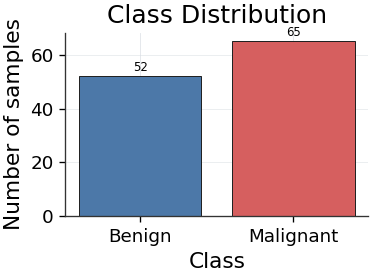


════════════════════════════════════════════════════════════════════════════════
PATIENT SAMPLE COUNT SUMMARY
════════════════════════════════════════════════════════════════════════════════
       samples_per_patient
count            48.000000
mean              2.437500
std               1.999002
min               1.000000
25%               1.000000
50%               2.000000
75%               3.000000
max               8.000000
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig02_samples_per_patient.png
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig02_samples_per_patient.pdf


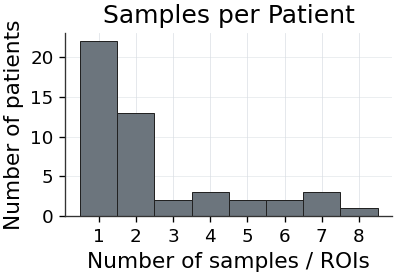

Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig03_feature_variance_distribution.png
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig03_feature_variance_distribution.pdf


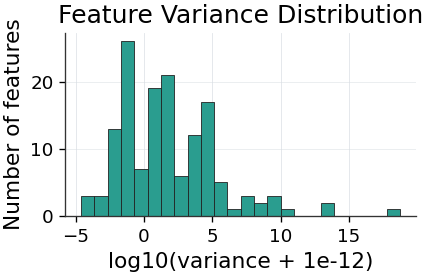


════════════════════════════════════════════════════════════════════════════════
SHAPIRO-WILK NORMALITY SUMMARY
════════════════════════════════════════════════════════════════════════════════
Normal features before FDR:     5
Non-normal features before FDR: 140
Normal features after FDR:      5
Non-normal features after FDR:  140
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig04_feature_normality_summary.png
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig04_feature_normality_summary.pdf


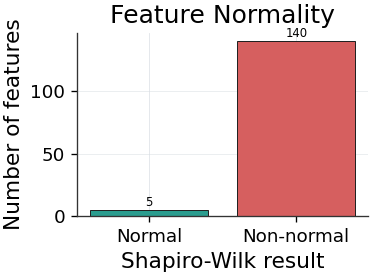


════════════════════════════════════════════════════════════════════════════════
TOP FEATURE-LABEL ASSOCIATIONS AFTER FDR
════════════════════════════════════════════════════════════════════════════════
                                       feature                correlation_method  correlation_coefficient  correlation_p_value  correlation_q_value_fdr class_difference_test  class_difference_p_value  class_difference_q_value_fdr  cohen_d_malignant_minus_benign
                               Morph_Compacity                          Spearman                 0.327981             0.000306                 0.007401        Mann_Whitney_U                  0.000416                      0.010053                        0.620920
                            Morph_Compactness1                          Spearman                -0.327981             0.000306                 0.007401        Mann_Whitney_U                  0.000416                      0.010053                       -0.698569
          

Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig05_top_fdr_ranked_features.png
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig05_top_fdr_ranked_features.pdf


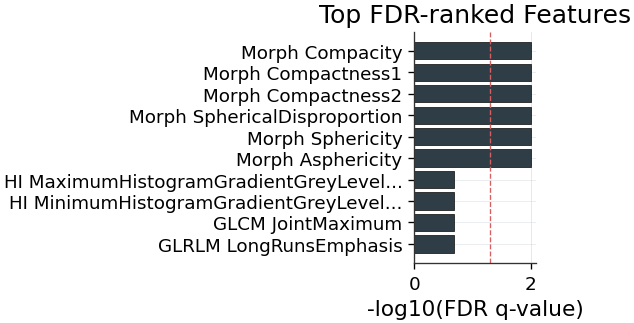

Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig06_top4_feature_boxplots.png
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig06_top4_feature_boxplots.pdf


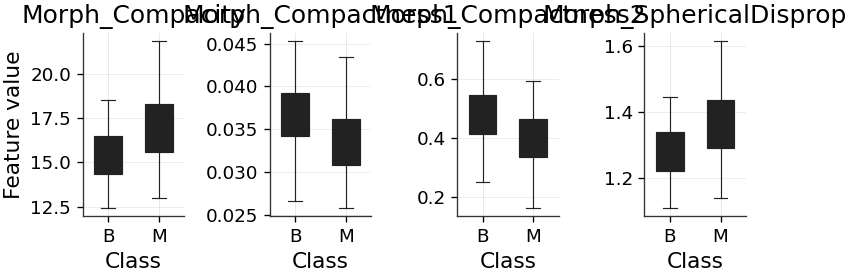

Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig07_top12_feature_correlation_heatmap.png
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig07_top12_feature_correlation_heatmap.pdf


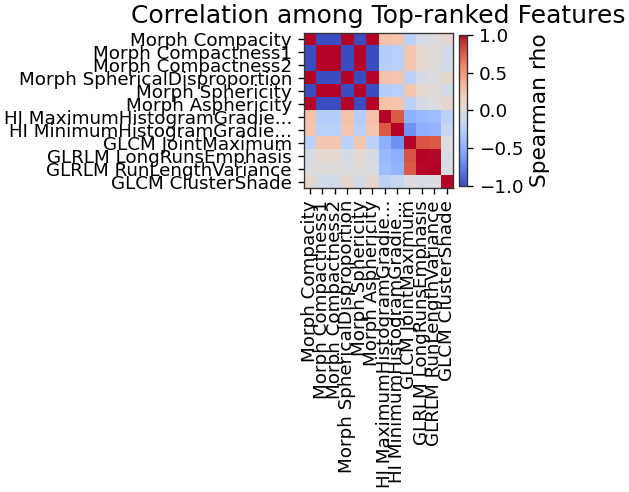

Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig08_pca_projection.png
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_1b_statistical_eda/plots_publication_style/fig08_pca_projection.pdf


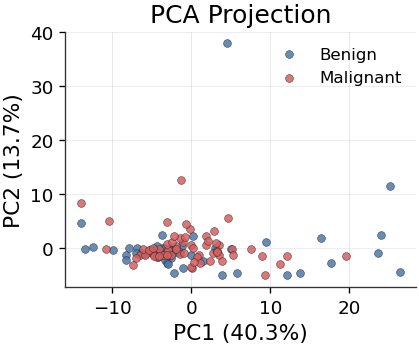


════════════════════════════════════════════════════════════════════════════════
PCA EXPLAINED VARIANCE
════════════════════════════════════════════════════════════════════════════════
component  explained_variance_ratio
      PC1                  0.403071
      PC2                  0.137400

════════════════════════════════════════════════════════════════════════════════
STEP 1B SUMMARY
════════════════════════════════════════════════════════════════════════════════
n_samples: 117
n_features: 145
n_label_0: 52
n_label_1: 65
class_balance_binomial_p_value: 0.26718230499039625
n_normal_features_raw_p_ge_0_05: 5
n_non_normal_features_raw_p_lt_0_05: 140
n_normal_features_fdr_q_ge_0_05: 5
n_non_normal_features_fdr_q_lt_0_05: 140
n_features_with_fdr_significant_class_difference: 6
n_features_with_fdr_significant_correlation: 6
pca_pc1_explained_variance_ratio: 0.4030710032205673
pca_pc2_explained_variance_ratio: 0.1374000263432484
eda_dir: nested_cv_outputs_single_dataset_batch_smote_compa

In [18]:
# =============================================================================
# STEP 1B — COMPACT STATISTICAL QA AND PUBLICATION-STYLE VISUAL EDA
# =============================================================================
# Purpose:
#   - Perform statistical QA after robust data ingestion.
#   - Avoid redundant figures.
#   - Generate compact, publication-style plots suitable for manuscripts.
#   - Save all figures as both high-resolution PNG and vector PDF.
#
# Important:
#   - This cell is EDA only.
#   - It does NOT modify X, y, groups, or feature_names.
#   - PCA here is visualization-only and must not be used for model training
#     outside cross-validation.
# =============================================================================

print("█" * 80)
print("  STEP 1B — COMPACT STATISTICAL QA AND PUBLICATION-STYLE EDA")
print("█" * 80)

import os
import re
import json
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import (
    shapiro,
    pearsonr,
    spearmanr,
    ttest_ind,
    mannwhitneyu,
    binomtest
)

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

warnings.filterwarnings("ignore")

# -----------------------------------------------------------------------------
# 1. Output directories
# -----------------------------------------------------------------------------
eda_dir = os.path.join(CONFIG["DATASET_OUTPUT_ROOT"], "step_1b_statistical_eda")
plot_dir = os.path.join(eda_dir, "plots_publication_style")

os.makedirs(eda_dir, exist_ok=True)
os.makedirs(plot_dir, exist_ok=True)

print(f"\nEDA output directory:\n  {eda_dir}")
print(f"Plot output directory:\n  {plot_dir}")

# -----------------------------------------------------------------------------
# 2. Publication-style plotting theme
# -----------------------------------------------------------------------------
# Professional, compact, manuscript-oriented theme.
# Labels are kept in English because most journals require English figures.
plt.style.use("default")

FIG_DPI = 600

COLORS = {
    "benign": "#4C78A8",
    "malignant": "#D65F5F",
    "neutral": "#6C757D",
    "accent": "#2A9D8F",
    "dark": "#2F3E46",
    "grid": "#D9DEE3"
}

plt.rcParams.update({
    "figure.dpi": 120,
    "savefig.dpi": FIG_DPI,
    "font.family": "DejaVu Sans",
    "font.size": PLOT_FONT_SIZE,
    "axes.titlesize": PLOT_TITLE_SIZE,
    "axes.labelsize": PLOT_LABEL_SIZE,
    "xtick.labelsize": PLOT_TICK_SIZE,
    "ytick.labelsize": PLOT_TICK_SIZE,
    "legend.fontsize": PLOT_LEGEND_SIZE,

    "axes.linewidth": 0.8,
    "axes.edgecolor": "#333333",
    "axes.grid": True,
    "grid.color": COLORS["grid"],
    "grid.linewidth": 0.5,
    "grid.alpha": 0.8,
    "savefig.bbox": "tight",
    "savefig.pad_inches": 0.03,
    "pdf.fonttype": 42,
    "ps.fonttype": 42
})


def clean_axis(ax):
    """
    Minimal journal-style axis formatting.
    """
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.grid(True, axis="y", linestyle="-", linewidth=0.5, alpha=0.6)
    ax.set_axisbelow(True)


def save_figure(fig, filename_base):
    """
    Save each figure in both PNG and PDF formats.
    """
    png_path = os.path.join(plot_dir, f"{filename_base}.png")
    pdf_path = os.path.join(plot_dir, f"{filename_base}.pdf")
    fig.savefig(png_path, dpi=FIG_DPI, bbox_inches="tight")
    fig.savefig(pdf_path, bbox_inches="tight")
    print(f"Saved: {png_path}")
    print(f"Saved: {pdf_path}")


# -----------------------------------------------------------------------------
# 3. Safety checks
# -----------------------------------------------------------------------------
required_objects = ["X", "y", "groups", "feature_names"]

for obj_name in required_objects:
    if obj_name not in globals():
        raise RuntimeError(f"Required object '{obj_name}' not found. Run Step 1 first.")

X_eda = np.asarray(X, dtype=float)
y_eda = np.asarray(y, dtype=int)
groups_eda = np.asarray(groups).astype(str)
feature_names_eda = list(feature_names)

if X_eda.shape[1] != len(feature_names_eda):
    raise ValueError("X column count does not match feature_names length.")

# -----------------------------------------------------------------------------
# 4. Helper functions
# -----------------------------------------------------------------------------
def benjamini_hochberg(p_values):
    """
    Benjamini-Hochberg FDR correction.
    Returns q-values in original order.
    """
    p_values = np.asarray(p_values, dtype=float)
    n = len(p_values)

    q_values = np.full(n, np.nan)
    valid_mask = np.isfinite(p_values)
    valid_p = p_values[valid_mask]

    if len(valid_p) == 0:
        return q_values

    order = np.argsort(valid_p)
    ranked_p = valid_p[order]

    adjusted = ranked_p * len(valid_p) / (np.arange(1, len(valid_p) + 1))
    adjusted = np.minimum.accumulate(adjusted[::-1])[::-1]
    adjusted = np.clip(adjusted, 0, 1)

    valid_q = np.empty_like(valid_p)
    valid_q[order] = adjusted

    q_values[valid_mask] = valid_q
    return q_values


def cohen_d(x0, x1):
    """
    Cohen's d: malignant minus benign.
    """
    x0 = np.asarray(x0, dtype=float)
    x1 = np.asarray(x1, dtype=float)

    x0 = x0[np.isfinite(x0)]
    x1 = x1[np.isfinite(x1)]

    n0, n1 = len(x0), len(x1)

    if n0 < 2 or n1 < 2:
        return np.nan

    s0 = np.var(x0, ddof=1)
    s1 = np.var(x1, ddof=1)

    pooled_sd = np.sqrt(((n0 - 1) * s0 + (n1 - 1) * s1) / (n0 + n1 - 2))

    if pooled_sd == 0:
        return np.nan

    return (np.mean(x1) - np.mean(x0)) / pooled_sd


def group_shapiro(x):
    """
    Safe Shapiro-Wilk test for one group.
    """
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    if len(x) < 3 or np.std(x) == 0:
        return np.nan, False

    stat, p = shapiro(x)
    return p, bool(p >= 0.05)


# -----------------------------------------------------------------------------
# 5. Class balance statistical test
# -----------------------------------------------------------------------------
label_counts = pd.Series(y_eda).value_counts().sort_index()

n_label_0 = int(label_counts.get(0, 0))
n_label_1 = int(label_counts.get(1, 0))
n_total = int(n_label_0 + n_label_1)

minority_count = min(n_label_0, n_label_1)

balance_test = binomtest(
    k=minority_count,
    n=n_total,
    p=0.5,
    alternative="two-sided"
)

class_balance_report = pd.DataFrame({
    "label": [0, 1],
    "class_name": ["Benign", "Malignant"],
    "count": [n_label_0, n_label_1],
    "proportion": [n_label_0 / n_total, n_label_1 / n_total],
    "binomial_balance_p_value": [balance_test.pvalue, balance_test.pvalue]
})

class_balance_report.to_csv(
    os.path.join(eda_dir, "class_balance_statistical_test.csv"),
    index=False
)

print("\n" + "═" * 80)
print("CLASS BALANCE STATISTICAL TEST")
print("═" * 80)
print(class_balance_report.to_string(index=False))
print(f"\nExact binomial test p-value: {balance_test.pvalue:.6f}")

# Figure 1: Class distribution only. No pie chart to avoid redundancy.
fig, ax = plt.subplots(figsize=(3.4, 2.6))

ax.bar(
    ["Benign", "Malignant"],
    [n_label_0, n_label_1],
    color=[COLORS["benign"], COLORS["malignant"]],
    edgecolor="#222222",
    linewidth=0.6
)

ax.set_title("Class Distribution")
ax.set_xlabel("Class")
ax.set_ylabel("Number of samples")
clean_axis(ax)

for i, v in enumerate([n_label_0, n_label_1]):
    ax.text(i, v + 1, str(v), ha="center", va="bottom", fontsize=7)

plt.tight_layout()
save_figure(fig, "fig01_class_distribution")
plt.show()


# -----------------------------------------------------------------------------
# 6. Patient/group structure
# -----------------------------------------------------------------------------
patient_counts = pd.Series(groups_eda).value_counts()

patient_count_summary = patient_counts.describe().to_frame("samples_per_patient")
patient_count_summary.to_csv(os.path.join(eda_dir, "patient_sample_count_summary.csv"))

print("\n" + "═" * 80)
print("PATIENT SAMPLE COUNT SUMMARY")
print("═" * 80)
print(patient_count_summary.to_string())

# Figure 2: Only one patient-distribution figure.
fig, ax = plt.subplots(figsize=(3.6, 2.6))

bins = np.arange(1, int(patient_counts.max()) + 2) - 0.5

ax.hist(
    patient_counts.values,
    bins=bins,
    color=COLORS["neutral"],
    edgecolor="#222222",
    linewidth=0.6
)

ax.set_title("Samples per Patient")
ax.set_xlabel("Number of samples / ROIs")
ax.set_ylabel("Number of patients")
ax.set_xticks(range(1, int(patient_counts.max()) + 1))
clean_axis(ax)

plt.tight_layout()
save_figure(fig, "fig02_samples_per_patient")
plt.show()


# -----------------------------------------------------------------------------
# 7. Missingness and variance reports
# -----------------------------------------------------------------------------
nan_counts = pd.Series(np.isnan(X_eda).sum(axis=0), index=feature_names_eda)
inf_counts = pd.Series(np.isinf(X_eda).sum(axis=0), index=feature_names_eda)
bad_counts = nan_counts + inf_counts

bad_feature_report = pd.DataFrame({
    "feature": feature_names_eda,
    "nan_count": nan_counts.values,
    "inf_count": inf_counts.values,
    "bad_value_count": bad_counts.values
}).sort_values("bad_value_count", ascending=False)

bad_feature_report.to_csv(
    os.path.join(eda_dir, "feature_missing_inf_report.csv"),
    index=False
)

feature_variance = pd.Series(np.nanvar(X_eda, axis=0), index=feature_names_eda)

variance_report = pd.DataFrame({
    "feature": feature_names_eda,
    "variance": feature_variance.values,
    "log10_variance": np.log10(feature_variance.values + 1e-12)
}).sort_values("variance", ascending=True)

variance_report.to_csv(
    os.path.join(eda_dir, "feature_variance_report.csv"),
    index=False
)

# Figure 3: Feature variance distribution.
fig, ax = plt.subplots(figsize=(3.8, 2.6))

ax.hist(
    variance_report["log10_variance"],
    bins=24,
    color=COLORS["accent"],
    edgecolor="#222222",
    linewidth=0.5
)

ax.set_title("Feature Variance Distribution")
ax.set_xlabel("log10(variance + 1e-12)")
ax.set_ylabel("Number of features")
clean_axis(ax)

plt.tight_layout()
save_figure(fig, "fig03_feature_variance_distribution")
plt.show()


# -----------------------------------------------------------------------------
# 8. Shapiro-Wilk normality test per feature
# -----------------------------------------------------------------------------
normality_rows = []

for j, feat in enumerate(feature_names_eda):
    xj = X_eda[:, j]
    xj = xj[np.isfinite(xj)]

    if len(xj) < 3 or np.nanstd(xj) == 0:
        shapiro_stat = np.nan
        shapiro_p = np.nan
        is_normal = False
    else:
        shapiro_stat, shapiro_p = shapiro(xj)
        is_normal = bool(shapiro_p >= 0.05)

    normality_rows.append({
        "feature": feat,
        "n_valid": int(len(xj)),
        "shapiro_stat": shapiro_stat,
        "shapiro_p_value": shapiro_p,
        "is_normal_global_p_ge_0_05": is_normal
    })

normality_report = pd.DataFrame(normality_rows)

normality_report["shapiro_q_value_fdr"] = benjamini_hochberg(
    normality_report["shapiro_p_value"].values
)

normality_report["is_normal_after_fdr_q_ge_0_05"] = (
    normality_report["shapiro_q_value_fdr"] >= 0.05
)

normality_report.to_csv(
    os.path.join(eda_dir, "shapiro_wilk_normality_report.csv"),
    index=False
)

n_normal_raw = int(normality_report["is_normal_global_p_ge_0_05"].sum())
n_non_normal_raw = int((~normality_report["is_normal_global_p_ge_0_05"]).sum())

n_normal_fdr = int(normality_report["is_normal_after_fdr_q_ge_0_05"].sum())
n_non_normal_fdr = int((~normality_report["is_normal_after_fdr_q_ge_0_05"]).sum())

print("\n" + "═" * 80)
print("SHAPIRO-WILK NORMALITY SUMMARY")
print("═" * 80)
print(f"Normal features before FDR:     {n_normal_raw}")
print(f"Non-normal features before FDR: {n_non_normal_raw}")
print(f"Normal features after FDR:      {n_normal_fdr}")
print(f"Non-normal features after FDR:  {n_non_normal_fdr}")

# Figure 4: Normal vs non-normal summary only.
fig, ax = plt.subplots(figsize=(3.4, 2.6))

ax.bar(
    ["Normal", "Non-normal"],
    [n_normal_raw, n_non_normal_raw],
    color=[COLORS["accent"], COLORS["malignant"]],
    edgecolor="#222222",
    linewidth=0.6
)

ax.set_title("Feature Normality")
ax.set_xlabel("Shapiro-Wilk result")
ax.set_ylabel("Number of features")
clean_axis(ax)

for i, v in enumerate([n_normal_raw, n_non_normal_raw]):
    ax.text(i, v + 1, str(v), ha="center", va="bottom", fontsize=7)

plt.tight_layout()
save_figure(fig, "fig04_feature_normality_summary")
plt.show()


# -----------------------------------------------------------------------------
# 9. Feature-label association:
#    Pearson if both class-specific distributions are normal,
#    Spearman if at least one class-specific distribution is non-normal.
# -----------------------------------------------------------------------------
association_rows = []

for j, feat in enumerate(feature_names_eda):
    xj = X_eda[:, j]

    finite_mask = np.isfinite(xj) & np.isfinite(y_eda)
    xj_valid = xj[finite_mask]
    y_valid = y_eda[finite_mask]

    x0 = xj_valid[y_valid == 0]
    x1 = xj_valid[y_valid == 1]

    shapiro_p_0, normal_0 = group_shapiro(x0)
    shapiro_p_1, normal_1 = group_shapiro(x1)

    use_parametric = bool(normal_0 and normal_1)

    # Correlation with binary label
    if len(np.unique(xj_valid)) < 2 or len(np.unique(y_valid)) < 2:
        corr_method = "undefined"
        corr_coef = np.nan
        corr_p = np.nan
    else:
        if use_parametric:
            corr_method = "Pearson_point_biserial_equivalent"
            corr_coef, corr_p = pearsonr(xj_valid, y_valid)
        else:
            corr_method = "Spearman"
            corr_coef, corr_p = spearmanr(xj_valid, y_valid)

    # Class difference test
    if len(x0) < 2 or len(x1) < 2:
        class_test = "undefined"
        class_test_stat = np.nan
        class_test_p = np.nan
    else:
        if use_parametric:
            class_test = "Welch_t_test"
            class_test_stat, class_test_p = ttest_ind(
                x0,
                x1,
                equal_var=False,
                nan_policy="omit"
            )
        else:
            class_test = "Mann_Whitney_U"
            try:
                class_test_stat, class_test_p = mannwhitneyu(
                    x0,
                    x1,
                    alternative="two-sided"
                )
            except ValueError:
                class_test_stat, class_test_p = np.nan, np.nan

    association_rows.append({
        "feature": feat,
        "n_valid": int(len(xj_valid)),
        "mean_benign": np.nanmean(x0) if len(x0) else np.nan,
        "mean_malignant": np.nanmean(x1) if len(x1) else np.nan,
        "median_benign": np.nanmedian(x0) if len(x0) else np.nan,
        "median_malignant": np.nanmedian(x1) if len(x1) else np.nan,
        "shapiro_p_benign": shapiro_p_0,
        "shapiro_p_malignant": shapiro_p_1,
        "normal_in_both_classes": use_parametric,
        "correlation_method": corr_method,
        "correlation_coefficient": corr_coef,
        "correlation_p_value": corr_p,
        "class_difference_test": class_test,
        "class_difference_stat": class_test_stat,
        "class_difference_p_value": class_test_p,
        "cohen_d_malignant_minus_benign": cohen_d(x0, x1)
    })

association_report = pd.DataFrame(association_rows)

association_report["correlation_q_value_fdr"] = benjamini_hochberg(
    association_report["correlation_p_value"].values
)

association_report["class_difference_q_value_fdr"] = benjamini_hochberg(
    association_report["class_difference_p_value"].values
)

association_report = association_report.sort_values(
    ["class_difference_q_value_fdr", "correlation_q_value_fdr"],
    ascending=[True, True]
)

association_report.to_csv(
    os.path.join(eda_dir, "feature_label_association_report.csv"),
    index=False
)

print("\n" + "═" * 80)
print("TOP FEATURE-LABEL ASSOCIATIONS AFTER FDR")
print("═" * 80)

display_cols = [
    "feature",
    "correlation_method",
    "correlation_coefficient",
    "correlation_p_value",
    "correlation_q_value_fdr",
    "class_difference_test",
    "class_difference_p_value",
    "class_difference_q_value_fdr",
    "cohen_d_malignant_minus_benign"
]

print(association_report[display_cols].head(15).to_string(index=False))


# -----------------------------------------------------------------------------
# 10. Figure 5: Top FDR-ranked features
# -----------------------------------------------------------------------------
assoc_plot_df = association_report.copy()

safe_q = assoc_plot_df["class_difference_q_value_fdr"].copy()
safe_q = safe_q.replace(0, np.nextafter(0, 1))
assoc_plot_df["minus_log10_q"] = -np.log10(safe_q)

assoc_plot_df = assoc_plot_df.replace([np.inf, -np.inf], np.nan)
assoc_plot_df = assoc_plot_df.dropna(subset=["minus_log10_q"])

top_assoc = assoc_plot_df.head(10).iloc[::-1]

if len(top_assoc) > 0:
    fig, ax = plt.subplots(figsize=(4.8, 3.0))


    top_assoc = top_assoc.copy()

    top_assoc["feature_label"] = (
        top_assoc["feature"]
        .map(
            lambda x: abbreviate_feature_name(
                x,
                max_len=40
            )
        )
    )

    ax.barh(
        top_assoc["feature_label"],
        top_assoc["minus_log10_q"],
        color=COLORS["dark"],
        edgecolor="#222222",
        linewidth=0.5
    )

    ax.axvline(
        -np.log10(0.05),
        linestyle="--",
        linewidth=0.8,
        color=COLORS["malignant"]
    )

    ax.set_title("Top FDR-ranked Features")
    ax.set_xlabel("-log10(FDR q-value)")
    ax.set_ylabel("")
    clean_axis(ax)

    plt.tight_layout()
    save_figure(fig, "fig05_top_fdr_ranked_features")
    plt.show()


# -----------------------------------------------------------------------------
# 11. Figure 6: Compact boxplots for top 4 FDR-ranked features
# -----------------------------------------------------------------------------
top_box_features = association_report["feature"].head(4).tolist()

if len(top_box_features) > 0:
    fig, axes = plt.subplots(
        nrows=1,
        ncols=len(top_box_features),
        figsize=(min(6.4, 1.6 * len(top_box_features)), 2.6),
        sharey=False
    )

    if len(top_box_features) == 1:
        axes = [axes]

    for ax, feat in zip(axes, top_box_features):
        j = feature_names_eda.index(feat)
        xj = X_eda[:, j]

        x0 = xj[y_eda == 0]
        x1 = xj[y_eda == 1]

        bp = ax.boxplot(
            [x0[np.isfinite(x0)], x1[np.isfinite(x1)]],
            labels=["B", "M"],
            patch_artist=True,
            showfliers=False,
            widths=0.55
        )

        bp["boxes"][0].set_facecolor(COLORS["benign"])
        bp["boxes"][1].set_facecolor(COLORS["malignant"])

        for element in ["boxes", "whiskers", "caps", "medians"]:
            for item in bp[element]:
                item.set_color("#222222")
                item.set_linewidth(0.7)

        ax.set_title(feat[:22])
        ax.set_xlabel("Class")
        ax.tick_params(axis="x", rotation=0)
        clean_axis(ax)

    axes[0].set_ylabel("Feature value")

    plt.tight_layout()
    save_figure(fig, "fig06_top4_feature_boxplots")
    plt.show()


# -----------------------------------------------------------------------------
# 12. Figure 7: Spearman correlation heatmap among top 12 FDR-ranked features
# -----------------------------------------------------------------------------
top_heatmap_features = association_report["feature"].head(12).tolist()

if len(top_heatmap_features) >= 2:
    top_indices = [feature_names_eda.index(f) for f in top_heatmap_features]

    X_top = pd.DataFrame(
        X_eda[:, top_indices],
        columns=top_heatmap_features
    )

    corr_matrix = X_top.corr(method="spearman")

    corr_matrix.to_csv(
        os.path.join(eda_dir, "top12_features_spearman_correlation_matrix.csv")
    )

    fig, ax = plt.subplots(figsize=(5.0, 4.4))

    im = ax.imshow(
        corr_matrix,
        aspect="auto",
        vmin=-1,
        vmax=1,
        cmap="coolwarm"
    )

    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label("Spearman rho")

    short_labels = [
        abbreviate_feature_name(
            feature,
            max_len=28
        )
        for feature in top_heatmap_features
    ]
    ax.set_xticklabels(
        short_labels,
        rotation=90,
        fontsize=PLOT_TICK_SIZE
    )

    ax.set_yticklabels(
        short_labels,
        fontsize=PLOT_TICK_SIZE
    )
    
    ax.set_xticks(np.arange(len(short_labels)))
    ax.set_yticks(np.arange(len(short_labels)))
    ax.set_xticklabels(short_labels, rotation=90)
    ax.set_yticklabels(short_labels)

    ax.set_title("Correlation among Top-ranked Features")
    ax.grid(False)

    plt.tight_layout()
    save_figure(fig, "fig07_top12_feature_correlation_heatmap")
    plt.show()


# -----------------------------------------------------------------------------
# 13. Figure 8: PCA projection
# -----------------------------------------------------------------------------
# EDA-only global transformation.
# Do not use these PCA components for model training outside CV.
imputer_eda = SimpleImputer(strategy="median")
scaler_eda = StandardScaler()

X_imp = imputer_eda.fit_transform(X_eda)
X_scaled = scaler_eda.fit_transform(X_imp)

pca = PCA(n_components=2, random_state=CONFIG.get("RANDOM_STATE", 42))
X_pca = pca.fit_transform(X_scaled)

pca_df = pd.DataFrame({
    "PC1": X_pca[:, 0],
    "PC2": X_pca[:, 1],
    "Label": y_eda,
    "Patient_ID": groups_eda
})

pca_df.to_csv(os.path.join(eda_dir, "pca_2d_coordinates.csv"), index=False)

pca_variance_df = pd.DataFrame({
    "component": ["PC1", "PC2"],
    "explained_variance_ratio": pca.explained_variance_ratio_
})

pca_variance_df.to_csv(
    os.path.join(eda_dir, "pca_2d_explained_variance.csv"),
    index=False
)

fig, ax = plt.subplots(figsize=(3.8, 3.2))

for cls, label_name, color in [
    (0, "Benign", COLORS["benign"]),
    (1, "Malignant", COLORS["malignant"])
]:
    idx = y_eda == cls
    ax.scatter(
        X_pca[idx, 0],
        X_pca[idx, 1],
        label=label_name,
        s=22,
        alpha=0.85,
        color=color,
        edgecolor="#222222",
        linewidth=0.3
    )

ax.set_title("PCA Projection")
ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.1%})")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.1%})")
ax.legend(frameon=False, loc="best")
clean_axis(ax)

plt.tight_layout()
save_figure(fig, "fig08_pca_projection")
plt.show()

print("\n" + "═" * 80)
print("PCA EXPLAINED VARIANCE")
print("═" * 80)
print(pca_variance_df.to_string(index=False))


# -----------------------------------------------------------------------------
# 14. Compact JSON summary for future comparison
# -----------------------------------------------------------------------------
step_1b_summary = {
    "n_samples": int(X_eda.shape[0]),
    "n_features": int(X_eda.shape[1]),
    "n_label_0": int(n_label_0),
    "n_label_1": int(n_label_1),
    "class_balance_binomial_p_value": float(balance_test.pvalue),
    "n_normal_features_raw_p_ge_0_05": int(n_normal_raw),
    "n_non_normal_features_raw_p_lt_0_05": int(n_non_normal_raw),
    "n_normal_features_fdr_q_ge_0_05": int(n_normal_fdr),
    "n_non_normal_features_fdr_q_lt_0_05": int(n_non_normal_fdr),
    "n_features_with_fdr_significant_class_difference": int(
        (association_report["class_difference_q_value_fdr"] < 0.05).sum()
    ),
    "n_features_with_fdr_significant_correlation": int(
        (association_report["correlation_q_value_fdr"] < 0.05).sum()
    ),
    "pca_pc1_explained_variance_ratio": float(pca.explained_variance_ratio_[0]),
    "pca_pc2_explained_variance_ratio": float(pca.explained_variance_ratio_[1]),
    "eda_dir": eda_dir,
    "plot_dir": plot_dir
}

with open(os.path.join(eda_dir, "step_1b_summary.json"), "w") as f:
    json.dump(step_1b_summary, f, indent=4)

print("\n" + "═" * 80)
print("STEP 1B SUMMARY")
print("═" * 80)

for k, v in step_1b_summary.items():
    print(f"{k}: {v}")

print("\nSaved statistical reports and publication-style plots to:")
print(f"  {eda_dir}")
print(f"  {plot_dir}")

print("\nSTEP 1B completed successfully.")

In [19]:
# =============================================================================
# STEP 2A — BASELINE RUN CONFIGURATION LOCK
# =============================================================================
# Baseline must be a real no-SMOTE run saved under the exact path used later by
# the SMOTE-vs-baseline comparison cell.
# =============================================================================

print("█" * 80)
print("  STEP 2A — BASELINE CONFIGURATION LOCK")
print("█" * 80)

import os
import json

# -----------------------------------------------------------------------------
# Baseline identity — this folder name is required by Step 3B
# -----------------------------------------------------------------------------
CONFIG["RUN_NAME"] = "step_2_baseline_nested_cv_no_smote"
CONFIG["SAVE_DIR"] = os.path.join(
    CONFIG["DATASET_OUTPUT_ROOT"],
    CONFIG["RUN_NAME"]
)
SAVE_DIR = CONFIG["SAVE_DIR"]
os.makedirs(CONFIG["SAVE_DIR"], exist_ok=True)

# -----------------------------------------------------------------------------
# Core baseline settings
# -----------------------------------------------------------------------------
CONFIG["USE_SMOTE"] = False
CONFIG["FS_METHOD"] = "mrmr_then_elasticnet_no_corr"
CONFIG["FS_N_FEATURES"] = 14
CONFIG["AUTO_TUNE_FS_N_FEATURES"] = False

# Patient-aware nested CV
CONFIG["N_OUTER_FOLDS"] = CONFIG.get("N_OUTER_FOLDS", 5)
CONFIG["N_INNER_FOLDS"] = CONFIG.get("N_INNER_FOLDS", 3)
CONFIG["N_OPTUNA_TRIALS"] = CONFIG.get("N_OPTUNA_TRIALS", 20)

# -----------------------------------------------------------------------------
# Safety checks
# -----------------------------------------------------------------------------
if "groups" not in globals():
    raise RuntimeError("groups object not found. Run Step 1 first.")

if len(set(groups)) < CONFIG["N_OUTER_FOLDS"]:
    raise ValueError(
        f"Unique patients/groups = {len(set(groups))}, "
        f"but N_OUTER_FOLDS = {CONFIG['N_OUTER_FOLDS']}."
    )

baseline_config_snapshot = {
    "RUN_NAME": CONFIG["RUN_NAME"],
    "SAVE_DIR": CONFIG["SAVE_DIR"],
    "USE_SMOTE": CONFIG["USE_SMOTE"],
    "FS_METHOD": CONFIG["FS_METHOD"],
    "FS_N_FEATURES": CONFIG["FS_N_FEATURES"],
    "AUTO_TUNE_FS_N_FEATURES": CONFIG.get("AUTO_TUNE_FS_N_FEATURES"),
    "N_OUTER_FOLDS": CONFIG["N_OUTER_FOLDS"],
    "N_INNER_FOLDS": CONFIG["N_INNER_FOLDS"],
    "N_OPTUNA_TRIALS": CONFIG["N_OPTUNA_TRIALS"],
    "RANDOM_STATE": CONFIG["RANDOM_STATE"],
    "N_SAMPLES": int(X.shape[0]),
    "N_FEATURES": int(X.shape[1]),
    "N_PATIENTS": int(len(set(groups))),
    "DATASET_TAG": CONFIG.get("DATASET_TAG"),
    "INPUT_FILE": CONFIG.get("INPUT_FILE"),
    "CLEANED_DATASET_PATH": CONFIG.get("CLEANED_DATASET_PATH"),
}

with open(os.path.join(CONFIG["SAVE_DIR"], "baseline_config_snapshot.json"), "w") as f:
    json.dump(baseline_config_snapshot, f, indent=4)

print("Baseline configuration:")
for k, v in baseline_config_snapshot.items():
    print(f"  {k}: {v}")

print("STEP 2A completed successfully.")


████████████████████████████████████████████████████████████████████████████████
  STEP 2A — BASELINE CONFIGURATION LOCK
████████████████████████████████████████████████████████████████████████████████
Baseline configuration:
  RUN_NAME: step_2_baseline_nested_cv_no_smote
  SAVE_DIR: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_2_baseline_nested_cv_no_smote
  USE_SMOTE: False
  FS_METHOD: mrmr_then_elasticnet_no_corr
  FS_N_FEATURES: 14
  AUTO_TUNE_FS_N_FEATURES: False
  N_OUTER_FOLDS: 5
  N_INNER_FOLDS: 3
  N_OPTUNA_TRIALS: 10
  RANDOM_STATE: 100
  N_SAMPLES: 117
  N_FEATURES: 145
  N_PATIENTS: 48
  DATASET_TAG: T2
  INPUT_FILE: /Users/mahla/MyDrive/Research/SBU/Dr. Kheradpisheh/ML-Based-Classification-of-Benign-and-Malignant-Breast-Lesions-Using-Radiomic-Features-from-MRI-Data/Single/output/all_single_datasets_standardized/T2_single_standardized.csv
  CLEANED_DATASET_PATH: output/cleaned_single_datasets_smote_compare/T2/T2_single_standardized_Cleaned.csv
STEP 2A compl

In [20]:
# =============================================================================
# MULTI-STAGE FEATURE SELECTION ENGINE (STAGE 1 TO STAGE 4)
# =============================================================================
# Purpose:
#   - Stage 1: Eliminate morphological volume confounders using Spearman rho.
#   - Stage 2: Prune redundant features based on Pearson r and AUC rankings.
#   - Stage 3: Perform mRMR selection separately on CT and PET blocks.
#   - Stage 4: Enforce stability selection via subsampled ElasticNet LogReg.
# =============================================================================

import numpy as np
from pathlib import Path
from scipy.stats import spearmanr
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import mutual_info_classif

# -----------------------------------------------------------------------------
# STAGE 1: MORPHOLOGICAL VOLUME INDEPENDENCE FILTER
# -----------------------------------------------------------------------------
def stage1_volume_independence(X_train, feat_names, volume_col, threshold,
                               category_patterns, all_feature_names_original,
                               X_train_original):
    print("\n" + "═" * 75)
    print("  📐 Stage 1: Volume Independence Filter")
    print(f"     Threshold: |ρ_Spearman| > {threshold}")
    print("═" * 75)

    n_input = len(feat_names)

    # Morphology flag (for reporting only, NOT for automatic removal)
    morph_keywords = category_patterns.get('MORPHOLOGY', [])
    morph_flag = {}
    for fn in feat_names:
        fn_lower = fn.lower()
        is_morph = any(kw.lower() in fn_lower for kw in morph_keywords)
        is_morph = is_morph or any(tag in fn_lower
                                    for tag in ['morphological', '_morph_', '_shape_'])
        morph_flag[fn] = is_morph

    # Find volume vector
    vol_vector = None
    vol_source = "NOT FOUND"

    # Try 1: from original feature matrix
    if all_feature_names_original is not None and volume_col in all_feature_names_original:
        vol_idx = all_feature_names_original.index(volume_col)
        vol_vector = X_train_original[:, vol_idx]
        vol_source = volume_col

    # Try 2: fallback search in original
    if vol_vector is None and all_feature_names_original is not None:
        for i_col, fn_col in enumerate(all_feature_names_original):
            fn_lower = fn_col.lower()
            if (
                ('volume' in fn_lower or 'meshvolume' in fn_lower)
                and 'approximate' not in fn_lower
            ):
                vol_vector = X_train_original[:, i_col]
                vol_source = fn_col
                break

    # Try 3: from current features
    if vol_vector is None:
        for i_col, fn_col in enumerate(feat_names):
            fn_lower = fn_col.lower()
            if (
                ('volume' in fn_lower or 'meshvolume' in fn_lower)
                and 'approximate' not in fn_lower
            ):              
                vol_vector = X_train[:, i_col]
                vol_source = fn_col
                break

    print(f"   📦 Volume column: {vol_source}")

    vol_corr_mask = np.zeros(n_input, dtype=bool)
    vol_details = {}

    if vol_vector is not None:
        print(f"\n  {'Feature':<55} {'|ρ|':>6}  {'Status':<10}  {'Morph?':>6}")
        print("  " + "─" * 85)

        for j in range(n_input):
            fn = feat_names[j]
            try:
                rho, _ = spearmanr(X_train[:, j], vol_vector)
                abs_rho = abs(rho) if np.isfinite(rho) else 0.0
            except Exception:
                abs_rho = 0.0

            vol_details[fn] = abs_rho

            if abs_rho > threshold:
                vol_corr_mask[j] = True
                print(f"       {fn[:53]:53s} {abs_rho:6.3f}  REMOVED   "
                      f"{str(morph_flag[fn]):>6}")
            elif abs_rho > threshold * 0.7:
                print(f"     {fn[:53]:53s} {abs_rho:6.3f}  kept      "
                      f"{str(morph_flag[fn]):>6}")
    else:
        print("  Volume column NOT FOUND — skipping this stage")

    keep_idx = np.where(~vol_corr_mask)[0]

    print(f"\n  📊 Summary: {n_input} → {len(keep_idx)} "
          f"(removed {int(vol_corr_mask.sum())} volume-dependent)")

    info = {
        'n_input': n_input,
        'n_output': len(keep_idx),
        'n_vol_dep_removed': int(vol_corr_mask.sum()),
        'vol_corr_details': vol_details,
        'removed_features': [feat_names[i] for i in np.where(vol_corr_mask)[0]],
        'kept_features': [feat_names[i] for i in keep_idx],
        'morph_flag': morph_flag,
    }
    return keep_idx, info


# -----------------------------------------------------------------------------
# STAGE 2: REDUNDANCY REDUCTION (PEARSON PAIR-WISE CLUSTERING)
# -----------------------------------------------------------------------------
def stage2_redundancy_reduction(X_train, y_train, feat_names, threshold=0.90):
    print("\n" + "═" * 75)
    print("  🔗 Stage 2: Redundancy Reduction (Pearson |r| clustering)")
    print(f"     Threshold: |r| > {threshold}")
    print("═" * 75)

    n_input = len(feat_names)
    corr_matrix = np.nan_to_num(
        np.corrcoef(X_train, rowvar=False),
        nan=0.0,
        posinf=0.0,
        neginf=0.0
    )
    auc_scores = np.zeros(n_input)
    for j in range(n_input):
        try:
            if np.std(X_train[:, j]) < 1e-12:
                auc_scores[j] = 0.5
            else:
                auc = roc_auc_score(y_train, X_train[:, j])
                auc_scores[j] = max(auc, 1 - auc)
        except Exception:
            auc_scores[j] = 0.5

    remaining = set(range(n_input))
    selected_idx = []
    removal_reasons = {}

    for idx in np.argsort(-auc_scores):
        if idx not in remaining:
            continue
        selected_idx.append(idx)
        remaining.discard(idx)

        to_remove = set()
        for other in remaining:
            if abs(corr_matrix[idx, other]) > threshold:
                to_remove.add(other)
                removal_reasons[other] = (idx, corr_matrix[idx, other])
        remaining -= to_remove

    selected_idx = sorted(selected_idx)
    removed_features = [i for i in range(n_input) if i not in selected_idx]

    print(f"\n  📋 All features ranked by AUC:")
    print(f"  {'#':<4} {'Feature':<55} {'AUC':<8} {'Status':<10}")
    print("  " + "─" * 80)
    for rank, idx in enumerate(np.argsort(-auc_scores), 1):
        status = "KEPT" if idx in selected_idx else "  REMOVED"
        print(f"  {rank:<4} {feat_names[idx][:53]:<55} "
              f"{auc_scores[idx]:.4f}  {status}")

    if removed_features:
        print(f"\n    REMOVED {len(removed_features)} features (beaten by correlated feature):")
        print(f"  {'#':<4} {'Removed':<42} {'AUC':<8} {'Beaten By':<32} {'|r|':<8}")
        print("  " + "─" * 95)
        for rank, idx in enumerate(removed_features, 1):
            if idx in removal_reasons:
                w_idx, corr_val = removal_reasons[idx]
                print(f"  {rank:<4} {feat_names[idx][:40]:<42} "
                      f"{auc_scores[idx]:.4f}  "
                      f"{feat_names[w_idx][:30]:<32} {abs(corr_val):.4f}")

    print(f"\n  KEPT {len(selected_idx)} features:")
    for rank, idx in enumerate(selected_idx, 1):
        print(f"     {rank}. {feat_names[idx][:55]} (AUC: {auc_scores[idx]:.4f})")

    print(f"\n  📊 Summary: {n_input} → {len(selected_idx)}")

    info = {
        'n_input': n_input,
        'n_output': len(selected_idx),
        'threshold': threshold,
        'removed_features': [(feat_names[i], float(auc_scores[i]),
                              feat_names[removal_reasons[i][0]] if i in removal_reasons else "N/A",
                              float(abs(removal_reasons[i][1])) if i in removal_reasons else 0)
                             for i in removed_features],
        'kept_features': [feat_names[i] for i in selected_idx],
        'auc_scores': dict(zip(feat_names, auc_scores.tolist())),
    }
    return np.array(selected_idx), auc_scores, info


# -----------------------------------------------------------------------------
# STAGE 3: mRMR 
# -----------------------------------------------------------------------------


def stage3_mrmr_selection_blockwise(X_train, y_train, feat_names, n_features=14):
    print("\n" + "═" * 75)
    print("  🧠 Stage 3: mRMR Selection (Single Modality)")
    print("═" * 75)

    if len(np.unique(y_train)) < 2:
        raise ValueError("Stage 3 mRMR requires at least two classes in y_train.")

    n_features = min(n_features, X_train.shape[1])
    class_counts = np.bincount(y_train.astype(int))
    min_class_count = class_counts[class_counts > 0].min()
    safe_neighbors = max(1, min(3, min_class_count - 1))

    relevance = mutual_info_classif(
        X_train,
        y_train,
        random_state=42,
        n_neighbors=safe_neighbors
    )

    corr_mat = np.nan_to_num(np.corrcoef(X_train, rowvar=False))

    selected = []
    remaining = list(range(X_train.shape[1]))

    for k in range(n_features):
        best_score = -np.inf
        best_idx = None

        for idx in remaining:
            rel = relevance[idx]
            if len(selected) == 0:
                red = 0
            else:
                red = np.mean([abs(corr_mat[idx, s]) for s in selected])

            score = rel - red

            if score > best_score:
                best_score = score
                best_idx = idx

        selected.append(best_idx)
        remaining.remove(best_idx)

        print(f"   {k+1}. {feat_names[best_idx]:<40} score={best_score:.4f}")

    return selected, relevance, {"kept_features": [feat_names[i] for i in selected]}


# -----------------------------------------------------------------------------
# STAGE 4: RESAMPLED STABILITY SELECTION (ELASTIC-NET LOGISTIC REGRESSION)
# -----------------------------------------------------------------------------
def stage4_stability_selection(X_train, y_train, feat_names,
                               n_iterations=300, subsample_ratio=0.5,
                               sel_threshold=0.75, l1_ratios=None,
                               Cs=None, random_state=42,
                               coef_threshold=1e-3,
                               fallback_step=0.05,       
                               fallback_min_threshold=0.40,  
                               fallback_min_features=3):     

    print("\n" + "═" * 75)
    print("  🎯 Stage 4: Stability Selection (ElasticNet LogReg)")
    print(f"     Iterations: {n_iterations} | Subsample: {subsample_ratio}")
    print(f"     Selection threshold: {sel_threshold}")
    print(f"     Coefficient threshold: {coef_threshold}")
    print(f"     Fallback: step={fallback_step}, "
          f"min_thresh={fallback_min_threshold}, "
          f"min_features={fallback_min_features}")
    print("═" * 75)

    if len(np.unique(y_train)) < 2:
        raise ValueError("Stage 4 stability selection requires at least two classes in y_train.")

    if l1_ratios is None:
        l1_ratios = [0.8, 0.9, 0.95, 1.0]
    if Cs is None:
        Cs = [0.005, 0.01, 0.05, 0.1]

    n_features = len(feat_names)
    n_samples = X_train.shape[0]
    n_sub = max(int(n_samples * subsample_ratio), 10)

    # Scale once
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_train)

    selection_count = np.zeros(n_features)
    coef_accumulator = np.zeros(n_features)
    rng = np.random.RandomState(random_state)

    successful = 0
    failed = 0

    for it in range(n_iterations):
        # Random subsample (stratified)
        idx_0 = np.where(y_train == 0)[0]
        idx_1 = np.where(y_train == 1)[0]

        n_sub_0 = max(int(len(idx_0) * subsample_ratio), 2)
        n_sub_1 = max(int(len(idx_1) * subsample_ratio), 2)

        if len(idx_0) > 0:
            sub_0 = rng.choice(idx_0, size=min(n_sub_0, len(idx_0)), replace=False)
        else:
            sub_0 = np.array([], dtype=int)
        if len(idx_1) > 0:
            sub_1 = rng.choice(idx_1, size=min(n_sub_1, len(idx_1)), replace=False)
        else:
            sub_1 = np.array([], dtype=int)
        sub_idx = np.concatenate([sub_0, sub_1])

        X_sub = X_scaled[sub_idx]
        y_sub = y_train[sub_idx]

        # Random hyperparameters
        l1_ratio = rng.choice(l1_ratios)
        C = rng.choice(Cs)

        try:
            model = LogisticRegression(
                penalty='elasticnet', solver='saga',
                C=C, l1_ratio=l1_ratio,
                max_iter=5000,
                random_state=random_state + it,
                tol=1e-5
            )
            model.fit(X_sub, y_sub)

            coefs = np.abs(model.coef_[0])
            selected_mask = np.abs(coefs) > coef_threshold
            selection_count += selected_mask.astype(float)
            coef_accumulator += coefs
            successful += 1

        except Exception:
            failed += 1

        # Progress tracking updates
        if (it + 1) % 100 == 0:
            current_freq = selection_count / max(successful, 1)
            n_passing = np.sum(current_freq >= sel_threshold)
            print(f"    ... iteration {it + 1}/{n_iterations} "
                  f"(success: {successful}, failed: {failed}, "
                  f"passing: {n_passing} features)")

    # Compute operational frequencies
    if successful > 0:
        selection_freq = selection_count / successful
        mean_coefs = coef_accumulator / successful
    else:
        selection_freq = np.zeros(n_features)
        mean_coefs = np.zeros(n_features)

    # ══════════════════════════════════════════════════════════
    # ADAPTIVE FALLBACK PROTOCOL: GRADUAL THRESHOLD DECAY
    # ══════════════════════════════════════════════════════════
    current_threshold = sel_threshold
    keep_idx = np.where(selection_freq >= current_threshold)[0]

    # Dynamically decay selection criterion if total retained features falls below safety boundaries
    if len(keep_idx) < fallback_min_features:
        print(f"\n   Only {len(keep_idx)} features at threshold "
              f"{current_threshold:.2f} (need ≥{fallback_min_features})")
        print(f"  🔄 Starting adaptive threshold reduction...")

        while (len(keep_idx) < fallback_min_features and
               current_threshold > fallback_min_threshold):

            current_threshold -= fallback_step
            current_threshold = round(current_threshold, 4)  # Safeguard floating-point precision bounds
            keep_idx = np.where(selection_freq >= current_threshold)[0]

            print(f"      → threshold = {current_threshold:.2f} "
                  f"→ {len(keep_idx)} features selected")

        # Absolute fallback override if minimal conditions remain unsatisfied
        if len(keep_idx) < fallback_min_features:
            print(f"\n  🚨 Still only {len(keep_idx)} features at "
                  f"minimum threshold {fallback_min_threshold:.2f}")
            print(f"  🔄 Selecting top {fallback_min_features} by frequency...")
            keep_idx = np.argsort(-selection_freq)[:fallback_min_features]
            if len(keep_idx) > 0:
                current_threshold = selection_freq[keep_idx[-1]]
            else:
                current_threshold = fallback_min_threshold
            print(f"      → Effective threshold: {current_threshold:.3f}")

        if current_threshold < sel_threshold:
            print(f"\n  📌 Final threshold: {current_threshold:.2f} "
                  f"(original: {sel_threshold:.2f})")

    # --- Verbose Output Generation -------------------------------------------
    print(f"\n  📋 Feature selection frequencies "
          f"(threshold used: {current_threshold:.2f}):")
    print(f"  {'#':<4} {'Feature':<55} {'Freq':<8} "
          f"{'MeanCoef':<10} {'Status':<10}")
    print("  " + "─" * 90)

    for rank, idx in enumerate(np.argsort(-selection_freq), 1):
        status = "KEPT" if selection_freq[idx] >= current_threshold else " "
        print(f"  {rank:<4} {feat_names[idx][:53]:<55} "
              f"{selection_freq[idx]:.3f}  {mean_coefs[idx]:.6f}  {status}")

    print(f"\n  📊 Summary: {n_features} → {len(keep_idx)} "
          f"(removed {n_features - len(keep_idx)})")
    print(f"     Successful iterations: {successful}/{n_iterations}")
    if current_threshold < sel_threshold:
        print(f"      Threshold was reduced: "
              f"{sel_threshold:.2f} → {current_threshold:.2f}")

    info = {
        'n_input': n_features,
        'n_output': len(keep_idx),
        'n_iterations_success': successful,
        'n_iterations_failed': failed,
        'original_threshold': sel_threshold,
        'final_threshold': current_threshold,
        'threshold_was_reduced': current_threshold < sel_threshold,
        'selection_frequencies': dict(zip(feat_names, selection_freq.tolist())),
        'mean_coefficients': dict(zip(feat_names, mean_coefs.tolist())),
        'kept_features': [feat_names[i] for i in keep_idx],
    }
    return keep_idx, selection_freq, info



# -----------------------------------------------------------------------------
# ALTERNATIVE FS: CORRELATION FILTER + ELASTICNET SELECTION
# -----------------------------------------------------------------------------
def stage_elasticnet_selection(X_train, y_train, feat_names,
                               n_features=12,
                               l1_ratio=0.8,
                               C=0.1,
                               random_state=100):
    print("\n" + "═" * 75)
    print("  🧬 Alternative FS: ElasticNet Logistic Selection")
    print(f"     Target features: {n_features}")
    print("═" * 75)

    if len(np.unique(y_train)) < 2:
        raise ValueError("ElasticNet selection requires at least two classes in y_train.")

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_train)

    model = LogisticRegression(
        penalty='elasticnet',
        solver='saga',
        C=C,
        l1_ratio=l1_ratio,
        max_iter=5000,
        random_state=random_state,
        class_weight='balanced',
        tol=1e-5
    )

    model.fit(X_scaled, y_train)

    coef_abs = np.abs(model.coef_[0])

    if np.all(coef_abs == 0):
        keep_idx = np.argsort(-coef_abs)[:min(n_features, X_train.shape[1])]
    else:
        keep_idx = np.argsort(-coef_abs)[:min(n_features, X_train.shape[1])]

    keep_idx = np.array(sorted(keep_idx))

    print(f"  📊 Summary: {X_train.shape[1]} → {len(keep_idx)}")
    print("  Selected features:")
    for i, idx in enumerate(keep_idx, 1):
        print(f"     {i}. {feat_names[idx]} | coef_abs={coef_abs[idx]:.6f}")

    info = {
        "n_input": X_train.shape[1],
        "n_output": len(keep_idx),
        "kept_features": [feat_names[i] for i in keep_idx],
        "coef_abs": dict(zip(feat_names, coef_abs.tolist()))
    }

    return keep_idx, coef_abs, info

    
# -----------------------------------------------------------------------------
# PIPELINE STEP DEFINITION VERIFICATION
# -----------------------------------------------------------------------------
print(f"\n  All 4 feature selection functions defined:")
print(f"     1. stage1_volume_independence()")
print(f"     2. stage2_redundancy_reduction()")
print(f"     3. stage3_mrmr_selection_blockwise()")
print(f"     4. stage4_stability_selection()")
if 'X' in globals() and 'feature_names' in globals():
    print(f"\n  📊 Current data: X.shape = {X.shape}, features = {len(feature_names)}")


  All 4 feature selection functions defined:
     1. stage1_volume_independence()
     2. stage2_redundancy_reduction()
     3. stage3_mrmr_selection_blockwise()
     4. stage4_stability_selection()

  📊 Current data: X.shape = (117, 145), features = 145


In [21]:
# =============================================================================
# MODEL ARCHITECTURE POOL AND BASE ESTIMATOR TEMPLATES
# =============================================================================
# Purpose:
#   - Define a comprehensive dictionary of core base estimators across multiple
#     algorithmic paradigms (Linear, Kernel, Ensembles, Distance, Probabilistic).
#   - Conditionally compile advanced gradient boosting estimators based on 
#     detected environment runtime extensions.
#   - Establish standard configurations for data balance mitigation via class weights.
# =============================================================================
from sklearn.pipeline import Pipeline


print("█" * 80)
print("  🤖 CELL 15: MODEL DEFINITIONS")
print("█" * 80)

RANDOM_STATE = CONFIG['RANDOM_STATE']

# --- Core Model Pool Construction --------------------------------------------
NESTED_CV_MODELS = {
    # --- Parametric & Linear Estimators --------------------------------------
    'LogisticRegression': LogisticRegression(
        solver='saga',
        max_iter=5000,
        random_state=RANDOM_STATE,
        class_weight='balanced',
        tol=1e-4,
        n_jobs=1,
    ),
    

    # --- Structural Maximum Margin Kernels (SVM) -----------------------------

    'SVM_RBF': Pipeline([
        ('scaler', StandardScaler()),
        ('svc', SVC(kernel='rbf', probability=True,
                    random_state=RANDOM_STATE,
                    class_weight='balanced'))
    ]),
    'SVM_Linear': Pipeline([
        ('scaler', StandardScaler()),
        ('svc', SVC(kernel='linear', probability=True,
                    random_state=RANDOM_STATE,
                    class_weight='balanced'))
    ]),

    # --- Tree-Based Resampling Ensembles ------------------------------------
    'RandomForest': RandomForestClassifier(
        n_estimators=200,
        random_state=RANDOM_STATE,
        class_weight='balanced',
        n_jobs=1,
    ),

    'GradientBoosting': GradientBoostingClassifier(
        n_estimators=200,
        random_state=RANDOM_STATE,
        max_depth=None,  
        max_leaf_nodes=3  
    ),

    'ExtraTrees': ExtraTreesClassifier(
        n_estimators=200,
        random_state=RANDOM_STATE,
        class_weight='balanced',
        n_jobs=1,
    ),
    # Note: AdaBoost classifier has been systematically excluded from this array

    # --- Non-Parametric & Instance/Distance Estimators -----------------------
    'KNN': Pipeline([
        ('scaler', StandardScaler()),
        ('knn', KNeighborsClassifier(n_neighbors=5, n_jobs=1))
    ]),

    # --- Generative & Probabilistic Estimators -------------------------------
    'NaiveBayes': GaussianNB(),
}

# --- Conditional Compilations (Advanced Tree Frameworks) ---------------------
# Dynamic ingestion of external execution frames if pre-validated in local space
if HAS_XGB:
    NESTED_CV_MODELS['XGBoost'] = XGBClassifier(
        n_estimators=200,
        max_depth=3,
        learning_rate=0.1,
        random_state=RANDOM_STATE,
        use_label_encoder=False,
        eval_metric='logloss',
        verbosity=0,
        n_jobs=1,
    )
    print("  XGBoost added to model pool")

if HAS_LGBM:
    NESTED_CV_MODELS['LightGBM'] = LGBMClassifier(
        n_estimators=200,
        max_depth=3,
        learning_rate=0.1,
        random_state=RANDOM_STATE,
        verbose=-1,
        n_jobs=1,
        class_weight='balanced',
    )
    print("  LightGBM added to model pool")

# --- Pool Verification and Meta-Manifest Compilation -------------------------
print(f"\n  📦 Total models defined: {len(NESTED_CV_MODELS)}")
print(f"  {'─' * 50}")
for i, (name, model) in enumerate(NESTED_CV_MODELS.items(), 1):
    model_class = type(model).__name__
    print(f"  {i:>2}. {name:<25} → {model_class}")

print(f"\n  💡 Note: These are BASE templates.")
if HAS_OPTUNA:
    print(f"     Optuna will tune hyperparameters in the inner CV loop")
    print(f"     ({CONFIG['N_OPTUNA_TRIALS']} trials per model per outer fold)")
else:
    print(f"     Optuna NOT available — using default hyperparameters")

print(f"\n{'█' * 80}")

████████████████████████████████████████████████████████████████████████████████
  🤖 CELL 15: MODEL DEFINITIONS
████████████████████████████████████████████████████████████████████████████████
  XGBoost added to model pool
  LightGBM added to model pool

  📦 Total models defined: 10
  ──────────────────────────────────────────────────
   1. LogisticRegression        → LogisticRegression
   2. SVM_RBF                   → Pipeline
   3. SVM_Linear                → Pipeline
   4. RandomForest              → RandomForestClassifier
   5. GradientBoosting          → GradientBoostingClassifier
   6. ExtraTrees                → ExtraTreesClassifier
   7. KNN                       → Pipeline
   8. NaiveBayes                → GaussianNB
   9. XGBoost                   → XGBClassifier
  10. LightGBM                  → LGBMClassifier

  💡 Note: These are BASE templates.
     Optuna will tune hyperparameters in the inner CV loop
     (10 trials per model per outer fold)

███████████████████████████

In [22]:
# =============================================================================
# LASSO FEATURE SELECTION UTILITIES
# =============================================================================

from collections import Counter
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.metrics import roc_auc_score


def _safe_univariate_auc_scores_lasso(X_train, y_train):
    """
    Computes absolute univariate discriminative ability using max(AUC, 1-AUC).
    Used only as fallback if LASSO selects zero features.
    """
    scores = np.zeros(X_train.shape[1], dtype=float)

    for j in range(X_train.shape[1]):
        xj = X_train[:, j]

        if np.nanstd(xj) < 1e-12:
            scores[j] = 0.5
            continue

        try:
            auc = roc_auc_score(y_train, xj)
            scores[j] = max(auc, 1 - auc)
        except Exception:
            scores[j] = 0.5

    return scores


def stage_lasso_selection(
    X_train,
    y_train,
    feat_names,
    n_features=16,
    Cs=None,
    coef_threshold=1e-6,
    random_state=100
):
    """
    LASSO logistic-regression feature selection.

    Notes:
    - Scaling is done internally because LASSO coefficients are scale-sensitive.
    - This function is called only inside each outer train fold.
    - It returns selected column indices relative to the input X_train.
    """
    X_train = np.asarray(X_train, dtype=float)
    y_train = np.asarray(y_train, dtype=int)
    feat_names = list(feat_names)

    if Cs is None:
        Cs = np.logspace(-3, 1, 10)

    n_features = int(min(n_features, X_train.shape[1]))

    X_safe = np.nan_to_num(
        X_train,
        nan=0.0,
        posinf=0.0,
        neginf=0.0
    )

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_safe)

    class_counts = Counter(y_train)
    min_class_count = min(class_counts.values()) if len(class_counts) == 2 else 0
    cv_splits = min(3, min_class_count)

    print("\n  ─────────────────────────────────────────────")
    print("  LASSO feature selection")
    print(f"  Input features: {X_train.shape[1]}")
    print(f"  Target features: {n_features}")
    print(f"  Class distribution: {dict(class_counts)}")
    print("  ─────────────────────────────────────────────")

    try:
        if cv_splits >= 2:
            inner_cv = StratifiedKFold(
                n_splits=cv_splits,
                shuffle=True,
                random_state=random_state
            )

            lasso_model = LogisticRegressionCV(
                Cs=Cs,
                cv=inner_cv,
                penalty="l1",
                solver="liblinear",
                scoring="roc_auc",
                class_weight="balanced",
                max_iter=10000,
                random_state=random_state,
                n_jobs=1,
                refit=True
            )
        else:
            lasso_model = LogisticRegression(
                C=1.0,
                penalty="l1",
                solver="liblinear",
                class_weight="balanced",
                max_iter=10000,
                random_state=random_state
            )

        lasso_model.fit(X_scaled, y_train)

        coef = np.abs(lasso_model.coef_).ravel()
        selected_nonzero = np.where(coef > coef_threshold)[0]

        if len(selected_nonzero) > 0:
            ranked_idx = selected_nonzero[np.argsort(-coef[selected_nonzero])]
            selected_idx = ranked_idx[:n_features]
            selection_source = "nonzero_lasso_coefficients"
        else:
            print("  LASSO selected zero features. Falling back to univariate AUC ranking.")
            auc_scores = _safe_univariate_auc_scores_lasso(X_scaled, y_train)
            selected_idx = np.argsort(-auc_scores)[:n_features]
            coef = auc_scores
            selection_source = "fallback_univariate_auc"

    except Exception as e:
        print(f"  LASSO failed: {repr(e)}")
        print("  Falling back to univariate AUC ranking.")

        auc_scores = _safe_univariate_auc_scores_lasso(X_scaled, y_train)
        selected_idx = np.argsort(-auc_scores)[:n_features]
        coef = auc_scores
        selection_source = "fallback_univariate_auc_after_lasso_failure"

    selected_idx = np.asarray(selected_idx, dtype=int)
    selected_names = [feat_names[i] for i in selected_idx]

    info = {
        "selection_source": selection_source,
        "n_input_features": int(X_train.shape[1]),
        "n_selected_features": int(len(selected_idx)),
        "selected_features": selected_names,
        "selected_scores": [float(coef[i]) for i in selected_idx]
    }

    print(f"  Selected features: {len(selected_idx)}")
    print(f"  Selection source: {selection_source}")
    print(f"  Top selected features: {selected_names[:10]}")

    return selected_idx, selected_names, info

In [23]:
# =============================================================================
# RFE FEATURE SELECTION UTILITIES
# =============================================================================

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import roc_auc_score


def _safe_univariate_auc_scores_rfe(X_train, y_train):
    """
    Computes abs-discriminative univariate AUC score: max(AUC, 1-AUC).
    Used only if RFE fails.
    """
    scores = np.zeros(X_train.shape[1], dtype=float)

    for j in range(X_train.shape[1]):
        xj = X_train[:, j]

        if np.nanstd(xj) < 1e-12:
            scores[j] = 0.5
            continue

        try:
            auc = roc_auc_score(y_train, xj)
            scores[j] = max(auc, 1 - auc)
        except Exception:
            scores[j] = 0.5

    return scores


def stage_rfe_selection(
    X_train,
    y_train,
    feat_names,
    n_features=16,
    step=0.10,
    C=1.0,
    random_state=100
):
    """
    Recursive Feature Elimination using class-weighted logistic regression.

    Notes:
    - Scaling is performed internally because coefficient-based RFE is scale-sensitive.
    - RFE is called inside each outer train fold only.
    - Returned indices are relative to input X_train.
    """
    X_train = np.asarray(X_train, dtype=float)
    y_train = np.asarray(y_train, dtype=int)
    feat_names = list(feat_names)

    n_features = int(min(n_features, X_train.shape[1]))

    print("\n  ─────────────────────────────────────────────")
    print("  RFE feature selection")
    print(f"  Input features: {X_train.shape[1]}")
    print(f"  Target features: {n_features}")
    print(f"  RFE step: {step}")
    print("  ─────────────────────────────────────────────")

    X_safe = np.nan_to_num(
        X_train,
        nan=0.0,
        posinf=0.0,
        neginf=0.0
    )

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_safe)

    try:
        base_estimator = LogisticRegression(
            penalty="l2",
            solver="liblinear",
            C=C,
            class_weight="balanced",
            max_iter=10000,
            random_state=random_state
        )

        selector = RFE(
            estimator=base_estimator,
            n_features_to_select=n_features,
            step=step
        )

        selector.fit(X_scaled, y_train)

        selected_idx = np.where(selector.support_)[0]
        ranking = selector.ranking_.astype(float)

        # Lower ranking is better. Convert to score so higher is better.
        selection_score = 1.0 / ranking

        selected_idx = selected_idx[np.argsort(ranking[selected_idx])]
        selection_source = "rfe_logistic_regression"

    except Exception as e:
        print(f"  RFE failed: {repr(e)}")
        print("  Falling back to univariate AUC ranking.")

        auc_scores = _safe_univariate_auc_scores_rfe(X_scaled, y_train)
        selected_idx = np.argsort(-auc_scores)[:n_features]
        selection_score = auc_scores
        ranking = np.argsort(np.argsort(-auc_scores)) + 1
        selection_source = "fallback_univariate_auc_after_rfe_failure"

    selected_idx = np.asarray(selected_idx, dtype=int)
    selected_names = [feat_names[i] for i in selected_idx]

    info = {
        "selection_source": selection_source,
        "n_input_features": int(X_train.shape[1]),
        "n_selected_features": int(len(selected_idx)),
        "selected_features": selected_names,
        "selected_scores": [float(selection_score[i]) for i in selected_idx],
        "selected_ranks": [float(ranking[i]) for i in selected_idx]
    }

    print(f"  Selected features: {len(selected_idx)}")
    print(f"  Selection source: {selection_source}")
    print(f"  Top selected features: {selected_names[:10]}")

    return selected_idx, selected_names, info

In [24]:
# =============================================================================
# BORUTA-LIKE FEATURE SELECTION UTILITIES
# =============================================================================

from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import roc_auc_score


def _safe_univariate_auc_scores_boruta(X_train, y_train):
    """
    Computes abs-discriminative univariate AUC score: max(AUC, 1-AUC).
    Used only if Boruta-like fails.
    """
    scores = np.zeros(X_train.shape[1], dtype=float)

    for j in range(X_train.shape[1]):
        xj = X_train[:, j]

        if np.nanstd(xj) < 1e-12:
            scores[j] = 0.5
            continue

        try:
            auc = roc_auc_score(y_train, xj)
            scores[j] = max(auc, 1 - auc)
        except Exception:
            scores[j] = 0.5

    return scores


def stage_boruta_like_selection(
    X_train,
    y_train,
    feat_names,
    n_features=16,
    n_iterations=50,
    percentile_shadow=100,
    random_state=100,
    n_estimators=500,
    max_depth=None
):
    """
    Boruta-like feature selection using shadow features.

    For each iteration:
    - Create shuffled shadow features.
    - Train ExtraTrees on real + shadow features.
    - Count a hit when real feature importance exceeds shadow threshold.

    Returns:
    - selected_idx
    - selected_names
    - info
    """
    X_train = np.asarray(X_train, dtype=float)
    y_train = np.asarray(y_train, dtype=int)
    feat_names = list(feat_names)

    n_features = int(min(n_features, X_train.shape[1]))

    print("\n  ─────────────────────────────────────────────")
    print("  Boruta-like shadow feature selection")
    print(f"  Input features: {X_train.shape[1]}")
    print(f"  Target features: {n_features}")
    print(f"  Iterations: {n_iterations}")
    print(f"  Shadow threshold percentile: {percentile_shadow}")
    print("  ─────────────────────────────────────────────")

    X_safe = np.nan_to_num(
        X_train,
        nan=0.0,
        posinf=0.0,
        neginf=0.0
    )

    rng = np.random.default_rng(random_state)

    n_real_features = X_safe.shape[1]
    hit_counts = np.zeros(n_real_features, dtype=float)
    importance_sum = np.zeros(n_real_features, dtype=float)
    importance_sq_sum = np.zeros(n_real_features, dtype=float)

    try:
        for it in range(n_iterations):
            # Create shadow features by independently shuffling each column
            X_shadow = X_safe.copy()

            for j in range(n_real_features):
                X_shadow[:, j] = rng.permutation(X_shadow[:, j])

            X_aug = np.hstack([X_safe, X_shadow])

            clf = ExtraTreesClassifier(
                n_estimators=n_estimators,
                max_depth=max_depth,
                class_weight="balanced",
                random_state=random_state + it,
                n_jobs=1,
                bootstrap=False
            )

            clf.fit(X_aug, y_train)

            importances = clf.feature_importances_
            real_importance = importances[:n_real_features]
            shadow_importance = importances[n_real_features:]

            if percentile_shadow == 100:
                shadow_threshold = np.max(shadow_importance)
            else:
                shadow_threshold = np.percentile(
                    shadow_importance,
                    percentile_shadow
                )

            hit_counts += (real_importance > shadow_threshold).astype(float)
            importance_sum += real_importance
            importance_sq_sum += real_importance ** 2

        hit_rate = hit_counts / n_iterations
        mean_importance = importance_sum / n_iterations

        importance_std = np.sqrt(
            np.maximum(
                (importance_sq_sum / n_iterations) - mean_importance ** 2,
                0
            )
        )

        ranking_df = pd.DataFrame({
            "feature": feat_names,
            "index": np.arange(n_real_features),
            "hit_count": hit_counts,
            "hit_rate": hit_rate,
            "mean_importance": mean_importance,
            "std_importance": importance_std
        })

        ranking_df = ranking_df.sort_values(
            ["hit_rate", "mean_importance"],
            ascending=[False, False]
        ).reset_index(drop=True)

        selected_idx = ranking_df["index"].head(n_features).values.astype(int)
        selected_names = [feat_names[i] for i in selected_idx]

        selection_source = "boruta_like_shadow_extratrees"

        info = {
            "selection_source": selection_source,
            "n_input_features": int(n_real_features),
            "n_selected_features": int(len(selected_idx)),
            "n_iterations": int(n_iterations),
            "percentile_shadow": float(percentile_shadow),
            "selected_features": selected_names,
            "selected_hit_rates": [
                float(ranking_df.loc[ranking_df["index"] == i, "hit_rate"].iloc[0])
                for i in selected_idx
            ],
            "selected_mean_importances": [
                float(ranking_df.loc[ranking_df["index"] == i, "mean_importance"].iloc[0])
                for i in selected_idx
            ]
        }

    except Exception as e:
        print(f"  Boruta-like failed: {repr(e)}")
        print("  Falling back to univariate AUC ranking.")

        auc_scores = _safe_univariate_auc_scores_boruta(X_safe, y_train)
        selected_idx = np.argsort(-auc_scores)[:n_features]
        selected_names = [feat_names[i] for i in selected_idx]

        info = {
            "selection_source": "fallback_univariate_auc_after_boruta_failure",
            "n_input_features": int(n_real_features),
            "n_selected_features": int(len(selected_idx)),
            "selected_features": selected_names,
            "selected_scores": [float(auc_scores[i]) for i in selected_idx]
        }

    print(f"  Selected features: {len(selected_idx)}")
    print(f"  Selection source: {info['selection_source']}")
    print(f"  Top selected features: {selected_names[:10]}")

    return selected_idx, selected_names, info

In [25]:
# =============================================================================
# CUSTOM mRMR FEATURE SELECTION UTILITIES
# =============================================================================

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import mutual_info_classif
from sklearn.metrics import roc_auc_score


def _safe_univariate_auc_scores_mrmr_custom(X_train, y_train):
    """
    Computes abs-discriminative univariate AUC score: max(AUC, 1-AUC).
    Used only if mRMR-custom fails or mutual information is degenerate.
    """
    scores = np.zeros(X_train.shape[1], dtype=float)

    for j in range(X_train.shape[1]):
        xj = X_train[:, j]

        if np.nanstd(xj) < 1e-12:
            scores[j] = 0.5
            continue

        try:
            auc = roc_auc_score(y_train, xj)
            scores[j] = max(auc, 1 - auc)
        except Exception:
            scores[j] = 0.5

    return scores


def stage_mrmr_custom_selection(
    X_train,
    y_train,
    feat_names,
    n_features=16,
    redundancy_weight=0.50,
    mi_n_neighbors=3,
    random_state=100
):
    """
    Custom mRMR-like greedy selector.

    Score(candidate) = relevance(candidate) - redundancy_weight * redundancy(candidate)

    Relevance:
        normalized mutual information with y

    Redundancy:
        mean absolute Spearman correlation with already selected features

    Notes:
    - All fitting is done only inside the current training fold.
    - This is not applied globally, so it remains leakage-safe.
    """
    X_train = np.asarray(X_train, dtype=float)
    y_train = np.asarray(y_train, dtype=int)
    feat_names = list(feat_names)

    n_input_features = X_train.shape[1]
    n_features = int(min(n_features, n_input_features))

    print("\n  ─────────────────────────────────────────────")
    print("  Custom mRMR feature selection")
    print(f"  Input features: {n_input_features}")
    print(f"  Target features: {n_features}")
    print(f"  Redundancy weight: {redundancy_weight}")
    print("  ─────────────────────────────────────────────")

    try:
        imputer = SimpleImputer(strategy="median")
        scaler = StandardScaler()

        X_imp = imputer.fit_transform(X_train)
        X_scaled = scaler.fit_transform(X_imp)

        X_scaled = np.nan_to_num(
            X_scaled,
            nan=0.0,
            posinf=0.0,
            neginf=0.0
        )

        relevance = mutual_info_classif(
            X_scaled,
            y_train,
            discrete_features=False,
            n_neighbors=mi_n_neighbors,
            random_state=random_state
        )

        relevance = np.asarray(relevance, dtype=float)
        relevance = np.nan_to_num(
            relevance,
            nan=0.0,
            posinf=0.0,
            neginf=0.0
        )

        if np.nanmax(relevance) <= 1e-12:
            print("  Mutual information was near-zero for all features. Using AUC relevance fallback.")
            relevance = _safe_univariate_auc_scores_mrmr_custom(X_scaled, y_train)

        rel_min = np.nanmin(relevance)
        rel_max = np.nanmax(relevance)

        if rel_max > rel_min:
            relevance_norm = (relevance - rel_min) / (rel_max - rel_min)
        else:
            relevance_norm = relevance.copy()

        corr_df = pd.DataFrame(
            X_scaled,
            columns=feat_names
        ).corr(method="spearman").abs()

        corr_matrix = corr_df.values
        corr_matrix = np.nan_to_num(
            corr_matrix,
            nan=0.0,
            posinf=0.0,
            neginf=0.0
        )
        np.fill_diagonal(corr_matrix, 0.0)

        selected = []
        remaining = list(range(n_input_features))
        greedy_scores = np.zeros(n_input_features, dtype=float)
        redundancy_values = np.zeros(n_input_features, dtype=float)

        for step_i in range(n_features):
            if len(selected) == 0:
                candidate_scores = relevance_norm[remaining]
                best_local_pos = int(np.argmax(candidate_scores))
                best_idx = remaining[best_local_pos]
                best_score = relevance_norm[best_idx]
                best_redundancy = 0.0
            else:
                scores = []

                for idx in remaining:
                    redundancy = float(np.mean(corr_matrix[idx, selected]))
                    score = float(
                        relevance_norm[idx]
                        - redundancy_weight * redundancy
                    )
                    scores.append(score)

                scores = np.asarray(scores, dtype=float)
                best_local_pos = int(np.argmax(scores))
                best_idx = remaining[best_local_pos]
                best_score = float(scores[best_local_pos])
                best_redundancy = float(np.mean(corr_matrix[best_idx, selected]))

            selected.append(best_idx)
            remaining.remove(best_idx)

            greedy_scores[best_idx] = best_score
            redundancy_values[best_idx] = best_redundancy

        selected_idx = np.asarray(selected, dtype=int)
        selected_names = [feat_names[i] for i in selected_idx]

        selection_source = "custom_mrmr_mutual_information_spearman_redundancy"

        info = {
            "selection_source": selection_source,
            "n_input_features": int(n_input_features),
            "n_selected_features": int(len(selected_idx)),
            "redundancy_weight": float(redundancy_weight),
            "mi_n_neighbors": int(mi_n_neighbors),
            "selected_features": selected_names,
            "selected_relevance": [
                float(relevance_norm[i])
                for i in selected_idx
            ],
            "selected_redundancy": [
                float(redundancy_values[i])
                for i in selected_idx
            ],
            "selected_mrmr_scores": [
                float(greedy_scores[i])
                for i in selected_idx
            ]
        }

    except Exception as e:
        print(f"  mRMR-custom failed: {repr(e)}")
        print("  Falling back to univariate AUC ranking.")

        X_safe = np.nan_to_num(
            X_train,
            nan=0.0,
            posinf=0.0,
            neginf=0.0
        )

        auc_scores = _safe_univariate_auc_scores_mrmr_custom(
            X_safe,
            y_train
        )

        selected_idx = np.argsort(-auc_scores)[:n_features]
        selected_names = [feat_names[i] for i in selected_idx]

        info = {
            "selection_source": "fallback_univariate_auc_after_mrmr_failure",
            "n_input_features": int(n_input_features),
            "n_selected_features": int(len(selected_idx)),
            "selected_features": selected_names,
            "selected_scores": [
                float(auc_scores[i])
                for i in selected_idx
            ]
        }

    print(f"  Selected features: {len(selected_idx)}")
    print(f"  Selection source: {info['selection_source']}")
    print(f"  Top selected features: {selected_names[:10]}")

    return selected_idx, selected_names, info

In [26]:
# =============================================================================
# REPRODUCIBLE SEQUENTIAL FEATURE SELECTION PIPELINE WRAPPER
# =============================================================================
# Purpose:
#   - Encapsulate stages 1 through 4 into a single procedural pipeline.
#   - Isolate feature space transformations locally within individual cross-validation 
#     folds to guarantee strict data separation and eliminate selection bias.
#   - Track feature coordinate tracking matrices dynamically using explicit indexing masks.
# =============================================================================

def execute_fs_pipeline_on_fold(X_train, y_train, feat_names,
                                X_orig_train, feat_names_orig, config):
    """Executes the localized multi-stage feature selection workflow within a single CV fold.

    This function sequentially filters out confounding, redundant, and unstable 
    radiomics features, ensuring that the feature space is optimized without 
    incurring cross-validation data leakage.

    Args:
        X_train (np.ndarray): Local scaled feature matrix for training within the fold.
        y_train (np.ndarray): Ground-truth class labels for target metrics mapping.
        feat_names (list of str): Current computational identifiers for the column subset.
        X_orig_train (np.ndarray): Unaltered structural reference feature training space.
        feat_names_orig (list of str): Static master nomenclature baseline array.
        config (dict): Global configurations managing algorithmic hyperparameter margins.

    Returns:
        tuple: (selected_mask, final_names) where selected_mask contains the global indices
               of the selected features, and final_names contains their string identifiers.
    """
    import numpy as np

    current_X = X_train.copy()
    current_names = list(feat_names)
    selected_mask = np.arange(X_train.shape[1])  # Dynamically track global index positions


    global_idx = np.arange(len(feat_names))

    fs_method = config.get('FS_METHOD')
    use_volume_filter = config.get('USE_VOLUME_FILTER', False)
    fs_corr_threshold = config.get('FS_CORR_THRESHOLD', config['REDUNDANCY_CORR_THRESHOLD'])
    fs_n_features = config.get('FS_N_FEATURES', config.get('FS_N_FEATURES', 12))


    # -------------------------------------------------------------------------
    # Normalize feature-selection method names
    # -------------------------------------------------------------------------
    FS_METHOD_ALIASES = {
        None: "no_fs",
        "none": "no_fs",
        "baseline": "no_fs",
        "all_features": "no_fs",
        "all": "no_fs",
    }

    fs_method = FS_METHOD_ALIASES.get(fs_method, fs_method)

    # -------------------------------------------------------------------------
    # True baseline: no feature selection
    # -------------------------------------------------------------------------
    if fs_method == "no_fs":
        print("  🔬 Feature selection method: TRUE BASELINE / no_fs")
        print(f"  No feature selection applied: {X_train.shape[1]} features kept")
        selected_mask = np.arange(X_train.shape[1])
        final_names = list(feat_names)
        return selected_mask, final_names


    print(f"  🔧 Feature selection method: {fs_method}")
    print(f"  🔧 Use volume filter: {use_volume_filter}")
    print(f"  🔧 Target number of features: {fs_n_features}")

    # --- Optional Stage 1: Volume Independence Filter -----------------------------
    if use_volume_filter:
        try:
            keep_idx_1, info_1 = stage1_volume_independence(
                current_X, current_names,
                volume_col=config['VOLUME_COL'],
                threshold=config['VOLUME_CORR_THRESHOLD'],
                category_patterns=config['CATEGORY_PATTERNS'],
                all_feature_names_original=feat_names_orig,
                X_train_original=X_orig_train
            )

            if len(keep_idx_1) > 0:
                selected_mask = selected_mask[keep_idx_1]
                current_X = current_X[:, keep_idx_1]
                current_names = [current_names[i] for i in keep_idx_1]
                print(f"  Optional volume filter: {len(keep_idx_1)} features kept")
            else:
                print("  Optional volume filter selected 0 features; keeping all features")

        except Exception as e:
            print(f"  Optional volume filter failed: {e}; skipping")
    else:
        print("  Optional volume filter skipped")


    if fs_method == 'current_4stage':
        # --- Stage 2: Pair-wise Redundancy Reduction -----------------------------
        try:
            keep_idx_2, _, info_2 = stage2_redundancy_reduction(
                current_X, y_train, current_names,
                threshold=config['REDUNDANCY_CORR_THRESHOLD']
            )
            if len(keep_idx_2) > 0:
                selected_mask = selected_mask[keep_idx_2]
                global_idx = global_idx[keep_idx_2]
                current_X = current_X[:, keep_idx_2]
                current_names = [current_names[i] for i in keep_idx_2]
                print(f"  Stage 2: {len(keep_idx_2)} features kept")
            else:
                print("  Stage 2: skipped (0 features selected, keeping all)")
        except Exception as e:
            print(f"  Stage 2 failed: {e}, skipping")

        # --- Stage 3: mRMR Selection ----------------
        try:

            keep_idx_3, _, info_3 = stage3_mrmr_selection_blockwise(
                current_X, y_train, current_names,
                n_features=config.get('FS_N_FEATURES', 14)
            )
            if len(keep_idx_3) > 0:
                selected_mask = selected_mask[keep_idx_3]
                global_idx = global_idx[keep_idx_3]
                current_X = current_X[:, keep_idx_3]
                current_names = [current_names[i] for i in keep_idx_3]
                print(f"  Stage 3: {len(keep_idx_3)} features kept")
            else:
                print("  Stage 3: skipped (0 features selected, keeping all)")
        except Exception as e:
            print(f"  Stage 3 failed: {e}, skipping")

        # --- Stage 4: Resampled ElasticNet Stability Selection -------------------
        try:
            keep_idx_final, _, info_final = stage4_stability_selection(
                current_X, y_train, current_names,
                n_iterations=config['STABILITY_N_ITERATIONS'],
                subsample_ratio=config['STABILITY_SUBSAMPLE_RATIO'],
                sel_threshold=config['STABILITY_SELECTION_THRESHOLD'],
                l1_ratios=config['ELASTICNET_L1_RATIOS'],
                Cs=config['ELASTICNET_CS'],
                coef_threshold=config['ELASTICNET_COEF_THRESHOLD'],
                fallback_step=config.get('STABILITY_FALLBACK_STEP', 0.05),
                fallback_min_threshold=config.get('STABILITY_FALLBACK_MIN_THRESHOLD', 0.40),
                fallback_min_features=config.get('STABILITY_FALLBACK_MIN_FEATURES', 4)
            )
            if len(keep_idx_final) > 0:
                selected_mask = selected_mask[keep_idx_final]
                global_idx = global_idx[keep_idx_final]
                current_X = current_X[:, keep_idx_final]
                current_names = [current_names[i] for i in keep_idx_final]
                print(f"  Stage 4: {len(keep_idx_final)} features kept")
            else:
                print("  Stage 4: skipped (0 features selected, keeping all)")
        except Exception as e:
            
            print(f"  Stage 4 failed: {e}, skipping")



    elif fs_method == 'corr_mrmr':
        # Stage 2: correlation filtering
        keep_idx_2, _, info_2 = stage2_redundancy_reduction(
            current_X, y_train, current_names,
            threshold=fs_corr_threshold
        )
        selected_mask = selected_mask[keep_idx_2]
        global_idx = global_idx[keep_idx_2]
        current_X = current_X[:, keep_idx_2]
        current_names = [current_names[i] for i in keep_idx_2]
        print(f"  Corr filter: {len(keep_idx_2)} features kept")

        # Stage 3: mRMR
        keep_idx_3, _, info_3 = stage3_mrmr_selection_blockwise(
            current_X, y_train, current_names,
            n_features=fs_n_features
        )
        selected_mask = selected_mask[keep_idx_3]
        global_idx = global_idx[keep_idx_3]
        current_X = current_X[:, keep_idx_3]
        current_names = [current_names[i] for i in keep_idx_3]
        print(f"  mRMR: {len(keep_idx_3)} features kept")

    elif fs_method == 'corr_elasticnet':
        # Stage 2: correlation filtering
        keep_idx_2, _, info_2 = stage2_redundancy_reduction(
            current_X, y_train, current_names,
            threshold=fs_corr_threshold
        )
        selected_mask = selected_mask[keep_idx_2]
        global_idx = global_idx[keep_idx_2]
        current_X = current_X[:, keep_idx_2]
        current_names = [current_names[i] for i in keep_idx_2]
        print(f"  Corr filter: {len(keep_idx_2)} features kept")

        # ElasticNet selection
        keep_idx_en, _, info_en = stage_elasticnet_selection(
            current_X, y_train, current_names,
            n_features=fs_n_features,
            random_state=config['RANDOM_STATE']
        )
        selected_mask = selected_mask[keep_idx_en]
        global_idx = global_idx[keep_idx_en]
        current_X = current_X[:, keep_idx_en]
        current_names = [current_names[i] for i in keep_idx_en]
        print(f"  ElasticNet: {len(keep_idx_en)} features kept")

    elif fs_method == 'mrmr_only':
        keep_idx_3, _, info_3 = stage3_mrmr_selection_blockwise(
            current_X, y_train, current_names,
            n_features=fs_n_features
        )
        selected_mask = selected_mask[keep_idx_3]
        global_idx = global_idx[keep_idx_3]
        current_X = current_X[:, keep_idx_3]
        current_names = [current_names[i] for i in keep_idx_3]
        print(f"  mRMR only: {len(keep_idx_3)} features kept")

    elif fs_method == 'elasticnet_only':
        # ---------------------------------------------------------------------
        # ElasticNet-only feature selection
        # ---------------------------------------------------------------------

        print("  🔬 ElasticNet-only feature-selection branch")

        keep_idx_en, selected_names_en, info_en = stage_elasticnet_selection(
            current_X,
            y_train,
            current_names,
            n_features=fs_n_features,
            random_state=config.get("RANDOM_STATE", 100)
        )

        if len(keep_idx_en) == 0:
            raise RuntimeError("ElasticNet selected zero features after fallback. Check data and selector.")

        selected_mask = selected_mask[keep_idx_en]
        global_idx = global_idx[keep_idx_en]
        current_X = current_X[:, keep_idx_en]
        current_names = [current_names[i] for i in keep_idx_en]

        print(f"  ElasticNet-only branch complete: {len(selected_mask)} features selected")

    elif fs_method in ['lasso_only', 'corr_lasso']:
        # ---------------------------------------------------------------------
        # LASSO-only / Correlation + LASSO feature selection
        # ---------------------------------------------------------------------

        print("  🔬 LASSO feature-selection branch")

        # Optional correlation pruning before LASSO
        if fs_method == 'corr_lasso':
            keep_idx_corr, _, info_corr = stage2_redundancy_reduction(
                current_X,
                y_train,
                current_names,
                threshold=fs_corr_threshold
            )

            if len(keep_idx_corr) > 0:
                selected_mask = selected_mask[keep_idx_corr]
                global_idx = global_idx[keep_idx_corr]
                current_X = current_X[:, keep_idx_corr]
                current_names = [current_names[i] for i in keep_idx_corr]
                print(f"  Corr filter before LASSO: {len(keep_idx_corr)} features kept")
            else:
                print("  Corr filter selected zero features; keeping all features for LASSO.")

        # LASSO selection
        keep_idx_lasso, selected_names_lasso, info_lasso = stage_lasso_selection(
            current_X,
            y_train,
            current_names,
            n_features=fs_n_features,
            Cs=config.get("LASSO_CS", np.logspace(-3, 1, 10)),
            coef_threshold=config.get("LASSO_COEF_THRESHOLD", 1e-6),
            random_state=config.get("RANDOM_STATE", 100)
        )

        if len(keep_idx_lasso) == 0:
            raise RuntimeError("LASSO selected zero features after fallback. Check data and selector.")

        selected_mask = selected_mask[keep_idx_lasso]
        global_idx = global_idx[keep_idx_lasso]
        current_X = current_X[:, keep_idx_lasso]
        current_names = [current_names[i] for i in keep_idx_lasso]

        print(f"  LASSO branch complete: {len(selected_mask)} features selected")


    elif fs_method == 'hier_mrmr_elasticnet':
        # ---------------------------------------------------------------------
        # Hierarchical Feature Selection:
        #   1) Correlation redundancy filter
        #   2) Native notebook mRMR candidate selection
        #   3) ElasticNet final sparse refinement
        # ---------------------------------------------------------------------

        print("  🔬 Hierarchical FS: correlation filter → native mRMR → ElasticNet")

        # Stage 1 — Correlation redundancy filter
        hier_corr_threshold = config.get("HIER_CORR_THRESHOLD", fs_corr_threshold)

        keep_idx_2, _, info_2 = stage2_redundancy_reduction(
            current_X,
            y_train,
            current_names,
            threshold=hier_corr_threshold
        )

        if len(keep_idx_2) == 0:
            print("  Hier Stage 1 returned 0 features; keeping all features for next stage.")
        else:
            selected_mask = selected_mask[keep_idx_2]
            global_idx = global_idx[keep_idx_2]
            current_X = current_X[:, keep_idx_2]
            current_names = [current_names[i] for i in keep_idx_2]
            print(f"  Hier Stage 1 — Corr filter: {len(keep_idx_2)} features kept")

        # Stage 2 — Native mRMR candidate pool
        hier_mrmr_candidates = int(
            min(
                config.get("HIER_MRMR_CANDIDATES", max(24, fs_n_features * 2)),
                current_X.shape[1]
            )
        )

        keep_idx_3, _, info_3 = stage3_mrmr_selection_blockwise(
            current_X,
            y_train,
            current_names,
            n_features=hier_mrmr_candidates
        )

        if len(keep_idx_3) == 0:
            print("  Hier Stage 2 mRMR returned 0 features; keeping current features for ElasticNet.")
        else:
            selected_mask = selected_mask[keep_idx_3]
            global_idx = global_idx[keep_idx_3]
            current_X = current_X[:, keep_idx_3]
            current_names = [current_names[i] for i in keep_idx_3]
            print(f"  Hier Stage 2 — Native mRMR: {len(keep_idx_3)} candidate features kept")

        # Stage 3 — ElasticNet sparse refinement
        final_n_features = int(min(fs_n_features, current_X.shape[1]))

        keep_idx_en, _, info_en = stage_elasticnet_selection(
            current_X,
            y_train,
            current_names,
            n_features=final_n_features,
            random_state=config["RANDOM_STATE"]
        )

        if len(keep_idx_en) == 0:
            print("  Hier Stage 3 ElasticNet returned 0 features; keeping mRMR candidates.")
        else:
            selected_mask = selected_mask[keep_idx_en]
            global_idx = global_idx[keep_idx_en]
            current_X = current_X[:, keep_idx_en]
            current_names = [current_names[i] for i in keep_idx_en]
            print(f"  Hier Stage 3 — ElasticNet refinement: {len(keep_idx_en)} final features kept")

        print(f"  Hierarchical mRMR + ElasticNet complete: {len(selected_mask)} features selected")



    elif fs_method in ['rfe_only', 'corr_rfe']:
        # ---------------------------------------------------------------------
        # RFE-only / Correlation + RFE feature selection
        # ---------------------------------------------------------------------

        print("  🔬 RFE feature-selection branch")

        # Optional correlation pruning before RFE
        if fs_method == 'corr_rfe':
            keep_idx_corr, _, info_corr = stage2_redundancy_reduction(
                current_X,
                y_train,
                current_names,
                threshold=fs_corr_threshold
            )

            if len(keep_idx_corr) > 0:
                selected_mask = selected_mask[keep_idx_corr]
                global_idx = global_idx[keep_idx_corr]
                current_X = current_X[:, keep_idx_corr]
                current_names = [current_names[i] for i in keep_idx_corr]
                print(f"  Corr filter before RFE: {len(keep_idx_corr)} features kept")
            else:
                print("  Corr filter selected zero features; keeping all features for RFE.")

        # RFE selection
        keep_idx_rfe, selected_names_rfe, info_rfe = stage_rfe_selection(
            current_X,
            y_train,
            current_names,
            n_features=fs_n_features,
            step=config.get("RFE_STEP", 0.10),
            C=config.get("RFE_C", 1.0),
            random_state=config.get("RANDOM_STATE", 100)
        )

        if len(keep_idx_rfe) == 0:
            raise RuntimeError("RFE selected zero features after fallback. Check data and selector.")

        selected_mask = selected_mask[keep_idx_rfe]
        global_idx = global_idx[keep_idx_rfe]
        current_X = current_X[:, keep_idx_rfe]
        current_names = [current_names[i] for i in keep_idx_rfe]

        print(f"  RFE branch complete: {len(selected_mask)} features selected")


    elif fs_method in ['boruta_like', 'corr_boruta_like']:
        # ---------------------------------------------------------------------
        # Boruta-like / Correlation + Boruta-like feature selection
        # ---------------------------------------------------------------------

        print("  🔬 Boruta-like feature-selection branch")

        # Optional correlation pruning before Boruta-like
        if fs_method == 'corr_boruta_like':
            keep_idx_corr, _, info_corr = stage2_redundancy_reduction(
                current_X,
                y_train,
                current_names,
                threshold=fs_corr_threshold
            )

            if len(keep_idx_corr) > 0:
                selected_mask = selected_mask[keep_idx_corr]
                global_idx = global_idx[keep_idx_corr]
                current_X = current_X[:, keep_idx_corr]
                current_names = [current_names[i] for i in keep_idx_corr]
                print(f"  Corr filter before Boruta-like: {len(keep_idx_corr)} features kept")
            else:
                print("  Corr filter selected zero features; keeping all features for Boruta-like.")

        # Boruta-like selection
        keep_idx_boruta, selected_names_boruta, info_boruta = stage_boruta_like_selection(
            current_X,
            y_train,
            current_names,
            n_features=fs_n_features,
            n_iterations=config.get("BORUTA_N_ITERATIONS", 50),
            percentile_shadow=config.get("BORUTA_SHADOW_PERCENTILE", 100),
            random_state=config.get("RANDOM_STATE", 100),
            n_estimators=config.get("BORUTA_N_ESTIMATORS", 500),
            max_depth=config.get("BORUTA_MAX_DEPTH", None)
        )

        if len(keep_idx_boruta) == 0:
            raise RuntimeError("Boruta-like selected zero features after fallback. Check data and selector.")

        selected_mask = selected_mask[keep_idx_boruta]
        global_idx = global_idx[keep_idx_boruta]
        current_X = current_X[:, keep_idx_boruta]
        current_names = [current_names[i] for i in keep_idx_boruta]

        print(f"  Boruta-like branch complete: {len(selected_mask)} features selected")
        



    elif fs_method in ['mrmr_custom', 'corr_mrmr_custom']:
        # ---------------------------------------------------------------------
        # Custom mRMR / Correlation + Custom mRMR feature selection
        # ---------------------------------------------------------------------

        print("  🔬 Custom mRMR feature-selection branch")

        # Optional correlation pruning before custom mRMR
        if fs_method == 'corr_mrmr_custom':
            keep_idx_corr, _, info_corr = stage2_redundancy_reduction(
                current_X,
                y_train,
                current_names,
                threshold=fs_corr_threshold
            )

            if len(keep_idx_corr) > 0:
                selected_mask = selected_mask[keep_idx_corr]
                global_idx = global_idx[keep_idx_corr]
                current_X = current_X[:, keep_idx_corr]
                current_names = [current_names[i] for i in keep_idx_corr]
                print(f"  Corr filter before custom mRMR: {len(keep_idx_corr)} features kept")
            else:
                print("  Corr filter selected zero features; keeping all features for custom mRMR.")

        keep_idx_mrmr_custom, selected_names_mrmr_custom, info_mrmr_custom = stage_mrmr_custom_selection(
            current_X,
            y_train,
            current_names,
            n_features=fs_n_features,
            redundancy_weight=config.get("MRMR_REDUNDANCY_WEIGHT", 0.50),
            mi_n_neighbors=config.get("MRMR_MI_N_NEIGHBORS", 3),
            random_state=config.get("RANDOM_STATE", 100)
        )

        if len(keep_idx_mrmr_custom) == 0:
            raise RuntimeError("mRMR-custom selected zero features after fallback. Check data and selector.")

        selected_mask = selected_mask[keep_idx_mrmr_custom]
        global_idx = global_idx[keep_idx_mrmr_custom]
        current_X = current_X[:, keep_idx_mrmr_custom]
        current_names = [current_names[i] for i in keep_idx_mrmr_custom]

        print(f"  Custom mRMR branch complete: {len(selected_mask)} features selected")



    elif fs_method == 'mrmr_then_elasticnet_no_corr':
        # ---------------------------------------------------------------------
        # Hierarchical FS without correlation filter:
        #   1) mRMR candidate selection
        #   2) ElasticNet sparse refinement
        # ---------------------------------------------------------------------

        print("  🔬 Hierarchical FS: mRMR → ElasticNet, no correlation filter")

        # Stage 1 — mRMR candidate pool
        mrmr_candidate_n = int(
            min(
                config.get("MRMR_ELASTICNET_CANDIDATES", max(24, fs_n_features * 2)),
                current_X.shape[1]
            )
        )

        keep_idx_mrmr, _, info_mrmr = stage3_mrmr_selection_blockwise(
            current_X,
            y_train,
            current_names,
            n_features=mrmr_candidate_n
        )

        if len(keep_idx_mrmr) == 0:
            raise RuntimeError("mRMR candidate stage selected zero features.")

        selected_mask = selected_mask[keep_idx_mrmr]
        global_idx = global_idx[keep_idx_mrmr]
        current_X = current_X[:, keep_idx_mrmr]
        current_names = [current_names[i] for i in keep_idx_mrmr]

        print(f"  Stage 1 — mRMR candidates: {len(keep_idx_mrmr)} features kept")

        # Stage 2 — ElasticNet final refinement
        final_n_features = int(min(fs_n_features, current_X.shape[1]))

        keep_idx_en, selected_names_en, info_en = stage_elasticnet_selection(
            current_X,
            y_train,
            current_names,
            n_features=final_n_features,
            random_state=config.get("RANDOM_STATE", 100)
        )

        if len(keep_idx_en) == 0:
            raise RuntimeError("ElasticNet refinement selected zero features.")

        selected_mask = selected_mask[keep_idx_en]
        global_idx = global_idx[keep_idx_en]
        current_X = current_X[:, keep_idx_en]
        current_names = [current_names[i] for i in keep_idx_en]

        print(f"  Stage 2 — ElasticNet refinement: {len(keep_idx_en)} features kept")
        print(f"  mRMR → ElasticNet complete: {len(selected_mask)} features selected")


    elif fs_method == 'elasticnet_then_mrmr':
        # ---------------------------------------------------------------------
        # Hierarchical FS:
        #   1) ElasticNet candidate selection
        #   2) mRMR final selection
        # ---------------------------------------------------------------------

        print("  🔬 Hierarchical FS: ElasticNet → mRMR")

        # Stage 1 — ElasticNet candidate pool
        elasticnet_candidate_n = int(
            min(
                config.get("ELASTICNET_MRMR_CANDIDATES", max(24, fs_n_features * 2)),
                current_X.shape[1]
            )
        )

        keep_idx_en, selected_names_en, info_en = stage_elasticnet_selection(
            current_X,
            y_train,
            current_names,
            n_features=elasticnet_candidate_n,
            random_state=config.get("RANDOM_STATE", 100)
        )

        if len(keep_idx_en) == 0:
            raise RuntimeError("ElasticNet candidate stage selected zero features.")

        selected_mask = selected_mask[keep_idx_en]
        global_idx = global_idx[keep_idx_en]
        current_X = current_X[:, keep_idx_en]
        current_names = [current_names[i] for i in keep_idx_en]

        print(f"  Stage 1 — ElasticNet candidates: {len(keep_idx_en)} features kept")

        # Stage 2 — mRMR final selection
        final_n_features = int(min(fs_n_features, current_X.shape[1]))

        keep_idx_mrmr, _, info_mrmr = stage3_mrmr_selection_blockwise(
            current_X,
            y_train,
            current_names,
            n_features=final_n_features
        )

        if len(keep_idx_mrmr) == 0:
            raise RuntimeError("mRMR final stage selected zero features.")

        selected_mask = selected_mask[keep_idx_mrmr]
        global_idx = global_idx[keep_idx_mrmr]
        current_X = current_X[:, keep_idx_mrmr]
        current_names = [current_names[i] for i in keep_idx_mrmr]

        print(f"  Stage 2 — mRMR final selection: {len(keep_idx_mrmr)} features kept")
        print(f"  ElasticNet → mRMR complete: {len(selected_mask)} features selected")






    elif fs_method == 'corr_mrmr_then_elasticnet':
        # ---------------------------------------------------------------------
        # Hierarchical FS with correlation filter:
        #   1) Correlation redundancy filter
        #   2) mRMR candidate selection
        #   3) ElasticNet sparse refinement
        # ---------------------------------------------------------------------

        print("  🔬 Hierarchical FS: Correlation Filter → mRMR → ElasticNet")

        # ---------------------------------------------------------------------
        # Stage 1 — Correlation redundancy filter
        # ---------------------------------------------------------------------
        corr_threshold = float(
            config.get(
                "CORR_MRMR_ELASTICNET_CORR_THRESHOLD",
                config.get("FS_CORR_THRESHOLD", 0.90)
            )
        )

        keep_idx_corr, _, info_corr = stage2_redundancy_reduction(
            current_X,
            y_train,
            current_names,
            threshold=corr_threshold
        )

        if len(keep_idx_corr) == 0:
            raise RuntimeError("Correlation filter selected zero features.")

        selected_mask = selected_mask[keep_idx_corr]
        global_idx = global_idx[keep_idx_corr]
        current_X = current_X[:, keep_idx_corr]
        current_names = [current_names[i] for i in keep_idx_corr]

        print(
            f"  Stage 1 — Correlation filter: "
            f"{len(keep_idx_corr)} features kept "
            f"(|r| threshold = {corr_threshold})"
        )

        # ---------------------------------------------------------------------
        # Stage 2 — mRMR candidate pool
        # ---------------------------------------------------------------------
        mrmr_candidate_n = int(
            min(
                config.get(
                    "CORR_MRMR_ELASTICNET_CANDIDATES",
                    max(24, fs_n_features * 2)
                ),
                current_X.shape[1]
            )
        )

        keep_idx_mrmr, _, info_mrmr = stage3_mrmr_selection_blockwise(
            current_X,
            y_train,
            current_names,
            n_features=mrmr_candidate_n
        )

        if len(keep_idx_mrmr) == 0:
            raise RuntimeError("mRMR candidate stage selected zero features.")

        selected_mask = selected_mask[keep_idx_mrmr]
        global_idx = global_idx[keep_idx_mrmr]
        current_X = current_X[:, keep_idx_mrmr]
        current_names = [current_names[i] for i in keep_idx_mrmr]

        print(f"  Stage 2 — mRMR candidates: {len(keep_idx_mrmr)} features kept")

        # ---------------------------------------------------------------------
        # Stage 3 — ElasticNet final refinement
        # ---------------------------------------------------------------------
        final_n_features = int(min(fs_n_features, current_X.shape[1]))

        keep_idx_en, selected_names_en, info_en = stage_elasticnet_selection(
            current_X,
            y_train,
            current_names,
            n_features=final_n_features,
            random_state=config.get("RANDOM_STATE", 100)
        )

        if len(keep_idx_en) == 0:
            raise RuntimeError("ElasticNet refinement selected zero features.")

        selected_mask = selected_mask[keep_idx_en]
        global_idx = global_idx[keep_idx_en]
        current_X = current_X[:, keep_idx_en]
        current_names = [current_names[i] for i in keep_idx_en]

        print(f"  Stage 3 — ElasticNet refinement: {len(keep_idx_en)} features kept")
        print(
            f"  Correlation Filter → mRMR → ElasticNet complete: "
            f"{len(selected_mask)} features selected"
        )





        
    else:
        raise ValueError(f"Unknown FS_METHOD: {fs_method}")

        
    final_names = list(current_names)

    print(f"  FS Pipeline complete: {len(selected_mask)} / {X_train.shape[1]} features selected")

    print("\n  [DEBUG] Final selected_mask:", selected_mask)
    print("  [DEBUG] final_names:", final_names)

    return selected_mask, final_names

In [27]:
# =============================================================================
# OPTUNA DEPENDENCY CHECK
# =============================================================================
import importlib.util

if importlib.util.find_spec("optuna") is None:
    raise ImportError(
        "Optuna is not installed. Install it once in the Python environment "
        "before running this notebook."
    )

import optuna
print("Optuna dependency check passed.")


Optuna dependency check passed.


In [28]:
# =============================================================================
# AUTO-TUNE NUMBER OF SELECTED FEATURES WITHIN OUTER TRAINING FOLD
# =============================================================================

from sklearn.model_selection import StratifiedGroupKFold, StratifiedKFold
from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import numpy as np
import copy
import pandas as pd


def get_fs_k_tuning_estimator(model_name="LogisticRegression", random_state=100):
    """
    Lightweight estimator used only for selecting FS_N_FEATURES inside outer-train.
    This is not necessarily the final classifier.
    """
    if model_name == "LogisticRegression":
        return LogisticRegression(
            penalty="l2",
            solver="liblinear",
            class_weight="balanced",
            max_iter=5000,
            random_state=random_state
        )

    if model_name == "SVM_Linear":
        return SVC(
            kernel="linear",
            probability=True,
            class_weight="balanced",
            random_state=random_state
        )

    if model_name == "RandomForest":
        return RandomForestClassifier(
            n_estimators=300,
            max_depth=None,
            class_weight="balanced",
            random_state=random_state,
            n_jobs=1
        )

    raise ValueError(f"Unknown FS_N_FEATURE_TUNING_MODEL: {model_name}")


def auto_tune_fs_n_features_on_outer_train(
    X_train,
    y_train,
    groups_train,
    feat_names,
    X_orig_train,
    feat_names_orig,
    base_config
):
    """
    Selects the best number of features using only the current outer-training fold.

    Important:
    - Outer-test is never used.
    - The selected k is allowed to differ across outer folds.
    """

    candidates = base_config.get(
        "FS_N_FEATURE_CANDIDATES",
        [4, 6, 8, 10, 12, 14, 16, 18],
    )

    metric = base_config.get("FS_N_FEATURE_TUNING_METRIC", "auc")
    tuning_model_name = base_config.get("FS_N_FEATURE_TUNING_MODEL", "LogisticRegression")
    random_state = base_config.get("RANDOM_STATE", 100)

    # Keep only valid k values
    max_possible = X_train.shape[1]
    candidates = sorted(set([
        int(k) for k in candidates
        if isinstance(k, (int, np.integer)) and 1 <= int(k) <= max_possible
    ]))

    if len(candidates) == 0:
        raise ValueError("No valid FS_N_FEATURE_CANDIDATES after filtering.")

    requested_inner = base_config.get("FS_N_FEATURE_TUNING_INNER_FOLDS", 3)

    class_counts = pd.Series(y_train).value_counts()
    min_class_count = int(class_counts.min())

    if groups_train is not None:
        max_group_folds = len(np.unique(groups_train))
    else:
        max_group_folds = len(y_train)

    n_inner = min(requested_inner, min_class_count, max_group_folds)

    if n_inner < 2:
        raise ValueError(
            f"Cannot run inner-CV for auto-k tuning. n_inner={n_inner}, "
            f"class_counts={class_counts.to_dict()}"
        )


    if groups_train is not None and len(np.unique(groups_train)) >= n_inner:
        inner_cv = StratifiedGroupKFold(
            n_splits=n_inner,
            shuffle=True,
            random_state=random_state
        )
        inner_splits = list(inner_cv.split(X_train, y_train, groups_train))
    else:
        inner_cv = StratifiedKFold(
            n_splits=n_inner,
            shuffle=True,
            random_state=random_state
        )
        inner_splits = list(inner_cv.split(X_train, y_train))

    rows = []

    for k in candidates:
        fold_scores = []

        cfg_k = copy.deepcopy(base_config)
        cfg_k["FS_N_FEATURES"] = k
        cfg_k["AUTO_TUNE_FS_N_FEATURES"] = False

        for inner_fold, (idx_tr, idx_val) in enumerate(inner_splits, start=1):
            X_tr = X_train[idx_tr]
            y_tr = y_train[idx_tr]

            X_val = X_train[idx_val]
            y_val = y_train[idx_val]

            X_orig_tr = X_orig_train[idx_tr] if X_orig_train is not None else X_tr


            selected_idx, selected_names = execute_fs_pipeline_on_fold(
                X_train=X_tr,
                y_train=y_tr,
                feat_names=feat_names,
                X_orig_train=X_orig_tr,
                feat_names_orig=feat_names_orig,
                config=cfg_k
            )

            X_tr_sel = X_tr[:, selected_idx]
            X_val_sel = X_val[:, selected_idx]

            inner_scaler = StandardScaler()
            X_tr_sel_scaled = inner_scaler.fit_transform(X_tr_sel)
            X_val_sel_scaled = inner_scaler.transform(X_val_sel)

            estimator = get_fs_k_tuning_estimator(
                model_name=tuning_model_name,
                random_state=random_state
            )

            estimator.fit(X_tr_sel_scaled, y_tr)



            if hasattr(estimator, "predict_proba"):
                y_prob = estimator.predict_proba(X_val_sel_scaled)[:, 1]
            else:
                y_score = estimator.decision_function(X_val_sel_scaled)
                y_prob = (y_score - y_score.min()) / (y_score.max() - y_score.min() + 1e-12)

            if len(np.unique(y_val)) < 2:
                score = np.nan
            elif metric == "auc":
                score = roc_auc_score(y_val, y_prob)
            elif metric == "pr_auc":
                score = average_precision_score(y_val, y_prob)
            else:
                raise ValueError(f"Unsupported FS_N_FEATURE_TUNING_METRIC: {metric}")

            fold_scores.append(score)

        rows.append({
            "k": k,
            "mean_score": np.nanmean(fold_scores),
            "std_score": np.nanstd(fold_scores),
            "fold_scores": fold_scores,
            "metric": metric,
            "tuning_model": tuning_model_name,
        })

    df_k = pd.DataFrame(rows).sort_values(
        ["mean_score", "k"],
        ascending=[False, True]
    ).reset_index(drop=True)

    best_k = int(df_k.iloc[0]["k"])

    return best_k, df_k

In [29]:
def apply_smote_if_possible(X, y, random_state=100):
    """Safely executes SMOTE balancing if valid structural prerequisites are met."""
    class_counts = Counter(y)

    if len(class_counts) < 2:
        return X, y

    minority_count = min(class_counts.values())

    if minority_count < 2:
        return X, y

    k_neighbors = min(5, minority_count - 1)

    try:
        smote = SMOTE(random_state=random_state, k_neighbors=k_neighbors)
        X_res, y_res = smote.fit_resample(X, y)
        return X_res, y_res
    except Exception:
        return X, y

In [30]:
# =============================================================================
# NESTED CROSS-VALIDATION HYPERPARAMETER TUNING SUBSYSTEM (OPTUNA ENGINE)
# =============================================================================
# Purpose:
#   - Define conservative, publication-grade search spaces for core estimators
#     to robustly suppress over-fitting trends on low-sample radiomics cohorts.
#   - Standardize patient-aware Inner Cross-Validation loops utilizing closures.
#   - Inject localized synthetic oversampling (SMOTE) to safely mitigate class 
#     imbalances within training boundaries without structural leakage.
# =============================================================================

from sklearn.impute import SimpleImputer
from sklearn.feature_selection import VarianceThreshold

import optuna
import numpy as np
from collections import Counter
from sklearn.base import clone
from sklearn.model_selection import StratifiedKFold, StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score, accuracy_score
from imblearn.over_sampling import SMOTE

# Enforce uniform warnings suppression across dynamic optimization trials
optuna.logging.set_verbosity(optuna.logging.WARNING)

# -----------------------------------------------------------------------------
# 1. OPTUNA CONFIGURATION BOUNDARIES AND HYPERPARAMETER SEARCH SPACES
# -----------------------------------------------------------------------------
def get_optuna_search_space(trial, model_name, random_state):
    """Generates localized parameter distributions for Optuna optimization loops.

    The continuous and discrete search margins are configured tightly to guarantee
    mathematical convergence and structural generalization on high-dimensional clinical matrices.

    Args:
        trial (optuna.trial.Trial): Active operational optimization trial instance.
        model_name (str): Unique identifier match key for the targeted estimator paradigm.
        random_state (int): Global seed managing reproducible random distributions.

    Returns:
        BaseEstimator: An uncompiled Scikit-Learn estimator instantiated with sampled parameters.
    """
    if model_name == 'LogisticRegression':
        C = trial.suggest_float('C', 1e-4, 1.0, log=True)
        l1_ratio = trial.suggest_float('l1_ratio', 0.0, 1.0)
        return LogisticRegression(
            C=C,
            l1_ratio=l1_ratio,
            penalty='elasticnet',
            solver='saga',
            max_iter=5000,
            random_state=random_state,
            class_weight='balanced',
            tol=1e-4
        )

    elif model_name == 'SVM_RBF':
        C = trial.suggest_float('C', 1e-3, 10.0, log=True)
        
        gamma = trial.suggest_float('gamma', 1e-4, 1e-1, log=True)
        return SVC(
            C=C,
            kernel='rbf',
            gamma=gamma,
            probability=True,
            random_state=random_state,
            class_weight='balanced'
        )

    elif model_name == 'SVM_Linear':
        C = trial.suggest_float('C', 1e-4, 1.0, log=True)
        return SVC(
            C=C,
            kernel='linear',
            probability=True,
            random_state=random_state,
            class_weight='balanced'
        )

    elif model_name == 'RandomForest':
        n_estimators = trial.suggest_int('n_estimators', 50, 200, step=50)
        max_depth = trial.suggest_int(
            'max_depth',
            2,
            8
        )
        min_samples_leaf = trial.suggest_int(
            'min_samples_leaf',
            1,
            10
        )
        max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])
        return RandomForestClassifier(
            n_estimators=n_estimators, max_depth=max_depth,
            min_samples_leaf=min_samples_leaf, max_features=max_features,
            random_state=random_state, n_jobs=1, class_weight='balanced'
        )

    elif model_name == 'GradientBoosting':
        n_estimators = trial.suggest_int('n_estimators', 25, 100, step=25)
        max_depth = trial.suggest_int('max_depth', 1, 3)
        learning_rate = trial.suggest_float('learning_rate', 0.01, 0.1, log=True)
        subsample = trial.suggest_float('subsample', 0.7, 1.0)
        return GradientBoostingClassifier(
            n_estimators=n_estimators, max_depth=max_depth,
            learning_rate=learning_rate, subsample=subsample,
            random_state=random_state
        )

    elif model_name == 'ExtraTrees':
        n_estimators = trial.suggest_int('n_estimators', 50, 500, step=50)
        max_depth = trial.suggest_int('max_depth', 2, 10)
        min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 20)
        max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])
        return ExtraTreesClassifier(
            n_estimators=n_estimators, max_depth=max_depth,
            min_samples_leaf=min_samples_leaf, max_features=max_features,
            random_state=random_state, n_jobs=1, class_weight='balanced'
        )

    elif model_name == 'KNN':
        n_neighbors = trial.suggest_int(
            'n_neighbors',
            3,
            15
        )        
        weights = trial.suggest_categorical('weights', ['uniform', 'distance'])
        metric = trial.suggest_categorical(
        'metric',
            ['euclidean', 'manhattan']
        )

        return KNeighborsClassifier(
            n_neighbors=n_neighbors,
            weights=weights,
            metric=metric
        )

    elif model_name == 'NaiveBayes':
        var_smoothing = trial.suggest_float('var_smoothing', 1e-12, 1e-6, log=True)
        return GaussianNB(var_smoothing=var_smoothing)

    elif model_name == 'XGBoost' and HAS_XGB:
        n_estimators = trial.suggest_int('n_estimators', 50, 300, step=50)
        max_depth = trial.suggest_int('max_depth', 2, 8)
        learning_rate = trial.suggest_float('learning_rate', 0.01, 0.3, log=True)
        subsample = trial.suggest_float('subsample', 0.6, 1.0)
        colsample_bytree = trial.suggest_float('colsample_bytree', 0.5, 1.0)
        reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10.0, log=True)
        reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10.0, log=True)
        return XGBClassifier(
            n_estimators=n_estimators, max_depth=max_depth,
            learning_rate=learning_rate, subsample=subsample,
            colsample_bytree=colsample_bytree,
            reg_alpha=reg_alpha, reg_lambda=reg_lambda,
            random_state=random_state, use_label_encoder=False,
            eval_metric='logloss', verbosity=0
        )

    elif model_name == 'LightGBM' and HAS_LGBM:
        n_estimators = trial.suggest_int('n_estimators', 50, 300, step=50)
        max_depth = trial.suggest_int('max_depth', 2, 8)
        learning_rate = trial.suggest_float('learning_rate', 0.01, 0.3, log=True)
        num_leaves = trial.suggest_int('num_leaves', 8, 64)
        subsample = trial.suggest_float('subsample', 0.6, 1.0)
        colsample_bytree = trial.suggest_float('colsample_bytree', 0.5, 1.0)
        reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10.0, log=True)
        reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10.0, log=True)
        return LGBMClassifier(
            n_estimators=n_estimators, max_depth=max_depth,
            learning_rate=learning_rate, num_leaves=num_leaves,
            subsample=subsample, colsample_bytree=colsample_bytree,
            reg_alpha=reg_alpha, reg_lambda=reg_lambda,
            random_state=random_state, verbose=-1, class_weight='balanced'
        )

    else:
        # Static Fallback Model Assignment
        return clone(NESTED_CV_MODELS[model_name])




def build_model_from_best_params(model_name, params, random_state):
    """Builds the final estimator from Optuna best_params without calling trial.suggest_* again."""

    if model_name == 'LogisticRegression':
        return LogisticRegression(
            C=params['C'],
            l1_ratio=params['l1_ratio'],
            penalty='elasticnet',
            solver='saga',
            max_iter=5000,
            random_state=random_state,
            class_weight='balanced',
            tol=1e-4
        )

    elif model_name == 'SVM_RBF':
        return SVC(
            C=params['C'],
            kernel='rbf',
            gamma=params['gamma'],
            probability=True,
            random_state=random_state,
            class_weight='balanced'
        )

    elif model_name == 'SVM_Linear':
        return SVC(
            C=params['C'],
            kernel='linear',
            probability=True,
            random_state=random_state,
            class_weight='balanced'
        )

    elif model_name == 'RandomForest':
        return RandomForestClassifier(
            n_estimators=params['n_estimators'],
            max_depth=params['max_depth'],
            min_samples_leaf=params['min_samples_leaf'],
            max_features=params['max_features'],
            random_state=random_state,
            n_jobs=1,
            class_weight='balanced'
        )

    elif model_name == 'GradientBoosting':
        return GradientBoostingClassifier(
            n_estimators=params['n_estimators'],
            max_depth=params['max_depth'],
            learning_rate=params['learning_rate'],
            subsample=params['subsample'],
            random_state=random_state
        )

    elif model_name == 'ExtraTrees':
        return ExtraTreesClassifier(
            n_estimators=params['n_estimators'],
            max_depth=params['max_depth'],
            min_samples_leaf=params['min_samples_leaf'],
            max_features=params['max_features'],
            random_state=random_state,
            n_jobs=1,
            class_weight='balanced'
        )

    elif model_name == 'KNN':
        return KNeighborsClassifier(
            n_neighbors=params['n_neighbors'],
            weights=params['weights'],
            metric=params['metric']
        )

    elif model_name == 'NaiveBayes':
        return GaussianNB(
            var_smoothing=params['var_smoothing']
        )

    elif model_name == 'XGBoost' and HAS_XGB:
        return XGBClassifier(
            n_estimators=params['n_estimators'],
            max_depth=params['max_depth'],
            learning_rate=params['learning_rate'],
            subsample=params['subsample'],
            colsample_bytree=params['colsample_bytree'],
            reg_alpha=params['reg_alpha'],
            reg_lambda=params['reg_lambda'],
            random_state=random_state,
            eval_metric='logloss',
            verbosity=0
        )

    elif model_name == 'LightGBM' and HAS_LGBM:
        return LGBMClassifier(
            n_estimators=params['n_estimators'],
            max_depth=params['max_depth'],
            learning_rate=params['learning_rate'],
            num_leaves=params['num_leaves'],
            subsample=params['subsample'],
            colsample_bytree=params['colsample_bytree'],
            reg_alpha=params['reg_alpha'],
            reg_lambda=params['reg_lambda'],
            random_state=random_state,
            verbose=-1,
            class_weight='balanced'
        )

    else:
        return clone(NESTED_CV_MODELS[model_name])
    

    
# -----------------------------------------------------------------------------
# 2. LOCALIZED RESAMPLING FRAMEWORK (SMOTE PRESERVATION)
# -----------------------------------------------------------------------------
# def apply_smote_if_possible(X, y, random_state=42):
#     """Safely executes SMOTE balancing if valid structural prerequisites are met.

#     Protects the pipeline compilation from failure loops in extremely small cohorts 
#     by adaptively down-scaling nearest neighbor checks based on the minority class count.
#     """
#     classes, counts = np.unique(y, return_counts=True)

#     if len(classes) < 2:
#         return X, y

#     minority_count = np.min(counts)

#     if minority_count < 2:
#         return X, y

#     # Dynamically optimize k_neighbors margin relative to minority sample availability
#     k_neighbors = min(5, minority_count - 1)

#     try:
#         smote = SMOTE(random_state=random_state, k_neighbors=k_neighbors)
#         return smote.fit_resample(X, y)
#     except Exception:
#         return X, y


# -----------------------------------------------------------------------------
# 3. CLOSED INNER-LOOP OPTIMIZATION OBJECTIVE FUNCTION
# -----------------------------------------------------------------------------
def make_optuna_objective(model_name, X_inner, y_inner, groups_inner,
                          n_inner_folds, random_state, use_smote=False):
    """Constructs a localized cross-validation tracking instance for Optuna tuning routines.

    Enforces strict patient-level grouping segregation dynamically when tracking matrix structures 
    to preserve mathematical generalization integrity and counter diagnostic target leakage.
    """
    def objective(trial):
        clf = get_optuna_search_space(trial, model_name, random_state)
        class_counts = np.bincount(y_inner.astype(int))
        class_counts = class_counts[class_counts > 0]

        if len(class_counts) < 2:
            return 0.5

        min_class_count = int(class_counts.min())

        n_unique = len(np.unique(groups_inner)) if groups_inner is not None else 0

        actual_inner_folds = min(n_inner_folds, min_class_count)

        if groups_inner is not None and n_unique > 1:
            actual_inner_folds = min(actual_inner_folds, n_unique)

        if actual_inner_folds < 2:
            return 0.5

        # Patient-Aware Configuration Routing Strategy
        if groups_inner is not None and n_unique > 1 and actual_inner_folds >= 2:
            inner_cv = StratifiedGroupKFold(
                n_splits=actual_inner_folds,
                shuffle=True,
                random_state=random_state
            )
            splits = list(inner_cv.split(X_inner, y_inner, groups_inner))
        else:
            inner_cv = StratifiedKFold(
                n_splits=actual_inner_folds,
                shuffle=True,
                random_state=random_state
            )
            splits = list(inner_cv.split(X_inner, y_inner))

        auc_scores = []

        # Functional Internal Cross-Validation Optimization Loop
        for tr_idx, val_idx in splits:
            X_tr, X_val = X_inner[tr_idx], X_inner[val_idx]
            y_tr, y_val = y_inner[tr_idx], y_inner[val_idx]

            # Enforce strict internal operational transformation sequence
            # 1) Fold-specific imputation
            imputer = SimpleImputer(strategy='median')
            X_tr = imputer.fit_transform(X_tr)
            X_val = imputer.transform(X_val)

            # 2) Fold-specific constant-feature removal
            vt = VarianceThreshold(threshold=1e-10)
            try:
                X_tr = vt.fit_transform(X_tr)
                X_val = vt.transform(X_val)
            except ValueError:
                # If all features are constant in this inner split, return poor trial score
                auc_scores.append(0.5)
                continue

            # 3) Fold-specific scaling
            sc = StandardScaler()
            X_tr = sc.fit_transform(X_tr)
            X_val = sc.transform(X_val)

            if use_smote:
                X_tr, y_tr = apply_smote_if_possible(
                    X_tr, y_tr, random_state=random_state
                )

            try:
                clf_clone = clone(clf)
                clf_clone.fit(X_tr, y_tr)

                # Route classification matrix probabilities dynamically based on object attributes
                if hasattr(clf_clone, "predict_proba"):
                    y_prob_val = clf_clone.predict_proba(X_val)[:, 1]
                elif hasattr(clf_clone, "decision_function"):
                    y_prob_val = clf_clone.decision_function(X_val)
                else:
                    y_prob_val = clf_clone.predict(X_val)
                if len(np.unique(y_val)) < 2:
                    continue
                auc = roc_auc_score(y_val, y_prob_val)

            except Exception:
                auc = 0.5  # Strategic floor fallback for unconverged models

            auc_scores.append(auc)

        if len(auc_scores) == 0:
            return 0.5
        mean_auc = np.median(auc_scores)
        complexity_penalty = 0.001 * X_inner.shape[1]
        return mean_auc - complexity_penalty

    return objective

In [31]:
# # =============================================================================
# # FINAL PIPELINE LOCK — BEST FS + CHAMPION MODEL
# # =============================================================================
# # Purpose:
# #   - Lock the final feature-selection method.
# #   - Lock the champion classifier as SVM_RBF.
# #   - Keep SMOTE disabled.
# #   - Run final nested CV only for the champion model.
# # =============================================================================

# print("█" * 80)
# print("  FINAL PIPELINE LOCK — mRMR → ElasticNet + SVM_RBF")
# print("█" * 80)

# import os
# import json

# # -----------------------------------------------------------------------------
# # Final run identity
# # -----------------------------------------------------------------------------
# CONFIG["RUN_NAME"] = "final_svm_rbf_mrmr_then_elasticnet_no_corr_auto_k_no_smote"
# CONFIG["SAVE_DIR"] = os.path.join(
#     "./nested_cv_outputs",
#     CONFIG["RUN_NAME"]
# )

# os.makedirs(CONFIG["SAVE_DIR"], exist_ok=True)

# # -----------------------------------------------------------------------------
# # Lock final feature-selection method
# # -----------------------------------------------------------------------------
# CONFIG["USE_SMOTE"] = False
# CONFIG["FS_METHOD"] = "mrmr_then_elasticnet_no_corr"
# CONFIG["FS_N_FEATURES"] = 14
# CONFIG["MRMR_ELASTICNET_CANDIDATES"] = 28

# # -----------------------------------------------------------------------------
# # Lock validation structure
# # -----------------------------------------------------------------------------
# CONFIG["N_OUTER_FOLDS"] = 5
# CONFIG["N_INNER_FOLDS"] = 3
# CONFIG["N_OPTUNA_TRIALS"] = CONFIG.get("N_OPTUNA_TRIALS", 20)

# # -----------------------------------------------------------------------------
# # Lock champion model only
# # -----------------------------------------------------------------------------
# CONFIG["CHAMPION_MODEL"] = "SVM_RBF"

# if "NESTED_CV_MODELS" not in globals():
#     raise RuntimeError("NESTED_CV_MODELS is not defined. Run the model-definition cell first.")

# if "SVM_RBF" not in NESTED_CV_MODELS:
#     raise RuntimeError("SVM_RBF not found in NESTED_CV_MODELS.")

# # Keep only SVM_RBF for the final run
# NESTED_CV_MODELS = {
#     "SVM_RBF": NESTED_CV_MODELS["SVM_RBF"]
# }

# # -----------------------------------------------------------------------------
# # Safety checks
# # -----------------------------------------------------------------------------
# assert CONFIG["USE_SMOTE"] is False
# assert CONFIG["FS_METHOD"] == "mrmr_then_elasticnet_no_corr"
# assert CONFIG["FS_N_FEATURES"] == 14
# assert CONFIG["CHAMPION_MODEL"] == "SVM_RBF"
# assert list(NESTED_CV_MODELS.keys()) == ["SVM_RBF"]

# final_lock = {
#     "RUN_NAME": CONFIG["RUN_NAME"],
#     "SAVE_DIR": CONFIG["SAVE_DIR"],
#     "USE_SMOTE": CONFIG["USE_SMOTE"],
#     "FS_METHOD": CONFIG["FS_METHOD"],
#     "FS_N_FEATURES": CONFIG["FS_N_FEATURES"],
#     "MRMR_ELASTICNET_CANDIDATES": CONFIG["MRMR_ELASTICNET_CANDIDATES"],
#     "CHAMPION_MODEL": CONFIG["CHAMPION_MODEL"],
#     "MODELS_TO_RUN": list(NESTED_CV_MODELS.keys()),
#     "N_OUTER_FOLDS": CONFIG["N_OUTER_FOLDS"],
#     "N_INNER_FOLDS": CONFIG["N_INNER_FOLDS"],
#     "N_OPTUNA_TRIALS": CONFIG["N_OPTUNA_TRIALS"],
#     "RANDOM_STATE": CONFIG["RANDOM_STATE"]
# }

# with open(os.path.join(CONFIG["SAVE_DIR"], "final_pipeline_lock.json"), "w") as f:
#     json.dump(final_lock, f, indent=4)

# print("\nFinal pipeline locked:")
# for k, v in final_lock.items():
#     print(f"  {k}: {v}")

# print("\nReady to run final nested CV for SVM_RBF only.")

In [32]:
# =============================================================================
# FEATURE-SELECTION EXPERIMENT GRID
# =============================================================================
# Purpose:
#   - Define all feature-selection methods to compare automatically.
#   - Each method gets its own RUN_NAME and SAVE_DIR.
#   - When COMPARE_SMOTE_OPTIONS=True, each method is run twice:
#       1) no-SMOTE
#       2) SMOTE
# =============================================================================

import os
import copy
import json
from pathlib import Path

FS_COMPARISON_ROOT = os.path.join(CONFIG["DATASET_OUTPUT_ROOT"], "fs_method_comparison")
os.makedirs(FS_COMPARISON_ROOT, exist_ok=True)

BASE_EXPERIMENT_CONFIG = copy.deepcopy(CONFIG)

BASE_EXPERIMENT_CONFIG.update({
    "AUTO_TUNE_FS_N_FEATURES": True,
    "FS_N_FEATURE_CANDIDATES": [4, 6, 8, 10, 12, 14, 16, 18],
    "FS_N_FEATURE_TUNING_METRIC": "auc",
    "FS_N_FEATURE_TUNING_MODEL": "LogisticRegression",
})

COMPARE_SMOTE_OPTIONS = bool(globals().get("COMPARE_SMOTE_OPTIONS", True))
SMOTE_OPTIONS_TO_RUN = [False, True] if COMPARE_SMOTE_OPTIONS else [False]

BASE_FS_EXPERIMENTS = [
    {
        "EXPERIMENT_ID": "mrmr_then_elasticnet_no_corr_auto_k",
        "FS_METHOD": "mrmr_then_elasticnet_no_corr",
        "FS_N_FEATURES": "auto",
        "AUTO_TUNE_FS_N_FEATURES": True,
        "MRMR_ELASTICNET_CANDIDATES": 28,
    },
    {
        "EXPERIMENT_ID": "elasticnet_then_mrmr_auto_k",
        "FS_METHOD": "elasticnet_then_mrmr",
        "FS_N_FEATURES": "auto",
        "AUTO_TUNE_FS_N_FEATURES": True,
        "ELASTICNET_MRMR_CANDIDATES": 28,
    },
    {
        "EXPERIMENT_ID": "corr_mrmr_auto_k",
        "FS_METHOD": "corr_mrmr",
        "FS_N_FEATURES": "auto",
        "AUTO_TUNE_FS_N_FEATURES": True,
        "FS_CORR_THRESHOLD": 0.90,
    },
]

FS_EXPERIMENTS = []
for base_exp in BASE_FS_EXPERIMENTS:
    for use_smote in SMOTE_OPTIONS_TO_RUN:
        exp = copy.deepcopy(base_exp)
        exp["USE_SMOTE"] = bool(use_smote)
        FS_EXPERIMENTS.append(exp)


def build_experiment_config(base_config, experiment):
    cfg = copy.deepcopy(base_config)
    cfg.update(experiment)

    fs_method = cfg["FS_METHOD"]
    n_features = cfg.get("FS_N_FEATURES", None)
    use_smote = bool(cfg.get("USE_SMOTE", False))

    smote_tag = "smote" if use_smote else "no_smote"
    n_tag = "all_features" if fs_method == "no_fs" else f"n{n_features}"

    run_name = f"{cfg['EXPERIMENT_ID']}_{smote_tag}"

    cfg["RUN_NAME"] = run_name
    cfg["SAVE_DIR"] = os.path.join(FS_COMPARISON_ROOT, run_name)

    os.makedirs(cfg["SAVE_DIR"], exist_ok=True)

    with open(os.path.join(cfg["SAVE_DIR"], "effective_config.json"), "w", encoding="utf-8") as f:
        json.dump(cfg, f, indent=2, ensure_ascii=False, default=str)

    return cfg


print("Feature-selection experiments:")
for exp in FS_EXPERIMENTS:
    print(
        f"  - {exp['EXPERIMENT_ID']} | "
        f"FS_METHOD={exp['FS_METHOD']} | "
        f"N={exp.get('FS_N_FEATURES')} | "
        f"SMOTE={exp.get('USE_SMOTE')}"
    )


Feature-selection experiments:
  - mrmr_then_elasticnet_no_corr_auto_k | FS_METHOD=mrmr_then_elasticnet_no_corr | N=auto | SMOTE=False
  - mrmr_then_elasticnet_no_corr_auto_k | FS_METHOD=mrmr_then_elasticnet_no_corr | N=auto | SMOTE=True
  - elasticnet_then_mrmr_auto_k | FS_METHOD=elasticnet_then_mrmr | N=auto | SMOTE=False
  - elasticnet_then_mrmr_auto_k | FS_METHOD=elasticnet_then_mrmr | N=auto | SMOTE=True
  - corr_mrmr_auto_k | FS_METHOD=corr_mrmr | N=auto | SMOTE=False
  - corr_mrmr_auto_k | FS_METHOD=corr_mrmr | N=auto | SMOTE=True


In [33]:
# =============================================================================
# INTEGRATED NESTED CROSS-VALIDATION MATRIX, OPTUNA TUNING, AND I/O SUBSYSTEM
# =============================================================================
# Purpose:
#   - Execute an un-leaked Nested Cross-Validation (Stratified or Group aware).
#   - Conduct inner-loop hyperparameter exploration with Optuna TPE samplers.
#   - Apply training-confined synthetic oversampling (SMOTE) to prevent leakages.
#   - Compile comprehensive statistics (mean, std, pooled) for multi-metric profiles.
#   - Persist tabular exports, serialized binary assets, and operational meta-logs.
# =============================================================================

from sklearn.impute import SimpleImputer
from sklearn.feature_selection import VarianceThreshold

import os
import json
import pickle
import copy
from collections import Counter


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import optuna

from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold, StratifiedGroupKFold
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    cohen_kappa_score,
    brier_score_loss,
    roc_curve,
    precision_recall_curve
)

from sklearn.calibration import calibration_curve

# Operational Prerequisite Assumption:
# Global baseline frames (CONFIG, NESTED_CV_MODELS, X, y, feature_names, X_raw, 
# feature_names_raw, execute_fs_pipeline_on_fold, make_optuna_objective, 
# get_optuna_search_space, and optionally 'groups') must be initialized in runtime.

# =============================================================================
# ANALYTICAL PIPELINE UTILITY HIGHER-ORDER FUNCTIONS
# =============================================================================




def compute_specificity(y_true, y_pred):
    """Computes binary True Negative Rate (Specificity) via confusion matrix analysis."""
    try:
        cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
        if cm.shape != (2, 2):
            return np.nan
        tn, fp, fn, tp = cm.ravel()
        return tn / (tn + fp) if (tn + fp) > 0 else np.nan
    except Exception:
        return np.nan





def safe_cohen_kappa(y_true, y_pred):
    """
    Compute Cohen's Kappa safely.
    Returns NaN when Kappa is undefined.
    """
    try:
        value = cohen_kappa_score(
            np.asarray(y_true, dtype=int),
            np.asarray(y_pred, dtype=int)
        )

        return float(value) if np.isfinite(value) else np.nan

    except Exception:
        return np.nan


def compute_pooled_metric_bundle(y_true, y_prob, y_pred):
    """
    Compute pooled OOF classification metrics.

    Notes
    -----
    - Probability-based metrics use y_prob.
    - Threshold-based metrics use y_pred.
    - In the current notebook y_pred is based on threshold 0.5.
    """
    y_true = np.asarray(y_true, dtype=int)
    y_prob = np.asarray(y_prob, dtype=float)
    y_pred = np.asarray(y_pred, dtype=int)

    if not (
        len(y_true) == len(y_prob) == len(y_pred)
    ):
        raise ValueError(
            "y_true, y_prob and y_pred must have equal lengths."
        )

    has_two_classes = len(np.unique(y_true)) == 2

    return {
        "AUC": (
            float(roc_auc_score(y_true, y_prob))
            if has_two_classes else np.nan
        ),
        "PR_AUC": (
            float(average_precision_score(y_true, y_prob))
            if has_two_classes else np.nan
        ),
        "Acc": float(
            accuracy_score(y_true, y_pred)
        ),
        "Bal_Acc": float(
            balanced_accuracy_score(y_true, y_pred)
        ),
        "Prec": float(
            precision_score(
                y_true,
                y_pred,
                zero_division=0
            )
        ),
        "Rec": float(
            recall_score(
                y_true,
                y_pred,
                zero_division=0
            )
        ),
        "F1": float(
            f1_score(
                y_true,
                y_pred,
                zero_division=0
            )
        ),
        "Specificity": float(
            compute_specificity(y_true, y_pred)
        ),
        "Kappa": float(
            safe_cohen_kappa(y_true, y_pred)
        ),
        "Brier": (
            float(brier_score_loss(y_true, y_prob))
            if has_two_classes else np.nan
        ),
    }


def patient_cluster_bootstrap_cis(
    y_true,
    y_prob,
    y_pred,
    patient_ids,
    n_boot=2000,
    confidence_level=0.95,
    random_state=42
):
    """
    Compute percentile confidence intervals by resampling patients.

    A sampled patient contributes all of their ROI rows. This preserves
    the within-patient dependency between ROI observations.
    """
    y_true = np.asarray(y_true, dtype=int)
    y_prob = np.asarray(y_prob, dtype=float)
    y_pred = np.asarray(y_pred, dtype=int)
    patient_ids = np.asarray(patient_ids).astype(str)

    if not (
        len(y_true)
        == len(y_prob)
        == len(y_pred)
        == len(patient_ids)
    ):
        raise ValueError(
            "y_true, y_prob, y_pred and patient_ids "
            "must have equal lengths."
        )

    unique_patients = np.unique(patient_ids)

    if len(unique_patients) < 2:
        raise ValueError(
            "At least two unique patients are required "
            "for patient-cluster bootstrap."
        )

    patient_to_indices = {
        patient_id: np.flatnonzero(
            patient_ids == patient_id
        )
        for patient_id in unique_patients
    }

    metric_names = [
        "AUC",
        "PR_AUC",
        "Acc",
        "Bal_Acc",
        "Prec",
        "Rec",
        "F1",
        "Specificity",
        "Kappa",
        "Brier",
    ]

    bootstrap_values = {
        metric: []
        for metric in metric_names
    }

    rng = np.random.default_rng(random_state)

    for _ in range(n_boot):

        sampled_patients = rng.choice(
            unique_patients,
            size=len(unique_patients),
            replace=True
        )

        bootstrap_indices = np.concatenate([
            patient_to_indices[patient_id]
            for patient_id in sampled_patients
        ])

        y_true_boot = y_true[bootstrap_indices]

        # AUC and PR-AUC require both classes
        if len(np.unique(y_true_boot)) < 2:
            continue

        metrics_boot = compute_pooled_metric_bundle(
            y_true_boot,
            y_prob[bootstrap_indices],
            y_pred[bootstrap_indices]
        )

        for metric_name, metric_value in metrics_boot.items():
            if np.isfinite(metric_value):
                bootstrap_values[metric_name].append(
                    metric_value
                )

    alpha = 1.0 - confidence_level
    lower_q = 100.0 * (alpha / 2.0)
    upper_q = 100.0 * (1.0 - alpha / 2.0)

    column_name_map = {
        "AUC": "Pooled_AUC",
        "PR_AUC": "Pooled_PR_AUC",
        "Acc": "Pooled_Acc",
        "Bal_Acc": "Pooled_Bal_Acc",
        "Prec": "Pooled_Prec",
        "Rec": "Pooled_Rec",
        "F1": "Pooled_F1",
        "Specificity": "Pooled_Specificity",
        "Kappa": "Pooled_Kappa",
        "Brier": "Pooled_Brier",
    }

    ci_columns = {}

    for metric_name in metric_names:
        values = np.asarray(
            bootstrap_values[metric_name],
            dtype=float
        )

        output_name = column_name_map[metric_name]

        if len(values) == 0:
            ci_low = np.nan
            ci_high = np.nan
        else:
            ci_low, ci_high = np.percentile(
                values,
                [lower_q, upper_q]
            )

        ci_columns[
            f"{output_name}_CI95_Low"
        ] = float(ci_low)

        ci_columns[
            f"{output_name}_CI95_High"
        ] = float(ci_high)

    successful_counts = [
        len(bootstrap_values[name])
        for name in metric_names
    ]

    ci_columns["CI_Bootstrap_Requested"] = int(n_boot)
    ci_columns["CI_Bootstrap_Min_Successful"] = int(
        min(successful_counts)
    )

    return ci_columns





def to_serializable(obj):
    """Recursively converts NumPy numeric primitives into standard JSON serializable objects."""
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    if isinstance(obj, (np.integer, )):
        return int(obj)
    if isinstance(obj, (np.floating, )):
        return float(obj)
    if isinstance(obj, dict):
        return {k: to_serializable(v) for k, v in obj.items()}
    if isinstance(obj, list):
        return [to_serializable(v) for v in obj]
    return obj


 
 
def build_oof_predictions_dataframe(nested_cv_results):
    """
    Build an OOF prediction table with patient identifiers.
    """
    rows = []

    for model_name, results in nested_cv_results.items():

        n = len(results["y_true"])

        patient_ids = results.get(
            "patient_ids",
            [None] * n
        )

        if len(patient_ids) != n:
            raise ValueError(
                f"{model_name}: patient_ids length "
                "does not match y_true."
            )

        for i in range(n):
            rows.append({
                "Model": model_name,
                "PatientID": patient_ids[i],
                "y_true": results["y_true"][i],
                "y_prob": results["y_prob"][i],
                "y_pred": results["y_pred"][i]
            })

    return pd.DataFrame(rows)
 



def build_selected_features_long_dataframe(selected_features_per_fold):
    """Maps dynamic feature selection signatures across separate cross-validation folds."""
    rows = []
    for fold_idx, feat_list in enumerate(selected_features_per_fold, start=1):
        for rank_idx, feat in enumerate(feat_list, start=1):
            rows.append({
                'Fold': fold_idx,
                'Feature_Rank_in_Fold': rank_idx,
                'Feature_Name': feat
            })
    return pd.DataFrame(rows)


def build_fold_details_dataframe(fold_details):
    """Flattens nested multi-model verification arrays into clean structured DataFrames."""
    rows = []
    for fold_info in fold_details:
        base_info = {
            'Fold': fold_info['fold'],
            'n_train': fold_info['n_train'],
            'n_test': fold_info['n_test'],
            'n_features': fold_info['n_features'],
            'FS_N_FEATURES_SELECTED': fold_info.get('FS_N_FEATURES_SELECTED', fold_info['n_features']),
            'FS_N_FEATURES_CONFIG': fold_info.get('FS_N_FEATURES_CONFIG', None),
            'FS_N_FEATURES_MODE': fold_info.get('FS_N_FEATURES_MODE', None),
            'FS_METHOD': fold_info.get('FS_METHOD', None),
            'test_patients': str(fold_info['test_patients']) if fold_info['test_patients'] is not None else None
        }
        for model_name, model_res in fold_info['model_results'].items():
            row = base_info.copy()
            row['Model'] = model_name
            for k, v in model_res.items():
                row[k] = v
            rows.append(row)
    return pd.DataFrame(rows)


def save_nested_cv_outputs(
    save_dir,
    df_summary,
    fold_details,
    selected_features_per_fold,
    nested_cv_results,
    config_dict=None
):
    """Main execution engine governing persistent file exports and structured metadata logs."""
    os.makedirs(save_dir, exist_ok=True)

    df_fold_details = build_fold_details_dataframe(fold_details)
    df_oof_predictions = build_oof_predictions_dataframe(nested_cv_results)
    df_selected_features_long = build_selected_features_long_dataframe(selected_features_per_fold)

    # Tabular file exports
    df_summary.to_csv(os.path.join(save_dir, 'df_summary.csv'), index=False)
    df_fold_details.to_csv(os.path.join(save_dir, 'df_fold_details.csv'), index=False)
    df_oof_predictions.to_csv(os.path.join(save_dir, 'df_oof_predictions.csv'), index=False)
    df_selected_features_long.to_csv(os.path.join(save_dir, 'df_selected_features_long.csv'), index=False)

    # Serialized binary (pickle) exports
    df_summary.to_pickle(os.path.join(save_dir, 'df_summary.pkl'))

    with open(os.path.join(save_dir, 'nested_cv_results.pkl'), 'wb') as f:
        pickle.dump(nested_cv_results, f)

    with open(os.path.join(save_dir, 'selected_features_per_fold.pkl'), 'wb') as f:
        pickle.dump(selected_features_per_fold, f)

    with open(os.path.join(save_dir, 'fold_details.pkl'), 'wb') as f:
        pickle.dump(fold_details, f)

    metadata = {
        'save_dir': save_dir,
        'saved_files': [
            'df_summary.csv',
            'df_fold_details.csv',
            'df_oof_predictions.csv',
            'df_selected_features_long.csv',
            'df_summary.pkl',
            'nested_cv_results.pkl',
            'selected_features_per_fold.pkl',
            'fold_details.pkl',
            'run_metadata.json',
        ],
        'config': to_serializable(config_dict) if config_dict is not None else None,
        'available_runtime_variables': {
            'df_summary': 'Overall pooled and fold-mean model performance summary',
            'fold_details': 'Fold-level summary with per-model metrics inside each fold',
            'selected_features_per_fold': 'Selected feature names for each outer fold',
            'nested_cv_results': 'Main dictionary containing pooled y_true, y_prob, y_pred and fold metrics',
            'df_fold_details': 'Flat dataframe version of fold_details for easy analysis',
            'df_oof_predictions': 'Out-of-fold predictions for every model, one row per sample-prediction',
            'df_selected_features_long': 'Long-format dataframe of selected features per fold'
        }
    }

    with open(os.path.join(save_dir, 'run_metadata.json'), 'w', encoding='utf-8') as f:
        json.dump(metadata, f, ensure_ascii=False, indent=2)

    return {
        'df_fold_details': df_fold_details,
        'df_oof_predictions': df_oof_predictions,
        'df_selected_features_long': df_selected_features_long,
        'save_dir': save_dir
    }


# =============================================================================
# MAIN NESTED CROSS-VALIDATION EXECUTION BLOCK
# =============================================================================


from sklearn.metrics import roc_curve

def find_best_threshold_youden(y_true, y_prob):
    fpr, tpr, thresholds = roc_curve(y_true, y_prob)
    youden = tpr - fpr
    best_idx = np.argmax(youden)
    return thresholds[best_idx]


# smote_msg = "with SMOTE" if CONFIG.get("USE_SMOTE", False) else "without SMOTE"





def compute_binary_ovr_roc_averages(y_true, y_prob):
    """
    Compute positive-class, class-wise, macro-average and micro-average
    ROC curves for a binary classification problem using OvR encoding.

    Class 0 score = 1 - P(class 1)
    Class 1 score = P(class 1)
    """

    y_true = np.asarray(y_true, dtype=int)
    y_prob = np.asarray(y_prob, dtype=float)

    if len(y_true) != len(y_prob):
        raise ValueError(
            "y_true and y_prob must have identical lengths."
        )

    if len(np.unique(y_true)) != 2:
        raise ValueError(
            "Exactly two classes are required for binary OvR ROC analysis."
        )

    if not np.all(np.isfinite(y_prob)):
        raise ValueError(
            "y_prob contains NaN or infinite values."
        )

    if np.any((y_prob < 0) | (y_prob > 1)):
        raise ValueError(
            "y_prob must contain genuine probabilities in [0, 1]."
        )

    # Two-column one-vs-rest representation
    y_true_ovr = np.column_stack([
        (y_true == 0).astype(int),
        (y_true == 1).astype(int)
    ])

    y_score_ovr = np.column_stack([
        1.0 - y_prob,
        y_prob
    ])

    fpr_by_class = {}
    tpr_by_class = {}
    auc_by_class = {}

    for class_index in (0, 1):
        fpr_class, tpr_class, _ = roc_curve(
            y_true_ovr[:, class_index],
            y_score_ovr[:, class_index]
        )

        fpr_by_class[class_index] = fpr_class
        tpr_by_class[class_index] = tpr_class
        auc_by_class[class_index] = auc(
            fpr_class,
            tpr_class
        )

    # Micro-average: pool all class decisions
    fpr_micro, tpr_micro, _ = roc_curve(
        y_true_ovr.ravel(),
        y_score_ovr.ravel()
    )

    auc_micro = auc(
        fpr_micro,
        tpr_micro
    )

    # Macro-average: interpolate each class ROC over a common FPR grid
    all_fpr = np.unique(
        np.concatenate([
            fpr_by_class[0],
            fpr_by_class[1]
        ])
    )

    mean_tpr = np.zeros_like(
        all_fpr,
        dtype=float
    )

    for class_index in (0, 1):
        mean_tpr += np.interp(
            all_fpr,
            fpr_by_class[class_index],
            tpr_by_class[class_index]
        )

    mean_tpr /= 2.0

    # Area under the interpolated macro-average curve
    auc_macro_curve = auc(
        all_fpr,
        mean_tpr
    )

    # Standard macro-average AUC:
    # unweighted arithmetic mean of class-wise OvR AUC values
    auc_macro = float(
        np.mean([
            auc_by_class[0],
            auc_by_class[1]
        ])
    )



    return {
        "fpr_class_0": fpr_by_class[0],
        "tpr_class_0": tpr_by_class[0],
        "auc_class_0": float(auc_by_class[0]),

        "fpr_class_1": fpr_by_class[1],
        "tpr_class_1": tpr_by_class[1],
        "auc_class_1": float(auc_by_class[1]),

        "fpr_macro": all_fpr,
        "tpr_macro": mean_tpr,

        # Standard macro-average score
        "auc_macro": float(auc_macro),

        # Optional: area of the displayed interpolated curve
        "auc_macro_curve_interpolated": float(
            auc_macro_curve
        ),

        "fpr_micro": fpr_micro,
        "tpr_micro": tpr_micro,
        "auc_micro": float(auc_micro)
    }





def run_nested_cv_experiment(config_run, model_subset=None, overwrite=True):
    global CONFIG
    global SAVE_DIR
    global NESTED_CV_MODELS
    global nested_cv_results
    global df_summary
    global df_fold_details
    global df_oof_predictions
    global df_selected_features_long
    global selected_features_per_fold
    global fold_details
    global ACTIVE_RUN_NAME
    global ACTIVE_FS_METHOD
    global ACTIVE_USE_SMOTE
    global ACTIVE_SAVE_DIR

    import copy
    import os
    import json

    CONFIG = copy.deepcopy(config_run)
    SAVE_DIR = CONFIG["SAVE_DIR"]
    smote_msg = "with SMOTE" if CONFIG.get("USE_SMOTE", False) else "without SMOTE"

    os.makedirs(SAVE_DIR, exist_ok=True)

    result_pkl = os.path.join(SAVE_DIR, "nested_cv_results.pkl")
    summary_csv = os.path.join(SAVE_DIR, "df_summary.csv")

    if os.path.exists(result_pkl) and os.path.exists(summary_csv) and not overwrite:
        print("\n" + "=" * 100)
        print(f"SKIPPING EXISTING RUN: {CONFIG['RUN_NAME']}")
        print(f"Found: {result_pkl}")
        print("=" * 100)

        df_summary = pd.read_csv(summary_csv)

        with open(result_pkl, "rb") as f:
            nested_cv_results = pickle.load(f)

        with open(os.path.join(SAVE_DIR, "selected_features_per_fold.pkl"), "rb") as f:
            selected_features_per_fold = pickle.load(f)

        df_fold_details = pd.read_csv(os.path.join(SAVE_DIR, "df_fold_details.csv"))
        df_oof_predictions = pd.read_csv(os.path.join(SAVE_DIR, "df_oof_predictions.csv"))
        df_selected_features_long = pd.read_csv(os.path.join(SAVE_DIR, "df_selected_features_long.csv"))

        ACTIVE_RUN_NAME = CONFIG["RUN_NAME"]
        ACTIVE_FS_METHOD = CONFIG["FS_METHOD"]
        ACTIVE_USE_SMOTE = CONFIG["USE_SMOTE"]
        ACTIVE_SAVE_DIR = SAVE_DIR

        return {
            "RUN_NAME": ACTIVE_RUN_NAME,
            "SAVE_DIR": ACTIVE_SAVE_DIR,
            "FS_METHOD": ACTIVE_FS_METHOD,
            "USE_SMOTE": ACTIVE_USE_SMOTE,
            "df_summary": df_summary,
            "nested_cv_results": nested_cv_results,
        }

    print("\n" + "█" * 100)
    print(f"RUNNING FEATURE-SELECTION EXPERIMENT: {CONFIG['RUN_NAME']}")
    print(f"FS_METHOD: {CONFIG.get('FS_METHOD')}")
    print(f"FS_N_FEATURES: {CONFIG.get('FS_N_FEATURES')}")
    print(f"USE_SMOTE: {CONFIG.get('USE_SMOTE')}")
    print(f"SAVE_DIR: {SAVE_DIR}")
    print("█" * 100 + "\n")

    original_nested_cv_models = copy.deepcopy(NESTED_CV_MODELS)

    if model_subset is not None:
        NESTED_CV_MODELS = {
            model_name: original_nested_cv_models[model_name]
            for model_name in model_subset
            if model_name in original_nested_cv_models
        }

        if len(NESTED_CV_MODELS) == 0:
            raise ValueError("model_subset did not match any model in NESTED_CV_MODELS.")

        print(f"Running only selected models: {list(NESTED_CV_MODELS.keys())}")

    try:


                
        print(f"\n{'═'*80}")
        print(f"  STARTING NESTED CV  ──  WITH OPTUNA HYPERPARAMETER TUNING ({smote_msg})")
        print(f"  Outer Folds: {CONFIG['N_OUTER_FOLDS']} | Inner Folds: {CONFIG['N_INNER_FOLDS']}")
        print(f"  Optuna Trials per model per fold: {CONFIG['N_OPTUNA_TRIALS']}")
        print(f"  Patient-Aware: {'Yes (StratifiedGroupKFold)' if 'groups' in dir() else 'No'}")
        print(f"  Imbalance Handling: {'Yes (SMOTE on training splits only)' if CONFIG.get('USE_SMOTE', False) else 'No'}")
        print(f"{'═'*80}\n")


        N_OUTER = CONFIG['N_OUTER_FOLDS']
        N_INNER = CONFIG['N_INNER_FOLDS']
        N_OPTUNA_TRIALS = CONFIG['N_OPTUNA_TRIALS']
        RANDOM_STATE = CONFIG['RANDOM_STATE']
        SAVE_DIR = CONFIG.get('SAVE_DIR', CONFIG["DATASET_OUTPUT_ROOT"])

        USE_GROUPS = (
            ('groups' in globals())
            and (groups is not None)
            and (len(np.unique(groups)) >= N_OUTER)
        )

        if USE_GROUPS:
            outer_cv = StratifiedGroupKFold(n_splits=N_OUTER, shuffle=True, random_state=RANDOM_STATE)
            print(f"✔ Using StratifiedGroupKFold (Patient-Aware)")
            print(f"   Unique Patients: {len(np.unique(groups))}")
        else:
            outer_cv = StratifiedKFold(n_splits=N_OUTER, shuffle=True, random_state=RANDOM_STATE)
            print(f"Using StratifiedKFold (No patient grouping)")

        nested_cv_results = {
            model_name: {
                # OOF predictions
                "y_true": [],
                "y_prob": [],
                "y_pred": [],

                # Required for clustered confidence intervals
                "patient_ids": [],

                # Required for calibration/DCA validity checks
                "prediction_output_types": [],

                # Fold-level metrics
                "fold_aucs": [],
                "fold_accuracies": [],
                "fold_bal_accuracies": [],
                "fold_pr_aucs": [],
                "fold_f1_scores": [],
                "fold_precisions": [],
                "fold_recalls": [],
                "fold_specificities": [],
                "fold_kappas": [],

                # Feature-selection and tuning information
                "n_features_per_fold": [],
                "best_params_per_fold": [],
            }
            for model_name in NESTED_CV_MODELS
        }




        selected_features_per_fold = []
        fold_details = []

        X_nested = X.copy()
        y_nested = y.copy()
        feat_names_nested = list(feature_names)

        X_orig_backup = X_raw.copy()
        feat_names_orig_backup = list(feature_names_raw)

        if USE_GROUPS:
            outer_splits = list(outer_cv.split(X_nested, y_nested, groups))
        else:
            outer_splits = list(outer_cv.split(X_nested, y_nested))

        # Storage dictionaries for downstream visualization tracking
        train_auc_per_fold = {m: [] for m in NESTED_CV_MODELS}
        test_auc_per_fold  = {m: [] for m in NESTED_CV_MODELS}

        for fold_idx, (train_idx, test_idx) in enumerate(outer_splits):
            print(f"\n{'─'*80}")
            print(f"📊 OUTER FOLD {fold_idx + 1}/{N_OUTER}")
            print(f"{'─'*80}")

            X_train_outer, X_test_outer = X_nested[train_idx], X_nested[test_idx]
            y_train_outer, y_test_outer = y_nested[train_idx], y_nested[test_idx]



            if USE_GROUPS:
                patient_ids_test = (
                    np.asarray(groups)[test_idx]
                    .astype(str)
                )
            else:
                # Each ROI is treated as an independent cluster
                # only when patient grouping is unavailable.
                patient_ids_test = np.asarray(
                    [f"row_{idx}" for idx in test_idx],
                    dtype=str
                )

            if len(patient_ids_test) != len(y_test_outer):
                raise RuntimeError(
                    f"Patient-ID alignment error in fold {fold_idx + 1}: "
                    f"{len(patient_ids_test)} IDs versus "
                    f"{len(y_test_outer)} test labels."
                )



            if USE_GROUPS:
                patient_ids_test = np.asarray(groups)[test_idx].astype(str)
            else:
                patient_ids_test = np.asarray(test_idx).astype(str)

            # --- Outer-fold preprocessing: fit only on outer train ------------------------
            outer_imputer = SimpleImputer(strategy='median')
            X_train_imp = outer_imputer.fit_transform(X_train_outer)
            X_test_imp = outer_imputer.transform(X_test_outer)

            outer_vt = VarianceThreshold(threshold=1e-10)

            try:
                X_train_base = outer_vt.fit_transform(X_train_imp)
                X_test_base = outer_vt.transform(X_test_imp)

                vt_mask = outer_vt.get_support()
                feat_names_outer = [
                    feat_names_nested[i] for i, keep in enumerate(vt_mask) if keep
                ]

            except ValueError:
                print("   VarianceThreshold removed all features; falling back to imputed features")
                X_train_base = X_train_imp
                X_test_base = X_test_imp
                feat_names_outer = list(feat_names_nested)
                    
            if USE_GROUPS:
                groups_train = groups[train_idx]
                test_patients = np.unique(groups[test_idx])
                print(f"   Train: {len(train_idx)} samples | Test: {len(test_idx)} samples")
                print(f"   Test Patients: {test_patients}")
            else:
                groups_train = None
                test_patients = None
                print(f"   Train: {len(train_idx)} samples | Test: {len(test_idx)} samples")

            # -------------------------------------------------------------------------
            # Patient-level leakage assertion
            # -------------------------------------------------------------------------
            if USE_GROUPS:
                train_patients = set(groups[train_idx])
                test_patients_set = set(groups[test_idx])
                overlapping_patients = train_patients.intersection(test_patients_set)

                if len(overlapping_patients) > 0:
                    raise RuntimeError(
                        f"Patient-level leakage detected in outer fold {fold_idx + 1}: "
                        f"{sorted(overlapping_patients)}"
                    )
                
            print(f"   Train class distribution: {dict(Counter(y_train_outer))}")
            print(f"   Test class distribution:  {dict(Counter(y_test_outer))}")

            # -- Feature Selection on outer train only --
            
            
            # -------------------------------------------------------------------------
            # Auto-tune number of selected features inside current outer-training fold
            # -------------------------------------------------------------------------
            CONFIG_FOLD = copy.deepcopy(CONFIG)

            if (
                CONFIG_FOLD.get("AUTO_TUNE_FS_N_FEATURES", False)
                and CONFIG_FOLD.get("FS_N_FEATURES") == "auto"
                and CONFIG_FOLD.get("FS_METHOD") not in ["no_fs", "none", None]
            ):
                best_k, df_k_tuning = auto_tune_fs_n_features_on_outer_train(
                    X_train=X_train_base,
                    y_train=y_train_outer,
                    groups_train=groups_train,
                    feat_names=feat_names_outer,
                    X_orig_train=X_train_base,
                    feat_names_orig=feat_names_outer,
                    base_config=CONFIG_FOLD
                )

                CONFIG_FOLD["FS_N_FEATURES"] = best_k

                print(f"   Auto-selected FS_N_FEATURES for outer fold {fold_idx + 1}: {best_k}")

                k_tuning_dir = os.path.join(SAVE_DIR, "fs_k_tuning")
                os.makedirs(k_tuning_dir, exist_ok=True)

                df_k_tuning.to_csv(
                    os.path.join(
                        k_tuning_dir,
                        f"outer_fold_{fold_idx + 1}_k_tuning.csv"
                    ),
                    index=False
                )

            else:
                print(f"   Fixed FS_N_FEATURES used: {CONFIG_FOLD.get('FS_N_FEATURES')}")


            # -- Feature Selection on outer train only --
            print(f"\n   🔬 Running Feature Selection on Outer Train Fold...")
            try:
                sel_idx, sel_names = execute_fs_pipeline_on_fold(
                    X_train_base,
                    y_train_outer,
                    feat_names_outer,
                    X_train_base,
                    feat_names_outer,
                    CONFIG_FOLD
                )
                print(f"   ✔ Selected {len(sel_idx)} features")
            except Exception as e:
                print(f"   ✗ FS Error: {e}")
                print(f"   Falling back to all features")
                sel_idx = np.arange(X_train_base.shape[1])
                sel_names = feat_names_outer
                CONFIG_FOLD["FS_N_FEATURES"] = len(sel_idx)


            selected_features_per_fold.append(sel_names)
            if len(sel_names) <= 15:
                print(f"   📋 Selected Features: {sel_names}")
            else:
                print(f"   📋 Selected Features (top 15): {sel_names[:15]} ...")

            X_train_sel = X_train_base[:, sel_idx]
            X_test_sel = X_test_base[:, sel_idx]

            scaler = StandardScaler()
            X_train_scaled = scaler.fit_transform(X_train_sel)
            X_test_scaled = scaler.transform(X_test_sel)

            smote_text = "with SMOTE in inner CV" if CONFIG.get("USE_SMOTE", False) else "without SMOTE in inner CV"

            print(f"\n   🎯 Optuna Tuning & Evaluating {len(NESTED_CV_MODELS)} models " f"({N_OPTUNA_TRIALS} trials each, {smote_text})...\n")

            print("sel_idx:", sel_idx)
            print("names from feat_names_outer:", [feat_names_outer[i] for i in sel_idx])
            print("sel_names returned by pipeline:", sel_names)

            fold_model_results = {}

            for model_name, model_template in NESTED_CV_MODELS.items():
                use_smote_this_model = CONFIG.get('USE_SMOTE', False)

                objective_fn = make_optuna_objective(
                    model_name=model_name,
                    X_inner=X_train_sel,
                    y_inner=y_train_outer,
                    groups_inner=groups_train,
                    n_inner_folds=N_INNER,
                    random_state=RANDOM_STATE,
                    use_smote=use_smote_this_model
                )

                study = optuna.create_study(
                    direction='maximize',
                    sampler=optuna.samplers.TPESampler(seed=RANDOM_STATE)
                )
                study.optimize(objective_fn, n_trials=N_OPTUNA_TRIALS, show_progress_bar=False)

                best_params = study.best_params
                best_inner_auc = study.best_value

                best_clf = build_model_from_best_params(
                    model_name=model_name,
                    params=best_params,
                    random_state=RANDOM_STATE
                )

                if CONFIG.get('USE_SMOTE', False):
                    X_train_bal, y_train_bal = apply_smote_if_possible(
                        X_train_scaled, y_train_outer, random_state=RANDOM_STATE
                    )
                else:
                    X_train_bal, y_train_bal = X_train_scaled, y_train_outer

                print(f"      {model_name:<22} | Outer-train before SMOTE: {dict(Counter(y_train_outer))} "
                    f"-> after SMOTE: {dict(Counter(y_train_bal))}")

                best_clf.fit(X_train_bal, y_train_bal)
                

                # -------------------------------------------------------------------------
                # Generate test/train probabilities or continuous decision scores
                # -------------------------------------------------------------------------
                if hasattr(best_clf, "predict_proba"):
                    y_prob = best_clf.predict_proba(X_test_scaled)[:, 1]
                    y_prob_train = best_clf.predict_proba(X_train_scaled)[:, 1]

                    # Probabilities use the conventional 0.5 classification threshold
                    y_pred = (y_prob >= 0.5).astype(int)

                    prediction_output_type = "probability"

                elif hasattr(best_clf, "decision_function"):
                    # Valid for ROC-AUC ranking, but not for calibration/Brier analysis
                    y_prob = best_clf.decision_function(X_test_scaled)
                    y_prob_train = best_clf.decision_function(X_train_scaled)

                    y_pred = (y_prob >= 0.0).astype(int)

                    prediction_output_type = "decision_score"

                else:
                    y_pred = best_clf.predict(X_test_scaled).astype(int)
                    y_prob = y_pred.astype(float)
                    y_prob_train = best_clf.predict(X_train_scaled).astype(float)

                    prediction_output_type = "hard_prediction"


                try:
                    fold_auc = roc_auc_score(y_test_outer, y_prob)
                except Exception:
                    fold_auc = 0.5

                try:
                    fold_train_auc = roc_auc_score(y_train_outer, y_prob_train)
                except Exception:
                    fold_train_auc = 0.5
                
                # Save evaluation records into visualization dictionaries
                train_auc_per_fold[model_name].append(fold_train_auc)
                test_auc_per_fold[model_name].append(fold_auc)

                # Calculate alternative structural performance parameters
                fold_acc = accuracy_score(y_test_outer, y_pred)
                fold_bal_acc = balanced_accuracy_score(y_test_outer, y_pred)
                fold_pr_auc = average_precision_score(y_test_outer, y_prob)
                fold_precision = precision_score(y_test_outer, y_pred, zero_division=0)
                fold_recall = recall_score(y_test_outer, y_pred, zero_division=0)
                fold_f1 = f1_score(y_test_outer, y_pred, zero_division=0)
                fold_specificity = compute_specificity(y_test_outer, y_pred)

                fold_kappa = safe_cohen_kappa(
                    y_test_outer,
                    y_pred
                )


                # Append tracking history vectors comprehensively
                nested_cv_results[model_name]['y_true'].extend(list(y_test_outer))
                nested_cv_results[model_name]['y_prob'].extend(list(y_prob))
                nested_cv_results[model_name]['y_pred'].extend(list(y_pred))
                nested_cv_results[model_name]['fold_aucs'].append(fold_auc)
                nested_cv_results[model_name]['fold_accuracies'].append(fold_acc)
                nested_cv_results[model_name]['fold_bal_accuracies'].append(fold_bal_acc)
                nested_cv_results[model_name]['fold_pr_aucs'].append(fold_pr_auc)
                nested_cv_results[model_name]['n_features_per_fold'].append(len(sel_idx))
                nested_cv_results[model_name]['best_params_per_fold'].append(best_params)
                nested_cv_results[model_name]['fold_f1_scores'].append(fold_f1)
                nested_cv_results[model_name]['fold_precisions'].append(fold_precision)
                nested_cv_results[model_name]['fold_recalls'].append(fold_recall)
                nested_cv_results[model_name]['fold_specificities'].append(fold_specificity)
                nested_cv_results[model_name]['fold_kappas'].append(fold_kappa) 
                nested_cv_results[model_name]["prediction_output_types"].append(
                    prediction_output_type
                )
                nested_cv_results[model_name]["patient_ids"].extend(
                    patient_ids_test.tolist()
                )

                fold_model_results[model_name] = {
                    'AUC': fold_auc,
                    'Acc': fold_acc,
                    'BalAcc': fold_bal_acc,
                    'PRAUC': fold_pr_auc,
                    'Precision': fold_precision,
                    'Recall': fold_recall,
                    'F1': fold_f1,
                    'Specificity': fold_specificity,
                    'BestInnerAUC': best_inner_auc,
                    'Kappa': fold_kappa
                }

                print(f"      {model_name:<22} | "
                    f"AUC: {fold_auc:.4f} | "
                    f"PR-AUC: {fold_pr_auc:.4f} | "
                    f"Acc: {fold_acc:.4f} | "
                    f"BalAcc: {fold_bal_acc:.4f} | "
                    f"F1: {fold_f1:.4f} | "
                    f"Prec: {fold_precision:.4f} | "
                    f"Rec: {fold_recall:.4f} | "
                    f"Kappa: {fold_kappa:.4f} | "
                    f"Spec: {fold_specificity:.4f}")

            fold_details.append({
                'fold': fold_idx + 1,
                'n_train': len(train_idx),
                'n_test': len(test_idx),
                'n_features': len(sel_idx),
                'FS_N_FEATURES_SELECTED': len(sel_idx),
                'FS_N_FEATURES_CONFIG': CONFIG.get("FS_N_FEATURES"),
                'FS_N_FEATURES_MODE': "auto" if CONFIG.get("FS_N_FEATURES") == "auto" else "fixed",
                'FS_METHOD': CONFIG.get("FS_METHOD"),
                'test_patients': list(test_patients) if USE_GROUPS else None,
                'model_results': fold_model_results
            })

        os.makedirs(SAVE_DIR, exist_ok=True)
        # --- FIGURE 1: TEST AUC GENERATION ---
        plt.figure(figsize=(10, 5))
        for model_name, aucs in test_auc_per_fold.items():
            plt.plot(range(1, len(aucs)+1), aucs, marker='o', label=model_name)
        plt.title("Test AUC per Fold (All Models)")
        plt.xlabel("Fold")
        plt.ylabel("AUC")
        plt.ylim(0.0, 1.0)
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, "auc_test_per_fold.png"), dpi=300)
        plt.close()

        # --- FIGURE 2: TRAIN AUC GENERATION ---
        plt.figure(figsize=(10, 5))
        for model_name, aucs in train_auc_per_fold.items():
            plt.plot(range(1, len(aucs)+1), aucs, marker='o', label=model_name)
        plt.title("Train AUC per Fold (All Models)")
        plt.xlabel("Fold")
        plt.ylabel("AUC")
        plt.ylim(0.0, 1.0)
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, "auc_train_per_fold.png"), dpi=300)
        plt.close()


        # =============================================================================
        # METRIC EVALUATION COMPILATION & SUMMARY REPORTING
        # =============================================================================
        print(f"\n\n{'█'*80}")

        smote_status = "with SMOTE" if CONFIG.get("USE_SMOTE", False) else "without SMOTE"
        print(f"  ✔ NESTED CROSS-VALIDATION COMPLETE  (with Optuna, {smote_status})")

        print(f"{'█'*80}")

        print(f"\n{'═'*80}")
        print(f"  NESTED CV RESULTS SUMMARY")
        print(f"{'═'*80}\n")

        summary_data = []
        for model_name, results in nested_cv_results.items():
            fold_aucs = results['fold_aucs']
            fold_accs = results['fold_accuracies']
            fold_bal_accs = results['fold_bal_accuracies']
            fold_pr_aucs = results['fold_pr_aucs']
            fold_f1s = results['fold_f1_scores']
            fold_precs = results['fold_precisions']
            fold_recs = results['fold_recalls']
            fold_specs = results['fold_specificities']
            fold_kappas = results["fold_kappas"]
            n_feats = results['n_features_per_fold']

            try:
                pooled_auc = roc_auc_score(results['y_true'], results['y_prob'])
            except Exception:
                pooled_auc = 0.5

            try:
                pooled_roc_averages = compute_binary_ovr_roc_averages(
                    results["y_true"],
                    results["y_prob"]
                )

                pooled_auc_macro_ovr = pooled_roc_averages[
                    "auc_macro"
                ]

                pooled_auc_micro_ovr = pooled_roc_averages[
                    "auc_micro"
                ]

            except Exception as e:
                warnings.warn(
                    f"{model_name}: Macro/Micro ROC calculation failed: {e}"
                )

                pooled_auc_macro_ovr = np.nan
                pooled_auc_micro_ovr = np.nan

            pooled_acc = accuracy_score(results['y_true'], results['y_pred'])
            pooled_bal_acc = balanced_accuracy_score(results['y_true'], results['y_pred'])
            pooled_pr_auc = average_precision_score(results['y_true'], results['y_prob'])
            pooled_prec = precision_score(results['y_true'], results['y_pred'], zero_division=0)
            pooled_rec = recall_score(results['y_true'], results['y_pred'], zero_division=0)
            pooled_f1 = f1_score(results['y_true'], results['y_pred'], zero_division=0)
            pooled_spec = compute_specificity(results['y_true'], results['y_pred'])


            pooled_kappa = safe_cohen_kappa(
                results["y_true"],
                results["y_pred"]
            )

            pooled_brier = brier_score_loss(
                results["y_true"],
                results["y_prob"]
            )

            metric_ci_columns = patient_cluster_bootstrap_cis(
                y_true=results["y_true"],
                y_prob=results["y_prob"],
                y_pred=results["y_pred"],
                patient_ids=results["patient_ids"],
                n_boot=CONFIG.get(
                    "N_METRIC_BOOTSTRAPS",
                    2000
                ),
                confidence_level=0.95,
                random_state=(
                    CONFIG.get("RANDOM_STATE", 42)
                    + sum(ord(ch) for ch in model_name)
                )
            )



            summary_data.append({
                'Model': model_name,
                
                'Mean_AUC': np.mean(fold_aucs),
                'Std_AUC': np.std(fold_aucs),
                'Pooled_AUC': pooled_auc,
                

                "Pooled_AUC_Macro_OvR": pooled_auc_macro_ovr,
                "Pooled_AUC_Micro_OvR": pooled_auc_micro_ovr,


                'Mean_PR_AUC': np.mean(fold_pr_aucs),
                'Std_PR_AUC': np.std(fold_pr_aucs),
                'Pooled_PR_AUC': pooled_pr_auc,
                
                'Mean_Acc': np.mean(fold_accs),
                'Std_Acc': np.std(fold_accs),
                'Pooled_Acc': pooled_acc,
                
                'Mean_Bal_Acc': np.mean(fold_bal_accs),
                'Std_Bal_Acc': np.std(fold_bal_accs),
                'Pooled_Bal_Acc': pooled_bal_acc,
                
                'Mean_Prec': np.mean(fold_precs),
                'Std_Prec': np.std(fold_precs),
                'Pooled_Prec': pooled_prec,
                
                'Mean_Rec': np.mean(fold_recs),
                'Std_Rec': np.std(fold_recs),
                'Pooled_Rec': pooled_rec,
                
                'Mean_F1': np.mean(fold_f1s),
                'Std_F1': np.std(fold_f1s),
                'Pooled_F1': pooled_f1,
                
                'Mean_Specificity': np.mean(fold_specs),
                'Std_Specificity': np.std(fold_specs),
                'Pooled_Specificity': pooled_spec,
                
                "Mean_Kappa": np.nanmean(fold_kappas),
                "Std_Kappa": np.nanstd(fold_kappas),
                "Pooled_Kappa": pooled_kappa,

                "Pooled_Brier": pooled_brier,

                'Avg_Features': np.mean(n_feats),
                'Mean_Selected_K': np.mean(n_feats),
                'Std_Selected_K': np.std(n_feats),
                'Min_Selected_K': np.min(n_feats),
                'Median_Selected_K': np.median(n_feats),
                'Max_Selected_K': np.max(n_feats),
                **metric_ci_columns,
            })

        df_summary = pd.DataFrame(summary_data)
        df_summary = df_summary.sort_values('Mean_AUC', ascending=False).reset_index(drop=True)

        print("📊 Model Performance (sorted by Mean AUC):\n")
        print(df_summary.to_string(index=False, float_format='%.4f'))

        print(f"\n{'═'*80}")
        print(f"  DETAILED FOLD-BY-FOLD RESULTS")
        print(f"{'═'*80}\n")
        for fold_info in fold_details:
            print(f"📅 Fold {fold_info['fold']}:")
            print(f"   Train: {fold_info['n_train']} | Test: {fold_info['n_test']} | Features: {fold_info['n_features']}")
            if fold_info['test_patients']:
                print(f"   Test Patients: {fold_info['test_patients']}")
            print(f"   Model AUCs: ", end="")
            aucs_str = " | ".join([f"{m}: {r['AUC']:.3f}" for m, r in fold_info['model_results'].items()])
            print(aucs_str[:120] + "..." if len(aucs_str) > 120 else aucs_str)
            print()

        print(f"\n{'═'*80}")
        print(f"  OPTUNA BEST HYPERPARAMETERS PER FOLD")
        print(f"{'═'*80}\n")
        for model_name, results in nested_cv_results.items():
            print(f"   🔧 {model_name}:")
            for i, params in enumerate(results['best_params_per_fold']):
                print(f"      Fold {i+1}: {params}")
            print()


        # =============================================================================
        # EXPORT PERSISTENT ASSETS AND METADATA DEFINITIONS
        # =============================================================================
        exported_objects = save_nested_cv_outputs(
            save_dir=SAVE_DIR,
            df_summary=df_summary,
            fold_details=fold_details,
            selected_features_per_fold=selected_features_per_fold,
            nested_cv_results=nested_cv_results,
            config_dict=CONFIG
        )

        df_fold_details = exported_objects['df_fold_details']
        df_oof_predictions = exported_objects['df_oof_predictions']
        df_selected_features_long = exported_objects['df_selected_features_long']

        print(f"\n{'═'*80}")
        print(f"  EXPORTABLE OBJECTS CREATED & SAVED")
        print(f"{'═'*80}")
        print(f"\nRuntime variables available:")
        print(f"   • df_summary")
        print(f"   • fold_details")
        print(f"   • selected_features_per_fold")
        print(f"   • nested_cv_results")
        print(f"   • df_fold_details")
        print(f"   • df_oof_predictions")
        print(f"   • df_selected_features_long")

        print(f"\nSaved to directory: {SAVE_DIR}")
        print(f"   • df_summary.csv")
        print(f"   • df_fold_details.csv")
        print(f"   • df_oof_predictions.csv")
        print(f"   • df_selected_features_long.csv")
        print(f"   • df_summary.pkl")
        print(f"   • nested_cv_results.pkl")
        print(f"   • selected_features_per_fold.pkl")
        print(f"   • fold_details.pkl")
        print(f"   • run_metadata.json")

        print(f"\n{'█'*80}")
        print(f"  ✔ NESTED CV ANALYSIS COMPLETE  (Optuna-tuned, {smote_status})")
        print(f"{'█'*80}")



        ACTIVE_RUN_NAME = CONFIG["RUN_NAME"]
        ACTIVE_FS_METHOD = CONFIG["FS_METHOD"]
        ACTIVE_USE_SMOTE = CONFIG["USE_SMOTE"]
        ACTIVE_SAVE_DIR = SAVE_DIR

        with open(os.path.join(SAVE_DIR, "effective_config.json"), "w", encoding="utf-8") as f:
            json.dump(CONFIG, f, indent=2, ensure_ascii=False, default=str)

        return {
            "RUN_NAME": ACTIVE_RUN_NAME,
            "SAVE_DIR": ACTIVE_SAVE_DIR,
            "FS_METHOD": ACTIVE_FS_METHOD,
            "USE_SMOTE": ACTIVE_USE_SMOTE,
            "df_summary": df_summary,
            "df_fold_details": df_fold_details,
            "df_oof_predictions": df_oof_predictions,
            "df_selected_features_long": df_selected_features_long,
            "nested_cv_results": nested_cv_results,
            "selected_features_per_fold": selected_features_per_fold,
            "fold_details": fold_details,
        }

    finally:
        NESTED_CV_MODELS = original_nested_cv_models
        

In [34]:
# =============================================================================
# STEP 2A-RUN — EXECUTE AND SAVE BASELINE NESTED CV
# =============================================================================

import copy
import os

baseline_cfg = copy.deepcopy(CONFIG)
baseline_cfg.update({
    "RUN_NAME": "step_2_baseline_nested_cv_no_smote",
    "SAVE_DIR": os.path.join(
        CONFIG["DATASET_OUTPUT_ROOT"],
        "step_2_baseline_nested_cv_no_smote"
    ),
    "USE_SMOTE": False,
    "FS_METHOD": "mrmr_then_elasticnet_no_corr",
    "FS_N_FEATURES": 14,
    "AUTO_TUNE_FS_N_FEATURES": False,
})

baseline_outputs = run_nested_cv_experiment(
    config_run=baseline_cfg,
    model_subset=None,
    overwrite=OVERWRITE_FS_RUNS
)

CONFIG = copy.deepcopy(baseline_cfg)
SAVE_DIR = CONFIG["SAVE_DIR"]

nested_cv_results = baseline_outputs["nested_cv_results"]
df_summary = baseline_outputs["df_summary"]
df_fold_details = baseline_outputs["df_fold_details"]
df_oof_predictions = baseline_outputs["df_oof_predictions"]
df_selected_features_long = baseline_outputs["df_selected_features_long"]
selected_features_per_fold = baseline_outputs["selected_features_per_fold"]
fold_details = baseline_outputs["fold_details"]

ACTIVE_RUN_NAME = CONFIG["RUN_NAME"]
ACTIVE_FS_METHOD = CONFIG["FS_METHOD"]
ACTIVE_USE_SMOTE = CONFIG["USE_SMOTE"]
ACTIVE_SAVE_DIR = SAVE_DIR

expected_baseline_pkl = os.path.join(SAVE_DIR, "nested_cv_results.pkl")
assert os.path.exists(expected_baseline_pkl), f"Baseline pkl was not created: {expected_baseline_pkl}"
print("Baseline nested_cv_results.pkl created:")
print(expected_baseline_pkl)



████████████████████████████████████████████████████████████████████████████████████████████████████
RUNNING FEATURE-SELECTION EXPERIMENT: step_2_baseline_nested_cv_no_smote
FS_METHOD: mrmr_then_elasticnet_no_corr
FS_N_FEATURES: 14
USE_SMOTE: False
SAVE_DIR: nested_cv_outputs_single_dataset_batch_smote_compare/T2/step_2_baseline_nested_cv_no_smote
████████████████████████████████████████████████████████████████████████████████████████████████████


════════════════════════════════════════════════════════════════════════════════
  STARTING NESTED CV  ──  WITH OPTUNA HYPERPARAMETER TUNING (without SMOTE)
  Outer Folds: 5 | Inner Folds: 3
  Optuna Trials per model per fold: 10
  Patient-Aware: No
  Imbalance Handling: No
════════════════════════════════════════════════════════════════════════════════

✔ Using StratifiedGroupKFold (Patient-Aware)
   Unique Patients: 48

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 1/5
──────────────────────

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      LogisticRegression     | AUC: 0.6975 | PR-AUC: 0.8081 | Acc: 0.7037 | BalAcc: 0.6944 | F1: 0.7647 | Prec: 0.8125 | Rec: 0.7222 | Kappa: 0.3684 | Spec: 0.6667


      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      SVM_RBF                | AUC: 0.7593 | PR-AUC: 0.8666 | Acc: 0.7407 | BalAcc: 0.6944 | F1: 0.8108 | Prec: 0.7895 | Rec: 0.8333 | Kappa: 0.4000 | Spec: 0.5556
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      SVM_Linear             | AUC: 0.6173 | PR-AUC: 0.7645 | Acc: 0.5185 | BalAcc: 0.4722 | F1: 0.6286 | Prec: 0.6471 | Rec: 0.6111 | Kappa: -0.0541 | Spec: 0.3333


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      RandomForest           | AUC: 0.7346 | PR-AUC: 0.8709 | Acc: 0.7037 | BalAcc: 0.6111 | F1: 0.8000 | Prec: 0.7273 | Rec: 0.8889 | Kappa: 0.2500 | Spec: 0.3333


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      GradientBoosting       | AUC: 0.7716 | PR-AUC: 0.8787 | Acc: 0.7407 | BalAcc: 0.6667 | F1: 0.8205 | Prec: 0.7619 | Rec: 0.8889 | Kappa: 0.3636 | Spec: 0.4444


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      ExtraTrees             | AUC: 0.8086 | PR-AUC: 0.9061 | Acc: 0.7407 | BalAcc: 0.6944 | F1: 0.8108 | Prec: 0.7895 | Rec: 0.8333 | Kappa: 0.4000 | Spec: 0.5556
      KNN                    | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      KNN                    | AUC: 0.7160 | PR-AUC: 0.7926 | Acc: 0.7407 | BalAcc: 0.7222 | F1: 0.8000 | Prec: 0.8235 | Rec: 0.7778 | Kappa: 0.4324 | Spec: 0.6667
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      NaiveBayes             | AUC: 0.4846 | PR-AUC: 0.6649 | Acc: 0.6667 | BalAcc: 0.5278 | F1: 0.7907 | Prec: 0.6800 | Rec: 0.9444 | Kappa: 0.0690 | Spec: 0.1111


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      XGBoost                | AUC: 0.7654 | PR-AUC: 0.8623 | Acc: 0.7778 | BalAcc: 0.6944 | F1: 0.8500 | Prec: 0.7727 | Rec: 0.9444 | Kappa: 0.4375 | Spec: 0.4444


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      LightGBM               | AUC: 0.7099 | PR-AUC: 0.8333 | Acc: 0.6296 | BalAcc: 0.6111 | F1: 0.7059 | Prec: 0.7500 | Rec: 0.6667 | Kappa: 0.2105 | Spec: 0.5556

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 2/5
────────────────────────────────────────────────────────────────────────────────
   Train: 97 samples | Test: 20 samples
   Test Patients: ['T2_P13' 'T2_P14' 'T2_P24' 'T2_P26' 'T2_P29' 'T2_P30' 'T2_P33' 'T2_P36'
 'T2_P40' 'T2_P48' 'T2_P5']
   Train class distribution: {np.int64(1): 54, np.int64(0): 43}
   Test class distribution:  {np.int64(0): 9, np.int64(1): 11}
   Fixed FS_N_FEATURES used: 14

   🔬 Running Feature Selection on Outer Train Fold...
  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 14
  Optional volume 

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      LogisticRegression     | AUC: 0.6162 | PR-AUC: 0.7206 | Acc: 0.6000 | BalAcc: 0.6061 | F1: 0.6000 | Prec: 0.6667 | Rec: 0.5455 | Kappa: 0.2079 | Spec: 0.6667
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      SVM_RBF                | AUC: 0.5758 | PR-AUC: 0.6307 | Acc: 0.5500 | BalAcc: 0.5606 | F1: 0.5263 | Prec: 0.6250 | Rec: 0.4545 | Kappa: 0.1176 | Spec: 0.6667
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      SVM_Linear             | AUC: 0.5556 | PR-AUC: 0.5985 | Acc: 0.5500 | BalAcc: 0.5404 | F1: 0.6087 | Prec: 0.5833 | Rec: 0.6364 | Kappa: 0.0816 | Spec: 0.4444


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      RandomForest           | AUC: 0.4242 | PR-AUC: 0.6070 | Acc: 0.4500 | BalAcc: 0.4495 | F1: 0.4762 | Prec: 0.5000 | Rec: 0.4545 | Kappa: -0.1000 | Spec: 0.4444


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      GradientBoosting       | AUC: 0.6667 | PR-AUC: 0.7900 | Acc: 0.6000 | BalAcc: 0.6061 | F1: 0.6000 | Prec: 0.6667 | Rec: 0.5455 | Kappa: 0.2079 | Spec: 0.6667


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      ExtraTrees             | AUC: 0.5253 | PR-AUC: 0.5732 | Acc: 0.6000 | BalAcc: 0.6061 | F1: 0.6000 | Prec: 0.6667 | Rec: 0.5455 | Kappa: 0.2079 | Spec: 0.6667
      KNN                    | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      KNN                    | AUC: 0.4192 | PR-AUC: 0.5340 | Acc: 0.4000 | BalAcc: 0.3838 | F1: 0.5000 | Prec: 0.4615 | Rec: 0.5455 | Kappa: -0.2371 | Spec: 0.2222
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      NaiveBayes             | AUC: 0.6869 | PR-AUC: 0.7292 | Acc: 0.7000 | BalAcc: 0.6869 | F1: 0.7500 | Prec: 0.6923 | Rec: 0.8182 | Kappa: 0.3814 | Spec: 0.5556


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      XGBoost                | AUC: 0.6566 | PR-AUC: 0.7879 | Acc: 0.6500 | BalAcc: 0.6616 | F1: 0.6316 | Prec: 0.7500 | Rec: 0.5455 | Kappa: 0.3137 | Spec: 0.7778


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      LightGBM               | AUC: 0.4040 | PR-AUC: 0.5819 | Acc: 0.5000 | BalAcc: 0.5152 | F1: 0.4444 | Prec: 0.5714 | Rec: 0.3636 | Kappa: 0.0291 | Spec: 0.6667

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 3/5
────────────────────────────────────────────────────────────────────────────────
   Train: 86 samples | Test: 31 samples
   Test Patients: ['T2_P15' 'T2_P18' 'T2_P27' 'T2_P41' 'T2_P43' 'T2_P46' 'T2_P47' 'T2_P50'
 'T2_P6']
   Train class distribution: {np.int64(1): 49, np.int64(0): 37}
   Test class distribution:  {np.int64(1): 16, np.int64(0): 15}
   Fixed FS_N_FEATURES used: 14

   🔬 Running Feature Selection on Outer Train Fold...
  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 14
  Optional volume filter skipped
  

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      LogisticRegression     | AUC: 0.7750 | PR-AUC: 0.7983 | Acc: 0.7419 | BalAcc: 0.7417 | F1: 0.7500 | Prec: 0.7500 | Rec: 0.7500 | Kappa: 0.4833 | Spec: 0.7333
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      SVM_RBF                | AUC: 0.7875 | PR-AUC: 0.8082 | Acc: 0.7419 | BalAcc: 0.7375 | F1: 0.7778 | Prec: 0.7000 | Rec: 0.8750 | Kappa: 0.4790 | Spec: 0.6000
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      SVM_Linear             | AUC: 0.7250 | PR-AUC: 0.7583 | Acc: 0.6452 | BalAcc: 0.6354 | F1: 0.7317 | Prec: 0.6000 | Rec: 0.9375 | Kappa: 0.2760 | Spec: 0.3333


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      RandomForest           | AUC: 0.8250 | PR-AUC: 0.8297 | Acc: 0.7742 | BalAcc: 0.7708 | F1: 0.8000 | Prec: 0.7368 | Rec: 0.8750 | Kappa: 0.5451 | Spec: 0.6667


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      GradientBoosting       | AUC: 0.7750 | PR-AUC: 0.7532 | Acc: 0.7419 | BalAcc: 0.7375 | F1: 0.7778 | Prec: 0.7000 | Rec: 0.8750 | Kappa: 0.4790 | Spec: 0.6000


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      ExtraTrees             | AUC: 0.7708 | PR-AUC: 0.7977 | Acc: 0.7419 | BalAcc: 0.7396 | F1: 0.7647 | Prec: 0.7222 | Rec: 0.8125 | Kappa: 0.4812 | Spec: 0.6667
      KNN                    | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      KNN                    | AUC: 0.7875 | PR-AUC: 0.8037 | Acc: 0.6774 | BalAcc: 0.6729 | F1: 0.7222 | Prec: 0.6500 | Rec: 0.8125 | Kappa: 0.3487 | Spec: 0.5333
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      NaiveBayes             | AUC: 0.5833 | PR-AUC: 0.6384 | Acc: 0.5484 | BalAcc: 0.5375 | F1: 0.6667 | Prec: 0.5385 | Rec: 0.8750 | Kappa: 0.0766 | Spec: 0.2000


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      XGBoost                | AUC: 0.8625 | PR-AUC: 0.8716 | Acc: 0.7419 | BalAcc: 0.7375 | F1: 0.7778 | Prec: 0.7000 | Rec: 0.8750 | Kappa: 0.4790 | Spec: 0.6000


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      LightGBM               | AUC: 0.7667 | PR-AUC: 0.8130 | Acc: 0.6129 | BalAcc: 0.6062 | F1: 0.6842 | Prec: 0.5909 | Rec: 0.8125 | Kappa: 0.2152 | Spec: 0.4000

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 4/5
────────────────────────────────────────────────────────────────────────────────
   Train: 91 samples | Test: 26 samples
   Test Patients: ['T2_P11' 'T2_P12' 'T2_P17' 'T2_P19' 'T2_P21' 'T2_P34' 'T2_P35' 'T2_P39']
   Train class distribution: {np.int64(1): 49, np.int64(0): 42}
   Test class distribution:  {np.int64(1): 16, np.int64(0): 10}
   Fixed FS_N_FEATURES used: 14

   🔬 Running Feature Selection on Outer Train Fold...
  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 14
  Optional volume filter skipped
  🔬 Hierarc

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      LogisticRegression     | AUC: 0.5312 | PR-AUC: 0.6679 | Acc: 0.5000 | BalAcc: 0.5375 | F1: 0.4800 | Prec: 0.6667 | Rec: 0.3750 | Kappa: 0.0663 | Spec: 0.7000
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      SVM_RBF                | AUC: 0.6500 | PR-AUC: 0.7076 | Acc: 0.4615 | BalAcc: 0.4875 | F1: 0.4615 | Prec: 0.6000 | Rec: 0.3750 | Kappa: -0.0225 | Spec: 0.6000


      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      SVM_Linear             | AUC: 0.6562 | PR-AUC: 0.7268 | Acc: 0.6154 | BalAcc: 0.6312 | F1: 0.6429 | Prec: 0.7500 | Rec: 0.5625 | Kappa: 0.2442 | Spec: 0.7000


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      RandomForest           | AUC: 0.5625 | PR-AUC: 0.6854 | Acc: 0.5385 | BalAcc: 0.5687 | F1: 0.5385 | Prec: 0.7000 | Rec: 0.4375 | Kappa: 0.1236 | Spec: 0.7000


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      GradientBoosting       | AUC: 0.4250 | PR-AUC: 0.5977 | Acc: 0.3462 | BalAcc: 0.3375 | F1: 0.4138 | Prec: 0.4615 | Rec: 0.3750 | Kappa: -0.3077 | Spec: 0.3000


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      ExtraTrees             | AUC: 0.5437 | PR-AUC: 0.6693 | Acc: 0.4615 | BalAcc: 0.4688 | F1: 0.5000 | Prec: 0.5833 | Rec: 0.4375 | Kappa: -0.0581 | Spec: 0.5000
      KNN                    | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      KNN                    | AUC: 0.4969 | PR-AUC: 0.6535 | Acc: 0.5000 | BalAcc: 0.4437 | F1: 0.6286 | Prec: 0.5789 | Rec: 0.6875 | Kappa: -0.1192 | Spec: 0.2000
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      NaiveBayes             | AUC: 0.6000 | PR-AUC: 0.7083 | Acc: 0.6538 | BalAcc: 0.6438 | F1: 0.7097 | Prec: 0.7333 | Rec: 0.6875 | Kappa: 0.2822 | Spec: 0.6000


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      XGBoost                | AUC: 0.5188 | PR-AUC: 0.6406 | Acc: 0.5769 | BalAcc: 0.6188 | F1: 0.5600 | Prec: 0.7778 | Rec: 0.4375 | Kappa: 0.2099 | Spec: 0.8000


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      LightGBM               | AUC: 0.5375 | PR-AUC: 0.6664 | Acc: 0.5385 | BalAcc: 0.5687 | F1: 0.5385 | Prec: 0.7000 | Rec: 0.4375 | Kappa: 0.1236 | Spec: 0.7000

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 5/5
────────────────────────────────────────────────────────────────────────────────
   Train: 104 samples | Test: 13 samples
   Test Patients: ['T2_P2' 'T2_P23' 'T2_P28' 'T2_P32' 'T2_P37' 'T2_P42' 'T2_P44' 'T2_P45'
 'T2_P9']
   Train class distribution: {np.int64(1): 61, np.int64(0): 43}
   Test class distribution:  {np.int64(1): 4, np.int64(0): 9}
   Fixed FS_N_FEATURES used: 14

   🔬 Running Feature Selection on Outer Train Fold...
  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 14
  Optional volume filter skipped
  🔬 

      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      SVM_RBF                | AUC: 0.8333 | PR-AUC: 0.7986 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      SVM_Linear             | AUC: 0.5833 | PR-AUC: 0.4064 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      RandomForest           | AUC: 0.7222 | PR-AUC: 0.5111 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      GradientBoosting       | AUC: 0.5278 | PR-AUC: 0.3924 | Acc: 0.3846 | BalAcc: 0.4861 | F1: 0.4286 | Prec: 0.3000 | Rec: 0.7500 | Kappa: -0.0196 | Spec: 0.2222


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      ExtraTrees             | AUC: 0.7500 | PR-AUC: 0.5528 | Acc: 0.6154 | BalAcc: 0.6528 | F1: 0.5455 | Prec: 0.4286 | Rec: 0.7500 | Kappa: 0.2529 | Spec: 0.5556
      KNN                    | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      KNN                    | AUC: 0.5417 | PR-AUC: 0.3333 | Acc: 0.3846 | BalAcc: 0.5556 | F1: 0.5000 | Prec: 0.3333 | Rec: 1.0000 | Kappa: 0.0714 | Spec: 0.1111
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      NaiveBayes             | AUC: 0.4444 | PR-AUC: 0.3598 | Acc: 0.3077 | BalAcc: 0.3611 | F1: 0.3077 | Prec: 0.2222 | Rec: 0.5000 | Kappa: -0.2062 | Spec: 0.2222


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      XGBoost                | AUC: 0.5556 | PR-AUC: 0.3784 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      LightGBM               | AUC: 0.5556 | PR-AUC: 0.4155 | Acc: 0.6154 | BalAcc: 0.6528 | F1: 0.5455 | Prec: 0.4286 | Rec: 0.7500 | Kappa: 0.2529 | Spec: 0.5556




████████████████████████████████████████████████████████████████████████████████
  ✔ NESTED CROSS-VALIDATION COMPLETE  (with Optuna, without SMOTE)
████████████████████████████████████████████████████████████████████████████████

════════════════════════════════════════════════════════════════════════════════
  NESTED CV RESULTS SUMMARY
════════════════════════════════════════════════════════════════════════════════



📊 Model Performance (sorted by Mean AUC):

             Model  Mean_AUC  Std_AUC  Pooled_AUC  Pooled_AUC_Macro_OvR  Pooled_AUC_Micro_OvR  Mean_PR_AUC  Std_PR_AUC  Pooled_PR_AUC  Mean_Acc  Std_Acc  Pooled_Acc  Mean_Bal_Acc  Std_Bal_Acc  Pooled_Bal_Acc  Mean_Prec  Std_Prec  Pooled_Prec  Mean_Rec  Std_Rec  Pooled_Rec  Mean_F1  Std_F1  Pooled_F1  Mean_Specificity  Std_Specificity  Pooled_Specificity  Mean_Kappa  Std_Kappa  Pooled_Kappa  Pooled_Brier  Avg_Features  Mean_Selected_K  Std_Selected_K  Min_Selected_K  Median_Selected_K  Max_Selected_K  Pooled_AUC_CI95_Low  Pooled_AUC_CI95_High  Pooled_PR_AUC_CI95_Low  Pooled_PR_AUC_CI95_High  Pooled_Acc_CI95_Low  Pooled_Acc_CI95_High  Pooled_Bal_Acc_CI95_Low  Pooled_Bal_Acc_CI95_High  Pooled_Prec_CI95_Low  Pooled_Prec_CI95_High  Pooled_Rec_CI95_Low  Pooled_Rec_CI95_High  Pooled_F1_CI95_Low  Pooled_F1_CI95_High  Pooled_Specificity_CI95_Low  Pooled_Specificity_CI95_High  Pooled_Kappa_CI95_Low  Pooled_Kappa_CI95_High  Pooled_Brier_CI95_Low  Pooled_

In [35]:
# =============================================================================
# BATCH RUNNER — AUTOMATIC FEATURE-SELECTION COMPARISON
# =============================================================================
# Purpose:
#   - Run all FS_EXPERIMENTS automatically.
#   - Each experiment is saved independently.
#   - Existing runs are skipped unless OVERWRITE_FS_RUNS=True.
# =============================================================================

OVERWRITE_FS_RUNS = bool(globals().get("OVERWRITE_FS_RUNS", True))

MODEL_SUBSET_FOR_FS_SCREENING = None

ALL_FS_RUN_OUTPUTS = {}

for exp in FS_EXPERIMENTS:
    cfg_run = build_experiment_config(BASE_EXPERIMENT_CONFIG, exp)
    run_name = cfg_run["RUN_NAME"]

    outputs = run_nested_cv_experiment(
        config_run=cfg_run,
        model_subset=MODEL_SUBSET_FOR_FS_SCREENING,
        overwrite=OVERWRITE_FS_RUNS
    )

    ALL_FS_RUN_OUTPUTS[run_name] = outputs

print("\n" + "█" * 100)
print("ALL FEATURE-SELECTION EXPERIMENTS COMPLETED OR SKIPPED IF ALREADY EXISTING")
print("█" * 100)

# Reset CONFIG after grid execution so later optional ablation cells do not
# accidentally treat the last grid run as the active SMOTE ablation.
CONFIG = copy.deepcopy(BASE_EXPERIMENT_CONFIG)
SAVE_DIR = CONFIG["SAVE_DIR"]

ACTIVE_RUN_NAME = CONFIG.get("RUN_NAME")
ACTIVE_FS_METHOD = CONFIG.get("FS_METHOD")
ACTIVE_USE_SMOTE = CONFIG.get("USE_SMOTE", False)
ACTIVE_SAVE_DIR = SAVE_DIR



████████████████████████████████████████████████████████████████████████████████████████████████████
RUNNING FEATURE-SELECTION EXPERIMENT: mrmr_then_elasticnet_no_corr_auto_k_no_smote
FS_METHOD: mrmr_then_elasticnet_no_corr
FS_N_FEATURES: auto
USE_SMOTE: False
SAVE_DIR: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_no_smote
████████████████████████████████████████████████████████████████████████████████████████████████████


════════════════════════════════════════════════════════════════════════════════
  STARTING NESTED CV  ──  WITH OPTUNA HYPERPARAMETER TUNING (without SMOTE)
  Outer Folds: 5 | Inner Folds: 3
  Optuna Trials per model per fold: 10
  Patient-Aware: No
  Imbalance Handling: No
════════════════════════════════════════════════════════════════════════════════

✔ Using StratifiedGroupKFold (Patient-Aware)
   Unique Patients: 48

─────────────────────────────────────────────────────────────────────────────

   23. IB_IntensityBasedEnergy                  score=-0.1459
   24. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.1463
   25. GLSZM_SmallZoneEmphasis                  score=-0.1540
   26. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=-0.1545
   27. GLCM_InverseVariance                     score=-0.1564
   28. IB_IntensityKurtosis                     score=-0.1559
  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 4
═══════════════════════════════════════════════════════════════════════════
  📊 Summary: 28 → 4
  Selected features:
     1. GLRLM_LongRunHighGreyLevelEmphasis | coef_abs=0.000000
     2. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm | coef_abs=0.000000
     3. GLSZM_SmallZoneEmphasis | coef_abs=0.000000
     4. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm

   1. IB_IntensityBasedMeanAbsoluteDeviation   score=0.1636
   2. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.1445
   3. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=0.0018
   4. GLSZM_ZoneSizeVariance                   score=0.0237
   5. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0634
   6. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0726
   7. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0931
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.1156
   9. IH_IntensityHistogramInterquartileRange_Intensity score=-0.0993
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.1122
   11. Morph_Compacity                          score=-0.1039
   12. IB_MinimumIntensity                      score=-0.1264
   13. NGTDM_Coarseness                         score=-0.1279
   14. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1280
   15. GLCM_ClusterProminence       

  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 6
  Optional volume filter skipped
  🔬 Hierarchical FS: mRMR → ElasticNet, no correlation filter

═══════════════════════════════════════════════════════════════════════════
  🧠 Stage 3: mRMR Selection (Single Modality)
═══════════════════════════════════════════════════════════════════════════
   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.1478
   3. GLRLM_ShortRunsEmphasis                  score=0.0636
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0143
   5. IB_IntensityBasedCoefficientOfVariation  score=0.0079
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0753
   7. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0818
   8. IH_IntensityHistogramInterquartileRange_Intensity score=-0.0675
   9. GLSZ

  📊 Summary: 28 → 6
  Selected features:
     1. GLRLM_LongRunHighGreyLevelEmphasis | coef_abs=0.000000
     2. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.000000
     3. IB_IntensityBasedEnergy | coef_abs=0.000000
     4. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm | coef_abs=0.000000
     5. GLSZM_SmallZoneEmphasis | coef_abs=0.000000
     6. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm | coef_abs=0.000000
  Stage 2 — ElasticNet refinement: 6 features kept
  mRMR → ElasticNet complete: 6 features selected
  FS Pipeline complete: 6 / 145 features selected

  [DEBUG] Final selected_mask: [117  61  53  20 129  26]
  [DEBUG] final_names: ['GLRLM_LongRunHighGreyLevelEmphasis', 'IH_IntensityHistogramMinimumGreyLevel_Intensity', 'IB_IntensityBasedEnergy', 'Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm', 'GLSZM_SmallZoneEmphasis', 'Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm']
  🔧 Feature selection method: mr

   1. IB_MedianIntensity                       score=0.1914
   2. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.0319
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0175
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0478
   5. IB_50thIntensityPercentile               score=-0.0797
   6. Morph_SurfaceArea_cm2                    score=-0.0806
   7. GLRLM_RunLengthVariance                  score=-0.0893
   8. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1031
   9. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.1232
   10. IH_IntensityHistogram50thPercentile      score=-0.1183
   11. Morph_Compacity                          score=-0.1428
   12. GLSZM_SmallZoneEmphasis                  score=-0.1469
   13. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=-0.1558
   14. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.1512
   15. Morph_RadiusSphereNorm_Centr

   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.1478
   3. GLRLM_ShortRunsEmphasis                  score=0.0636
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0143
   5. IB_IntensityBasedCoefficientOfVariation  score=0.0079
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0753
   7. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0818
   8. IH_IntensityHistogramInterquartileRange_Intensity score=-0.0675
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0572
   10. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0764
   11. GLCM_Autocorrelation                     score=-0.0728
   12. IB_MinimumIntensity                      score=-0.0969
   13. GLCM_JointMaximum                        score=-0.0984
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist sco

  📊 Summary: 28 → 8
  Selected features:
     1. IB_IntensityBasedMeanAbsoluteDeviation | coef_abs=0.047646
     2. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist | coef_abs=0.017803
     3. GLSZM_NormalisedZoneSizeNonUniformity | coef_abs=0.214768
     4. GLCM_ClusterProminence | coef_abs=0.119790
     5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.010824
     6. Morph_CentreOfMassShift_mm | coef_abs=0.000000
     7. Morph_Asphericity | coef_abs=0.000000
     8. IH_IntensityHistogramMode_Intensity | coef_abs=0.000000
  Stage 2 — ElasticNet refinement: 8 features kept
  mRMR → ElasticNet complete: 8 features selected
  FS Pipeline complete: 8 / 145 features selected

  [DEBUG] Final selected_mask: [ 47  16 140 109  24  14  10  69]
  [DEBUG] final_names: ['IB_IntensityBasedMeanAbsoluteDeviation', 'Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist', 'GLSZM_NormalisedZoneSizeNonUniformity', 'GLCM_ClusterProminence', 'Morph_RadiusSphereNo

   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.1478
   3. GLRLM_ShortRunsEmphasis                  score=0.0636
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0143
   5. IB_IntensityBasedCoefficientOfVariation  score=0.0079
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0753
   7. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0818
   8. IH_IntensityHistogramInterquartileRange_Intensity score=-0.0675
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0572
   10. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0764
   11. GLCM_Autocorrelation                     score=-0.0728
   12. IB_MinimumIntensity                      score=-0.0969
   13. GLCM_JointMaximum                        score=-0.0984
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist sco

   1. IB_IntensityBasedMeanAbsoluteDeviation   score=0.1636
   2. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.1445
   3. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=0.0018
   4. GLSZM_ZoneSizeVariance                   score=0.0237
   5. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0634
   6. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0726
   7. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0931
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.1156
   9. IH_IntensityHistogramInterquartileRange_Intensity score=-0.0993
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.1122
   11. Morph_Compacity                          score=-0.1039
   12. IB_MinimumIntensity                      score=-0.1264
   13. NGTDM_Coarseness                         score=-0.1279
   14. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1280
   15. GLCM_ClusterProminence       

  📊 Summary: 28 → 12
  Selected features:
     1. IB_MedianIntensity | coef_abs=0.000000
     2. IH_IntensityHistogramMedian_Intensity | coef_abs=0.000000
     3. Morph_Volume_cm3 | coef_abs=0.000000
     4. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.000000
     5. IB_MinimumIntensity | coef_abs=0.000000
     6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist | coef_abs=0.000000
     7. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     8. GLRLM_LowGreyLevelRunEmphasis | coef_abs=0.000000
     9. Morph_SphericalDisproportion | coef_abs=0.000000
     10. NGTDM_Strength | coef_abs=0.000000
     11. Morph_voxelsCounting_vx | coef_abs=0.000000
     12. GLCM_ClusterShade | coef_abs=0.000000
  Stage 2 — ElasticNet refinement: 12 features kept
  mRMR → ElasticNet complete: 12 features selected
  FS Pipeline complete: 12 / 145 features selected

  [DEBUG] Final selected_mask: [ 36  60   0  25  37  22  85 112

  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 12
═══════════════════════════════════════════════════════════════════════════
  📊 Summary: 28 → 12
  Selected features:
     1. GLRLM_LongRunHighGreyLevelEmphasis | coef_abs=0.000000
     2. GLRLM_HighGreyLevelRunEmphasis | coef_abs=0.000000
     3. GLRLM_RunLengthVariance | coef_abs=0.000000
     4. IH_MinimumHistogramGradient_Intensity | coef_abs=0.000000
     5. GLRLM_LowGreyLevelRunEmphasis | coef_abs=0.000000
     6. GLSZM_SmallZoneLowGreyLevelEmphasis | coef_abs=0.000000
     7. GLCM_SumVariance | coef_abs=0.000000
     8. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.000000
     9. IB_IntensityBasedEnergy | coef_abs=0.000000
     10. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm | coef_abs=0.000000
     11. GLSZM_SmallZoneEmphasis | coef_abs=0.000000
     12

   1. IB_MedianIntensity                       score=0.1914
   2. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.0319
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0175
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0478
   5. IB_50thIntensityPercentile               score=-0.0797
   6. Morph_SurfaceArea_cm2                    score=-0.0806
   7. GLRLM_RunLengthVariance                  score=-0.0893
   8. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1031
   9. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.1232
   10. IH_IntensityHistogram50thPercentile      score=-0.1183
   11. Morph_Compacity                          score=-0.1428
   12. GLSZM_SmallZoneEmphasis                  score=-0.1469
   13. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=-0.1558
   14. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.1512
   15. Morph_RadiusSphereNorm_Centr

   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.1478
   3. GLRLM_ShortRunsEmphasis                  score=0.0636
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0143
   5. IB_IntensityBasedCoefficientOfVariation  score=0.0079
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0753
   7. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0818
   8. IH_IntensityHistogramInterquartileRange_Intensity score=-0.0675
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0572
   10. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0764
   11. GLCM_Autocorrelation                     score=-0.0728
   12. IB_MinimumIntensity                      score=-0.0969
   13. GLCM_JointMaximum                        score=-0.0984
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist sco

  📊 Summary: 28 → 14
  Selected features:
     1. IB_IntensityBasedMeanAbsoluteDeviation | coef_abs=0.047646
     2. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist | coef_abs=0.017803
     3. GLSZM_NormalisedZoneSizeNonUniformity | coef_abs=0.214768
     4. GLCM_ClusterProminence | coef_abs=0.119790
     5. GLRLM_GreyLevelNonUniformity | coef_abs=0.000000
     6. GLCM_ClusterShade | coef_abs=0.000000
     7. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.010824
     8. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     9. GLSZM_LargeZoneLowGreyLevelEmphasis | coef_abs=0.000000
     10. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     11. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist | coef_abs=0.000000
     12. Morph_CentreOfMassShift_mm | coef_abs=0.000000
     13. Morph_Asphericity | coef_abs=0.000000
     14. IH_IntensityHistogramMode_Intensity | coef_abs=0.0000

   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.1478
   3. GLRLM_ShortRunsEmphasis                  score=0.0636
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0143
   5. IB_IntensityBasedCoefficientOfVariation  score=0.0079
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0753
   7. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0818
   8. IH_IntensityHistogramInterquartileRange_Intensity score=-0.0675
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0572
   10. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0764
   11. GLCM_Autocorrelation                     score=-0.0728
   12. IB_MinimumIntensity                      score=-0.0969
   13. GLCM_JointMaximum                        score=-0.0984
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist sco

  📊 Summary: 28 → 16
  Selected features:
     1. GLRLM_LongRunHighGreyLevelEmphasis | coef_abs=0.000000
     2. IB_MinimumIntensity | coef_abs=0.000000
     3. GLCM_JointMaximum | coef_abs=0.000000
     4. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.000000
     5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist | coef_abs=0.000000
     6. GLRLM_HighGreyLevelRunEmphasis | coef_abs=0.000000
     7. GLRLM_RunLengthVariance | coef_abs=0.000000
     8. IH_MinimumHistogramGradient_Intensity | coef_abs=0.000000
     9. GLRLM_LowGreyLevelRunEmphasis | coef_abs=0.000000
     10. GLSZM_SmallZoneLowGreyLevelEmphasis | coef_abs=0.000000
     11. GLCM_SumVariance | coef_abs=0.000000
     12. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.000000
     13. IB_IntensityBasedEnergy | coef_abs=0.000000
     14. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm | coef_abs=0.000000
     15. GLSZM_SmallZoneEmphasis | c

  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 18
  Optional volume filter skipped
  🔬 Hierarchical FS: mRMR → ElasticNet, no correlation filter

═══════════════════════════════════════════════════════════════════════════
  🧠 Stage 3: mRMR Selection (Single Modality)
═══════════════════════════════════════════════════════════════════════════


   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.1478
   3. GLRLM_ShortRunsEmphasis                  score=0.0636
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0143
   5. IB_IntensityBasedCoefficientOfVariation  score=0.0079
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0753
   7. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0818
   8. IH_IntensityHistogramInterquartileRange_Intensity score=-0.0675
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0572
   10. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0764
   11. GLCM_Autocorrelation                     score=-0.0728
   12. IB_MinimumIntensity                      score=-0.0969
   13. GLCM_JointMaximum                        score=-0.0984
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist sco

   1. IH_MinimumHistogramGradientGreyLevel_Intensity score=0.1782
   2. IH_IntensityHistogramCoefficientOfVariation_Intensity score=0.0672
   3. IH_MinimumHistogramGradient_Intensity    score=0.0496
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0328
   5. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0664
   6. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0703
   7. IB_IntensityKurtosis                     score=-0.0860
   8. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0763


   9. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.1024
   10. GLSZM_ZoneSizeVariance                   score=-0.0887
   11. GLSZM_SmallZoneEmphasis                  score=-0.1080
   12. GLCM_ClusterShade                        score=-0.1279
   13. Morph_Compacity                          score=-0.1208
   14. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1194
   15. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.1204
   16. IH_IntensityHistogramInterquartileRange_Intensity score=-0.1162
   17. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.1390
   18. GLCM_JointMaximum                        score=-0.1405
   19. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.1434
   20. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1566
   21. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.1561
   22. Morph_CentreOfMassShift_mm               score

      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      SVM_RBF                | AUC: 0.6296 | PR-AUC: 0.7369 | Acc: 0.6296 | BalAcc: 0.6111 | F1: 0.7059 | Prec: 0.7500 | Rec: 0.6667 | Kappa: 0.2105 | Spec: 0.5556
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      SVM_Linear             | AUC: 0.5802 | PR-AUC: 0.7518 | Acc: 0.5926 | BalAcc: 0.5278 | F1: 0.7027 | Prec: 0.6842 | Rec: 0.7222 | Kappa: 0.0571 | Spec: 0.3333


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      RandomForest           | AUC: 0.7778 | PR-AUC: 0.8694 | Acc: 0.7037 | BalAcc: 0.6111 | F1: 0.8000 | Prec: 0.7273 | Rec: 0.8889 | Kappa: 0.2500 | Spec: 0.3333


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      GradientBoosting       | AUC: 0.6605 | PR-AUC: 0.8161 | Acc: 0.6667 | BalAcc: 0.5833 | F1: 0.7692 | Prec: 0.7143 | Rec: 0.8333 | Kappa: 0.1818 | Spec: 0.3333


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      ExtraTrees             | AUC: 0.6914 | PR-AUC: 0.7780 | Acc: 0.6667 | BalAcc: 0.5833 | F1: 0.7692 | Prec: 0.7143 | Rec: 0.8333 | Kappa: 0.1818 | Spec: 0.3333
      KNN                    | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      KNN                    | AUC: 0.6420 | PR-AUC: 0.7988 | Acc: 0.5926 | BalAcc: 0.5556 | F1: 0.6857 | Prec: 0.7059 | Rec: 0.6667 | Kappa: 0.1081 | Spec: 0.4444
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      NaiveBayes             | AUC: 0.4784 | PR-AUC: 0.6707 | Acc: 0.6296 | BalAcc: 0.4722 | F1: 0.7727 | Prec: 0.6538 | Rec: 0.9444 | Kappa: -0.0714 | Spec: 0.0000


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      XGBoost                | AUC: 0.7037 | PR-AUC: 0.8273 | Acc: 0.7037 | BalAcc: 0.6111 | F1: 0.8000 | Prec: 0.7273 | Rec: 0.8889 | Kappa: 0.2500 | Spec: 0.3333


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      LightGBM               | AUC: 0.6975 | PR-AUC: 0.8395 | Acc: 0.7037 | BalAcc: 0.6667 | F1: 0.7778 | Prec: 0.7778 | Rec: 0.7778 | Kappa: 0.3333 | Spec: 0.5556

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 2/5
────────────────────────────────────────────────────────────────────────────────
   Train: 97 samples | Test: 20 samples
   Test Patients: ['T2_P13' 'T2_P14' 'T2_P24' 'T2_P26' 'T2_P29' 'T2_P30' 'T2_P33' 'T2_P36'
 'T2_P40' 'T2_P48' 'T2_P5']
   Train class distribution: {np.int64(1): 54, np.int64(0): 43}
   Test class distribution:  {np.int64(0): 9, np.int64(1): 11}
  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: mRMR → ElasticNet, no correlation filter

══════════

   23. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.1123
   24. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity score=-0.1280
   25. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.1391
   26. Morph_Asphericity                        score=-0.1346
   27. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.1293
   28. GLSZM_LowGrayLevelZoneEmphasis           score=-0.1356
  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 4
═══════════════════════════════════════════════════════════════════════════
  📊 Summary: 28 → 4
  Selected features:
     1. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.321724
     2. Morph_SphericalDisproportion | coef_abs=0.063458
     3. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm | coef_abs=0.046397
     4. Morph_Aspheric

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.1471
   2. GLCM_DifferenceVariance                  score=0.1054
   3. GLSZM_GreyLevelNonUniformity             score=0.0560
   4. IH_MinimumHistogramGradientGreyLevel_Intensity score=0.0082
   5. Morph_Compacity                          score=-0.0124
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0001
   7. GLRLM_LowGreyLevelRunEmphasis            score=-0.0435
   8. GLCM_NormalisedInverseDifference         score=-0.0468
   9. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0689
   10. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0585
   11. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0785
   12. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=-0.0848
   13. Morph_Compactness1                       score=-0.0804
   14. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0876
 

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.1471
   2. GLCM_DifferenceVariance                  score=0.1054
   3. GLSZM_GreyLevelNonUniformity             score=0.0560
   4. IH_MinimumHistogramGradientGreyLevel_Intensity score=0.0082
   5. Morph_Compacity                          score=-0.0124
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0001
   7. GLRLM_LowGreyLevelRunEmphasis            score=-0.0435
   8. GLCM_NormalisedInverseDifference         score=-0.0468
   9. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0689
   10. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0585
   11. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0785
   12. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=-0.0848
   13. Morph_Compactness1                       score=-0.0804
   14. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0876
 

   21. GLRLM_RunLengthVariance                  score=-0.1523
   22. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.1567
   23. GLCM_ClusterProminence                   score=-0.1588
   24. Morph_Asphericity                        score=-0.1551
   25. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.1621
   26. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.1649
   27. NGTDM_Busyness                           score=-0.1700
   28. IB_StandardDeviation                     score=-0.1705
  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 8
═══════════════════════════════════════════════════════════════════════════
  📊 Summary: 28 → 8
  Selected features:
     1. GLCM_Correlation | coef_abs=0.000000
     2. IH_IntensityHistogramSkewness_Intensity | coef_abs=0.031445
     3. GLSZM_NormalisedZone

   1. GLCM_Correlation                         score=0.1517
   2. GLSZM_NormalisedGreyLevelNonUniformity   score=0.1351
   3. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.0191
   4. IH_IntensityHistogramSkewness_Intensity  score=-0.0302
   5. IB_MinimumIntensity                      score=-0.0465
   6. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0803
   7. GLSZM_SmallZoneEmphasis                  score=-0.0760
   8. GLCM_ClusterShade                        score=-0.0716
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0743
   10. Morph_Compacity                          score=-0.0837
   11. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.0987
   12. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1142
   13. GLRLM_LongRunsEmphasis                   score=-0.1105
   14. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1259
   15. IH_MaximumHistogramGradientGreyLevel_Intensity sco

   20. GLCM_JointMaximum                        score=-0.1144
   21. Morph_SurfaceArea_cm2                    score=-0.1132
   22. GLSZM_SmallZoneHighGreyLevelEmphasis     score=-0.1163
   23. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.1123
   24. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity score=-0.1280
   25. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.1391
   26. Morph_Asphericity                        score=-0.1346
   27. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.1293
   28. GLSZM_LowGrayLevelZoneEmphasis           score=-0.1356
  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 12
═══════════════════════════════════════════════════════════════════════════
  📊 Summary: 28 → 12
  Selected features:
     1. IH_IntensityHistogramCoefficientOfVariation_Inten

  📊 Summary: 28 → 14
  Selected features:
     1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist | coef_abs=0.000000
     2. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.053565
     3. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.000331
     4. Morph_Compactness1 | coef_abs=0.206904
     5. IH_IntensityHistogram10thPercentile | coef_abs=0.001110
     6. Morph_Sphericity | coef_abs=0.089310
     7. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist | coef_abs=0.000000
     8. GLCM_Contrast | coef_abs=0.000000
     9. GLRLM_LongRunLowGreyLevelEmphasis | coef_abs=0.000000
     10. GLRLM_GreyLevelNonUniformity | coef_abs=0.000000
     11. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist | coef_abs=0.000000
     12. Morph_SphericalDisproportion | coef_abs=0.000000
     13. GLCM_Correlation | coef_abs=0.000000
     14. IH_IntensityHistogramMode_Intensity | coef_abs=0.064098
  Stage 2 — ElasticNe

  📊 Summary: 28 → 14
  Selected features:
     1. GLCM_Correlation | coef_abs=0.000000
     2. IH_IntensityHistogramSkewness_Intensity | coef_abs=0.031445
     3. IH_MaximumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     4. GLSZM_NormalisedZoneSizeNonUniformity | coef_abs=0.055759
     5. Morph_SphericalDisproportion | coef_abs=0.018720
     6. IB_IntensityVariance | coef_abs=0.000000
     7. GLRLM_GreyLevelNonUniformity | coef_abs=0.000000
     8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist | coef_abs=0.000000
     9. GLRLM_RunLengthVariance | coef_abs=0.000000
     10. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm | coef_abs=0.000000
     11. GLCM_ClusterProminence | coef_abs=0.000581
     12. Morph_Asphericity | coef_abs=0.018720
     13. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.000000
     14. GLSZM_SmallZoneLowGreyLevelEmphasis | coef_abs=0.000000
  Stage 2 — ElasticNet refinement:

   1. GLCM_Correlation                         score=0.1517
   2. GLSZM_NormalisedGreyLevelNonUniformity   score=0.1351
   3. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.0191
   4. IH_IntensityHistogramSkewness_Intensity  score=-0.0302
   5. IB_MinimumIntensity                      score=-0.0465
   6. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0803
   7. GLSZM_SmallZoneEmphasis                  score=-0.0760
   8. GLCM_ClusterShade                        score=-0.0716
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0743
   10. Morph_Compacity                          score=-0.0837
   11. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.0987
   12. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1142
   13. GLRLM_LongRunsEmphasis                   score=-0.1105
   14. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1259
   15. IH_MaximumHistogramGradientGreyLevel_Intensity sco

   20. GLCM_JointMaximum                        score=-0.1144
   21. Morph_SurfaceArea_cm2                    score=-0.1132
   22. GLSZM_SmallZoneHighGreyLevelEmphasis     score=-0.1163
   23. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.1123
   24. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity score=-0.1280
   25. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.1391
   26. Morph_Asphericity                        score=-0.1346
   27. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.1293
   28. GLSZM_LowGrayLevelZoneEmphasis           score=-0.1356
  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 18
═══════════════════════════════════════════════════════════════════════════
  📊 Summary: 28 → 18
  Selected features:
     1. IH_IntensityHistogramCoefficientOfVariation_Inten

   20. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1294
   21. GLSZM_GreyLevelNonUniformity             score=-0.1268
   22. GLRLM_LongRunsEmphasis                   score=-0.1262
   23. Morph_Compactness1                       score=-0.1274
   24. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.1298
   25. GLCM_Correlation                         score=-0.1287
   26. IB_50thIntensityPercentile               score=-0.1346
   27. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.1402
   28. GLSZM_SmallZoneEmphasis                  score=-0.1425
  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 18
═══════════════════════════════════════════════════════════════════════════
  📊 Summary: 28 → 18
  Selected features:
     1. GLCM_JointMaximum | coef_abs

      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      SVM_RBF                | AUC: 0.5505 | PR-AUC: 0.6576 | Acc: 0.5500 | BalAcc: 0.5606 | F1: 0.5263 | Prec: 0.6250 | Rec: 0.4545 | Kappa: 0.1176 | Spec: 0.6667
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      SVM_Linear             | AUC: 0.5051 | PR-AUC: 0.6641 | Acc: 0.5000 | BalAcc: 0.5152 | F1: 0.4444 | Prec: 0.5714 | Rec: 0.3636 | Kappa: 0.0291 | Spec: 0.6667


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      RandomForest           | AUC: 0.5152 | PR-AUC: 0.6700 | Acc: 0.6000 | BalAcc: 0.6061 | F1: 0.6000 | Prec: 0.6667 | Rec: 0.5455 | Kappa: 0.2079 | Spec: 0.6667


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      GradientBoosting       | AUC: 0.6414 | PR-AUC: 0.7755 | Acc: 0.6000 | BalAcc: 0.6061 | F1: 0.6000 | Prec: 0.6667 | Rec: 0.5455 | Kappa: 0.2079 | Spec: 0.6667


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      ExtraTrees             | AUC: 0.5354 | PR-AUC: 0.5972 | Acc: 0.6000 | BalAcc: 0.5960 | F1: 0.6364 | Prec: 0.6364 | Rec: 0.6364 | Kappa: 0.1919 | Spec: 0.5556
      KNN                    | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      KNN                    | AUC: 0.5101 | PR-AUC: 0.6754 | Acc: 0.4500 | BalAcc: 0.4495 | F1: 0.4762 | Prec: 0.5000 | Rec: 0.4545 | Kappa: -0.1000 | Spec: 0.4444
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      NaiveBayes             | AUC: 0.6364 | PR-AUC: 0.6922 | Acc: 0.6500 | BalAcc: 0.6212 | F1: 0.7407 | Prec: 0.6250 | Rec: 0.9091 | Kappa: 0.2553 | Spec: 0.3333


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      XGBoost                | AUC: 0.6162 | PR-AUC: 0.7919 | Acc: 0.4500 | BalAcc: 0.4394 | F1: 0.5217 | Prec: 0.5000 | Rec: 0.5455 | Kappa: -0.1224 | Spec: 0.3333


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      LightGBM               | AUC: 0.4343 | PR-AUC: 0.5905 | Acc: 0.4000 | BalAcc: 0.4141 | F1: 0.3333 | Prec: 0.4286 | Rec: 0.2727 | Kappa: -0.1650 | Spec: 0.5556

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 3/5
────────────────────────────────────────────────────────────────────────────────
   Train: 86 samples | Test: 31 samples
   Test Patients: ['T2_P15' 'T2_P18' 'T2_P27' 'T2_P41' 'T2_P43' 'T2_P46' 'T2_P47' 'T2_P50'
 'T2_P6']
   Train class distribution: {np.int64(1): 49, np.int64(0): 37}
   Test class distribution:  {np.int64(1): 16, np.int64(0): 15}
  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: mRMR → ElasticNet, no correlation filter

══════════════════════════

   1. GLSZM_ZoneSizeEntropy                    score=0.1503
   2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=0.0157
   3. IH_MinimumHistogramGradient_Intensity    score=-0.0036
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0451
   5. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0292
   6. Morph_Compacity                          score=-0.0368
   7. GLCM_ClusterShade                        score=-0.0409
   8. Morph_CentreOfMassShift_mm               score=-0.0937
   9. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0829
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0920
   11. Morph_Maximum3DDiameter_mm               score=-0.1090
   12. NGTDM_Complexity                         score=-0.1148
   13. GLRLM_LowGreyLevelRunEmphasis            score=-0.1089
   14. IB_IntensityKurtosis                     score=-0.1228
   15. Morph_SphericalDisproportion             score=-0.1

  📊 Summary: 28 → 6
  Selected features:
     1. GLSZM_SmallZoneHighGreyLevelEmphasis | coef_abs=0.000000
     2. GLSZM_NormalisedZoneSizeNonUniformity | coef_abs=0.098166
     3. GLCM_Autocorrelation | coef_abs=0.138007
     4. GLRLM_GreyLevelNonUniformity | coef_abs=0.000000
     5. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist | coef_abs=0.000000
     6. IH_IntensityHistogram75thPercentile | coef_abs=0.000000
  Stage 2 — ElasticNet refinement: 6 features kept
  mRMR → ElasticNet complete: 6 features selected
  FS Pipeline complete: 6 / 145 features selected

  [DEBUG] Final selected_mask: [134 140 106 118  15  65]
  [DEBUG] final_names: ['GLSZM_SmallZoneHighGreyLevelEmphasis', 'GLSZM_NormalisedZoneSizeNonUniformity', 'GLCM_Autocorrelation', 'GLRLM_GreyLevelNonUniformity', 'Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist', 'IH_IntensityHistogram75thPercentile']
  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of

   1. GLSZM_SmallZoneHighGreyLevelEmphasis     score=0.1863
   2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.1258
   3. GLSZM_GreyLevelNonUniformity             score=-0.0173
   4. IB_IntensityBasedQuartileCoefficientOfDispersion score=-0.0201
   5. GLCM_JointMaximum                        score=0.0015
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0931
   7. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0940
   8. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0805
   9. Morph_Sphericity                         score=-0.0834
   10. IB_MinimumIntensity                      score=-0.1020
   11. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0922
   12. IB_IntensitySkewness                     score=-0.1146
   13. GLSZM_NormalisedGreyLevelNonUniformity   score=-0.1147
   14. GLSZM_ZoneSizeVariance                   score=-0.1346
   15. GLRLM_LongRunHigh

  📊 Summary: 28 → 10
  Selected features:
     1. IB_MinimumIntensity | coef_abs=0.000000
     2. Morph_Compactness2 | coef_abs=0.047390
     3. Morph_Sphericity | coef_abs=0.030631
     4. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.000000
     5. Morph_Compactness1 | coef_abs=0.046931
     6. GLCM_Correlation | coef_abs=0.000000
     7. GLCM_InverseVariance | coef_abs=0.000000
     8. IH_IntensityHistogram25thPercentile | coef_abs=0.000000
     9. IB_IntensityBasedCoefficientOfVariation | coef_abs=0.000000
     10. IB_TotalLesionGlycolysis | coef_abs=0.000000
  Stage 2 — ElasticNet refinement: 10 features kept
  mRMR → ElasticNet complete: 10 features selected
  FS Pipeline complete: 10 / 145 features selected

  [DEBUG] Final selected_mask: [ 37   7   9  61   6 105 104  63  50  55]
  [DEBUG] final_names: ['IB_MinimumIntensity', 'Morph_Compactness2', 'Morph_Sphericity', 'IH_IntensityHistogramMinimumGreyLevel_Intensity', 'Morph_Compactness1', 'GLCM_Correlation', 'GLCM

   28. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1439
  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 10
═══════════════════════════════════════════════════════════════════════════
  📊 Summary: 28 → 10
  Selected features:
     1. GLSZM_ZoneSizeEntropy | coef_abs=0.023919
     2. Morph_SphericalDisproportion | coef_abs=0.013554
     3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist | coef_abs=0.000000
     4. IH_IntensityHistogram10thPercentile | coef_abs=0.000000
     5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.000000
     6. NGTDM_Coarseness | coef_abs=0.000000
     7. NGTDM_Contrast | coef_abs=0.000000
     8. GLSZM_ZoneSizeVariance | coef_abs=0.000000
     9. GLSZM_LargeZoneLowGreyLevelEmphasis | coef_abs=0.000000
     10. Morph_MaxIntensityCoor_Perime

   1. GLSZM_ZoneSizeEntropy                    score=0.1503
   2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=0.0157
   3. IH_MinimumHistogramGradient_Intensity    score=-0.0036
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0451
   5. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0292
   6. Morph_Compacity                          score=-0.0368
   7. GLCM_ClusterShade                        score=-0.0409
   8. Morph_CentreOfMassShift_mm               score=-0.0937
   9. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0829
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0920
   11. Morph_Maximum3DDiameter_mm               score=-0.1090
   12. NGTDM_Complexity                         score=-0.1148
   13. GLRLM_LowGreyLevelRunEmphasis            score=-0.1089
   14. IB_IntensityKurtosis                     score=-0.1228
   15. Morph_SphericalDisproportion             score=-0.1

   13. GLSZM_NormalisedGreyLevelNonUniformity   score=-0.1147
   14. GLSZM_ZoneSizeVariance                   score=-0.1346
   15. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.1264
   16. Morph_Compacity                          score=-0.1454
   17. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.1454
   18. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1454
   19. IB_IntensityBasedMeanAbsoluteDeviation   score=-0.1410
   20. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.1507
   21. GLSZM_SmallZoneEmphasis                  score=-0.1493
   22. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.1580
   23. GLCM_Autocorrelation                     score=-0.1578
   24. GLRLM_GreyLevelNonUniformity             score=-0.1507
   25. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1577
   26. IH_IntensityHistogram75thPercentile      score=-0.1604
   27. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmalles

  📊 Summary: 28 → 16
  Selected features:
     1. IB_MinimumIntensity | coef_abs=0.000000
     2. Morph_Compactness2 | coef_abs=0.047390
     3. IB_25thIntensityPercentile | coef_abs=0.000000
     4. Morph_Asphericity | coef_abs=0.000000
     5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.000000
     6. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm | coef_abs=0.000000
     7. GLRLM_RunPercentage | coef_abs=0.000000
     8. Morph_Sphericity | coef_abs=0.030631
     9. IH_IntensityHistogramMode_Intensity | coef_abs=0.000000
     10. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.000000
     11. Morph_Compactness1 | coef_abs=0.046931
     12. GLCM_Correlation | coef_abs=0.000000
     13. GLCM_InverseVariance | coef_abs=0.000000
     14. IH_IntensityHistogram25thPercentile | coef_abs=0.000000
     15. IB_IntensityBasedCoefficientOfVariation | coef_abs=0.000000
     16. IB_TotalLesionGlycolysis | coef_abs=0.000000
  St

  📊 Summary: 28 → 16
  Selected features:
     1. GLSZM_ZoneSizeEntropy | coef_abs=0.023919
     2. NGTDM_Complexity | coef_abs=0.000000
     3. GLRLM_LowGreyLevelRunEmphasis | coef_abs=0.000000
     4. IB_IntensityKurtosis | coef_abs=0.000000
     5. Morph_SphericalDisproportion | coef_abs=0.013554
     6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist | coef_abs=0.000000
     7. IH_MaximumHistogramGradient_Intensity | coef_abs=0.000000
     8. GLSZM_ZonePercentage | coef_abs=0.000000
     9. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist | coef_abs=0.000000
     10. IH_IntensityHistogram10thPercentile | coef_abs=0.000000
     11. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.000000
     12. NGTDM_Coarseness | coef_abs=0.000000
     13. NGTDM_Contrast | coef_abs=0.000000
     14. GLSZM_ZoneSizeVariance | coef_abs=0.000000
     15. GLSZM_LargeZoneLowGreyLevelEmphasis | coef_abs=0.000000
   

  📊 Summary: 28 → 18
  Selected features:
     1. GLSZM_SmallZoneHighGreyLevelEmphasis | coef_abs=0.000000
     2. IB_MinimumIntensity | coef_abs=0.000000
     3. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist | coef_abs=0.000000
     4. IB_IntensitySkewness | coef_abs=0.000000
     5. GLSZM_NormalisedGreyLevelNonUniformity | coef_abs=0.000000
     6. GLSZM_ZoneSizeVariance | coef_abs=0.000000
     7. GLRLM_LongRunHighGreyLevelEmphasis | coef_abs=0.000000
     8. Morph_Compacity | coef_abs=0.000000
     9. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist | coef_abs=0.000000
     10. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.000000
     11. IB_IntensityBasedMeanAbsoluteDeviation | coef_abs=0.000000
     12. GLSZM_NormalisedZoneSizeNonUniformity | coef_abs=0.098166
     13. GLSZM_SmallZoneEmphasis | coef_abs=0.000000
     14. GLSZM_LargeZoneLowGreyLevelEmphasis | coef_abs=0.000000
     15. GLCM_Autocorrelation | coef_abs=0.1380

   1. IH_IntensityHistogram75thPercentile      score=0.1683
   2. IH_MinimumHistogramGradient_Intensity    score=0.0803
   3. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.0342
   4. IB_IntensityBasedCoefficientOfVariation  score=-0.0195
   5. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0546
   6. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0643
   7. GLSZM_SmallZoneHighGreyLevelEmphasis     score=-0.0596
   8. Morph_SphericalDisproportion             score=-0.0752
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0828
   10. IB_MinimumIntensity                      score=-0.0689
   11. GLSZM_GreyLevelNonUniformity             score=-0.0830
   12. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0844
   13. GLCM_ClusterShade                        score=-0.0851
   14. GLCM_JointMaximum                        score=-0.0890
   15. IH_IntensityHistogramMinimumGre

      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      SVM_RBF                | AUC: 0.7833 | PR-AUC: 0.8029 | Acc: 0.7419 | BalAcc: 0.7375 | F1: 0.7778 | Prec: 0.7000 | Rec: 0.8750 | Kappa: 0.4790 | Spec: 0.6000
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      SVM_Linear             | AUC: 0.7500 | PR-AUC: 0.7811 | Acc: 0.6452 | BalAcc: 0.6375 | F1: 0.7179 | Prec: 0.6087 | Rec: 0.8750 | Kappa: 0.2791 | Spec: 0.4000


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      RandomForest           | AUC: 0.8042 | PR-AUC: 0.8074 | Acc: 0.8065 | BalAcc: 0.8042 | F1: 0.8235 | Prec: 0.7778 | Rec: 0.8750 | Kappa: 0.6109 | Spec: 0.7333


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      GradientBoosting       | AUC: 0.7479 | PR-AUC: 0.7330 | Acc: 0.5484 | BalAcc: 0.5333 | F1: 0.6957 | Prec: 0.5333 | Rec: 1.0000 | Kappa: 0.0687 | Spec: 0.0667


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      ExtraTrees             | AUC: 0.8000 | PR-AUC: 0.7983 | Acc: 0.7742 | BalAcc: 0.7708 | F1: 0.8000 | Prec: 0.7368 | Rec: 0.8750 | Kappa: 0.5451 | Spec: 0.6667
      KNN                    | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      KNN                    | AUC: 0.7396 | PR-AUC: 0.7096 | Acc: 0.6774 | BalAcc: 0.6687 | F1: 0.7500 | Prec: 0.6250 | Rec: 0.9375 | Kappa: 0.3432 | Spec: 0.4000
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      NaiveBayes             | AUC: 0.5958 | PR-AUC: 0.6469 | Acc: 0.5806 | BalAcc: 0.5708 | F1: 0.6829 | Prec: 0.5600 | Rec: 0.8750 | Kappa: 0.1444 | Spec: 0.2667


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      XGBoost                | AUC: 0.8083 | PR-AUC: 0.8330 | Acc: 0.6774 | BalAcc: 0.6771 | F1: 0.6875 | Prec: 0.6875 | Rec: 0.6875 | Kappa: 0.3542 | Spec: 0.6667


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      LightGBM               | AUC: 0.7208 | PR-AUC: 0.8187 | Acc: 0.5806 | BalAcc: 0.5771 | F1: 0.6286 | Prec: 0.5789 | Rec: 0.6875 | Kappa: 0.1551 | Spec: 0.4667

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 4/5
────────────────────────────────────────────────────────────────────────────────
   Train: 91 samples | Test: 26 samples
   Test Patients: ['T2_P11' 'T2_P12' 'T2_P17' 'T2_P19' 'T2_P21' 'T2_P34' 'T2_P35' 'T2_P39']
   Train class distribution: {np.int64(1): 49, np.int64(0): 42}
   Test class distribution:  {np.int64(1): 16, np.int64(0): 10}
  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: mRMR → ElasticNet, no correlation filter

════════════════════════════════════

   1. GLCM_SumVariance                         score=0.2265
   2. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=0.0960
   3. GLRLM_LowGreyLevelRunEmphasis            score=0.1079
   4. Morph_Compacity                          score=-0.0110
   5. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0031
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0186
   7. GLCM_ClusterTendency                     score=-0.0182
   8. GLSZM_ZoneSizeVariance                   score=-0.0308
   9. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0400
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0749
   11. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0869
   12. GLCM_Autocorrelation                     score=-0.1030
   13. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=-0.1085
   14. Morph_SphericalDisproportion             score=-0.1058
   15. GLSZM_LargeZoneHighGreyLevelEmphasis     s

  📊 Summary: 28 → 6
  Selected features:
     1. Morph_SurfaceArea_cm2 | coef_abs=0.000000
     2. GLSZM_NormalisedZoneSizeNonUniformity | coef_abs=0.010430
     3. GLSZM_SmallZoneLowGreyLevelEmphasis | coef_abs=0.071095
     4. Morph_Compacity | coef_abs=0.070504
     5. GLSZM_ZoneSizeVariance | coef_abs=0.000000
     6. IB_MedianIntensity | coef_abs=0.000000
  Stage 2 — ElasticNet refinement: 6 features kept
  mRMR → ElasticNet complete: 6 features selected
  FS Pipeline complete: 6 / 145 features selected

  [DEBUG] Final selected_mask: [  3 140 133   5 143  36]
  [DEBUG] final_names: ['Morph_SurfaceArea_cm2', 'GLSZM_NormalisedZoneSizeNonUniformity', 'GLSZM_SmallZoneLowGreyLevelEmphasis', 'Morph_Compacity', 'GLSZM_ZoneSizeVariance', 'IB_MedianIntensity']
  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 6
  Optional volume filter skipped
  🔬 Hierarchical FS: mRMR → ElasticNet, no correlation filter

═══════════════

   1. Morph_SurfaceArea_cm2                    score=0.1699
   2. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=0.1557
   3. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0562
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.0219
   5. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0480
   6. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0385
   7. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0586
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0770
   9. IB_IntensityKurtosis                     score=-0.0907
   10. GLSZM_SmallZoneEmphasis                  score=-0.0849
   11. IH_MinimumHistogramGradient_Intensity    score=-0.0850
   12. IB_IntensityBasedCoefficientOfVariation  score=-0.0766
   13. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.1010
   14. IH_IntensityHistogramMedian_Intensity    score=-0.0877
   15. Morph

   1. IH_IntensityHistogram10thPercentile      score=0.2327
   2. Morph_Compacity                          score=0.0865
   3. GLRLM_LongRunsEmphasis                   score=0.0900
   4. GLCM_SumVariance                         score=-0.0451
   5. IH_MinimumHistogramGradient_Intensity    score=-0.0227
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0441
   7. IB_MinimumIntensity                      score=-0.0581
   8. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0807
   9. GLRLM_LongRunLowGreyLevelEmphasis        score=-0.0946
   10. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0995
   11. NGTDM_Strength                           score=-0.1061
   12. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0884
   13. GLRLM_RunPercentage                      score=-0.1231
   14. Morph_CentreOfMassShift_mm               score=-0.1146
   15. Morph_Compactness2                       score=-0.1205
   16. GLSZM_SmallZ

  📊 Summary: 28 → 10
  Selected features:
     1. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.078045
     2. Morph_SphericalDisproportion | coef_abs=0.063221
     3. IB_75thIntensityPercentile | coef_abs=0.000000
     4. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.000000
     5. GLRLM_LongRunLowGreyLevelEmphasis | coef_abs=0.000000
     6. IB_MinimumIntensity | coef_abs=0.000000
     7. NGTDM_Strength | coef_abs=0.000000
     8. GLCM_ClusterShade | coef_abs=0.000000
     9. Morph_Asphericity | coef_abs=0.063221
     10. GLRLM_RunPercentage | coef_abs=0.000000
  Stage 2 — ElasticNet refinement: 10 features kept
  mRMR → ElasticNet complete: 10 features selected
  FS Pipeline complete: 10 / 145 features selected

  [DEBUG] Final selected_mask: [ 85   8  41  25 116  37 128 108  10 120]
  [DEBUG] final_names: ['IH_MinimumHistogramGradientGreyLevel_Intensity', 'Morph_SphericalDisproportion', 'IB_75thIntensityPercentile', 'Morph_Radiu

  📊 Summary: 28 → 12
  Selected features:
     1. Morph_SurfaceArea_cm2 | coef_abs=0.000000
     2. GLSZM_NormalisedZoneSizeNonUniformity | coef_abs=0.010430
     3. GLSZM_SmallZoneLowGreyLevelEmphasis | coef_abs=0.071095
     4. Morph_Compacity | coef_abs=0.070504
     5. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     6. NGTDM_Strength | coef_abs=0.000000
     7. IH_IntensityHistogramKurtosis_Intensity | coef_abs=0.000000
     8. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm | coef_abs=0.000000
     9. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.000000
     10. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     11. GLSZM_ZoneSizeVariance | coef_abs=0.000000
     12. IB_MedianIntensity | coef_abs=0.000000
  Stage 2 — ElasticNet refinement: 12 features kept
  mRMR → ElasticNet complete: 12 features selected
  FS Pipeline complete: 12 / 145 features selected

  [DEBUG] Final selec

  📊 Summary: 28 → 12
  Selected features:
     1. IH_IntensityHistogram10thPercentile | coef_abs=0.000000
     2. GLRLM_RunPercentage | coef_abs=0.138659
     3. Morph_Compactness2 | coef_abs=0.194218
     4. GLRLM_GreyLevelNonUniformity | coef_abs=0.000000
     5. IH_IntensityHistogramKurtosis_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.309160
     7. GLCM_ClusterTendency | coef_abs=0.000000
     8. GLSZM_LargeZoneLowGreyLevelEmphasis | coef_abs=0.000000
     9. IH_MaximumHistogramGradient_Intensity | coef_abs=0.000000
     10. NGTDM_Coarseness | coef_abs=0.000000
     11. GLRLM_ShortRunsEmphasis | coef_abs=0.000000
     12. Morph_Compactness1 | coef_abs=0.123525
  Stage 2 — ElasticNet refinement: 12 features kept
  mRMR → ElasticNet complete: 12 features selected
  FS Pipeline complete: 12 / 145 features selected

  [DEBUG] Final selected_mask: [ 62 120   7 118  59  61 107 135  82 124 110   6]
  [DEBUG] final_names: ['IH_Intensit

   24. GLCM_ClusterShade                        score=-0.1241
   25. Morph_Asphericity                        score=-0.1209
   26. GLRLM_RunPercentage                      score=-0.1278
   27. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1300
   28. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1362
  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 14
═══════════════════════════════════════════════════════════════════════════
  📊 Summary: 28 → 14
  Selected features:
     1. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.078045
     2. Morph_SphericalDisproportion | coef_abs=0.063221
     3. GLSZM_LargeZoneHighGreyLevelEmphasis | coef_abs=0.000000
     4. GLCM_AngularSecondMoment | coef_abs=0.000000
     5. IH_IntensityHistogramSkewness_Intensity | coef_abs=0.000000
     6. IB_Inten

   27. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.1490
   28. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.1464
  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 16
═══════════════════════════════════════════════════════════════════════════
  📊 Summary: 28 → 16
  Selected features:
     1. Morph_SurfaceArea_cm2 | coef_abs=0.000000
     2. GLSZM_NormalisedZoneSizeNonUniformity | coef_abs=0.010430
     3. GLSZM_SmallZoneLowGreyLevelEmphasis | coef_abs=0.071095
     4. IH_IntensityHistogramMedian_Intensity | coef_abs=0.000000
     5. Morph_Compacity | coef_abs=0.070504
     6. IB_IntensityBasedQuartileCoefficientOfDispersion | coef_abs=0.000000
     7. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist | coef_abs=0.000000
     8. GLSZM_LowGrayLevelZoneEmphasis | coef_abs=0.000000
     9.

  📊 Summary: 28 → 16
  Selected features:
     1. IH_IntensityHistogram10thPercentile | coef_abs=0.000000
     2. GLRLM_RunPercentage | coef_abs=0.138659
     3. Morph_CentreOfMassShift_mm | coef_abs=0.000000
     4. Morph_Compactness2 | coef_abs=0.194218
     5. GLSZM_SmallZoneLowGreyLevelEmphasis | coef_abs=0.000000
     6. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm | coef_abs=0.000000
     7. GLRLM_ShortRunHighGreyLevelEmphasis | coef_abs=0.000000
     8. GLRLM_GreyLevelNonUniformity | coef_abs=0.000000
     9. IH_IntensityHistogramKurtosis_Intensity | coef_abs=0.000000
     10. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.309160
     11. GLCM_ClusterTendency | coef_abs=0.000000
     12. GLSZM_LargeZoneLowGreyLevelEmphasis | coef_abs=0.000000
     13. IH_MaximumHistogramGradient_Intensity | coef_abs=0.000000
     14. NGTDM_Coarseness | coef_abs=0.000000
     15. GLRLM_ShortRunsEmphasis | coef_abs=0.000000
     16. Morph_Compactness1 | coef_abs=0.1

   17. IH_IntensityHistogramSkewness_Intensity  score=-0.1086
   18. IB_IntensityBasedQuartileCoefficientOfDispersion score=-0.1148
   19. IB_75thIntensityPercentile               score=-0.1162
   20. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.1153
   21. GLRLM_LongRunLowGreyLevelEmphasis        score=-0.1134
   22. IB_MinimumIntensity                      score=-0.1247
   23. NGTDM_Strength                           score=-0.1156
   24. GLCM_ClusterShade                        score=-0.1241
   25. Morph_Asphericity                        score=-0.1209
   26. GLRLM_RunPercentage                      score=-0.1278
   27. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1300
   28. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1362
  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
   

   1. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.1603
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.1237
   3. NGTDM_Strength                           score=0.0586
   4. IH_MaximumHistogramGradientGreyLevel_Intensity score=0.0149
   5. IB_IntensityKurtosis                     score=-0.0567
   6. GLRLM_LongRunsEmphasis                   score=-0.0502
   7. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0591
   8. IH_MinimumHistogramGradient_Intensity    score=-0.0796
   9. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0642
   10. Morph_Compacity                          score=-0.0905
   11. GLCM_SumVariance                         score=-0.0763
   12. IB_MinimumIntensity                      score=-0.1032
   13. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.1277
   14. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.1226
   15. IH_IntensityHistogramKurtosis_Inte

      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      SVM_RBF                | AUC: 0.5188 | PR-AUC: 0.6657 | Acc: 0.5000 | BalAcc: 0.5188 | F1: 0.5185 | Prec: 0.6364 | Rec: 0.4375 | Kappa: 0.0343 | Spec: 0.6000
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      SVM_Linear             | AUC: 0.5125 | PR-AUC: 0.6680 | Acc: 0.5000 | BalAcc: 0.5188 | F1: 0.5185 | Prec: 0.6364 | Rec: 0.4375 | Kappa: 0.0343 | Spec: 0.6000


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      RandomForest           | AUC: 0.5281 | PR-AUC: 0.6718 | Acc: 0.5385 | BalAcc: 0.5312 | F1: 0.6000 | Prec: 0.6429 | Rec: 0.5625 | Kappa: 0.0602 | Spec: 0.5000


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      GradientBoosting       | AUC: 0.5312 | PR-AUC: 0.6997 | Acc: 0.5385 | BalAcc: 0.4750 | F1: 0.6667 | Prec: 0.6000 | Rec: 0.7500 | Kappa: -0.0541 | Spec: 0.2000


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      ExtraTrees             | AUC: 0.5750 | PR-AUC: 0.7232 | Acc: 0.5000 | BalAcc: 0.5188 | F1: 0.5185 | Prec: 0.6364 | Rec: 0.4375 | Kappa: 0.0343 | Spec: 0.6000
      KNN                    | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      KNN                    | AUC: 0.5375 | PR-AUC: 0.6601 | Acc: 0.5000 | BalAcc: 0.4813 | F1: 0.5806 | Prec: 0.6000 | Rec: 0.5625 | Kappa: -0.0368 | Spec: 0.4000
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      NaiveBayes             | AUC: 0.3875 | PR-AUC: 0.6079 | Acc: 0.3846 | BalAcc: 0.4250 | F1: 0.3333 | Prec: 0.5000 | Rec: 0.2500 | Kappa: -0.1304 | Spec: 0.6000


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      XGBoost                | AUC: 0.6750 | PR-AUC: 0.7278 | Acc: 0.5385 | BalAcc: 0.5500 | F1: 0.5714 | Prec: 0.6667 | Rec: 0.5000 | Kappa: 0.0930 | Spec: 0.6000


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      LightGBM               | AUC: 0.6469 | PR-AUC: 0.7218 | Acc: 0.6154 | BalAcc: 0.6125 | F1: 0.6667 | Prec: 0.7143 | Rec: 0.6250 | Kappa: 0.2169 | Spec: 0.6000

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 5/5
────────────────────────────────────────────────────────────────────────────────
   Train: 104 samples | Test: 13 samples
   Test Patients: ['T2_P2' 'T2_P23' 'T2_P28' 'T2_P32' 'T2_P37' 'T2_P42' 'T2_P44' 'T2_P45'
 'T2_P9']
   Train class distribution: {np.int64(1): 61, np.int64(0): 43}
   Test class distribution:  {np.int64(1): 4, np.int64(0): 9}
  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: mRMR → ElasticNet, no correlation filter

═════════════════════════════

   1. NGTDM_Contrast                           score=0.1230
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.0383
   3. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0365
   4. GLSZM_ZoneSizeVariance                   score=-0.0225
   5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0666
   6. Morph_Compacity                          score=-0.0636
   7. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0887
   8. IB_IntensitySkewness                     score=-0.0737
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0772
   10. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0993
   11. IH_IntensityHistogram75thPercentile      score=-0.1134
   12. Morph_Asphericity                        score=-0.1239
   13. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1390
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1364
   15. IH_IntensityHist

   1. IB_IntensityBasedCoefficientOfVariation  score=0.2174
   2. Morph_Maximum3DDiameter_mm               score=0.1131
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0193
   4. GLCM_ClusterShade                        score=0.0142
   5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0487
   6. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0136
   7. IH_IntensityHistogramKurtosis_Intensity  score=-0.0558
   8. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0478
   9. Morph_Compacity                          score=-0.0684
   10. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0846
   11. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0812
   12. GLCM_SumVariance                         score=-0.0715
   13. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0899
   14. GLRLM_GreyLevelNonUniformity             score=-0.0993
   15. GLCM_ClusterTendency      

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.2110
   2. GLRLM_GreyLevelNonUniformity             score=0.1460
   3. GLCM_DifferenceEntropy                   score=0.0896
   4. GLCM_ClusterShade                        score=-0.0206
   5. Morph_Compactness2                       score=-0.0211
   6. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0108
   7. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0465
   8. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0564
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0526
   10. IB_IntensityKurtosis                     score=-0.0578
   11. NGTDM_Coarseness                         score=-0.0563
   12. NGTDM_Strength                           score=-0.0734
   13. Morph_Compactness1                       score=-0.0725
   14. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0734
   15. GLRLM_LongRun

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.2110
   2. GLRLM_GreyLevelNonUniformity             score=0.1460
   3. GLCM_DifferenceEntropy                   score=0.0896
   4. GLCM_ClusterShade                        score=-0.0206
   5. Morph_Compactness2                       score=-0.0211
   6. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0108
   7. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0465
   8. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0564
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0526
   10. IB_IntensityKurtosis                     score=-0.0578
   11. NGTDM_Coarseness                         score=-0.0563
   12. NGTDM_Strength                           score=-0.0734
   13. Morph_Compactness1                       score=-0.0725
   14. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0734
   15. GLRLM_LongRun

   1. NGTDM_Contrast                           score=0.1230
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.0383
   3. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0365
   4. GLSZM_ZoneSizeVariance                   score=-0.0225
   5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0666
   6. Morph_Compacity                          score=-0.0636
   7. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0887
   8. IB_IntensitySkewness                     score=-0.0737
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0772
   10. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0993
   11. IH_IntensityHistogram75thPercentile      score=-0.1134
   12. Morph_Asphericity                        score=-0.1239
   13. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1390
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1364
   15. IH_IntensityHist

   1. IB_IntensityBasedCoefficientOfVariation  score=0.2174
   2. Morph_Maximum3DDiameter_mm               score=0.1131
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0193
   4. GLCM_ClusterShade                        score=0.0142
   5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0487
   6. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0136
   7. IH_IntensityHistogramKurtosis_Intensity  score=-0.0558
   8. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0478
   9. Morph_Compacity                          score=-0.0684
   10. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0846
   11. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0812
   12. GLCM_SumVariance                         score=-0.0715
   13. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0899
   14. GLRLM_GreyLevelNonUniformity             score=-0.0993
   15. GLCM_ClusterTendency      

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.2110
   2. GLRLM_GreyLevelNonUniformity             score=0.1460
   3. GLCM_DifferenceEntropy                   score=0.0896
   4. GLCM_ClusterShade                        score=-0.0206
   5. Morph_Compactness2                       score=-0.0211
   6. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0108
   7. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0465
   8. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0564
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0526
   10. IB_IntensityKurtosis                     score=-0.0578
   11. NGTDM_Coarseness                         score=-0.0563
   12. NGTDM_Strength                           score=-0.0734
   13. Morph_Compactness1                       score=-0.0725
   14. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0734
   15. GLRLM_LongRun

   1. NGTDM_Contrast                           score=0.1230
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.0383
   3. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0365
   4. GLSZM_ZoneSizeVariance                   score=-0.0225
   5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0666
   6. Morph_Compacity                          score=-0.0636
   7. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0887
   8. IB_IntensitySkewness                     score=-0.0737
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0772
   10. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0993
   11. IH_IntensityHistogram75thPercentile      score=-0.1134
   12. Morph_Asphericity                        score=-0.1239
   13. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1390
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1364
   15. IH_IntensityHist

   1. IB_IntensityBasedCoefficientOfVariation  score=0.2174
   2. Morph_Maximum3DDiameter_mm               score=0.1131
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0193
   4. GLCM_ClusterShade                        score=0.0142
   5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0487
   6. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0136
   7. IH_IntensityHistogramKurtosis_Intensity  score=-0.0558
   8. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0478
   9. Morph_Compacity                          score=-0.0684
   10. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0846
   11. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0812
   12. GLCM_SumVariance                         score=-0.0715
   13. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0899
   14. GLRLM_GreyLevelNonUniformity             score=-0.0993
   15. GLCM_ClusterTendency      

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.2110
   2. GLRLM_GreyLevelNonUniformity             score=0.1460
   3. GLCM_DifferenceEntropy                   score=0.0896
   4. GLCM_ClusterShade                        score=-0.0206
   5. Morph_Compactness2                       score=-0.0211
   6. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0108
   7. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0465
   8. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0564
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0526
   10. IB_IntensityKurtosis                     score=-0.0578
   11. NGTDM_Coarseness                         score=-0.0563
   12. NGTDM_Strength                           score=-0.0734
   13. Morph_Compactness1                       score=-0.0725
   14. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0734
   15. GLRLM_LongRun

   1. NGTDM_Contrast                           score=0.1230
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.0383
   3. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0365
   4. GLSZM_ZoneSizeVariance                   score=-0.0225
   5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0666
   6. Morph_Compacity                          score=-0.0636
   7. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0887
   8. IB_IntensitySkewness                     score=-0.0737
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0772
   10. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0993
   11. IH_IntensityHistogram75thPercentile      score=-0.1134
   12. Morph_Asphericity                        score=-0.1239
   13. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1390
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1364
   15. IH_IntensityHist

   1. GLCM_NormalisedInverseDifference         score=0.1222
   2. GLSZM_HighGrayLevelZoneEmphasis          score=0.0904
   3. Morph_Asphericity                        score=0.0482
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0231
   5. IB_IntensityBasedCoefficientOfVariation  score=-0.0633
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0808
   7. IH_IntensityHistogram75thPercentile      score=-0.0850
   8. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0805
   9. GLSZM_ZoneSizeVariance                   score=-0.0842
   10. Morph_Compacity                          score=-0.0980
   11. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1026
   12. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0914
   13. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.1014
   14. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.1161
   15. Morph_Spheric

      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      SVM_RBF                | AUC: 0.6944 | PR-AUC: 0.5099 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      SVM_Linear             | AUC: 0.5556 | PR-AUC: 0.3930 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      RandomForest           | AUC: 0.4444 | PR-AUC: 0.3332 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      GradientBoosting       | AUC: 0.4167 | PR-AUC: 0.3228 | Acc: 0.3846 | BalAcc: 0.4861 | F1: 0.4286 | Prec: 0.3000 | Rec: 0.7500 | Kappa: -0.0196 | Spec: 0.2222


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      ExtraTrees             | AUC: 0.6111 | PR-AUC: 0.4409 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444
      KNN                    | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      KNN                    | AUC: 0.7083 | PR-AUC: 0.4393 | Acc: 0.3077 | BalAcc: 0.5000 | F1: 0.4706 | Prec: 0.3077 | Rec: 1.0000 | Kappa: 0.0000 | Spec: 0.0000
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      NaiveBayes             | AUC: 0.4722 | PR-AUC: 0.3707 | Acc: 0.3846 | BalAcc: 0.4861 | F1: 0.4286 | Prec: 0.3000 | Rec: 0.7500 | Kappa: -0.0196 | Spec: 0.2222


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      XGBoost                | AUC: 0.4167 | PR-AUC: 0.3110 | Acc: 0.3846 | BalAcc: 0.4861 | F1: 0.4286 | Prec: 0.3000 | Rec: 0.7500 | Kappa: -0.0196 | Spec: 0.2222


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      LightGBM               | AUC: 0.3889 | PR-AUC: 0.2985 | Acc: 0.3846 | BalAcc: 0.3472 | F1: 0.2000 | Prec: 0.1667 | Rec: 0.2500 | Kappa: -0.2683 | Spec: 0.4444




████████████████████████████████████████████████████████████████████████████████
  ✔ NESTED CROSS-VALIDATION COMPLETE  (with Optuna, without SMOTE)
████████████████████████████████████████████████████████████████████████████████

════════════════════════════════════════════════════════════════════════════════
  NESTED CV RESULTS SUMMARY
════════════════════════════════════════════════════════════════════════════════



📊 Model Performance (sorted by Mean AUC):

             Model  Mean_AUC  Std_AUC  Pooled_AUC  Pooled_AUC_Macro_OvR  Pooled_AUC_Micro_OvR  Mean_PR_AUC  Std_PR_AUC  Pooled_PR_AUC  Mean_Acc  Std_Acc  Pooled_Acc  Mean_Bal_Acc  Std_Bal_Acc  Pooled_Bal_Acc  Mean_Prec  Std_Prec  Pooled_Prec  Mean_Rec  Std_Rec  Pooled_Rec  Mean_F1  Std_F1  Pooled_F1  Mean_Specificity  Std_Specificity  Pooled_Specificity  Mean_Kappa  Std_Kappa  Pooled_Kappa  Pooled_Brier  Avg_Features  Mean_Selected_K  Std_Selected_K  Min_Selected_K  Median_Selected_K  Max_Selected_K  Pooled_AUC_CI95_Low  Pooled_AUC_CI95_High  Pooled_PR_AUC_CI95_Low  Pooled_PR_AUC_CI95_High  Pooled_Acc_CI95_Low  Pooled_Acc_CI95_High  Pooled_Bal_Acc_CI95_Low  Pooled_Bal_Acc_CI95_High  Pooled_Prec_CI95_Low  Pooled_Prec_CI95_High  Pooled_Rec_CI95_Low  Pooled_Rec_CI95_High  Pooled_F1_CI95_Low  Pooled_F1_CI95_High  Pooled_Specificity_CI95_Low  Pooled_Specificity_CI95_High  Pooled_Kappa_CI95_Low  Pooled_Kappa_CI95_High  Pooled_Brier_CI95_Low  Pooled_

   1. IB_IntensityBasedMeanAbsoluteDeviation   score=0.1636
   2. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.1445
   3. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=0.0018
   4. GLSZM_ZoneSizeVariance                   score=0.0237
   5. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0634
   6. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0726
   7. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0931
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.1156
   9. IH_IntensityHistogramInterquartileRange_Intensity score=-0.0993
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.1122
   11. Morph_Compacity                          score=-0.1039
   12. IB_MinimumIntensity                      score=-0.1264
   13. NGTDM_Coarseness                         score=-0.1279
   14. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1280
   15. GLCM_ClusterProminence       

   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.1478
   3. GLRLM_ShortRunsEmphasis                  score=0.0636
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0143
   5. IB_IntensityBasedCoefficientOfVariation  score=0.0079
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0753
   7. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0818
   8. IH_IntensityHistogramInterquartileRange_Intensity score=-0.0675
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0572
   10. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0764
   11. GLCM_Autocorrelation                     score=-0.0728
   12. IB_MinimumIntensity                      score=-0.0969
   13. GLCM_JointMaximum                        score=-0.0984
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist sco

   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.1478
   3. GLRLM_ShortRunsEmphasis                  score=0.0636
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0143
   5. IB_IntensityBasedCoefficientOfVariation  score=0.0079
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0753
   7. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0818
   8. IH_IntensityHistogramInterquartileRange_Intensity score=-0.0675
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0572
   10. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0764
   11. GLCM_Autocorrelation                     score=-0.0728
   12. IB_MinimumIntensity                      score=-0.0969
   13. GLCM_JointMaximum                        score=-0.0984
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist sco

   24. NGTDM_Strength                           score=-0.1805
   25. Morph_voxelsCounting_vx                  score=-0.1809
   26. GLCM_ClusterShade                        score=-0.1779
   27. IH_IntensityHistogramSkewness_Intensity  score=-0.1835
   28. NGTDM_Coarseness                         score=-0.1838
  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 10
═══════════════════════════════════════════════════════════════════════════
  📊 Summary: 28 → 10
  Selected features:
     1. IB_MedianIntensity | coef_abs=0.000000
     2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.000000
     3. IB_MinimumIntensity | coef_abs=0.000000
     4. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist | coef_abs=0.000000
     5. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
    

   20. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.1393
   21. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.1422
   22. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.1435
   23. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1628
   24. Morph_CentreOfMassShift_mm               score=-0.1548
   25. Morph_Asphericity                        score=-0.1634
   26. IH_IntensityHistogramMode_Intensity      score=-0.1542
   27. GLCM_JointMaximum                        score=-0.1623
   28. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.1678
  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 10
═══════════════════════════════════════════════════════════════════════════
  📊 Summary: 28 → 10
  Selected features:
     1. IB_IntensityBasedMeanAbsoluteDeviation | coef_abs=0.047

   1. IB_IntensityBasedMeanAbsoluteDeviation   score=0.1636
   2. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.1445
   3. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=0.0018
   4. GLSZM_ZoneSizeVariance                   score=0.0237
   5. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0634
   6. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0726
   7. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0931
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.1156
   9. IH_IntensityHistogramInterquartileRange_Intensity score=-0.0993
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.1122
   11. Morph_Compacity                          score=-0.1039
   12. IB_MinimumIntensity                      score=-0.1264
   13. NGTDM_Coarseness                         score=-0.1279
   14. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1280
   15. GLCM_ClusterProminence       

   1. IB_IntensityBasedMeanAbsoluteDeviation   score=0.1636
   2. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.1445
   3. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=0.0018
   4. GLSZM_ZoneSizeVariance                   score=0.0237
   5. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0634
   6. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0726
   7. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0931
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.1156
   9. IH_IntensityHistogramInterquartileRange_Intensity score=-0.0993
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.1122
   11. Morph_Compacity                          score=-0.1039
   12. IB_MinimumIntensity                      score=-0.1264
   13. NGTDM_Coarseness                         score=-0.1279
   14. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1280
   15. GLCM_ClusterProminence       

   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.1478
   3. GLRLM_ShortRunsEmphasis                  score=0.0636
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0143
   5. IB_IntensityBasedCoefficientOfVariation  score=0.0079
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0753
   7. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0818
   8. IH_IntensityHistogramInterquartileRange_Intensity score=-0.0675
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0572
   10. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0764
   11. GLCM_Autocorrelation                     score=-0.0728
   12. IB_MinimumIntensity                      score=-0.0969
   13. GLCM_JointMaximum                        score=-0.0984
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist sco

   1. IB_MedianIntensity                       score=0.1914
   2. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.0319
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0175
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0478
   5. IB_50thIntensityPercentile               score=-0.0797
   6. Morph_SurfaceArea_cm2                    score=-0.0806
   7. GLRLM_RunLengthVariance                  score=-0.0893
   8. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1031
   9. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.1232
   10. IH_IntensityHistogram50thPercentile      score=-0.1183
   11. Morph_Compacity                          score=-0.1428
   12. GLSZM_SmallZoneEmphasis                  score=-0.1469
   13. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=-0.1558
   14. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.1512
   15. Morph_RadiusSphereNorm_Centr

   21. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.1422
   22. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.1435
   23. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1628
   24. Morph_CentreOfMassShift_mm               score=-0.1548
   25. Morph_Asphericity                        score=-0.1634
   26. IH_IntensityHistogramMode_Intensity      score=-0.1542
   27. GLCM_JointMaximum                        score=-0.1623
   28. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.1678
  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 18
═══════════════════════════════════════════════════════════════════════════
  📊 Summary: 28 → 18
  Selected features:
     1. IB_IntensityBasedMeanAbsoluteDeviation | coef_abs=0.047646
     2. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist | coef_abs=

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      LogisticRegression     | AUC: 0.6728 | PR-AUC: 0.8008 | Acc: 0.6667 | BalAcc: 0.6389 | F1: 0.7429 | Prec: 0.7647 | Rec: 0.7222 | Kappa: 0.2703 | Spec: 0.5556
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      SVM_RBF                | AUC: 0.6296 | PR-AUC: 0.7375 | Acc: 0.6296 | BalAcc: 0.6111 | F1: 0.7059 | Prec: 0.7500 | Rec: 0.6667 | Kappa: 0.2105 | Spec: 0.5556


      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      SVM_Linear             | AUC: 0.6852 | PR-AUC: 0.8105 | Acc: 0.6667 | BalAcc: 0.6389 | F1: 0.7429 | Prec: 0.7647 | Rec: 0.7222 | Kappa: 0.2703 | Spec: 0.5556


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      RandomForest           | AUC: 0.7407 | PR-AUC: 0.8533 | Acc: 0.7407 | BalAcc: 0.6944 | F1: 0.8108 | Prec: 0.7895 | Rec: 0.8333 | Kappa: 0.4000 | Spec: 0.5556


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      GradientBoosting       | AUC: 0.7284 | PR-AUC: 0.8537 | Acc: 0.7037 | BalAcc: 0.6389 | F1: 0.7895 | Prec: 0.7500 | Rec: 0.8333 | Kappa: 0.2941 | Spec: 0.4444


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      ExtraTrees             | AUC: 0.6975 | PR-AUC: 0.7818 | Acc: 0.6667 | BalAcc: 0.5833 | F1: 0.7692 | Prec: 0.7143 | Rec: 0.8333 | Kappa: 0.1818 | Spec: 0.3333
      KNN                    | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      KNN                    | AUC: 0.6574 | PR-AUC: 0.8067 | Acc: 0.6296 | BalAcc: 0.6111 | F1: 0.7059 | Prec: 0.7500 | Rec: 0.6667 | Kappa: 0.2105 | Spec: 0.5556


      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      NaiveBayes             | AUC: 0.4722 | PR-AUC: 0.6679 | Acc: 0.6296 | BalAcc: 0.4722 | F1: 0.7727 | Prec: 0.6538 | Rec: 0.9444 | Kappa: -0.0714 | Spec: 0.0000


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      XGBoost                | AUC: 0.7222 | PR-AUC: 0.8325 | Acc: 0.7407 | BalAcc: 0.6667 | F1: 0.8205 | Prec: 0.7619 | Rec: 0.8889 | Kappa: 0.3636 | Spec: 0.4444


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      LightGBM               | AUC: 0.6728 | PR-AUC: 0.8321 | Acc: 0.7037 | BalAcc: 0.6389 | F1: 0.7895 | Prec: 0.7500 | Rec: 0.8333 | Kappa: 0.2941 | Spec: 0.4444

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 2/5
────────────────────────────────────────────────────────────────────────────────
   Train: 97 samples | Test: 20 samples
   Test Patients: ['T2_P13' 'T2_P14' 'T2_P24' 'T2_P26' 'T2_P29' 'T2_P30' 'T2_P33' 'T2_P36'
 'T2_P40' 'T2_P48' 'T2_P5']
   Train class distribution: {np.int64(1): 54, np.int64(0): 43}
   Test class distribution:  {np.int64(0): 9, np.int64(1): 11}
  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: mRMR → ElasticNet, no correlation filter

══════════

   1. IH_IntensityHistogramCoefficientOfVariation_Intensity score=0.2028
   2. IH_MaximumHistogramGradientGreyLevel_Intensity score=0.1058
   3. GLRLM_GreyLevelNonUniformity             score=0.0756
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.0012
   5. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0056
   6. IB_50thIntensityPercentile               score=-0.0547
   7. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0489
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0770
   9. Morph_Compacity                          score=-0.0832
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0702
   11. IH_MinimumHistogramGradient_Intensity    score=-0.0768
   12. IB_IntensityBasedCoefficientOfVariation  score=-0.0625
   13. IB_MedianIntensity                       score=-0.0545
   14. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0828
   15. GLRLM_LongRunLowGreyLevelEmph

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.1471
   2. GLCM_DifferenceVariance                  score=0.1054
   3. GLSZM_GreyLevelNonUniformity             score=0.0560
   4. IH_MinimumHistogramGradientGreyLevel_Intensity score=0.0082
   5. Morph_Compacity                          score=-0.0124
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0001
   7. GLRLM_LowGreyLevelRunEmphasis            score=-0.0435
   8. GLCM_NormalisedInverseDifference         score=-0.0468
   9. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0689
   10. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0585
   11. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0785
   12. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=-0.0848
   13. Morph_Compactness1                       score=-0.0804
   14. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0876
 

   1. GLCM_Correlation                         score=0.1517
   2. GLSZM_NormalisedGreyLevelNonUniformity   score=0.1351
   3. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.0191
   4. IH_IntensityHistogramSkewness_Intensity  score=-0.0302
   5. IB_MinimumIntensity                      score=-0.0465
   6. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0803
   7. GLSZM_SmallZoneEmphasis                  score=-0.0760
   8. GLCM_ClusterShade                        score=-0.0716
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0743
   10. Morph_Compacity                          score=-0.0837
   11. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.0987
   12. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1142
   13. GLRLM_LongRunsEmphasis                   score=-0.1105
   14. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1259
   15. IH_MaximumHistogramGradientGreyLevel_Intensity sco

   1. IH_IntensityHistogramCoefficientOfVariation_Intensity score=0.2028
   2. IH_MaximumHistogramGradientGreyLevel_Intensity score=0.1058
   3. GLRLM_GreyLevelNonUniformity             score=0.0756
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.0012
   5. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0056
   6. IB_50thIntensityPercentile               score=-0.0547
   7. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0489
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0770
   9. Morph_Compacity                          score=-0.0832
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0702
   11. IH_MinimumHistogramGradient_Intensity    score=-0.0768
   12. IB_IntensityBasedCoefficientOfVariation  score=-0.0625
   13. IB_MedianIntensity                       score=-0.0545
   14. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0828
   15. GLRLM_LongRunLowGreyLevelEmph

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.1471
   2. GLCM_DifferenceVariance                  score=0.1054
   3. GLSZM_GreyLevelNonUniformity             score=0.0560
   4. IH_MinimumHistogramGradientGreyLevel_Intensity score=0.0082
   5. Morph_Compacity                          score=-0.0124
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0001
   7. GLRLM_LowGreyLevelRunEmphasis            score=-0.0435
   8. GLCM_NormalisedInverseDifference         score=-0.0468
   9. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0689
   10. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0585
   11. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0785
   12. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=-0.0848
   13. Morph_Compactness1                       score=-0.0804
   14. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0876
 

   1. GLCM_Correlation                         score=0.1517
   2. GLSZM_NormalisedGreyLevelNonUniformity   score=0.1351
   3. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.0191
   4. IH_IntensityHistogramSkewness_Intensity  score=-0.0302
   5. IB_MinimumIntensity                      score=-0.0465
   6. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0803
   7. GLSZM_SmallZoneEmphasis                  score=-0.0760
   8. GLCM_ClusterShade                        score=-0.0716
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0743
   10. Morph_Compacity                          score=-0.0837
   11. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.0987
   12. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1142
   13. GLRLM_LongRunsEmphasis                   score=-0.1105
   14. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1259
   15. IH_MaximumHistogramGradientGreyLevel_Intensity sco

   1. IH_IntensityHistogramCoefficientOfVariation_Intensity score=0.2028
   2. IH_MaximumHistogramGradientGreyLevel_Intensity score=0.1058
   3. GLRLM_GreyLevelNonUniformity             score=0.0756
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.0012
   5. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0056
   6. IB_50thIntensityPercentile               score=-0.0547
   7. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0489
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0770
   9. Morph_Compacity                          score=-0.0832
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0702
   11. IH_MinimumHistogramGradient_Intensity    score=-0.0768
   12. IB_IntensityBasedCoefficientOfVariation  score=-0.0625
   13. IB_MedianIntensity                       score=-0.0545
   14. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0828
   15. GLRLM_LongRunLowGreyLevelEmph

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.1471
   2. GLCM_DifferenceVariance                  score=0.1054
   3. GLSZM_GreyLevelNonUniformity             score=0.0560
   4. IH_MinimumHistogramGradientGreyLevel_Intensity score=0.0082
   5. Morph_Compacity                          score=-0.0124
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0001
   7. GLRLM_LowGreyLevelRunEmphasis            score=-0.0435
   8. GLCM_NormalisedInverseDifference         score=-0.0468
   9. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0689
   10. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0585
   11. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0785
   12. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=-0.0848
   13. Morph_Compactness1                       score=-0.0804
   14. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0876
 

   1. GLCM_Correlation                         score=0.1517
   2. GLSZM_NormalisedGreyLevelNonUniformity   score=0.1351
   3. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.0191
   4. IH_IntensityHistogramSkewness_Intensity  score=-0.0302
   5. IB_MinimumIntensity                      score=-0.0465
   6. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0803
   7. GLSZM_SmallZoneEmphasis                  score=-0.0760
   8. GLCM_ClusterShade                        score=-0.0716
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0743
   10. Morph_Compacity                          score=-0.0837
   11. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.0987
   12. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1142
   13. GLRLM_LongRunsEmphasis                   score=-0.1105
   14. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1259
   15. IH_MaximumHistogramGradientGreyLevel_Intensity sco

   1. IH_IntensityHistogramCoefficientOfVariation_Intensity score=0.2028
   2. IH_MaximumHistogramGradientGreyLevel_Intensity score=0.1058
   3. GLRLM_GreyLevelNonUniformity             score=0.0756
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.0012
   5. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0056
   6. IB_50thIntensityPercentile               score=-0.0547
   7. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0489
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0770
   9. Morph_Compacity                          score=-0.0832
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0702
   11. IH_MinimumHistogramGradient_Intensity    score=-0.0768
   12. IB_IntensityBasedCoefficientOfVariation  score=-0.0625
   13. IB_MedianIntensity                       score=-0.0545
   14. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0828
   15. GLRLM_LongRunLowGreyLevelEmph

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.1471
   2. GLCM_DifferenceVariance                  score=0.1054
   3. GLSZM_GreyLevelNonUniformity             score=0.0560
   4. IH_MinimumHistogramGradientGreyLevel_Intensity score=0.0082
   5. Morph_Compacity                          score=-0.0124
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0001
   7. GLRLM_LowGreyLevelRunEmphasis            score=-0.0435
   8. GLCM_NormalisedInverseDifference         score=-0.0468
   9. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0689
   10. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0585
   11. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0785
   12. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=-0.0848
   13. Morph_Compactness1                       score=-0.0804
   14. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0876
 

   1. GLCM_Correlation                         score=0.1517
   2. GLSZM_NormalisedGreyLevelNonUniformity   score=0.1351
   3. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.0191
   4. IH_IntensityHistogramSkewness_Intensity  score=-0.0302
   5. IB_MinimumIntensity                      score=-0.0465
   6. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0803
   7. GLSZM_SmallZoneEmphasis                  score=-0.0760
   8. GLCM_ClusterShade                        score=-0.0716
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0743
   10. Morph_Compacity                          score=-0.0837
   11. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.0987
   12. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1142
   13. GLRLM_LongRunsEmphasis                   score=-0.1105
   14. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1259
   15. IH_MaximumHistogramGradientGreyLevel_Intensity sco

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      LogisticRegression     | AUC: 0.5859 | PR-AUC: 0.7065 | Acc: 0.5500 | BalAcc: 0.5606 | F1: 0.5263 | Prec: 0.6250 | Rec: 0.4545 | Kappa: 0.1176 | Spec: 0.6667
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      SVM_RBF                | AUC: 0.5152 | PR-AUC: 0.6704 | Acc: 0.5500 | BalAcc: 0.5707 | F1: 0.4706 | Prec: 0.6667 | Rec: 0.3636 | Kappa: 0.1346 | Spec: 0.7778


      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      SVM_Linear             | AUC: 0.5758 | PR-AUC: 0.6754 | Acc: 0.5000 | BalAcc: 0.5152 | F1: 0.4444 | Prec: 0.5714 | Rec: 0.3636 | Kappa: 0.0291 | Spec: 0.6667


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      RandomForest           | AUC: 0.4848 | PR-AUC: 0.6461 | Acc: 0.5000 | BalAcc: 0.5051 | F1: 0.5000 | Prec: 0.5556 | Rec: 0.4545 | Kappa: 0.0099 | Spec: 0.5556


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      GradientBoosting       | AUC: 0.6061 | PR-AUC: 0.7793 | Acc: 0.6500 | BalAcc: 0.6616 | F1: 0.6316 | Prec: 0.7500 | Rec: 0.5455 | Kappa: 0.3137 | Spec: 0.7778


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      ExtraTrees             | AUC: 0.5960 | PR-AUC: 0.6775 | Acc: 0.7000 | BalAcc: 0.7071 | F1: 0.7000 | Prec: 0.7778 | Rec: 0.6364 | Kappa: 0.4059 | Spec: 0.7778
      KNN                    | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      KNN                    | AUC: 0.4747 | PR-AUC: 0.6280 | Acc: 0.4500 | BalAcc: 0.4596 | F1: 0.4211 | Prec: 0.5000 | Rec: 0.3636 | Kappa: -0.0784 | Spec: 0.5556
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      NaiveBayes             | AUC: 0.6566 | PR-AUC: 0.7283 | Acc: 0.6000 | BalAcc: 0.5758 | F1: 0.6923 | Prec: 0.6000 | Rec: 0.8182 | Kappa: 0.1579 | Spec: 0.3333


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      XGBoost                | AUC: 0.6465 | PR-AUC: 0.7832 | Acc: 0.6500 | BalAcc: 0.6616 | F1: 0.6316 | Prec: 0.7500 | Rec: 0.5455 | Kappa: 0.3137 | Spec: 0.7778


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      LightGBM               | AUC: 0.4949 | PR-AUC: 0.5968 | Acc: 0.5000 | BalAcc: 0.5152 | F1: 0.4444 | Prec: 0.5714 | Rec: 0.3636 | Kappa: 0.0291 | Spec: 0.6667

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 3/5
────────────────────────────────────────────────────────────────────────────────
   Train: 86 samples | Test: 31 samples
   Test Patients: ['T2_P15' 'T2_P18' 'T2_P27' 'T2_P41' 'T2_P43' 'T2_P46' 'T2_P47' 'T2_P50'
 'T2_P6']
   Train class distribution: {np.int64(1): 49, np.int64(0): 37}
   Test class distribution:  {np.int64(1): 16, np.int64(0): 15}
  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: mRMR → ElasticNet, no correlation filter

═══════════════════════════

   1. GLSZM_SmallZoneHighGreyLevelEmphasis     score=0.1863
   2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.1258
   3. GLSZM_GreyLevelNonUniformity             score=-0.0173
   4. IB_IntensityBasedQuartileCoefficientOfDispersion score=-0.0201
   5. GLCM_JointMaximum                        score=0.0015
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0931
   7. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0940
   8. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0805
   9. Morph_Sphericity                         score=-0.0834
   10. IB_MinimumIntensity                      score=-0.1020
   11. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0922
   12. IB_IntensitySkewness                     score=-0.1146
   13. GLSZM_NormalisedGreyLevelNonUniformity   score=-0.1147
   14. GLSZM_ZoneSizeVariance                   score=-0.1346
   15. GLRLM_LongRunHigh

   1. IB_MinimumIntensity                      score=0.2049
   2. Morph_Compactness2                       score=0.1847
   3. GLRLM_LongRunHighGreyLevelEmphasis       score=0.1026
   4. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=0.0450
   5. IH_MaximumHistogramGradient_Intensity    score=-0.0420
   6. GLRLM_ShortRunsEmphasis                  score=-0.0093
   7. Morph_Compacity                          score=-0.0207
   8. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0482
   9. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0729
   10. Morph_SphericalDisproportion             score=-0.0861
   11. IB_IntensityKurtosis                     score=-0.0966
   12. Morph_CentreOfMassShift_mm               score=-0.1040
   13. IB_25thIntensityPercentile               score=-0.1117
   14. Morph_Asphericity                        score=-0.1041
   15. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist sc

   1. GLSZM_ZoneSizeEntropy                    score=0.1503
   2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=0.0157
   3. IH_MinimumHistogramGradient_Intensity    score=-0.0036
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0451
   5. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0292
   6. Morph_Compacity                          score=-0.0368
   7. GLCM_ClusterShade                        score=-0.0409
   8. Morph_CentreOfMassShift_mm               score=-0.0937
   9. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0829
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0920
   11. Morph_Maximum3DDiameter_mm               score=-0.1090
   12. NGTDM_Complexity                         score=-0.1148
   13. GLRLM_LowGreyLevelRunEmphasis            score=-0.1089
   14. IB_IntensityKurtosis                     score=-0.1228
   15. Morph_SphericalDisproportion             score=-0.1

   1. GLSZM_SmallZoneHighGreyLevelEmphasis     score=0.1863
   2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.1258
   3. GLSZM_GreyLevelNonUniformity             score=-0.0173
   4. IB_IntensityBasedQuartileCoefficientOfDispersion score=-0.0201
   5. GLCM_JointMaximum                        score=0.0015
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0931
   7. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0940
   8. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0805
   9. Morph_Sphericity                         score=-0.0834
   10. IB_MinimumIntensity                      score=-0.1020
   11. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0922
   12. IB_IntensitySkewness                     score=-0.1146
   13. GLSZM_NormalisedGreyLevelNonUniformity   score=-0.1147
   14. GLSZM_ZoneSizeVariance                   score=-0.1346
   15. GLRLM_LongRunHigh

   1. IB_MinimumIntensity                      score=0.2049
   2. Morph_Compactness2                       score=0.1847
   3. GLRLM_LongRunHighGreyLevelEmphasis       score=0.1026
   4. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=0.0450
   5. IH_MaximumHistogramGradient_Intensity    score=-0.0420
   6. GLRLM_ShortRunsEmphasis                  score=-0.0093
   7. Morph_Compacity                          score=-0.0207
   8. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0482
   9. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0729
   10. Morph_SphericalDisproportion             score=-0.0861
   11. IB_IntensityKurtosis                     score=-0.0966
   12. Morph_CentreOfMassShift_mm               score=-0.1040
   13. IB_25thIntensityPercentile               score=-0.1117
   14. Morph_Asphericity                        score=-0.1041
   15. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist sc

   1. GLSZM_ZoneSizeEntropy                    score=0.1503
   2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=0.0157
   3. IH_MinimumHistogramGradient_Intensity    score=-0.0036
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0451
   5. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0292
   6. Morph_Compacity                          score=-0.0368
   7. GLCM_ClusterShade                        score=-0.0409
   8. Morph_CentreOfMassShift_mm               score=-0.0937
   9. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0829
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0920
   11. Morph_Maximum3DDiameter_mm               score=-0.1090
   12. NGTDM_Complexity                         score=-0.1148
   13. GLRLM_LowGreyLevelRunEmphasis            score=-0.1089
   14. IB_IntensityKurtosis                     score=-0.1228
   15. Morph_SphericalDisproportion             score=-0.1

   1. GLSZM_SmallZoneHighGreyLevelEmphasis     score=0.1863
   2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.1258
   3. GLSZM_GreyLevelNonUniformity             score=-0.0173
   4. IB_IntensityBasedQuartileCoefficientOfDispersion score=-0.0201
   5. GLCM_JointMaximum                        score=0.0015
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0931
   7. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0940
   8. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0805
   9. Morph_Sphericity                         score=-0.0834
   10. IB_MinimumIntensity                      score=-0.1020
   11. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0922
   12. IB_IntensitySkewness                     score=-0.1146
   13. GLSZM_NormalisedGreyLevelNonUniformity   score=-0.1147
   14. GLSZM_ZoneSizeVariance                   score=-0.1346
   15. GLRLM_LongRunHigh

   1. IB_MinimumIntensity                      score=0.2049
   2. Morph_Compactness2                       score=0.1847
   3. GLRLM_LongRunHighGreyLevelEmphasis       score=0.1026
   4. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=0.0450
   5. IH_MaximumHistogramGradient_Intensity    score=-0.0420
   6. GLRLM_ShortRunsEmphasis                  score=-0.0093
   7. Morph_Compacity                          score=-0.0207
   8. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0482
   9. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0729
   10. Morph_SphericalDisproportion             score=-0.0861
   11. IB_IntensityKurtosis                     score=-0.0966
   12. Morph_CentreOfMassShift_mm               score=-0.1040
   13. IB_25thIntensityPercentile               score=-0.1117
   14. Morph_Asphericity                        score=-0.1041
   15. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist sc

   1. GLSZM_ZoneSizeEntropy                    score=0.1503
   2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=0.0157
   3. IH_MinimumHistogramGradient_Intensity    score=-0.0036
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0451
   5. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0292
   6. Morph_Compacity                          score=-0.0368
   7. GLCM_ClusterShade                        score=-0.0409
   8. Morph_CentreOfMassShift_mm               score=-0.0937
   9. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0829
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0920
   11. Morph_Maximum3DDiameter_mm               score=-0.1090
   12. NGTDM_Complexity                         score=-0.1148
   13. GLRLM_LowGreyLevelRunEmphasis            score=-0.1089
   14. IB_IntensityKurtosis                     score=-0.1228
   15. Morph_SphericalDisproportion             score=-0.1

   1. GLSZM_SmallZoneHighGreyLevelEmphasis     score=0.1863
   2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.1258
   3. GLSZM_GreyLevelNonUniformity             score=-0.0173
   4. IB_IntensityBasedQuartileCoefficientOfDispersion score=-0.0201
   5. GLCM_JointMaximum                        score=0.0015
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0931
   7. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0940
   8. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0805
   9. Morph_Sphericity                         score=-0.0834
   10. IB_MinimumIntensity                      score=-0.1020
   11. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0922
   12. IB_IntensitySkewness                     score=-0.1146
   13. GLSZM_NormalisedGreyLevelNonUniformity   score=-0.1147
   14. GLSZM_ZoneSizeVariance                   score=-0.1346
   15. GLRLM_LongRunHigh

   1. IB_MinimumIntensity                      score=0.2049
   2. Morph_Compactness2                       score=0.1847
   3. GLRLM_LongRunHighGreyLevelEmphasis       score=0.1026
   4. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=0.0450
   5. IH_MaximumHistogramGradient_Intensity    score=-0.0420
   6. GLRLM_ShortRunsEmphasis                  score=-0.0093
   7. Morph_Compacity                          score=-0.0207
   8. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0482
   9. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0729
   10. Morph_SphericalDisproportion             score=-0.0861
   11. IB_IntensityKurtosis                     score=-0.0966
   12. Morph_CentreOfMassShift_mm               score=-0.1040
   13. IB_25thIntensityPercentile               score=-0.1117
   14. Morph_Asphericity                        score=-0.1041
   15. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist sc

   1. GLSZM_ZoneSizeEntropy                    score=0.1503
   2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=0.0157
   3. IH_MinimumHistogramGradient_Intensity    score=-0.0036
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0451
   5. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0292
   6. Morph_Compacity                          score=-0.0368
   7. GLCM_ClusterShade                        score=-0.0409
   8. Morph_CentreOfMassShift_mm               score=-0.0937
   9. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0829
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0920
   11. Morph_Maximum3DDiameter_mm               score=-0.1090
   12. NGTDM_Complexity                         score=-0.1148
   13. GLRLM_LowGreyLevelRunEmphasis            score=-0.1089
   14. IB_IntensityKurtosis                     score=-0.1228
   15. Morph_SphericalDisproportion             score=-0.1

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      LogisticRegression     | AUC: 0.7958 | PR-AUC: 0.8182 | Acc: 0.7742 | BalAcc: 0.7750 | F1: 0.7742 | Prec: 0.8000 | Rec: 0.7500 | Kappa: 0.5489 | Spec: 0.8000
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      SVM_RBF                | AUC: 0.7792 | PR-AUC: 0.7847 | Acc: 0.7097 | BalAcc: 0.7104 | F1: 0.7097 | Prec: 0.7333 | Rec: 0.6875 | Kappa: 0.4200 | Spec: 0.7333


      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      SVM_Linear             | AUC: 0.7979 | PR-AUC: 0.8178 | Acc: 0.7419 | BalAcc: 0.7417 | F1: 0.7500 | Prec: 0.7500 | Rec: 0.7500 | Kappa: 0.4833 | Spec: 0.7333


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      RandomForest           | AUC: 0.7625 | PR-AUC: 0.7860 | Acc: 0.7097 | BalAcc: 0.7083 | F1: 0.7273 | Prec: 0.7059 | Rec: 0.7500 | Kappa: 0.4175 | Spec: 0.6667


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      GradientBoosting       | AUC: 0.8333 | PR-AUC: 0.8665 | Acc: 0.7097 | BalAcc: 0.7104 | F1: 0.7097 | Prec: 0.7333 | Rec: 0.6875 | Kappa: 0.4200 | Spec: 0.7333


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      ExtraTrees             | AUC: 0.8000 | PR-AUC: 0.8556 | Acc: 0.7097 | BalAcc: 0.7063 | F1: 0.7429 | Prec: 0.6842 | Rec: 0.8125 | Kappa: 0.4151 | Spec: 0.6000
      KNN                    | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      KNN                    | AUC: 0.7479 | PR-AUC: 0.8196 | Acc: 0.6774 | BalAcc: 0.6813 | F1: 0.6429 | Prec: 0.7500 | Rec: 0.5625 | Kappa: 0.3595 | Spec: 0.8000


      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      NaiveBayes             | AUC: 0.6042 | PR-AUC: 0.6519 | Acc: 0.5806 | BalAcc: 0.5708 | F1: 0.6829 | Prec: 0.5600 | Rec: 0.8750 | Kappa: 0.1444 | Spec: 0.2667


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      XGBoost                | AUC: 0.8417 | PR-AUC: 0.8917 | Acc: 0.7419 | BalAcc: 0.7417 | F1: 0.7500 | Prec: 0.7500 | Rec: 0.7500 | Kappa: 0.4833 | Spec: 0.7333


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      LightGBM               | AUC: 0.7292 | PR-AUC: 0.7556 | Acc: 0.7097 | BalAcc: 0.7125 | F1: 0.6897 | Prec: 0.7692 | Rec: 0.6250 | Kappa: 0.4224 | Spec: 0.8000

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 4/5
────────────────────────────────────────────────────────────────────────────────
   Train: 91 samples | Test: 26 samples
   Test Patients: ['T2_P11' 'T2_P12' 'T2_P17' 'T2_P19' 'T2_P21' 'T2_P34' 'T2_P35' 'T2_P39']
   Train class distribution: {np.int64(1): 49, np.int64(0): 42}
   Test class distribution:  {np.int64(1): 16, np.int64(0): 10}
  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: mRMR → ElasticNet, no correlation filter

════════════════════════════════════

   26. GLRLM_RunPercentage                      score=-0.1278
   27. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1300
   28. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1362
  Stage 1 — mRMR candidates: 28 features kept

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 4
═══════════════════════════════════════════════════════════════════════════
  📊 Summary: 28 → 4
  Selected features:
     1. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.078045
     2. Morph_SphericalDisproportion | coef_abs=0.063221
     3. Morph_Asphericity | coef_abs=0.063221
     4. GLRLM_RunPercentage | coef_abs=0.000000
  Stage 2 — ElasticNet refinement: 4 features kept
  mRMR → ElasticNet complete: 4 features selected
  FS Pipeline complete: 4 / 145 features selected

  [DEBUG] Final selected_mask: [ 85   8  10 120]
  [DEBUG] final_names: ['IH_Minim

   1. Morph_SurfaceArea_cm2                    score=0.1699
   2. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=0.1557
   3. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0562
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.0219
   5. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0480
   6. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0385
   7. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0586
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0770
   9. IB_IntensityKurtosis                     score=-0.0907
   10. GLSZM_SmallZoneEmphasis                  score=-0.0849
   11. IH_MinimumHistogramGradient_Intensity    score=-0.0850
   12. IB_IntensityBasedCoefficientOfVariation  score=-0.0766
   13. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.1010
   14. IH_IntensityHistogramMedian_Intensity    score=-0.0877
   15. Morph

   1. IH_IntensityHistogram10thPercentile      score=0.2327
   2. Morph_Compacity                          score=0.0865
   3. GLRLM_LongRunsEmphasis                   score=0.0900
   4. GLCM_SumVariance                         score=-0.0451
   5. IH_MinimumHistogramGradient_Intensity    score=-0.0227
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0441
   7. IB_MinimumIntensity                      score=-0.0581
   8. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0807
   9. GLRLM_LongRunLowGreyLevelEmphasis        score=-0.0946
   10. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0995
   11. NGTDM_Strength                           score=-0.1061
   12. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0884
   13. GLRLM_RunPercentage                      score=-0.1231
   14. Morph_CentreOfMassShift_mm               score=-0.1146
   15. Morph_Compactness2                       score=-0.1205
   16. GLSZM_SmallZ

   1. GLCM_SumVariance                         score=0.2265
   2. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=0.0960
   3. GLRLM_LowGreyLevelRunEmphasis            score=0.1079
   4. Morph_Compacity                          score=-0.0110
   5. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0031
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0186
   7. GLCM_ClusterTendency                     score=-0.0182
   8. GLSZM_ZoneSizeVariance                   score=-0.0308
   9. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0400
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0749
   11. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0869
   12. GLCM_Autocorrelation                     score=-0.1030
   13. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=-0.1085
   14. Morph_SphericalDisproportion             score=-0.1058
   15. GLSZM_LargeZoneHighGreyLevelEmphasis     s

   1. Morph_SurfaceArea_cm2                    score=0.1699
   2. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=0.1557
   3. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0562
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.0219
   5. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0480
   6. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0385
   7. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0586
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0770
   9. IB_IntensityKurtosis                     score=-0.0907
   10. GLSZM_SmallZoneEmphasis                  score=-0.0849
   11. IH_MinimumHistogramGradient_Intensity    score=-0.0850
   12. IB_IntensityBasedCoefficientOfVariation  score=-0.0766
   13. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.1010
   14. IH_IntensityHistogramMedian_Intensity    score=-0.0877
   15. Morph

   1. IH_IntensityHistogram10thPercentile      score=0.2327
   2. Morph_Compacity                          score=0.0865
   3. GLRLM_LongRunsEmphasis                   score=0.0900
   4. GLCM_SumVariance                         score=-0.0451
   5. IH_MinimumHistogramGradient_Intensity    score=-0.0227
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0441
   7. IB_MinimumIntensity                      score=-0.0581
   8. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0807
   9. GLRLM_LongRunLowGreyLevelEmphasis        score=-0.0946
   10. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0995
   11. NGTDM_Strength                           score=-0.1061
   12. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0884
   13. GLRLM_RunPercentage                      score=-0.1231
   14. Morph_CentreOfMassShift_mm               score=-0.1146
   15. Morph_Compactness2                       score=-0.1205
   16. GLSZM_SmallZ

   1. GLCM_SumVariance                         score=0.2265
   2. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=0.0960
   3. GLRLM_LowGreyLevelRunEmphasis            score=0.1079
   4. Morph_Compacity                          score=-0.0110
   5. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0031
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0186
   7. GLCM_ClusterTendency                     score=-0.0182
   8. GLSZM_ZoneSizeVariance                   score=-0.0308
   9. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0400
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0749
   11. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0869
   12. GLCM_Autocorrelation                     score=-0.1030
   13. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=-0.1085
   14. Morph_SphericalDisproportion             score=-0.1058
   15. GLSZM_LargeZoneHighGreyLevelEmphasis     s

   1. Morph_SurfaceArea_cm2                    score=0.1699
   2. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=0.1557
   3. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0562
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.0219
   5. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0480
   6. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0385
   7. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0586
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0770
   9. IB_IntensityKurtosis                     score=-0.0907
   10. GLSZM_SmallZoneEmphasis                  score=-0.0849
   11. IH_MinimumHistogramGradient_Intensity    score=-0.0850
   12. IB_IntensityBasedCoefficientOfVariation  score=-0.0766
   13. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.1010
   14. IH_IntensityHistogramMedian_Intensity    score=-0.0877
   15. Morph

   1. IH_IntensityHistogram10thPercentile      score=0.2327
   2. Morph_Compacity                          score=0.0865
   3. GLRLM_LongRunsEmphasis                   score=0.0900
   4. GLCM_SumVariance                         score=-0.0451
   5. IH_MinimumHistogramGradient_Intensity    score=-0.0227
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0441
   7. IB_MinimumIntensity                      score=-0.0581
   8. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0807
   9. GLRLM_LongRunLowGreyLevelEmphasis        score=-0.0946
   10. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0995
   11. NGTDM_Strength                           score=-0.1061
   12. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0884
   13. GLRLM_RunPercentage                      score=-0.1231
   14. Morph_CentreOfMassShift_mm               score=-0.1146
   15. Morph_Compactness2                       score=-0.1205
   16. GLSZM_SmallZ

   1. GLCM_SumVariance                         score=0.2265
   2. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=0.0960
   3. GLRLM_LowGreyLevelRunEmphasis            score=0.1079
   4. Morph_Compacity                          score=-0.0110
   5. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0031
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0186
   7. GLCM_ClusterTendency                     score=-0.0182
   8. GLSZM_ZoneSizeVariance                   score=-0.0308
   9. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0400
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0749
   11. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0869
   12. GLCM_Autocorrelation                     score=-0.1030
   13. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=-0.1085
   14. Morph_SphericalDisproportion             score=-0.1058
   15. GLSZM_LargeZoneHighGreyLevelEmphasis     s

  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 18
  Optional volume filter skipped
  🔬 Hierarchical FS: mRMR → ElasticNet, no correlation filter

═══════════════════════════════════════════════════════════════════════════
  🧠 Stage 3: mRMR Selection (Single Modality)
═══════════════════════════════════════════════════════════════════════════
   1. Morph_SurfaceArea_cm2                    score=0.1699
   2. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=0.1557
   3. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0562
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.0219
   5. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0480
   6. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0385
   7. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0586
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0770
   

   1. GLCM_SumVariance                         score=0.2265
   2. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=0.0960
   3. GLRLM_LowGreyLevelRunEmphasis            score=0.1079
   4. Morph_Compacity                          score=-0.0110
   5. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0031
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0186
   7. GLCM_ClusterTendency                     score=-0.0182
   8. GLSZM_ZoneSizeVariance                   score=-0.0308
   9. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0400
   10. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0749
   11. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0869
   12. GLCM_Autocorrelation                     score=-0.1030
   13. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=-0.1085
   14. Morph_SphericalDisproportion             score=-0.1058
   15. GLSZM_LargeZoneHighGreyLevelEmphasis     s

   1. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.1603
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.1237
   3. NGTDM_Strength                           score=0.0586
   4. IH_MaximumHistogramGradientGreyLevel_Intensity score=0.0149
   5. IB_IntensityKurtosis                     score=-0.0567
   6. GLRLM_LongRunsEmphasis                   score=-0.0502
   7. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0591
   8. IH_MinimumHistogramGradient_Intensity    score=-0.0796
   9. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0642
   10. Morph_Compacity                          score=-0.0905
   11. GLCM_SumVariance                         score=-0.0763
   12. IB_MinimumIntensity                      score=-0.1032
   13. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.1277
   14. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.1226
   15. IH_IntensityHistogramKurtosis_Inte

      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      SVM_RBF                | AUC: 0.5250 | PR-AUC: 0.6740 | Acc: 0.4231 | BalAcc: 0.4562 | F1: 0.4000 | Prec: 0.5556 | Rec: 0.3125 | Kappa: -0.0773 | Spec: 0.6000
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      SVM_Linear             | AUC: 0.4937 | PR-AUC: 0.6548 | Acc: 0.4231 | BalAcc: 0.4562 | F1: 0.4000 | Prec: 0.5556 | Rec: 0.3125 | Kappa: -0.0773 | Spec: 0.6000


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      RandomForest           | AUC: 0.5375 | PR-AUC: 0.6770 | Acc: 0.5385 | BalAcc: 0.5500 | F1: 0.5714 | Prec: 0.6667 | Rec: 0.5000 | Kappa: 0.0930 | Spec: 0.6000


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      GradientBoosting       | AUC: 0.5844 | PR-AUC: 0.7150 | Acc: 0.5769 | BalAcc: 0.5813 | F1: 0.6207 | Prec: 0.6923 | Rec: 0.5625 | Kappa: 0.1538 | Spec: 0.6000


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      ExtraTrees             | AUC: 0.5500 | PR-AUC: 0.6992 | Acc: 0.4231 | BalAcc: 0.4562 | F1: 0.4000 | Prec: 0.5556 | Rec: 0.3125 | Kappa: -0.0773 | Spec: 0.6000
      KNN                    | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      KNN                    | AUC: 0.5312 | PR-AUC: 0.6318 | Acc: 0.4615 | BalAcc: 0.4688 | F1: 0.5000 | Prec: 0.5833 | Rec: 0.4375 | Kappa: -0.0581 | Spec: 0.5000
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      NaiveBayes             | AUC: 0.3937 | PR-AUC: 0.6100 | Acc: 0.3846 | BalAcc: 0.4250 | F1: 0.3333 | Prec: 0.5000 | Rec: 0.2500 | Kappa: -0.1304 | Spec: 0.6000


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      XGBoost                | AUC: 0.7000 | PR-AUC: 0.7272 | Acc: 0.6154 | BalAcc: 0.6312 | F1: 0.6429 | Prec: 0.7500 | Rec: 0.5625 | Kappa: 0.2442 | Spec: 0.7000


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      LightGBM               | AUC: 0.6062 | PR-AUC: 0.6967 | Acc: 0.6154 | BalAcc: 0.6312 | F1: 0.6429 | Prec: 0.7500 | Rec: 0.5625 | Kappa: 0.2442 | Spec: 0.7000

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 5/5
────────────────────────────────────────────────────────────────────────────────
   Train: 104 samples | Test: 13 samples
   Test Patients: ['T2_P2' 'T2_P23' 'T2_P28' 'T2_P32' 'T2_P37' 'T2_P42' 'T2_P44' 'T2_P45'
 'T2_P9']
   Train class distribution: {np.int64(1): 61, np.int64(0): 43}
   Test class distribution:  {np.int64(1): 4, np.int64(0): 9}
  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: mRMR → ElasticNet, no correlation filter

═════════════════════════════

  🔧 Feature selection method: mrmr_then_elasticnet_no_corr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: mRMR → ElasticNet, no correlation filter

═══════════════════════════════════════════════════════════════════════════
  🧠 Stage 3: mRMR Selection (Single Modality)
═══════════════════════════════════════════════════════════════════════════
   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.2110
   2. GLRLM_GreyLevelNonUniformity             score=0.1460
   3. GLCM_DifferenceEntropy                   score=0.0896
   4. GLCM_ClusterShade                        score=-0.0206
   5. Morph_Compactness2                       score=-0.0211
   6. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0108
   7. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0465
   8. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0564
   9. Morph_RadiusSphereN

   1. IB_IntensityBasedCoefficientOfVariation  score=0.2174
   2. Morph_Maximum3DDiameter_mm               score=0.1131
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0193
   4. GLCM_ClusterShade                        score=0.0142
   5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0487
   6. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0136
   7. IH_IntensityHistogramKurtosis_Intensity  score=-0.0558
   8. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0478
   9. Morph_Compacity                          score=-0.0684
   10. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0846
   11. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0812
   12. GLCM_SumVariance                         score=-0.0715
   13. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0899
   14. GLRLM_GreyLevelNonUniformity             score=-0.0993
   15. GLCM_ClusterTendency      

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.2110
   2. GLRLM_GreyLevelNonUniformity             score=0.1460
   3. GLCM_DifferenceEntropy                   score=0.0896
   4. GLCM_ClusterShade                        score=-0.0206
   5. Morph_Compactness2                       score=-0.0211
   6. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0108
   7. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0465
   8. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0564
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0526
   10. IB_IntensityKurtosis                     score=-0.0578
   11. NGTDM_Coarseness                         score=-0.0563
   12. NGTDM_Strength                           score=-0.0734
   13. Morph_Compactness1                       score=-0.0725
   14. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0734
   15. GLRLM_LongRun

   1. NGTDM_Contrast                           score=0.1230
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.0383
   3. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0365
   4. GLSZM_ZoneSizeVariance                   score=-0.0225
   5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0666
   6. Morph_Compacity                          score=-0.0636
   7. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0887
   8. IB_IntensitySkewness                     score=-0.0737
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0772
   10. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0993
   11. IH_IntensityHistogram75thPercentile      score=-0.1134
   12. Morph_Asphericity                        score=-0.1239
   13. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1390
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1364
   15. IH_IntensityHist

   1. IB_IntensityBasedCoefficientOfVariation  score=0.2174
   2. Morph_Maximum3DDiameter_mm               score=0.1131
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0193
   4. GLCM_ClusterShade                        score=0.0142
   5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0487
   6. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0136
   7. IH_IntensityHistogramKurtosis_Intensity  score=-0.0558
   8. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0478
   9. Morph_Compacity                          score=-0.0684
   10. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0846
   11. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0812
   12. GLCM_SumVariance                         score=-0.0715
   13. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0899
   14. GLRLM_GreyLevelNonUniformity             score=-0.0993
   15. GLCM_ClusterTendency      

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.2110
   2. GLRLM_GreyLevelNonUniformity             score=0.1460
   3. GLCM_DifferenceEntropy                   score=0.0896
   4. GLCM_ClusterShade                        score=-0.0206
   5. Morph_Compactness2                       score=-0.0211
   6. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0108
   7. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0465
   8. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0564
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0526
   10. IB_IntensityKurtosis                     score=-0.0578
   11. NGTDM_Coarseness                         score=-0.0563
   12. NGTDM_Strength                           score=-0.0734
   13. Morph_Compactness1                       score=-0.0725
   14. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0734
   15. GLRLM_LongRun

   1. NGTDM_Contrast                           score=0.1230
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.0383
   3. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0365
   4. GLSZM_ZoneSizeVariance                   score=-0.0225
   5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0666
   6. Morph_Compacity                          score=-0.0636
   7. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0887
   8. IB_IntensitySkewness                     score=-0.0737
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0772
   10. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0993
   11. IH_IntensityHistogram75thPercentile      score=-0.1134
   12. Morph_Asphericity                        score=-0.1239
   13. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1390
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1364
   15. IH_IntensityHist

   1. IB_IntensityBasedCoefficientOfVariation  score=0.2174
   2. Morph_Maximum3DDiameter_mm               score=0.1131
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0193
   4. GLCM_ClusterShade                        score=0.0142
   5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0487
   6. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0136
   7. IH_IntensityHistogramKurtosis_Intensity  score=-0.0558
   8. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0478
   9. Morph_Compacity                          score=-0.0684
   10. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0846
   11. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0812
   12. GLCM_SumVariance                         score=-0.0715
   13. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0899
   14. GLRLM_GreyLevelNonUniformity             score=-0.0993
   15. GLCM_ClusterTendency      

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.2110
   2. GLRLM_GreyLevelNonUniformity             score=0.1460
   3. GLCM_DifferenceEntropy                   score=0.0896
   4. GLCM_ClusterShade                        score=-0.0206
   5. Morph_Compactness2                       score=-0.0211
   6. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0108
   7. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0465
   8. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0564
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0526
   10. IB_IntensityKurtosis                     score=-0.0578
   11. NGTDM_Coarseness                         score=-0.0563
   12. NGTDM_Strength                           score=-0.0734
   13. Morph_Compactness1                       score=-0.0725
   14. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0734
   15. GLRLM_LongRun

   1. NGTDM_Contrast                           score=0.1230
   2. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.0383
   3. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0365
   4. GLSZM_ZoneSizeVariance                   score=-0.0225
   5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0666
   6. Morph_Compacity                          score=-0.0636
   7. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0887
   8. IB_IntensitySkewness                     score=-0.0737
   9. GLSZM_LargeZoneHighGreyLevelEmphasis     score=-0.0772
   10. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0993
   11. IH_IntensityHistogram75thPercentile      score=-0.1134
   12. Morph_Asphericity                        score=-0.1239
   13. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1390
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1364
   15. IH_IntensityHist

   1. IB_IntensityBasedCoefficientOfVariation  score=0.2174
   2. Morph_Maximum3DDiameter_mm               score=0.1131
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0193
   4. GLCM_ClusterShade                        score=0.0142
   5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0487
   6. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0136
   7. IH_IntensityHistogramKurtosis_Intensity  score=-0.0558
   8. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0478
   9. Morph_Compacity                          score=-0.0684
   10. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0846
   11. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0812
   12. GLCM_SumVariance                         score=-0.0715
   13. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0899
   14. GLRLM_GreyLevelNonUniformity             score=-0.0993
   15. GLCM_ClusterTendency      

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.2110
   2. GLRLM_GreyLevelNonUniformity             score=0.1460
   3. GLCM_DifferenceEntropy                   score=0.0896
   4. GLCM_ClusterShade                        score=-0.0206
   5. Morph_Compactness2                       score=-0.0211
   6. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0108
   7. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0465
   8. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0564
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0526
   10. IB_IntensityKurtosis                     score=-0.0578
   11. NGTDM_Coarseness                         score=-0.0563
   12. NGTDM_Strength                           score=-0.0734
   13. Morph_Compactness1                       score=-0.0725
   14. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0734
   15. GLRLM_LongRun

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      LogisticRegression     | AUC: 0.6389 | PR-AUC: 0.4854 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      SVM_RBF                | AUC: 0.7500 | PR-AUC: 0.7183 | Acc: 0.6154 | BalAcc: 0.6528 | F1: 0.5455 | Prec: 0.4286 | Rec: 0.7500 | Kappa: 0.2529 | Spec: 0.5556


      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      SVM_Linear             | AUC: 0.6389 | PR-AUC: 0.4854 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      RandomForest           | AUC: 0.4722 | PR-AUC: 0.3735 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      GradientBoosting       | AUC: 0.5278 | PR-AUC: 0.3606 | Acc: 0.3846 | BalAcc: 0.4861 | F1: 0.4286 | Prec: 0.3000 | Rec: 0.7500 | Kappa: -0.0196 | Spec: 0.2222


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      ExtraTrees             | AUC: 0.5000 | PR-AUC: 0.3396 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444
      KNN                    | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      KNN                    | AUC: 0.6389 | PR-AUC: 0.5476 | Acc: 0.3846 | BalAcc: 0.5556 | F1: 0.5000 | Prec: 0.3333 | Rec: 1.0000 | Kappa: 0.0714 | Spec: 0.1111


      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      NaiveBayes             | AUC: 0.4722 | PR-AUC: 0.3707 | Acc: 0.3846 | BalAcc: 0.4861 | F1: 0.4286 | Prec: 0.3000 | Rec: 0.7500 | Kappa: -0.0196 | Spec: 0.2222


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      XGBoost                | AUC: 0.4167 | PR-AUC: 0.3110 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      LightGBM               | AUC: 0.3056 | PR-AUC: 0.2728 | Acc: 0.3846 | BalAcc: 0.4167 | F1: 0.3333 | Prec: 0.2500 | Rec: 0.5000 | Kappa: -0.1304 | Spec: 0.3333




████████████████████████████████████████████████████████████████████████████████
  ✔ NESTED CROSS-VALIDATION COMPLETE  (with Optuna, with SMOTE)
████████████████████████████████████████████████████████████████████████████████

════════════════════════════════════════════════════════════════════════════════
  NESTED CV RESULTS SUMMARY
════════════════════════════════════════════════════════════════════════════════



📊 Model Performance (sorted by Mean AUC):

             Model  Mean_AUC  Std_AUC  Pooled_AUC  Pooled_AUC_Macro_OvR  Pooled_AUC_Micro_OvR  Mean_PR_AUC  Std_PR_AUC  Pooled_PR_AUC  Mean_Acc  Std_Acc  Pooled_Acc  Mean_Bal_Acc  Std_Bal_Acc  Pooled_Bal_Acc  Mean_Prec  Std_Prec  Pooled_Prec  Mean_Rec  Std_Rec  Pooled_Rec  Mean_F1  Std_F1  Pooled_F1  Mean_Specificity  Std_Specificity  Pooled_Specificity  Mean_Kappa  Std_Kappa  Pooled_Kappa  Pooled_Brier  Avg_Features  Mean_Selected_K  Std_Selected_K  Min_Selected_K  Median_Selected_K  Max_Selected_K  Pooled_AUC_CI95_Low  Pooled_AUC_CI95_High  Pooled_PR_AUC_CI95_Low  Pooled_PR_AUC_CI95_High  Pooled_Acc_CI95_Low  Pooled_Acc_CI95_High  Pooled_Bal_Acc_CI95_Low  Pooled_Bal_Acc_CI95_High  Pooled_Prec_CI95_Low  Pooled_Prec_CI95_High  Pooled_Rec_CI95_Low  Pooled_Rec_CI95_High  Pooled_F1_CI95_Low  Pooled_F1_CI95_High  Pooled_Specificity_CI95_Low  Pooled_Specificity_CI95_High  Pooled_Kappa_CI95_Low  Pooled_Kappa_CI95_High  Pooled_Brier_CI95_Low  Pooled_

   1. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=0.1040
   2. GLCM_Autocorrelation                     score=0.0431
   3. GLCM_NormalisedInverseDifference         score=-0.0591
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0723
  Stage 2 — mRMR final selection: 4 features kept
  ElasticNet → mRMR complete: 4 features selected
  FS Pipeline complete: 4 / 145 features selected

  [DEBUG] Final selected_mask: [ 16 106 101  24]
  [DEBUG] final_names: ['Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist', 'GLCM_Autocorrelation', 'GLCM_NormalisedInverseDifference', 'Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist']
  🔧 Feature selection method: elasticnet_then_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 6
  Optional volume filter skipped
  🔬 Hierarchical FS: ElasticNet → mRMR

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet L

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.069163
     3. Morph_Compactness2 | coef_abs=0.077588
     4. Morph_Sphericity | coef_abs=0.041611
     5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.001688
     6. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_Sum

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist | coef_abs=0.001145
     3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.009416
     4. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     11. GLCM_DifferenceVariance | coef_abs=0.000000
     12. GLCM_DifferenceEntropy | coef_abs=0.000000
     13. GLCM_SumAverage | coef_abs=0.000000
     14. GLCM_SumVariance | coef_abs=0.047476
     15. GLCM_SumEntropy | coef_abs=0.000000
  

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.069163
     3. Morph_Compactness2 | coef_abs=0.077588
     4. Morph_Sphericity | coef_abs=0.041611
     5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.001688
     6. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_Sum

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist | coef_abs=0.001145
     3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.009416
     4. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     11. GLCM_DifferenceVariance | coef_abs=0.000000
     12. GLCM_DifferenceEntropy | coef_abs=0.000000
     13. GLCM_SumAverage | coef_abs=0.000000
     14. GLCM_SumVariance | coef_abs=0.047476
     15. GLCM_SumEntropy | coef_abs=0.000000
  

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.079110
     3. Morph_Compactness2 | coef_abs=0.136294
     4. Morph_Sphericity | coef_abs=0.046140
     5. Morph_CentreOfMassShift_mm | coef_abs=0.005395
     6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.068497
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. GLCM_DifferenceVariance | coef_abs=0.000000
     12. GLCM_SumAverage | coef_abs=0.000000
     13. GLCM_SumVariance | coef_abs=0.000000
     14. GLCM_SumEntropy | coef_abs=0.000000
     15. GLCM_AngularSecondMoment | coef_abs=0.000000
     16. GLCM_Contrast | coef_abs=0.000000
     17. GLCM_Dissimilarity | coef_abs=0.000000
     18. GLCM_InverseDif

      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      SVM_Linear             | AUC: 0.6481 | PR-AUC: 0.7867 | Acc: 0.6296 | BalAcc: 0.6111 | F1: 0.7059 | Prec: 0.7500 | Rec: 0.6667 | Kappa: 0.2105 | Spec: 0.5556


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      RandomForest           | AUC: 0.7222 | PR-AUC: 0.8323 | Acc: 0.7407 | BalAcc: 0.6667 | F1: 0.8205 | Prec: 0.7619 | Rec: 0.8889 | Kappa: 0.3636 | Spec: 0.4444


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      GradientBoosting       | AUC: 0.7407 | PR-AUC: 0.8437 | Acc: 0.7407 | BalAcc: 0.6667 | F1: 0.8205 | Prec: 0.7619 | Rec: 0.8889 | Kappa: 0.3636 | Spec: 0.4444


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      ExtraTrees             | AUC: 0.7037 | PR-AUC: 0.7972 | Acc: 0.6667 | BalAcc: 0.6111 | F1: 0.7568 | Prec: 0.7368 | Rec: 0.7778 | Kappa: 0.2286 | Spec: 0.4444
      KNN                    | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      KNN                    | AUC: 0.7191 | PR-AUC: 0.8278 | Acc: 0.6667 | BalAcc: 0.6389 | F1: 0.7429 | Prec: 0.7647 | Rec: 0.7222 | Kappa: 0.2703 | Spec: 0.5556
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      NaiveBayes             | AUC: 0.6728 | PR-AUC: 0.7992 | Acc: 0.6667 | BalAcc: 0.5278 | F1: 0.7907 | Prec: 0.6800 | Rec: 0.9444 | Kappa: 0.0690 | Spec: 0.1111


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      XGBoost                | AUC: 0.7346 | PR-AUC: 0.8161 | Acc: 0.8148 | BalAcc: 0.7778 | F1: 0.8649 | Prec: 0.8421 | Rec: 0.8889 | Kappa: 0.5714 | Spec: 0.6667


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      LightGBM               | AUC: 0.6914 | PR-AUC: 0.8155 | Acc: 0.6667 | BalAcc: 0.6389 | F1: 0.7429 | Prec: 0.7647 | Rec: 0.7222 | Kappa: 0.2703 | Spec: 0.5556

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 2/5
────────────────────────────────────────────────────────────────────────────────
   Train: 97 samples | Test: 20 samples
   Test Patients: ['T2_P13' 'T2_P14' 'T2_P24' 'T2_P26' 'T2_P29' 'T2_P30' 'T2_P33' 'T2_P36'
 'T2_P40' 'T2_P48' 'T2_P5']
   Train class distribution: {np.int64(1): 54, np.int64(0): 43}
   Test class distribution:  {np.int64(0): 9, np.int64(1): 11}
  🔧 Feature selection method: elasticnet_then_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: ElasticNet → mRMR

═════════════════════════════════════════

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness2 | coef_abs=0.103020
     3. IB_IntensitySkewness | coef_abs=0.118238
     4. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. GLCM_JointEntropyLog2 | coef_abs=0.000000
     11. GLCM_JointEntropyLog10 | coef_abs=0.000000
     12. GLCM_DifferenceAverage | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0

   1. GLCM_Correlation                         score=0.1517
   2. Morph_Compactness2                       score=0.0373
   3. GLCM_AngularSecondMoment                 score=-0.0641
   4. IB_IntensitySkewness                     score=-0.1419
   5. Morph_Volume_cm3                         score=-0.1602
   6. GLCM_Contrast                            score=-0.1547
  Stage 2 — mRMR final selection: 6 features kept
  ElasticNet → mRMR complete: 6 features selected
  FS Pipeline complete: 6 / 145 features selected

  [DEBUG] Final selected_mask: [105   7  97  34   0  98]
  [DEBUG] final_names: ['GLCM_Correlation', 'Morph_Compactness2', 'GLCM_AngularSecondMoment', 'IB_IntensitySkewness', 'Morph_Volume_cm3', 'GLCM_Contrast']
  🔧 Feature selection method: elasticnet_then_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 8
  Optional volume filter skipped
  🔬 Hierarchical FS: ElasticNet → mRMR

═══════════════════════════════════════════════════════════════════════════
  🧬 Alterna

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.009963
     3. Morph_Compactness2 | coef_abs=0.240537
     4. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist | coef_abs=0.177942
     5. IH_MaximumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     6. IH_MinimumHistogramGradient_Intensity | coef_abs=0.000000
     7. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     8. GLCM_JointMaximum | coef_abs=0.176436
     9. GLCM_JointAverage | coef_abs=0.000000
     10. GLCM_JointVariance | coef_abs=0.000000
     11. GLCM_JointEntropyLog2 | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0.000000
     18. GLCM_AngularSecondMoment | co

   1. IH_MinimumHistogramGradientGreyLevel_Intensity score=0.1999
   2. GLCM_NormalisedInverseDifference         score=0.1002
   3. GLCM_DifferenceVariance                  score=0.0237
   4. Morph_Compactness1                       score=0.0328
   5. IH_MinimumHistogramGradient_Intensity    score=-0.1189
   6. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.1249
   7. Morph_Compactness2                       score=-0.1442
   8. GLCM_Correlation                         score=-0.1243
   9. GLCM_Contrast                            score=-0.1812
   10. Morph_Volume_cm3                         score=-0.1960
   11. GLCM_JointMaximum                        score=-0.2206
   12. GLCM_NormalisedInverseDifferenceMoment   score=-0.2088
  Stage 2 — mRMR final selection: 12 features kept
  ElasticNet → mRMR complete: 12 features selected
  FS Pipeline complete: 12 / 145 features selected

  [DEBUG] Final selected_mask: [ 85 101  92   6  84  83   7 105  98   0  86 103]
  [DEBUG] final_names:

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Compactness1 | coef_abs=0.052385
     2. Morph_Compactness2 | coef_abs=0.072935
     3. Morph_Sphericity | coef_abs=0.038885
     4. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm | coef_abs=0.044888
     5. IB_MinimumIntensity | coef_abs=0.029536
     6. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.317650
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     12. GLCM_DifferenceAverage | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef_abs=0.0000

   1. IB_MinimumIntensity                      score=0.1439
   2. Morph_Compactness2                       score=0.0556
   3. GLCM_SumVariance                         score=-0.0138
   4. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.0535
   5. GLCM_NormalisedInverseDifference         score=-0.1632
   6. GLCM_ClusterTendency                     score=-0.1815
   7. Morph_Sphericity                         score=-0.1931
   8. GLCM_InverseVariance                     score=-0.2067
   9. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.2111
   10. IH_AreaUnderCurveCIVH_Intensity          score=-0.2000
   11. Morph_Compactness1                       score=-0.2126
   12. GLCM_Correlation                         score=-0.2161
   13. GLCM_DifferenceEntropy                   score=-0.2531
   14. GLCM_NormalisedInverseDifferenceMoment   score=-0.2611
   15. GLCM_Autocorrelation                     score=-0.2797
   16. GLCM_AngularSecondMoment                 score

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness2 | coef_abs=0.103020
     3. IB_IntensitySkewness | coef_abs=0.118238
     4. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. GLCM_JointEntropyLog2 | coef_abs=0.000000
     11. GLCM_JointEntropyLog10 | coef_abs=0.000000
     12. GLCM_DifferenceAverage | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      LogisticRegression     | AUC: 0.6162 | PR-AUC: 0.7335 | Acc: 0.6500 | BalAcc: 0.6515 | F1: 0.6667 | Prec: 0.7000 | Rec: 0.6364 | Kappa: 0.3000 | Spec: 0.6667
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      SVM_RBF                | AUC: 0.6162 | PR-AUC: 0.7462 | Acc: 0.6000 | BalAcc: 0.5960 | F1: 0.6364 | Prec: 0.6364 | Rec: 0.6364 | Kappa: 0.1919 | Spec: 0.5556
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      SVM_Linear             | AUC: 0.5657 | PR-AUC: 0.7036 | Acc: 0.6000 | BalAcc: 0.5960 | F1: 0.6364 | Prec: 0.6364 | Rec: 0.6364 | Kappa: 0.1919 | Spec: 0.5556


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      RandomForest           | AUC: 0.5354 | PR-AUC: 0.6952 | Acc: 0.5500 | BalAcc: 0.5505 | F1: 0.5714 | Prec: 0.6000 | Rec: 0.5455 | Kappa: 0.1000 | Spec: 0.5556


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      GradientBoosting       | AUC: 0.6162 | PR-AUC: 0.7760 | Acc: 0.5500 | BalAcc: 0.5303 | F1: 0.6400 | Prec: 0.5714 | Rec: 0.7273 | Kappa: 0.0625 | Spec: 0.3333


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      ExtraTrees             | AUC: 0.6263 | PR-AUC: 0.7259 | Acc: 0.6500 | BalAcc: 0.6616 | F1: 0.6316 | Prec: 0.7500 | Rec: 0.5455 | Kappa: 0.3137 | Spec: 0.7778
      KNN                    | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      KNN                    | AUC: 0.5101 | PR-AUC: 0.6730 | Acc: 0.4500 | BalAcc: 0.4394 | F1: 0.5217 | Prec: 0.5000 | Rec: 0.5455 | Kappa: -0.1224 | Spec: 0.3333
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      NaiveBayes             | AUC: 0.6465 | PR-AUC: 0.7182 | Acc: 0.6000 | BalAcc: 0.5859 | F1: 0.6667 | Prec: 0.6154 | Rec: 0.7273 | Kappa: 0.1753 | Spec: 0.4444


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      XGBoost                | AUC: 0.5859 | PR-AUC: 0.7294 | Acc: 0.5000 | BalAcc: 0.4747 | F1: 0.6154 | Prec: 0.5333 | Rec: 0.7273 | Kappa: -0.0526 | Spec: 0.2222


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      LightGBM               | AUC: 0.4242 | PR-AUC: 0.5677 | Acc: 0.5000 | BalAcc: 0.4848 | F1: 0.5833 | Prec: 0.5385 | Rec: 0.6364 | Kappa: -0.0309 | Spec: 0.3333

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 3/5
────────────────────────────────────────────────────────────────────────────────
   Train: 86 samples | Test: 31 samples
   Test Patients: ['T2_P15' 'T2_P18' 'T2_P27' 'T2_P41' 'T2_P43' 'T2_P46' 'T2_P47' 'T2_P50'
 'T2_P6']
   Train class distribution: {np.int64(1): 49, np.int64(0): 37}
   Test class distribution:  {np.int64(1): 16, np.int64(0): 15}
  🔧 Feature selection method: elasticnet_then_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: ElasticNet → mRMR

═════════════════════════════════════════════════════════

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.046885
     3. Morph_Compactness2 | coef_abs=0.047357
     4. Morph_Sphericity | coef_abs=0.030710
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     11. GLCM_JointEntropyLog10 | coef_abs=0.000000
     12. GLCM_DifferenceAverage | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0.000000
     18. GLCM_AngularSeco

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Compactness2 | coef_abs=0.113727
     2. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     3. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     4. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     6. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     7. IH_Uniformity_Intensity | coef_abs=0.000000
     8. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     9. GLCM_JointEntropyLog2 | coef_abs=0.000000
     10. GLCM_JointEntropyLog10 | coef_abs=0.000000
     11. GLCM_DifferenceAverage | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMome

  📊 Summary: 145 → 28
  Selected features:
     1. IH_IntensityHistogramMedianAbsoluteDeviation_Intensity | coef_abs=0.000000
     2. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     3. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     4. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     6. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     7. IH_Uniformity_Intensity | coef_abs=0.000000
     8. GLCM_JointVariance | coef_abs=0.000000
     9. GLCM_JointEntropyLog2 | coef_abs=0.000000
     10. GLCM_JointEntropyLog10 | coef_abs=0.000000
     11. GLCM_DifferenceAverage | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
    

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.046885
     3. Morph_Compactness2 | coef_abs=0.047357
     4. Morph_Sphericity | coef_abs=0.030710
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     11. GLCM_JointEntropyLog10 | coef_abs=0.000000
     12. GLCM_DifferenceAverage | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0.000000
     18. GLCM_AngularSeco

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Compactness2 | coef_abs=0.113727
     2. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     3. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     4. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     6. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     7. IH_Uniformity_Intensity | coef_abs=0.000000
     8. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     9. GLCM_JointEntropyLog2 | coef_abs=0.000000
     10. GLCM_JointEntropyLog10 | coef_abs=0.000000
     11. GLCM_DifferenceAverage | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMome

      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      SVM_RBF                | AUC: 0.7542 | PR-AUC: 0.7619 | Acc: 0.7419 | BalAcc: 0.7354 | F1: 0.7895 | Prec: 0.6818 | Rec: 0.9375 | Kappa: 0.4768 | Spec: 0.5333
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      SVM_Linear             | AUC: 0.8021 | PR-AUC: 0.8047 | Acc: 0.7742 | BalAcc: 0.7688 | F1: 0.8108 | Prec: 0.7143 | Rec: 0.9375 | Kappa: 0.5432 | Spec: 0.6000


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      RandomForest           | AUC: 0.8083 | PR-AUC: 0.8173 | Acc: 0.6452 | BalAcc: 0.6417 | F1: 0.6857 | Prec: 0.6316 | Rec: 0.7500 | Kappa: 0.2851 | Spec: 0.5333


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      GradientBoosting       | AUC: 0.8063 | PR-AUC: 0.7887 | Acc: 0.5161 | BalAcc: 0.5000 | F1: 0.6809 | Prec: 0.5161 | Rec: 1.0000 | Kappa: 0.0000 | Spec: 0.0000


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      ExtraTrees             | AUC: 0.7333 | PR-AUC: 0.7572 | Acc: 0.6452 | BalAcc: 0.6458 | F1: 0.6452 | Prec: 0.6667 | Rec: 0.6250 | Kappa: 0.2911 | Spec: 0.6667
      KNN                    | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      KNN                    | AUC: 0.7375 | PR-AUC: 0.7347 | Acc: 0.5806 | BalAcc: 0.5667 | F1: 0.7111 | Prec: 0.5517 | Rec: 1.0000 | Kappa: 0.1370 | Spec: 0.1333


      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      NaiveBayes             | AUC: 0.6458 | PR-AUC: 0.7076 | Acc: 0.5161 | BalAcc: 0.5042 | F1: 0.6512 | Prec: 0.5185 | Rec: 0.8750 | Kappa: 0.0085 | Spec: 0.1333


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      XGBoost                | AUC: 0.7250 | PR-AUC: 0.7359 | Acc: 0.6452 | BalAcc: 0.6438 | F1: 0.6667 | Prec: 0.6471 | Rec: 0.6875 | Kappa: 0.2881 | Spec: 0.6000


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      LightGBM               | AUC: 0.7542 | PR-AUC: 0.7790 | Acc: 0.6452 | BalAcc: 0.6438 | F1: 0.6667 | Prec: 0.6471 | Rec: 0.6875 | Kappa: 0.2881 | Spec: 0.6000

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 4/5
────────────────────────────────────────────────────────────────────────────────
   Train: 91 samples | Test: 26 samples
   Test Patients: ['T2_P11' 'T2_P12' 'T2_P17' 'T2_P19' 'T2_P21' 'T2_P34' 'T2_P35' 'T2_P39']
   Train class distribution: {np.int64(1): 49, np.int64(0): 42}
   Test class distribution:  {np.int64(1): 16, np.int64(0): 10}
  🔧 Feature selection method: elasticnet_then_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: ElasticNet → mRMR

═══════════════════════════════════════════════════════════════════

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.040353
     3. Morph_Compactness2 | coef_abs=0.169194
     4. IH_IntensityHistogram25thPercentile | coef_abs=0.030866
     5. IH_MaximumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     6. IH_MinimumHistogramGradient_Intensity | coef_abs=0.000000
     7. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.035398
     8. GLCM_JointMaximum | coef_abs=0.000000
     9. GLCM_JointAverage | coef_abs=0.000000
     10. GLCM_JointVariance | coef_abs=0.000000
     11. GLCM_JointEntropyLog2 | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0.000000
     18. GLCM_AngularSecondMoment | coef_abs=0.000000


  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.040353
     3. Morph_Compactness2 | coef_abs=0.169194
     4. IH_IntensityHistogram25thPercentile | coef_abs=0.030866
     5. IH_MaximumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     6. IH_MinimumHistogramGradient_Intensity | coef_abs=0.000000
     7. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.035398
     8. GLCM_JointMaximum | coef_abs=0.000000
     9. GLCM_JointAverage | coef_abs=0.000000
     10. GLCM_JointVariance | coef_abs=0.000000
     11. GLCM_JointEntropyLog2 | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0.000000
     18. GLCM_AngularSecondMoment | coef_abs=0.000000


  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.040353
     3. Morph_Compactness2 | coef_abs=0.169194
     4. IH_IntensityHistogram25thPercentile | coef_abs=0.030866
     5. IH_MaximumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     6. IH_MinimumHistogramGradient_Intensity | coef_abs=0.000000
     7. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.035398
     8. GLCM_JointMaximum | coef_abs=0.000000
     9. GLCM_JointAverage | coef_abs=0.000000
     10. GLCM_JointVariance | coef_abs=0.000000
     11. GLCM_JointEntropyLog2 | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0.000000
     18. GLCM_AngularSecondMoment | coef_abs=0.000000


  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.040353
     3. Morph_Compactness2 | coef_abs=0.169194
     4. IH_IntensityHistogram25thPercentile | coef_abs=0.030866
     5. IH_MaximumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     6. IH_MinimumHistogramGradient_Intensity | coef_abs=0.000000
     7. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.035398
     8. GLCM_JointMaximum | coef_abs=0.000000
     9. GLCM_JointAverage | coef_abs=0.000000
     10. GLCM_JointVariance | coef_abs=0.000000
     11. GLCM_JointEntropyLog2 | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0.000000
     18. GLCM_AngularSecondMoment | coef_abs=0.000000


  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.040353
     3. Morph_Compactness2 | coef_abs=0.169194
     4. IH_IntensityHistogram25thPercentile | coef_abs=0.030866
     5. IH_MaximumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     6. IH_MinimumHistogramGradient_Intensity | coef_abs=0.000000
     7. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.035398
     8. GLCM_JointMaximum | coef_abs=0.000000
     9. GLCM_JointAverage | coef_abs=0.000000
     10. GLCM_JointVariance | coef_abs=0.000000
     11. GLCM_JointEntropyLog2 | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0.000000
     18. GLCM_AngularSecondMoment | coef_abs=0.000000


  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.040353
     3. Morph_Compactness2 | coef_abs=0.169194
     4. IH_IntensityHistogram25thPercentile | coef_abs=0.030866
     5. IH_MaximumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     6. IH_MinimumHistogramGradient_Intensity | coef_abs=0.000000
     7. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.035398
     8. GLCM_JointMaximum | coef_abs=0.000000
     9. GLCM_JointAverage | coef_abs=0.000000
     10. GLCM_JointVariance | coef_abs=0.000000
     11. GLCM_JointEntropyLog2 | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0.000000
     18. GLCM_AngularSecondMoment | coef_abs=0.000000


  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.040353
     3. Morph_Compactness2 | coef_abs=0.169194
     4. IH_IntensityHistogram25thPercentile | coef_abs=0.030866
     5. IH_MaximumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     6. IH_MinimumHistogramGradient_Intensity | coef_abs=0.000000
     7. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.035398
     8. GLCM_JointMaximum | coef_abs=0.000000
     9. GLCM_JointAverage | coef_abs=0.000000
     10. GLCM_JointVariance | coef_abs=0.000000
     11. GLCM_JointEntropyLog2 | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0.000000
     18. GLCM_AngularSecondMoment | coef_abs=0.000000


  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.040353
     3. Morph_Compactness2 | coef_abs=0.169194
     4. IH_IntensityHistogram25thPercentile | coef_abs=0.030866
     5. IH_MaximumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     6. IH_MinimumHistogramGradient_Intensity | coef_abs=0.000000
     7. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.035398
     8. GLCM_JointMaximum | coef_abs=0.000000
     9. GLCM_JointAverage | coef_abs=0.000000
     10. GLCM_JointVariance | coef_abs=0.000000
     11. GLCM_JointEntropyLog2 | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0.000000
     18. GLCM_AngularSecondMoment | coef_abs=0.000000


      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      LogisticRegression     | AUC: 0.5250 | PR-AUC: 0.6652 | Acc: 0.4615 | BalAcc: 0.4875 | F1: 0.4615 | Prec: 0.6000 | Rec: 0.3750 | Kappa: -0.0225 | Spec: 0.6000
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      SVM_RBF                | AUC: 0.6188 | PR-AUC: 0.7138 | Acc: 0.5000 | BalAcc: 0.5188 | F1: 0.5185 | Prec: 0.6364 | Rec: 0.4375 | Kappa: 0.0343 | Spec: 0.6000
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      SVM_Linear             | AUC: 0.5500 | PR-AUC: 0.6763 | Acc: 0.4231 | BalAcc: 0.4562 | F1: 0.4000 | Prec: 0.5556 | Rec: 0.3125 | Kappa: -0.0773 | Spec: 0.6000


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      RandomForest           | AUC: 0.5188 | PR-AUC: 0.6666 | Acc: 0.4615 | BalAcc: 0.4875 | F1: 0.4615 | Prec: 0.6000 | Rec: 0.3750 | Kappa: -0.0225 | Spec: 0.6000


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      GradientBoosting       | AUC: 0.5312 | PR-AUC: 0.6548 | Acc: 0.5000 | BalAcc: 0.5188 | F1: 0.5185 | Prec: 0.6364 | Rec: 0.4375 | Kappa: 0.0343 | Spec: 0.6000


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      ExtraTrees             | AUC: 0.5563 | PR-AUC: 0.7109 | Acc: 0.4615 | BalAcc: 0.4875 | F1: 0.4615 | Prec: 0.6000 | Rec: 0.3750 | Kappa: -0.0225 | Spec: 0.6000
      KNN                    | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      KNN                    | AUC: 0.6062 | PR-AUC: 0.7336 | Acc: 0.5385 | BalAcc: 0.5875 | F1: 0.5000 | Prec: 0.7500 | Rec: 0.3750 | Kappa: 0.1522 | Spec: 0.8000
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      NaiveBayes             | AUC: 0.6000 | PR-AUC: 0.7112 | Acc: 0.6154 | BalAcc: 0.6125 | F1: 0.6667 | Prec: 0.7143 | Rec: 0.6250 | Kappa: 0.2169 | Spec: 0.6000


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      XGBoost                | AUC: 0.5250 | PR-AUC: 0.6975 | Acc: 0.4615 | BalAcc: 0.4688 | F1: 0.5000 | Prec: 0.5833 | Rec: 0.4375 | Kappa: -0.0581 | Spec: 0.5000


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      LightGBM               | AUC: 0.5625 | PR-AUC: 0.6948 | Acc: 0.5000 | BalAcc: 0.5563 | F1: 0.4348 | Prec: 0.7143 | Rec: 0.3125 | Kappa: 0.0963 | Spec: 0.8000

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 5/5
────────────────────────────────────────────────────────────────────────────────
   Train: 104 samples | Test: 13 samples
   Test Patients: ['T2_P2' 'T2_P23' 'T2_P28' 'T2_P32' 'T2_P37' 'T2_P42' 'T2_P44' 'T2_P45'
 'T2_P9']
   Train class distribution: {np.int64(1): 61, np.int64(0): 43}
   Test class distribution:  {np.int64(1): 4, np.int64(0): 9}
  🔧 Feature selection method: elasticnet_then_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: ElasticNet → mRMR

════════════════════════════════════════════════════════════

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.034853
     3. Morph_Compactness2 | coef_abs=0.141533
     4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist | coef_abs=0.069342
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. GLCM_DifferenceVariance | coef_abs=0.000000
     11. GLCM_DifferenceEntropy | coef_abs=0.000000
     12. GLCM_SumAverage | coef_abs=0.000000
     13. GLCM_SumVariance | coef_abs=0.000000
     14. GLCM_SumEntropy | coef_abs=0.000000
     15. GLCM_AngularSecondMoment | coef_abs=0.000000
     16. GLCM_Contrast | coef_abs=0.000000
     17. GLCM_Dissimilarity |

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.034853
     3. Morph_Compactness2 | coef_abs=0.141533
     4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist | coef_abs=0.069342
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. GLCM_DifferenceVariance | coef_abs=0.000000
     11. GLCM_DifferenceEntropy | coef_abs=0.000000
     12. GLCM_SumAverage | coef_abs=0.000000
     13. GLCM_SumVariance | coef_abs=0.000000
     14. GLCM_SumEntropy | coef_abs=0.000000
     15. GLCM_AngularSecondMoment | coef_abs=0.000000
     16. GLCM_Contrast | coef_abs=0.000000
     17. GLCM_Dissimilarity |

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.034853
     3. Morph_Compactness2 | coef_abs=0.141533
     4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist | coef_abs=0.069342
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. GLCM_DifferenceVariance | coef_abs=0.000000
     11. GLCM_DifferenceEntropy | coef_abs=0.000000
     12. GLCM_SumAverage | coef_abs=0.000000
     13. GLCM_SumVariance | coef_abs=0.000000
     14. GLCM_SumEntropy | coef_abs=0.000000
     15. GLCM_AngularSecondMoment | coef_abs=0.000000
     16. GLCM_Contrast | coef_abs=0.000000
     17. GLCM_Dissimilarity |

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.034853
     3. Morph_Compactness2 | coef_abs=0.141533
     4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist | coef_abs=0.069342
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. GLCM_DifferenceVariance | coef_abs=0.000000
     11. GLCM_DifferenceEntropy | coef_abs=0.000000
     12. GLCM_SumAverage | coef_abs=0.000000
     13. GLCM_SumVariance | coef_abs=0.000000
     14. GLCM_SumEntropy | coef_abs=0.000000
     15. GLCM_AngularSecondMoment | coef_abs=0.000000
     16. GLCM_Contrast | coef_abs=0.000000
     17. GLCM_Dissimilarity |

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.034853
     3. Morph_Compactness2 | coef_abs=0.141533
     4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist | coef_abs=0.069342
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. GLCM_DifferenceVariance | coef_abs=0.000000
     11. GLCM_DifferenceEntropy | coef_abs=0.000000
     12. GLCM_SumAverage | coef_abs=0.000000
     13. GLCM_SumVariance | coef_abs=0.000000
     14. GLCM_SumEntropy | coef_abs=0.000000
     15. GLCM_AngularSecondMoment | coef_abs=0.000000
     16. GLCM_Contrast | coef_abs=0.000000
     17. GLCM_Dissimilarity |

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.034853
     3. Morph_Compactness2 | coef_abs=0.141533
     4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist | coef_abs=0.069342
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. GLCM_DifferenceVariance | coef_abs=0.000000
     11. GLCM_DifferenceEntropy | coef_abs=0.000000
     12. GLCM_SumAverage | coef_abs=0.000000
     13. GLCM_SumVariance | coef_abs=0.000000
     14. GLCM_SumEntropy | coef_abs=0.000000
     15. GLCM_AngularSecondMoment | coef_abs=0.000000
     16. GLCM_Contrast | coef_abs=0.000000
     17. GLCM_Dissimilarity |

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.034853
     3. Morph_Compactness2 | coef_abs=0.141533
     4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist | coef_abs=0.069342
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. GLCM_DifferenceVariance | coef_abs=0.000000
     11. GLCM_DifferenceEntropy | coef_abs=0.000000
     12. GLCM_SumAverage | coef_abs=0.000000
     13. GLCM_SumVariance | coef_abs=0.000000
     14. GLCM_SumEntropy | coef_abs=0.000000
     15. GLCM_AngularSecondMoment | coef_abs=0.000000
     16. GLCM_Contrast | coef_abs=0.000000
     17. GLCM_Dissimilarity |

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.034853
     3. Morph_Compactness2 | coef_abs=0.141533
     4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist | coef_abs=0.069342
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. GLCM_DifferenceVariance | coef_abs=0.000000
     11. GLCM_DifferenceEntropy | coef_abs=0.000000
     12. GLCM_SumAverage | coef_abs=0.000000
     13. GLCM_SumVariance | coef_abs=0.000000
     14. GLCM_SumEntropy | coef_abs=0.000000
     15. GLCM_AngularSecondMoment | coef_abs=0.000000
     16. GLCM_Contrast | coef_abs=0.000000
     17. GLCM_Dissimilarity |

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      LogisticRegression     | AUC: 0.6389 | PR-AUC: 0.4854 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      SVM_RBF                | AUC: 0.6667 | PR-AUC: 0.4988 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      SVM_Linear             | AUC: 0.6389 | PR-AUC: 0.4854 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      RandomForest           | AUC: 0.5000 | PR-AUC: 0.3674 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      GradientBoosting       | AUC: 0.4722 | PR-AUC: 0.3540 | Acc: 0.3077 | BalAcc: 0.4306 | F1: 0.4000 | Prec: 0.2727 | Rec: 0.7500 | Kappa: -0.0935 | Spec: 0.1111


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      ExtraTrees             | AUC: 0.6389 | PR-AUC: 0.4833 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444
      KNN                    | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      KNN                    | AUC: 0.7778 | PR-AUC: 0.5667 | Acc: 0.3846 | BalAcc: 0.5556 | F1: 0.5000 | Prec: 0.3333 | Rec: 1.0000 | Kappa: 0.0714 | Spec: 0.1111
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      NaiveBayes             | AUC: 0.5833 | PR-AUC: 0.4659 | Acc: 0.3846 | BalAcc: 0.4861 | F1: 0.4286 | Prec: 0.3000 | Rec: 0.7500 | Kappa: -0.0196 | Spec: 0.2222


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      XGBoost                | AUC: 0.4722 | PR-AUC: 0.3540 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      LightGBM               | AUC: 0.5000 | PR-AUC: 0.3790 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333




████████████████████████████████████████████████████████████████████████████████
  ✔ NESTED CROSS-VALIDATION COMPLETE  (with Optuna, without SMOTE)
████████████████████████████████████████████████████████████████████████████████

════════════════════════════════════════════════════════════════════════════════
  NESTED CV RESULTS SUMMARY
════════════════════════════════════════════════════════════════════════════════



📊 Model Performance (sorted by Mean AUC):

             Model  Mean_AUC  Std_AUC  Pooled_AUC  Pooled_AUC_Macro_OvR  Pooled_AUC_Micro_OvR  Mean_PR_AUC  Std_PR_AUC  Pooled_PR_AUC  Mean_Acc  Std_Acc  Pooled_Acc  Mean_Bal_Acc  Std_Bal_Acc  Pooled_Bal_Acc  Mean_Prec  Std_Prec  Pooled_Prec  Mean_Rec  Std_Rec  Pooled_Rec  Mean_F1  Std_F1  Pooled_F1  Mean_Specificity  Std_Specificity  Pooled_Specificity  Mean_Kappa  Std_Kappa  Pooled_Kappa  Pooled_Brier  Avg_Features  Mean_Selected_K  Std_Selected_K  Min_Selected_K  Median_Selected_K  Max_Selected_K  Pooled_AUC_CI95_Low  Pooled_AUC_CI95_High  Pooled_PR_AUC_CI95_Low  Pooled_PR_AUC_CI95_High  Pooled_Acc_CI95_Low  Pooled_Acc_CI95_High  Pooled_Bal_Acc_CI95_Low  Pooled_Bal_Acc_CI95_High  Pooled_Prec_CI95_Low  Pooled_Prec_CI95_High  Pooled_Rec_CI95_Low  Pooled_Rec_CI95_High  Pooled_F1_CI95_Low  Pooled_F1_CI95_High  Pooled_Specificity_CI95_Low  Pooled_Specificity_CI95_High  Pooled_Kappa_CI95_Low  Pooled_Kappa_CI95_High  Pooled_Brier_CI95_Low  Pooled_

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.069163
     3. Morph_Compactness2 | coef_abs=0.077588
     4. Morph_Sphericity | coef_abs=0.041611
     5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.001688
     6. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_Sum

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist | coef_abs=0.001145
     3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.009416
     4. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     11. GLCM_DifferenceVariance | coef_abs=0.000000
     12. GLCM_DifferenceEntropy | coef_abs=0.000000
     13. GLCM_SumAverage | coef_abs=0.000000
     14. GLCM_SumVariance | coef_abs=0.047476
     15. GLCM_SumEntropy | coef_abs=0.000000
  

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.069163
     3. Morph_Compactness2 | coef_abs=0.077588
     4. Morph_Sphericity | coef_abs=0.041611
     5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.001688
     6. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_Sum

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist | coef_abs=0.001145
     3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.009416
     4. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     11. GLCM_DifferenceVariance | coef_abs=0.000000
     12. GLCM_DifferenceEntropy | coef_abs=0.000000
     13. GLCM_SumAverage | coef_abs=0.000000
     14. GLCM_SumVariance | coef_abs=0.047476
     15. GLCM_SumEntropy | coef_abs=0.000000
  

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.069163
     3. Morph_Compactness2 | coef_abs=0.077588
     4. Morph_Sphericity | coef_abs=0.041611
     5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist | coef_abs=0.001688
     6. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_Sum

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      LogisticRegression     | AUC: 0.6790 | PR-AUC: 0.7948 | Acc: 0.6667 | BalAcc: 0.6389 | F1: 0.7429 | Prec: 0.7647 | Rec: 0.7222 | Kappa: 0.2703 | Spec: 0.5556
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      SVM_RBF                | AUC: 0.6852 | PR-AUC: 0.8092 | Acc: 0.6296 | BalAcc: 0.5833 | F1: 0.7222 | Prec: 0.7222 | Rec: 0.7222 | Kappa: 0.1667 | Spec: 0.4444
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      SVM_Linear             | AUC: 0.6667 | PR-AUC: 0.8019 | Acc: 0.5556 | BalAcc: 0.5556 | F1: 0.6250 | Prec: 0.7143 | Rec: 0.5556 | Kappa: 0.1000 | Spec: 0.5556


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      RandomForest           | AUC: 0.7222 | PR-AUC: 0.8184 | Acc: 0.7407 | BalAcc: 0.6944 | F1: 0.8108 | Prec: 0.7895 | Rec: 0.8333 | Kappa: 0.4000 | Spec: 0.5556


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      GradientBoosting       | AUC: 0.7222 | PR-AUC: 0.8112 | Acc: 0.7037 | BalAcc: 0.6667 | F1: 0.7778 | Prec: 0.7778 | Rec: 0.7778 | Kappa: 0.3333 | Spec: 0.5556


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      ExtraTrees             | AUC: 0.6790 | PR-AUC: 0.7639 | Acc: 0.7037 | BalAcc: 0.6389 | F1: 0.7895 | Prec: 0.7500 | Rec: 0.8333 | Kappa: 0.2941 | Spec: 0.4444
      KNN                    | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      KNN                    | AUC: 0.7191 | PR-AUC: 0.8271 | Acc: 0.6667 | BalAcc: 0.6389 | F1: 0.7429 | Prec: 0.7647 | Rec: 0.7222 | Kappa: 0.2703 | Spec: 0.5556


      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      NaiveBayes             | AUC: 0.6667 | PR-AUC: 0.7944 | Acc: 0.6667 | BalAcc: 0.5278 | F1: 0.7907 | Prec: 0.6800 | Rec: 0.9444 | Kappa: 0.0690 | Spec: 0.1111


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      XGBoost                | AUC: 0.7222 | PR-AUC: 0.8077 | Acc: 0.7778 | BalAcc: 0.7500 | F1: 0.8333 | Prec: 0.8333 | Rec: 0.8333 | Kappa: 0.5000 | Spec: 0.6667


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      LightGBM               | AUC: 0.6481 | PR-AUC: 0.8199 | Acc: 0.6667 | BalAcc: 0.6389 | F1: 0.7429 | Prec: 0.7647 | Rec: 0.7222 | Kappa: 0.2703 | Spec: 0.5556

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 2/5
────────────────────────────────────────────────────────────────────────────────
   Train: 97 samples | Test: 20 samples
   Test Patients: ['T2_P13' 'T2_P14' 'T2_P24' 'T2_P26' 'T2_P29' 'T2_P30' 'T2_P33' 'T2_P36'
 'T2_P40' 'T2_P48' 'T2_P5']
   Train class distribution: {np.int64(1): 54, np.int64(0): 43}
   Test class distribution:  {np.int64(0): 9, np.int64(1): 11}
  🔧 Feature selection method: elasticnet_then_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: ElasticNet → mRMR

═════════════════════════════════════════

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Compactness1 | coef_abs=0.052385
     2. Morph_Compactness2 | coef_abs=0.072935
     3. Morph_Sphericity | coef_abs=0.038885
     4. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm | coef_abs=0.044888
     5. IB_MinimumIntensity | coef_abs=0.029536
     6. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.317650
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     12. GLCM_DifferenceAverage | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef_abs=0.0000

   1. IB_MinimumIntensity                      score=0.1439
   2. Morph_Compactness2                       score=0.0556
   3. GLCM_SumVariance                         score=-0.0138
   4. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.0535
   5. GLCM_NormalisedInverseDifference         score=-0.1632
   6. GLCM_ClusterTendency                     score=-0.1815
  Stage 2 — mRMR final selection: 6 features kept
  ElasticNet → mRMR complete: 6 features selected
  FS Pipeline complete: 6 / 145 features selected

  [DEBUG] Final selected_mask: [ 37   7  95  23 101 107]
  [DEBUG] final_names: ['IB_MinimumIntensity', 'Morph_Compactness2', 'GLCM_SumVariance', 'Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm', 'GLCM_NormalisedInverseDifference', 'GLCM_ClusterTendency']
  🔧 Feature selection method: elasticnet_then_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 6
  Optional volume filter skipped
  🔬 Hierarchical FS: ElasticNet → mRMR

═══════

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness2 | coef_abs=0.103020
     3. IB_IntensitySkewness | coef_abs=0.118238
     4. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. GLCM_JointEntropyLog2 | coef_abs=0.000000
     11. GLCM_JointEntropyLog10 | coef_abs=0.000000
     12. GLCM_DifferenceAverage | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0

   1. GLCM_Correlation                         score=0.1517
   2. Morph_Compactness2                       score=0.0373
   3. GLCM_AngularSecondMoment                 score=-0.0641
   4. IB_IntensitySkewness                     score=-0.1419
   5. Morph_Volume_cm3                         score=-0.1602
   6. GLCM_Contrast                            score=-0.1547
   7. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.1607
   8. GLCM_DifferenceAverage                   score=-0.2510
   9. GLCM_NormalisedInverseDifferenceMoment   score=-0.2852
   10. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.2912
  Stage 2 — mRMR final selection: 10 features kept
  ElasticNet → mRMR complete: 10 features selected
  FS Pipeline complete: 10 / 145 features selected

  [DEBUG] Final selected_mask: [105   7  97  34   0  98 140  91 103  75]
  [DEBUG] final_names: ['GLCM_Correlation', 'Morph_Compactness2', 'GLCM_AngularSecondMoment', 'IB_IntensitySkewness', 'Morph_Volume_cm3', 'GLCM_Contras

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.009963
     3. Morph_Compactness2 | coef_abs=0.240537
     4. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist | coef_abs=0.177942
     5. IH_MaximumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     6. IH_MinimumHistogramGradient_Intensity | coef_abs=0.000000
     7. IH_MinimumHistogramGradientGreyLevel_Intensity | coef_abs=0.000000
     8. GLCM_JointMaximum | coef_abs=0.176436
     9. GLCM_JointAverage | coef_abs=0.000000
     10. GLCM_JointVariance | coef_abs=0.000000
     11. GLCM_JointEntropyLog2 | coef_abs=0.000000
     12. GLCM_JointEntropyLog10 | coef_abs=0.000000
     13. GLCM_DifferenceVariance | coef_abs=0.000000
     14. GLCM_DifferenceEntropy | coef_abs=0.000000
     15. GLCM_SumAverage | coef_abs=0.000000
     16. GLCM_SumVariance | coef_abs=0.000000
     17. GLCM_SumEntropy | coef_abs=0.000000
     18. GLCM_AngularSecondMoment | co

   1. IH_MinimumHistogramGradientGreyLevel_Intensity score=0.1999
   2. GLCM_NormalisedInverseDifference         score=0.1002
   3. GLCM_DifferenceVariance                  score=0.0237
   4. Morph_Compactness1                       score=0.0328
   5. IH_MinimumHistogramGradient_Intensity    score=-0.1189
   6. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.1249
   7. Morph_Compactness2                       score=-0.1442
   8. GLCM_Correlation                         score=-0.1243
   9. GLCM_Contrast                            score=-0.1812
   10. Morph_Volume_cm3                         score=-0.1960
   11. GLCM_JointMaximum                        score=-0.2206
   12. GLCM_NormalisedInverseDifferenceMoment   score=-0.2088
   13. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=-0.2340
   14. GLCM_JointVariance                       score=-0.2460
   15. GLCM_DifferenceEntropy                   score=-0.2938
   16. GLCM_AngularSecondMoment                 score=-0.326

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Compactness1 | coef_abs=0.052385
     2. Morph_Compactness2 | coef_abs=0.072935
     3. Morph_Sphericity | coef_abs=0.038885
     4. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm | coef_abs=0.044888
     5. IB_MinimumIntensity | coef_abs=0.029536
     6. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.317650
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     12. GLCM_DifferenceAverage | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef_abs=0.0000

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      LogisticRegression     | AUC: 0.6061 | PR-AUC: 0.7309 | Acc: 0.6000 | BalAcc: 0.6061 | F1: 0.6000 | Prec: 0.6667 | Rec: 0.5455 | Kappa: 0.2079 | Spec: 0.6667
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      SVM_RBF                | AUC: 0.6061 | PR-AUC: 0.7402 | Acc: 0.6000 | BalAcc: 0.6162 | F1: 0.5556 | Prec: 0.7143 | Rec: 0.4545 | Kappa: 0.2233 | Spec: 0.7778
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      SVM_Linear             | AUC: 0.5556 | PR-AUC: 0.7180 | Acc: 0.5500 | BalAcc: 0.5606 | F1: 0.5263 | Prec: 0.6250 | Rec: 0.4545 | Kappa: 0.1176 | Spec: 0.6667


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      RandomForest           | AUC: 0.5556 | PR-AUC: 0.7021 | Acc: 0.5500 | BalAcc: 0.5505 | F1: 0.5714 | Prec: 0.6000 | Rec: 0.5455 | Kappa: 0.1000 | Spec: 0.5556


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      GradientBoosting       | AUC: 0.5202 | PR-AUC: 0.6564 | Acc: 0.5000 | BalAcc: 0.5051 | F1: 0.5000 | Prec: 0.5556 | Rec: 0.4545 | Kappa: 0.0099 | Spec: 0.5556


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      ExtraTrees             | AUC: 0.5455 | PR-AUC: 0.7032 | Acc: 0.5000 | BalAcc: 0.4949 | F1: 0.5455 | Prec: 0.5455 | Rec: 0.5455 | Kappa: -0.0101 | Spec: 0.4444
      KNN                    | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      KNN                    | AUC: 0.5455 | PR-AUC: 0.6612 | Acc: 0.5500 | BalAcc: 0.5606 | F1: 0.5263 | Prec: 0.6250 | Rec: 0.4545 | Kappa: 0.1176 | Spec: 0.6667


      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      NaiveBayes             | AUC: 0.6364 | PR-AUC: 0.6879 | Acc: 0.6000 | BalAcc: 0.5859 | F1: 0.6667 | Prec: 0.6154 | Rec: 0.7273 | Kappa: 0.1753 | Spec: 0.4444


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      XGBoost                | AUC: 0.6162 | PR-AUC: 0.7303 | Acc: 0.5500 | BalAcc: 0.5404 | F1: 0.6087 | Prec: 0.5833 | Rec: 0.6364 | Kappa: 0.0816 | Spec: 0.4444


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      LightGBM               | AUC: 0.5253 | PR-AUC: 0.6830 | Acc: 0.5000 | BalAcc: 0.5051 | F1: 0.5000 | Prec: 0.5556 | Rec: 0.4545 | Kappa: 0.0099 | Spec: 0.5556

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 3/5
────────────────────────────────────────────────────────────────────────────────
   Train: 86 samples | Test: 31 samples
   Test Patients: ['T2_P15' 'T2_P18' 'T2_P27' 'T2_P41' 'T2_P43' 'T2_P46' 'T2_P47' 'T2_P50'
 'T2_P6']
   Train class distribution: {np.int64(1): 49, np.int64(0): 37}
   Test class distribution:  {np.int64(1): 16, np.int64(0): 15}
  🔧 Feature selection method: elasticnet_then_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: ElasticNet → mRMR

══════════════════════════════════════════════════════════

  📊 Summary: 145 → 28
  Selected features:
     1. IH_IntensityHistogramMedianAbsoluteDeviation_Intensity | coef_abs=0.000000
     2. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     3. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     4. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     6. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     7. IH_Uniformity_Intensity | coef_abs=0.000000
     8. GLCM_JointVariance | coef_abs=0.000000
     9. GLCM_JointEntropyLog2 | coef_abs=0.000000
     10. GLCM_JointEntropyLog10 | coef_abs=0.000000
     11. GLCM_DifferenceAverage | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
    

   1. Morph_Sphericity                         score=0.1864
   2. GLCM_InverseVariance                     score=-0.0128
   3. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity score=-0.0628
   4. GLCM_Autocorrelation                     score=-0.1400
   5. Morph_Compactness1                       score=-0.0935
   6. Morph_Volume_cm3                         score=-0.1586
   7. GLCM_Correlation                         score=-0.1704
   8. Morph_Compactness2                       score=-0.1773
   9. GLCM_NormalisedInverseDifference         score=-0.2213
   10. IH_AreaUnderCurveCIVH_Intensity          score=-0.2431
  Stage 2 — mRMR final selection: 10 features kept
  ElasticNet → mRMR complete: 10 features selected
  FS Pipeline complete: 10 / 145 features selected

  [DEBUG] Final selected_mask: [  9 104  76 106   6   0 105   7 101  79]
  [DEBUG] final_names: ['Morph_Sphericity', 'GLCM_InverseVariance', 'IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity', 'GLCM_A

   1. GLSZM_ZoneSizeEntropy                    score=0.1634
   2. Morph_Compactness2                       score=-0.0951
   3. GLCM_NormalisedInverseDifference         score=-0.0662
   4. GLCM_Autocorrelation                     score=-0.1530
   5. GLCM_InverseVariance                     score=-0.2287
   6. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.2531
   7. GLCM_NormalisedInverseDifferenceMoment   score=-0.2357
   8. GLCM_Correlation                         score=-0.3074
   9. GLCM_SumAverage                          score=-0.3265
   10. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity score=-0.3396
   11. IH_RootMeanSquare_Intensity              score=-0.3929
   12. GLCM_DifferenceVariance                  score=-0.3991
  Stage 2 — mRMR final selection: 12 features kept
  ElasticNet → mRMR complete: 12 features selected
  FS Pipeline complete: 12 / 145 features selected

  [DEBUG] Final selected_mask: [144   7 101 106 104  75 103 105  94  76  81  

  📊 Summary: 145 → 28
  Selected features:
     1. IH_IntensityHistogramMedianAbsoluteDeviation_Intensity | coef_abs=0.000000
     2. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     3. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     4. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     6. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     7. IH_Uniformity_Intensity | coef_abs=0.000000
     8. GLCM_JointVariance | coef_abs=0.000000
     9. GLCM_JointEntropyLog2 | coef_abs=0.000000
     10. GLCM_JointEntropyLog10 | coef_abs=0.000000
     11. GLCM_DifferenceAverage | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
    

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.044834
     3. Morph_Compactness2 | coef_abs=0.192101
     4. IB_IntensityBasedEnergy | coef_abs=0.010573
     5. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     8. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     9. IH_Uniformity_Intensity | coef_abs=0.000000
     10. IH_RootMeanSquare_Intensity | coef_abs=0.000000
     11. GLCM_DifferenceVariance | coef_abs=0.000000
     12. GLCM_DifferenceEntropy | coef_abs=0.000000
     13. GLCM_SumAverage | coef_abs=0.000000
     14. GLCM_SumVariance | coef_abs=0.000000
     15. GLCM_SumEntropy | coef_abs=0.000000
     16. GLCM_AngularSecondMoment | coef_abs=0.000000
     17. GLCM_Contrast | coef_abs=0.000000
     18. GLCM_Dissimilari

      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      SVM_Linear             | AUC: 0.7521 | PR-AUC: 0.7680 | Acc: 0.7097 | BalAcc: 0.7083 | F1: 0.7273 | Prec: 0.7059 | Rec: 0.7500 | Kappa: 0.4175 | Spec: 0.6667


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      RandomForest           | AUC: 0.8292 | PR-AUC: 0.8320 | Acc: 0.7419 | BalAcc: 0.7417 | F1: 0.7500 | Prec: 0.7500 | Rec: 0.7500 | Kappa: 0.4833 | Spec: 0.7333


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      GradientBoosting       | AUC: 0.7625 | PR-AUC: 0.7069 | Acc: 0.5484 | BalAcc: 0.5542 | F1: 0.4615 | Prec: 0.6000 | Rec: 0.3750 | Kappa: 0.1070 | Spec: 0.7333


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      ExtraTrees             | AUC: 0.8042 | PR-AUC: 0.8227 | Acc: 0.7419 | BalAcc: 0.7396 | F1: 0.7647 | Prec: 0.7222 | Rec: 0.8125 | Kappa: 0.4812 | Spec: 0.6667
      KNN                    | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      KNN                    | AUC: 0.8042 | PR-AUC: 0.8113 | Acc: 0.7097 | BalAcc: 0.7063 | F1: 0.7429 | Prec: 0.6842 | Rec: 0.8125 | Kappa: 0.4151 | Spec: 0.6000


      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      NaiveBayes             | AUC: 0.6708 | PR-AUC: 0.7357 | Acc: 0.5161 | BalAcc: 0.5042 | F1: 0.6512 | Prec: 0.5185 | Rec: 0.8750 | Kappa: 0.0085 | Spec: 0.1333


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      XGBoost                | AUC: 0.8375 | PR-AUC: 0.8242 | Acc: 0.8065 | BalAcc: 0.8042 | F1: 0.8235 | Prec: 0.7778 | Rec: 0.8750 | Kappa: 0.6109 | Spec: 0.7333


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      LightGBM               | AUC: 0.8000 | PR-AUC: 0.8056 | Acc: 0.6774 | BalAcc: 0.6771 | F1: 0.6875 | Prec: 0.6875 | Rec: 0.6875 | Kappa: 0.3542 | Spec: 0.6667

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 4/5
────────────────────────────────────────────────────────────────────────────────
   Train: 91 samples | Test: 26 samples
   Test Patients: ['T2_P11' 'T2_P12' 'T2_P17' 'T2_P19' 'T2_P21' 'T2_P34' 'T2_P35' 'T2_P39']
   Train class distribution: {np.int64(1): 49, np.int64(0): 42}
   Test class distribution:  {np.int64(1): 16, np.int64(0): 10}
  🔧 Feature selection method: elasticnet_then_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: ElasticNet → mRMR

═══════════════════════════════════════════════════════════════════

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.099358
     3. Morph_Compactness2 | coef_abs=0.175337
     4. Morph_Sphericity | coef_abs=0.054790
     5. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.305300
     6. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. GLCM_JointEntropyLog10 | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef_abs=0.000000
   

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.099358
     3. Morph_Compactness2 | coef_abs=0.175337
     4. Morph_Sphericity | coef_abs=0.054790
     5. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.305300
     6. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. GLCM_JointEntropyLog10 | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef_abs=0.000000
   

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.099358
     3. Morph_Compactness2 | coef_abs=0.175337
     4. Morph_Sphericity | coef_abs=0.054790
     5. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.305300
     6. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. GLCM_JointEntropyLog10 | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef_abs=0.000000
   

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.099358
     3. Morph_Compactness2 | coef_abs=0.175337
     4. Morph_Sphericity | coef_abs=0.054790
     5. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.305300
     6. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. GLCM_JointEntropyLog10 | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef_abs=0.000000
   

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.099358
     3. Morph_Compactness2 | coef_abs=0.175337
     4. Morph_Sphericity | coef_abs=0.054790
     5. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.305300
     6. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. GLCM_JointEntropyLog10 | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef_abs=0.000000
   

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.099358
     3. Morph_Compactness2 | coef_abs=0.175337
     4. Morph_Sphericity | coef_abs=0.054790
     5. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.305300
     6. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. GLCM_JointEntropyLog10 | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef_abs=0.000000
   

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.099358
     3. Morph_Compactness2 | coef_abs=0.175337
     4. Morph_Sphericity | coef_abs=0.054790
     5. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.305300
     6. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. GLCM_JointEntropyLog10 | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef_abs=0.000000
   

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.099358
     3. Morph_Compactness2 | coef_abs=0.175337
     4. Morph_Sphericity | coef_abs=0.054790
     5. IH_IntensityHistogramMinimumGreyLevel_Intensity | coef_abs=0.305300
     6. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. IH_Uniformity_Intensity | coef_abs=0.000000
     11. GLCM_JointEntropyLog10 | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef_abs=0.000000
   

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      LogisticRegression     | AUC: 0.5750 | PR-AUC: 0.6860 | Acc: 0.4615 | BalAcc: 0.4875 | F1: 0.4615 | Prec: 0.6000 | Rec: 0.3750 | Kappa: -0.0225 | Spec: 0.6000
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      SVM_RBF                | AUC: 0.6562 | PR-AUC: 0.7262 | Acc: 0.4615 | BalAcc: 0.4875 | F1: 0.4615 | Prec: 0.6000 | Rec: 0.3750 | Kappa: -0.0225 | Spec: 0.6000
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      SVM_Linear             | AUC: 0.6125 | PR-AUC: 0.7051 | Acc: 0.5000 | BalAcc: 0.5375 | F1: 0.4800 | Prec: 0.6667 | Rec: 0.3750 | Kappa: 0.0663 | Spec: 0.7000


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      RandomForest           | AUC: 0.5563 | PR-AUC: 0.6743 | Acc: 0.5000 | BalAcc: 0.5188 | F1: 0.5185 | Prec: 0.6364 | Rec: 0.4375 | Kappa: 0.0343 | Spec: 0.6000


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      GradientBoosting       | AUC: 0.5281 | PR-AUC: 0.6516 | Acc: 0.5000 | BalAcc: 0.5188 | F1: 0.5185 | Prec: 0.6364 | Rec: 0.4375 | Kappa: 0.0343 | Spec: 0.6000


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      ExtraTrees             | AUC: 0.5688 | PR-AUC: 0.7287 | Acc: 0.4615 | BalAcc: 0.4875 | F1: 0.4615 | Prec: 0.6000 | Rec: 0.3750 | Kappa: -0.0225 | Spec: 0.6000
      KNN                    | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      KNN                    | AUC: 0.5813 | PR-AUC: 0.7178 | Acc: 0.5385 | BalAcc: 0.5875 | F1: 0.5000 | Prec: 0.7500 | Rec: 0.3750 | Kappa: 0.1522 | Spec: 0.8000


      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      NaiveBayes             | AUC: 0.6062 | PR-AUC: 0.7167 | Acc: 0.6154 | BalAcc: 0.6125 | F1: 0.6667 | Prec: 0.7143 | Rec: 0.6250 | Kappa: 0.2169 | Spec: 0.6000


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      XGBoost                | AUC: 0.5563 | PR-AUC: 0.7117 | Acc: 0.3846 | BalAcc: 0.4062 | F1: 0.3846 | Prec: 0.5000 | Rec: 0.3125 | Kappa: -0.1685 | Spec: 0.5000


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      LightGBM               | AUC: 0.5375 | PR-AUC: 0.6501 | Acc: 0.4231 | BalAcc: 0.4750 | F1: 0.3478 | Prec: 0.5714 | Rec: 0.2500 | Kappa: -0.0428 | Spec: 0.7000

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 5/5
────────────────────────────────────────────────────────────────────────────────
   Train: 104 samples | Test: 13 samples
   Test Patients: ['T2_P2' 'T2_P23' 'T2_P28' 'T2_P32' 'T2_P37' 'T2_P42' 'T2_P44' 'T2_P45'
 'T2_P9']
   Train class distribution: {np.int64(1): 61, np.int64(0): 43}
   Test class distribution:  {np.int64(1): 4, np.int64(0): 9}
  🔧 Feature selection method: elasticnet_then_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: ElasticNet → mRMR

═══════════════════════════════════════════════════════════

   1. GLCM_ClusterProminence                   score=0.0687
   2. Morph_Compactness1                       score=0.0196
   3. GLCM_NormalisedInverseDifference         score=-0.0143
   4. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.1469
  Stage 2 — mRMR final selection: 4 features kept
  ElasticNet → mRMR complete: 4 features selected
  FS Pipeline complete: 4 / 145 features selected

  [DEBUG] Final selected_mask: [109   6 101  75]
  [DEBUG] final_names: ['GLCM_ClusterProminence', 'Morph_Compactness1', 'GLCM_NormalisedInverseDifference', 'IH_IntensityHistogramCoefficientOfVariation_Intensity']
  🔧 Feature selection method: elasticnet_then_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped
  🔬 Hierarchical FS: ElasticNet → mRMR

═══════════════════════════════════════════════════════════════════════════
  🧬 Alternative FS: ElasticNet Logistic Selection
     Target features: 28
═══════════════════════════════════════════

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Compactness1 | coef_abs=0.060304
     2. Morph_Compactness2 | coef_abs=0.242255
     3. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     4. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     7. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     8. IH_Uniformity_Intensity | coef_abs=0.000000
     9. GLCM_JointEntropyLog2 | coef_abs=0.000000
     10. GLCM_JointEntropyLog10 | coef_abs=0.000000
     11. GLCM_DifferenceAverage | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Compactness1 | coef_abs=0.060304
     2. Morph_Compactness2 | coef_abs=0.242255
     3. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     4. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     7. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     8. IH_Uniformity_Intensity | coef_abs=0.000000
     9. GLCM_JointEntropyLog2 | coef_abs=0.000000
     10. GLCM_JointEntropyLog10 | coef_abs=0.000000
     11. GLCM_DifferenceAverage | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Compactness1 | coef_abs=0.060304
     2. Morph_Compactness2 | coef_abs=0.242255
     3. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     4. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     7. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     8. IH_Uniformity_Intensity | coef_abs=0.000000
     9. GLCM_JointEntropyLog2 | coef_abs=0.000000
     10. GLCM_JointEntropyLog10 | coef_abs=0.000000
     11. GLCM_DifferenceAverage | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Compactness1 | coef_abs=0.060304
     2. Morph_Compactness2 | coef_abs=0.242255
     3. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     4. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     7. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     8. IH_Uniformity_Intensity | coef_abs=0.000000
     9. GLCM_JointEntropyLog2 | coef_abs=0.000000
     10. GLCM_JointEntropyLog10 | coef_abs=0.000000
     11. GLCM_DifferenceAverage | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Compactness1 | coef_abs=0.060304
     2. Morph_Compactness2 | coef_abs=0.242255
     3. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     4. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     7. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     8. IH_Uniformity_Intensity | coef_abs=0.000000
     9. GLCM_JointEntropyLog2 | coef_abs=0.000000
     10. GLCM_JointEntropyLog10 | coef_abs=0.000000
     11. GLCM_DifferenceAverage | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Compactness1 | coef_abs=0.060304
     2. Morph_Compactness2 | coef_abs=0.242255
     3. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     4. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     7. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     8. IH_Uniformity_Intensity | coef_abs=0.000000
     9. GLCM_JointEntropyLog2 | coef_abs=0.000000
     10. GLCM_JointEntropyLog10 | coef_abs=0.000000
     11. GLCM_DifferenceAverage | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Compactness1 | coef_abs=0.060304
     2. Morph_Compactness2 | coef_abs=0.242255
     3. IH_IntensityHistogramCoefficientOfVariation_Intensity | coef_abs=0.000000
     4. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     5. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     6. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     7. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     8. IH_Uniformity_Intensity | coef_abs=0.000000
     9. GLCM_JointEntropyLog2 | coef_abs=0.000000
     10. GLCM_JointEntropyLog10 | coef_abs=0.000000
     11. GLCM_DifferenceAverage | coef_abs=0.000000
     12. GLCM_DifferenceVariance | coef_abs=0.000000
     13. GLCM_DifferenceEntropy | coef_abs=0.000000
     14. GLCM_SumAverage | coef_abs=0.000000
     15. GLCM_SumVariance | coef_abs=0.000000
     16. GLCM_SumEntropy | coef_abs=0.000000
     17. GLCM_AngularSecondMoment | coef

  📊 Summary: 145 → 28
  Selected features:
     1. Morph_Volume_cm3 | coef_abs=0.000000
     2. Morph_Compactness1 | coef_abs=0.102049
     3. Morph_Compactness2 | coef_abs=0.255416
     4. Morph_Sphericity | coef_abs=0.034144
     5. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist | coef_abs=0.087482
     6. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity | coef_abs=0.000000
     7. IH_IntensityHistogramEntropyLog10_Intensity | coef_abs=0.000000
     8. IH_IntensityHistogramEntropyLog2_Intensity | coef_abs=0.000000
     9. IH_AreaUnderCurveCIVH_Intensity | coef_abs=0.000000
     10. GLCM_DifferenceAverage | coef_abs=0.000000
     11. GLCM_DifferenceEntropy | coef_abs=0.000000
     12. GLCM_SumAverage | coef_abs=0.000000
     13. GLCM_SumVariance | coef_abs=0.000000
     14. GLCM_SumEntropy | coef_abs=0.000000
     15. GLCM_AngularSecondMoment | coef_abs=0.000000
     16. GLCM_Contrast | coef_abs=0.000000
     17. GLCM_Dissimilarity | coef_ab

      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      SVM_Linear             | AUC: 0.6389 | PR-AUC: 0.4854 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      RandomForest           | AUC: 0.6389 | PR-AUC: 0.5186 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      GradientBoosting       | AUC: 0.5000 | PR-AUC: 0.3644 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      ExtraTrees             | AUC: 0.7222 | PR-AUC: 0.5701 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444
      KNN                    | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      KNN                    | AUC: 0.6806 | PR-AUC: 0.4571 | Acc: 0.5385 | BalAcc: 0.6667 | F1: 0.5714 | Prec: 0.4000 | Rec: 1.0000 | Kappa: 0.2353 | Spec: 0.3333
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      NaiveBayes             | AUC: 0.6111 | PR-AUC: 0.4763 | Acc: 0.3846 | BalAcc: 0.4861 | F1: 0.4286 | Prec: 0.3000 | Rec: 0.7500 | Kappa: -0.0196 | Spec: 0.2222


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      XGBoost                | AUC: 0.5278 | PR-AUC: 0.3708 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      LightGBM               | AUC: 0.5000 | PR-AUC: 0.3750 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333




████████████████████████████████████████████████████████████████████████████████
  ✔ NESTED CROSS-VALIDATION COMPLETE  (with Optuna, with SMOTE)
████████████████████████████████████████████████████████████████████████████████

════════════════════════════════════════════════════════════════════════════════
  NESTED CV RESULTS SUMMARY
════════════════════════════════════════════════════════════════════════════════



📊 Model Performance (sorted by Mean AUC):

             Model  Mean_AUC  Std_AUC  Pooled_AUC  Pooled_AUC_Macro_OvR  Pooled_AUC_Micro_OvR  Mean_PR_AUC  Std_PR_AUC  Pooled_PR_AUC  Mean_Acc  Std_Acc  Pooled_Acc  Mean_Bal_Acc  Std_Bal_Acc  Pooled_Bal_Acc  Mean_Prec  Std_Prec  Pooled_Prec  Mean_Rec  Std_Rec  Pooled_Rec  Mean_F1  Std_F1  Pooled_F1  Mean_Specificity  Std_Specificity  Pooled_Specificity  Mean_Kappa  Std_Kappa  Pooled_Kappa  Pooled_Brier  Avg_Features  Mean_Selected_K  Std_Selected_K  Min_Selected_K  Median_Selected_K  Max_Selected_K  Pooled_AUC_CI95_Low  Pooled_AUC_CI95_High  Pooled_PR_AUC_CI95_Low  Pooled_PR_AUC_CI95_High  Pooled_Acc_CI95_Low  Pooled_Acc_CI95_High  Pooled_Bal_Acc_CI95_Low  Pooled_Bal_Acc_CI95_High  Pooled_Prec_CI95_Low  Pooled_Prec_CI95_High  Pooled_Rec_CI95_Low  Pooled_Rec_CI95_High  Pooled_F1_CI95_Low  Pooled_F1_CI95_High  Pooled_Specificity_CI95_Low  Pooled_Specificity_CI95_High  Pooled_Kappa_CI95_Low  Pooled_Kappa_CI95_High  Pooled_Brier_CI95_Low  Pooled_

   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. GLRLM_RunPercentage                      score=0.0439
   3. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.0203
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0184
  mRMR: 4 features kept
  FS Pipeline complete: 4 / 145 features selected

  [DEBUG] Final selected_mask: [117 120  17  24]
  [DEBUG] final_names: ['GLRLM_LongRunHighGreyLevelEmphasis', 'GLRLM_RunPercentage', 'Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm', 'Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist']
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction (Pearson |r| clustering)
     Threshold: |r| > 0.9
═══════════════════════════════════════════════════════════════════


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.6680  KEPT
  2    Morph_Compactness1                                      0.6680    REMOVED
  3    Morph_Compactness2                                      0.6680    REMOVED
  4    Morph_SphericalDisproportion                            0.6680    REMOVED
  5    Morph_Sphericity                                        0.6680    REMOVED
  6    Morph_Asphericity                                       0.6680    REMOVED
  7    IH_MinimumHistogramGradientGreyLevel_Intensity          0.6184  KEPT
  8    GLCM_JointMaximum                                       0.6098  KEPT
  9    IH_MaximumHistogramGradient_Intensity                   0.6045  KEPT
  10   GLCM_InverseVariance                                    0.6045  KEPT
  11   GLCM_Clus


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLSZM_NormalisedZoneSizeNonUniformity                   0.7657  KEPT
  2    Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist     0.6702  KEPT
  3    Morph_CentreOfMassShift_mm                              0.6693  KEPT
  4    Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dis   0.6622    REMOVED
  5    GLCM_ClusterShade                                       0.6499  KEPT
  6    NGTDM_Contrast                                          0.6370  KEPT
  7    GLCM_Correlation                                        0.6313  KEPT
  8    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.6238  KEPT
  9    GLCM_ClusterTendency                                    0.6216  KEPT
  10   GLCM_SumVariance                                        0.6216    REMOVED
  11   GLCM_DifferenceVariance 

   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. GLRLM_RunPercentage                      score=0.0439
   3. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.0203
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0184
   5. IB_IntensityBasedCoefficientOfVariation  score=0.0052
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0882
   7. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0860
   8. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0866
  mRMR: 8 features kept
  FS Pipeline complete: 8 / 145 features selected

  [DEBUG] Final selected_mask: [117 120  17  24  50  22 135  28]
  [DEBUG] final_names: ['GLRLM_LongRunHighGreyLevelEmphasis', 'GLRLM_RunPercentage', 'Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm', 'Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist', 'IB_IntensityBasedCoefficientOfVariation',

  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 10
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction (Pearson |r| clustering)
     Threshold: |r| > 0.9
═══════════════════════════════════════════════════════════════════════════

  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7321  KEPT
  2    Morph_Sphericity                                        0.7321    REMOVED
  3    Morph_Compacity                                         0.7321    REMOVED
  4    Morph_Compactness1                                      0.7321    REMOVED
  5    Morph_Compactness2                                      0.7321    REMOVED
  6    Morph_SphericalDispr

   1. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.1931
   2. IH_IntensityHistogramRange_Intensity     score=0.0599
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0322
   4. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0350
   5. IH_MinimumHistogramGradient_Intensity    score=-0.0549
   6. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0656
   7. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0798
   8. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0922
   9. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.1002
   10. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.1185
  mRMR: 10 features kept
  FS Pipeline complete: 10 / 145 features selected

  [DEBUG] Final selected_mask: [ 61  71  24  16  84 117 140 133  20  27]
  [DEBUG] final_names: ['IH_IntensityHistogramMinimumGreyLevel_Intensity', 'IH_IntensityHistogramRange_Intensity', 'Morph_RadiusSpher


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLSZM_NormalisedZoneSizeNonUniformity                   0.7657  KEPT
  2    Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist     0.6702  KEPT
  3    Morph_CentreOfMassShift_mm                              0.6693  KEPT
  4    Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dis   0.6622    REMOVED
  5    GLCM_ClusterShade                                       0.6499  KEPT
  6    NGTDM_Contrast                                          0.6370  KEPT
  7    GLCM_Correlation                                        0.6313  KEPT
  8    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.6238  KEPT
  9    GLCM_ClusterTendency                                    0.6216  KEPT
  10   GLCM_SumVariance                                        0.6216    REMOVED
  11   GLCM_DifferenceVariance 

   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. GLRLM_RunPercentage                      score=0.0439
   3. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.0203
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0184
   5. IB_IntensityBasedCoefficientOfVariation  score=0.0052
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0882
   7. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0860
   8. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0866
   9. GLCM_SumAverage                          score=-0.0894
   10. GLCM_JointMaximum                        score=-0.1267
   11. Morph_CentreOfMassShift_mm               score=-0.1222
   12. IB_IntensityBasedEnergy                  score=-0.1303
   13. GLSZM_SmallZoneEmphasis                  score=-0.1331
   14. GLCM_InverseVariance                     score=-0.1400
  mRMR: 14 features kept
  FS Pip

   1. GLRLM_LowGreyLevelRunEmphasis            score=0.1004
   2. GLCM_ClusterShade                        score=-0.0269
   3. Morph_Compacity                          score=-0.0149
   4. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0581
   5. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.0708
   6. IH_MaximumHistogramGradient_Intensity    score=-0.1218
   7. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.1123
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.1345
   9. GLSZM_LowGrayLevelZoneEmphasis           score=-0.1579
   10. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.1621
   11. IB_IntensityBasedQuartileCoefficientOfDispersion score=-0.1634
   12. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.1625
   13. NGTDM_Coarseness                         score=-0.1568
   14. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.1664
   15. Morph_RadiusSphereNorm_MaxIntensityCoo

   1. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.1931
   2. IH_IntensityHistogramRange_Intensity     score=0.0599
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0322
   4. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0350
   5. IH_MinimumHistogramGradient_Intensity    score=-0.0549
   6. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0656
   7. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0798
   8. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0922
   9. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.1002
   10. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.1185
   11. NGTDM_Coarseness                         score=-0.1100
   12. GLCM_ClusterShade                        score=-0.1147
   13. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.1305
   14. Morph_Compactness2                       score=-0.1497
   15. Morph_MaxIntens

   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. GLRLM_RunPercentage                      score=0.0439
   3. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.0203
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0184
   5. IB_IntensityBasedCoefficientOfVariation  score=0.0052
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0882
   7. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0860
   8. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0866
   9. GLCM_SumAverage                          score=-0.0894
   10. GLCM_JointMaximum                        score=-0.1267
   11. Morph_CentreOfMassShift_mm               score=-0.1222
   12. IB_IntensityBasedEnergy                  score=-0.1303
   13. GLSZM_SmallZoneEmphasis                  score=-0.1331
   14. GLCM_InverseVariance                     score=-0.1400
   15. GLSZM_SmallZoneLowGreyLeve

   1. IH_MinimumHistogramGradientGreyLevel_Intensity score=0.1034
   2. IH_IntensityHistogramCoefficientOfVariation_Intensity score=0.0672
   3. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.0126
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0572
   5. IB_IntensityKurtosis                     score=-0.0763
   6. Morph_SphericalDisproportion             score=-0.1027
   7. GLCM_ClusterShade                        score=-0.1037
   8. IH_MaximumHistogramGradient_Intensity    score=-0.1119
   9. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.1136
   10. GLSZM_SmallZoneEmphasis                  score=-0.1140
   11. Morph_CentreOfMassShift_mm               score=-0.1146
   12. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1265
   13. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.1202
   14. GLRLM_RunLengthVariance                  score=-0.1217
   15. Morph_RadiusRoiNorm_MaxIntens

      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      SVM_RBF                | AUC: 0.3210 | PR-AUC: 0.6069 | Acc: 0.6667 | BalAcc: 0.5000 | F1: 0.8000 | Prec: 0.6667 | Rec: 1.0000 | Kappa: 0.0000 | Spec: 0.0000
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      SVM_Linear             | AUC: 0.7037 | PR-AUC: 0.8139 | Acc: 0.7037 | BalAcc: 0.6944 | F1: 0.7647 | Prec: 0.8125 | Rec: 0.7222 | Kappa: 0.3684 | Spec: 0.6667


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      RandomForest           | AUC: 0.6852 | PR-AUC: 0.8236 | Acc: 0.6667 | BalAcc: 0.6111 | F1: 0.7568 | Prec: 0.7368 | Rec: 0.7778 | Kappa: 0.2286 | Spec: 0.4444


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      GradientBoosting       | AUC: 0.7346 | PR-AUC: 0.8371 | Acc: 0.6296 | BalAcc: 0.5556 | F1: 0.7368 | Prec: 0.7000 | Rec: 0.7778 | Kappa: 0.1176 | Spec: 0.3333


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      ExtraTrees             | AUC: 0.7778 | PR-AUC: 0.8801 | Acc: 0.7407 | BalAcc: 0.6944 | F1: 0.8108 | Prec: 0.7895 | Rec: 0.8333 | Kappa: 0.4000 | Spec: 0.5556
      KNN                    | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      KNN                    | AUC: 0.6728 | PR-AUC: 0.8338 | Acc: 0.6667 | BalAcc: 0.5833 | F1: 0.7692 | Prec: 0.7143 | Rec: 0.8333 | Kappa: 0.1818 | Spec: 0.3333
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      NaiveBayes             | AUC: 0.6296 | PR-AUC: 0.7944 | Acc: 0.6296 | BalAcc: 0.5278 | F1: 0.7500 | Prec: 0.6818 | Rec: 0.8333 | Kappa: 0.0625 | Spec: 0.2222


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      XGBoost                | AUC: 0.7469 | PR-AUC: 0.8735 | Acc: 0.6667 | BalAcc: 0.6111 | F1: 0.7568 | Prec: 0.7368 | Rec: 0.7778 | Kappa: 0.2286 | Spec: 0.4444


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 43}
      LightGBM               | AUC: 0.7037 | PR-AUC: 0.8312 | Acc: 0.6667 | BalAcc: 0.6389 | F1: 0.7429 | Prec: 0.7647 | Rec: 0.7222 | Kappa: 0.2703 | Spec: 0.5556

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 2/5
────────────────────────────────────────────────────────────────────────────────
   Train: 97 samples | Test: 20 samples
   Test Patients: ['T2_P13' 'T2_P14' 'T2_P24' 'T2_P26' 'T2_P29' 'T2_P30' 'T2_P33' 'T2_P36'
 'T2_P40' 'T2_P48' 'T2_P5']
   Train class distribution: {np.int64(1): 54, np.int64(0): 43}
   Test class distribution:  {np.int64(0): 9, np.int64(1): 11}
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Re


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLRLM_ShortRunLowGreyLevelEmphasis                      0.7367  KEPT
  2    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.7359  KEPT
  3    GLRLM_LowGreyLevelRunEmphasis                           0.7259    REMOVED
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7251  KEPT
  5    GLSZM_LowGrayLevelZoneEmphasis                          0.7251  KEPT
  6    IB_MinimumIntensity                                     0.7139    REMOVED
  7    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7093  KEPT
  8    IH_IntensityHistogram10thPercentile                     0.6969  KEPT
  9    IB_10thIntensityPercentile                              0.6961    REMOVED
  10   GLSZM_SmallZoneLowGreyLevelEmphasis                     0.6934  KEPT
  11   IH_IntensityHistogr

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.1471
   2. IH_IntensityHistogramMode_Intensity      score=0.0967
   3. NGTDM_Strength                           score=-0.0146
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0498
   5. GLCM_NormalisedInverseDifference         score=-0.0393
   6. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0323
  mRMR: 6 features kept
  FS Pipeline complete: 6 / 145 features selected

  [DEBUG] Final selected_mask: [ 19  69 128  24 101  85]
  [DEBUG] final_names: ['Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist', 'IH_IntensityHistogramMode_Intensity', 'NGTDM_Strength', 'Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist', 'GLCM_NormalisedInverseDifference', 'IH_MinimumHistogramGradientGreyLevel_Intensity']
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 6
  Optional volume fil

   1. GLCM_Correlation                         score=0.1517
   2. GLSZM_NormalisedGreyLevelNonUniformity   score=0.1240
   3. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.0191
   4. GLCM_ClusterShade                        score=-0.0532
   5. NGTDM_Busyness                           score=-0.0769
   6. GLSZM_SmallZoneEmphasis                  score=-0.1075
  mRMR: 6 features kept
  FS Pipeline complete: 6 / 145 features selected

  [DEBUG] Final selected_mask: [105 138  19 108 126 129]
  [DEBUG] final_names: ['GLCM_Correlation', 'GLSZM_NormalisedGreyLevelNonUniformity', 'Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist', 'GLCM_ClusterShade', 'NGTDM_Busyness', 'GLSZM_SmallZoneEmphasis']
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 8
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction (Pearson |r| 

   1. IH_IntensityHistogramCoefficientOfVariation_Intensity score=0.2028
   2. IH_MaximumHistogramGradientGreyLevel_Intensity score=0.0961
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.0154
   4. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0428
   5. Morph_Maximum3DDiameter_mm               score=-0.0312
   6. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0453
   7. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0646
   8. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity score=-0.0617
  mRMR: 8 features kept
  FS Pipeline complete: 8 / 145 features selected

  [DEBUG] Final selected_mask: [ 75  83  24 133  29 140  20  76]
  [DEBUG] final_names: ['IH_IntensityHistogramCoefficientOfVariation_Intensity', 'IH_MaximumHistogramGradientGreyLevel_Intensity', 'Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist', 'GLSZM_SmallZoneLowGreyLevelEmphasis', 'Morph_Maximum3DDiameter_mm', '

  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 10
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction (Pearson |r| clustering)
     Threshold: |r| > 0.9
═══════════════════════════════════════════════════════════════════════════

  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLRLM_ShortRunLowGreyLevelEmphasis                      0.7367  KEPT
  2    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.7359  KEPT
  3    GLRLM_LowGreyLevelRunEmphasis                           0.7259    REMOVED
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7251  KEPT
  5    GLSZM_LowGrayLevelZoneEmphasis                          0.7251  KEPT
  6    IB_MinimumIntensity                


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_IntensityHistogramMode_Intensity                     0.7564  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7521  KEPT
  3    Morph_Sphericity                                        0.7457  KEPT
  4    Morph_Compacity                                         0.7457    REMOVED
  5    Morph_Compactness1                                      0.7457    REMOVED
  6    Morph_Compactness2                                      0.7457    REMOVED
  7    Morph_SphericalDisproportion                            0.7457    REMOVED
  8    Morph_Asphericity                                       0.7457    REMOVED
  9    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7356    REMOVED
  10   IH_IntensityHistogram25thPercentile                     0.7142  KEPT
  11   Morp


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7015  KEPT
  2    Morph_Sphericity                                        0.7015    REMOVED
  3    Morph_SphericalDisproportion                            0.7015    REMOVED
  4    Morph_Compacity                                         0.7015    REMOVED
  5    Morph_Compactness1                                      0.7015    REMOVED
  6    Morph_Compactness2                                      0.7015    REMOVED
  7    GLRLM_ShortRunsEmphasis                                 0.6968  KEPT
  8    GLRLM_RunPercentage                                     0.6898    REMOVED
  9    IB_IntensitySkewness                                    0.6851  KEPT
  10   GLRLM_LongRunsEmphasis                                  0.6851  KEPT
  11   GLCM


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLRLM_ShortRunLowGreyLevelEmphasis                      0.7367  KEPT
  2    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.7359  KEPT
  3    GLRLM_LowGreyLevelRunEmphasis                           0.7259    REMOVED
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7251  KEPT
  5    GLSZM_LowGrayLevelZoneEmphasis                          0.7251  KEPT
  6    IB_MinimumIntensity                                     0.7139    REMOVED
  7    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7093  KEPT
  8    IH_IntensityHistogram10thPercentile                     0.6969  KEPT
  9    IB_10thIntensityPercentile                              0.6961    REMOVED
  10   GLSZM_SmallZoneLowGreyLevelEmphasis                     0.6934  KEPT
  11   IH_IntensityHistogr

   1. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.1471
   2. IH_IntensityHistogramMode_Intensity      score=0.0967
   3. NGTDM_Strength                           score=-0.0146
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0498
   5. GLCM_NormalisedInverseDifference         score=-0.0393
   6. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0323
   7. Morph_Sphericity                         score=-0.0352
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0784
   9. GLSZM_GreyLevelNonUniformity             score=-0.0883
   10. GLRLM_ShortRunLowGreyLevelEmphasis       score=-0.0851
   11. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0971
   12. GLSZM_SmallZoneEmphasis                  score=-0.1030
   13. GLCM_Correlation                         score=-0.1247
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0

   1. GLCM_Correlation                         score=0.1517
   2. GLSZM_NormalisedGreyLevelNonUniformity   score=0.1240
   3. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.0191
   4. GLCM_ClusterShade                        score=-0.0532
   5. NGTDM_Busyness                           score=-0.0769
   6. GLSZM_SmallZoneEmphasis                  score=-0.1075
   7. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.0908
   8. Morph_Asphericity                        score=-0.1096
   9. GLRLM_LongRunsEmphasis                   score=-0.1053
   10. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0843
   11. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1056
   12. IB_IntensitySkewness                     score=-0.1454
   13. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.1633
   14. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.1502
   15. NGTDM_Strength                           scor

   1. IH_IntensityHistogramCoefficientOfVariation_Intensity score=0.2028
   2. IH_MaximumHistogramGradientGreyLevel_Intensity score=0.0961
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.0154
   4. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0428
   5. Morph_Maximum3DDiameter_mm               score=-0.0312
   6. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0453
   7. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0646
   8. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity score=-0.0617
   9. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0994
   10. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0864
   11. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.1007
   12. IB_IntensityBasedCoefficientOfVariation  score=-0.0948
   13. GLRLM_LongRunLowGreyLevelEmphasis        score=-0.1163
   14. Morph_Sphericity                         score=-0.1114
   15. IH_Minimum

   1. GLCM_JointMaximum                        score=0.1270
   2. IB_IntensityBasedCoefficientOfVariation  score=0.0433
   3. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.0360
   4. GLRLM_LongRunHighGreyLevelEmphasis       score=0.0204
   5. GLSZM_GreyLevelNonUniformity             score=-0.0291
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0338
   7. Morph_Compacity                          score=-0.0507
   8. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0423
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.1050
   10. GLCM_NormalisedInverseDifference         score=-0.1067
   11. GLCM_ClusterShade                        score=-0.0977
   12. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1126
   13. GLRLM_LongRunLowGreyLevelEmphasis        score=-0.1221
   14. GLSZM_SmallZoneEmphasis                  score=-0.1318
   15. GLCM_Correlation     

      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      SVM_RBF                | AUC: 0.5051 | PR-AUC: 0.6013 | Acc: 0.5000 | BalAcc: 0.5051 | F1: 0.5000 | Prec: 0.5556 | Rec: 0.4545 | Kappa: 0.0099 | Spec: 0.5556
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      SVM_Linear             | AUC: 0.4444 | PR-AUC: 0.5775 | Acc: 0.5000 | BalAcc: 0.5051 | F1: 0.5000 | Prec: 0.5556 | Rec: 0.4545 | Kappa: 0.0099 | Spec: 0.5556


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      RandomForest           | AUC: 0.4343 | PR-AUC: 0.5465 | Acc: 0.5000 | BalAcc: 0.5051 | F1: 0.5000 | Prec: 0.5556 | Rec: 0.4545 | Kappa: 0.0099 | Spec: 0.5556


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      GradientBoosting       | AUC: 0.6667 | PR-AUC: 0.8037 | Acc: 0.6000 | BalAcc: 0.5960 | F1: 0.6364 | Prec: 0.6364 | Rec: 0.6364 | Kappa: 0.1919 | Spec: 0.5556


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      ExtraTrees             | AUC: 0.5859 | PR-AUC: 0.7256 | Acc: 0.6500 | BalAcc: 0.6616 | F1: 0.6316 | Prec: 0.7500 | Rec: 0.5455 | Kappa: 0.3137 | Spec: 0.7778
      KNN                    | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      KNN                    | AUC: 0.6465 | PR-AUC: 0.7295 | Acc: 0.5500 | BalAcc: 0.5505 | F1: 0.5714 | Prec: 0.6000 | Rec: 0.5455 | Kappa: 0.1000 | Spec: 0.5556
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      NaiveBayes             | AUC: 0.6162 | PR-AUC: 0.6594 | Acc: 0.6500 | BalAcc: 0.6313 | F1: 0.7200 | Prec: 0.6429 | Rec: 0.8182 | Kappa: 0.2708 | Spec: 0.4444


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      XGBoost                | AUC: 0.6768 | PR-AUC: 0.7852 | Acc: 0.6500 | BalAcc: 0.6515 | F1: 0.6667 | Prec: 0.7000 | Rec: 0.6364 | Kappa: 0.3000 | Spec: 0.6667


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 43}
      LightGBM               | AUC: 0.4747 | PR-AUC: 0.6097 | Acc: 0.4500 | BalAcc: 0.4697 | F1: 0.3529 | Prec: 0.5000 | Rec: 0.2727 | Kappa: -0.0577 | Spec: 0.6667

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 3/5
────────────────────────────────────────────────────────────────────────────────
   Train: 86 samples | Test: 31 samples
   Test Patients: ['T2_P15' 'T2_P18' 'T2_P27' 'T2_P41' 'T2_P43' 'T2_P46' 'T2_P47' 'T2_P50'
 'T2_P6']
   Train class distribution: {np.int64(1): 49, np.int64(0): 37}
   Test class distribution:  {np.int64(1): 16, np.int64(0): 15}
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reducti


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLSZM_NormalisedZoneSizeNonUniformity                   0.6792  KEPT
  2    GLCM_ClusterShade                                       0.6727  KEPT
  3    IB_IntensityBasedQuartileCoefficientOfDispersion        0.6434  KEPT
  4    IH_MinimumHistogramGradient_Intensity                   0.6331  KEPT
  5    IH_MaximumHistogramGradient_Intensity                   0.6309    REMOVED
  6    GLRLM_RunLengthVariance                                 0.6305  KEPT
  7    GLRLM_LongRunsEmphasis                                  0.6270    REMOVED
  8    IH_IntensityHistogramQuartileCoefficientOfDispersion_   0.6232  KEPT
  9    GLSZM_LargeZoneHighGreyLevelEmphasis                    0.6202    REMOVED
  10   Morph_Asphericity                                       0.6193  KEPT
  11   Morph_Sphericity   

   1. IH_IntensityHistogram25thPercentile      score=0.2268
   2. Morph_Compacity                          score=0.1921
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.0104
   4. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0307
   5. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0153
   6. IH_MaximumHistogramGradient_Intensity    score=-0.0407
  mRMR: 6 features kept
  FS Pipeline complete: 6 / 145 features selected

  [DEBUG] Final selected_mask: [63  5 24 61 20 82]
  [DEBUG] final_names: ['IH_IntensityHistogram25thPercentile', 'Morph_Compacity', 'Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist', 'IH_IntensityHistogramMinimumGreyLevel_Intensity', 'Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm', 'IH_MaximumHistogramGradient_Intensity']
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 6
  Optional volume filter skipped


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.7160  KEPT
  2    Morph_Compactness1                                      0.7160    REMOVED
  3    Morph_Compactness2                                      0.7160    REMOVED
  4    Morph_SphericalDisproportion                            0.7160    REMOVED
  5    Morph_Sphericity                                        0.7160    REMOVED
  6    Morph_Asphericity                                       0.7160    REMOVED
  7    IH_MaximumHistogramGradient_Intensity                   0.7083  KEPT
  8    IH_MaximumHistogramGradientGreyLevel_Intensity          0.6528  KEPT
  9    GLCM_ClusterShade                                       0.6497  KEPT
  10   GLRLM_LongRunsEmphasis                                  0.6466  KEPT
  11   GLRLM_Run

   1. GLSZM_ZoneSizeEntropy                    score=0.1796
   2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=0.0157
   3. IH_MinimumHistogramGradient_Intensity    score=-0.0033
   4. Morph_Compacity                          score=-0.0540
   5. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0161
   6. GLCM_ClusterShade                        score=-0.0383
   7. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0669
   8. Morph_CentreOfMassShift_mm               score=-0.0890
  mRMR: 8 features kept
  FS Pipeline complete: 8 / 145 features selected

  [DEBUG] Final selected_mask: [144  22  84   5  85 108  25  14]
  [DEBUG] final_names: ['GLSZM_ZoneSizeEntropy', 'Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist', 'IH_MinimumHistogramGradient_Intensity', 'Morph_Compacity', 'IH_MinimumHistogramGradientGreyLevel_Intensity', 'GLCM_ClusterShade', 'Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_

   1. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.1408
   2. GLSZM_NormalisedGreyLevelNonUniformity   score=0.0884
   3. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0250
   4. IB_IntensityKurtosis                     score=-0.0550
   5. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0635
   6. Morph_Asphericity                        score=-0.0678
   7. IB_IntensityBasedQuartileCoefficientOfDispersion score=-0.0744
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0898
   9. IH_MinimumHistogramGradient_Intensity    score=-0.0919
   10. GLCM_ClusterShade                        score=-0.1115
  mRMR: 10 features kept
  FS Pipeline complete: 10 / 145 features selected

  [DEBUG] Final selected_mask: [ 24 138 117  35  20  10  51  12  84 108]
  [DEBUG] final_names: ['Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist', 'GLSZM_NormalisedGreyLevelNonUniformity', 'GLRLM_LongRun

   1. IH_IntensityHistogram25thPercentile      score=0.2268
   2. Morph_Compacity                          score=0.1921
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.0104
   4. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0307
   5. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0153
   6. IH_MaximumHistogramGradient_Intensity    score=-0.0407
   7. GLRLM_ShortRunsEmphasis                  score=-0.0164
   8. Morph_CentreOfMassShift_mm               score=-0.0936
   9. IH_IntensityHistogramMode_Intensity      score=-0.1021
   10. IH_IntensityHistogramKurtosis_Intensity  score=-0.1341
   11. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.1540
   12. NGTDM_Strength                           score=-0.1689
  mRMR: 12 features kept
  FS Pipeline complete: 12 / 145 features selected

  [DEBUG] Final selected_mask: [ 63   5  24  61  20  82 110  14  69  59 140 128]
  [DEBUG] final_names: ['IH_IntensityHistogram25t

   1. GLSZM_ZoneSizeEntropy                    score=0.1796
   2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=0.0157
   3. IH_MinimumHistogramGradient_Intensity    score=-0.0033
   4. Morph_Compacity                          score=-0.0540
   5. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0161
   6. GLCM_ClusterShade                        score=-0.0383
   7. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0669
   8. Morph_CentreOfMassShift_mm               score=-0.0890
   9. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.1024
   10. Morph_Maximum3DDiameter_mm               score=-0.0910
   11. IH_IntensityHistogramMode_Intensity      score=-0.1011
   12. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.1143
  mRMR: 12 features kept
  FS Pipeline complete: 12 / 145 features selected

  [DEBUG] Final selected_mask: [144  22  84   5  85 108  25  14 133  29  69  28]
  [DEBUG

   1. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.1408
   2. GLSZM_NormalisedGreyLevelNonUniformity   score=0.0884
   3. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0250
   4. IB_IntensityKurtosis                     score=-0.0550
   5. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0635
   6. Morph_Asphericity                        score=-0.0678
   7. IB_IntensityBasedQuartileCoefficientOfDispersion score=-0.0744
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.0898
   9. IH_MinimumHistogramGradient_Intensity    score=-0.0919
   10. GLCM_ClusterShade                        score=-0.1115
   11. GLCM_JointMaximum                        score=-0.1084
   12. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1260
   13. GLSZM_SmallZoneEmphasis                  score=-0.1460
   14. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.1499
  mRMR: 14 features k

   1. IH_IntensityHistogram25thPercentile      score=0.2268
   2. Morph_Compacity                          score=0.1921
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.0104
   4. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0307
   5. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0153
   6. IH_MaximumHistogramGradient_Intensity    score=-0.0407
   7. GLRLM_ShortRunsEmphasis                  score=-0.0164
   8. Morph_CentreOfMassShift_mm               score=-0.0936
   9. IH_IntensityHistogramMode_Intensity      score=-0.1021
   10. IH_IntensityHistogramKurtosis_Intensity  score=-0.1341
   11. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.1540
   12. NGTDM_Strength                           score=-0.1689
   13. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=-0.1591
   14. IB_IntensityBasedCoefficientOfVariation  score=-0.1644
   15. IH_MaximumHistogramGradientGreyLevel_Intensity score=-

   1. GLSZM_ZoneSizeEntropy                    score=0.1796
   2. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=0.0157
   3. IH_MinimumHistogramGradient_Intensity    score=-0.0033
   4. Morph_Compacity                          score=-0.0540
   5. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0161
   6. GLCM_ClusterShade                        score=-0.0383
   7. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0669
   8. Morph_CentreOfMassShift_mm               score=-0.0890
   9. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.1024
   10. Morph_Maximum3DDiameter_mm               score=-0.0910
   11. IH_IntensityHistogramMode_Intensity      score=-0.1011
   12. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.1143
   13. IH_MaximumHistogramGradient_Intensity    score=-0.1276
   14. IH_IntensityHistogramQuartileCoefficientOfDispersion_Intensity score=-0.1238
   15. IH_IntensityH


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLSZM_NormalisedZoneSizeNonUniformity                   0.6792  KEPT
  2    GLCM_ClusterShade                                       0.6727  KEPT
  3    IB_IntensityBasedQuartileCoefficientOfDispersion        0.6434  KEPT
  4    IH_MinimumHistogramGradient_Intensity                   0.6331  KEPT
  5    IH_MaximumHistogramGradient_Intensity                   0.6309    REMOVED
  6    GLRLM_RunLengthVariance                                 0.6305  KEPT
  7    GLRLM_LongRunsEmphasis                                  0.6270    REMOVED
  8    IH_IntensityHistogramQuartileCoefficientOfDispersion_   0.6232  KEPT
  9    GLSZM_LargeZoneHighGreyLevelEmphasis                    0.6202    REMOVED
  10   Morph_Asphericity                                       0.6193  KEPT
  11   Morph_Sphericity   


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Sphericity                                        0.6696  KEPT
  2    Morph_Compactness2                                      0.6696    REMOVED
  3    Morph_Compactness1                                      0.6696    REMOVED
  4    Morph_Asphericity                                       0.6696    REMOVED
  5    Morph_SphericalDisproportion                            0.6696    REMOVED
  6    Morph_Compacity                                         0.6696    REMOVED
  7    GLRLM_LongRunsEmphasis                                  0.6332  KEPT
  8    GLRLM_RunLengthVariance                                 0.6327    REMOVED
  9    GLCM_ClusterShade                                       0.6277  KEPT
  10   GLRLM_RunPercentage                                     0.6271  KEPT
  11   GLRL

      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      SVM_RBF                | AUC: 0.5000 | PR-AUC: 0.5161 | Acc: 0.5161 | BalAcc: 0.5000 | F1: 0.6809 | Prec: 0.5161 | Rec: 1.0000 | Kappa: 0.0000 | Spec: 0.0000
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      SVM_Linear             | AUC: 0.5375 | PR-AUC: 0.6280 | Acc: 0.5161 | BalAcc: 0.5000 | F1: 0.6809 | Prec: 0.5161 | Rec: 1.0000 | Kappa: 0.0000 | Spec: 0.0000


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      RandomForest           | AUC: 0.6542 | PR-AUC: 0.6648 | Acc: 0.5806 | BalAcc: 0.5792 | F1: 0.6061 | Prec: 0.5882 | Rec: 0.6250 | Kappa: 0.1587 | Spec: 0.5333


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      GradientBoosting       | AUC: 0.5958 | PR-AUC: 0.6372 | Acc: 0.5161 | BalAcc: 0.5021 | F1: 0.6667 | Prec: 0.5172 | Rec: 0.9375 | Kappa: 0.0043 | Spec: 0.0667


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      ExtraTrees             | AUC: 0.6625 | PR-AUC: 0.7411 | Acc: 0.6129 | BalAcc: 0.6104 | F1: 0.6471 | Prec: 0.6111 | Rec: 0.6875 | Kappa: 0.2218 | Spec: 0.5333
      KNN                    | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      KNN                    | AUC: 0.5417 | PR-AUC: 0.5406 | Acc: 0.5161 | BalAcc: 0.5083 | F1: 0.6154 | Prec: 0.5217 | Rec: 0.7500 | Kappa: 0.0169 | Spec: 0.2667
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      NaiveBayes             | AUC: 0.6333 | PR-AUC: 0.6540 | Acc: 0.4839 | BalAcc: 0.4708 | F1: 0.6364 | Prec: 0.5000 | Rec: 0.8750 | Kappa: -0.0598 | Spec: 0.0667


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      XGBoost                | AUC: 0.6000 | PR-AUC: 0.6261 | Acc: 0.5806 | BalAcc: 0.5708 | F1: 0.6829 | Prec: 0.5600 | Rec: 0.8750 | Kappa: 0.1444 | Spec: 0.2667


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 37}
      LightGBM               | AUC: 0.7208 | PR-AUC: 0.7793 | Acc: 0.6452 | BalAcc: 0.6417 | F1: 0.6857 | Prec: 0.6316 | Rec: 0.7500 | Kappa: 0.2851 | Spec: 0.5333

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 4/5
────────────────────────────────────────────────────────────────────────────────
   Train: 91 samples | Test: 26 samples
   Test Patients: ['T2_P11' 'T2_P12' 'T2_P17' 'T2_P19' 'T2_P21' 'T2_P34' 'T2_P35' 'T2_P39']
   Train class distribution: {np.int64(1): 49, np.int64(0): 42}
   Test class distribution:  {np.int64(1): 16, np.int64(0): 10}
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction (Pearso

   1. GLRLM_RunPercentage                      score=0.2000
   2. IB_TotalLesionGlycolysis                 score=0.0154
   3. IB_IntensityBasedQuartileCoefficientOfDispersion score=-0.0245
   4. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0594
  mRMR: 4 features kept
  FS Pipeline complete: 4 / 145 features selected

  [DEBUG] Final selected_mask: [120  55  51 133]
  [DEBUG] final_names: ['GLRLM_RunPercentage', 'IB_TotalLesionGlycolysis', 'IB_IntensityBasedQuartileCoefficientOfDispersion', 'GLSZM_SmallZoneLowGreyLevelEmphasis']
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction (Pearson |r| clustering)
     Threshold: |r| > 0.9
═══════════════════════════════════════════════════════════════════════════

  📋 All features ranked by AUC:
  #    Feature                                        

   1. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=0.1611
   2. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.0252
   3. IB_IntensityBasedEnergy                  score=-0.0441
   4. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0599
   5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.0588
   6. NGTDM_Strength                           score=-0.0916
  mRMR: 6 features kept
  FS Pipeline complete: 6 / 145 features selected

  [DEBUG] Final selected_mask: [ 73  61  53 140  19 128]
  [DEBUG] final_names: ['IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity', 'IH_IntensityHistogramMinimumGreyLevel_Intensity', 'IB_IntensityBasedEnergy', 'GLSZM_NormalisedZoneSizeNonUniformity', 'Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist', 'NGTDM_Strength']
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 6
  Optional volume filter skipped

══════════════════════════

   1. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.2531
   2. GLCM_Correlation                         score=0.0478
   3. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0120
   4. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0021
   5. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0449
   6. NGTDM_Strength                           score=-0.0639
  mRMR: 6 features kept
  FS Pipeline complete: 6 / 145 features selected

  [DEBUG] Final selected_mask: [ 61 105  25  83 135 128]
  [DEBUG] final_names: ['IH_IntensityHistogramMinimumGreyLevel_Intensity', 'GLCM_Correlation', 'Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist', 'IH_MaximumHistogramGradientGreyLevel_Intensity', 'GLSZM_LargeZoneLowGreyLevelEmphasis', 'NGTDM_Strength']
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 8
  Optional volume filter skipped

═════════════════════════════════════════════

   1. GLRLM_RunPercentage                      score=0.2000
   2. IB_TotalLesionGlycolysis                 score=0.0154
   3. IB_IntensityBasedQuartileCoefficientOfDispersion score=-0.0245
   4. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0594
   5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0566
   6. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0489
   7. GLCM_ClusterShade                        score=-0.0632
   8. NGTDM_Strength                           score=-0.0914
  mRMR: 8 features kept
  FS Pipeline complete: 8 / 145 features selected

  [DEBUG] Final selected_mask: [120  55  51 133  25  85 108 128]
  [DEBUG] final_names: ['GLRLM_RunPercentage', 'IB_TotalLesionGlycolysis', 'IB_IntensityBasedQuartileCoefficientOfDispersion', 'GLSZM_SmallZoneLowGreyLevelEmphasis', 'Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist', 'IH_MinimumHistogramGradientGreyLevel_Intensity', 'GLCM_ClusterShade', 'NGTDM_Strength

   1. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=0.1611
   2. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.0252
   3. IB_IntensityBasedEnergy                  score=-0.0441
   4. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0599
   5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.0588
   6. NGTDM_Strength                           score=-0.0916
   7. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=-0.0927
   8. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0813
   9. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0814
   10. Morph_Compacity                          score=-0.1074
  mRMR: 10 features kept
  FS Pipeline complete: 10 / 145 features selected

  [DEBUG] Final selected_mask: [ 73  61  53 140  19 128  26 133 117   5]
  [DEBUG] final_names: ['IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity', 'IH_IntensityHistogramMinimumGreyLevel_Intensity', 'IB_IntensityBasedEnergy', 'GLSZ

   1. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.2531
   2. GLCM_Correlation                         score=0.0478
   3. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0120
   4. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0021
   5. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0449
   6. NGTDM_Strength                           score=-0.0639
   7. IH_MaximumHistogramGradient_Intensity    score=-0.0785
   8. GLRLM_LongRunLowGreyLevelEmphasis        score=-0.0619
   9. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.1043
   10. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0935
  mRMR: 10 features kept
  FS Pipeline complete: 10 / 145 features selected

  [DEBUG] Final selected_mask: [ 61 105  25  83 135 128  82 116  20  85]
  [DEBUG] final_names: ['IH_IntensityHistogramMinimumGreyLevel_Intensity', 'GLCM_Correlation', 'Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist', 

   1. GLRLM_RunPercentage                      score=0.2000
   2. IB_TotalLesionGlycolysis                 score=0.0154
   3. IB_IntensityBasedQuartileCoefficientOfDispersion score=-0.0245
   4. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0594
   5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0566
   6. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0489
   7. GLCM_ClusterShade                        score=-0.0632
   8. NGTDM_Strength                           score=-0.0914
   9. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0944
   10. Morph_Compacity                          score=-0.0947
   11. GLRLM_ShortRunLowGreyLevelEmphasis       score=-0.1033
   12. GLSZM_ZoneSizeVariance                   score=-0.1013
  mRMR: 12 features kept
  FS Pipeline complete: 12 / 145 features selected

  [DEBUG] Final selected_mask: [120  55  51 133  25  85 108 128  20   5 114 143]
  [DEBUG] final_names: ['GLRLM_RunPercentage

   1. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=0.1611
   2. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.0252
   3. IB_IntensityBasedEnergy                  score=-0.0441
   4. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0599
   5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.0588
   6. NGTDM_Strength                           score=-0.0916
   7. Morph_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist_mm score=-0.0927
   8. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0813
   9. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0814
   10. Morph_Compacity                          score=-0.1074
   11. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=-0.1180
   12. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.1114
   13. IH_IntensityHistogramKurtosis_Intensity  score=-0.1098
   14. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.1091
  mRMR: 14 fea

   1. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.2531
   2. GLCM_Correlation                         score=0.0478
   3. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0120
   4. IH_MaximumHistogramGradientGreyLevel_Intensity score=-0.0021
   5. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0449
   6. NGTDM_Strength                           score=-0.0639
   7. IH_MaximumHistogramGradient_Intensity    score=-0.0785
   8. GLRLM_LongRunLowGreyLevelEmphasis        score=-0.0619
   9. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.1043
   10. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0935
   11. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.1304
   12. Morph_Asphericity                        score=-0.1196
   13. Morph_CentreOfMassShift_mm               score=-0.1283
   14. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.1224
  mRMR: 14 features kept
  FS Pipeline complete: 14 / 145 features select


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.7406  KEPT
  2    Morph_Compactness1                                      0.7406    REMOVED
  3    Morph_Compactness2                                      0.7406  KEPT
  4    Morph_SphericalDisproportion                            0.7406    REMOVED
  5    Morph_Sphericity                                        0.7406    REMOVED
  6    Morph_Asphericity                                       0.7406    REMOVED
  7    IH_IntensityHistogram25thPercentile                     0.6968  KEPT
  8    IB_25thIntensityPercentile                              0.6916    REMOVED
  9    IH_MinimumHistogramGradientGreyLevel_Intensity          0.6890  KEPT
  10   GLCM_JointMaximum                                       0.6839  KEPT
  11   GLRLM_Lon


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.6887  KEPT
  2    Morph_Compactness1                                      0.6887    REMOVED
  3    Morph_Compactness2                                      0.6887    REMOVED
  4    Morph_SphericalDisproportion                            0.6887    REMOVED
  5    Morph_Sphericity                                        0.6887    REMOVED
  6    Morph_Asphericity                                       0.6887    REMOVED
  7    GLCM_ClusterShade                                       0.6857  KEPT
  8    IH_MinimumHistogramGradientGreyLevel_Intensity          0.6833  KEPT
  9    IH_MaximumHistogramGradientGreyLevel_Intensity          0.6640  KEPT
  10   GLSZM_NormalisedZoneSizeNonUniformity                   0.6591  KEPT
  11   IB_10thIn


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7521  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7510  KEPT
  3    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.7484  KEPT
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7396  KEPT
  5    Morph_Asphericity                                       0.7385  KEPT
  6    Morph_Sphericity                                        0.7385    REMOVED
  7    Morph_Compactness2                                      0.7385    REMOVED
  8    Morph_SphericalDisproportion                            0.7385    REMOVED
  9    Morph_Compacity                                         0.7385    REMOVED
  10   Morph_Compactness1                                      0.7385    REMOVED
  11   IB_10thIn

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      LogisticRegression     | AUC: 0.5313 | PR-AUC: 0.7207 | Acc: 0.4231 | BalAcc: 0.4375 | F1: 0.4444 | Prec: 0.5455 | Rec: 0.3750 | Kappa: -0.1143 | Spec: 0.5000
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      SVM_RBF                | AUC: 0.4562 | PR-AUC: 0.6663 | Acc: 0.3846 | BalAcc: 0.3875 | F1: 0.4286 | Prec: 0.5000 | Rec: 0.3750 | Kappa: -0.2093 | Spec: 0.4000
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      SVM_Linear             | AUC: 0.4625 | PR-AUC: 0.6506 | Acc: 0.4231 | BalAcc: 0.4188 | F1: 0.4828 | Prec: 0.5385 | Rec: 0.4375 | Kappa: -0.1538 | Spec: 0.4000


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      RandomForest           | AUC: 0.4062 | PR-AUC: 0.5665 | Acc: 0.3846 | BalAcc: 0.3688 | F1: 0.4667 | Prec: 0.5000 | Rec: 0.4375 | Kappa: -0.2530 | Spec: 0.3000


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      GradientBoosting       | AUC: 0.5906 | PR-AUC: 0.7022 | Acc: 0.6154 | BalAcc: 0.6312 | F1: 0.6429 | Prec: 0.7500 | Rec: 0.5625 | Kappa: 0.2442 | Spec: 0.7000


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      ExtraTrees             | AUC: 0.4500 | PR-AUC: 0.6537 | Acc: 0.3462 | BalAcc: 0.3750 | F1: 0.3200 | Prec: 0.4444 | Rec: 0.2500 | Kappa: -0.2210 | Spec: 0.5000
      KNN                    | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      KNN                    | AUC: 0.3250 | PR-AUC: 0.6027 | Acc: 0.3462 | BalAcc: 0.3187 | F1: 0.4516 | Prec: 0.4667 | Rec: 0.4375 | Kappa: -0.3558 | Spec: 0.2000


      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      NaiveBayes             | AUC: 0.6750 | PR-AUC: 0.7680 | Acc: 0.6923 | BalAcc: 0.6562 | F1: 0.7647 | Prec: 0.7222 | Rec: 0.8125 | Kappa: 0.3247 | Spec: 0.5000


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      XGBoost                | AUC: 0.4750 | PR-AUC: 0.6141 | Acc: 0.4615 | BalAcc: 0.4688 | F1: 0.5000 | Prec: 0.5833 | Rec: 0.4375 | Kappa: -0.0581 | Spec: 0.5000


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 42}
      LightGBM               | AUC: 0.4563 | PR-AUC: 0.6097 | Acc: 0.4231 | BalAcc: 0.4188 | F1: 0.4828 | Prec: 0.5385 | Rec: 0.4375 | Kappa: -0.1538 | Spec: 0.4000

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 5/5
────────────────────────────────────────────────────────────────────────────────
   Train: 104 samples | Test: 13 samples
   Test Patients: ['T2_P2' 'T2_P23' 'T2_P28' 'T2_P32' 'T2_P37' 'T2_P42' 'T2_P44' 'T2_P45'
 'T2_P9']
   Train class distribution: {np.int64(1): 61, np.int64(0): 43}
   Test class distribution:  {np.int64(1): 4, np.int64(0): 9}
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7158  KEPT
  2    Morph_Sphericity                                        0.7158    REMOVED
  3    Morph_Compacity                                         0.7158    REMOVED
  4    Morph_Compactness1                                      0.7158    REMOVED
  5    Morph_Compactness2                                      0.7158    REMOVED
  6    Morph_SphericalDisproportion                            0.7158    REMOVED
  7    GLRLM_LongRunsEmphasis                                  0.6643  KEPT
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6638  KEPT
  9    GLRLM_RunPercentage                                     0.6626  KEPT
  10   GLCM_JointMaximum                                       0.6594    REMOVED
  11   GLRL


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6981  KEPT
  2    Morph_Compacity                                         0.6895  KEPT
  3    Morph_Compactness1                                      0.6895    REMOVED
  4    Morph_Compactness2                                      0.6895    REMOVED
  5    Morph_SphericalDisproportion                            0.6895    REMOVED
  6    Morph_Sphericity                                        0.6895    REMOVED
  7    Morph_Asphericity                                       0.6895    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6833  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6533  KEPT
  10   IH_IntensityHistogramKurtosis_Intensity                 0.6486  KEPT
  11   IH_Intens


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6857  KEPT
  2    Morph_Asphericity                                       0.6703  KEPT
  3    Morph_Compacity                                         0.6703    REMOVED
  4    Morph_Compactness1                                      0.6703    REMOVED
  5    Morph_Compactness2                                      0.6703    REMOVED
  6    Morph_SphericalDisproportion                            0.6703    REMOVED
  7    Morph_Sphericity                                        0.6703    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6513  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6033  KEPT
  10   GLRLM_RunLengthVariance                                 0.6014  KEPT
  11   Morph_Rad


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7158  KEPT
  2    Morph_Sphericity                                        0.7158    REMOVED
  3    Morph_Compacity                                         0.7158    REMOVED
  4    Morph_Compactness1                                      0.7158    REMOVED
  5    Morph_Compactness2                                      0.7158    REMOVED
  6    Morph_SphericalDisproportion                            0.7158    REMOVED
  7    GLRLM_LongRunsEmphasis                                  0.6643  KEPT
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6638  KEPT
  9    GLRLM_RunPercentage                                     0.6626  KEPT
  10   GLCM_JointMaximum                                       0.6594    REMOVED
  11   GLRL


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6981  KEPT
  2    Morph_Compacity                                         0.6895  KEPT
  3    Morph_Compactness1                                      0.6895    REMOVED
  4    Morph_Compactness2                                      0.6895    REMOVED
  5    Morph_SphericalDisproportion                            0.6895    REMOVED
  6    Morph_Sphericity                                        0.6895    REMOVED
  7    Morph_Asphericity                                       0.6895    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6833  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6533  KEPT
  10   IH_IntensityHistogramKurtosis_Intensity                 0.6486  KEPT
  11   IH_Intens


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6857  KEPT
  2    Morph_Asphericity                                       0.6703  KEPT
  3    Morph_Compacity                                         0.6703    REMOVED
  4    Morph_Compactness1                                      0.6703    REMOVED
  5    Morph_Compactness2                                      0.6703    REMOVED
  6    Morph_SphericalDisproportion                            0.6703    REMOVED
  7    Morph_Sphericity                                        0.6703    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6513  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6033  KEPT
  10   GLRLM_RunLengthVariance                                 0.6014  KEPT
  11   Morph_Rad


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7158  KEPT
  2    Morph_Sphericity                                        0.7158    REMOVED
  3    Morph_Compacity                                         0.7158    REMOVED
  4    Morph_Compactness1                                      0.7158    REMOVED
  5    Morph_Compactness2                                      0.7158    REMOVED
  6    Morph_SphericalDisproportion                            0.7158    REMOVED
  7    GLRLM_LongRunsEmphasis                                  0.6643  KEPT
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6638  KEPT
  9    GLRLM_RunPercentage                                     0.6626  KEPT
  10   GLCM_JointMaximum                                       0.6594    REMOVED
  11   GLRL


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6981  KEPT
  2    Morph_Compacity                                         0.6895  KEPT
  3    Morph_Compactness1                                      0.6895    REMOVED
  4    Morph_Compactness2                                      0.6895    REMOVED
  5    Morph_SphericalDisproportion                            0.6895    REMOVED
  6    Morph_Sphericity                                        0.6895    REMOVED
  7    Morph_Asphericity                                       0.6895    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6833  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6533  KEPT
  10   IH_IntensityHistogramKurtosis_Intensity                 0.6486  KEPT
  11   IH_Intens


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6857  KEPT
  2    Morph_Asphericity                                       0.6703  KEPT
  3    Morph_Compacity                                         0.6703    REMOVED
  4    Morph_Compactness1                                      0.6703    REMOVED
  5    Morph_Compactness2                                      0.6703    REMOVED
  6    Morph_SphericalDisproportion                            0.6703    REMOVED
  7    Morph_Sphericity                                        0.6703    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6513  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6033  KEPT
  10   GLRLM_RunLengthVariance                                 0.6014  KEPT
  11   Morph_Rad


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7158  KEPT
  2    Morph_Sphericity                                        0.7158    REMOVED
  3    Morph_Compacity                                         0.7158    REMOVED
  4    Morph_Compactness1                                      0.7158    REMOVED
  5    Morph_Compactness2                                      0.7158    REMOVED
  6    Morph_SphericalDisproportion                            0.7158    REMOVED
  7    GLRLM_LongRunsEmphasis                                  0.6643  KEPT
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6638  KEPT
  9    GLRLM_RunPercentage                                     0.6626  KEPT
  10   GLCM_JointMaximum                                       0.6594    REMOVED
  11   GLRL


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6981  KEPT
  2    Morph_Compacity                                         0.6895  KEPT
  3    Morph_Compactness1                                      0.6895    REMOVED
  4    Morph_Compactness2                                      0.6895    REMOVED
  5    Morph_SphericalDisproportion                            0.6895    REMOVED
  6    Morph_Sphericity                                        0.6895    REMOVED
  7    Morph_Asphericity                                       0.6895    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6833  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6533  KEPT
  10   IH_IntensityHistogramKurtosis_Intensity                 0.6486  KEPT
  11   IH_Intens


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6857  KEPT
  2    Morph_Asphericity                                       0.6703  KEPT
  3    Morph_Compacity                                         0.6703    REMOVED
  4    Morph_Compactness1                                      0.6703    REMOVED
  5    Morph_Compactness2                                      0.6703    REMOVED
  6    Morph_SphericalDisproportion                            0.6703    REMOVED
  7    Morph_Sphericity                                        0.6703    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6513  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6033  KEPT
  10   GLRLM_RunLengthVariance                                 0.6014  KEPT
  11   Morph_Rad

   1. GLCM_NormalisedInverseDifference         score=0.1222
   2. IH_IntensityHistogram25thPercentile      score=0.0521
   3. Morph_Asphericity                        score=0.0385
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0072
   5. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0410
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0866
   7. GLSZM_ZoneSizeVariance                   score=-0.0835
   8. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0647
   9. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0938
   10. NGTDM_Strength                           score=-0.1076
   11. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=-0.1040
   12. IH_MinimumHistogramGradient_Intensity    score=-0.1240
   13. GLCM_ClusterShade                        score=-0.1273
   14. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.1434
   15. Morph_RadiusSphereNorm_MaxIntensityCoo

      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      SVM_RBF                | AUC: 0.7778 | PR-AUC: 0.7042 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      SVM_Linear             | AUC: 0.6389 | PR-AUC: 0.4659 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      RandomForest           | AUC: 0.5833 | PR-AUC: 0.4167 | Acc: 0.6154 | BalAcc: 0.6528 | F1: 0.5455 | Prec: 0.4286 | Rec: 0.7500 | Kappa: 0.2529 | Spec: 0.5556


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      GradientBoosting       | AUC: 0.5278 | PR-AUC: 0.3708 | Acc: 0.6923 | BalAcc: 0.7083 | F1: 0.6000 | Prec: 0.5000 | Rec: 0.7500 | Kappa: 0.3659 | Spec: 0.6667


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      ExtraTrees             | AUC: 0.6111 | PR-AUC: 0.4821 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444
      KNN                    | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      KNN                    | AUC: 0.5833 | PR-AUC: 0.3738 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      NaiveBayes             | AUC: 0.4722 | PR-AUC: 0.3667 | Acc: 0.3846 | BalAcc: 0.4167 | F1: 0.3333 | Prec: 0.2500 | Rec: 0.5000 | Kappa: -0.1304 | Spec: 0.3333


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      XGBoost                | AUC: 0.5556 | PR-AUC: 0.4269 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 43}
      LightGBM               | AUC: 0.7778 | PR-AUC: 0.7500 | Acc: 0.6154 | BalAcc: 0.6528 | F1: 0.5455 | Prec: 0.4286 | Rec: 0.7500 | Kappa: 0.2529 | Spec: 0.5556




████████████████████████████████████████████████████████████████████████████████
  ✔ NESTED CROSS-VALIDATION COMPLETE  (with Optuna, without SMOTE)
████████████████████████████████████████████████████████████████████████████████

════════════════════════════════════════════════════════════════════════════════
  NESTED CV RESULTS SUMMARY
════════════════════════════════════════════════════════════════════════════════



📊 Model Performance (sorted by Mean AUC):

             Model  Mean_AUC  Std_AUC  Pooled_AUC  Pooled_AUC_Macro_OvR  Pooled_AUC_Micro_OvR  Mean_PR_AUC  Std_PR_AUC  Pooled_PR_AUC  Mean_Acc  Std_Acc  Pooled_Acc  Mean_Bal_Acc  Std_Bal_Acc  Pooled_Bal_Acc  Mean_Prec  Std_Prec  Pooled_Prec  Mean_Rec  Std_Rec  Pooled_Rec  Mean_F1  Std_F1  Pooled_F1  Mean_Specificity  Std_Specificity  Pooled_Specificity  Mean_Kappa  Std_Kappa  Pooled_Kappa  Pooled_Brier  Avg_Features  Mean_Selected_K  Std_Selected_K  Min_Selected_K  Median_Selected_K  Max_Selected_K  Pooled_AUC_CI95_Low  Pooled_AUC_CI95_High  Pooled_PR_AUC_CI95_Low  Pooled_PR_AUC_CI95_High  Pooled_Acc_CI95_Low  Pooled_Acc_CI95_High  Pooled_Bal_Acc_CI95_Low  Pooled_Bal_Acc_CI95_High  Pooled_Prec_CI95_Low  Pooled_Prec_CI95_High  Pooled_Rec_CI95_Low  Pooled_Rec_CI95_High  Pooled_F1_CI95_Low  Pooled_F1_CI95_High  Pooled_Specificity_CI95_Low  Pooled_Specificity_CI95_High  Pooled_Kappa_CI95_Low  Pooled_Kappa_CI95_High  Pooled_Brier_CI95_Low  Pooled_

   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. GLRLM_RunPercentage                      score=0.0439
   3. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.0203
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0184
  mRMR: 4 features kept
  FS Pipeline complete: 4 / 145 features selected

  [DEBUG] Final selected_mask: [117 120  17  24]
  [DEBUG] final_names: ['GLRLM_LongRunHighGreyLevelEmphasis', 'GLRLM_RunPercentage', 'Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm', 'Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist']
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction (Pearson |r| clustering)
     Threshold: |r| > 0.9
═══════════════════════════════════════════════════════════════════


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7321  KEPT
  2    Morph_Sphericity                                        0.7321    REMOVED
  3    Morph_Compacity                                         0.7321    REMOVED
  4    Morph_Compactness1                                      0.7321    REMOVED
  5    Morph_Compactness2                                      0.7321    REMOVED
  6    Morph_SphericalDisproportion                            0.7321    REMOVED
  7    GLCM_JointMaximum                                       0.6728  KEPT
  8    Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist     0.6704  KEPT
  9    GLRLM_RunLengthVariance                                 0.6630  KEPT
  10   GLRLM_LongRunsEmphasis                                  0.6593    REMOVED
  11   IH_M

   1. GLRLM_LowGreyLevelRunEmphasis            score=0.1004
   2. GLCM_ClusterShade                        score=-0.0269
   3. Morph_Compacity                          score=-0.0149
   4. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0581
   5. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.0708
   6. IH_MaximumHistogramGradient_Intensity    score=-0.1218
   7. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.1123
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.1345
  mRMR: 8 features kept
  FS Pipeline complete: 8 / 145 features selected

  [DEBUG] Final selected_mask: [112 108   5  75  23  82 133  12]
  [DEBUG] final_names: ['GLRLM_LowGreyLevelRunEmphasis', 'GLCM_ClusterShade', 'Morph_Compacity', 'IH_IntensityHistogramCoefficientOfVariation_Intensity', 'Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm', 'IH_MaximumHistogramGradient_Intensity', 'GLSZM_SmallZoneLowGreyLevelEmphasis', 'Morph_RadiusSphereN

   1. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.1931
   2. IH_IntensityHistogramRange_Intensity     score=0.0599
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0322
   4. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0350
   5. IH_MinimumHistogramGradient_Intensity    score=-0.0549
   6. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0656
   7. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0798
   8. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0922
  mRMR: 8 features kept
  FS Pipeline complete: 8 / 145 features selected

  [DEBUG] Final selected_mask: [ 61  71  24  16  84 117 140 133]
  [DEBUG] final_names: ['IH_IntensityHistogramMinimumGreyLevel_Intensity', 'IH_IntensityHistogramRange_Intensity', 'Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist', 'Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist', 'IH_MinimumHistogramGradient_Intensity', 'GLRLM_LongRunHighGreyLevelEmph


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLSZM_NormalisedZoneSizeNonUniformity                   0.7657  KEPT
  2    Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist     0.6702  KEPT
  3    Morph_CentreOfMassShift_mm                              0.6693  KEPT
  4    Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dis   0.6622    REMOVED
  5    GLCM_ClusterShade                                       0.6499  KEPT
  6    NGTDM_Contrast                                          0.6370  KEPT
  7    GLCM_Correlation                                        0.6313  KEPT
  8    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.6238  KEPT
  9    GLCM_ClusterTendency                                    0.6216  KEPT
  10   GLCM_SumVariance                                        0.6216    REMOVED
  11   GLCM_DifferenceVariance 

   1. GLRLM_LongRunHighGreyLevelEmphasis       score=0.2283
   2. GLRLM_RunPercentage                      score=0.0439
   3. Morph_MaxIntensityCoor_PerimeterCoor_3DSmallestDist_mm score=0.0203
   4. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0184
   5. IB_IntensityBasedCoefficientOfVariation  score=0.0052
   6. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0882
   7. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.0860
   8. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.0866
   9. GLCM_SumAverage                          score=-0.0894
   10. GLCM_JointMaximum                        score=-0.1267
   11. Morph_CentreOfMassShift_mm               score=-0.1222
   12. IB_IntensityBasedEnergy                  score=-0.1303
  mRMR: 12 features kept
  FS Pipeline complete: 12 / 145 features selected

  [DEBUG] Final selected_mask: [117 120  17  24  50  22 135  28  94  86  14  53]


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7321  KEPT
  2    Morph_Sphericity                                        0.7321    REMOVED
  3    Morph_Compacity                                         0.7321    REMOVED
  4    Morph_Compactness1                                      0.7321    REMOVED
  5    Morph_Compactness2                                      0.7321    REMOVED
  6    Morph_SphericalDisproportion                            0.7321    REMOVED
  7    GLCM_JointMaximum                                       0.6728  KEPT
  8    Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist     0.6704  KEPT
  9    GLRLM_RunLengthVariance                                 0.6630  KEPT
  10   GLRLM_LongRunsEmphasis                                  0.6593    REMOVED
  11   IH_M

   1. GLRLM_LowGreyLevelRunEmphasis            score=0.1004
   2. GLCM_ClusterShade                        score=-0.0269
   3. Morph_Compacity                          score=-0.0149
   4. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.0581
   5. Morph_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist_mm score=-0.0708
   6. IH_MaximumHistogramGradient_Intensity    score=-0.1218
   7. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.1123
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.1345
   9. GLSZM_LowGrayLevelZoneEmphasis           score=-0.1579
   10. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.1621
   11. IB_IntensityBasedQuartileCoefficientOfDispersion score=-0.1634
   12. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.1625
   13. NGTDM_Coarseness                         score=-0.1568
   14. GLSZM_LargeZoneLowGreyLevelEmphasis      score=-0.1664
   15. Morph_RadiusSphereNorm_MaxIntensityCoo

   1. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.1931
   2. IH_IntensityHistogramRange_Intensity     score=0.0599
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0322
   4. Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0350
   5. IH_MinimumHistogramGradient_Intensity    score=-0.0549
   6. GLRLM_LongRunHighGreyLevelEmphasis       score=-0.0656
   7. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0798
   8. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0922
   9. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.1002
   10. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist score=-0.1185
   11. NGTDM_Coarseness                         score=-0.1100
   12. GLCM_ClusterShade                        score=-0.1147
   13. IH_IntensityHistogramCoefficientOfVariation_Intensity score=-0.1305
   14. Morph_Compactness2                       score=-0.1497
   15. Morph_MaxIntens


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLSZM_NormalisedZoneSizeNonUniformity                   0.7657  KEPT
  2    Morph_RadiusRoiNorm_CentroidCoor_WCentroidCoor_Dist     0.6702  KEPT
  3    Morph_CentreOfMassShift_mm                              0.6693  KEPT
  4    Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dis   0.6622    REMOVED
  5    GLCM_ClusterShade                                       0.6499  KEPT
  6    NGTDM_Contrast                                          0.6370  KEPT
  7    GLCM_Correlation                                        0.6313  KEPT
  8    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.6238  KEPT
  9    GLCM_ClusterTendency                                    0.6216  KEPT
  10   GLCM_SumVariance                                        0.6216    REMOVED
  11   GLCM_DifferenceVariance 

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      LogisticRegression     | AUC: 0.6667 | PR-AUC: 0.8025 | Acc: 0.6296 | BalAcc: 0.5833 | F1: 0.7222 | Prec: 0.7222 | Rec: 0.7222 | Kappa: 0.1667 | Spec: 0.4444
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      SVM_RBF                | AUC: 0.7037 | PR-AUC: 0.8175 | Acc: 0.7407 | BalAcc: 0.6944 | F1: 0.8108 | Prec: 0.7895 | Rec: 0.8333 | Kappa: 0.4000 | Spec: 0.5556
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      SVM_Linear             | AUC: 0.6852 | PR-AUC: 0.8066 | Acc: 0.5926 | BalAcc: 0.5556 | F1: 0.6857 | Prec: 0.7059 | Rec: 0.6667 | Kappa: 0.1081 | Spec: 0.4444


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      RandomForest           | AUC: 0.7716 | PR-AUC: 0.8908 | Acc: 0.6296 | BalAcc: 0.5556 | F1: 0.7368 | Prec: 0.7000 | Rec: 0.7778 | Kappa: 0.1176 | Spec: 0.3333


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      GradientBoosting       | AUC: 0.6481 | PR-AUC: 0.8059 | Acc: 0.6296 | BalAcc: 0.5556 | F1: 0.7368 | Prec: 0.7000 | Rec: 0.7778 | Kappa: 0.1176 | Spec: 0.3333


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      ExtraTrees             | AUC: 0.7654 | PR-AUC: 0.8829 | Acc: 0.6667 | BalAcc: 0.5833 | F1: 0.7692 | Prec: 0.7143 | Rec: 0.8333 | Kappa: 0.1818 | Spec: 0.3333
      KNN                    | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      KNN                    | AUC: 0.6728 | PR-AUC: 0.8338 | Acc: 0.7037 | BalAcc: 0.6389 | F1: 0.7895 | Prec: 0.7500 | Rec: 0.8333 | Kappa: 0.2941 | Spec: 0.4444


      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      NaiveBayes             | AUC: 0.6296 | PR-AUC: 0.7944 | Acc: 0.6296 | BalAcc: 0.5278 | F1: 0.7500 | Prec: 0.6818 | Rec: 0.8333 | Kappa: 0.0625 | Spec: 0.2222


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      XGBoost                | AUC: 0.7469 | PR-AUC: 0.8660 | Acc: 0.6667 | BalAcc: 0.6111 | F1: 0.7568 | Prec: 0.7368 | Rec: 0.7778 | Kappa: 0.2286 | Spec: 0.4444


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 47, np.int64(0): 43} -> after SMOTE: {np.int64(1): 47, np.int64(0): 47}
      LightGBM               | AUC: 0.6667 | PR-AUC: 0.8093 | Acc: 0.6667 | BalAcc: 0.6389 | F1: 0.7429 | Prec: 0.7647 | Rec: 0.7222 | Kappa: 0.2703 | Spec: 0.5556

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 2/5
────────────────────────────────────────────────────────────────────────────────
   Train: 97 samples | Test: 20 samples
   Test Patients: ['T2_P13' 'T2_P14' 'T2_P24' 'T2_P26' 'T2_P29' 'T2_P30' 'T2_P33' 'T2_P36'
 'T2_P40' 'T2_P48' 'T2_P5']
   Train class distribution: {np.int64(1): 54, np.int64(0): 43}
   Test class distribution:  {np.int64(0): 9, np.int64(1): 11}
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Re

   1. IH_IntensityHistogramCoefficientOfVariation_Intensity score=0.2028
   2. IH_MaximumHistogramGradientGreyLevel_Intensity score=0.0961
   3. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=0.0154
   4. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0428
  mRMR: 4 features kept
  FS Pipeline complete: 4 / 145 features selected

  [DEBUG] Final selected_mask: [ 75  83  24 133]
  [DEBUG] final_names: ['IH_IntensityHistogramCoefficientOfVariation_Intensity', 'IH_MaximumHistogramGradientGreyLevel_Intensity', 'Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist', 'GLSZM_SmallZoneLowGreyLevelEmphasis']
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction (Pearson |r| clustering)
     Threshold: |r| > 0.9
═══════════════════════════════════


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_IntensityHistogramMode_Intensity                     0.7564  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7521  KEPT
  3    Morph_Sphericity                                        0.7457  KEPT
  4    Morph_Compacity                                         0.7457    REMOVED
  5    Morph_Compactness1                                      0.7457    REMOVED
  6    Morph_Compactness2                                      0.7457    REMOVED
  7    Morph_SphericalDisproportion                            0.7457    REMOVED
  8    Morph_Asphericity                                       0.7457    REMOVED
  9    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7356    REMOVED
  10   IH_IntensityHistogram25thPercentile                     0.7142  KEPT
  11   Morp


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7015  KEPT
  2    Morph_Sphericity                                        0.7015    REMOVED
  3    Morph_SphericalDisproportion                            0.7015    REMOVED
  4    Morph_Compacity                                         0.7015    REMOVED
  5    Morph_Compactness1                                      0.7015    REMOVED
  6    Morph_Compactness2                                      0.7015    REMOVED
  7    GLRLM_ShortRunsEmphasis                                 0.6968  KEPT
  8    GLRLM_RunPercentage                                     0.6898    REMOVED
  9    IB_IntensitySkewness                                    0.6851  KEPT
  10   GLRLM_LongRunsEmphasis                                  0.6851  KEPT
  11   GLCM


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLRLM_ShortRunLowGreyLevelEmphasis                      0.7367  KEPT
  2    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.7359  KEPT
  3    GLRLM_LowGreyLevelRunEmphasis                           0.7259    REMOVED
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7251  KEPT
  5    GLSZM_LowGrayLevelZoneEmphasis                          0.7251  KEPT
  6    IB_MinimumIntensity                                     0.7139    REMOVED
  7    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7093  KEPT
  8    IH_IntensityHistogram10thPercentile                     0.6969  KEPT
  9    IB_10thIntensityPercentile                              0.6961    REMOVED
  10   GLSZM_SmallZoneLowGreyLevelEmphasis                     0.6934  KEPT
  11   IH_IntensityHistogr


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_IntensityHistogramMode_Intensity                     0.7564  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7521  KEPT
  3    Morph_Sphericity                                        0.7457  KEPT
  4    Morph_Compacity                                         0.7457    REMOVED
  5    Morph_Compactness1                                      0.7457    REMOVED
  6    Morph_Compactness2                                      0.7457    REMOVED
  7    Morph_SphericalDisproportion                            0.7457    REMOVED
  8    Morph_Asphericity                                       0.7457    REMOVED
  9    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7356    REMOVED
  10   IH_IntensityHistogram25thPercentile                     0.7142  KEPT
  11   Morp


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7015  KEPT
  2    Morph_Sphericity                                        0.7015    REMOVED
  3    Morph_SphericalDisproportion                            0.7015    REMOVED
  4    Morph_Compacity                                         0.7015    REMOVED
  5    Morph_Compactness1                                      0.7015    REMOVED
  6    Morph_Compactness2                                      0.7015    REMOVED
  7    GLRLM_ShortRunsEmphasis                                 0.6968  KEPT
  8    GLRLM_RunPercentage                                     0.6898    REMOVED
  9    IB_IntensitySkewness                                    0.6851  KEPT
  10   GLRLM_LongRunsEmphasis                                  0.6851  KEPT
  11   GLCM


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLRLM_ShortRunLowGreyLevelEmphasis                      0.7367  KEPT
  2    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.7359  KEPT
  3    GLRLM_LowGreyLevelRunEmphasis                           0.7259    REMOVED
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7251  KEPT
  5    GLSZM_LowGrayLevelZoneEmphasis                          0.7251  KEPT
  6    IB_MinimumIntensity                                     0.7139    REMOVED
  7    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7093  KEPT
  8    IH_IntensityHistogram10thPercentile                     0.6969  KEPT
  9    IB_10thIntensityPercentile                              0.6961    REMOVED
  10   GLSZM_SmallZoneLowGreyLevelEmphasis                     0.6934  KEPT
  11   IH_IntensityHistogr


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_IntensityHistogramMode_Intensity                     0.7564  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7521  KEPT
  3    Morph_Sphericity                                        0.7457  KEPT
  4    Morph_Compacity                                         0.7457    REMOVED
  5    Morph_Compactness1                                      0.7457    REMOVED
  6    Morph_Compactness2                                      0.7457    REMOVED
  7    Morph_SphericalDisproportion                            0.7457    REMOVED
  8    Morph_Asphericity                                       0.7457    REMOVED
  9    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7356    REMOVED
  10   IH_IntensityHistogram25thPercentile                     0.7142  KEPT
  11   Morp


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7015  KEPT
  2    Morph_Sphericity                                        0.7015    REMOVED
  3    Morph_SphericalDisproportion                            0.7015    REMOVED
  4    Morph_Compacity                                         0.7015    REMOVED
  5    Morph_Compactness1                                      0.7015    REMOVED
  6    Morph_Compactness2                                      0.7015    REMOVED
  7    GLRLM_ShortRunsEmphasis                                 0.6968  KEPT
  8    GLRLM_RunPercentage                                     0.6898    REMOVED
  9    IB_IntensitySkewness                                    0.6851  KEPT
  10   GLRLM_LongRunsEmphasis                                  0.6851  KEPT
  11   GLCM


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLRLM_ShortRunLowGreyLevelEmphasis                      0.7367  KEPT
  2    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.7359  KEPT
  3    GLRLM_LowGreyLevelRunEmphasis                           0.7259    REMOVED
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7251  KEPT
  5    GLSZM_LowGrayLevelZoneEmphasis                          0.7251  KEPT
  6    IB_MinimumIntensity                                     0.7139    REMOVED
  7    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7093  KEPT
  8    IH_IntensityHistogram10thPercentile                     0.6969  KEPT
  9    IB_10thIntensityPercentile                              0.6961    REMOVED
  10   GLSZM_SmallZoneLowGreyLevelEmphasis                     0.6934  KEPT
  11   IH_IntensityHistogr


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_IntensityHistogramMode_Intensity                     0.7564  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7521  KEPT
  3    Morph_Sphericity                                        0.7457  KEPT
  4    Morph_Compacity                                         0.7457    REMOVED
  5    Morph_Compactness1                                      0.7457    REMOVED
  6    Morph_Compactness2                                      0.7457    REMOVED
  7    Morph_SphericalDisproportion                            0.7457    REMOVED
  8    Morph_Asphericity                                       0.7457    REMOVED
  9    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7356    REMOVED
  10   IH_IntensityHistogram25thPercentile                     0.7142  KEPT
  11   Morp


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7015  KEPT
  2    Morph_Sphericity                                        0.7015    REMOVED
  3    Morph_SphericalDisproportion                            0.7015    REMOVED
  4    Morph_Compacity                                         0.7015    REMOVED
  5    Morph_Compactness1                                      0.7015    REMOVED
  6    Morph_Compactness2                                      0.7015    REMOVED
  7    GLRLM_ShortRunsEmphasis                                 0.6968  KEPT
  8    GLRLM_RunPercentage                                     0.6898    REMOVED
  9    IB_IntensitySkewness                                    0.6851  KEPT
  10   GLRLM_LongRunsEmphasis                                  0.6851  KEPT
  11   GLCM

   1. GLCM_JointMaximum                        score=0.1270
   2. IB_IntensityBasedCoefficientOfVariation  score=0.0433
   3. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=0.0360
   4. GLRLM_LongRunHighGreyLevelEmphasis       score=0.0204
   5. GLSZM_GreyLevelNonUniformity             score=-0.0291
   6. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0338
   7. Morph_Compacity                          score=-0.0507
   8. IH_IntensityHistogramMinimumGreyLevel_Intensity score=-0.0423
   9. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=-0.1050
   10. GLCM_NormalisedInverseDifference         score=-0.1067
   11. GLCM_ClusterShade                        score=-0.0977
   12. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.1126
   13. GLRLM_LongRunLowGreyLevelEmphasis        score=-0.1221
   14. GLSZM_SmallZoneEmphasis                  score=-0.1318
   15. GLCM_Correlation     

      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      SVM_RBF                | AUC: 0.5354 | PR-AUC: 0.6223 | Acc: 0.5000 | BalAcc: 0.5051 | F1: 0.5000 | Prec: 0.5556 | Rec: 0.4545 | Kappa: 0.0099 | Spec: 0.5556
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      SVM_Linear             | AUC: 0.4343 | PR-AUC: 0.5720 | Acc: 0.5500 | BalAcc: 0.5606 | F1: 0.5263 | Prec: 0.6250 | Rec: 0.4545 | Kappa: 0.1176 | Spec: 0.6667


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      RandomForest           | AUC: 0.3636 | PR-AUC: 0.5384 | Acc: 0.4500 | BalAcc: 0.4495 | F1: 0.4762 | Prec: 0.5000 | Rec: 0.4545 | Kappa: -0.1000 | Spec: 0.4444


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      GradientBoosting       | AUC: 0.5303 | PR-AUC: 0.5909 | Acc: 0.4500 | BalAcc: 0.4697 | F1: 0.3529 | Prec: 0.5000 | Rec: 0.2727 | Kappa: -0.0577 | Spec: 0.6667


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      ExtraTrees             | AUC: 0.6566 | PR-AUC: 0.7655 | Acc: 0.7000 | BalAcc: 0.7071 | F1: 0.7000 | Prec: 0.7778 | Rec: 0.6364 | Kappa: 0.4059 | Spec: 0.7778
      KNN                    | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      KNN                    | AUC: 0.3788 | PR-AUC: 0.5378 | Acc: 0.3500 | BalAcc: 0.3485 | F1: 0.3810 | Prec: 0.4000 | Rec: 0.3636 | Kappa: -0.3000 | Spec: 0.3333
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      NaiveBayes             | AUC: 0.6162 | PR-AUC: 0.6603 | Acc: 0.6500 | BalAcc: 0.6313 | F1: 0.7200 | Prec: 0.6429 | Rec: 0.8182 | Kappa: 0.2708 | Spec: 0.4444


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      XGBoost                | AUC: 0.6869 | PR-AUC: 0.8034 | Acc: 0.6000 | BalAcc: 0.6061 | F1: 0.6000 | Prec: 0.6667 | Rec: 0.5455 | Kappa: 0.2079 | Spec: 0.6667


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 54, np.int64(0): 43} -> after SMOTE: {np.int64(1): 54, np.int64(0): 54}
      LightGBM               | AUC: 0.4949 | PR-AUC: 0.6269 | Acc: 0.5000 | BalAcc: 0.5051 | F1: 0.5000 | Prec: 0.5556 | Rec: 0.4545 | Kappa: 0.0099 | Spec: 0.5556

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 3/5
────────────────────────────────────────────────────────────────────────────────
   Train: 86 samples | Test: 31 samples
   Test Patients: ['T2_P15' 'T2_P18' 'T2_P27' 'T2_P41' 'T2_P43' 'T2_P46' 'T2_P47' 'T2_P50'
 'T2_P6']
   Train class distribution: {np.int64(1): 49, np.int64(0): 37}
   Test class distribution:  {np.int64(1): 16, np.int64(0): 15}
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reductio


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLSZM_NormalisedZoneSizeNonUniformity                   0.6792  KEPT
  2    GLCM_ClusterShade                                       0.6727  KEPT
  3    IB_IntensityBasedQuartileCoefficientOfDispersion        0.6434  KEPT
  4    IH_MinimumHistogramGradient_Intensity                   0.6331  KEPT
  5    IH_MaximumHistogramGradient_Intensity                   0.6309    REMOVED
  6    GLRLM_RunLengthVariance                                 0.6305  KEPT
  7    GLRLM_LongRunsEmphasis                                  0.6270    REMOVED
  8    IH_IntensityHistogramQuartileCoefficientOfDispersion_   0.6232  KEPT
  9    GLSZM_LargeZoneHighGreyLevelEmphasis                    0.6202    REMOVED
  10   Morph_Asphericity                                       0.6193  KEPT
  11   Morph_Sphericity   


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.7160  KEPT
  2    Morph_Compactness1                                      0.7160    REMOVED
  3    Morph_Compactness2                                      0.7160    REMOVED
  4    Morph_SphericalDisproportion                            0.7160    REMOVED
  5    Morph_Sphericity                                        0.7160    REMOVED
  6    Morph_Asphericity                                       0.7160    REMOVED
  7    IH_MaximumHistogramGradient_Intensity                   0.7083  KEPT
  8    IH_MaximumHistogramGradientGreyLevel_Intensity          0.6528  KEPT
  9    GLCM_ClusterShade                                       0.6497  KEPT
  10   GLRLM_LongRunsEmphasis                                  0.6466  KEPT
  11   GLRLM_Run


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_IntensityHistogramMode_Intensity                     0.7605  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7548  KEPT
  3    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7290    REMOVED
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7097  KEPT
  5    Morph_Compacity                                         0.7032  KEPT
  6    Morph_Asphericity                                       0.7032    REMOVED
  7    Morph_SphericalDisproportion                            0.7032    REMOVED
  8    Morph_Compactness1                                      0.7032    REMOVED
  9    Morph_Compactness2                                      0.7032  KEPT
  10   Morph_Sphericity                                        0.7032    REMOVED
  11   IH_Intens


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLSZM_NormalisedZoneSizeNonUniformity                   0.6792  KEPT
  2    GLCM_ClusterShade                                       0.6727  KEPT
  3    IB_IntensityBasedQuartileCoefficientOfDispersion        0.6434  KEPT
  4    IH_MinimumHistogramGradient_Intensity                   0.6331  KEPT
  5    IH_MaximumHistogramGradient_Intensity                   0.6309    REMOVED
  6    GLRLM_RunLengthVariance                                 0.6305  KEPT
  7    GLRLM_LongRunsEmphasis                                  0.6270    REMOVED
  8    IH_IntensityHistogramQuartileCoefficientOfDispersion_   0.6232  KEPT
  9    GLSZM_LargeZoneHighGreyLevelEmphasis                    0.6202    REMOVED
  10   Morph_Asphericity                                       0.6193  KEPT
  11   Morph_Sphericity   


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.7160  KEPT
  2    Morph_Compactness1                                      0.7160    REMOVED
  3    Morph_Compactness2                                      0.7160    REMOVED
  4    Morph_SphericalDisproportion                            0.7160    REMOVED
  5    Morph_Sphericity                                        0.7160    REMOVED
  6    Morph_Asphericity                                       0.7160    REMOVED
  7    IH_MaximumHistogramGradient_Intensity                   0.7083  KEPT
  8    IH_MaximumHistogramGradientGreyLevel_Intensity          0.6528  KEPT
  9    GLCM_ClusterShade                                       0.6497  KEPT
  10   GLRLM_LongRunsEmphasis                                  0.6466  KEPT
  11   GLRLM_Run


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_IntensityHistogramMode_Intensity                     0.7605  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7548  KEPT
  3    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7290    REMOVED
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7097  KEPT
  5    Morph_Compacity                                         0.7032  KEPT
  6    Morph_Asphericity                                       0.7032    REMOVED
  7    Morph_SphericalDisproportion                            0.7032    REMOVED
  8    Morph_Compactness1                                      0.7032    REMOVED
  9    Morph_Compactness2                                      0.7032  KEPT
  10   Morph_Sphericity                                        0.7032    REMOVED
  11   IH_Intens


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLSZM_NormalisedZoneSizeNonUniformity                   0.6792  KEPT
  2    GLCM_ClusterShade                                       0.6727  KEPT
  3    IB_IntensityBasedQuartileCoefficientOfDispersion        0.6434  KEPT
  4    IH_MinimumHistogramGradient_Intensity                   0.6331  KEPT
  5    IH_MaximumHistogramGradient_Intensity                   0.6309    REMOVED
  6    GLRLM_RunLengthVariance                                 0.6305  KEPT
  7    GLRLM_LongRunsEmphasis                                  0.6270    REMOVED
  8    IH_IntensityHistogramQuartileCoefficientOfDispersion_   0.6232  KEPT
  9    GLSZM_LargeZoneHighGreyLevelEmphasis                    0.6202    REMOVED
  10   Morph_Asphericity                                       0.6193  KEPT
  11   Morph_Sphericity   


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.7160  KEPT
  2    Morph_Compactness1                                      0.7160    REMOVED
  3    Morph_Compactness2                                      0.7160    REMOVED
  4    Morph_SphericalDisproportion                            0.7160    REMOVED
  5    Morph_Sphericity                                        0.7160    REMOVED
  6    Morph_Asphericity                                       0.7160    REMOVED
  7    IH_MaximumHistogramGradient_Intensity                   0.7083  KEPT
  8    IH_MaximumHistogramGradientGreyLevel_Intensity          0.6528  KEPT
  9    GLCM_ClusterShade                                       0.6497  KEPT
  10   GLRLM_LongRunsEmphasis                                  0.6466  KEPT
  11   GLRLM_Run


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_IntensityHistogramMode_Intensity                     0.7605  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7548  KEPT
  3    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7290    REMOVED
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7097  KEPT
  5    Morph_Compacity                                         0.7032  KEPT
  6    Morph_Asphericity                                       0.7032    REMOVED
  7    Morph_SphericalDisproportion                            0.7032    REMOVED
  8    Morph_Compactness1                                      0.7032    REMOVED
  9    Morph_Compactness2                                      0.7032  KEPT
  10   Morph_Sphericity                                        0.7032    REMOVED
  11   IH_Intens


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLSZM_NormalisedZoneSizeNonUniformity                   0.6792  KEPT
  2    GLCM_ClusterShade                                       0.6727  KEPT
  3    IB_IntensityBasedQuartileCoefficientOfDispersion        0.6434  KEPT
  4    IH_MinimumHistogramGradient_Intensity                   0.6331  KEPT
  5    IH_MaximumHistogramGradient_Intensity                   0.6309    REMOVED
  6    GLRLM_RunLengthVariance                                 0.6305  KEPT
  7    GLRLM_LongRunsEmphasis                                  0.6270    REMOVED
  8    IH_IntensityHistogramQuartileCoefficientOfDispersion_   0.6232  KEPT
  9    GLSZM_LargeZoneHighGreyLevelEmphasis                    0.6202    REMOVED
  10   Morph_Asphericity                                       0.6193  KEPT
  11   Morph_Sphericity   


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.7160  KEPT
  2    Morph_Compactness1                                      0.7160    REMOVED
  3    Morph_Compactness2                                      0.7160    REMOVED
  4    Morph_SphericalDisproportion                            0.7160    REMOVED
  5    Morph_Sphericity                                        0.7160    REMOVED
  6    Morph_Asphericity                                       0.7160    REMOVED
  7    IH_MaximumHistogramGradient_Intensity                   0.7083  KEPT
  8    IH_MaximumHistogramGradientGreyLevel_Intensity          0.6528  KEPT
  9    GLCM_ClusterShade                                       0.6497  KEPT
  10   GLRLM_LongRunsEmphasis                                  0.6466  KEPT
  11   GLRLM_Run


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_IntensityHistogramMode_Intensity                     0.7605  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7548  KEPT
  3    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7290    REMOVED
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7097  KEPT
  5    Morph_Compacity                                         0.7032  KEPT
  6    Morph_Asphericity                                       0.7032    REMOVED
  7    Morph_SphericalDisproportion                            0.7032    REMOVED
  8    Morph_Compactness1                                      0.7032    REMOVED
  9    Morph_Compactness2                                      0.7032  KEPT
  10   Morph_Sphericity                                        0.7032    REMOVED
  11   IH_Intens

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      LogisticRegression     | AUC: 0.5000 | PR-AUC: 0.5161 | Acc: 0.5161 | BalAcc: 0.5000 | F1: 0.6809 | Prec: 0.5161 | Rec: 1.0000 | Kappa: 0.0000 | Spec: 0.0000
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      SVM_RBF                | AUC: 0.4917 | PR-AUC: 0.5594 | Acc: 0.5161 | BalAcc: 0.5000 | F1: 0.6809 | Prec: 0.5161 | Rec: 1.0000 | Kappa: 0.0000 | Spec: 0.0000


      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      SVM_Linear             | AUC: 0.5333 | PR-AUC: 0.6447 | Acc: 0.4516 | BalAcc: 0.4542 | F1: 0.4138 | Prec: 0.4615 | Rec: 0.3750 | Kappa: -0.0911 | Spec: 0.5333


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      RandomForest           | AUC: 0.7458 | PR-AUC: 0.7716 | Acc: 0.7097 | BalAcc: 0.7104 | F1: 0.7097 | Prec: 0.7333 | Rec: 0.6875 | Kappa: 0.4200 | Spec: 0.7333


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      GradientBoosting       | AUC: 0.6896 | PR-AUC: 0.6682 | Acc: 0.6452 | BalAcc: 0.6458 | F1: 0.6452 | Prec: 0.6667 | Rec: 0.6250 | Kappa: 0.2911 | Spec: 0.6667


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      ExtraTrees             | AUC: 0.6542 | PR-AUC: 0.6962 | Acc: 0.5806 | BalAcc: 0.5771 | F1: 0.6286 | Prec: 0.5789 | Rec: 0.6875 | Kappa: 0.1551 | Spec: 0.4667
      KNN                    | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      KNN                    | AUC: 0.6250 | PR-AUC: 0.6140 | Acc: 0.5806 | BalAcc: 0.5792 | F1: 0.6061 | Prec: 0.5882 | Rec: 0.6250 | Kappa: 0.1587 | Spec: 0.5333
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      NaiveBayes             | AUC: 0.6333 | PR-AUC: 0.6551 | Acc: 0.4839 | BalAcc: 0.4708 | F1: 0.6364 | Prec: 0.5000 | Rec: 0.8750 | Kappa: -0.0598 | Spec: 0.0667


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      XGBoost                | AUC: 0.6250 | PR-AUC: 0.6383 | Acc: 0.6129 | BalAcc: 0.6083 | F1: 0.6667 | Prec: 0.6000 | Rec: 0.7500 | Kappa: 0.2185 | Spec: 0.4667


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 37} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      LightGBM               | AUC: 0.6958 | PR-AUC: 0.7575 | Acc: 0.5806 | BalAcc: 0.5771 | F1: 0.6286 | Prec: 0.5789 | Rec: 0.6875 | Kappa: 0.1551 | Spec: 0.4667

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 4/5
────────────────────────────────────────────────────────────────────────────────
   Train: 91 samples | Test: 26 samples
   Test Patients: ['T2_P11' 'T2_P12' 'T2_P17' 'T2_P19' 'T2_P21' 'T2_P34' 'T2_P35' 'T2_P39']
   Train class distribution: {np.int64(1): 49, np.int64(0): 42}
   Test class distribution:  {np.int64(1): 16, np.int64(0): 10}
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction (Pearso


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.7406  KEPT
  2    Morph_Compactness1                                      0.7406    REMOVED
  3    Morph_Compactness2                                      0.7406  KEPT
  4    Morph_SphericalDisproportion                            0.7406    REMOVED
  5    Morph_Sphericity                                        0.7406    REMOVED
  6    Morph_Asphericity                                       0.7406    REMOVED
  7    IH_IntensityHistogram25thPercentile                     0.6968  KEPT
  8    IB_25thIntensityPercentile                              0.6916    REMOVED
  9    IH_MinimumHistogramGradientGreyLevel_Intensity          0.6890  KEPT
  10   GLCM_JointMaximum                                       0.6839  KEPT
  11   GLRLM_Lon

  Corr filter: 56 features kept

═══════════════════════════════════════════════════════════════════════════
  🧠 Stage 3: mRMR Selection (Single Modality)
═══════════════════════════════════════════════════════════════════════════
   1. IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity score=0.1611
   2. IH_IntensityHistogramMinimumGreyLevel_Intensity score=0.0252
   3. IB_IntensityBasedEnergy                  score=-0.0441
   4. GLSZM_NormalisedZoneSizeNonUniformity    score=-0.0599
   5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_3DSmallestDist score=-0.0588
   6. NGTDM_Strength                           score=-0.0916
  mRMR: 6 features kept
  FS Pipeline complete: 6 / 145 features selected

  [DEBUG] Final selected_mask: [ 73  61  53 140  19 128]
  [DEBUG] final_names: ['IH_IntensityHistogramRobustMeanAbsoluteDeviation_Intensity', 'IH_IntensityHistogramMinimumGreyLevel_Intensity', 'IB_IntensityBasedEnergy', 'GLSZM_NormalisedZoneSizeNonUniformity', 'Morph_RadiusRoiNo


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7521  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7510  KEPT
  3    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.7484  KEPT
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7396  KEPT
  5    Morph_Asphericity                                       0.7385  KEPT
  6    Morph_Sphericity                                        0.7385    REMOVED
  7    Morph_Compactness2                                      0.7385    REMOVED
  8    Morph_SphericalDisproportion                            0.7385    REMOVED
  9    Morph_Compacity                                         0.7385    REMOVED
  10   Morph_Compactness1                                      0.7385    REMOVED
  11   IB_10thIn


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.7406  KEPT
  2    Morph_Compactness1                                      0.7406    REMOVED
  3    Morph_Compactness2                                      0.7406  KEPT
  4    Morph_SphericalDisproportion                            0.7406    REMOVED
  5    Morph_Sphericity                                        0.7406    REMOVED
  6    Morph_Asphericity                                       0.7406    REMOVED
  7    IH_IntensityHistogram25thPercentile                     0.6968  KEPT
  8    IB_25thIntensityPercentile                              0.6916    REMOVED
  9    IH_MinimumHistogramGradientGreyLevel_Intensity          0.6890  KEPT
  10   GLCM_JointMaximum                                       0.6839  KEPT
  11   GLRLM_Lon


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.6887  KEPT
  2    Morph_Compactness1                                      0.6887    REMOVED
  3    Morph_Compactness2                                      0.6887    REMOVED
  4    Morph_SphericalDisproportion                            0.6887    REMOVED
  5    Morph_Sphericity                                        0.6887    REMOVED
  6    Morph_Asphericity                                       0.6887    REMOVED
  7    GLCM_ClusterShade                                       0.6857  KEPT
  8    IH_MinimumHistogramGradientGreyLevel_Intensity          0.6833  KEPT
  9    IH_MaximumHistogramGradientGreyLevel_Intensity          0.6640  KEPT
  10   GLSZM_NormalisedZoneSizeNonUniformity                   0.6591  KEPT
  11   IB_10thIn

  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 10
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction (Pearson |r| clustering)
     Threshold: |r| > 0.9
═══════════════════════════════════════════════════════════════════════════

  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7521  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7510  KEPT
  3    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.7484  KEPT
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7396  KEPT
  5    Morph_Asphericity                                       0.7385  KEPT
  6    Morph_Sphericity                        


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.6887  KEPT
  2    Morph_Compactness1                                      0.6887    REMOVED
  3    Morph_Compactness2                                      0.6887    REMOVED
  4    Morph_SphericalDisproportion                            0.6887    REMOVED
  5    Morph_Sphericity                                        0.6887    REMOVED
  6    Morph_Asphericity                                       0.6887    REMOVED
  7    GLCM_ClusterShade                                       0.6857  KEPT
  8    IH_MinimumHistogramGradientGreyLevel_Intensity          0.6833  KEPT
  9    IH_MaximumHistogramGradientGreyLevel_Intensity          0.6640  KEPT
  10   GLSZM_NormalisedZoneSizeNonUniformity                   0.6591  KEPT
  11   IB_10thIn

   1. GLRLM_RunPercentage                      score=0.2000
   2. IB_TotalLesionGlycolysis                 score=0.0154
   3. IB_IntensityBasedQuartileCoefficientOfDispersion score=-0.0245
   4. GLSZM_SmallZoneLowGreyLevelEmphasis      score=-0.0594
   5. Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0566
   6. IH_MinimumHistogramGradientGreyLevel_Intensity score=-0.0489
   7. GLCM_ClusterShade                        score=-0.0632
   8. NGTDM_Strength                           score=-0.0914
   9. Morph_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist_mm score=-0.0944
   10. Morph_Compacity                          score=-0.0947
   11. GLRLM_ShortRunLowGreyLevelEmphasis       score=-0.1033
   12. GLSZM_ZoneSizeVariance                   score=-0.1013
  mRMR: 12 features kept
  FS Pipeline complete: 12 / 145 features selected

  [DEBUG] Final selected_mask: [120  55  51 133  25  85 108 128  20   5 114 143]
  [DEBUG] final_names: ['GLRLM_RunPercentage


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.6887  KEPT
  2    Morph_Compactness1                                      0.6887    REMOVED
  3    Morph_Compactness2                                      0.6887    REMOVED
  4    Morph_SphericalDisproportion                            0.6887    REMOVED
  5    Morph_Sphericity                                        0.6887    REMOVED
  6    Morph_Asphericity                                       0.6887    REMOVED
  7    GLCM_ClusterShade                                       0.6857  KEPT
  8    IH_MinimumHistogramGradientGreyLevel_Intensity          0.6833  KEPT
  9    IH_MaximumHistogramGradientGreyLevel_Intensity          0.6640  KEPT
  10   GLSZM_NormalisedZoneSizeNonUniformity                   0.6591  KEPT
  11   IB_10thIn

  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 14
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction (Pearson |r| clustering)
     Threshold: |r| > 0.9
═══════════════════════════════════════════════════════════════════════════

  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7521  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7510  KEPT
  3    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.7484  KEPT
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7396  KEPT
  5    Morph_Asphericity                                       0.7385  KEPT
  6    Morph_Sphericity                        


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.6887  KEPT
  2    Morph_Compactness1                                      0.6887    REMOVED
  3    Morph_Compactness2                                      0.6887    REMOVED
  4    Morph_SphericalDisproportion                            0.6887    REMOVED
  5    Morph_Sphericity                                        0.6887    REMOVED
  6    Morph_Asphericity                                       0.6887    REMOVED
  7    GLCM_ClusterShade                                       0.6857  KEPT
  8    IH_MinimumHistogramGradientGreyLevel_Intensity          0.6833  KEPT
  9    IH_MaximumHistogramGradientGreyLevel_Intensity          0.6640  KEPT
  10   GLSZM_NormalisedZoneSizeNonUniformity                   0.6591  KEPT
  11   IB_10thIn

  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 16
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction (Pearson |r| clustering)
     Threshold: |r| > 0.9
═══════════════════════════════════════════════════════════════════════════

  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7521  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7510  KEPT
  3    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.7484  KEPT
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7396  KEPT
  5    Morph_Asphericity                                       0.7385  KEPT
  6    Morph_Sphericity                        


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Compacity                                         0.6887  KEPT
  2    Morph_Compactness1                                      0.6887    REMOVED
  3    Morph_Compactness2                                      0.6887    REMOVED
  4    Morph_SphericalDisproportion                            0.6887    REMOVED
  5    Morph_Sphericity                                        0.6887    REMOVED
  6    Morph_Asphericity                                       0.6887    REMOVED
  7    GLCM_ClusterShade                                       0.6857  KEPT
  8    IH_MinimumHistogramGradientGreyLevel_Intensity          0.6833  KEPT
  9    IH_MaximumHistogramGradientGreyLevel_Intensity          0.6640  KEPT
  10   GLSZM_NormalisedZoneSizeNonUniformity                   0.6591  KEPT
  11   IB_10thIn


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    IH_MaximumHistogramGradientGreyLevel_Intensity          0.7521  KEPT
  2    IH_MinimumHistogramGradientGreyLevel_Intensity          0.7510  KEPT
  3    IH_IntensityHistogramMinimumGreyLevel_Intensity         0.7484  KEPT
  4    GLRLM_LongRunLowGreyLevelEmphasis                       0.7396  KEPT
  5    Morph_Asphericity                                       0.7385  KEPT
  6    Morph_Sphericity                                        0.7385    REMOVED
  7    Morph_Compactness2                                      0.7385    REMOVED
  8    Morph_SphericalDisproportion                            0.7385    REMOVED
  9    Morph_Compacity                                         0.7385    REMOVED
  10   Morph_Compactness1                                      0.7385    REMOVED
  11   IB_10thIn

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      LogisticRegression     | AUC: 0.5250 | PR-AUC: 0.7102 | Acc: 0.3846 | BalAcc: 0.3875 | F1: 0.4286 | Prec: 0.5000 | Rec: 0.3750 | Kappa: -0.2093 | Spec: 0.4000
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      SVM_RBF                | AUC: 0.4438 | PR-AUC: 0.6584 | Acc: 0.3846 | BalAcc: 0.3875 | F1: 0.4286 | Prec: 0.5000 | Rec: 0.3750 | Kappa: -0.2093 | Spec: 0.4000
      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}


      SVM_Linear             | AUC: 0.4188 | PR-AUC: 0.6066 | Acc: 0.3846 | BalAcc: 0.3875 | F1: 0.4286 | Prec: 0.5000 | Rec: 0.3750 | Kappa: -0.2093 | Spec: 0.4000


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      RandomForest           | AUC: 0.4500 | PR-AUC: 0.5868 | Acc: 0.5000 | BalAcc: 0.4813 | F1: 0.5806 | Prec: 0.6000 | Rec: 0.5625 | Kappa: -0.0368 | Spec: 0.4000


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      GradientBoosting       | AUC: 0.5312 | PR-AUC: 0.6329 | Acc: 0.5769 | BalAcc: 0.5437 | F1: 0.6667 | Prec: 0.6471 | Rec: 0.6875 | Kappa: 0.0892 | Spec: 0.4000


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      ExtraTrees             | AUC: 0.4250 | PR-AUC: 0.6541 | Acc: 0.3077 | BalAcc: 0.3250 | F1: 0.3077 | Prec: 0.4000 | Rec: 0.2500 | Kappa: -0.3146 | Spec: 0.4000
      KNN                    | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      KNN                    | AUC: 0.4688 | PR-AUC: 0.6579 | Acc: 0.4615 | BalAcc: 0.4875 | F1: 0.4615 | Prec: 0.6000 | Rec: 0.3750 | Kappa: -0.0225 | Spec: 0.6000


      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      NaiveBayes             | AUC: 0.6875 | PR-AUC: 0.7764 | Acc: 0.6538 | BalAcc: 0.6250 | F1: 0.7273 | Prec: 0.7059 | Rec: 0.7500 | Kappa: 0.2548 | Spec: 0.5000


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      XGBoost                | AUC: 0.4375 | PR-AUC: 0.5911 | Acc: 0.3846 | BalAcc: 0.3875 | F1: 0.4286 | Prec: 0.5000 | Rec: 0.3750 | Kappa: -0.2093 | Spec: 0.4000


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 49, np.int64(0): 42} -> after SMOTE: {np.int64(1): 49, np.int64(0): 49}
      LightGBM               | AUC: 0.4500 | PR-AUC: 0.6323 | Acc: 0.4231 | BalAcc: 0.4188 | F1: 0.4828 | Prec: 0.5385 | Rec: 0.4375 | Kappa: -0.1538 | Spec: 0.4000

────────────────────────────────────────────────────────────────────────────────
📊 OUTER FOLD 5/5
────────────────────────────────────────────────────────────────────────────────
   Train: 104 samples | Test: 13 samples
   Test Patients: ['T2_P2' 'T2_P23' 'T2_P28' 'T2_P32' 'T2_P37' 'T2_P42' 'T2_P44' 'T2_P45'
 'T2_P9']
   Train class distribution: {np.int64(1): 61, np.int64(0): 43}
   Test class distribution:  {np.int64(1): 4, np.int64(0): 9}
  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 4
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7158  KEPT
  2    Morph_Sphericity                                        0.7158    REMOVED
  3    Morph_Compacity                                         0.7158    REMOVED
  4    Morph_Compactness1                                      0.7158    REMOVED
  5    Morph_Compactness2                                      0.7158    REMOVED
  6    Morph_SphericalDisproportion                            0.7158    REMOVED
  7    GLRLM_LongRunsEmphasis                                  0.6643  KEPT
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6638  KEPT
  9    GLRLM_RunPercentage                                     0.6626  KEPT
  10   GLCM_JointMaximum                                       0.6594    REMOVED
  11   GLRL


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6981  KEPT
  2    Morph_Compacity                                         0.6895  KEPT
  3    Morph_Compactness1                                      0.6895    REMOVED
  4    Morph_Compactness2                                      0.6895    REMOVED
  5    Morph_SphericalDisproportion                            0.6895    REMOVED
  6    Morph_Sphericity                                        0.6895    REMOVED
  7    Morph_Asphericity                                       0.6895    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6833  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6533  KEPT
  10   IH_IntensityHistogramKurtosis_Intensity                 0.6486  KEPT
  11   IH_Intens

  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 6
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction (Pearson |r| clustering)
     Threshold: |r| > 0.9
═══════════════════════════════════════════════════════════════════════════

  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6857  KEPT
  2    Morph_Asphericity                                       0.6703  KEPT
  3    Morph_Compacity                                         0.6703    REMOVED
  4    Morph_Compactness1                                      0.6703    REMOVED
  5    Morph_Compactness2                                      0.6703    REMOVED
  6    Morph_SphericalDisproporti


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6981  KEPT
  2    Morph_Compacity                                         0.6895  KEPT
  3    Morph_Compactness1                                      0.6895    REMOVED
  4    Morph_Compactness2                                      0.6895    REMOVED
  5    Morph_SphericalDisproportion                            0.6895    REMOVED
  6    Morph_Sphericity                                        0.6895    REMOVED
  7    Morph_Asphericity                                       0.6895    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6833  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6533  KEPT
  10   IH_IntensityHistogramKurtosis_Intensity                 0.6486  KEPT
  11   IH_Intens

   1. Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist score=0.1152
   2. GLCM_NormalisedInverseDifference         score=0.0650
   3. Morph_Asphericity                        score=-0.0013
   4. GLCM_ClusterShade                        score=-0.0701
   5. Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist score=-0.0730
   6. IH_MaximumHistogramGradient_Intensity    score=-0.0643
   7. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DCoronalSmallestDist score=-0.0850
   8. Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DAxialSmallestDist score=-0.0957
  mRMR: 8 features kept
  FS Pipeline complete: 8 / 145 features selected

  [DEBUG] Final selected_mask: [ 12 101  10 108  15  82  24  21]
  [DEBUG] final_names: ['Morph_RadiusSphereNorm_MaxIntensityCoor_RoiCentroidCoor_Dist', 'GLCM_NormalisedInverseDifference', 'Morph_Asphericity', 'GLCM_ClusterShade', 'Morph_RadiusSphereNorm_CentroidCoor_WCentroidCoor_Dist', 'IH_MaximumHistogramGradient_Intensity', 'Morph_


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6981  KEPT
  2    Morph_Compacity                                         0.6895  KEPT
  3    Morph_Compactness1                                      0.6895    REMOVED
  4    Morph_Compactness2                                      0.6895    REMOVED
  5    Morph_SphericalDisproportion                            0.6895    REMOVED
  6    Morph_Sphericity                                        0.6895    REMOVED
  7    Morph_Asphericity                                       0.6895    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6833  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6533  KEPT
  10   IH_IntensityHistogramKurtosis_Intensity                 0.6486  KEPT
  11   IH_Intens

  🔧 Feature selection method: corr_mrmr
  🔧 Use volume filter: False
  🔧 Target number of features: 10
  Optional volume filter skipped

═══════════════════════════════════════════════════════════════════════════
  🔗 Stage 2: Redundancy Reduction (Pearson |r| clustering)
     Threshold: |r| > 0.9
═══════════════════════════════════════════════════════════════════════════

  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6857  KEPT
  2    Morph_Asphericity                                       0.6703  KEPT
  3    Morph_Compacity                                         0.6703    REMOVED
  4    Morph_Compactness1                                      0.6703    REMOVED
  5    Morph_Compactness2                                      0.6703    REMOVED
  6    Morph_SphericalDisproport


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6981  KEPT
  2    Morph_Compacity                                         0.6895  KEPT
  3    Morph_Compactness1                                      0.6895    REMOVED
  4    Morph_Compactness2                                      0.6895    REMOVED
  5    Morph_SphericalDisproportion                            0.6895    REMOVED
  6    Morph_Sphericity                                        0.6895    REMOVED
  7    Morph_Asphericity                                       0.6895    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6833  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6533  KEPT
  10   IH_IntensityHistogramKurtosis_Intensity                 0.6486  KEPT
  11   IH_Intens


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6857  KEPT
  2    Morph_Asphericity                                       0.6703  KEPT
  3    Morph_Compacity                                         0.6703    REMOVED
  4    Morph_Compactness1                                      0.6703    REMOVED
  5    Morph_Compactness2                                      0.6703    REMOVED
  6    Morph_SphericalDisproportion                            0.6703    REMOVED
  7    Morph_Sphericity                                        0.6703    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6513  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6033  KEPT
  10   GLRLM_RunLengthVariance                                 0.6014  KEPT
  11   Morph_Rad


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7158  KEPT
  2    Morph_Sphericity                                        0.7158    REMOVED
  3    Morph_Compacity                                         0.7158    REMOVED
  4    Morph_Compactness1                                      0.7158    REMOVED
  5    Morph_Compactness2                                      0.7158    REMOVED
  6    Morph_SphericalDisproportion                            0.7158    REMOVED
  7    GLRLM_LongRunsEmphasis                                  0.6643  KEPT
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6638  KEPT
  9    GLRLM_RunPercentage                                     0.6626  KEPT
  10   GLCM_JointMaximum                                       0.6594    REMOVED
  11   GLRL


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6981  KEPT
  2    Morph_Compacity                                         0.6895  KEPT
  3    Morph_Compactness1                                      0.6895    REMOVED
  4    Morph_Compactness2                                      0.6895    REMOVED
  5    Morph_SphericalDisproportion                            0.6895    REMOVED
  6    Morph_Sphericity                                        0.6895    REMOVED
  7    Morph_Asphericity                                       0.6895    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6833  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6533  KEPT
  10   IH_IntensityHistogramKurtosis_Intensity                 0.6486  KEPT
  11   IH_Intens


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    GLCM_ClusterShade                                       0.6857  KEPT
  2    Morph_Asphericity                                       0.6703  KEPT
  3    Morph_Compacity                                         0.6703    REMOVED
  4    Morph_Compactness1                                      0.6703    REMOVED
  5    Morph_Compactness2                                      0.6703    REMOVED
  6    Morph_SphericalDisproportion                            0.6703    REMOVED
  7    Morph_Sphericity                                        0.6703    REMOVED
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6513  KEPT
  9    Morph_RadiusRoiNorm_MaxIntensityCoor_PerimeterCoor_2D   0.6033  KEPT
  10   GLRLM_RunLengthVariance                                 0.6014  KEPT
  11   Morph_Rad


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.7158  KEPT
  2    Morph_Sphericity                                        0.7158    REMOVED
  3    Morph_Compacity                                         0.7158    REMOVED
  4    Morph_Compactness1                                      0.7158    REMOVED
  5    Morph_Compactness2                                      0.7158    REMOVED
  6    Morph_SphericalDisproportion                            0.7158    REMOVED
  7    GLRLM_LongRunsEmphasis                                  0.6643  KEPT
  8    GLSZM_NormalisedZoneSizeNonUniformity                   0.6638  KEPT
  9    GLRLM_RunPercentage                                     0.6626  KEPT
  10   GLCM_JointMaximum                                       0.6594    REMOVED
  11   GLRL


  📋 All features ranked by AUC:
  #    Feature                                                 AUC      Status    
  ────────────────────────────────────────────────────────────────────────────────
  1    Morph_Asphericity                                       0.6900  KEPT
  2    Morph_Compacity                                         0.6900    REMOVED
  3    Morph_Compactness1                                      0.6900    REMOVED
  4    Morph_Compactness2                                      0.6900    REMOVED
  5    Morph_SphericalDisproportion                            0.6900    REMOVED
  6    Morph_Sphericity                                        0.6900    REMOVED
  7    GLSZM_NormalisedZoneSizeNonUniformity                   0.6723  KEPT
  8    GLCM_ClusterShade                                       0.6538  KEPT
  9    GLRLM_LongRunsEmphasis                                  0.6191  KEPT
  10   GLRLM_RunLengthVariance                                 0.6146    REMOVED
  11   GLRL

      LogisticRegression     | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      LogisticRegression     | AUC: 0.7500 | PR-AUC: 0.5792 | Acc: 0.6154 | BalAcc: 0.6528 | F1: 0.5455 | Prec: 0.4286 | Rec: 0.7500 | Kappa: 0.2529 | Spec: 0.5556
      SVM_RBF                | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      SVM_RBF                | AUC: 0.7500 | PR-AUC: 0.6667 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444


      SVM_Linear             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      SVM_Linear             | AUC: 0.5972 | PR-AUC: 0.4188 | Acc: 0.5385 | BalAcc: 0.6667 | F1: 0.5714 | Prec: 0.4000 | Rec: 1.0000 | Kappa: 0.2353 | Spec: 0.3333


      RandomForest           | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      RandomForest           | AUC: 0.5833 | PR-AUC: 0.4155 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444


      GradientBoosting       | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      GradientBoosting       | AUC: 0.6111 | PR-AUC: 0.4321 | Acc: 0.6154 | BalAcc: 0.6528 | F1: 0.5455 | Prec: 0.4286 | Rec: 0.7500 | Kappa: 0.2529 | Spec: 0.5556


      ExtraTrees             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      ExtraTrees             | AUC: 0.6944 | PR-AUC: 0.4861 | Acc: 0.6923 | BalAcc: 0.7083 | F1: 0.6000 | Prec: 0.5000 | Rec: 0.7500 | Kappa: 0.3659 | Spec: 0.6667
      KNN                    | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      KNN                    | AUC: 0.6667 | PR-AUC: 0.4194 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444
      NaiveBayes             | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      NaiveBayes             | AUC: 0.4444 | PR-AUC: 0.3598 | Acc: 0.5385 | BalAcc: 0.5278 | F1: 0.4000 | Prec: 0.3333 | Rec: 0.5000 | Kappa: 0.0488 | Spec: 0.5556


      XGBoost                | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      XGBoost                | AUC: 0.5278 | PR-AUC: 0.3708 | Acc: 0.4615 | BalAcc: 0.5417 | F1: 0.4615 | Prec: 0.3333 | Rec: 0.7500 | Kappa: 0.0619 | Spec: 0.3333


      LightGBM               | Outer-train before SMOTE: {np.int64(1): 61, np.int64(0): 43} -> after SMOTE: {np.int64(1): 61, np.int64(0): 61}
      LightGBM               | AUC: 0.6389 | PR-AUC: 0.6186 | Acc: 0.5385 | BalAcc: 0.5972 | F1: 0.5000 | Prec: 0.3750 | Rec: 0.7500 | Kappa: 0.1522 | Spec: 0.4444




████████████████████████████████████████████████████████████████████████████████
  ✔ NESTED CROSS-VALIDATION COMPLETE  (with Optuna, with SMOTE)
████████████████████████████████████████████████████████████████████████████████

════════════════════════════════════════════════════════════════════════════════
  NESTED CV RESULTS SUMMARY
════════════════════════════════════════════════════════════════════════════════



📊 Model Performance (sorted by Mean AUC):

             Model  Mean_AUC  Std_AUC  Pooled_AUC  Pooled_AUC_Macro_OvR  Pooled_AUC_Micro_OvR  Mean_PR_AUC  Std_PR_AUC  Pooled_PR_AUC  Mean_Acc  Std_Acc  Pooled_Acc  Mean_Bal_Acc  Std_Bal_Acc  Pooled_Bal_Acc  Mean_Prec  Std_Prec  Pooled_Prec  Mean_Rec  Std_Rec  Pooled_Rec  Mean_F1  Std_F1  Pooled_F1  Mean_Specificity  Std_Specificity  Pooled_Specificity  Mean_Kappa  Std_Kappa  Pooled_Kappa  Pooled_Brier  Avg_Features  Mean_Selected_K  Std_Selected_K  Min_Selected_K  Median_Selected_K  Max_Selected_K  Pooled_AUC_CI95_Low  Pooled_AUC_CI95_High  Pooled_PR_AUC_CI95_Low  Pooled_PR_AUC_CI95_High  Pooled_Acc_CI95_Low  Pooled_Acc_CI95_High  Pooled_Bal_Acc_CI95_Low  Pooled_Bal_Acc_CI95_High  Pooled_Prec_CI95_Low  Pooled_Prec_CI95_High  Pooled_Rec_CI95_Low  Pooled_Rec_CI95_High  Pooled_F1_CI95_Low  Pooled_F1_CI95_High  Pooled_Specificity_CI95_Low  Pooled_Specificity_CI95_High  Pooled_Kappa_CI95_Low  Pooled_Kappa_CI95_High  Pooled_Brier_CI95_Low  Pooled_

In [36]:
# =============================================================================
# COLLECT AND COMPARE ALL FEATURE-SELECTION RUNS
# =============================================================================

import os
import json
import pickle
import numpy as np
import pandas as pd
from pathlib import Path

def load_effective_config(run_dir):
    cfg_path = os.path.join(run_dir, "effective_config.json")
    meta_path = os.path.join(run_dir, "run_metadata.json")

    if os.path.exists(cfg_path):
        with open(cfg_path, "r", encoding="utf-8") as f:
            return json.load(f)

    if os.path.exists(meta_path):
        with open(meta_path, "r", encoding="utf-8") as f:
            meta = json.load(f)
        return meta.get("config", {})

    return {}


def summarize_selected_feature_stability(run_dir):
    feat_path = os.path.join(run_dir, "df_selected_features_long.csv")

    if not os.path.exists(feat_path):
        return {
            "N_Unique_Selected_Features": np.nan,
            "Max_Selection_Count": np.nan,
            "Mean_Selection_Count": np.nan,
        }

    df_feat = pd.read_csv(feat_path)

    feature_col = None
    for candidate in ["Feature_Name", "Feature"]:
        if candidate in df_feat.columns:
            feature_col = candidate
            break

    if feature_col is None or len(df_feat) == 0:
        return {
            "N_Unique_Selected_Features": np.nan,
            "Max_Selection_Count": np.nan,
            "Mean_Selection_Count": np.nan,
        }

    counts = df_feat[feature_col].value_counts()

    return {
        "N_Unique_Selected_Features": int(counts.shape[0]),
        "Max_Selection_Count": int(counts.max()),
        "Mean_Selection_Count": float(counts.mean()),
    }



def collect_fs_comparison_table(root_dir, allowed_run_names=None):
    rows_all = []
    rows_best = []

    root = Path(root_dir)

    if allowed_run_names is not None:
        allowed_run_names = set(allowed_run_names)

    for run_dir in sorted(root.iterdir()):
        if not run_dir.is_dir():
            continue

        if run_dir.name.startswith("_"):
            continue

        if allowed_run_names is not None and run_dir.name not in allowed_run_names:
            continue

        summary_path = run_dir / "df_summary.csv"

        if not summary_path.exists():
            print(f"Skipping {run_dir.name}: df_summary.csv not found")
            continue

        cfg = load_effective_config(str(run_dir))
        stability = summarize_selected_feature_stability(str(run_dir))

        df_sum = pd.read_csv(summary_path)

        df_sum["Run_Name"] = run_dir.name
        df_sum["Run_Dir"] = str(run_dir)
        df_sum["Experiment_ID"] = cfg.get("EXPERIMENT_ID", run_dir.name)
        df_sum["FS_METHOD"] = cfg.get("FS_METHOD", "unknown")
        df_sum["FS_N_FEATURES"] = cfg.get("FS_N_FEATURES", None)
        df_sum["USE_SMOTE"] = cfg.get("USE_SMOTE", None)

        for k, v in stability.items():
            df_sum[k] = v

        rows_all.append(df_sum)

        best_row = df_sum.sort_values(
            ["Mean_AUC", "Pooled_AUC", "Mean_PR_AUC"],
            ascending=False
        ).iloc[0].copy()

        rows_best.append(best_row)

    if len(rows_all) == 0:
        available_runs = [
            p.name for p in root.iterdir()
            if p.is_dir() and not p.name.startswith("_")
        ]

        raise RuntimeError(
            "No valid FS comparison runs found.\n"
            f"Root dir: {root_dir}\n"
            f"Allowed run names: {sorted(allowed_run_names) if allowed_run_names is not None else None}\n"
            f"Available run dirs: {available_runs}"
        )

    df_all = pd.concat(rows_all, ignore_index=True)
    df_best = pd.DataFrame(rows_best).reset_index(drop=True)

    df_all = df_all.sort_values(
        ["Mean_AUC", "Pooled_AUC", "Mean_PR_AUC"],
        ascending=False
    ).reset_index(drop=True)

    df_best = df_best.sort_values(
        ["Mean_AUC", "Pooled_AUC", "Mean_PR_AUC"],
        ascending=False
    ).reset_index(drop=True)

    return df_all, df_best




CURRENT_RUN_NAMES = {
    f"{exp['EXPERIMENT_ID']}_{'smote' if exp.get('USE_SMOTE') else 'no_smote'}"
    for exp in FS_EXPERIMENTS
}

df_fs_all_models, df_fs_best_per_method = collect_fs_comparison_table(
    FS_COMPARISON_ROOT,
    allowed_run_names=CURRENT_RUN_NAMES
)

FS_COMPARISON_SUMMARY_DIR = os.path.join(FS_COMPARISON_ROOT, "_comparison_summary")
os.makedirs(FS_COMPARISON_SUMMARY_DIR, exist_ok=True)

df_fs_all_models.to_csv(
    os.path.join(FS_COMPARISON_SUMMARY_DIR, "fs_comparison_all_models.csv"),
    index=False
)

df_fs_best_per_method.to_csv(
    os.path.join(FS_COMPARISON_SUMMARY_DIR, "fs_comparison_best_model_per_method.csv"),
    index=False
)

print("Best model per feature-selection method:")
display(df_fs_best_per_method)

print("\nAll model-method combinations:")
display(df_fs_all_models)

Best model per feature-selection method:


,Model,Mean_AUC,Std_AUC,Pooled_AUC,Pooled_AUC_Macro_OvR,Pooled_AUC_Micro_OvR,Mean_PR_AUC,Std_PR_AUC,Pooled_PR_AUC,Mean_Acc,...,CI_Bootstrap_Min_Successful,Run_Name,Run_Dir,Experiment_ID,FS_METHOD,FS_N_FEATURES,USE_SMOTE,N_Unique_Selected_Features,Max_Selection_Count,Mean_Selection_Count
0,SVM_RBF,0.674499,0.049438,0.642012,0.642012,0.636058,0.708317,0.108508,0.679084,0.581410,...,2000,elasticnet_then_mrmr_auto_k_smote,nested_cv_outputs_single_dataset_batch_smote_c...,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,True,26,5,2.384615
1,KNN,0.670153,0.098202,0.628698,0.628698,0.625794,0.707162,0.085936,0.718950,0.524078,...,2000,elasticnet_then_mrmr_auto_k_no_smote,nested_cv_outputs_single_dataset_batch_smote_c...,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,False,26,5,2.384615
2,XGBoost,0.665404,0.139802,0.692899,0.692899,0.700855,0.709135,0.206338,0.679266,0.641920,...,2000,mrmr_then_elasticnet_no_corr_auto_k_smote,nested_cv_outputs_single_dataset_batch_smote_c...,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,auto,True,36,4,1.388889
3,XGBoost,0.643973,0.129604,0.663018,0.663018,0.671926,0.698208,0.197184,0.652514,0.550840,...,2000,mrmr_then_elasticnet_no_corr_auto_k_no_smote,nested_cv_outputs_single_dataset_batch_smote_c...,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,auto,False,36,4,1.388889
4,ExtraTrees,0.639122,0.114362,0.640828,0.640828,0.646431,0.696973,0.130832,0.706036,0.589462,...,2000,corr_mrmr_auto_k_smote,nested_cv_outputs_single_dataset_batch_smote_c...,corr_mrmr_auto_k,corr_mrmr,auto,True,43,4,1.674419
5,LightGBM,0.626662,0.133984,0.576036,0.576036,0.580612,0.715979,0.090594,0.667290,0.560058,...,2000,corr_mrmr_auto_k_no_smote,nested_cv_outputs_single_dataset_batch_smote_c...,corr_mrmr_auto_k,corr_mrmr,auto,False,43,4,1.674419



All model-method combinations:


,Model,Mean_AUC,Std_AUC,Pooled_AUC,Pooled_AUC_Macro_OvR,Pooled_AUC_Micro_OvR,Mean_PR_AUC,Std_PR_AUC,Pooled_PR_AUC,Mean_Acc,...,CI_Bootstrap_Min_Successful,Run_Name,Run_Dir,Experiment_ID,FS_METHOD,FS_N_FEATURES,USE_SMOTE,N_Unique_Selected_Features,Max_Selection_Count,Mean_Selection_Count
0,SVM_RBF,0.674499,0.049438,0.642012,0.642012,0.636058,0.708317,0.108508,0.679084,0.581410,...,2000,elasticnet_then_mrmr_auto_k_smote,nested_cv_outputs_single_dataset_batch_smote_c...,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,True,26,5,2.384615
1,KNN,0.670153,0.098202,0.628698,0.628698,0.625794,0.707162,0.085936,0.718950,0.524078,...,2000,elasticnet_then_mrmr_auto_k_no_smote,nested_cv_outputs_single_dataset_batch_smote_c...,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,False,26,5,2.384615
2,KNN,0.666113,0.093637,0.650148,0.650148,0.656513,0.694919,0.133582,0.714775,0.600653,...,2000,elasticnet_then_mrmr_auto_k_smote,nested_cv_outputs_single_dataset_batch_smote_c...,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,True,26,5,2.384615
3,SVM_RBF,0.665717,0.050073,0.617751,0.617751,0.623895,0.702837,0.105191,0.662531,0.586621,...,2000,elasticnet_then_mrmr_auto_k_no_smote,nested_cv_outputs_single_dataset_batch_smote_c...,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,False,26,5,2.384615
4,XGBoost,0.665404,0.139802,0.692899,0.692899,0.700855,0.709135,0.206338,0.679266,0.641920,...,2000,mrmr_then_elasticnet_no_corr_auto_k_smote,nested_cv_outputs_single_dataset_batch_smote_c...,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,auto,True,36,4,1.388889
5,ExtraTrees,0.663921,0.096320,0.616864,0.616864,0.622617,0.717691,0.083991,0.673719,0.589128,...,2000,elasticnet_then_mrmr_auto_k_smote,nested_cv_outputs_single_dataset_batch_smote_c...,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,True,26,5,2.384615
6,LogisticRegression,0.660626,0.079654,0.650592,0.650592,0.649646,0.700261,0.115799,0.705575,0.608172,...,2000,elasticnet_then_mrmr_auto_k_smote,nested_cv_outputs_single_dataset_batch_smote_c...,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,True,26,5,2.384615
7,RandomForest,0.660417,0.104505,0.640828,0.640828,0.640441,0.709065,0.113670,0.695142,0.598843,...,2000,elasticnet_then_mrmr_auto_k_smote,nested_cv_outputs_single_dataset_batch_smote_c...,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,True,26,5,2.384615
8,GradientBoosting,0.655988,0.110230,0.696598,0.696598,0.696252,0.715014,0.185442,0.761011,0.604984,...,2000,mrmr_then_elasticnet_no_corr_auto_k_smote,nested_cv_outputs_single_dataset_batch_smote_c...,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,auto,True,36,4,1.388889
9,LogisticRegression,0.652646,0.091069,0.646450,0.646450,0.645555,0.696424,0.116593,0.701774,0.624624,...,2000,elasticnet_then_mrmr_auto_k_no_smote,nested_cv_outputs_single_dataset_batch_smote_c...,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,False,26,5,2.384615


In [37]:
# =============================================================================
# PUBLICATION-STYLE FEATURE-SELECTION COMPARISON TABLE
# =============================================================================

publication_cols = [
    "Experiment_ID",
    "FS_METHOD",
    "FS_N_FEATURES",
    "USE_SMOTE",
    "Model",
    "Mean_AUC",
    "Std_AUC",
    "Pooled_AUC",
    "Mean_PR_AUC",
    "Pooled_PR_AUC",
    "Mean_Bal_Acc",
    "Pooled_Bal_Acc",
    "Mean_F1",
    "Pooled_F1",
    "Mean_Specificity",
    "Pooled_Specificity",
    "Avg_Features",
    "N_Unique_Selected_Features",
    "Max_Selection_Count",
    "Mean_Selection_Count",
    "Run_Name",
    "Run_Dir",
]

available_cols = [c for c in publication_cols if c in df_fs_best_per_method.columns]

df_fs_publication = df_fs_best_per_method[available_cols].copy()

df_fs_publication.to_csv(
    os.path.join(FS_COMPARISON_SUMMARY_DIR, "publication_fs_comparison_best_per_method.csv"),
    index=False
)

display(df_fs_publication)

,Experiment_ID,FS_METHOD,FS_N_FEATURES,USE_SMOTE,Model,Mean_AUC,Std_AUC,Pooled_AUC,Mean_PR_AUC,Pooled_PR_AUC,...,Mean_F1,Pooled_F1,Mean_Specificity,Pooled_Specificity,Avg_Features,N_Unique_Selected_Features,Max_Selection_Count,Mean_Selection_Count,Run_Name,Run_Dir
0,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,True,SVM_RBF,0.674499,0.049438,0.642012,0.708317,0.679084,...,0.585363,0.612903,0.586667,0.596154,12.4,26,5,2.384615,elasticnet_then_mrmr_auto_k_smote,nested_cv_outputs_single_dataset_batch_smote_c...
1,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,False,KNN,0.670153,0.098202,0.628698,0.707162,0.718950,...,0.595141,0.629371,0.386667,0.365385,12.4,26,5,2.384615,elasticnet_then_mrmr_auto_k_no_smote,nested_cv_outputs_single_dataset_batch_smote_c...
2,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,auto,True,XGBoost,0.665404,0.139802,0.692899,0.709135,0.679266,...,0.661297,0.702290,0.597778,0.615385,10.0,36,4,1.388889,mrmr_then_elasticnet_no_corr_auto_k_smote,nested_cv_outputs_single_dataset_batch_smote_c...
3,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,auto,False,XGBoost,0.643973,0.129604,0.663018,0.698208,0.652514,...,0.601848,0.642336,0.431111,0.461538,10.0,36,4,1.388889,mrmr_then_elasticnet_no_corr_auto_k_no_smote,nested_cv_outputs_single_dataset_batch_smote_c...
4,corr_mrmr_auto_k,corr_mrmr,auto,True,ExtraTrees,0.639122,0.114362,0.640828,0.696973,0.706036,...,0.601099,0.615385,0.528889,0.519231,14.4,43,4,1.674419,corr_mrmr_auto_k_smote,nested_cv_outputs_single_dataset_batch_smote_c...
5,corr_mrmr_auto_k,corr_mrmr,auto,False,LightGBM,0.626662,0.133984,0.576036,0.715979,0.667290,...,0.561945,0.598425,0.542222,0.538462,14.4,43,4,1.674419,corr_mrmr_auto_k_no_smote,nested_cv_outputs_single_dataset_batch_smote_c...


In [38]:
# =============================================================================
# FIXED-CLASSIFIER FEATURE-SELECTION COMPARISON
# =============================================================================

PRIMARY_MODELS_FOR_FS_COMPARISON = [
    "LogisticRegression",
    "SVM_Linear",
    "SVM_RBF",
    "RandomForest",
]

fixed_model_tables = {}

for fixed_model in PRIMARY_MODELS_FOR_FS_COMPARISON:
    df_fixed = df_fs_all_models[df_fs_all_models["Model"] == fixed_model].copy()

    if len(df_fixed) == 0:
        print(f"Model not found in comparison table: {fixed_model}")
        continue

    df_fixed = df_fixed.sort_values(
        ["Mean_AUC", "Pooled_AUC", "Mean_PR_AUC"],
        ascending=False
    ).reset_index(drop=True)

    fixed_model_tables[fixed_model] = df_fixed

    out_path = os.path.join(
        FS_COMPARISON_SUMMARY_DIR,
        f"fs_comparison_fixed_classifier_{fixed_model}.csv"
    )

    df_fixed.to_csv(out_path, index=False)

    print("\n" + "=" * 100)
    print(f"Feature-selection comparison using fixed classifier: {fixed_model}")
    print("=" * 100)

    display_cols = [
        "Experiment_ID",
        "FS_METHOD",
        "FS_N_FEATURES",
        "Model",
        "Mean_AUC",
        "Std_AUC",
        "Pooled_AUC",
        "Mean_PR_AUC",
        "Pooled_PR_AUC",
        "Mean_Bal_Acc",
        "Avg_Features",
        "N_Unique_Selected_Features",
    ]

    display(df_fixed[[c for c in display_cols if c in df_fixed.columns]])


Feature-selection comparison using fixed classifier: LogisticRegression


,Experiment_ID,FS_METHOD,FS_N_FEATURES,Model,Mean_AUC,Std_AUC,Pooled_AUC,Mean_PR_AUC,Pooled_PR_AUC,Mean_Bal_Acc,Avg_Features,N_Unique_Selected_Features
0,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,LogisticRegression,0.660626,0.079654,0.650592,0.700261,0.705575,0.620518,12.4,26
1,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,LogisticRegression,0.652646,0.091069,0.646450,0.696424,0.701774,0.635859,12.4,26
2,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,auto,LogisticRegression,0.633684,0.105186,0.615976,0.690364,0.659102,0.611843,10.0,36
3,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,auto,LogisticRegression,0.632609,0.098276,0.620710,0.691375,0.658705,0.608712,10.0,36
4,corr_mrmr_auto_k,corr_mrmr,auto,LogisticRegression,0.573182,0.118207,0.546154,0.635571,0.610231,0.536843,14.4,43
5,corr_mrmr_auto_k,corr_mrmr,auto,LogisticRegression,0.568596,0.098202,0.565680,0.637158,0.621536,0.557955,14.4,43



Feature-selection comparison using fixed classifier: SVM_Linear


,Experiment_ID,FS_METHOD,FS_N_FEATURES,Model,Mean_AUC,Std_AUC,Pooled_AUC,Mean_PR_AUC,Pooled_PR_AUC,Mean_Bal_Acc,Avg_Features,N_Unique_Selected_Features
0,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,SVM_Linear,0.645139,0.064854,0.626331,0.695691,0.690653,0.580732,12.4,26
1,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,SVM_Linear,0.640955,0.089399,0.612722,0.691342,0.678192,0.594747,12.4,26
2,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,auto,SVM_Linear,0.638300,0.102452,0.612130,0.688773,0.679616,0.578725,10.0,36
3,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,auto,SVM_Linear,0.580671,0.089072,0.562130,0.651608,0.621908,0.548169,10.0,36
4,corr_mrmr_auto_k,corr_mrmr,auto,SVM_Linear,0.557407,0.100206,0.524260,0.627168,0.590295,0.543093,14.4,43
5,corr_mrmr_auto_k,corr_mrmr,auto,SVM_Linear,0.533767,0.100068,0.512870,0.609725,0.593781,0.524899,14.4,43



Feature-selection comparison using fixed classifier: SVM_RBF


,Experiment_ID,FS_METHOD,FS_N_FEATURES,Model,Mean_AUC,Std_AUC,Pooled_AUC,Mean_PR_AUC,Pooled_PR_AUC,Mean_Bal_Acc,Avg_Features,N_Unique_Selected_Features
0,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,SVM_RBF,0.674499,0.049438,0.642012,0.708317,0.679084,0.592260,12.4,26
1,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,SVM_RBF,0.665717,0.050073,0.617751,0.702837,0.662531,0.595025,12.4,26
2,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,auto,SVM_RBF,0.639790,0.109897,0.635355,0.716962,0.678625,0.600253,10.0,36
3,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,auto,SVM_RBF,0.635332,0.096144,0.611686,0.674612,0.654618,0.605038,10.0,36
4,corr_mrmr_auto_k,corr_mrmr,auto,SVM_RBF,0.584895,0.120369,0.529882,0.664831,0.626290,0.536843,14.4,43
5,corr_mrmr_auto_k,corr_mrmr,auto,SVM_RBF,0.512013,0.148609,0.503550,0.618962,0.593073,0.497955,14.4,43



Feature-selection comparison using fixed classifier: RandomForest


,Experiment_ID,FS_METHOD,FS_N_FEATURES,Model,Mean_AUC,Std_AUC,Pooled_AUC,Mean_PR_AUC,Pooled_PR_AUC,Mean_Bal_Acc,Avg_Features,N_Unique_Selected_Features
0,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,RandomForest,0.660417,0.104505,0.640828,0.709065,0.695142,0.609407,12.4,26
1,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,auto,RandomForest,0.616932,0.124650,0.605030,0.675759,0.632202,0.588712,12.4,26
2,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,auto,RandomForest,0.613933,0.147568,0.648964,0.670349,0.713930,0.618851,10.0,36
3,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,auto,RandomForest,0.599562,0.126259,0.613905,0.667183,0.670051,0.611010,10.0,36
4,corr_mrmr_auto_k,corr_mrmr,auto,RandomForest,0.582882,0.159935,0.599704,0.640614,0.664693,0.558788,14.4,43
5,corr_mrmr_auto_k,corr_mrmr,auto,RandomForest,0.552656,0.113351,0.552367,0.603614,0.589178,0.543371,14.4,43


In [39]:
# =============================================================================
# MULTI-CRITERIA FEATURE-SELECTION RANKING
# =============================================================================

df_rank = df_fs_best_per_method.copy()

rank_high_better = [
    "Mean_AUC",
    "Pooled_AUC",
    "Mean_PR_AUC",
    "Pooled_PR_AUC",
    "Mean_Bal_Acc",
    "Pooled_Bal_Acc",
    "Mean_F1",
    "Pooled_F1",
]

for col in rank_high_better:
    if col in df_rank.columns:
        df_rank[f"Rank_{col}"] = df_rank[col].rank(ascending=False, method="min")

if "N_Unique_Selected_Features" in df_rank.columns:
    df_rank["Rank_N_Unique_Selected_Features"] = df_rank["N_Unique_Selected_Features"].rank(
        ascending=True,
        method="min"
    )

rank_cols = [c for c in df_rank.columns if c.startswith("Rank_")]

df_rank["Composite_Rank_Score"] = df_rank[rank_cols].mean(axis=1)

df_rank = df_rank.sort_values(
    ["Composite_Rank_Score", "Mean_AUC", "Pooled_AUC"],
    ascending=[True, False, False]
).reset_index(drop=True)

df_rank.to_csv(
    os.path.join(FS_COMPARISON_SUMMARY_DIR, "fs_method_composite_ranking.csv"),
    index=False
)

display(df_rank)

,Model,Mean_AUC,Std_AUC,Pooled_AUC,Pooled_AUC_Macro_OvR,Pooled_AUC_Micro_OvR,Mean_PR_AUC,Std_PR_AUC,Pooled_PR_AUC,Mean_Acc,...,Rank_Mean_AUC,Rank_Pooled_AUC,Rank_Mean_PR_AUC,Rank_Pooled_PR_AUC,Rank_Mean_Bal_Acc,Rank_Pooled_Bal_Acc,Rank_Mean_F1,Rank_Pooled_F1,Rank_N_Unique_Selected_Features,Composite_Rank_Score
0,XGBoost,0.665404,0.139802,0.692899,0.692899,0.700855,0.709135,0.206338,0.679266,0.641920,...,3.0,1.0,2.0,3.0,1.0,1.0,1.0,1.0,3.0,1.777778
1,SVM_RBF,0.674499,0.049438,0.642012,0.642012,0.636058,0.708317,0.108508,0.679084,0.581410,...,1.0,3.0,3.0,4.0,2.0,2.0,5.0,5.0,1.0,2.888889
2,KNN,0.670153,0.098202,0.628698,0.628698,0.625794,0.707162,0.085936,0.718950,0.524078,...,2.0,5.0,4.0,1.0,5.0,6.0,4.0,3.0,1.0,3.444444
3,XGBoost,0.643973,0.129604,0.663018,0.663018,0.671926,0.698208,0.197184,0.652514,0.550840,...,4.0,2.0,5.0,6.0,6.0,3.0,2.0,2.0,3.0,3.666667
4,ExtraTrees,0.639122,0.114362,0.640828,0.640828,0.646431,0.696973,0.130832,0.706036,0.589462,...,5.0,4.0,6.0,2.0,3.0,4.0,3.0,4.0,5.0,4.000000
5,LightGBM,0.626662,0.133984,0.576036,0.576036,0.580612,0.715979,0.090594,0.667290,0.560058,...,6.0,6.0,1.0,5.0,4.0,5.0,6.0,6.0,5.0,4.888889


In [40]:
# =============================================================================
# SMOTE VS NO-SMOTE COMPARISON TABLES
# =============================================================================
# Purpose:
#   - Pair each feature-selection method's no-SMOTE and SMOTE runs.
#   - Compute metric deltas: SMOTE minus no-SMOTE.
#   - Save both best-per-method and fixed-model comparison tables.
# =============================================================================

import os
import numpy as np
import pandas as pd


def _to_bool_smote(x):
    if isinstance(x, bool):
        return x
    if pd.isna(x):
        return np.nan
    return str(x).strip().lower() in ["true", "1", "yes", "smote"]


def build_smote_delta_table(df, key_cols):
    if df is None or len(df) == 0 or "USE_SMOTE" not in df.columns:
        return pd.DataFrame()

    work = df.copy()
    work["USE_SMOTE_BOOL"] = work["USE_SMOTE"].map(_to_bool_smote)

    metric_cols = [
        "Mean_AUC", "Std_AUC", "Pooled_AUC",
        "Mean_PR_AUC", "Pooled_PR_AUC",
        "Mean_Bal_Acc", "Pooled_Bal_Acc",
        "Mean_F1", "Pooled_F1",
        "Mean_Specificity", "Pooled_Specificity",
        "Avg_Features", "N_Unique_Selected_Features"
    ]
    metric_cols = [c for c in metric_cols if c in work.columns]

    rows = []

    for keys, g in work.groupby(key_cols, dropna=False):
        if not isinstance(keys, tuple):
            keys = (keys,)

        g_no = g[g["USE_SMOTE_BOOL"] == False]
        g_sm = g[g["USE_SMOTE_BOOL"] == True]

        if len(g_no) == 0 or len(g_sm) == 0:
            continue

        no_row = g_no.sort_values([c for c in ["Mean_AUC", "Pooled_AUC", "Mean_PR_AUC"] if c in g_no.columns], ascending=False).iloc[0]
        sm_row = g_sm.sort_values([c for c in ["Mean_AUC", "Pooled_AUC", "Mean_PR_AUC"] if c in g_sm.columns], ascending=False).iloc[0]

        out = {k: v for k, v in zip(key_cols, keys)}

        if "Model" not in key_cols:
            out["Best_Model_No_SMOTE"] = no_row.get("Model", np.nan)
            out["Best_Model_SMOTE"] = sm_row.get("Model", np.nan)

        out["Run_Name_No_SMOTE"] = no_row.get("Run_Name", np.nan)
        out["Run_Name_SMOTE"] = sm_row.get("Run_Name", np.nan)

        for m in metric_cols:
            no_val = pd.to_numeric(no_row.get(m, np.nan), errors="coerce")
            sm_val = pd.to_numeric(sm_row.get(m, np.nan), errors="coerce")

            out[f"{m}_No_SMOTE"] = no_val
            out[f"{m}_SMOTE"] = sm_val
            out[f"Delta_{m}_SMOTE_minus_No_SMOTE"] = sm_val - no_val

        rows.append(out)

    return pd.DataFrame(rows)


df_smote_vs_no_smote_best_per_method = build_smote_delta_table(
    df_fs_best_per_method,
    key_cols=["Experiment_ID", "FS_METHOD"]
)

best_delta_path = os.path.join(
    FS_COMPARISON_SUMMARY_DIR,
    "fs_comparison_smote_vs_no_smote_best_per_method.csv"
)

df_smote_vs_no_smote_best_per_method.to_csv(best_delta_path, index=False)

print("SMOTE vs no-SMOTE best-per-method comparison saved:")
print(best_delta_path)
display(df_smote_vs_no_smote_best_per_method)


df_smote_vs_no_smote_by_model = build_smote_delta_table(
    df_fs_all_models,
    key_cols=["Experiment_ID", "FS_METHOD", "Model"]
)

by_model_delta_path = os.path.join(
    FS_COMPARISON_SUMMARY_DIR,
    "fs_comparison_smote_vs_no_smote_by_model.csv"
)

df_smote_vs_no_smote_by_model.to_csv(by_model_delta_path, index=False)

print("SMOTE vs no-SMOTE fixed-model comparison saved:")
print(by_model_delta_path)
display(df_smote_vs_no_smote_by_model)


SMOTE vs no-SMOTE best-per-method comparison saved:
nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/_comparison_summary/fs_comparison_smote_vs_no_smote_best_per_method.csv


,Experiment_ID,FS_METHOD,Best_Model_No_SMOTE,Best_Model_SMOTE,Run_Name_No_SMOTE,Run_Name_SMOTE,Mean_AUC_No_SMOTE,Mean_AUC_SMOTE,Delta_Mean_AUC_SMOTE_minus_No_SMOTE,Std_AUC_No_SMOTE,...,Delta_Mean_Specificity_SMOTE_minus_No_SMOTE,Pooled_Specificity_No_SMOTE,Pooled_Specificity_SMOTE,Delta_Pooled_Specificity_SMOTE_minus_No_SMOTE,Avg_Features_No_SMOTE,Avg_Features_SMOTE,Delta_Avg_Features_SMOTE_minus_No_SMOTE,N_Unique_Selected_Features_No_SMOTE,N_Unique_Selected_Features_SMOTE,Delta_N_Unique_Selected_Features_SMOTE_minus_No_SMOTE
0,corr_mrmr_auto_k,corr_mrmr,LightGBM,ExtraTrees,corr_mrmr_auto_k_no_smote,corr_mrmr_auto_k_smote,0.626662,0.639122,0.012459,0.133984,...,-0.013333,0.538462,0.519231,-0.019231,14.4,14.4,0.0,43,43,0
1,elasticnet_then_mrmr_auto_k,elasticnet_then_mrmr,KNN,SVM_RBF,elasticnet_then_mrmr_auto_k_no_smote,elasticnet_then_mrmr_auto_k_smote,0.670153,0.674499,0.004346,0.098202,...,0.200000,0.365385,0.596154,0.230769,12.4,12.4,0.0,26,26,0
2,mrmr_then_elasticnet_no_corr_auto_k,mrmr_then_elasticnet_no_corr,XGBoost,XGBoost,mrmr_then_elasticnet_no_corr_auto_k_no_smote,mrmr_then_elasticnet_no_corr_auto_k_smote,0.643973,0.665404,0.021431,0.129604,...,0.166667,0.461538,0.615385,0.153846,10.0,10.0,0.0,36,36,0


SMOTE vs no-SMOTE fixed-model comparison saved:
nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/_comparison_summary/fs_comparison_smote_vs_no_smote_by_model.csv


,Experiment_ID,FS_METHOD,Model,Run_Name_No_SMOTE,Run_Name_SMOTE,Mean_AUC_No_SMOTE,Mean_AUC_SMOTE,Delta_Mean_AUC_SMOTE_minus_No_SMOTE,Std_AUC_No_SMOTE,Std_AUC_SMOTE,...,Delta_Mean_Specificity_SMOTE_minus_No_SMOTE,Pooled_Specificity_No_SMOTE,Pooled_Specificity_SMOTE,Delta_Pooled_Specificity_SMOTE_minus_No_SMOTE,Avg_Features_No_SMOTE,Avg_Features_SMOTE,Delta_Avg_Features_SMOTE_minus_No_SMOTE,N_Unique_Selected_Features_No_SMOTE,N_Unique_Selected_Features_SMOTE,Delta_N_Unique_Selected_Features_SMOTE_minus_No_SMOTE
0,corr_mrmr_auto_k,corr_mrmr,ExtraTrees,corr_mrmr_auto_k_no_smote,corr_mrmr_auto_k_smote,0.617449,0.639122,0.021672,0.106595,0.114362,...,-0.033333,0.557692,0.519231,-0.038462,14.4,14.4,0.0,43,43,0
1,corr_mrmr_auto_k,corr_mrmr,GradientBoosting,corr_mrmr_auto_k_no_smote,corr_mrmr_auto_k_smote,0.623094,0.602079,-0.021015,0.071004,0.063292,...,0.060000,0.423077,0.538462,0.115385,14.4,14.4,0.0,43,43,0
2,corr_mrmr_auto_k,corr_mrmr,KNN,corr_mrmr_auto_k_no_smote,corr_mrmr_auto_k_smote,0.553861,0.562409,0.008548,0.123390,0.117874,...,0.133333,0.326923,0.480769,0.153846,14.4,14.4,0.0,43,43,0
3,corr_mrmr_auto_k,corr_mrmr,LightGBM,corr_mrmr_auto_k_no_smote,corr_mrmr_auto_k_smote,0.626662,0.589268,-0.037395,0.133984,0.098082,...,-0.057778,0.538462,0.480769,-0.057692,14.4,14.4,0.0,43,43,0
4,corr_mrmr_auto_k,corr_mrmr,LogisticRegression,corr_mrmr_auto_k_no_smote,corr_mrmr_auto_k_smote,0.568596,0.573182,0.004586,0.098202,0.118207,...,-0.042222,0.403846,0.365385,-0.038462,14.4,14.4,0.0,43,43,0
5,corr_mrmr_auto_k,corr_mrmr,NaiveBayes,corr_mrmr_auto_k_no_smote,corr_mrmr_auto_k_smote,0.605269,0.602214,-0.003056,0.069374,0.082558,...,0.044444,0.288462,0.326923,0.038462,14.4,14.4,0.0,43,43,0
6,corr_mrmr_auto_k,corr_mrmr,RandomForest,corr_mrmr_auto_k_no_smote,corr_mrmr_auto_k_smote,0.552656,0.582882,0.030226,0.113351,0.159935,...,-0.006667,0.480769,0.500000,0.019231,14.4,14.4,0.0,43,43,0
7,corr_mrmr_auto_k,corr_mrmr,SVM_Linear,corr_mrmr_auto_k_no_smote,corr_mrmr_auto_k_smote,0.557407,0.533767,-0.023641,0.100206,0.100068,...,0.062222,0.365385,0.480769,0.115385,14.4,14.4,0.0,43,43,0
8,corr_mrmr_auto_k,corr_mrmr,SVM_RBF,corr_mrmr_auto_k_no_smote,corr_mrmr_auto_k_smote,0.512013,0.584895,0.072882,0.148609,0.120369,...,0.111111,0.250000,0.346154,0.096154,14.4,14.4,0.0,43,43,0
9,corr_mrmr_auto_k,corr_mrmr,XGBoost,corr_mrmr_auto_k_no_smote,corr_mrmr_auto_k_smote,0.610847,0.604812,-0.006035,0.094328,0.110690,...,-0.002222,0.442308,0.461538,0.019231,14.4,14.4,0.0,43,43,0


In [41]:
# =============================================================================
# LOAD SELECTED BEST RUN FOR FINAL POST-HOC ANALYSIS
# =============================================================================

import pickle
import json
import os
import pandas as pd

SELECTED_RUN_NAME = df_rank.iloc[0]["Run_Name"]
SELECTED_RUN_DIR = df_rank.iloc[0]["Run_Dir"]

print("Selected candidate run:")
print(f"  RUN_NAME: {SELECTED_RUN_NAME}")
print(f"  RUN_DIR:  {SELECTED_RUN_DIR}")

with open(os.path.join(SELECTED_RUN_DIR, "nested_cv_results.pkl"), "rb") as f:
    nested_cv_results = pickle.load(f)

with open(os.path.join(SELECTED_RUN_DIR, "selected_features_per_fold.pkl"), "rb") as f:
    selected_features_per_fold = pickle.load(f)

with open(os.path.join(SELECTED_RUN_DIR, "fold_details.pkl"), "rb") as f:
    fold_details = pickle.load(f)

df_summary = pd.read_csv(os.path.join(SELECTED_RUN_DIR, "df_summary.csv"))
df_fold_details = pd.read_csv(os.path.join(SELECTED_RUN_DIR, "df_fold_details.csv"))
df_oof_predictions = pd.read_csv(os.path.join(SELECTED_RUN_DIR, "df_oof_predictions.csv"))
df_selected_features_long = pd.read_csv(os.path.join(SELECTED_RUN_DIR, "df_selected_features_long.csv"))

config_path = os.path.join(SELECTED_RUN_DIR, "effective_config.json")

if os.path.exists(config_path):
    with open(config_path, "r", encoding="utf-8") as f:
        CONFIG = json.load(f)
else:
    with open(os.path.join(SELECTED_RUN_DIR, "run_metadata.json"), "r", encoding="utf-8") as f:
        meta = json.load(f)
    CONFIG = meta.get("config", {})

SAVE_DIR = SELECTED_RUN_DIR
ACTIVE_RUN_NAME = CONFIG.get("RUN_NAME", SELECTED_RUN_NAME)
ACTIVE_FS_METHOD = CONFIG.get("FS_METHOD", "unknown")
ACTIVE_USE_SMOTE = CONFIG.get("USE_SMOTE", None)
ACTIVE_SAVE_DIR = SELECTED_RUN_DIR

print("\nLoaded selected run successfully:")
print(f"  ACTIVE_RUN_NAME:   {ACTIVE_RUN_NAME}")
print(f"  ACTIVE_FS_METHOD:  {ACTIVE_FS_METHOD}")
print(f"  ACTIVE_USE_SMOTE:  {ACTIVE_USE_SMOTE}")
print(f"  ACTIVE_SAVE_DIR:   {ACTIVE_SAVE_DIR}")

display(df_summary)

Selected candidate run:
  RUN_NAME: mrmr_then_elasticnet_no_corr_auto_k_smote
  RUN_DIR:  nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote

Loaded selected run successfully:
  ACTIVE_RUN_NAME:   mrmr_then_elasticnet_no_corr_auto_k_smote
  ACTIVE_FS_METHOD:  mrmr_then_elasticnet_no_corr
  ACTIVE_USE_SMOTE:  True
  ACTIVE_SAVE_DIR:   nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote


,Model,Mean_AUC,Std_AUC,Pooled_AUC,Pooled_AUC_Macro_OvR,Pooled_AUC_Micro_OvR,Mean_PR_AUC,Std_PR_AUC,Pooled_PR_AUC,Mean_Acc,...,Pooled_F1_CI95_Low,Pooled_F1_CI95_High,Pooled_Specificity_CI95_Low,Pooled_Specificity_CI95_High,Pooled_Kappa_CI95_Low,Pooled_Kappa_CI95_High,Pooled_Brier_CI95_Low,Pooled_Brier_CI95_High,CI_Bootstrap_Requested,CI_Bootstrap_Min_Successful
0,XGBoost,0.665404,0.139802,0.692899,0.692899,0.700855,0.709135,0.206338,0.679266,0.641920,...,0.551177,0.810533,0.509076,0.721334,0.127482,0.512047,0.178704,0.290594,2000,2000
1,GradientBoosting,0.655988,0.110230,0.696598,0.696598,0.696252,0.715014,0.185442,0.761011,0.604984,...,0.530612,0.779070,0.437472,0.727305,0.060543,0.449430,0.179225,0.274030,2000,2000
2,SVM_RBF,0.639790,0.109897,0.635355,0.635355,0.626196,0.716962,0.042469,0.678625,0.585554,...,0.444444,0.710746,0.545455,0.788462,0.013206,0.370385,0.208899,0.281604,2000,2000
3,SVM_Linear,0.638300,0.102452,0.612130,0.612130,0.613157,0.688773,0.121769,0.679616,0.558644,...,0.441853,0.725960,0.487162,0.730769,-0.027447,0.356390,0.215181,0.276430,2000,2000
4,LogisticRegression,0.633684,0.105186,0.615976,0.615976,0.615677,0.690364,0.121030,0.659102,0.598172,...,0.479144,0.752007,0.519213,0.769231,0.039997,0.420239,0.213527,0.285917,2000,2000
5,ExtraTrees,0.628698,0.107620,0.598225,0.598225,0.595807,0.670732,0.177216,0.629707,0.607577,...,0.509091,0.768383,0.434204,0.707342,0.047935,0.395449,0.229454,0.273909,2000,2000
6,KNN,0.610042,0.096538,0.609320,0.609320,0.608956,0.686739,0.107594,0.706479,0.520641,...,0.430368,0.677688,0.394704,0.690944,-0.090536,0.266696,0.223414,0.310095,2000,2000
7,RandomForest,0.599562,0.126259,0.613905,0.613905,0.622471,0.667183,0.164650,0.670051,0.605468,...,0.505051,0.774194,0.444444,0.711538,0.017086,0.436372,0.209553,0.288026,2000,2000
8,LightGBM,0.561752,0.149965,0.586982,0.586982,0.592739,0.630811,0.194843,0.636677,0.582676,...,0.510194,0.731042,0.473684,0.767442,0.047191,0.408416,0.233501,0.304939,2000,2000
9,NaiveBayes,0.519785,0.096165,0.535207,0.535059,0.553875,0.605756,0.123533,0.580963,0.515901,...,0.451613,0.760870,0.131530,0.444444,-0.231353,0.217271,0.278371,0.502647,2000,2000


In [42]:
# =============================================================================
# ACTIVE RUN STATE CHECK
# =============================================================================
# Purpose:
#   - Keep track of the currently loaded/executed run.
#   - Do not lock to a specific FS method during FS comparison.
# =============================================================================

if "SAVE_DIR" in globals() and "CONFIG" in globals():
    ACTIVE_RUN_NAME = CONFIG.get("RUN_NAME", "unknown_run")
    ACTIVE_FS_METHOD = CONFIG.get("FS_METHOD", "unknown_fs")
    ACTIVE_USE_SMOTE = CONFIG.get("USE_SMOTE", None)
    ACTIVE_SAVE_DIR = SAVE_DIR

    assert os.path.exists(ACTIVE_SAVE_DIR), f"ACTIVE_SAVE_DIR does not exist: {ACTIVE_SAVE_DIR}"

    print("Active run state:")
    print(f"  RUN_NAME:   {ACTIVE_RUN_NAME}")
    print(f"  FS_METHOD:  {ACTIVE_FS_METHOD}")
    print(f"  USE_SMOTE:  {ACTIVE_USE_SMOTE}")
    print(f"  SAVE_DIR:   {ACTIVE_SAVE_DIR}")
else:
    print("No active run has been executed or loaded yet.")
    

Active run state:
  RUN_NAME:   mrmr_then_elasticnet_no_corr_auto_k_smote
  FS_METHOD:  mrmr_then_elasticnet_no_corr
  USE_SMOTE:  True
  SAVE_DIR:   nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote


In [43]:
# =============================================================================
# ALL-MODEL COHORT PERFORMANCE VERIFICATION AND STRUCTURAL METRICS EXTRACTION
# =============================================================================
# Purpose:
#   - Extract fold-level metrics for all nested-CV models.
#   - Generate clean model-wise summary statistics.
#   - Avoid stale/global variable contamination from previous cells.
# =============================================================================

import pandas as pd
import numpy as np

print("🔧 Extracting fold-level performance metrics for all models...")

if 'nested_cv_results' not in globals():
    raise ValueError("nested_cv_results is not available. Run the nested CV cell first.")

# -------------------------------------------------------------------------
# 1. Build all-model fold-level metrics dataframe
# -------------------------------------------------------------------------
all_fold_metrics = []

for model_name, model_results in nested_cv_results.items():
    n_folds = len(model_results["fold_aucs"])

    for i in range(n_folds):
        all_fold_metrics.append({
            "Model": model_name,
            "Fold": f"Fold_{i + 1}",
            "AUC": model_results["fold_aucs"][i],
            "PR_AUC": model_results["fold_pr_aucs"][i],
            "Accuracy": model_results["fold_accuracies"][i],
            "Balanced_Accuracy": model_results["fold_bal_accuracies"][i],
            "Precision": model_results["fold_precisions"][i],
            "Recall": model_results["fold_recalls"][i],
            "F1": model_results["fold_f1_scores"][i],
            "Specificity": model_results["fold_specificities"][i],
            "n_feats": model_results["n_features_per_fold"][i],
        })

pm_df = pd.DataFrame(all_fold_metrics)

print(f"pm_df shape: {pm_df.shape}")
print(f"Columns: {pm_df.columns.tolist()}")

print("\n📊 Fold-level results for all models:")
print(pm_df.to_string(index=False, float_format="%.4f"))

# -------------------------------------------------------------------------
# 2. Model-wise summary statistics
# -------------------------------------------------------------------------
metric_cols = [
    "AUC",
    "PR_AUC",
    "Accuracy",
    "Balanced_Accuracy",
    "Precision",
    "Recall",
    "F1",
    "Specificity",
    "n_feats"
]

summary_rows = []

for model_name, group_df in pm_df.groupby("Model"):
    row = {"Model": model_name}

    for metric in metric_cols:
        values = group_df[metric].astype(float).values

        row[f"Mean_{metric}"] = np.mean(values)
        row[f"Std_{metric}"] = np.std(values, ddof=1) if len(values) > 1 else 0.0
        row[f"Min_{metric}"] = np.min(values)
        row[f"Max_{metric}"] = np.max(values)

    summary_rows.append(row)

all_model_summary_df = pd.DataFrame(summary_rows)
all_model_summary_df = all_model_summary_df.sort_values(
    "Mean_AUC",
    ascending=False
).reset_index(drop=True)

print("\n📈 All-model summary statistics:")
print(all_model_summary_df.to_string(index=False, float_format="%.4f"))

# -------------------------------------------------------------------------
# 3. Compact publication-style table: mean ± std
# -------------------------------------------------------------------------
publication_rows = []

for model_name, group_df in pm_df.groupby("Model"):
    row = {"Model": model_name}

    for metric in metric_cols:
        values = group_df[metric].astype(float).values
        mean_val = np.mean(values)
        std_val = np.std(values, ddof=1) if len(values) > 1 else 0.0
        row[metric] = f"{mean_val:.3f} ± {std_val:.3f}"

    publication_rows.append(row)

publication_all_models_df = pd.DataFrame(publication_rows)

# Sort publication table using numeric Mean_AUC order
model_order = all_model_summary_df["Model"].tolist()
publication_all_models_df["Model"] = pd.Categorical(
    publication_all_models_df["Model"],
    categories=model_order,
    ordered=True
)
publication_all_models_df = publication_all_models_df.sort_values("Model").reset_index(drop=True)
publication_all_models_df["Model"] = publication_all_models_df["Model"].astype(str)

print("\n📄 Publication-style all-model summary:")
print(publication_all_models_df.to_string(index=False))

# -------------------------------------------------------------------------
# 4. Optional consistency check against df_summary
# -------------------------------------------------------------------------
if 'df_summary' in globals():
    print("\n🔎 Consistency check with df_summary:")
    check_df = all_model_summary_df[["Model", "Mean_AUC", "Mean_Accuracy", "Mean_Balanced_Accuracy"]].merge(
        df_summary[["Model", "Mean_AUC", "Mean_Acc", "Mean_Bal_Acc"]],
        on="Model",
        suffixes=("_from_pm_df", "_from_df_summary")
    )

    check_df["AUC_diff"] = check_df["Mean_AUC_from_pm_df"] - check_df["Mean_AUC_from_df_summary"]
    check_df["Acc_diff"] = check_df["Mean_Accuracy"] - check_df["Mean_Acc"]
    check_df["BalAcc_diff"] = check_df["Mean_Balanced_Accuracy"] - check_df["Mean_Bal_Acc"]

    print(check_df.to_string(index=False, float_format="%.6f"))




🔧 Extracting fold-level performance metrics for all models...
pm_df shape: (50, 11)
Columns: ['Model', 'Fold', 'AUC', 'PR_AUC', 'Accuracy', 'Balanced_Accuracy', 'Precision', 'Recall', 'F1', 'Specificity', 'n_feats']

📊 Fold-level results for all models:
             Model   Fold    AUC  PR_AUC  Accuracy  Balanced_Accuracy  Precision  Recall     F1  Specificity  n_feats
LogisticRegression Fold_1 0.6728  0.8008    0.6667             0.6389     0.7647  0.7222 0.7429       0.5556       10
LogisticRegression Fold_2 0.5859  0.7065    0.5500             0.5606     0.6250  0.4545 0.5263       0.6667       18
LogisticRegression Fold_3 0.7958  0.8182    0.7742             0.7750     0.8000  0.7500 0.7742       0.8000       12
LogisticRegression Fold_4 0.4750  0.6409    0.4615             0.4875     0.6000  0.3750 0.4615       0.6000        4
LogisticRegression Fold_5 0.6389  0.4854    0.5385             0.5972     0.3750  0.7500 0.5000       0.4444        6
           SVM_RBF Fold_1 0.6296  0.73

In [44]:
def manual_calibration_curve(y_true, y_prob, n_bins=5):
    """
    Version-independent calibration curve using quantile bins.
    This avoids dependency on sklearn.calibration.calibration_curve.
    """
    y_true = np.asarray(y_true, dtype=int)
    y_prob = np.asarray(y_prob, dtype=float)

    valid_mask = np.isfinite(y_true) & np.isfinite(y_prob)
    y_true = y_true[valid_mask]
    y_prob = y_prob[valid_mask]

    if len(y_true) == 0:
        return np.array([]), np.array([])

    # Quantile-based binning

    
    quantiles = np.linspace(0, 1, n_bins + 1)
    bin_edges = np.quantile(y_prob, quantiles)
    bin_edges = np.unique(bin_edges)

    frac_pos = []
    mean_pred = []

    for i in range(len(bin_edges) - 1):
        left = bin_edges[i]
        right = bin_edges[i + 1]

        if i == len(bin_edges) - 2:
            mask = (y_prob >= left) & (y_prob <= right)
        else:
            mask = (y_prob >= left) & (y_prob < right)

        if mask.sum() == 0:
            continue

        frac_pos.append(np.mean(y_true[mask]))
        mean_pred.append(np.mean(y_prob[mask]))

    return np.asarray(frac_pos), np.asarray(mean_pred)

In [45]:
# =============================================================================
# COMPATIBILITY PATCH — calibration_curve FOR CURRENT SCIKIT-LEARN VERSION
# =============================================================================
# Purpose:
#   - Some scikit-learn versions do not expose calibration_curve from sklearn.metrics.
#   - This patch injects a compatible calibration_curve function into sklearn.metrics,
#     so old notebook cells using:
#         from sklearn.metrics import calibration_curve
#     will run without ImportError.
# =============================================================================

import numpy as np
import sklearn.metrics as sk_metrics


def _manual_calibration_curve_compat(
    y_true,
    y_prob,
    *,
    pos_label=None,
    n_bins=5,
    strategy="uniform"
):
    """
    Version-independent replacement for sklearn.calibration.calibration_curve.

    Returns:
        prob_true: observed fraction of positives in each bin
        prob_pred: mean predicted probability in each bin
    """
    y_true = np.asarray(y_true).ravel()
    y_prob = np.asarray(y_prob, dtype=float).ravel()

    valid_mask = np.isfinite(y_prob)

    y_true = y_true[valid_mask]
    y_prob = y_prob[valid_mask]

    if len(y_true) == 0:
        return np.array([]), np.array([])

    if pos_label is None:
        pos_label = 1

    y_true_binary = (y_true == pos_label).astype(int)

    if strategy == "quantile":
        quantiles = np.linspace(0, 1, n_bins + 1)
        bin_edges = np.quantile(y_prob, quantiles)
        bin_edges = np.unique(bin_edges)

        if len(bin_edges) < 2:
            return np.array([np.mean(y_true_binary)]), np.array([np.mean(y_prob)])

    elif strategy == "uniform":
        bin_edges = np.linspace(0.0, 1.0, n_bins + 1)

    else:
        raise ValueError("strategy must be either 'uniform' or 'quantile'.")

    prob_true = []
    prob_pred = []

    for i in range(len(bin_edges) - 1):
        left = bin_edges[i]
        right = bin_edges[i + 1]

        if i == len(bin_edges) - 2:
            mask = (y_prob >= left) & (y_prob <= right)
        else:
            mask = (y_prob >= left) & (y_prob < right)

        if np.sum(mask) == 0:
            continue

        prob_true.append(np.mean(y_true_binary[mask]))
        prob_pred.append(np.mean(y_prob[mask]))

    return np.asarray(prob_true), np.asarray(prob_pred)


# Inject function into sklearn.metrics namespace
sk_metrics.calibration_curve = _manual_calibration_curve_compat

# Quick verification
from sklearn.metrics import calibration_curve

print("calibration_curve compatibility patch is active.")
print("Now old cells using 'from sklearn.metrics import calibration_curve' can run.")

calibration_curve compatibility patch is active.
Now old cells using 'from sklearn.metrics import calibration_curve' can run.


████████████████████████████████████████████████████████████████████████████████
  FINAL RUN — STATISTICAL EVALUATION AND PUBLICATION FIGURES
████████████████████████████████████████████████████████████████████████████████



Baseline report directory:
  nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/final_run_reports
Plot directory:
  nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/final_run_reports/plots_publication_style



════════════════════════════════════════════════════════════════════════════════
BASELINE POOLED METRICS
════════════════════════════════════════════════════════════════════════════════
             Model  ROC_AUC  ROC_AUC_CI95_low  ROC_AUC_CI95_high  PR_AUC  Accuracy  Balanced_Accuracy  Sensitivity_Recall  Specificity  PPV_Precision    NPV     F1  Cohen_Kappa  Brier_Score  Mean_Selected_Features
  GradientBoosting   0.6966            0.6010             0.7910  0.7610    0.6325             0.6269              0.6769       0.5769         0.6667 0.5882 0.6718       0.2543       0.2216                 10.0000
           XGBoost   0.6929            0.5909             0.7878  0.6793    0.6667             0.6615              0.7077       0.6154         0.6970 0.6275 0.7023       0.3237       0.2319                 10.0000
           SVM_RBF   0.6354            0.5327             0.7350  0.6786    0.5897             0.5962              0.5385       0.6538         0.6604 0.5312 0.5932       0

Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/final_run_reports/plots_publication_style/fig01_baseline_model_auc_ranking.png
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/final_run_reports/plots_publication_style/fig01_baseline_model_auc_ranking.pdf


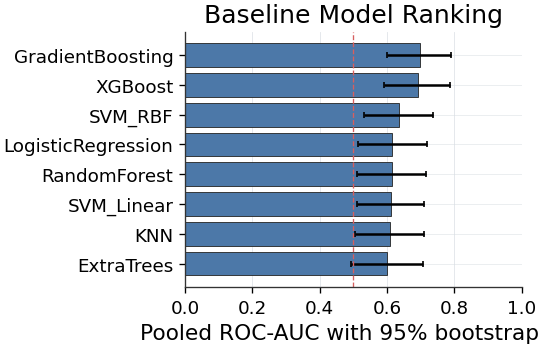

Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/final_run_reports/plots_publication_style/fig02_baseline_roc_curves_top_models.png
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/final_run_reports/plots_publication_style/fig02_baseline_roc_curves_top_models.pdf


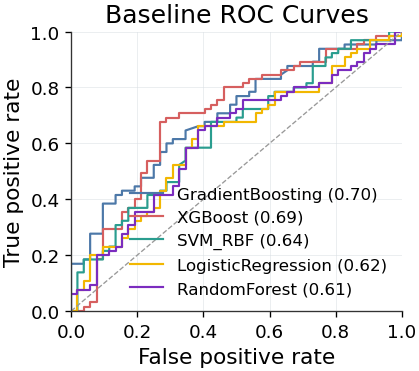

Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/final_run_reports/plots_publication_style/fig03_baseline_best_model_confusion_matrix.png
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/final_run_reports/plots_publication_style/fig03_baseline_best_model_confusion_matrix.pdf


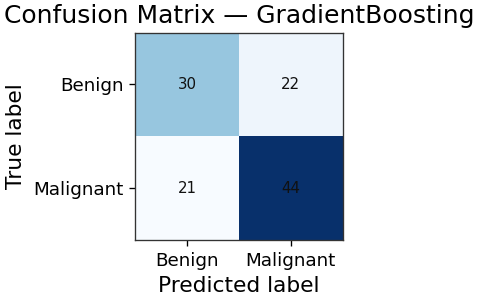

Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/final_run_reports/plots_publication_style/fig04_baseline_best_model_calibration_curve.png
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/final_run_reports/plots_publication_style/fig04_baseline_best_model_calibration_curve.pdf


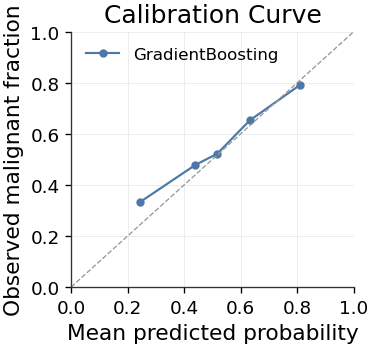

Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/final_run_reports/plots_publication_style/fig05_baseline_best_model_metric_profile.png
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/final_run_reports/plots_publication_style/fig05_baseline_best_model_metric_profile.pdf


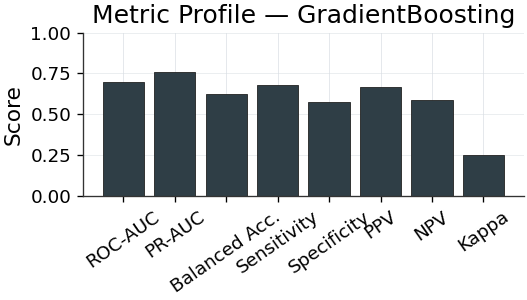

Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/final_run_reports/plots_publication_style/fig06_baseline_feature_selection_stability.png
Saved: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/final_run_reports/plots_publication_style/fig06_baseline_feature_selection_stability.pdf


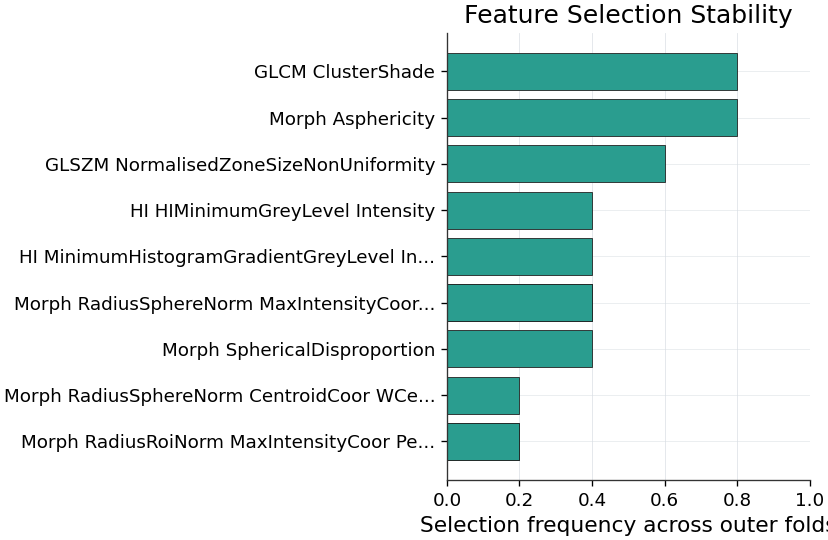


════════════════════════════════════════════════════════════════════════════════
STEP 2B BASELINE SUMMARY
════════════════════════════════════════════════════════════════════════════════
run_name: mrmr_then_elasticnet_no_corr_auto_k_smote
save_dir: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote
best_model_by_pooled_auc: GradientBoosting
best_model_roc_auc: 0.6965976331360947
best_model_roc_auc_ci95_low: 0.6010470468444856
best_model_roc_auc_ci95_high: 0.7910490009193164
best_model_pr_auc: 0.7610111415729499
best_model_accuracy: 0.6324786324786325
best_model_balanced_accuracy: 0.6269230769230769
best_model_sensitivity: 0.676923076923077
best_model_specificity: 0.5769230769230769
best_model_ppv: 0.6666666666666666
best_model_npv: 0.5882352941176471
best_model_f1: 0.6717557251908397
best_model_cohen_kappa: 0.2543352601156069
best_model_brier_score: 0.22160016690910314
friedman_auc_p_value: 0.16866450408907088
n_model

In [46]:
# =============================================================================
# STEP 2B — BASELINE NESTED-CV STATISTICAL REPORTING AND COMPACT FIGURES
# =============================================================================
# Purpose:
#   - Summarize baseline nested-CV performance.
#   - Compute pooled metrics: ROC-AUC, PR-AUC, accuracy, balanced accuracy,
#     sensitivity, specificity, PPV, NPV, F1, Cohen's kappa, Brier score.
#   - Add exploratory statistical comparisons across models.
#   - Generate compact, non-redundant, publication-style plots.
#
# Important:
#   - This cell does NOT retrain models.
#   - It only analyzes outputs from nested_cv_results, df_summary, df_fold_details,
#     and pm_df.
# =============================================================================
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    cohen_kappa_score,
    brier_score_loss,
    roc_curve,
    precision_recall_curve
)


print("█" * 80)
# FINAL RUN — NESTED-CV STATISTICAL REPORTING
print("  FINAL RUN — STATISTICAL EVALUATION AND PUBLICATION FIGURES")
print("█" * 80)

import os
import json
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import friedmanchisquare, wilcoxon
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    cohen_kappa_score,
    brier_score_loss,
    roc_curve,
    precision_recall_curve,
    calibration_curve
)

warnings.filterwarnings("ignore")

# -----------------------------------------------------------------------------
# 1. Output directories
# -----------------------------------------------------------------------------
baseline_dir = CONFIG.get(
    "SAVE_DIR",
    os.path.join(CONFIG["DATASET_OUTPUT_ROOT"], "step_2_baseline_nested_cv_no_smote")
)

report_dir = os.path.join(baseline_dir, "final_run_reports")
plot_dir = os.path.join(report_dir, "plots_publication_style")

os.makedirs(report_dir, exist_ok=True)
os.makedirs(plot_dir, exist_ok=True)

print(f"\nBaseline report directory:\n  {report_dir}")
print(f"Plot directory:\n  {plot_dir}")

# -----------------------------------------------------------------------------
# 2. Publication-style plotting theme
# -----------------------------------------------------------------------------
plt.style.use("default")

FIG_DPI = 600

COLORS = {
    "primary": "#4C78A8",
    "secondary": "#D65F5F",
    "accent": "#2A9D8F",
    "dark": "#2F3E46",
    "neutral": "#6C757D",
    "light": "#F1F3F5",
    "grid": "#D9DEE3"
}

MODEL_COLORS = [
    "#4C78A8", "#D65F5F", "#2A9D8F", "#F2B701",
    "#7B2CBF", "#6C757D", "#E76F51", "#264653"
]

plt.rcParams.update({
    "figure.dpi": 120,
    "savefig.dpi": FIG_DPI,
    "font.family": "DejaVu Sans",
    "font.size": PLOT_FONT_SIZE,
    "axes.titlesize": PLOT_TITLE_SIZE,
    "axes.labelsize": PLOT_LABEL_SIZE,
    "xtick.labelsize": PLOT_TICK_SIZE,
    "ytick.labelsize": PLOT_TICK_SIZE,
    "legend.fontsize": PLOT_LEGEND_SIZE,


    "axes.linewidth": 0.8,
    "axes.edgecolor": "#333333",
    "axes.grid": True,
    "grid.color": COLORS["grid"],
    "grid.linewidth": 0.5,
    "grid.alpha": 0.8,
    "savefig.bbox": "tight",
    "savefig.pad_inches": 0.03,
    "pdf.fonttype": 42,
    "ps.fonttype": 42
})


def clean_axis(ax, grid_axis="y"):
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.grid(True, axis=grid_axis, linestyle="-", linewidth=0.5, alpha=0.6)
    ax.set_axisbelow(True)


def save_figure(fig, filename_base):
    png_path = os.path.join(plot_dir, f"{filename_base}.png")
    pdf_path = os.path.join(plot_dir, f"{filename_base}.pdf")
    fig.savefig(png_path, dpi=FIG_DPI, bbox_inches="tight")
    fig.savefig(pdf_path, bbox_inches="tight")
    print(f"Saved: {png_path}")
    print(f"Saved: {pdf_path}")


def compute_specificity_np(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    if cm.shape != (2, 2):
        return np.nan
    tn, fp, fn, tp = cm.ravel()
    return tn / (tn + fp) if (tn + fp) > 0 else np.nan


def compute_npv_np(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    if cm.shape != (2, 2):
        return np.nan
    tn, fp, fn, tp = cm.ravel()
    return tn / (tn + fn) if (tn + fn) > 0 else np.nan


def bootstrap_metric_ci(y_true, y_score_or_pred, metric_func, n_boot=2000, seed=100):
    rng = np.random.default_rng(seed)
    y_true = np.asarray(y_true)
    arr = np.asarray(y_score_or_pred)
    n = len(y_true)

    values = []

    for _ in range(n_boot):
        idx = rng.integers(0, n, n)

        # Skip bootstrap samples with one class only for AUC-like metrics
        if len(np.unique(y_true[idx])) < 2:
            continue

        try:
            values.append(metric_func(y_true[idx], arr[idx]))
        except Exception:
            continue

    if len(values) == 0:
        return np.nan, np.nan, np.nan

    values = np.asarray(values, dtype=float)
    return (
        float(np.nanmean(values)),
        float(np.nanpercentile(values, 2.5)),
        float(np.nanpercentile(values, 97.5))
    )


# -----------------------------------------------------------------------------
# 3. Required object checks
# -----------------------------------------------------------------------------
required_objects = ["nested_cv_results", "df_summary", "df_fold_details", "pm_df"]

for obj_name in required_objects:
    if obj_name not in globals():
        raise RuntimeError(f"Required object '{obj_name}' not found. Run Cell 13 and Cell 14 first.")

# -----------------------------------------------------------------------------
# 4. Pooled baseline metrics for each model
# -----------------------------------------------------------------------------
pooled_rows = []

for model_name, res in nested_cv_results.items():
    y_true = np.asarray(res["y_true"], dtype=int)
    y_prob = np.asarray(res["y_prob"], dtype=float)
    y_pred = np.asarray(res["y_pred"], dtype=int)

    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    tn, fp, fn, tp = cm.ravel()

    roc_auc = roc_auc_score(y_true, y_prob)
    pr_auc = average_precision_score(y_true, y_prob)
    acc = accuracy_score(y_true, y_pred)
    bal_acc = balanced_accuracy_score(y_true, y_pred)
    sensitivity = recall_score(y_true, y_pred, zero_division=0)
    specificity = compute_specificity_np(y_true, y_pred)
    ppv = precision_score(y_true, y_pred, zero_division=0)
    npv = compute_npv_np(y_true, y_pred)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    kappa = cohen_kappa_score(y_true, y_pred)
    brier = brier_score_loss(y_true, y_prob)

    auc_mean_boot, auc_ci_low, auc_ci_high = bootstrap_metric_ci(
        y_true,
        y_prob,
        roc_auc_score,
        n_boot=2000,
        seed=CONFIG.get("RANDOM_STATE", 100)
    )

    pr_mean_boot, pr_ci_low, pr_ci_high = bootstrap_metric_ci(
        y_true,
        y_prob,
        average_precision_score,
        n_boot=2000,
        seed=CONFIG.get("RANDOM_STATE", 100) + 1
    )

    pooled_rows.append({
        "Model": model_name,
        "ROC_AUC": roc_auc,
        "ROC_AUC_bootstrap_mean": auc_mean_boot,
        "ROC_AUC_CI95_low": auc_ci_low,
        "ROC_AUC_CI95_high": auc_ci_high,
        "PR_AUC": pr_auc,
        "PR_AUC_bootstrap_mean": pr_mean_boot,
        "PR_AUC_CI95_low": pr_ci_low,
        "PR_AUC_CI95_high": pr_ci_high,
        "Accuracy": acc,
        "Balanced_Accuracy": bal_acc,
        "Sensitivity_Recall": sensitivity,
        "Specificity": specificity,
        "PPV_Precision": ppv,
        "NPV": npv,
        "F1": f1,
        "Cohen_Kappa": kappa,
        "Brier_Score": brier,
        "TN": tn,
        "FP": fp,
        "FN": fn,
        "TP": tp,
        "Mean_Selected_Features": np.mean(res["n_features_per_fold"]),
        "Std_Selected_Features": np.std(res["n_features_per_fold"], ddof=1)
    })

baseline_pooled_metrics_df = pd.DataFrame(pooled_rows)
baseline_pooled_metrics_df = baseline_pooled_metrics_df.sort_values(
    "ROC_AUC",
    ascending=False
).reset_index(drop=True)

baseline_pooled_metrics_df.to_csv(
    os.path.join(report_dir, "final_pooled_metrics_with_ci.csv"),
    index=False
)

print("\n" + "═" * 80)
print("BASELINE POOLED METRICS")
print("═" * 80)
print(
    baseline_pooled_metrics_df[
        [
            "Model", "ROC_AUC", "ROC_AUC_CI95_low", "ROC_AUC_CI95_high",
            "PR_AUC", "Accuracy", "Balanced_Accuracy",
            "Sensitivity_Recall", "Specificity", "PPV_Precision", "NPV",
            "F1", "Cohen_Kappa", "Brier_Score", "Mean_Selected_Features"
        ]
    ].to_string(index=False, float_format="%.4f")
)

best_model_name = baseline_pooled_metrics_df.iloc[0]["Model"]
best_res = nested_cv_results[best_model_name]

print(f"\nBest baseline model by pooled ROC-AUC: {best_model_name}")

# -----------------------------------------------------------------------------
# 5. Exploratory model comparison statistics
# -----------------------------------------------------------------------------
# Friedman test across models using fold AUCs.
# With 5 outer folds, this is exploratory and low-powered.
fold_auc_table = pm_df.pivot(index="Fold", columns="Model", values="AUC")

model_comparison_summary = {}

if fold_auc_table.shape[1] >= 3:
    try:
        friedman_stat, friedman_p = friedmanchisquare(
            *[fold_auc_table[col].values for col in fold_auc_table.columns]
        )
    except Exception:
        friedman_stat, friedman_p = np.nan, np.nan
else:
    friedman_stat, friedman_p = np.nan, np.nan

model_comparison_summary["friedman_auc_statistic"] = float(friedman_stat) if np.isfinite(friedman_stat) else None
model_comparison_summary["friedman_auc_p_value"] = float(friedman_p) if np.isfinite(friedman_p) else None

# single Wilcoxon against best model
single_rows = []

if best_model_name in fold_auc_table.columns:
    best_auc_values = fold_auc_table[best_model_name].values

    for model_name in fold_auc_table.columns:
        if model_name == best_model_name:
            continue

        other_auc_values = fold_auc_table[model_name].values

        try:
            stat, p = wilcoxon(
                best_auc_values,
                other_auc_values,
                zero_method="wilcox",
                alternative="two-sided"
            )
        except Exception:
            stat, p = np.nan, np.nan

        single_rows.append({
            "Comparison": f"{best_model_name} vs {model_name}",
            "Best_Model": best_model_name,
            "Other_Model": model_name,
            "Mean_AUC_Best": np.mean(best_auc_values),
            "Mean_AUC_Other": np.mean(other_auc_values),
            "Mean_AUC_Difference": np.mean(best_auc_values - other_auc_values),
            "Wilcoxon_Statistic": stat,
            "Wilcoxon_p_value": p
        })

single_model_tests_df = pd.DataFrame(single_rows)

if len(single_model_tests_df) > 0:
    pvals = single_model_tests_df["Wilcoxon_p_value"].values.astype(float)

    valid = np.isfinite(pvals)
    qvals = np.full(len(pvals), np.nan)

    if valid.sum() > 0:
        valid_p = pvals[valid]
        order = np.argsort(valid_p)
        ranked = valid_p[order]
        adjusted = ranked * len(valid_p) / (np.arange(1, len(valid_p) + 1))
        adjusted = np.minimum.accumulate(adjusted[::-1])[::-1]
        adjusted = np.clip(adjusted, 0, 1)
        q_valid = np.empty_like(valid_p)
        q_valid[order] = adjusted
        qvals[valid] = q_valid

    single_model_tests_df["Wilcoxon_q_value_FDR"] = qvals

single_model_tests_df.to_csv(
    os.path.join(report_dir, "baseline_single_wilcoxon_auc_vs_best.csv"),
    index=False
)

with open(os.path.join(report_dir, "baseline_model_comparison_summary.json"), "w") as f:
    json.dump(model_comparison_summary, f, indent=4)

print("\n" + "═" * 80)
print("EXPLORATORY MODEL COMPARISON")
print("═" * 80)
print(f"Friedman test across model fold-AUCs: p = {friedman_p:.6f}" if np.isfinite(friedman_p) else "Friedman test not available.")

if len(single_model_tests_df) > 0:
    print("\nsingle Wilcoxon tests vs best model:")
    print(single_model_tests_df.to_string(index=False, float_format="%.4f"))


# -----------------------------------------------------------------------------
# 6. Figure 1 — Model ROC-AUC ranking with bootstrap CI
# -----------------------------------------------------------------------------
top_models_auc = baseline_pooled_metrics_df.head(8).iloc[::-1]

fig, ax = plt.subplots(figsize=(4.8, 3.2))

xerr_low = top_models_auc["ROC_AUC"] - top_models_auc["ROC_AUC_CI95_low"]
xerr_high = top_models_auc["ROC_AUC_CI95_high"] - top_models_auc["ROC_AUC"]

ax.barh(
    top_models_auc["Model"],
    top_models_auc["ROC_AUC"],
    xerr=[xerr_low, xerr_high],
    color=COLORS["primary"],
    edgecolor="#222222",
    linewidth=0.5,
    capsize=2
)

ax.axvline(0.5, linestyle="--", linewidth=0.8, color=COLORS["secondary"])
ax.set_xlim(0.0, 1.0)
ax.set_title("Baseline Model Ranking")
ax.set_xlabel("Pooled ROC-AUC with 95% bootstrap CI")
ax.set_ylabel("")
clean_axis(ax)

plt.tight_layout()
save_figure(fig, "fig01_baseline_model_auc_ranking")
plt.show()


# -----------------------------------------------------------------------------
# 7. Figure 2 — ROC curves for top models
# -----------------------------------------------------------------------------
top_roc_models = baseline_pooled_metrics_df["Model"].head(min(5, len(baseline_pooled_metrics_df))).tolist()

fig, ax = plt.subplots(figsize=(3.8, 3.4))

for i, model_name in enumerate(top_roc_models):
    res = nested_cv_results[model_name]
    y_true = np.asarray(res["y_true"], dtype=int)
    y_prob = np.asarray(res["y_prob"], dtype=float)

    fpr, tpr, _ = roc_curve(y_true, y_prob)
    auc_value = roc_auc_score(y_true, y_prob)

    ax.plot(
        fpr,
        tpr,
        linewidth=1.3,
        color=MODEL_COLORS[i % len(MODEL_COLORS)],
        label=f"{model_name} ({auc_value:.2f})"
    )

ax.plot([0, 1], [0, 1], linestyle="--", linewidth=0.8, color="#999999")
ax.set_title("Baseline ROC Curves")
ax.set_xlabel("False positive rate")
ax.set_ylabel("True positive rate")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.legend(frameon=False, loc="lower right")
clean_axis(ax, grid_axis="both")

plt.tight_layout()
save_figure(fig, "fig02_baseline_roc_curves_top_models")
plt.show()


# -----------------------------------------------------------------------------
# 8. Figure 3 — Confusion matrix for best baseline model
# -----------------------------------------------------------------------------
best_y_true = np.asarray(best_res["y_true"], dtype=int)
best_y_prob = np.asarray(best_res["y_prob"], dtype=float)
best_y_pred = np.asarray(best_res["y_pred"], dtype=int)

cm = confusion_matrix(best_y_true, best_y_pred, labels=[0, 1])

fig, ax = plt.subplots(figsize=(3.1, 2.8))

im = ax.imshow(cm, cmap="Blues")

for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(
            j,
            i,
            str(cm[i, j]),
            ha="center",
            va="center",
            color="#111111",
            fontsize=9
        )

ax.set_title(f"Confusion Matrix — {best_model_name}")
ax.set_xlabel("Predicted label")
ax.set_ylabel("True label")
ax.set_xticks([0, 1])
ax.set_yticks([0, 1])
ax.set_xticklabels(["Benign", "Malignant"])
ax.set_yticklabels(["Benign", "Malignant"])
ax.grid(False)

plt.tight_layout()
save_figure(fig, "fig03_baseline_best_model_confusion_matrix")
plt.show()


# -----------------------------------------------------------------------------
# 9. Figure 4 — Calibration curve for best baseline model
# -----------------------------------------------------------------------------
frac_pos, mean_pred = manual_calibration_curve(
    best_y_true,
    best_y_prob,
    n_bins=5
)

fig, ax = plt.subplots(figsize=(3.4, 3.2))

ax.plot(
    mean_pred,
    frac_pos,
    marker="o",
    linewidth=1.3,
    markersize=4,
    color=COLORS["primary"],
    label=best_model_name
)

ax.plot([0, 1], [0, 1], linestyle="--", linewidth=0.8, color="#999999")

ax.set_title("Calibration Curve")
ax.set_xlabel("Mean predicted probability")
ax.set_ylabel("Observed malignant fraction")
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.legend(frameon=False, loc="upper left")
clean_axis(ax, grid_axis="both")

plt.tight_layout()
save_figure(fig, "fig04_baseline_best_model_calibration_curve")
plt.show()


# -----------------------------------------------------------------------------
# 10. Figure 5 — Compact metric profile for best model
# -----------------------------------------------------------------------------
best_metric_row = baseline_pooled_metrics_df[
    baseline_pooled_metrics_df["Model"] == best_model_name
].iloc[0]

metric_profile = pd.DataFrame({
    "Metric": [
        "ROC-AUC",
        "PR-AUC",
        "Balanced Acc.",
        "Sensitivity",
        "Specificity",
        "PPV",
        "NPV",
        "Kappa"
    ],
    "Value": [
        best_metric_row["ROC_AUC"],
        best_metric_row["PR_AUC"],
        best_metric_row["Balanced_Accuracy"],
        best_metric_row["Sensitivity_Recall"],
        best_metric_row["Specificity"],
        best_metric_row["PPV_Precision"],
        best_metric_row["NPV"],
        best_metric_row["Cohen_Kappa"]
    ]
})

metric_profile.to_csv(
    os.path.join(report_dir, "baseline_best_model_metric_profile.csv"),
    index=False
)

fig, ax = plt.subplots(figsize=(4.6, 2.8))

ax.bar(
    metric_profile["Metric"],
    metric_profile["Value"],
    color=COLORS["dark"],
    edgecolor="#222222",
    linewidth=0.5
)

ax.set_ylim(0, 1)
ax.set_title(f"Metric Profile — {best_model_name}")
ax.set_ylabel("Score")
ax.set_xlabel("")
ax.tick_params(axis="x", rotation=35)
clean_axis(ax)

plt.tight_layout()
save_figure(fig, "fig05_baseline_best_model_metric_profile")
plt.show()


# -----------------------------------------------------------------------------
# 11. Figure 6 — Feature selection stability among selected features
# -----------------------------------------------------------------------------
if "df_selected_features_long" in globals() and len(df_selected_features_long) > 0:
    stability_df = (
        df_selected_features_long
        .groupby("Feature_Name")
        .size()
        .reset_index(name="Selection_Count")
        .sort_values("Selection_Count", ascending=False)
    )

    stability_df["Selection_Frequency"] = stability_df["Selection_Count"] / CONFIG["N_OUTER_FOLDS"]

    stability_df.to_csv(
        os.path.join(report_dir, "baseline_feature_selection_stability.csv"),
        index=False
    )

    top_stable = (
        stability_df
        .head(12)
        .iloc[::-1]
        .copy()
    )

    top_stable["Feature_Label"] = (
        top_stable["Feature_Name"]
        .map(
            lambda x: abbreviate_feature_name(
                x,
                max_len=42
            )
        )
    )

    fig, ax = plt.subplots(figsize=(7.2, 4.8))

    ax.barh(
        top_stable["Feature_Label"],
        top_stable["Selection_Frequency"],
        color=COLORS["accent"],
        edgecolor="#222222",
        linewidth=0.5
    )

    ax.set_xlim(0, 1)
    ax.set_title("Feature Selection Stability")
    ax.set_xlabel("Selection frequency across outer folds")
    ax.set_ylabel("")
    clean_axis(ax)

    plt.tight_layout()
    save_figure(fig, "fig06_baseline_feature_selection_stability")
    plt.show()
else:
    stability_df = pd.DataFrame()
    print("\nNo selected feature long table found; stability plot skipped.")


# -----------------------------------------------------------------------------
# 12. Compact summary JSON
# -----------------------------------------------------------------------------
step_2b_summary = {
    "run_name": CONFIG.get("RUN_NAME", "step_2_baseline_nested_cv_no_smote"),
    "save_dir": baseline_dir,
    "best_model_by_pooled_auc": best_model_name,
    "best_model_roc_auc": float(best_metric_row["ROC_AUC"]),
    "best_model_roc_auc_ci95_low": float(best_metric_row["ROC_AUC_CI95_low"]),
    "best_model_roc_auc_ci95_high": float(best_metric_row["ROC_AUC_CI95_high"]),
    "best_model_pr_auc": float(best_metric_row["PR_AUC"]),
    "best_model_accuracy": float(best_metric_row["Accuracy"]),
    "best_model_balanced_accuracy": float(best_metric_row["Balanced_Accuracy"]),
    "best_model_sensitivity": float(best_metric_row["Sensitivity_Recall"]),
    "best_model_specificity": float(best_metric_row["Specificity"]),
    "best_model_ppv": float(best_metric_row["PPV_Precision"]),
    "best_model_npv": float(best_metric_row["NPV"]),
    "best_model_f1": float(best_metric_row["F1"]),
    "best_model_cohen_kappa": float(best_metric_row["Cohen_Kappa"]),
    "best_model_brier_score": float(best_metric_row["Brier_Score"]),
    "friedman_auc_p_value": (
        float(friedman_p) if np.isfinite(friedman_p) else None
    ),
    "n_models_evaluated": int(len(baseline_pooled_metrics_df)),
    "use_smote": bool(CONFIG.get("USE_SMOTE", False)),
    "fs_method": CONFIG.get("FS_METHOD", None),
    "fs_n_features": CONFIG.get("FS_N_FEATURES", None),
    "n_outer_folds": int(CONFIG.get("N_OUTER_FOLDS", -1)),
    "n_inner_folds": int(CONFIG.get("N_INNER_FOLDS", -1)),
    "report_dir": report_dir,
    "plot_dir": plot_dir
}

with open(os.path.join(report_dir, "step_2b_summary.json"), "w") as f:
    json.dump(step_2b_summary, f, indent=4)

print("\n" + "═" * 80)
print("STEP 2B BASELINE SUMMARY")
print("═" * 80)

for k, v in step_2b_summary.items():
    print(f"{k}: {v}")

print("\nSaved baseline reports and compact publication-style plots to:")
print(f"  {report_dir}")
print(f"  {plot_dir}")

print("\nSTEP 2B completed successfully.")

In [47]:
# =============================================================================
# STEP 3A — OPTIONAL LEGACY SMOTE ABLATION CONFIGURATION LOCK
# =============================================================================
# This cell is disabled by default because the systematic SMOTE/no-SMOTE
# comparison is handled inside FS_EXPERIMENTS.
# =============================================================================

if not bool(globals().get("RUN_SMOTE_ABLATION", False)):
    print("█" * 80)
    print("  STEP 3A — SKIPPED")
    print("█" * 80)
    print("RUN_SMOTE_ABLATION=False. SMOTE/no-SMOTE comparison is handled in the FS grid.")
else:
    print("█" * 80)
    print("  STEP 3A — SMOTE ABLATION CONFIGURATION LOCK")
    print("█" * 80)

    import os
    import json

    CONFIG["RUN_NAME"] = "step_3_smote_nested_cv"
    CONFIG["SAVE_DIR"] = os.path.join(
        CONFIG["DATASET_OUTPUT_ROOT"],
        CONFIG["RUN_NAME"]
    )
    SAVE_DIR = CONFIG["SAVE_DIR"]
    os.makedirs(CONFIG["SAVE_DIR"], exist_ok=True)

    CONFIG["USE_SMOTE"] = True
    CONFIG["FS_METHOD"] = "mrmr_then_elasticnet_no_corr"
    CONFIG["FS_N_FEATURES"] = 14
    CONFIG["AUTO_TUNE_FS_N_FEATURES"] = False
    CONFIG["N_OUTER_FOLDS"] = CONFIG.get("N_OUTER_FOLDS", 5)
    CONFIG["N_INNER_FOLDS"] = CONFIG.get("N_INNER_FOLDS", 3)
    CONFIG["N_OPTUNA_TRIALS"] = CONFIG.get("N_OPTUNA_TRIALS", 20)

    if "groups" not in globals():
        raise RuntimeError("groups object not found. Run Step 1 first.")

    smote_config_snapshot = {
        "RUN_NAME": CONFIG["RUN_NAME"],
        "SAVE_DIR": CONFIG["SAVE_DIR"],
        "USE_SMOTE": CONFIG["USE_SMOTE"],
        "FS_METHOD": CONFIG["FS_METHOD"],
        "FS_N_FEATURES": CONFIG["FS_N_FEATURES"],
        "AUTO_TUNE_FS_N_FEATURES": CONFIG.get("AUTO_TUNE_FS_N_FEATURES"),
        "N_OUTER_FOLDS": CONFIG["N_OUTER_FOLDS"],
        "N_INNER_FOLDS": CONFIG["N_INNER_FOLDS"],
        "N_OPTUNA_TRIALS": CONFIG["N_OPTUNA_TRIALS"],
        "RANDOM_STATE": CONFIG["RANDOM_STATE"],
        "N_SAMPLES": int(X.shape[0]),
        "N_FEATURES": int(X.shape[1]),
        "N_PATIENTS": int(len(set(groups))),
    }

    with open(os.path.join(CONFIG["SAVE_DIR"], "smote_config_snapshot.json"), "w") as f:
        json.dump(smote_config_snapshot, f, indent=4)

    print("SMOTE ablation configuration:")
    for k, v in smote_config_snapshot.items():
        print(f"  {k}: {v}")

    print("STEP 3A completed successfully.")


████████████████████████████████████████████████████████████████████████████████
  STEP 3A — SKIPPED
████████████████████████████████████████████████████████████████████████████████
RUN_SMOTE_ABLATION=False. SMOTE/no-SMOTE comparison is handled in the FS grid.


In [48]:
# =============================================================================
# STEP 3A-RUN — OPTIONAL LEGACY SMOTE NESTED CV
# =============================================================================

if not bool(globals().get("RUN_SMOTE_ABLATION", False)):
    print("STEP 3A-RUN skipped because RUN_SMOTE_ABLATION=False.")
else:
    import copy
    import os

    smote_cfg = copy.deepcopy(CONFIG)
    smote_cfg.update({
        "RUN_NAME": "step_3_smote_nested_cv",
        "SAVE_DIR": os.path.join(
            CONFIG["DATASET_OUTPUT_ROOT"],
            "step_3_smote_nested_cv"
        ),
        "USE_SMOTE": True,
        "FS_METHOD": "mrmr_then_elasticnet_no_corr",
        "FS_N_FEATURES": 14,
        "AUTO_TUNE_FS_N_FEATURES": False,
    })

    smote_outputs = run_nested_cv_experiment(
        config_run=smote_cfg,
        model_subset=None,
        overwrite=OVERWRITE_FS_RUNS
    )

    CONFIG = copy.deepcopy(smote_cfg)
    SAVE_DIR = CONFIG["SAVE_DIR"]

    nested_cv_results = smote_outputs["nested_cv_results"]
    df_summary = smote_outputs["df_summary"]
    df_fold_details = smote_outputs["df_fold_details"]
    df_oof_predictions = smote_outputs["df_oof_predictions"]
    df_selected_features_long = smote_outputs["df_selected_features_long"]
    selected_features_per_fold = smote_outputs["selected_features_per_fold"]
    fold_details = smote_outputs["fold_details"]

    ACTIVE_RUN_NAME = CONFIG["RUN_NAME"]
    ACTIVE_FS_METHOD = CONFIG["FS_METHOD"]
    ACTIVE_USE_SMOTE = CONFIG["USE_SMOTE"]
    ACTIVE_SAVE_DIR = SAVE_DIR

    expected_smote_pkl = os.path.join(SAVE_DIR, "nested_cv_results.pkl")
    assert os.path.exists(expected_smote_pkl), f"SMOTE pkl was not created: {expected_smote_pkl}"
    print("SMOTE nested_cv_results.pkl created:")
    print(expected_smote_pkl)


STEP 3A-RUN skipped because RUN_SMOTE_ABLATION=False.


In [49]:
publication_all_models_df.to_csv(
    os.path.join(ACTIVE_SAVE_DIR,
                 'publication_all_models_summary.csv'),
    index=False
)

all_model_summary_df.to_csv(
    os.path.join(ACTIVE_SAVE_DIR,
                 'all_model_summary_statistics.csv'),
    index=False
)

🤖 Best Model Detected: XGBoost



High-resolution plot (DPI 900) saved to: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/best_model_XGBoost_folds_report.png


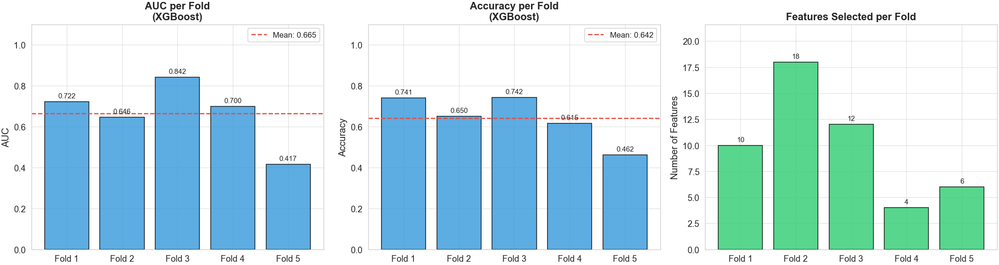


📊 FINAL SUMMARY (XGBoost - 5-Fold Cross-Validation)

🔹 AUC:       0.6654 ± 0.1398
   Range: [0.4167, 0.8417]

🔹 Accuracy:  0.6419 ± 0.1030


In [50]:
# =============================================================================
# COHORT GRAPHICAL REPORTING AND FEATURE SELECTION STABILITY MANIFEST
# =============================================================================
# Purpose:
#   - Isolate execution results for the top-performing estimator configuration.
#   - Generate publication-grade, high-resolution tripartite diagnostic charts.
#   - Synthesize a structural feature selection recurrence manifest to evaluate 
#     cross-fold biomarker stability and reproducibility metrics.
# =============================================================================

import os
from collections import Counter
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Apply standardized uniform layout parameters for peer-review charting
sns.set_style("whitegrid")

df_summary = df_summary.sort_values(by='Mean_AUC', ascending=False).reset_index(drop=True)
best_model_name = df_summary.iloc[0]['Model']

# Dynamically isolate the highest performing configuration matrix pattern
best_model_name = df_summary.iloc[0]['Model'] 
print(f"🤖 Best Model Detected: {best_model_name}\n")

# Filter localized out-of-fold diagnostic matrices matching the top candidate
best_model_folds = df_fold_details[df_fold_details['Model'] == best_model_name].copy()

actual_n_outer = len(best_model_folds)

fold_labels = [f"Fold {int(f)}" for f in best_model_folds['Fold']]
aucs = best_model_folds['AUC'].values
accuracies = best_model_folds['Acc'].values
n_features = best_model_folds['n_features'].values

mean_auc = np.mean(aucs)
mean_acc = np.mean(accuracies)

# --- Subplot 1 to 3: Multi-panel Diagnostic Performance Charts ---------------
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
colors = ['#3498db'] * actual_n_outer

# 1️⃣ Subplot A: Receiver Operating Characteristic Area Under Curve (AUC)
ax1 = axes[0]
bars1 = ax1.bar(fold_labels, aucs, color=colors, edgecolor='black', alpha=0.8)
ax1.set_ylabel('AUC', fontsize=12)
ax1.set_title(f'AUC per Fold\n({best_model_name})', fontsize=13, fontweight='bold')
ax1.set_ylim(0.0, 1.1)  # Expanded upper boundary to accommodate structural annotation text
ax1.axhline(y=mean_auc, color='#e74c3c', linestyle='--', label=f"Mean: {mean_auc:.3f}")
for bar in bars1:
    height = bar.get_height()
    ax1.annotate(f'{height:.3f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3), textcoords="offset points", ha='center', va='bottom', fontsize=9)
ax1.legend()

# 2️⃣ Subplot B: Empirical Classification Accuracy Profiles
ax2 = axes[1]
bars2 = ax2.bar(fold_labels, accuracies, color=colors, edgecolor='black', alpha=0.8)
ax2.set_ylabel('Accuracy', fontsize=12)
ax2.set_title(f'Accuracy per Fold\n({best_model_name})', fontsize=13, fontweight='bold')
ax2.set_ylim(0.0, 1.1)
ax2.axhline(y=mean_acc, color='#e74c3c', linestyle='--', label=f"Mean: {mean_acc:.3f}")
for bar in bars2:
    height = bar.get_height()
    ax2.annotate(f'{height:.3f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3), textcoords="offset points", ha='center', va='bottom', fontsize=9)
ax2.legend()

# 3️⃣ Subplot C: Selected Feature Cardinality Volatility Matrix
ax3 = axes[2]
bars3 = ax3.bar(fold_labels, n_features, color='#2ecc71', edgecolor='black', alpha=0.8)
ax3.set_ylabel('Number of Features', fontsize=12)
ax3.set_title('Features Selected per Fold', fontsize=13, fontweight='bold')
ax3.set_ylim(0, max(n_features) * 1.2 if len(n_features) > 0 else 10)
for bar in bars3:
    height = bar.get_height()
    ax3.annotate(f'{int(height)}', xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3), textcoords="offset points", ha='center', va='bottom', fontsize=9)

plt.tight_layout()

# Save structural presentation graphics using extreme high-resolution (DPI 900)
os.makedirs(SAVE_DIR, exist_ok=True)
plot_path = os.path.join(SAVE_DIR, f"best_model_{best_model_name}_folds_report.png")
plt.savefig(plot_path, dpi=600)
print(f"High-resolution plot (DPI 900) saved to: {plot_path}")
plt.show()
plt.close()


# =============================================================================
# COHORT SUMMARY AND INFERENCE CRITERIA TABLES
# =============================================================================
print("\n" + "="*60)
print(f"📊 FINAL SUMMARY ({best_model_name} - {actual_n_outer}-Fold Cross-Validation)")
print("="*60)

print(f"\n🔹 AUC:       {mean_auc:.4f} ± {np.std(aucs):.4f}")
print(f"   Range: [{np.min(aucs):.4f}, {np.max(aucs):.4f}]")

print(f"\n🔹 Accuracy:  {mean_acc:.4f} ± {np.std(accuracies):.4f}")


In [51]:
    # =============================================================================
    # STEP 3B — SMOTE VS BASELINE STATISTICAL COMPARISON AND COMPACT FIGURES
    # =============================================================================
    # Purpose:
    #   - Compare Step 3 SMOTE run against Step 2 baseline.
    #   - Use the same models, same CV design, and same evaluation logic.
    #   - Compute pooled metric deltas, paired bootstrap CIs, and fold-wise Wilcoxon tests.
    #   - Generate compact publication-style comparison plots.
    #
    # Important:
    #   - This cell does NOT retrain models.
    #   - It analyzes the current SMOTE nested_cv_results and the saved baseline outputs.
    # =============================================================================
current_use_smote = bool(CONFIG.get("USE_SMOTE", False))
run_legacy_smote_comparison = bool(globals().get("RUN_SMOTE_VS_BASELINE_COMPARISON", False))

if not run_legacy_smote_comparison:
    print("█" * 80)
    print("  STEP 3B — SKIPPED")
    print("█" * 80)
    print("RUN_SMOTE_VS_BASELINE_COMPARISON=False. Use fs_comparison_smote_vs_no_smote_*.csv for the systematic comparison.")
elif not current_use_smote:
    print("█" * 80)
    print("  STEP 3B — SKIPPED")
    print("█" * 80)
    print("This cell is only for SMOTE-enabled runs.")
    print(f"Current USE_SMOTE is: {CONFIG.get('USE_SMOTE', None)}")
    print("No SMOTE-vs-baseline comparison was executed.")

else:
    print("█" * 80)
    print("  STEP 3B — SMOTE VS BASELINE COMPARISON")
    print("█" * 80)

    import os
    import json
    import pickle
    import warnings
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt

    from scipy.stats import wilcoxon

    from sklearn.metrics import (
        roc_auc_score,
        average_precision_score,
        accuracy_score,
        balanced_accuracy_score,
        precision_score,
        recall_score,
        f1_score,
        confusion_matrix,
        cohen_kappa_score,
        brier_score_loss,
        roc_curve
    )

    warnings.filterwarnings("ignore")

    # -----------------------------------------------------------------------------
    # 1. Paths
    # -----------------------------------------------------------------------------
    baseline_dir = os.path.join(
        CONFIG["DATASET_OUTPUT_ROOT"],
        "step_2_baseline_nested_cv_no_smote"
    )

    smote_dir = CONFIG.get(
        "SAVE_DIR",
        os.path.join(CONFIG["DATASET_OUTPUT_ROOT"], "step_3_smote_nested_cv")
    )

    comparison_dir = os.path.join(smote_dir, "step_3b_smote_vs_baseline_reports")
    plot_dir = os.path.join(comparison_dir, "plots_publication_style")

    os.makedirs(comparison_dir, exist_ok=True)
    os.makedirs(plot_dir, exist_ok=True)

    baseline_pkl_path = os.path.join(baseline_dir, "nested_cv_results.pkl")

    if not os.path.exists(baseline_pkl_path):
        raise FileNotFoundError(
            f"Baseline nested_cv_results not found:\n{baseline_pkl_path}\n"
            "Make sure Step 2 baseline Cell 13 was completed and saved."
        )

    if "nested_cv_results" not in globals():
        raise RuntimeError("Current SMOTE nested_cv_results not found. Run Cell 13 after Step 3A.")

    with open(baseline_pkl_path, "rb") as f:
        baseline_results = pickle.load(f)

    smote_results = nested_cv_results

    print(f"\nLoaded baseline results from:\n  {baseline_pkl_path}")
    print(f"Using current SMOTE results from runtime and SAVE_DIR:\n  {smote_dir}")

    # -----------------------------------------------------------------------------
    # 2. Publication-style plotting theme
    # -----------------------------------------------------------------------------
    plt.style.use("default")

    FIG_DPI = 600

    COLORS = {
        "baseline": "#4C78A8",
        "smote": "#D65F5F",
        "delta_pos": "#2A9D8F",
        "delta_neg": "#B23A48",
        "dark": "#2F3E46",
        "neutral": "#6C757D",
        "grid": "#D9DEE3"
    }

    plt.rcParams.update({
        "figure.dpi": 120,
        "savefig.dpi": FIG_DPI,
        "font.family": "DejaVu Sans",
        "font.size": PLOT_FONT_SIZE,
        "axes.titlesize": PLOT_TITLE_SIZE,
        "axes.labelsize": PLOT_LABEL_SIZE,
        "xtick.labelsize": PLOT_TICK_SIZE,
        "ytick.labelsize": PLOT_TICK_SIZE,
        "legend.fontsize": PLOT_LEGEND_SIZE,
        "axes.linewidth": 0.8,
        "axes.edgecolor": "#333333",
        "axes.grid": True,
        "grid.color": COLORS["grid"],
        "grid.linewidth": 0.5,
        "grid.alpha": 0.8,
        "savefig.bbox": "tight",
        "savefig.pad_inches": 0.03,
        "pdf.fonttype": 42,
        "ps.fonttype": 42
    })


    def clean_axis(ax, grid_axis="y"):
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.grid(True, axis=grid_axis, linestyle="-", linewidth=0.5, alpha=0.6)
        ax.set_axisbelow(True)


    def save_figure(fig, filename_base):
        png_path = os.path.join(plot_dir, f"{filename_base}.png")
        pdf_path = os.path.join(plot_dir, f"{filename_base}.pdf")
        fig.savefig(png_path, dpi=FIG_DPI, bbox_inches="tight")
        fig.savefig(pdf_path, bbox_inches="tight")
        print(f"Saved: {png_path}")
        print(f"Saved: {pdf_path}")


    def compute_specificity(y_true, y_pred):
        cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
        if cm.shape != (2, 2):
            return np.nan
        tn, fp, fn, tp = cm.ravel()
        return tn / (tn + fp) if (tn + fp) > 0 else np.nan


    def compute_npv(y_true, y_pred):
        cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
        if cm.shape != (2, 2):
            return np.nan
        tn, fp, fn, tp = cm.ravel()
        return tn / (tn + fn) if (tn + fn) > 0 else np.nan


    def benjamini_hochberg(p_values):
        p_values = np.asarray(p_values, dtype=float)
        q_values = np.full(len(p_values), np.nan)

        valid = np.isfinite(p_values)
        p = p_values[valid]

        if len(p) == 0:
            return q_values

        order = np.argsort(p)
        ranked = p[order]
        adjusted = ranked * len(p) / (np.arange(1, len(p) + 1))
        adjusted = np.minimum.accumulate(adjusted[::-1])[::-1]
        adjusted = np.clip(adjusted, 0, 1)

        q_valid = np.empty_like(p)
        q_valid[order] = adjusted
        q_values[valid] = q_valid

        return q_values


    def pooled_metrics_from_results(results_dict):
        rows = []

        for model_name, res in results_dict.items():
            y_true = np.asarray(res["y_true"], dtype=int)
            y_prob = np.asarray(res["y_prob"], dtype=float)
            y_pred = np.asarray(res["y_pred"], dtype=int)

            rows.append({
                "Model": model_name,
                "ROC_AUC": roc_auc_score(y_true, y_prob),
                "PR_AUC": average_precision_score(y_true, y_prob),
                "Accuracy": accuracy_score(y_true, y_pred),
                "Balanced_Accuracy": balanced_accuracy_score(y_true, y_pred),
                "Sensitivity": recall_score(y_true, y_pred, zero_division=0),
                "Specificity": compute_specificity(y_true, y_pred),
                "PPV": precision_score(y_true, y_pred, zero_division=0),
                "NPV": compute_npv(y_true, y_pred),
                "F1": f1_score(y_true, y_pred, zero_division=0),
                "Cohen_Kappa": cohen_kappa_score(y_true, y_pred),
                "Brier_Score": brier_score_loss(y_true, y_prob),
                "Mean_Selected_Features": np.mean(res["n_features_per_fold"]),
                "Std_Selected_Features": np.std(res["n_features_per_fold"], ddof=1)
            })

        return pd.DataFrame(rows).sort_values("ROC_AUC", ascending=False).reset_index(drop=True)


    def paired_bootstrap_delta_ci(y_true, prob_a, prob_b, metric_func, n_boot=2000, seed=100):
        """
        Paired bootstrap CI for delta = metric_b - metric_a.
        Here:
            a = baseline
            b = SMOTE
        """
        rng = np.random.default_rng(seed)

        y_true = np.asarray(y_true, dtype=int)
        prob_a = np.asarray(prob_a, dtype=float)
        prob_b = np.asarray(prob_b, dtype=float)

        n = len(y_true)
        deltas = []

        for _ in range(n_boot):
            idx = rng.integers(0, n, n)

            if len(np.unique(y_true[idx])) < 2:
                continue

            try:
                val_a = metric_func(y_true[idx], prob_a[idx])
                val_b = metric_func(y_true[idx], prob_b[idx])
                deltas.append(val_b - val_a)
            except Exception:
                continue

        if len(deltas) == 0:
            return np.nan, np.nan, np.nan

        deltas = np.asarray(deltas, dtype=float)

        return (
            float(np.nanmean(deltas)),
            float(np.nanpercentile(deltas, 2.5)),
            float(np.nanpercentile(deltas, 97.5))
        )


    # -----------------------------------------------------------------------------
    # 3. Compute pooled metrics
    # -----------------------------------------------------------------------------
    baseline_metrics_df = pooled_metrics_from_results(baseline_results)
    smote_metrics_df = pooled_metrics_from_results(smote_results)

    baseline_metrics_df.to_csv(
        os.path.join(comparison_dir, "baseline_recomputed_pooled_metrics.csv"),
        index=False
    )

    smote_metrics_df.to_csv(
        os.path.join(comparison_dir, "smote_pooled_metrics.csv"),
        index=False
    )

    common_models = sorted(set(baseline_metrics_df["Model"]).intersection(smote_metrics_df["Model"]))

    comparison_rows = []

    for model_name in common_models:
        b_row = baseline_metrics_df[baseline_metrics_df["Model"] == model_name].iloc[0]
        s_row = smote_metrics_df[smote_metrics_df["Model"] == model_name].iloc[0]

        b_res = baseline_results[model_name]
        s_res = smote_results[model_name]

        b_y_true = np.asarray(b_res["y_true"], dtype=int)
        s_y_true = np.asarray(s_res["y_true"], dtype=int)

        same_oof_order = (
            len(b_y_true) == len(s_y_true)
            and np.array_equal(b_y_true, s_y_true)
        )

        if same_oof_order:
            auc_delta_mean, auc_delta_low, auc_delta_high = paired_bootstrap_delta_ci(
                b_y_true,
                np.asarray(b_res["y_prob"], dtype=float),
                np.asarray(s_res["y_prob"], dtype=float),
                roc_auc_score,
                n_boot=2000,
                seed=CONFIG.get("RANDOM_STATE", 100)
            )

            pr_delta_mean, pr_delta_low, pr_delta_high = paired_bootstrap_delta_ci(
                b_y_true,
                np.asarray(b_res["y_prob"], dtype=float),
                np.asarray(s_res["y_prob"], dtype=float),
                average_precision_score,
                n_boot=2000,
                seed=CONFIG.get("RANDOM_STATE", 100) + 1
            )
        else:
            auc_delta_mean, auc_delta_low, auc_delta_high = np.nan, np.nan, np.nan
            pr_delta_mean, pr_delta_low, pr_delta_high = np.nan, np.nan, np.nan

        # Fold-wise Wilcoxon on outer-fold AUCs
        b_fold_auc = np.asarray(b_res["fold_aucs"], dtype=float)
        s_fold_auc = np.asarray(s_res["fold_aucs"], dtype=float)

        if len(b_fold_auc) == len(s_fold_auc) and len(b_fold_auc) >= 2:
            try:
                w_stat, w_p = wilcoxon(
                    s_fold_auc,
                    b_fold_auc,
                    alternative="two-sided",
                    zero_method="wilcox"
                )
            except Exception:
                w_stat, w_p = np.nan, np.nan
        else:
            w_stat, w_p = np.nan, np.nan

        comparison_rows.append({
            "Model": model_name,

            "Baseline_ROC_AUC": b_row["ROC_AUC"],
            "SMOTE_ROC_AUC": s_row["ROC_AUC"],
            "Delta_ROC_AUC_SMOTE_minus_Baseline": s_row["ROC_AUC"] - b_row["ROC_AUC"],
            "Paired_Bootstrap_Delta_ROC_AUC_Mean": auc_delta_mean,
            "Paired_Bootstrap_Delta_ROC_AUC_CI95_Low": auc_delta_low,
            "Paired_Bootstrap_Delta_ROC_AUC_CI95_High": auc_delta_high,

            "Baseline_PR_AUC": b_row["PR_AUC"],
            "SMOTE_PR_AUC": s_row["PR_AUC"],
            "Delta_PR_AUC_SMOTE_minus_Baseline": s_row["PR_AUC"] - b_row["PR_AUC"],
            "Paired_Bootstrap_Delta_PR_AUC_Mean": pr_delta_mean,
            "Paired_Bootstrap_Delta_PR_AUC_CI95_Low": pr_delta_low,
            "Paired_Bootstrap_Delta_PR_AUC_CI95_High": pr_delta_high,

            "Baseline_Balanced_Accuracy": b_row["Balanced_Accuracy"],
            "SMOTE_Balanced_Accuracy": s_row["Balanced_Accuracy"],
            "Delta_Balanced_Accuracy": s_row["Balanced_Accuracy"] - b_row["Balanced_Accuracy"],

            "Baseline_Sensitivity": b_row["Sensitivity"],
            "SMOTE_Sensitivity": s_row["Sensitivity"],
            "Delta_Sensitivity": s_row["Sensitivity"] - b_row["Sensitivity"],

            "Baseline_Specificity": b_row["Specificity"],
            "SMOTE_Specificity": s_row["Specificity"],
            "Delta_Specificity": s_row["Specificity"] - b_row["Specificity"],

            "Baseline_PPV": b_row["PPV"],
            "SMOTE_PPV": s_row["PPV"],
            "Delta_PPV": s_row["PPV"] - b_row["PPV"],

            "Baseline_NPV": b_row["NPV"],
            "SMOTE_NPV": s_row["NPV"],
            "Delta_NPV": s_row["NPV"] - b_row["NPV"],

            "Baseline_Kappa": b_row["Cohen_Kappa"],
            "SMOTE_Kappa": s_row["Cohen_Kappa"],
            "Delta_Kappa": s_row["Cohen_Kappa"] - b_row["Cohen_Kappa"],

            "Baseline_Brier": b_row["Brier_Score"],
            "SMOTE_Brier": s_row["Brier_Score"],
            "Delta_Brier_SMOTE_minus_Baseline": s_row["Brier_Score"] - b_row["Brier_Score"],

            "Baseline_Mean_Selected_Features": b_row["Mean_Selected_Features"],
            "SMOTE_Mean_Selected_Features": s_row["Mean_Selected_Features"],

            "Foldwise_Wilcoxon_AUC_Statistic": w_stat,
            "Foldwise_Wilcoxon_AUC_p_value": w_p,
            "Same_OOF_Order_For_Paired_Bootstrap": same_oof_order
        })

    comparison_df = pd.DataFrame(comparison_rows)

    comparison_df["Foldwise_Wilcoxon_AUC_q_value_FDR"] = benjamini_hochberg(
        comparison_df["Foldwise_Wilcoxon_AUC_p_value"].values
    )

    comparison_df = comparison_df.sort_values(
        "Delta_ROC_AUC_SMOTE_minus_Baseline",
        ascending=False
    ).reset_index(drop=True)

    comparison_df.to_csv(
        os.path.join(comparison_dir, "smote_vs_baseline_model_comparison.csv"),
        index=False
    )

    print("\n" + "═" * 80)
    print("SMOTE VS BASELINE — MODEL COMPARISON")
    print("═" * 80)

    display_cols = [
        "Model",
        "Baseline_ROC_AUC",
        "SMOTE_ROC_AUC",
        "Delta_ROC_AUC_SMOTE_minus_Baseline",
        "Paired_Bootstrap_Delta_ROC_AUC_CI95_Low",
        "Paired_Bootstrap_Delta_ROC_AUC_CI95_High",
        "Baseline_PR_AUC",
        "SMOTE_PR_AUC",
        "Delta_PR_AUC_SMOTE_minus_Baseline",
        "Baseline_Sensitivity",
        "SMOTE_Sensitivity",
        "Delta_Sensitivity",
        "Baseline_Specificity",
        "SMOTE_Specificity",
        "Delta_Specificity",
        "Foldwise_Wilcoxon_AUC_p_value",
        "Foldwise_Wilcoxon_AUC_q_value_FDR"
    ]

    print(comparison_df[display_cols].to_string(index=False, float_format="%.4f"))

    # -----------------------------------------------------------------------------
    # 4. Choose best SMOTE and best baseline models
    # -----------------------------------------------------------------------------
    best_baseline_model = baseline_metrics_df.iloc[0]["Model"]
    best_smote_model = smote_metrics_df.iloc[0]["Model"]

    print("\nBest baseline model:", best_baseline_model)
    print("Best SMOTE model:   ", best_smote_model)

    best_delta_model = comparison_df.iloc[0]["Model"]
    print("Largest ROC-AUC gain with SMOTE:", best_delta_model)

    # -----------------------------------------------------------------------------
    # 5. Figure 1 — ROC-AUC delta by model
    # -----------------------------------------------------------------------------
    delta_plot = comparison_df.copy()
    delta_plot = delta_plot.sort_values("Delta_ROC_AUC_SMOTE_minus_Baseline", ascending=True)

    fig, ax = plt.subplots(figsize=(4.8, 3.0))

    bar_colors = [
        COLORS["delta_pos"] if v >= 0 else COLORS["delta_neg"]
        for v in delta_plot["Delta_ROC_AUC_SMOTE_minus_Baseline"]
    ]

    ax.barh(
        delta_plot["Model"],
        delta_plot["Delta_ROC_AUC_SMOTE_minus_Baseline"],
        color=bar_colors,
        edgecolor="#222222",
        linewidth=0.5
    )

    ax.axvline(0, color="#222222", linewidth=0.8)
    ax.set_title("Effect of SMOTE on ROC-AUC")
    ax.set_xlabel("Δ ROC-AUC: SMOTE − Baseline")
    ax.set_ylabel("")
    clean_axis(ax)

    plt.tight_layout()
    save_figure(fig, "fig01_smote_delta_roc_auc_by_model")
    plt.show()

    # -----------------------------------------------------------------------------
    # 6. Figure 2 — Baseline vs SMOTE ROC-AUC paired bars for top changed models
    # -----------------------------------------------------------------------------
    top_changed = comparison_df.reindex(
        comparison_df["Delta_ROC_AUC_SMOTE_minus_Baseline"].abs().sort_values(ascending=False).index
    ).head(6)

    x = np.arange(len(top_changed))
    width = 0.36

    fig, ax = plt.subplots(figsize=(5.0, 3.0))

    ax.bar(
        x - width / 2,
        top_changed["Baseline_ROC_AUC"],
        width,
        label="Baseline",
        color=COLORS["baseline"],
        edgecolor="#222222",
        linewidth=0.5
    )

    ax.bar(
        x + width / 2,
        top_changed["SMOTE_ROC_AUC"],
        width,
        label="SMOTE",
        color=COLORS["smote"],
        edgecolor="#222222",
        linewidth=0.5
    )

    ax.set_ylim(0, 1)
    ax.set_title("ROC-AUC Before and After SMOTE")
    ax.set_ylabel("ROC-AUC")
    ax.set_xticks(x)
    ax.set_xticklabels(top_changed["Model"], rotation=35, ha="right")
    ax.legend(frameon=False)
    clean_axis(ax)

    plt.tight_layout()
    save_figure(fig, "fig02_baseline_vs_smote_roc_auc_top_models")
    plt.show()

    # -----------------------------------------------------------------------------
    # 7. Figure 3 — ROC curves for best baseline and best SMOTE model
    # -----------------------------------------------------------------------------
    fig, ax = plt.subplots(figsize=(3.8, 3.4))

    b_res = baseline_results[best_baseline_model]
    s_res = smote_results[best_smote_model]

    b_y_true = np.asarray(b_res["y_true"], dtype=int)
    b_y_prob = np.asarray(b_res["y_prob"], dtype=float)

    s_y_true = np.asarray(s_res["y_true"], dtype=int)
    s_y_prob = np.asarray(s_res["y_prob"], dtype=float)

    b_fpr, b_tpr, _ = roc_curve(b_y_true, b_y_prob)
    s_fpr, s_tpr, _ = roc_curve(s_y_true, s_y_prob)

    b_auc = roc_auc_score(b_y_true, b_y_prob)
    s_auc = roc_auc_score(s_y_true, s_y_prob)

    ax.plot(
        b_fpr,
        b_tpr,
        linewidth=1.4,
        color=COLORS["baseline"],
        label=f"Baseline: {best_baseline_model} ({b_auc:.2f})"
    )

    ax.plot(
        s_fpr,
        s_tpr,
        linewidth=1.4,
        color=COLORS["smote"],
        label=f"SMOTE: {best_smote_model} ({s_auc:.2f})"
    )

    ax.plot([0, 1], [0, 1], linestyle="--", linewidth=0.8, color="#999999")

    ax.set_title("Best ROC Curves")
    ax.set_xlabel("False positive rate")
    ax.set_ylabel("True positive rate")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.legend(frameon=False, loc="lower right")
    clean_axis(ax, grid_axis="both")

    plt.tight_layout()
    save_figure(fig, "fig03_best_baseline_vs_smote_roc_curves")
    plt.show()

    # -----------------------------------------------------------------------------
    # 8. Figure 4 — Sensitivity/specificity trade-off for best changed model
    # -----------------------------------------------------------------------------
    trade_model = best_delta_model

    trade_row = comparison_df[comparison_df["Model"] == trade_model].iloc[0]

    trade_df = pd.DataFrame({
        "Metric": ["Sensitivity", "Specificity", "PPV", "NPV", "Kappa"],
        "Baseline": [
            trade_row["Baseline_Sensitivity"],
            trade_row["Baseline_Specificity"],
            trade_row["Baseline_PPV"],
            trade_row["Baseline_NPV"],
            trade_row["Baseline_Kappa"]
        ],
        "SMOTE": [
            trade_row["SMOTE_Sensitivity"],
            trade_row["SMOTE_Specificity"],
            trade_row["SMOTE_PPV"],
            trade_row["SMOTE_NPV"],
            trade_row["SMOTE_Kappa"]
        ]
    })

    trade_df.to_csv(
        os.path.join(comparison_dir, "best_delta_model_metric_tradeoff.csv"),
        index=False
    )

    x = np.arange(len(trade_df))
    width = 0.36

    fig, ax = plt.subplots(figsize=(4.8, 2.9))

    ax.bar(
        x - width / 2,
        trade_df["Baseline"],
        width,
        label="Baseline",
        color=COLORS["baseline"],
        edgecolor="#222222",
        linewidth=0.5
    )

    ax.bar(
        x + width / 2,
        trade_df["SMOTE"],
        width,
        label="SMOTE",
        color=COLORS["smote"],
        edgecolor="#222222",
        linewidth=0.5
    )

    ax.set_ylim(0, 1)
    ax.set_title(f"Metric Trade-off — {trade_model}")
    ax.set_ylabel("Score")
    ax.set_xticks(x)
    ax.set_xticklabels(trade_df["Metric"], rotation=30, ha="right")
    ax.legend(frameon=False)
    clean_axis(ax)

    plt.tight_layout()
    save_figure(fig, "fig04_smote_metric_tradeoff_best_delta_model")
    plt.show()

    # -----------------------------------------------------------------------------
    # 9. Figure 5 — Fold AUC paired lines for best delta model
    # -----------------------------------------------------------------------------
    b_fold_auc = np.asarray(baseline_results[trade_model]["fold_aucs"], dtype=float)
    s_fold_auc = np.asarray(smote_results[trade_model]["fold_aucs"], dtype=float)

    if len(b_fold_auc) == len(s_fold_auc):
        fig, ax = plt.subplots(figsize=(3.8, 2.8))

        for i in range(len(b_fold_auc)):
            ax.plot(
                [0, 1],
                [b_fold_auc[i], s_fold_auc[i]],
                marker="o",
                linewidth=0.9,
                color=COLORS["neutral"],
                alpha=0.8
            )

        ax.scatter(
            np.zeros_like(b_fold_auc),
            b_fold_auc,
            color=COLORS["baseline"],
            edgecolor="#222222",
            linewidth=0.4,
            zorder=3,
            label="Baseline"
        )

        ax.scatter(
            np.ones_like(s_fold_auc),
            s_fold_auc,
            color=COLORS["smote"],
            edgecolor="#222222",
            linewidth=0.4,
            zorder=3,
            label="SMOTE"
        )

        ax.set_xticks([0, 1])
        ax.set_xticklabels(["Baseline", "SMOTE"])
        ax.set_ylim(0, 1)
        ax.set_title(f"Outer-fold ROC-AUC Change — {trade_model}")
        ax.set_ylabel("Fold ROC-AUC")
        ax.legend(frameon=False, loc="best")
        clean_axis(ax)

        plt.tight_layout()
        save_figure(fig, "fig05_outer_fold_auc_paired_change_best_delta_model")
        plt.show()

    # -----------------------------------------------------------------------------
    # 10. Feature stability comparison
    # -----------------------------------------------------------------------------
    baseline_features_path = os.path.join(baseline_dir, "df_selected_features_long.csv")
    smote_features_path = os.path.join(smote_dir, "df_selected_features_long.csv")

    feature_stability_comparison = pd.DataFrame()

    if os.path.exists(baseline_features_path) and os.path.exists(smote_features_path):
        b_feat = pd.read_csv(baseline_features_path)
        s_feat = pd.read_csv(smote_features_path)

        b_stab = (
            b_feat.groupby("Feature_Name")
            .size()
            .reset_index(name="Baseline_Selection_Count")
        )

        s_stab = (
            s_feat.groupby("Feature_Name")
            .size()
            .reset_index(name="SMOTE_Selection_Count")
        )

        feature_stability_comparison = b_stab.merge(
            s_stab,
            on="Feature_Name",
            how="outer"
        ).fillna(0)

        feature_stability_comparison["Baseline_Selection_Frequency"] = (
            feature_stability_comparison["Baseline_Selection_Count"] / CONFIG["N_OUTER_FOLDS"]
        )

        feature_stability_comparison["SMOTE_Selection_Frequency"] = (
            feature_stability_comparison["SMOTE_Selection_Count"] / CONFIG["N_OUTER_FOLDS"]
        )

        feature_stability_comparison["Delta_Selection_Frequency"] = (
            feature_stability_comparison["SMOTE_Selection_Frequency"]
            - feature_stability_comparison["Baseline_Selection_Frequency"]
        )

        feature_stability_comparison = feature_stability_comparison.sort_values(
            "SMOTE_Selection_Frequency",
            ascending=False
        )

        feature_stability_comparison.to_csv(
            os.path.join(comparison_dir, "feature_stability_baseline_vs_smote.csv"),
            index=False
        )

        top_stability = feature_stability_comparison.head(10).iloc[::-1]


        top_stability = top_stability.copy()

        top_stability["Feature_Label"] = (
            top_stability["Feature_Label"]
            .map(
                lambda x: abbreviate_feature_name(
                    x,
                    max_len=42
                )
            )
        )


        fig, ax = plt.subplots(figsize=(5.0, 3.2))

        x = np.arange(len(top_stability))
        width = 0.36

        ax.barh(
            x - width / 2,
            top_stability["Baseline_Selection_Frequency"],
            height=width,
            label="Baseline",
            color=COLORS["baseline"],
            edgecolor="#222222",
            linewidth=0.5
        )

        ax.barh(
            x + width / 2,
            top_stability["SMOTE_Selection_Frequency"],
            height=width,
            label="SMOTE",
            color=COLORS["smote"],
            edgecolor="#222222",
            linewidth=0.5
        )

        ax.set_yticks(x)
        ax.set_yticklabels(top_stability["Feature_Label"])
        ax.set_xlim(0, 1)
        ax.set_title("Feature Selection Stability")
        ax.set_xlabel("Selection frequency")
        ax.set_ylabel("")
        ax.legend(frameon=False)
        clean_axis(ax)

        plt.tight_layout()
        save_figure(fig, "fig06_feature_stability_baseline_vs_smote")
        plt.show()

    else:
        print("\nFeature stability files not found. Stability comparison skipped.")

    # -----------------------------------------------------------------------------
    # 11. Final decision table
    # -----------------------------------------------------------------------------
    decision_rows = []

    for _, row in comparison_df.iterrows():
        auc_delta = row["Delta_ROC_AUC_SMOTE_minus_Baseline"]
        pr_delta = row["Delta_PR_AUC_SMOTE_minus_Baseline"]
        sens_delta = row["Delta_Sensitivity"]
        spec_delta = row["Delta_Specificity"]
        brier_delta = row["Delta_Brier_SMOTE_minus_Baseline"]

        if auc_delta > 0 and pr_delta > 0 and brier_delta <= 0:
            recommendation = "SMOTE favorable"
        elif auc_delta > 0 and sens_delta > 0 and spec_delta < 0:
            recommendation = "SMOTE improves sensitivity but reduces specificity"
        elif auc_delta <= 0 and pr_delta <= 0:
            recommendation = "Baseline preferred"
        else:
            recommendation = "Mixed effect"

        decision_rows.append({
            "Model": row["Model"],
            "Delta_ROC_AUC": auc_delta,
            "Delta_PR_AUC": pr_delta,
            "Delta_Sensitivity": sens_delta,
            "Delta_Specificity": spec_delta,
            "Delta_Brier": brier_delta,
            "Recommendation": recommendation
        })

    smote_decision_df = pd.DataFrame(decision_rows).sort_values(
        "Delta_ROC_AUC",
        ascending=False
    )

    smote_decision_df.to_csv(
        os.path.join(comparison_dir, "smote_ablation_decision_table.csv"),
        index=False
    )

    print("\n" + "═" * 80)
    print("SMOTE ABLATION DECISION TABLE")
    print("═" * 80)
    print(smote_decision_df.to_string(index=False, float_format="%.4f"))

    # -----------------------------------------------------------------------------
    # 12. Compact summary JSON
    # -----------------------------------------------------------------------------
    step_3b_summary = {
        "run_name": CONFIG.get("RUN_NAME", "step_3_smote_nested_cv"),
        "baseline_dir": baseline_dir,
        "smote_dir": smote_dir,
        "comparison_dir": comparison_dir,
        "best_baseline_model_by_roc_auc": best_baseline_model,
        "best_baseline_roc_auc": float(baseline_metrics_df.iloc[0]["ROC_AUC"]),
        "best_smote_model_by_roc_auc": best_smote_model,
        "best_smote_roc_auc": float(smote_metrics_df.iloc[0]["ROC_AUC"]),
        "largest_auc_gain_model": best_delta_model,
        "largest_auc_gain": float(comparison_df.iloc[0]["Delta_ROC_AUC_SMOTE_minus_Baseline"]),
        "use_smote": bool(CONFIG.get("USE_SMOTE", True)),
        "fs_method": CONFIG.get("FS_METHOD", None),
        "fs_n_features": int(CONFIG.get("FS_N_FEATURES", -1)),
        "n_outer_folds": int(CONFIG.get("N_OUTER_FOLDS", -1)),
        "n_inner_folds": int(CONFIG.get("N_INNER_FOLDS", -1)),
        "n_models_compared": int(len(common_models))
    }

    with open(os.path.join(comparison_dir, "step_3b_summary.json"), "w") as f:
        json.dump(step_3b_summary, f, indent=4)

    print("\n" + "═" * 80)
    print("STEP 3B SUMMARY")
    print("═" * 80)

    for k, v in step_3b_summary.items():
        print(f"{k}: {v}")

    print("\nSaved SMOTE comparison reports and figures to:")
    print(f"  {comparison_dir}")
    print(f"  {plot_dir}")

    print("\nSTEP 3B completed successfully.")

████████████████████████████████████████████████████████████████████████████████
  STEP 3B — SKIPPED
████████████████████████████████████████████████████████████████████████████████
RUN_SMOTE_VS_BASELINE_COMPARISON=False. Use fs_comparison_smote_vs_no_smote_*.csv for the systematic comparison.


In [52]:
# # =============================================================================
# # STEP 4B — LASSO-ONLY FEATURE SELECTION CONFIGURATION LOCK
# # =============================================================================
# # Purpose:
# #   - Run a controlled LASSO-only feature selection ablation.
# #   - Keep SMOTE disabled to isolate the effect of feature selection.
# # =============================================================================

# print("█" * 80)
# print("  STEP 4B — LASSO-ONLY CONFIGURATION LOCK")
# print("█" * 80)

# import os
# import json
# import numpy as np

# CONFIG["RUN_NAME"] = "step_4_lasso_only_fs_nested_cv_no_smote"
# CONFIG["SAVE_DIR"] = os.path.join("./nested_cv_outputs", CONFIG["RUN_NAME"])
# CONFIG["USE_SMOTE"] = False
# CONFIG["FS_METHOD"] = "lasso_only"
# SAVE_DIR = CONFIG["SAVE_DIR"]


# os.makedirs(CONFIG["SAVE_DIR"], exist_ok=True)

# # Isolate feature-selection effect
# # CONFIG["USE_SMOTE"] = False
# # CONFIG["FS_METHOD"] = "lasso_only"

# # Keep same target feature count as baseline
# CONFIG["FS_N_FEATURES"] = CONFIG.get("FS_N_FEATURES", 16)

# # LASSO-specific settings
# CONFIG["LASSO_CS"] = [float(x) for x in np.logspace(-3, 1, 10)]
# CONFIG["LASSO_COEF_THRESHOLD"] = 1e-6

# # Keep nested CV fixed
# CONFIG["N_OUTER_FOLDS"] = CONFIG.get("N_OUTER_FOLDS", 5)
# CONFIG["N_INNER_FOLDS"] = CONFIG.get("N_INNER_FOLDS", 3)
# CONFIG["N_OPTUNA_TRIALS"] = CONFIG.get("N_OPTUNA_TRIALS", 20)

# lasso_config_snapshot = {
#     "RUN_NAME": CONFIG["RUN_NAME"],
#     "SAVE_DIR": CONFIG["SAVE_DIR"],
#     "USE_SMOTE": CONFIG["USE_SMOTE"],
#     "FS_METHOD": CONFIG["FS_METHOD"],
#     "FS_N_FEATURES": CONFIG["FS_N_FEATURES"],
#     "LASSO_CS": CONFIG["LASSO_CS"],
#     "LASSO_COEF_THRESHOLD": CONFIG["LASSO_COEF_THRESHOLD"],
#     "N_OUTER_FOLDS": CONFIG["N_OUTER_FOLDS"],
#     "N_INNER_FOLDS": CONFIG["N_INNER_FOLDS"],
#     "N_OPTUNA_TRIALS": CONFIG["N_OPTUNA_TRIALS"],
#     "RANDOM_STATE": CONFIG["RANDOM_STATE"],
#     "N_SAMPLES": int(X.shape[0]),
#     "N_FEATURES": int(X.shape[1]),
#     "N_PATIENTS": int(len(set(groups)))
# }

# with open(os.path.join(CONFIG["SAVE_DIR"], "lasso_only_config_snapshot.json"), "w") as f:
#     json.dump(lasso_config_snapshot, f, indent=4)

# print("\nLASSO-only configuration:")
# for k, v in lasso_config_snapshot.items():
#     print(f"  {k}: {v}")

# print("\nSTEP 4B completed successfully.")

  DeLong single AUC Comparison — All Model Pairs
           Model_A            Model_B  AUC_A  AUC_B    ΔAUC Z_stat  p_value Significant (α=0.05) Significant (α=0.01) p_value_bonferroni Significant Bonf. (α=0.05)
  GradientBoosting       RandomForest 0.6966 0.6139 +0.0827  2.935 3.34e-03                    ✓                    ✓           1.50e-01                          ✗
           XGBoost           LightGBM 0.6929 0.5870 +0.1059  2.742 6.10e-03                    ✓                    ✓           2.75e-01                          ✗
  GradientBoosting           LightGBM 0.6966 0.5870 +0.1096  2.631 8.52e-03                    ✓                    ✓           3.83e-01                          ✗
  GradientBoosting         NaiveBayes 0.6966 0.5352 +0.1614  2.611 9.03e-03                    ✓                    ✓           4.07e-01                          ✗
           XGBoost         NaiveBayes 0.6929 0.5352 +0.1577  2.480 1.31e-02                    ✓                    ✗           5.9


💾 High-resolution heatmap (DPI 900) saved to: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/delong_single_heatmap.png


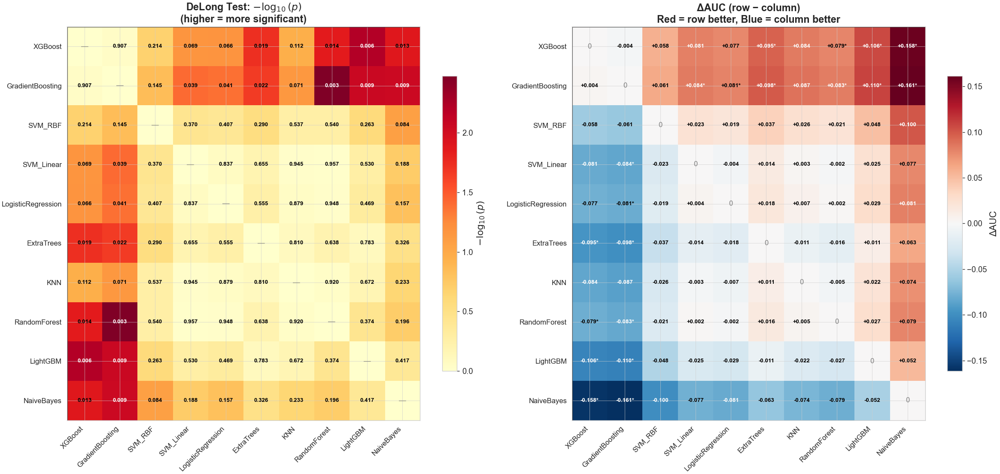


 🏆 Best Model (by Mean AUC): XGBoost  (Mean AUC = 0.6654)
 DeLong comparison vs. all other models (sorted by Mean ΔAUC):
        Competitor Competitor_Mean_AUC ΔMean_AUC  p_value p_Bonferroni Significant_uncorrected Significant_Bonferroni
        NaiveBayes              0.5198   +0.1456 1.31e-02     5.91e-01                       ✓                      ✗
          LightGBM              0.5618   +0.1037 6.10e-03     2.75e-01                       ✓                      ✗
      RandomForest              0.5996   +0.0658 1.40e-02     6.29e-01                       ✓                      ✗
               KNN              0.6100   +0.0554 1.12e-01     1.00e+00                       ✗                      ✗
        ExtraTrees              0.6287   +0.0367 1.88e-02     8.45e-01                       ✓                      ✗
LogisticRegression              0.6337   +0.0317 6.61e-02     1.00e+00                       ✗                      ✗
        SVM_Linear              0.6383   +0.0271 6.8

In [53]:
# =============================================================================
# STATISTICAL INFERENCE VIA DELONG single ROC ANALYSIS
# =============================================================================
# Purpose:
#   - Implement vectorized, fast DeLong test computations for paired ROC curves.
#   - Execute exhaustive single model comparisons with family-wise error rate 
#     control via Bonferroni corrections.
#   - Generate publication-grade diagnostic heatmaps tracking p-values and delta AUCs.
#   - Benchmark the top-performing architecture against all remaining cohorts.
# =============================================================================

import os
import warnings
import itertools
from collections import Counter

import numpy as np
import pandas as pd
from scipy import stats

# Enforce strategic default persistence directories if missing from environment context
if 'SAVE_DIR' not in locals() and 'SAVE_DIR' not in globals():
    SAVE_DIR = CONFIG["DATASET_OUTPUT_ROOT"]

# -----------------------------------------------------------------------------
# 1. CORE MATH IMPLEMENTATIONS FOR FAST DELONG VECTORIZATION
# -----------------------------------------------------------------------------
def _compute_midrank(x):
    """Computes mathematical midranks for identical entry strings inside vectors."""
    J = np.argsort(x)
    Z = x[J]
    N = len(x)
    T = np.zeros(N, dtype=float)
    i = 0
    while i < N:
        j = i
        while j < N and Z[j] == Z[i]:
            j += 1
        midrank = 0.5 * (i + j - 1)
        for k in range(i, j):
            T[k] = midrank
        i = j
    T2 = np.empty(N, dtype=float)
    T2[J] = T + 1
    return T2


def _fast_delong(predictions_sorted_transposed, label_1_count):
    """Vectorized algorithm mapping structurally unrolled variance-covariance arrays."""
    m = label_1_count
    n = predictions_sorted_transposed.shape[1] - m
    k = predictions_sorted_transposed.shape[0]

    tx = np.empty([k, m], dtype=float)
    ty = np.empty([k, n], dtype=float)
    tz = np.empty([k, m + n], dtype=float)

    for r in range(k):
        tz[r] = _compute_midrank(predictions_sorted_transposed[r])
        tx[r] = _compute_midrank(predictions_sorted_transposed[r, :m])
        ty[r] = _compute_midrank(predictions_sorted_transposed[r, m:])

    aucs = tz[:, :m].sum(axis=1) / (m * n) - (m + 1.0) / (2.0 * n)

    v01 = (tz[:, :m] - tx) / n
    v10 = 1.0 - (tz[:, m:] - ty) / m

    sx = np.cov(v01) if k > 1 else np.var(v01, ddof=1).reshape(1, 1)
    sy = np.cov(v10) if k > 1 else np.var(v10, ddof=1).reshape(1, 1)

    delongcov = sx / m + sy / n
    return aucs, delongcov


def delong_roc_test(y_true, y_prob_1, y_prob_2):
    """Executes the standard DeLong test to evaluate two correlated ROC curves.

    Args:
        y_true (np.ndarray): Target true classification outcomes.
        y_prob_1 (np.ndarray): Probability vectors produced by Model 1.
        y_prob_2 (np.ndarray): Probability vectors produced by Model 2.

    Returns:
        dict: Empirical metrics mapping standalone AUCs, Z-scores, and two-tailed p-values.
    """
    y_true = np.asarray(y_true, dtype=np.int64)
    y_prob_1 = np.asarray(y_prob_1, dtype=np.float64)
    y_prob_2 = np.asarray(y_prob_2, dtype=np.float64)

    order = (-y_true).argsort()
    y_true_sorted = y_true[order]
    label_1_count = int(y_true_sorted.sum())

    predictions_sorted_transposed = np.vstack([
        y_prob_1[order],
        y_prob_2[order]
    ])

    aucs, delongcov = _fast_delong(predictions_sorted_transposed, label_1_count)

    diff = aucs[0] - aucs[1]
    var_diff = delongcov[0, 0] + delongcov[1, 1] - 2 * delongcov[0, 1]

    if var_diff <= 0:
        z_stat = 0.0
        p_value = 1.0
    else:
        z_stat = diff / np.sqrt(var_diff)
        p_value = 2.0 * stats.norm.sf(abs(z_stat))

    return {
        'auc1': aucs[0],
        'auc2': aucs[1],
        'z_stat': z_stat,
        'p_value': p_value,
    }


# -----------------------------------------------------------------------------
# 2. single MODEL MATRIX INFERENCE PROTOCOL
# -----------------------------------------------------------------------------
model_names = (
    df_summary.sort_values('Mean_AUC', ascending=False)['Model']
    .tolist()
)

n_models = len(model_names)

pvalue_matrix = pd.DataFrame(np.ones((n_models, n_models)), index=model_names, columns=model_names)
zstat_matrix = pd.DataFrame(np.zeros((n_models, n_models)), index=model_names, columns=model_names)

comparison_rows = []
ref_y_true = np.array(nested_cv_results[model_names[0]]['y_true'])

for i, j in itertools.combinations(range(n_models), 2):
    m1, m2 = model_names[i], model_names[j]

    y_true_1 = np.array(nested_cv_results[m1]['y_true'])
    y_true_2 = np.array(nested_cv_results[m2]['y_true'])
    y_prob_1 = np.array(nested_cv_results[m1]['y_prob'])
    y_prob_2 = np.array(nested_cv_results[m2]['y_prob'])

    assert np.array_equal(y_true_1, y_true_2), f"y_true mismatch between {m1} and {m2}!"

    result = delong_roc_test(y_true_1, y_prob_1, y_prob_2)

    pvalue_matrix.loc[m1, m2] = result['p_value']
    pvalue_matrix.loc[m2, m1] = result['p_value']
    zstat_matrix.loc[m1, m2] = result['z_stat']
    zstat_matrix.loc[m2, m1] = -result['z_stat']

    comparison_rows.append({
        'Model_A': m1,
        'Model_B': m2,
        'AUC_A': result['auc1'],
        'AUC_B': result['auc2'],
        'ΔAUC': result['auc1'] - result['auc2'],
        'Z_stat': result['z_stat'],
        'p_value': result['p_value'],
        'Significant (α=0.05)': '✓' if result['p_value'] < 0.05 else '✗',
        'Significant (α=0.01)': '✓' if result['p_value'] < 0.01 else '✗',
    })

df_delong = pd.DataFrame(comparison_rows)
df_delong = df_delong.sort_values('p_value').reset_index(drop=True)

# Enforce rigid Family-Wise Error Rate control using Bonferroni Adjustments
n_comparisons = len(comparison_rows)
df_delong['p_value_bonferroni'] = np.minimum(df_delong['p_value'] * n_comparisons, 1.0)
df_delong['Significant Bonf. (α=0.05)'] = df_delong['p_value_bonferroni'].apply(lambda p: '✓' if p < 0.05 else '✗')


# --- Display Tabular Outputs -------------------------------------------------
print("=" * 90)
print("  DeLong single AUC Comparison — All Model Pairs")
print("=" * 90)
df_display = df_delong.copy()
df_display['AUC_A'] = df_display['AUC_A'].map('{:.4f}'.format)
df_display['AUC_B'] = df_display['AUC_B'].map('{:.4f}'.format)
df_display['ΔAUC'] = df_display['ΔAUC'].map('{:+.4f}'.format)
df_display['Z_stat'] = df_display['Z_stat'].map('{:.3f}'.format)
df_display['p_value'] = df_display['p_value'].map('{:.2e}'.format)
df_display['p_value_bonferroni'] = df_display['p_value_bonferroni'].map('{:.2e}'.format)
print(df_display.to_string(index=False))

n_sig_005 = (df_delong['p_value'] < 0.05).sum()
n_sig_001 = (df_delong['p_value'] < 0.01).sum()
n_sig_bonf = (df_delong['p_value_bonferroni'] < 0.05).sum()

print(f"\n📊 Summary: {n_comparisons} single comparisons")
print(f"   • Significant at α=0.05:              {n_sig_005}/{n_comparisons}")
print(f"   • Significant at α=0.01:              {n_sig_001}/{n_comparisons}")
print(f"   • Significant after Bonferroni (0.05): {n_sig_bonf}/{n_comparisons}")


# -----------------------------------------------------------------------------
# 3. HIGH-RESOLUTION PRESENTATION HEATMAP GENERATION (DPI 900)
# -----------------------------------------------------------------------------
try:
    import matplotlib.pyplot as plt
    import matplotlib.colors as mcolors

    fig, axes = plt.subplots(1, 2, figsize=(20, 9.5))

    # --- Heatmap Panel A: -log10(p-value) Magnitude Mapping ---
    log_pval = -np.log10(pvalue_matrix.values.astype(float) + 1e-300)
    np.fill_diagonal(log_pval, 0)

    im1 = axes[0].imshow(log_pval, cmap='YlOrRd', aspect='auto')
    axes[0].set_xticks(range(n_models))
    axes[0].set_yticks(range(n_models))
    axes[0].set_xticklabels(model_names, rotation=45, ha='right', fontsize=10)
    axes[0].set_yticklabels(model_names, fontsize=10)
    axes[0].set_title('DeLong Test: $-\\log_{10}(p)$\n(higher = more significant)', fontsize=14, fontweight='bold')

    for ii in range(n_models):
        for jj in range(n_models):
            if ii != jj:
                pval = pvalue_matrix.iloc[ii, jj]
                txt = f'{pval:.1e}' if pval < 0.001 else f'{pval:.3f}'
                color = 'white' if log_pval[ii, jj] > 2 else 'black'
                axes[0].text(jj, ii, txt, ha='center', va='center', fontsize=8, color=color, fontweight='bold')
            else:
                axes[0].text(jj, ii, '—', ha='center', va='center', fontsize=10, color='gray')

    fig.colorbar(im1, ax=axes[0], shrink=0.75, label='$-\\log_{10}(p)$')

    # --- Heatmap Panel B: Unrolled Delta AUC Directional Matrix ---
    auc_diff_matrix = pd.DataFrame(np.zeros((n_models, n_models)), index=model_names, columns=model_names)
    for _, row in df_delong.iterrows():
        m1, m2 = row['Model_A'], row['Model_B']
        d = float(row['ΔAUC'])
        auc_diff_matrix.loc[m1, m2] = d
        auc_diff_matrix.loc[m2, m1] = -d

    max_abs = max(abs(auc_diff_matrix.values.min()), abs(auc_diff_matrix.values.max()), 0.01)
    im2 = axes[1].imshow(auc_diff_matrix.values, cmap='RdBu_r', aspect='auto', vmin=-max_abs, vmax=max_abs)
    axes[1].set_xticks(range(n_models))
    axes[1].set_yticks(range(n_models))
    axes[1].set_xticklabels(model_names, rotation=45, ha='right', fontsize=10)
    axes[1].set_yticklabels(model_names, fontsize=10)
    axes[1].set_title('ΔAUC (row − column)\nRed = row better, Blue = column better', fontsize=14, fontweight='bold')

    for ii in range(n_models):
        for jj in range(n_models):
            if ii != jj:
                val = auc_diff_matrix.iloc[ii, jj]
                pval = pvalue_matrix.iloc[ii, jj]
                star = '*' if pval < 0.05 else ''
                txt = f'{val:+.3f}{star}'
                axes[1].text(jj, ii, txt, ha='center', va='center', fontsize=8,
                             color='white' if abs(val) > max_abs * 0.5 else 'black', fontweight='bold')
            else:
                axes[1].text(jj, ii, '0', ha='center', va='center', fontsize=10, color='gray')

    fig.colorbar(im2, ax=axes[1], shrink=0.75, label='ΔAUC')

    for ax in axes:
        ax.axhline(y=-0.5, color='black', linewidth=1.5)
        ax.axvline(x=-0.5, color='black', linewidth=1.5)

    plt.tight_layout()
    
    os.makedirs(SAVE_DIR, exist_ok=True)
    heatmap_save_path = os.path.join(SAVE_DIR, 'delong_single_heatmap.png')
    plt.savefig(heatmap_save_path, dpi=600, bbox_inches='tight')
    print(f"\n💾 High-resolution heatmap (DPI 900) saved to: {heatmap_save_path}")
    plt.show()
    plt.close()

except ImportError:
    print("\nmatplotlib not available — skipping heatmap visualisation.")


# -----------------------------------------------------------------------------
# 4. CRITICAL CHRONOLOGICAL ANALYSIS: CHOSEN CHAMPION VS INDEPENDENT COHORTS
# -----------------------------------------------------------------------------
mean_aucs = {}
for mn in model_names:
    try:
        # Compute baseline criteria mapping directly on Cross-Validation Fold means
        mean_aucs[mn] = np.mean(nested_cv_results[mn]['fold_aucs'])
    except Exception:
        mean_aucs[mn] = 0.5

# Extract optimal model design index relying exclusively on structural Mean AUC performance
best_model = df_summary.sort_values('Mean_AUC', ascending=False).iloc[0]['Model']
best_auc = mean_aucs[best_model]

print(f"\n{'=' * 70}")
print(f" 🏆 Best Model (by Mean AUC): {best_model}  (Mean AUC = {best_auc:.4f})")
print(f" DeLong comparison vs. all other models (sorted by Mean ΔAUC):")
print(f"{'=' * 70}")



best_vs_rest = []
for mn in model_names:
    if mn == best_model:
        continue
    
    # Query paired historical database rows matching target experimental configurations
    row_data = df_delong[
        ((df_delong['Model_A'] == best_model) & (df_delong['Model_B'] == mn)) |
        ((df_delong['Model_A'] == mn) & (df_delong['Model_B'] == best_model))
    ]
    
    if len(row_data) > 0:
        row = row_data.iloc[0]
        p_val = row['p_value']
        p_bonf = row['p_value_bonferroni']
    else:
        p_val, p_bonf = 1.0, 1.0

    # Calculate absolute delta values using standalone Mean AUC frame locations
    delta = best_auc - mean_aucs[mn]
    
    best_vs_rest.append({
        'Competitor': mn,
        'Competitor_Mean_AUC': mean_aucs[mn],
        'ΔMean_AUC': delta,
        'p_value': p_val,
        'p_Bonferroni': p_bonf,
        'Significant_uncorrected': '✓' if p_val < 0.05 else '✗',
        'Significant_Bonferroni': '✓' if p_bonf < 0.05 else '✗',
    })

# Format and rank baseline comparisons sequentially from largest to minimal delta deviations
df_best_vs_rest = pd.DataFrame(best_vs_rest).sort_values('ΔMean_AUC', ascending=False).reset_index(drop=True)
df_best_vs_rest['Competitor_Mean_AUC'] = df_best_vs_rest['Competitor_Mean_AUC'].map('{:.4f}'.format)
df_best_vs_rest['ΔMean_AUC'] = df_best_vs_rest['ΔMean_AUC'].map('{:+.4f}'.format)
df_best_vs_rest['p_value'] = df_best_vs_rest['p_value'].map('{:.2e}'.format)
df_best_vs_rest['p_Bonferroni'] = df_best_vs_rest['p_Bonferroni'].map('{:.2e}'.format)



df_delong.to_csv(os.path.join(SAVE_DIR, 'df_delong_single.csv'), index=False)
pvalue_matrix.to_csv(os.path.join(SAVE_DIR, 'delong_pvalue_matrix.csv'))
zstat_matrix.to_csv(os.path.join(SAVE_DIR, 'delong_zstat_matrix.csv'))
df_best_vs_rest.to_csv(os.path.join(SAVE_DIR, 'delong_best_vs_rest.csv'), index=False)



print(df_best_vs_rest.to_string(index=False))
print("\nDeLong analysis complete.")

In [54]:
    # =============================================================================
    # STEP 4C — LASSO-ONLY VS BASELINE STATISTICAL COMPARISON
    # =============================================================================
    # Purpose:
    #   - Compare LASSO-only FS against the Step 2 baseline.
    #   - Keep analysis compact and manuscript-style.
    #   - Generate non-redundant plots:
    #       1) ROC-AUC delta by model
    #       2) Best ROC curves
    #       3) Fold-wise AUC paired change
    #       4) LASSO feature-selection stability
    #       5) Metric trade-off for best changed model
    # =============================================================================


current_fs_method = CONFIG.get("FS_METHOD", None)

if current_fs_method != "lasso_only":
    print("█" * 80)
    print("  STEP 4C — SKIPPED")
    print("█" * 80)
    print("This cell is only for FS_METHOD='lasso_only'.")
    print(f"Current FS_METHOD is: {current_fs_method}")
    print("No LASSO-vs-baseline comparison was executed.")

else:
    print("█" * 80)
    print("  STEP 4C — LASSO-ONLY VS BASELINE COMPARISON")
    print("█" * 80)
    

    import os
    import json
    import pickle
    import warnings
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt

    from scipy.stats import wilcoxon

    from sklearn.metrics import (
        roc_auc_score,
        average_precision_score,
        accuracy_score,
        balanced_accuracy_score,
        precision_score,
        recall_score,
        f1_score,
        confusion_matrix,
        cohen_kappa_score,
        brier_score_loss,
        roc_curve
    )

    warnings.filterwarnings("ignore")

    # -----------------------------------------------------------------------------
    # 1. Paths
    # -----------------------------------------------------------------------------
    baseline_dir = os.path.join(
        CONFIG["DATASET_OUTPUT_ROOT"],
        "step_2_baseline_nested_cv_no_smote"
    )

    lasso_dir = CONFIG.get(
        "SAVE_DIR",
        os.path.join("./nested_cv_outputs", "step_4_lasso_only_fs_nested_cv_no_smote")
    )

    comparison_dir = os.path.join(lasso_dir, "step_4c_lasso_vs_baseline_reports")
    plot_dir = os.path.join(comparison_dir, "plots_publication_style")

    os.makedirs(comparison_dir, exist_ok=True)
    os.makedirs(plot_dir, exist_ok=True)


    baseline_pkl_path = os.path.join(baseline_dir, "nested_cv_results.pkl")

    # -----------------------------------------------------------------------------
    # Guard: Baseline comparison is optional and requires a previous baseline run
    # -----------------------------------------------------------------------------
    if not os.path.exists(baseline_pkl_path):
        print("=" * 90)
        print("  BASELINE COMPARISON — SKIPPED")
        print("=" * 90)
        print(f"Baseline results were not found:\n{baseline_pkl_path}")
        print("This is expected when running only the final locked model.")
        print("For the final manuscript model, this comparison cell is optional.")
        
        df_baseline_comparison = pd.DataFrame()
    else:
        print(f"Baseline results found:\n{baseline_pkl_path}")


        if "nested_cv_results" not in globals():
            raise RuntimeError("Current LASSO nested_cv_results not found. Run Cell 13 after Step 4B.")

        with open(baseline_pkl_path, "rb") as f:
            baseline_results = pickle.load(f)

        lasso_results = nested_cv_results

        print(f"\nLoaded baseline results from:\n  {baseline_pkl_path}")
        print(f"Using current LASSO results from:\n  {lasso_dir}")

        # -----------------------------------------------------------------------------
        # 2. Publication-style plotting theme
        # -----------------------------------------------------------------------------
        plt.style.use("default")

        FIG_DPI = 600

        COLORS = {
            "baseline": "#4C78A8",
            "lasso": "#2A9D8F",
            "delta_pos": "#2A9D8F",
            "delta_neg": "#B23A48",
            "dark": "#2F3E46",
            "neutral": "#6C757D",
            "grid": "#D9DEE3"
        }

        plt.rcParams.update({
            "figure.dpi": 120,
            "savefig.dpi": FIG_DPI,
            "font.family": "DejaVu Sans",
            "font.size": PLOT_FONT_SIZE,
            "axes.titlesize": PLOT_TITLE_SIZE,
            "axes.labelsize": PLOT_LABEL_SIZE,
            "xtick.labelsize": PLOT_TICK_SIZE,
            "ytick.labelsize": PLOT_TICK_SIZE,
            "legend.fontsize": PLOT_LEGEND_SIZE,
            "axes.linewidth": 0.8,
            "axes.edgecolor": "#333333",
            "axes.grid": True,
            "grid.color": COLORS["grid"],
            "grid.linewidth": 0.5,
            "grid.alpha": 0.8,
            "savefig.bbox": "tight",
            "savefig.pad_inches": 0.03,
            "pdf.fonttype": 42,
            "ps.fonttype": 42
        })


        def clean_axis(ax, grid_axis="y"):
            ax.spines["top"].set_visible(False)
            ax.spines["right"].set_visible(False)
            ax.grid(True, axis=grid_axis, linestyle="-", linewidth=0.5, alpha=0.6)
            ax.set_axisbelow(True)


        def save_figure(fig, filename_base):
            png_path = os.path.join(plot_dir, f"{filename_base}.png")
            pdf_path = os.path.join(plot_dir, f"{filename_base}.pdf")
            fig.savefig(png_path, dpi=FIG_DPI, bbox_inches="tight")
            fig.savefig(pdf_path, bbox_inches="tight")
            print(f"Saved: {png_path}")
            print(f"Saved: {pdf_path}")


        def compute_specificity(y_true, y_pred):
            cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
            if cm.shape != (2, 2):
                return np.nan
            tn, fp, fn, tp = cm.ravel()
            return tn / (tn + fp) if (tn + fp) > 0 else np.nan


        def compute_npv(y_true, y_pred):
            cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
            if cm.shape != (2, 2):
                return np.nan
            tn, fp, fn, tp = cm.ravel()
            return tn / (tn + fn) if (tn + fn) > 0 else np.nan


        def benjamini_hochberg(p_values):
            p_values = np.asarray(p_values, dtype=float)
            q_values = np.full(len(p_values), np.nan)

            valid = np.isfinite(p_values)
            p = p_values[valid]

            if len(p) == 0:
                return q_values

            order = np.argsort(p)
            ranked = p[order]
            adjusted = ranked * len(p) / (np.arange(1, len(p) + 1))
            adjusted = np.minimum.accumulate(adjusted[::-1])[::-1]
            adjusted = np.clip(adjusted, 0, 1)

            q_valid = np.empty_like(p)
            q_valid[order] = adjusted
            q_values[valid] = q_valid

            return q_values


        def pooled_metrics_from_results(results_dict):
            rows = []

            for model_name, res in results_dict.items():
                y_true = np.asarray(res["y_true"], dtype=int)
                y_prob = np.asarray(res["y_prob"], dtype=float)
                y_pred = np.asarray(res["y_pred"], dtype=int)

                rows.append({
                    "Model": model_name,
                    "ROC_AUC": roc_auc_score(y_true, y_prob),
                    "PR_AUC": average_precision_score(y_true, y_prob),
                    "Accuracy": accuracy_score(y_true, y_pred),
                    "Balanced_Accuracy": balanced_accuracy_score(y_true, y_pred),
                    "Sensitivity": recall_score(y_true, y_pred, zero_division=0),
                    "Specificity": compute_specificity(y_true, y_pred),
                    "PPV": precision_score(y_true, y_pred, zero_division=0),
                    "NPV": compute_npv(y_true, y_pred),
                    "F1": f1_score(y_true, y_pred, zero_division=0),
                    "Cohen_Kappa": cohen_kappa_score(y_true, y_pred),
                    "Brier_Score": brier_score_loss(y_true, y_prob),
                    "Mean_Selected_Features": np.mean(res["n_features_per_fold"]),
                    "Std_Selected_Features": np.std(res["n_features_per_fold"], ddof=1)
                })

            return pd.DataFrame(rows).sort_values("ROC_AUC", ascending=False).reset_index(drop=True)


        def paired_bootstrap_delta_ci(y_true, prob_a, prob_b, metric_func, n_boot=2000, seed=100):
            """
            Paired bootstrap CI for delta = metric_b - metric_a.
            Here:
                a = baseline
                b = LASSO
            """
            rng = np.random.default_rng(seed)

            y_true = np.asarray(y_true, dtype=int)
            prob_a = np.asarray(prob_a, dtype=float)
            prob_b = np.asarray(prob_b, dtype=float)

            n = len(y_true)
            deltas = []

            for _ in range(n_boot):
                idx = rng.integers(0, n, n)

                if len(np.unique(y_true[idx])) < 2:
                    continue

                try:
                    val_a = metric_func(y_true[idx], prob_a[idx])
                    val_b = metric_func(y_true[idx], prob_b[idx])
                    deltas.append(val_b - val_a)
                except Exception:
                    continue

            if len(deltas) == 0:
                return np.nan, np.nan, np.nan

            deltas = np.asarray(deltas, dtype=float)

            return (
                float(np.nanmean(deltas)),
                float(np.nanpercentile(deltas, 2.5)),
                float(np.nanpercentile(deltas, 97.5))
            )


        # -----------------------------------------------------------------------------
        # 3. Compute metrics
        # -----------------------------------------------------------------------------
        baseline_metrics_df = pooled_metrics_from_results(baseline_results)
        lasso_metrics_df = pooled_metrics_from_results(lasso_results)

        baseline_metrics_df.to_csv(
            os.path.join(comparison_dir, "baseline_recomputed_pooled_metrics.csv"),
            index=False
        )

        lasso_metrics_df.to_csv(
            os.path.join(comparison_dir, "lasso_only_pooled_metrics.csv"),
            index=False
        )

        common_models = sorted(set(baseline_metrics_df["Model"]).intersection(lasso_metrics_df["Model"]))

        comparison_rows = []

        for model_name in common_models:
            b_row = baseline_metrics_df[baseline_metrics_df["Model"] == model_name].iloc[0]
            l_row = lasso_metrics_df[lasso_metrics_df["Model"] == model_name].iloc[0]

            b_res = baseline_results[model_name]
            l_res = lasso_results[model_name]

            b_y_true = np.asarray(b_res["y_true"], dtype=int)
            l_y_true = np.asarray(l_res["y_true"], dtype=int)

            same_oof_order = (
                len(b_y_true) == len(l_y_true)
                and np.array_equal(b_y_true, l_y_true)
            )

            if same_oof_order:
                auc_delta_mean, auc_delta_low, auc_delta_high = paired_bootstrap_delta_ci(
                    b_y_true,
                    np.asarray(b_res["y_prob"], dtype=float),
                    np.asarray(l_res["y_prob"], dtype=float),
                    roc_auc_score,
                    n_boot=2000,
                    seed=CONFIG.get("RANDOM_STATE", 100)
                )

                pr_delta_mean, pr_delta_low, pr_delta_high = paired_bootstrap_delta_ci(
                    b_y_true,
                    np.asarray(b_res["y_prob"], dtype=float),
                    np.asarray(l_res["y_prob"], dtype=float),
                    average_precision_score,
                    n_boot=2000,
                    seed=CONFIG.get("RANDOM_STATE", 100) + 1
                )
            else:
                auc_delta_mean, auc_delta_low, auc_delta_high = np.nan, np.nan, np.nan
                pr_delta_mean, pr_delta_low, pr_delta_high = np.nan, np.nan, np.nan

            b_fold_auc = np.asarray(b_res["fold_aucs"], dtype=float)
            l_fold_auc = np.asarray(l_res["fold_aucs"], dtype=float)

            if len(b_fold_auc) == len(l_fold_auc) and len(b_fold_auc) >= 2:
                try:
                    w_stat, w_p = wilcoxon(
                        l_fold_auc,
                        b_fold_auc,
                        alternative="two-sided",
                        zero_method="wilcox"
                    )
                except Exception:
                    w_stat, w_p = np.nan, np.nan
            else:
                w_stat, w_p = np.nan, np.nan

            comparison_rows.append({
                "Model": model_name,

                "Baseline_ROC_AUC": b_row["ROC_AUC"],
                "LASSO_ROC_AUC": l_row["ROC_AUC"],
                "Delta_ROC_AUC_LASSO_minus_Baseline": l_row["ROC_AUC"] - b_row["ROC_AUC"],
                "Paired_Bootstrap_Delta_ROC_AUC_Mean": auc_delta_mean,
                "Paired_Bootstrap_Delta_ROC_AUC_CI95_Low": auc_delta_low,
                "Paired_Bootstrap_Delta_ROC_AUC_CI95_High": auc_delta_high,

                "Baseline_PR_AUC": b_row["PR_AUC"],
                "LASSO_PR_AUC": l_row["PR_AUC"],
                "Delta_PR_AUC_LASSO_minus_Baseline": l_row["PR_AUC"] - b_row["PR_AUC"],
                "Paired_Bootstrap_Delta_PR_AUC_Mean": pr_delta_mean,
                "Paired_Bootstrap_Delta_PR_AUC_CI95_Low": pr_delta_low,
                "Paired_Bootstrap_Delta_PR_AUC_CI95_High": pr_delta_high,

                "Baseline_Balanced_Accuracy": b_row["Balanced_Accuracy"],
                "LASSO_Balanced_Accuracy": l_row["Balanced_Accuracy"],
                "Delta_Balanced_Accuracy": l_row["Balanced_Accuracy"] - b_row["Balanced_Accuracy"],

                "Baseline_Sensitivity": b_row["Sensitivity"],
                "LASSO_Sensitivity": l_row["Sensitivity"],
                "Delta_Sensitivity": l_row["Sensitivity"] - b_row["Sensitivity"],

                "Baseline_Specificity": b_row["Specificity"],
                "LASSO_Specificity": l_row["Specificity"],
                "Delta_Specificity": l_row["Specificity"] - b_row["Specificity"],

                "Baseline_PPV": b_row["PPV"],
                "LASSO_PPV": l_row["PPV"],
                "Delta_PPV": l_row["PPV"] - b_row["PPV"],

                "Baseline_NPV": b_row["NPV"],
                "LASSO_NPV": l_row["NPV"],
                "Delta_NPV": l_row["NPV"] - b_row["NPV"],

                "Baseline_Kappa": b_row["Cohen_Kappa"],
                "LASSO_Kappa": l_row["Cohen_Kappa"],
                "Delta_Kappa": l_row["Cohen_Kappa"] - b_row["Cohen_Kappa"],

                "Baseline_Brier": b_row["Brier_Score"],
                "LASSO_Brier": l_row["Brier_Score"],
                "Delta_Brier_LASSO_minus_Baseline": l_row["Brier_Score"] - b_row["Brier_Score"],

                "Baseline_Mean_Selected_Features": b_row["Mean_Selected_Features"],
                "LASSO_Mean_Selected_Features": l_row["Mean_Selected_Features"],

                "Foldwise_Wilcoxon_AUC_Statistic": w_stat,
                "Foldwise_Wilcoxon_AUC_p_value": w_p,
                "Same_OOF_Order_For_Paired_Bootstrap": same_oof_order
            })

        comparison_df = pd.DataFrame(comparison_rows)

        comparison_df["Foldwise_Wilcoxon_AUC_q_value_FDR"] = benjamini_hochberg(
            comparison_df["Foldwise_Wilcoxon_AUC_p_value"].values
        )

        comparison_df = comparison_df.sort_values(
            "Delta_ROC_AUC_LASSO_minus_Baseline",
            ascending=False
        ).reset_index(drop=True)

        comparison_df.to_csv(
            os.path.join(comparison_dir, "lasso_only_vs_baseline_model_comparison.csv"),
            index=False
        )

        print("\n" + "═" * 80)
        print("LASSO-ONLY VS BASELINE — MODEL COMPARISON")
        print("═" * 80)

        display_cols = [
            "Model",
            "Baseline_ROC_AUC",
            "LASSO_ROC_AUC",
            "Delta_ROC_AUC_LASSO_minus_Baseline",
            "Paired_Bootstrap_Delta_ROC_AUC_CI95_Low",
            "Paired_Bootstrap_Delta_ROC_AUC_CI95_High",
            "Baseline_PR_AUC",
            "LASSO_PR_AUC",
            "Delta_PR_AUC_LASSO_minus_Baseline",
            "Baseline_Sensitivity",
            "LASSO_Sensitivity",
            "Delta_Sensitivity",
            "Baseline_Specificity",
            "LASSO_Specificity",
            "Delta_Specificity",
            "Foldwise_Wilcoxon_AUC_p_value",
            "Foldwise_Wilcoxon_AUC_q_value_FDR"
        ]

        print(comparison_df[display_cols].to_string(index=False, float_format="%.4f"))

        best_baseline_model = baseline_metrics_df.iloc[0]["Model"]
        best_lasso_model = lasso_metrics_df.iloc[0]["Model"]
        best_delta_model = comparison_df.iloc[0]["Model"]

        print("\nBest baseline model:", best_baseline_model)
        print("Best LASSO model:   ", best_lasso_model)
        print("Largest ROC-AUC gain with LASSO:", best_delta_model)

        # -----------------------------------------------------------------------------
        # 4. Figure 1 — ROC-AUC delta by model
        # -----------------------------------------------------------------------------
        delta_plot = comparison_df.sort_values(
            "Delta_ROC_AUC_LASSO_minus_Baseline",
            ascending=True
        )

        fig, ax = plt.subplots(figsize=(4.8, 3.0))

        bar_colors = [
            COLORS["delta_pos"] if v >= 0 else COLORS["delta_neg"]
            for v in delta_plot["Delta_ROC_AUC_LASSO_minus_Baseline"]
        ]

        ax.barh(
            delta_plot["Model"],
            delta_plot["Delta_ROC_AUC_LASSO_minus_Baseline"],
            color=bar_colors,
            edgecolor="#222222",
            linewidth=0.5
        )

        ax.axvline(0, color="#222222", linewidth=0.8)
        ax.set_title("Effect of LASSO Feature Selection")
        ax.set_xlabel("Δ ROC-AUC: LASSO − Baseline")
        ax.set_ylabel("")
        clean_axis(ax)

        plt.tight_layout()
        save_figure(fig, "fig01_lasso_delta_roc_auc_by_model")
        plt.show()

        # -----------------------------------------------------------------------------
        # 5. Figure 2 — Best ROC curves
        # -----------------------------------------------------------------------------
        fig, ax = plt.subplots(figsize=(3.8, 3.4))

        b_res = baseline_results[best_baseline_model]
        l_res = lasso_results[best_lasso_model]

        b_y_true = np.asarray(b_res["y_true"], dtype=int)
        b_y_prob = np.asarray(b_res["y_prob"], dtype=float)

        l_y_true = np.asarray(l_res["y_true"], dtype=int)
        l_y_prob = np.asarray(l_res["y_prob"], dtype=float)

        b_fpr, b_tpr, _ = roc_curve(b_y_true, b_y_prob)
        l_fpr, l_tpr, _ = roc_curve(l_y_true, l_y_prob)

        b_auc = roc_auc_score(b_y_true, b_y_prob)
        l_auc = roc_auc_score(l_y_true, l_y_prob)

        ax.plot(
            b_fpr,
            b_tpr,
            linewidth=1.4,
            color=COLORS["baseline"],
            label=f"Baseline: {best_baseline_model} ({b_auc:.2f})"
        )

        ax.plot(
            l_fpr,
            l_tpr,
            linewidth=1.4,
            color=COLORS["lasso"],
            label=f"LASSO: {best_lasso_model} ({l_auc:.2f})"
        )

        ax.plot([0, 1], [0, 1], linestyle="--", linewidth=0.8, color="#999999")

        ax.set_title("Best ROC Curves")
        ax.set_xlabel("False positive rate")
        ax.set_ylabel("True positive rate")
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.legend(frameon=False, loc="lower right")
        clean_axis(ax, grid_axis="both")

        plt.tight_layout()
        save_figure(fig, "fig02_best_baseline_vs_lasso_roc_curves")
        plt.show()

        # -----------------------------------------------------------------------------
        # 6. Figure 3 — Fold-wise AUC paired change for best delta model
        # -----------------------------------------------------------------------------
        b_fold_auc = np.asarray(baseline_results[best_delta_model]["fold_aucs"], dtype=float)
        l_fold_auc = np.asarray(lasso_results[best_delta_model]["fold_aucs"], dtype=float)

        if len(b_fold_auc) == len(l_fold_auc):
            fig, ax = plt.subplots(figsize=(3.8, 2.8))

            for i in range(len(b_fold_auc)):
                ax.plot(
                    [0, 1],
                    [b_fold_auc[i], l_fold_auc[i]],
                    marker="o",
                    linewidth=0.9,
                    color=COLORS["neutral"],
                    alpha=0.8
                )

            ax.scatter(
                np.zeros_like(b_fold_auc),
                b_fold_auc,
                color=COLORS["baseline"],
                edgecolor="#222222",
                linewidth=0.4,
                zorder=3,
                label="Baseline"
            )

            ax.scatter(
                np.ones_like(l_fold_auc),
                l_fold_auc,
                color=COLORS["lasso"],
                edgecolor="#222222",
                linewidth=0.4,
                zorder=3,
                label="LASSO"
            )

            ax.set_xticks([0, 1])
            ax.set_xticklabels(["Baseline", "LASSO"])
            ax.set_ylim(0, 1)
            ax.set_title(f"Outer-fold ROC-AUC Change — {best_delta_model}")
            ax.set_ylabel("Fold ROC-AUC")
            ax.legend(frameon=False, loc="best")
            clean_axis(ax)

            plt.tight_layout()
            save_figure(fig, "fig03_outer_fold_auc_paired_change_lasso")
            plt.show()

        # -----------------------------------------------------------------------------
        # 7. Figure 4 — LASSO feature selection stability
        # -----------------------------------------------------------------------------
        lasso_features_path = os.path.join(lasso_dir, "df_selected_features_long.csv")

        if os.path.exists(lasso_features_path):
            lasso_feat = pd.read_csv(lasso_features_path)

            lasso_stability = (
                lasso_feat
                .groupby("Feature_Name")
                .size()
                .reset_index(name="Selection_Count")
                .sort_values("Selection_Count", ascending=False)
            )

            lasso_stability["Selection_Frequency"] = (
                lasso_stability["Selection_Count"] / CONFIG["N_OUTER_FOLDS"]
            )

            lasso_stability.to_csv(
                os.path.join(comparison_dir, "lasso_feature_selection_stability.csv"),
                index=False
            )

            top_lasso_stable = lasso_stability.head(12).iloc[::-1]

            top_lasso_stable = top_lasso_stable.copy()

            top_lasso_stable["Feature_Label"] = (
                top_lasso_stable["Feature_Name"]
                .map(
                    lambda x: abbreviate_feature_name(
                        x,
                        max_len=42
                    )
                )
            )

            fig, ax = plt.subplots(figsize=(4.8, 3.3))

            ax.barh(
                top_lasso_stable["Feature_Label"],
                top_lasso_stable["Selection_Frequency"],
                color=COLORS["lasso"],
                edgecolor="#222222",
                linewidth=0.5
            )

            ax.set_xlim(0, 1)
            ax.set_title("LASSO Feature Stability")
            ax.set_xlabel("Selection frequency across outer folds")
            ax.set_ylabel("")
            clean_axis(ax)

            plt.tight_layout()
            save_figure(fig, "fig04_lasso_feature_selection_stability")
            plt.show()
        else:
            lasso_stability = pd.DataFrame()
            print("\nLASSO selected-feature file not found; stability plot skipped.")

        # -----------------------------------------------------------------------------
        # 8. Feature overlap: Baseline vs LASSO
        # -----------------------------------------------------------------------------
        baseline_features_path = os.path.join(baseline_dir, "df_selected_features_long.csv")

        overlap_summary = {}

        if os.path.exists(baseline_features_path) and os.path.exists(lasso_features_path):
            b_feat = pd.read_csv(baseline_features_path)
            l_feat = pd.read_csv(lasso_features_path)

            b_set = set(b_feat["Feature_Name"].unique())
            l_set = set(l_feat["Feature_Name"].unique())

            intersection = b_set.intersection(l_set)
            union = b_set.union(l_set)

            jaccard = len(intersection) / len(union) if len(union) > 0 else np.nan

            overlap_summary = {
                "baseline_unique_features": int(len(b_set)),
                "lasso_unique_features": int(len(l_set)),
                "shared_features": int(len(intersection)),
                "union_features": int(len(union)),
                "jaccard_overlap": float(jaccard)
            }

            pd.DataFrame([overlap_summary]).to_csv(
                os.path.join(comparison_dir, "baseline_vs_lasso_feature_overlap.csv"),
                index=False
            )

            print("\n" + "═" * 80)
            print("FEATURE OVERLAP SUMMARY")
            print("═" * 80)
            for k, v in overlap_summary.items():
                print(f"{k}: {v}")

        # -----------------------------------------------------------------------------
        # 9. Figure 5 — Metric trade-off for best delta model
        # -----------------------------------------------------------------------------
        trade_model = best_delta_model
        trade_row = comparison_df[comparison_df["Model"] == trade_model].iloc[0]

        trade_df = pd.DataFrame({
            "Metric": ["Sensitivity", "Specificity", "PPV", "NPV", "Kappa"],
            "Baseline": [
                trade_row["Baseline_Sensitivity"],
                trade_row["Baseline_Specificity"],
                trade_row["Baseline_PPV"],
                trade_row["Baseline_NPV"],
                trade_row["Baseline_Kappa"]
            ],
            "LASSO": [
                trade_row["LASSO_Sensitivity"],
                trade_row["LASSO_Specificity"],
                trade_row["LASSO_PPV"],
                trade_row["LASSO_NPV"],
                trade_row["LASSO_Kappa"]
            ]
        })

        trade_df.to_csv(
            os.path.join(comparison_dir, "best_delta_model_lasso_metric_tradeoff.csv"),
            index=False
        )

        x = np.arange(len(trade_df))
        width = 0.36

        fig, ax = plt.subplots(figsize=(4.8, 2.9))

        ax.bar(
            x - width / 2,
            trade_df["Baseline"],
            width,
            label="Baseline",
            color=COLORS["baseline"],
            edgecolor="#222222",
            linewidth=0.5
        )

        ax.bar(
            x + width / 2,
            trade_df["LASSO"],
            width,
            label="LASSO",
            color=COLORS["lasso"],
            edgecolor="#222222",
            linewidth=0.5
        )

        ax.set_ylim(0, 1)
        ax.set_title(f"Metric Trade-off — {trade_model}")
        ax.set_ylabel("Score")
        ax.set_xticks(x)
        ax.set_xticklabels(trade_df["Metric"], rotation=30, ha="right")
        ax.legend(frameon=False)
        clean_axis(ax)

        plt.tight_layout()
        save_figure(fig, "fig05_lasso_metric_tradeoff_best_delta_model")
        plt.show()

        # -----------------------------------------------------------------------------
        # 10. Decision table
        # -----------------------------------------------------------------------------
        decision_rows = []

        for _, row in comparison_df.iterrows():
            auc_delta = row["Delta_ROC_AUC_LASSO_minus_Baseline"]
            pr_delta = row["Delta_PR_AUC_LASSO_minus_Baseline"]
            sens_delta = row["Delta_Sensitivity"]
            spec_delta = row["Delta_Specificity"]
            brier_delta = row["Delta_Brier_LASSO_minus_Baseline"]

            if auc_delta > 0 and pr_delta > 0 and brier_delta <= 0:
                recommendation = "LASSO favorable"
            elif auc_delta > 0 and sens_delta > 0 and spec_delta < 0:
                recommendation = "LASSO improves sensitivity but reduces specificity"
            elif auc_delta <= 0 and pr_delta <= 0:
                recommendation = "Baseline preferred"
            else:
                recommendation = "Mixed effect"

            decision_rows.append({
                "Model": row["Model"],
                "Delta_ROC_AUC": auc_delta,
                "Delta_PR_AUC": pr_delta,
                "Delta_Sensitivity": sens_delta,
                "Delta_Specificity": spec_delta,
                "Delta_Brier": brier_delta,
                "Recommendation": recommendation
            })

        lasso_decision_df = pd.DataFrame(decision_rows).sort_values(
            "Delta_ROC_AUC",
            ascending=False
        )

        lasso_decision_df.to_csv(
            os.path.join(comparison_dir, "lasso_ablation_decision_table.csv"),
            index=False
        )

        print("\n" + "═" * 80)
        print("LASSO ABLATION DECISION TABLE")
        print("═" * 80)
        print(lasso_decision_df.to_string(index=False, float_format="%.4f"))

        # -----------------------------------------------------------------------------
        # 11. Compact summary JSON
        # -----------------------------------------------------------------------------
        step_4c_summary = {
            "run_name": CONFIG.get("RUN_NAME", "step_4_lasso_only_fs_nested_cv_no_smote"),
            "baseline_dir": baseline_dir,
            "lasso_dir": lasso_dir,
            "comparison_dir": comparison_dir,
            "best_baseline_model_by_roc_auc": best_baseline_model,
            "best_baseline_roc_auc": float(baseline_metrics_df.iloc[0]["ROC_AUC"]),
            "best_lasso_model_by_roc_auc": best_lasso_model,
            "best_lasso_roc_auc": float(lasso_metrics_df.iloc[0]["ROC_AUC"]),
            "largest_auc_gain_model": best_delta_model,
            "largest_auc_gain": float(comparison_df.iloc[0]["Delta_ROC_AUC_LASSO_minus_Baseline"]),
            "use_smote": bool(CONFIG.get("USE_SMOTE", False)),
            "fs_method": CONFIG.get("FS_METHOD", None),
            "fs_n_features": int(CONFIG.get("FS_N_FEATURES", -1)),
            "n_outer_folds": int(CONFIG.get("N_OUTER_FOLDS", -1)),
            "n_inner_folds": int(CONFIG.get("N_INNER_FOLDS", -1)),
            "n_models_compared": int(len(common_models)),
            "feature_overlap_summary": overlap_summary
        }

        with open(os.path.join(comparison_dir, "step_4c_summary.json"), "w") as f:
            json.dump(step_4c_summary, f, indent=4)

        print("\n" + "═" * 80)
        print("STEP 4C SUMMARY")
        print("═" * 80)

        for k, v in step_4c_summary.items():
            print(f"{k}: {v}")

        print("\nSaved LASSO comparison reports and figures to:")
        print(f"  {comparison_dir}")
        print(f"  {plot_dir}")

        print("\nSTEP 4C completed successfully.")

████████████████████████████████████████████████████████████████████████████████
  STEP 4C — SKIPPED
████████████████████████████████████████████████████████████████████████████████
This cell is only for FS_METHOD='lasso_only'.
Current FS_METHOD is: mrmr_then_elasticnet_no_corr
No LASSO-vs-baseline comparison was executed.


In [55]:
# OLD ABLATION CELL — RFE ONLY — DO NOT RUN FOR FINAL MODEL
# =============================================================================
# STEP 5B — RFE-ONLY FEATURE SELECTION CONFIGURATION LOCK
# =============================================================================
# Purpose:
#   - Run a controlled RFE-only feature selection ablation.
#   - Keep SMOTE disabled to isolate the effect of feature selection.
# =============================================================================

print("█" * 80)
print("  STEP 5B — RFE-ONLY CONFIGURATION LOCK")
print("█" * 80)


target_fs_method = globals().get("TARGET_FS_METHOD", None)

if target_fs_method != "rfe_only":
    print("STEP 5B — SKIPPED")
    print("No RFE configuration was applied.")
else:
    CONFIG["RUN_NAME"] = "step_5_rfe_only_fs_nested_cv_no_smote"
    CONFIG["SAVE_DIR"] = os.path.join(
        CONFIG["DATASET_OUTPUT_ROOT"],
        CONFIG["RUN_NAME"]
    )
    # CONFIG["USE_SMOTE"] = True
    CONFIG["FS_METHOD"] = "rfe_only"
    CONFIG["FS_N_FEATURES"] = CONFIG.get("FS_N_FEATURES", 14)
    SAVE_DIR = CONFIG["SAVE_DIR"]
        
    import os
    import json

    os.makedirs(CONFIG["SAVE_DIR"], exist_ok=True)

    # Isolate feature-selection effect
    # CONFIG["USE_SMOTE"] = False

    # CONFIG["FS_METHOD"] = "rfe_only"

    # Keep same feature count as baseline/LASSO
    CONFIG["FS_N_FEATURES"] = CONFIG.get("FS_N_FEATURES", 16)

    # RFE-specific settings
    CONFIG["RFE_STEP"] = 0.10
    CONFIG["RFE_C"] = 1.0

    # Keep nested CV fixed
    CONFIG["N_OUTER_FOLDS"] = CONFIG.get("N_OUTER_FOLDS", 5)
    CONFIG["N_INNER_FOLDS"] = CONFIG.get("N_INNER_FOLDS", 3)
    CONFIG["N_OPTUNA_TRIALS"] = CONFIG.get("N_OPTUNA_TRIALS", 20)

    rfe_config_snapshot = {
        "RUN_NAME": CONFIG["RUN_NAME"],
        "SAVE_DIR": CONFIG["SAVE_DIR"],
        "USE_SMOTE": CONFIG["USE_SMOTE"],
        "FS_METHOD": CONFIG["FS_METHOD"],
        "FS_N_FEATURES": CONFIG["FS_N_FEATURES"],
        "RFE_STEP": CONFIG["RFE_STEP"],
        "RFE_C": CONFIG["RFE_C"],
        "N_OUTER_FOLDS": CONFIG["N_OUTER_FOLDS"],
        "N_INNER_FOLDS": CONFIG["N_INNER_FOLDS"],
        "N_OPTUNA_TRIALS": CONFIG["N_OPTUNA_TRIALS"],
        "RANDOM_STATE": CONFIG["RANDOM_STATE"],
        "N_SAMPLES": int(X.shape[0]),
        "N_FEATURES": int(X.shape[1]),
        "N_PATIENTS": int(len(set(groups)))
    }

    with open(os.path.join(CONFIG["SAVE_DIR"], "rfe_only_config_snapshot.json"), "w") as f:
        json.dump(rfe_config_snapshot, f, indent=4)

    print("\nRFE-only configuration:")
    for k, v in rfe_config_snapshot.items():
        print(f"  {k}: {v}")

    print("\nSTEP 5B completed successfully.")

████████████████████████████████████████████████████████████████████████████████
  STEP 5B — RFE-ONLY CONFIGURATION LOCK
████████████████████████████████████████████████████████████████████████████████
STEP 5B — SKIPPED
No RFE configuration was applied.


In [56]:
    # =============================================================================
    # STEP 5C — RFE-ONLY VS BASELINE STATISTICAL COMPARISON
    # =============================================================================
    # Purpose:
    #   - Compare RFE-only FS against Step 2 baseline.
    #   - Use compact non-redundant manuscript-style figures.
    # =============================================================================
current_fs_method = CONFIG.get("FS_METHOD", None)

if current_fs_method != "rfe_only":
    print("█" * 80)
    print("  STEP 5C — SKIPPED")
    print("█" * 80)
    print("This cell is only for FS_METHOD='rfe_only'.")
    print(f"Current FS_METHOD is: {current_fs_method}")
    print("No RFE-vs-baseline comparison was executed.")

else:
    print("█" * 80)
    print("  STEP 5C — RFE-ONLY VS BASELINE COMPARISON")
    print("█" * 80)


    import os
    import json
    import pickle
    import warnings
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt

    from scipy.stats import wilcoxon

    from sklearn.metrics import (
        roc_auc_score,
        average_precision_score,
        accuracy_score,
        balanced_accuracy_score,
        precision_score,
        recall_score,
        f1_score,
        confusion_matrix,
        cohen_kappa_score,
        brier_score_loss,
        roc_curve
    )

    warnings.filterwarnings("ignore")

    # -----------------------------------------------------------------------------
    # 1. Paths
    # -----------------------------------------------------------------------------
    baseline_dir = os.path.join(
        CONFIG["DATASET_OUTPUT_ROOT"],
        "step_2_baseline_nested_cv_no_smote"
    )

    rfe_dir = CONFIG.get(
        "SAVE_DIR",
        os.path.join("./nested_cv_outputs", "step_5_rfe_only_fs_nested_cv_no_smote")
    )

    comparison_dir = os.path.join(rfe_dir, "step_5c_rfe_vs_baseline_reports")
    plot_dir = os.path.join(comparison_dir, "plots_publication_style")

    os.makedirs(comparison_dir, exist_ok=True)
    os.makedirs(plot_dir, exist_ok=True)

    baseline_pkl_path = os.path.join(baseline_dir, "nested_cv_results.pkl")

    if not os.path.exists(baseline_pkl_path):
        raise FileNotFoundError(
            f"Baseline results not found:\n{baseline_pkl_path}\n"
            "Run Step 2 baseline first."
        )

    if "nested_cv_results" not in globals():
        raise RuntimeError("Current RFE nested_cv_results not found. Run Cell 13 after Step 5B.")

    with open(baseline_pkl_path, "rb") as f:
        baseline_results = pickle.load(f)

    rfe_results = nested_cv_results

    print(f"\nLoaded baseline results from:\n  {baseline_pkl_path}")
    print(f"Using current RFE results from:\n  {rfe_dir}")

    # -----------------------------------------------------------------------------
    # 2. Publication-style plotting theme
    # -----------------------------------------------------------------------------
    plt.style.use("default")

    FIG_DPI = 600

    COLORS = {
        "baseline": "#4C78A8",
        "rfe": "#7B2CBF",
        "delta_pos": "#2A9D8F",
        "delta_neg": "#B23A48",
        "dark": "#2F3E46",
        "neutral": "#6C757D",
        "grid": "#D9DEE3"
    }

    plt.rcParams.update({
        "figure.dpi": 120,
        "savefig.dpi": FIG_DPI,
        "font.family": "DejaVu Sans",
        "font.size": PLOT_FONT_SIZE,
        "axes.titlesize": PLOT_TITLE_SIZE,
        "axes.labelsize": PLOT_LABEL_SIZE,
        "xtick.labelsize": PLOT_TICK_SIZE,
        "ytick.labelsize": PLOT_TICK_SIZE,
        "legend.fontsize": PLOT_LEGEND_SIZE,
        "axes.linewidth": 0.8,
        "axes.edgecolor": "#333333",
        "axes.grid": True,
        "grid.color": COLORS["grid"],
        "grid.linewidth": 0.5,
        "grid.alpha": 0.8,
        "savefig.bbox": "tight",
        "savefig.pad_inches": 0.03,
        "pdf.fonttype": 42,
        "ps.fonttype": 42
    })


    def clean_axis(ax, grid_axis="y"):
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.grid(True, axis=grid_axis, linestyle="-", linewidth=0.5, alpha=0.6)
        ax.set_axisbelow(True)


    def save_figure(fig, filename_base):
        png_path = os.path.join(plot_dir, f"{filename_base}.png")
        pdf_path = os.path.join(plot_dir, f"{filename_base}.pdf")
        fig.savefig(png_path, dpi=FIG_DPI, bbox_inches="tight")
        fig.savefig(pdf_path, bbox_inches="tight")
        print(f"Saved: {png_path}")
        print(f"Saved: {pdf_path}")


    def compute_specificity(y_true, y_pred):
        cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
        if cm.shape != (2, 2):
            return np.nan
        tn, fp, fn, tp = cm.ravel()
        return tn / (tn + fp) if (tn + fp) > 0 else np.nan


    def compute_npv(y_true, y_pred):
        cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
        if cm.shape != (2, 2):
            return np.nan
        tn, fp, fn, tp = cm.ravel()
        return tn / (tn + fn) if (tn + fn) > 0 else np.nan


    def benjamini_hochberg(p_values):
        p_values = np.asarray(p_values, dtype=float)
        q_values = np.full(len(p_values), np.nan)

        valid = np.isfinite(p_values)
        p = p_values[valid]

        if len(p) == 0:
            return q_values

        order = np.argsort(p)
        ranked = p[order]
        adjusted = ranked * len(p) / (np.arange(1, len(p) + 1))
        adjusted = np.minimum.accumulate(adjusted[::-1])[::-1]
        adjusted = np.clip(adjusted, 0, 1)

        q_valid = np.empty_like(p)
        q_valid[order] = adjusted
        q_values[valid] = q_valid

        return q_values


    def pooled_metrics_from_results(results_dict):
        rows = []

        for model_name, res in results_dict.items():
            y_true = np.asarray(res["y_true"], dtype=int)
            y_prob = np.asarray(res["y_prob"], dtype=float)
            y_pred = np.asarray(res["y_pred"], dtype=int)

            rows.append({
                "Model": model_name,
                "ROC_AUC": roc_auc_score(y_true, y_prob),
                "PR_AUC": average_precision_score(y_true, y_prob),
                "Accuracy": accuracy_score(y_true, y_pred),
                "Balanced_Accuracy": balanced_accuracy_score(y_true, y_pred),
                "Sensitivity": recall_score(y_true, y_pred, zero_division=0),
                "Specificity": compute_specificity(y_true, y_pred),
                "PPV": precision_score(y_true, y_pred, zero_division=0),
                "NPV": compute_npv(y_true, y_pred),
                "F1": f1_score(y_true, y_pred, zero_division=0),
                "Cohen_Kappa": cohen_kappa_score(y_true, y_pred),
                "Brier_Score": brier_score_loss(y_true, y_prob),
                "Mean_Selected_Features": np.mean(res["n_features_per_fold"]),
                "Std_Selected_Features": np.std(res["n_features_per_fold"], ddof=1)
            })

        return pd.DataFrame(rows).sort_values("ROC_AUC", ascending=False).reset_index(drop=True)


    def paired_bootstrap_delta_ci(y_true, prob_a, prob_b, metric_func, n_boot=2000, seed=100):
        """
        Paired bootstrap CI for delta = metric_b - metric_a.
        Here:
            a = baseline
            b = RFE
        """
        rng = np.random.default_rng(seed)

        y_true = np.asarray(y_true, dtype=int)
        prob_a = np.asarray(prob_a, dtype=float)
        prob_b = np.asarray(prob_b, dtype=float)

        n = len(y_true)
        deltas = []

        for _ in range(n_boot):
            idx = rng.integers(0, n, n)

            if len(np.unique(y_true[idx])) < 2:
                continue

            try:
                val_a = metric_func(y_true[idx], prob_a[idx])
                val_b = metric_func(y_true[idx], prob_b[idx])
                deltas.append(val_b - val_a)
            except Exception:
                continue

        if len(deltas) == 0:
            return np.nan, np.nan, np.nan

        deltas = np.asarray(deltas, dtype=float)

        return (
            float(np.nanmean(deltas)),
            float(np.nanpercentile(deltas, 2.5)),
            float(np.nanpercentile(deltas, 97.5))
        )


    # -----------------------------------------------------------------------------
    # 3. Compute metrics
    # -----------------------------------------------------------------------------
    baseline_metrics_df = pooled_metrics_from_results(baseline_results)
    rfe_metrics_df = pooled_metrics_from_results(rfe_results)

    baseline_metrics_df.to_csv(
        os.path.join(comparison_dir, "baseline_recomputed_pooled_metrics.csv"),
        index=False
    )

    rfe_metrics_df.to_csv(
        os.path.join(comparison_dir, "rfe_only_pooled_metrics.csv"),
        index=False
    )

    common_models = sorted(set(baseline_metrics_df["Model"]).intersection(rfe_metrics_df["Model"]))

    comparison_rows = []

    for model_name in common_models:
        b_row = baseline_metrics_df[baseline_metrics_df["Model"] == model_name].iloc[0]
        r_row = rfe_metrics_df[rfe_metrics_df["Model"] == model_name].iloc[0]

        b_res = baseline_results[model_name]
        r_res = rfe_results[model_name]

        b_y_true = np.asarray(b_res["y_true"], dtype=int)
        r_y_true = np.asarray(r_res["y_true"], dtype=int)

        same_oof_order = (
            len(b_y_true) == len(r_y_true)
            and np.array_equal(b_y_true, r_y_true)
        )

        if same_oof_order:
            auc_delta_mean, auc_delta_low, auc_delta_high = paired_bootstrap_delta_ci(
                b_y_true,
                np.asarray(b_res["y_prob"], dtype=float),
                np.asarray(r_res["y_prob"], dtype=float),
                roc_auc_score,
                n_boot=2000,
                seed=CONFIG.get("RANDOM_STATE", 100)
            )

            pr_delta_mean, pr_delta_low, pr_delta_high = paired_bootstrap_delta_ci(
                b_y_true,
                np.asarray(b_res["y_prob"], dtype=float),
                np.asarray(r_res["y_prob"], dtype=float),
                average_precision_score,
                n_boot=2000,
                seed=CONFIG.get("RANDOM_STATE", 100) + 1
            )
        else:
            auc_delta_mean, auc_delta_low, auc_delta_high = np.nan, np.nan, np.nan
            pr_delta_mean, pr_delta_low, pr_delta_high = np.nan, np.nan, np.nan

        b_fold_auc = np.asarray(b_res["fold_aucs"], dtype=float)
        r_fold_auc = np.asarray(r_res["fold_aucs"], dtype=float)

        if len(b_fold_auc) == len(r_fold_auc) and len(b_fold_auc) >= 2:
            try:
                w_stat, w_p = wilcoxon(
                    r_fold_auc,
                    b_fold_auc,
                    alternative="two-sided",
                    zero_method="wilcox"
                )
            except Exception:
                w_stat, w_p = np.nan, np.nan
        else:
            w_stat, w_p = np.nan, np.nan

        comparison_rows.append({
            "Model": model_name,

            "Baseline_ROC_AUC": b_row["ROC_AUC"],
            "RFE_ROC_AUC": r_row["ROC_AUC"],
            "Delta_ROC_AUC_RFE_minus_Baseline": r_row["ROC_AUC"] - b_row["ROC_AUC"],
            "Paired_Bootstrap_Delta_ROC_AUC_Mean": auc_delta_mean,
            "Paired_Bootstrap_Delta_ROC_AUC_CI95_Low": auc_delta_low,
            "Paired_Bootstrap_Delta_ROC_AUC_CI95_High": auc_delta_high,

            "Baseline_PR_AUC": b_row["PR_AUC"],
            "RFE_PR_AUC": r_row["PR_AUC"],
            "Delta_PR_AUC_RFE_minus_Baseline": r_row["PR_AUC"] - b_row["PR_AUC"],
            "Paired_Bootstrap_Delta_PR_AUC_Mean": pr_delta_mean,
            "Paired_Bootstrap_Delta_PR_AUC_CI95_Low": pr_delta_low,
            "Paired_Bootstrap_Delta_PR_AUC_CI95_High": pr_delta_high,

            "Baseline_Balanced_Accuracy": b_row["Balanced_Accuracy"],
            "RFE_Balanced_Accuracy": r_row["Balanced_Accuracy"],
            "Delta_Balanced_Accuracy": r_row["Balanced_Accuracy"] - b_row["Balanced_Accuracy"],

            "Baseline_Sensitivity": b_row["Sensitivity"],
            "RFE_Sensitivity": r_row["Sensitivity"],
            "Delta_Sensitivity": r_row["Sensitivity"] - b_row["Sensitivity"],

            "Baseline_Specificity": b_row["Specificity"],
            "RFE_Specificity": r_row["Specificity"],
            "Delta_Specificity": r_row["Specificity"] - b_row["Specificity"],

            "Baseline_PPV": b_row["PPV"],
            "RFE_PPV": r_row["PPV"],
            "Delta_PPV": r_row["PPV"] - b_row["PPV"],

            "Baseline_NPV": b_row["NPV"],
            "RFE_NPV": r_row["NPV"],
            "Delta_NPV": r_row["NPV"] - b_row["NPV"],

            "Baseline_Kappa": b_row["Cohen_Kappa"],
            "RFE_Kappa": r_row["Cohen_Kappa"],
            "Delta_Kappa": r_row["Cohen_Kappa"] - b_row["Cohen_Kappa"],

            "Baseline_Brier": b_row["Brier_Score"],
            "RFE_Brier": r_row["Brier_Score"],
            "Delta_Brier_RFE_minus_Baseline": r_row["Brier_Score"] - b_row["Brier_Score"],

            "Baseline_Mean_Selected_Features": b_row["Mean_Selected_Features"],
            "RFE_Mean_Selected_Features": r_row["Mean_Selected_Features"],

            "Foldwise_Wilcoxon_AUC_Statistic": w_stat,
            "Foldwise_Wilcoxon_AUC_p_value": w_p,
            "Same_OOF_Order_For_Paired_Bootstrap": same_oof_order
        })

    comparison_df = pd.DataFrame(comparison_rows)

    comparison_df["Foldwise_Wilcoxon_AUC_q_value_FDR"] = benjamini_hochberg(
        comparison_df["Foldwise_Wilcoxon_AUC_p_value"].values
    )

    comparison_df = comparison_df.sort_values(
        "Delta_ROC_AUC_RFE_minus_Baseline",
        ascending=False
    ).reset_index(drop=True)

    comparison_df.to_csv(
        os.path.join(comparison_dir, "rfe_only_vs_baseline_model_comparison.csv"),
        index=False
    )

    print("\n" + "═" * 80)
    print("RFE-ONLY VS BASELINE — MODEL COMPARISON")
    print("═" * 80)

    display_cols = [
        "Model",
        "Baseline_ROC_AUC",
        "RFE_ROC_AUC",
        "Delta_ROC_AUC_RFE_minus_Baseline",
        "Paired_Bootstrap_Delta_ROC_AUC_CI95_Low",
        "Paired_Bootstrap_Delta_ROC_AUC_CI95_High",
        "Baseline_PR_AUC",
        "RFE_PR_AUC",
        "Delta_PR_AUC_RFE_minus_Baseline",
        "Baseline_Sensitivity",
        "RFE_Sensitivity",
        "Delta_Sensitivity",
        "Baseline_Specificity",
        "RFE_Specificity",
        "Delta_Specificity",
        "Foldwise_Wilcoxon_AUC_p_value",
        "Foldwise_Wilcoxon_AUC_q_value_FDR"
    ]

    print(comparison_df[display_cols].to_string(index=False, float_format="%.4f"))

    best_baseline_model = baseline_metrics_df.iloc[0]["Model"]
    best_rfe_model = rfe_metrics_df.iloc[0]["Model"]
    best_delta_model = comparison_df.iloc[0]["Model"]

    print("\nBest baseline model:", best_baseline_model)
    print("Best RFE model:     ", best_rfe_model)
    print("Largest ROC-AUC gain with RFE:", best_delta_model)

    # -----------------------------------------------------------------------------
    # 4. Figure 1 — ROC-AUC delta by model
    # -----------------------------------------------------------------------------
    delta_plot = comparison_df.sort_values(
        "Delta_ROC_AUC_RFE_minus_Baseline",
        ascending=True
    )

    fig, ax = plt.subplots(figsize=(4.8, 3.0))

    bar_colors = [
        COLORS["delta_pos"] if v >= 0 else COLORS["delta_neg"]
        for v in delta_plot["Delta_ROC_AUC_RFE_minus_Baseline"]
    ]

    ax.barh(
        delta_plot["Model"],
        delta_plot["Delta_ROC_AUC_RFE_minus_Baseline"],
        color=bar_colors,
        edgecolor="#222222",
        linewidth=0.5
    )

    ax.axvline(0, color="#222222", linewidth=0.8)
    ax.set_title("Effect of RFE Feature Selection")
    ax.set_xlabel("Δ ROC-AUC: RFE − Baseline")
    ax.set_ylabel("")
    clean_axis(ax)

    plt.tight_layout()
    save_figure(fig, "fig01_rfe_delta_roc_auc_by_model")
    plt.show()

    # -----------------------------------------------------------------------------
    # 5. Figure 2 — Best ROC curves
    # -----------------------------------------------------------------------------
    fig, ax = plt.subplots(figsize=(3.8, 3.4))

    b_res = baseline_results[best_baseline_model]
    r_res = rfe_results[best_rfe_model]

    b_y_true = np.asarray(b_res["y_true"], dtype=int)
    b_y_prob = np.asarray(b_res["y_prob"], dtype=float)

    r_y_true = np.asarray(r_res["y_true"], dtype=int)
    r_y_prob = np.asarray(r_res["y_prob"], dtype=float)

    b_fpr, b_tpr, _ = roc_curve(b_y_true, b_y_prob)
    r_fpr, r_tpr, _ = roc_curve(r_y_true, r_y_prob)

    b_auc = roc_auc_score(b_y_true, b_y_prob)
    r_auc = roc_auc_score(r_y_true, r_y_prob)

    ax.plot(
        b_fpr,
        b_tpr,
        linewidth=1.4,
        color=COLORS["baseline"],
        label=f"Baseline: {best_baseline_model} ({b_auc:.2f})"
    )

    ax.plot(
        r_fpr,
        r_tpr,
        linewidth=1.4,
        color=COLORS["rfe"],
        label=f"RFE: {best_rfe_model} ({r_auc:.2f})"
    )

    ax.plot([0, 1], [0, 1], linestyle="--", linewidth=0.8, color="#999999")

    ax.set_title("Best ROC Curves")
    ax.set_xlabel("False positive rate")
    ax.set_ylabel("True positive rate")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.legend(frameon=False, loc="lower right")
    clean_axis(ax, grid_axis="both")

    plt.tight_layout()
    save_figure(fig, "fig02_best_baseline_vs_rfe_roc_curves")
    plt.show()

    # -----------------------------------------------------------------------------
    # 6. Figure 3 — Fold-wise AUC paired change for best delta model
    # -----------------------------------------------------------------------------
    b_fold_auc = np.asarray(baseline_results[best_delta_model]["fold_aucs"], dtype=float)
    r_fold_auc = np.asarray(rfe_results[best_delta_model]["fold_aucs"], dtype=float)

    if len(b_fold_auc) == len(r_fold_auc):
        fig, ax = plt.subplots(figsize=(3.8, 2.8))

        for i in range(len(b_fold_auc)):
            ax.plot(
                [0, 1],
                [b_fold_auc[i], r_fold_auc[i]],
                marker="o",
                linewidth=0.9,
                color=COLORS["neutral"],
                alpha=0.8
            )

        ax.scatter(
            np.zeros_like(b_fold_auc),
            b_fold_auc,
            color=COLORS["baseline"],
            edgecolor="#222222",
            linewidth=0.4,
            zorder=3,
            label="Baseline"
        )

        ax.scatter(
            np.ones_like(r_fold_auc),
            r_fold_auc,
            color=COLORS["rfe"],
            edgecolor="#222222",
            linewidth=0.4,
            zorder=3,
            label="RFE"
        )

        ax.set_xticks([0, 1])
        ax.set_xticklabels(["Baseline", "RFE"])
        ax.set_ylim(0, 1)
        ax.set_title(f"Outer-fold ROC-AUC Change — {best_delta_model}")
        ax.set_ylabel("Fold ROC-AUC")
        ax.legend(frameon=False, loc="best")
        clean_axis(ax)

        plt.tight_layout()
        save_figure(fig, "fig03_outer_fold_auc_paired_change_rfe")
        plt.show()

    # -----------------------------------------------------------------------------
    # 7. Figure 4 — RFE feature selection stability
    # -----------------------------------------------------------------------------
    rfe_features_path = os.path.join(rfe_dir, "df_selected_features_long.csv")

    if os.path.exists(rfe_features_path):
        rfe_feat = pd.read_csv(rfe_features_path)

        rfe_stability = (
            rfe_feat
            .groupby("Feature_Name")
            .size()
            .reset_index(name="Selection_Count")
            .sort_values("Selection_Count", ascending=False)
        )

        rfe_stability["Selection_Frequency"] = (
            rfe_stability["Selection_Count"] / CONFIG["N_OUTER_FOLDS"]
        )

        rfe_stability.to_csv(
            os.path.join(comparison_dir, "rfe_feature_selection_stability.csv"),
            index=False
        )

        top_rfe_stable = rfe_stability.head(12).iloc[::-1]

        top_rfe_stable = top_rfe_stable.copy()

        top_rfe_stable["Feature_Label"] = (
            top_rfe_stable["Feature_Name"]
            .map(
                lambda x: abbreviate_feature_name(
                    x,
                    max_len=42
                )
            )
        )

        fig, ax = plt.subplots(figsize=(4.8, 3.3))

        ax.barh(
            top_rfe_stable["Feature_Name"],
            top_rfe_stable["Selection_Frequency"],
            top_rfe_stable["Feature_Label"],
            color=COLORS["rfe"],
            edgecolor="#222222",
            linewidth=0.5
        )

        ax.set_xlim(0, 1)
        ax.set_title("RFE Feature Stability")
        ax.set_xlabel("Selection frequency across outer folds")
        ax.set_ylabel("")
        clean_axis(ax)

        plt.tight_layout()
        save_figure(fig, "fig04_rfe_feature_selection_stability")
        plt.show()
    else:
        rfe_stability = pd.DataFrame()
        print("\nRFE selected-feature file not found; stability plot skipped.")

    # -----------------------------------------------------------------------------
    # 8. Feature overlap: Baseline vs RFE
    # -----------------------------------------------------------------------------
    baseline_features_path = os.path.join(baseline_dir, "df_selected_features_long.csv")

    overlap_summary = {}

    if os.path.exists(baseline_features_path) and os.path.exists(rfe_features_path):
        b_feat = pd.read_csv(baseline_features_path)
        r_feat = pd.read_csv(rfe_features_path)

        b_set = set(b_feat["Feature_Name"].unique())
        r_set = set(r_feat["Feature_Name"].unique())

        intersection = b_set.intersection(r_set)
        union = b_set.union(r_set)

        jaccard = len(intersection) / len(union) if len(union) > 0 else np.nan

        overlap_summary = {
            "baseline_unique_features": int(len(b_set)),
            "rfe_unique_features": int(len(r_set)),
            "shared_features": int(len(intersection)),
            "union_features": int(len(union)),
            "jaccard_overlap": float(jaccard)
        }

        pd.DataFrame([overlap_summary]).to_csv(
            os.path.join(comparison_dir, "baseline_vs_rfe_feature_overlap.csv"),
            index=False
        )

        print("\n" + "═" * 80)
        print("FEATURE OVERLAP SUMMARY")
        print("═" * 80)
        for k, v in overlap_summary.items():
            print(f"{k}: {v}")

    # -----------------------------------------------------------------------------
    # 9. Figure 5 — Metric trade-off for best delta model
    # -----------------------------------------------------------------------------
    trade_model = best_delta_model
    trade_row = comparison_df[comparison_df["Model"] == trade_model].iloc[0]

    trade_df = pd.DataFrame({
        "Metric": ["Sensitivity", "Specificity", "PPV", "NPV", "Kappa"],
        "Baseline": [
            trade_row["Baseline_Sensitivity"],
            trade_row["Baseline_Specificity"],
            trade_row["Baseline_PPV"],
            trade_row["Baseline_NPV"],
            trade_row["Baseline_Kappa"]
        ],
        "RFE": [
            trade_row["RFE_Sensitivity"],
            trade_row["RFE_Specificity"],
            trade_row["RFE_PPV"],
            trade_row["RFE_NPV"],
            trade_row["RFE_Kappa"]
        ]
    })

    trade_df.to_csv(
        os.path.join(comparison_dir, "best_delta_model_rfe_metric_tradeoff.csv"),
        index=False
    )

    x = np.arange(len(trade_df))
    width = 0.36

    fig, ax = plt.subplots(figsize=(4.8, 2.9))

    ax.bar(
        x - width / 2,
        trade_df["Baseline"],
        width,
        label="Baseline",
        color=COLORS["baseline"],
        edgecolor="#222222",
        linewidth=0.5
    )

    ax.bar(
        x + width / 2,
        trade_df["RFE"],
        width,
        label="RFE",
        color=COLORS["rfe"],
        edgecolor="#222222",
        linewidth=0.5
    )

    ax.set_ylim(0, 1)
    ax.set_title(f"Metric Trade-off — {trade_model}")
    ax.set_ylabel("Score")
    ax.set_xticks(x)
    ax.set_xticklabels(trade_df["Metric"], rotation=30, ha="right")
    ax.legend(frameon=False)
    clean_axis(ax)

    plt.tight_layout()
    save_figure(fig, "fig05_rfe_metric_tradeoff_best_delta_model")
    plt.show()

    # -----------------------------------------------------------------------------
    # 10. Decision table
    # -----------------------------------------------------------------------------
    decision_rows = []

    for _, row in comparison_df.iterrows():
        auc_delta = row["Delta_ROC_AUC_RFE_minus_Baseline"]
        pr_delta = row["Delta_PR_AUC_RFE_minus_Baseline"]
        sens_delta = row["Delta_Sensitivity"]
        spec_delta = row["Delta_Specificity"]
        brier_delta = row["Delta_Brier_RFE_minus_Baseline"]

        if auc_delta > 0 and pr_delta > 0 and brier_delta <= 0:
            recommendation = "RFE favorable"
        elif auc_delta > 0 and sens_delta > 0 and spec_delta < 0:
            recommendation = "RFE improves sensitivity but reduces specificity"
        elif auc_delta <= 0 and pr_delta <= 0:
            recommendation = "Baseline preferred"
        else:
            recommendation = "Mixed effect"

        decision_rows.append({
            "Model": row["Model"],
            "Delta_ROC_AUC": auc_delta,
            "Delta_PR_AUC": pr_delta,
            "Delta_Sensitivity": sens_delta,
            "Delta_Specificity": spec_delta,
            "Delta_Brier": brier_delta,
            "Recommendation": recommendation
        })

    rfe_decision_df = pd.DataFrame(decision_rows).sort_values(
        "Delta_ROC_AUC",
        ascending=False
    )

    rfe_decision_df.to_csv(
        os.path.join(comparison_dir, "rfe_ablation_decision_table.csv"),
        index=False
    )

    print("\n" + "═" * 80)
    print("RFE ABLATION DECISION TABLE")
    print("═" * 80)
    print(rfe_decision_df.to_string(index=False, float_format="%.4f"))

    # -----------------------------------------------------------------------------
    # 11. Compact summary JSON
    # -----------------------------------------------------------------------------
    step_5c_summary = {
        "run_name": CONFIG.get("RUN_NAME", "step_5_rfe_only_fs_nested_cv_no_smote"),
        "baseline_dir": baseline_dir,
        "rfe_dir": rfe_dir,
        "comparison_dir": comparison_dir,
        "best_baseline_model_by_roc_auc": best_baseline_model,
        "best_baseline_roc_auc": float(baseline_metrics_df.iloc[0]["ROC_AUC"]),
        "best_rfe_model_by_roc_auc": best_rfe_model,
        "best_rfe_roc_auc": float(rfe_metrics_df.iloc[0]["ROC_AUC"]),
        "largest_auc_gain_model": best_delta_model,
        "largest_auc_gain": float(comparison_df.iloc[0]["Delta_ROC_AUC_RFE_minus_Baseline"]),
        "use_smote": bool(CONFIG.get("USE_SMOTE", False)),
        "fs_method": CONFIG.get("FS_METHOD", None),
        "fs_n_features": int(CONFIG.get("FS_N_FEATURES", -1)),
        "rfe_step": float(CONFIG.get("RFE_STEP", 0.10)),
        "rfe_c": float(CONFIG.get("RFE_C", 1.0)),
        "n_outer_folds": int(CONFIG.get("N_OUTER_FOLDS", -1)),
        "n_inner_folds": int(CONFIG.get("N_INNER_FOLDS", -1)),
        "n_models_compared": int(len(common_models)),
        "feature_overlap_summary": overlap_summary
    }

    with open(os.path.join(comparison_dir, "step_5c_summary.json"), "w") as f:
        json.dump(step_5c_summary, f, indent=4)

    print("\n" + "═" * 80)
    print("STEP 5C SUMMARY")
    print("═" * 80)

    for k, v in step_5c_summary.items():
        print(f"{k}: {v}")

    print("\nSaved RFE comparison reports and figures to:")
    print(f"  {comparison_dir}")
    print(f"  {plot_dir}")

    print("\nSTEP 5C completed successfully.")

████████████████████████████████████████████████████████████████████████████████
  STEP 5C — SKIPPED
████████████████████████████████████████████████████████████████████████████████
This cell is only for FS_METHOD='rfe_only'.
Current FS_METHOD is: mrmr_then_elasticnet_no_corr
No RFE-vs-baseline comparison was executed.


In [57]:
    # =============================================================================
    # STEP 7B — mRMR-CUSTOM FEATURE SELECTION CONFIGURATION LOCK
    # =============================================================================
    # Purpose:
    #   - Run a controlled mRMR-custom FS ablation.
    #   - Keep SMOTE disabled to isolate feature-selection effect.
    # =============================================================================

target_fs_method = globals().get("TARGET_FS_METHOD", None)

if target_fs_method != "mrmr_custom":
    print("█" * 80)
    print("  STEP 7B — SKIPPED")
    print("█" * 80)
    print("This cell is only for TARGET_FS_METHOD='mrmr_custom'.")
    print(f"Current TARGET_FS_METHOD is: {target_fs_method}")
    print("No mrmr_custom configuration was applied.")

else:

    print("█" * 80)
    print("  STEP 7B — mRMR-CUSTOM CONFIGURATION LOCK")
    print("█" * 80)

    import os
    import json

    CONFIG["RUN_NAME"] = "step_7_mrmr_custom_fs_nested_cv_no_smote"
    CONFIG["SAVE_DIR"] = os.path.join(
        CONFIG["DATASET_OUTPUT_ROOT"],
        CONFIG["RUN_NAME"]
    )

    os.makedirs(CONFIG["SAVE_DIR"], exist_ok=True)

    # CONFIG["USE_SMOTE"] = False
    CONFIG["FS_METHOD"] = "mrmr_custom"
    SAVE_DIR = CONFIG["SAVE_DIR"]

    CONFIG["FS_N_FEATURES"] = CONFIG.get("FS_N_FEATURES", 16)

    # mRMR-specific settings
    CONFIG["MRMR_REDUNDANCY_WEIGHT"] = 0.50
    CONFIG["MRMR_MI_N_NEIGHBORS"] = 3

    # Keep nested CV fixed
    CONFIG["N_OUTER_FOLDS"] = CONFIG.get("N_OUTER_FOLDS", 5)
    CONFIG["N_INNER_FOLDS"] = CONFIG.get("N_INNER_FOLDS", 3)
    CONFIG["N_OPTUNA_TRIALS"] = CONFIG.get("N_OPTUNA_TRIALS", 20)

    mrmr_config_snapshot = {
        "RUN_NAME": CONFIG["RUN_NAME"],
        "SAVE_DIR": CONFIG["SAVE_DIR"],
        "USE_SMOTE": CONFIG["USE_SMOTE"],
        "FS_METHOD": CONFIG["FS_METHOD"],
        "FS_N_FEATURES": CONFIG["FS_N_FEATURES"],
        "MRMR_REDUNDANCY_WEIGHT": CONFIG["MRMR_REDUNDANCY_WEIGHT"],
        "MRMR_MI_N_NEIGHBORS": CONFIG["MRMR_MI_N_NEIGHBORS"],
        "N_OUTER_FOLDS": CONFIG["N_OUTER_FOLDS"],
        "N_INNER_FOLDS": CONFIG["N_INNER_FOLDS"],
        "N_OPTUNA_TRIALS": CONFIG["N_OPTUNA_TRIALS"],
        "RANDOM_STATE": CONFIG["RANDOM_STATE"],
        "N_SAMPLES": int(X.shape[0]),
        "N_FEATURES": int(X.shape[1]),
        "N_PATIENTS": int(len(set(groups)))
    }

    with open(os.path.join(CONFIG["SAVE_DIR"], "mrmr_custom_config_snapshot.json"), "w") as f:
        json.dump(mrmr_config_snapshot, f, indent=4)

    print("\nmRMR-custom configuration:")
    for k, v in mrmr_config_snapshot.items():
        print(f"  {k}: {v}")

    print("\nSTEP 7B completed successfully.")

████████████████████████████████████████████████████████████████████████████████
  STEP 7B — SKIPPED
████████████████████████████████████████████████████████████████████████████████
This cell is only for TARGET_FS_METHOD='mrmr_custom'.
Current TARGET_FS_METHOD is: None
No mrmr_custom configuration was applied.


In [58]:
    # =============================================================================
    # STEP 7C — mRMR-CUSTOM VS BASELINE STATISTICAL COMPARISON
    # =============================================================================
    # Purpose:
    #   - Compare mRMR-custom FS against Step 2 baseline.
    #   - Generate compact, non-redundant manuscript-style figures.
    # =============================================================================

print("█" * 80)
print("  STEP 7C — mRMR-CUSTOM VS BASELINE COMPARISON")
print("█" * 80)

if CONFIG.get("FS_METHOD") != "mrmr_custom":
    print("STEP 7C — SKIPPED")
    print(f"Current FS_METHOD is {CONFIG.get('FS_METHOD')}, not mrmr_custom.")

else:

    import os
    import json
    import pickle
    import warnings
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt

    from scipy.stats import wilcoxon

    from sklearn.metrics import (
        roc_auc_score,
        average_precision_score,
        accuracy_score,
        balanced_accuracy_score,
        precision_score,
        recall_score,
        f1_score,
        confusion_matrix,
        cohen_kappa_score,
        brier_score_loss,
        roc_curve
    )

    warnings.filterwarnings("ignore")

    # -----------------------------------------------------------------------------
    # 1. Paths
    # -----------------------------------------------------------------------------
    baseline_dir = os.path.join(
        CONFIG["DATASET_OUTPUT_ROOT"],
        "step_2_baseline_nested_cv_no_smote"
    )

    mrmr_dir = os.path.join(
        CONFIG["DATASET_OUTPUT_ROOT"],
        "step_7_mrmr_custom_fs_nested_cv_no_smote"
    )

    comparison_dir = os.path.join(mrmr_dir, "step_7c_mrmr_vs_baseline_reports")
    plot_dir = os.path.join(comparison_dir, "plots_publication_style")

    os.makedirs(comparison_dir, exist_ok=True)
    os.makedirs(plot_dir, exist_ok=True)

    baseline_pkl_path = os.path.join(baseline_dir, "nested_cv_results.pkl")

    if not os.path.exists(baseline_pkl_path):
        raise FileNotFoundError(
            f"Baseline results not found:\n{baseline_pkl_path}\n"
            "Run Step 2 baseline first."
        )

    if "nested_cv_results" not in globals():
        raise RuntimeError("Current mRMR nested_cv_results not found. Run Cell 13 after Step 7B.")

    with open(baseline_pkl_path, "rb") as f:
        baseline_results = pickle.load(f)

    mrmr_pkl_path = os.path.join(mrmr_dir, "nested_cv_results.pkl")

    if not os.path.exists(mrmr_pkl_path):
        raise FileNotFoundError(f"mRMR-custom results not found: {mrmr_pkl_path}")

    with open(mrmr_pkl_path, "rb") as f:
        mrmr_results = pickle.load(f)

    print(f"\nLoaded baseline results from:\n  {baseline_pkl_path}")
    print(f"Using current mRMR-custom results from:\n  {mrmr_dir}")

    # -----------------------------------------------------------------------------
    # 2. Plot style
    # -----------------------------------------------------------------------------
    plt.style.use("default")

    FIG_DPI = 600

    COLORS = {
        "baseline": "#4C78A8",
        "mrmr": "#264653",
        "delta_pos": "#2A9D8F",
        "delta_neg": "#B23A48",
        "neutral": "#6C757D",
        "grid": "#D9DEE3"
    }

    plt.rcParams.update({
        "figure.dpi": 120,
        "savefig.dpi": FIG_DPI,
        "font.family": "DejaVu Sans",
        "font.size": PLOT_FONT_SIZE,
        "axes.titlesize": PLOT_TITLE_SIZE,
        "axes.labelsize": PLOT_LABEL_SIZE,
        "xtick.labelsize": PLOT_TICK_SIZE,
        "ytick.labelsize": PLOT_TICK_SIZE,
        "legend.fontsize": PLOT_LEGEND_SIZE,        
        "axes.linewidth": 0.8,
        "axes.edgecolor": "#333333",
        "axes.grid": True,
        "grid.color": COLORS["grid"],
        "grid.linewidth": 0.5,
        "grid.alpha": 0.8,
        "savefig.bbox": "tight",
        "savefig.pad_inches": 0.03,
        "pdf.fonttype": 42,
        "ps.fonttype": 42
    })


    def clean_axis(ax, grid_axis="y"):
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.grid(True, axis=grid_axis, linestyle="-", linewidth=0.5, alpha=0.6)
        ax.set_axisbelow(True)


    def save_figure(fig, filename_base):
        png_path = os.path.join(plot_dir, f"{filename_base}.png")
        pdf_path = os.path.join(plot_dir, f"{filename_base}.pdf")
        fig.savefig(png_path, dpi=FIG_DPI, bbox_inches="tight")
        fig.savefig(pdf_path, bbox_inches="tight")
        print(f"Saved: {png_path}")
        print(f"Saved: {pdf_path}")


    def compute_specificity(y_true, y_pred):
        cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
        if cm.shape != (2, 2):
            return np.nan
        tn, fp, fn, tp = cm.ravel()
        return tn / (tn + fp) if (tn + fp) > 0 else np.nan


    def compute_npv(y_true, y_pred):
        cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
        if cm.shape != (2, 2):
            return np.nan
        tn, fp, fn, tp = cm.ravel()
        return tn / (tn + fn) if (tn + fn) > 0 else np.nan


    def benjamini_hochberg(p_values):
        p_values = np.asarray(p_values, dtype=float)
        q_values = np.full(len(p_values), np.nan)

        valid = np.isfinite(p_values)
        p = p_values[valid]

        if len(p) == 0:
            return q_values

        order = np.argsort(p)
        ranked = p[order]
        adjusted = ranked * len(p) / (np.arange(1, len(p) + 1))
        adjusted = np.minimum.accumulate(adjusted[::-1])[::-1]
        adjusted = np.clip(adjusted, 0, 1)

        q_valid = np.empty_like(p)
        q_valid[order] = adjusted
        q_values[valid] = q_valid

        return q_values


    def pooled_metrics_from_results(results_dict):
        rows = []

        for model_name, res in results_dict.items():
            y_true = np.asarray(res["y_true"], dtype=int)
            y_prob = np.asarray(res["y_prob"], dtype=float)
            y_pred = np.asarray(res["y_pred"], dtype=int)

            rows.append({
                "Model": model_name,
                "ROC_AUC": roc_auc_score(y_true, y_prob),
                "PR_AUC": average_precision_score(y_true, y_prob),
                "Accuracy": accuracy_score(y_true, y_pred),
                "Balanced_Accuracy": balanced_accuracy_score(y_true, y_pred),
                "Sensitivity": recall_score(y_true, y_pred, zero_division=0),
                "Specificity": compute_specificity(y_true, y_pred),
                "PPV": precision_score(y_true, y_pred, zero_division=0),
                "NPV": compute_npv(y_true, y_pred),
                "F1": f1_score(y_true, y_pred, zero_division=0),
                "Cohen_Kappa": cohen_kappa_score(y_true, y_pred),
                "Brier_Score": brier_score_loss(y_true, y_prob),
                "Mean_Selected_Features": np.mean(res["n_features_per_fold"]),
                "Std_Selected_Features": np.std(res["n_features_per_fold"], ddof=1)
            })

        return pd.DataFrame(rows).sort_values("ROC_AUC", ascending=False).reset_index(drop=True)


    def paired_bootstrap_delta_ci(y_true, prob_a, prob_b, metric_func, n_boot=2000, seed=100):
        rng = np.random.default_rng(seed)

        y_true = np.asarray(y_true, dtype=int)
        prob_a = np.asarray(prob_a, dtype=float)
        prob_b = np.asarray(prob_b, dtype=float)

        n = len(y_true)
        deltas = []

        for _ in range(n_boot):
            idx = rng.integers(0, n, n)

            if len(np.unique(y_true[idx])) < 2:
                continue

            try:
                val_a = metric_func(y_true[idx], prob_a[idx])
                val_b = metric_func(y_true[idx], prob_b[idx])
                deltas.append(val_b - val_a)
            except Exception:
                continue

        if len(deltas) == 0:
            return np.nan, np.nan, np.nan

        deltas = np.asarray(deltas, dtype=float)

        return (
            float(np.nanmean(deltas)),
            float(np.nanpercentile(deltas, 2.5)),
            float(np.nanpercentile(deltas, 97.5))
        )


    # -----------------------------------------------------------------------------
    # 3. Compute comparison table
    # -----------------------------------------------------------------------------
    baseline_metrics_df = pooled_metrics_from_results(baseline_results)
    mrmr_metrics_df = pooled_metrics_from_results(mrmr_results)

    baseline_metrics_df.to_csv(
        os.path.join(comparison_dir, "baseline_recomputed_pooled_metrics.csv"),
        index=False
    )

    mrmr_metrics_df.to_csv(
        os.path.join(comparison_dir, "mrmr_custom_pooled_metrics.csv"),
        index=False
    )

    common_models = sorted(set(baseline_metrics_df["Model"]).intersection(mrmr_metrics_df["Model"]))

    comparison_rows = []

    for model_name in common_models:
        b_row = baseline_metrics_df[baseline_metrics_df["Model"] == model_name].iloc[0]
        m_row = mrmr_metrics_df[mrmr_metrics_df["Model"] == model_name].iloc[0]

        b_res = baseline_results[model_name]
        m_res = mrmr_results[model_name]

        b_y_true = np.asarray(b_res["y_true"], dtype=int)
        m_y_true = np.asarray(m_res["y_true"], dtype=int)

        same_oof_order = (
            len(b_y_true) == len(m_y_true)
            and np.array_equal(b_y_true, m_y_true)
        )

        if same_oof_order:
            auc_delta_mean, auc_delta_low, auc_delta_high = paired_bootstrap_delta_ci(
                b_y_true,
                np.asarray(b_res["y_prob"], dtype=float),
                np.asarray(m_res["y_prob"], dtype=float),
                roc_auc_score,
                n_boot=2000,
                seed=CONFIG.get("RANDOM_STATE", 100)
            )

            pr_delta_mean, pr_delta_low, pr_delta_high = paired_bootstrap_delta_ci(
                b_y_true,
                np.asarray(b_res["y_prob"], dtype=float),
                np.asarray(m_res["y_prob"], dtype=float),
                average_precision_score,
                n_boot=2000,
                seed=CONFIG.get("RANDOM_STATE", 100) + 1
            )
        else:
            auc_delta_mean, auc_delta_low, auc_delta_high = np.nan, np.nan, np.nan
            pr_delta_mean, pr_delta_low, pr_delta_high = np.nan, np.nan, np.nan

        b_fold_auc = np.asarray(b_res["fold_aucs"], dtype=float)
        m_fold_auc = np.asarray(m_res["fold_aucs"], dtype=float)

        if len(b_fold_auc) == len(m_fold_auc) and len(b_fold_auc) >= 2:
            try:
                w_stat, w_p = wilcoxon(
                    m_fold_auc,
                    b_fold_auc,
                    alternative="two-sided",
                    zero_method="wilcox"
                )
            except Exception:
                w_stat, w_p = np.nan, np.nan
        else:
            w_stat, w_p = np.nan, np.nan

        comparison_rows.append({
            "Model": model_name,

            "Baseline_ROC_AUC": b_row["ROC_AUC"],
            "mRMR_ROC_AUC": m_row["ROC_AUC"],
            "Delta_ROC_AUC_mRMR_minus_Baseline": m_row["ROC_AUC"] - b_row["ROC_AUC"],
            "Paired_Bootstrap_Delta_ROC_AUC_CI95_Low": auc_delta_low,
            "Paired_Bootstrap_Delta_ROC_AUC_CI95_High": auc_delta_high,

            "Baseline_PR_AUC": b_row["PR_AUC"],
            "mRMR_PR_AUC": m_row["PR_AUC"],
            "Delta_PR_AUC_mRMR_minus_Baseline": m_row["PR_AUC"] - b_row["PR_AUC"],

            "Baseline_Sensitivity": b_row["Sensitivity"],
            "mRMR_Sensitivity": m_row["Sensitivity"],
            "Delta_Sensitivity": m_row["Sensitivity"] - b_row["Sensitivity"],

            "Baseline_Specificity": b_row["Specificity"],
            "mRMR_Specificity": m_row["Specificity"],
            "Delta_Specificity": m_row["Specificity"] - b_row["Specificity"],

            "Baseline_PPV": b_row["PPV"],
            "mRMR_PPV": m_row["PPV"],
            "Delta_PPV": m_row["PPV"] - b_row["PPV"],

            "Baseline_NPV": b_row["NPV"],
            "mRMR_NPV": m_row["NPV"],
            "Delta_NPV": m_row["NPV"] - b_row["NPV"],

            "Baseline_Kappa": b_row["Cohen_Kappa"],
            "mRMR_Kappa": m_row["Cohen_Kappa"],
            "Delta_Kappa": m_row["Cohen_Kappa"] - b_row["Cohen_Kappa"],

            "Baseline_Brier": b_row["Brier_Score"],
            "mRMR_Brier": m_row["Brier_Score"],
            "Delta_Brier_mRMR_minus_Baseline": m_row["Brier_Score"] - b_row["Brier_Score"],

            "Baseline_Mean_Selected_Features": b_row["Mean_Selected_Features"],
            "mRMR_Mean_Selected_Features": m_row["Mean_Selected_Features"],

            "Foldwise_Wilcoxon_AUC_Statistic": w_stat,
            "Foldwise_Wilcoxon_AUC_p_value": w_p,
            "Same_OOF_Order_For_Paired_Bootstrap": same_oof_order
        })

    comparison_df = pd.DataFrame(comparison_rows)

    comparison_df["Foldwise_Wilcoxon_AUC_q_value_FDR"] = benjamini_hochberg(
        comparison_df["Foldwise_Wilcoxon_AUC_p_value"].values
    )

    comparison_df = comparison_df.sort_values(
        "Delta_ROC_AUC_mRMR_minus_Baseline",
        ascending=False
    ).reset_index(drop=True)

    comparison_df.to_csv(
        os.path.join(comparison_dir, "mrmr_custom_vs_baseline_model_comparison.csv"),
        index=False
    )

    print("\n" + "═" * 80)
    print("mRMR-CUSTOM VS BASELINE — MODEL COMPARISON")
    print("═" * 80)

    display_cols = [
        "Model",
        "Baseline_ROC_AUC",
        "mRMR_ROC_AUC",
        "Delta_ROC_AUC_mRMR_minus_Baseline",
        "Paired_Bootstrap_Delta_ROC_AUC_CI95_Low",
        "Paired_Bootstrap_Delta_ROC_AUC_CI95_High",
        "Baseline_PR_AUC",
        "mRMR_PR_AUC",
        "Delta_PR_AUC_mRMR_minus_Baseline",
        "Baseline_Sensitivity",
        "mRMR_Sensitivity",
        "Delta_Sensitivity",
        "Baseline_Specificity",
        "mRMR_Specificity",
        "Delta_Specificity",
        "Foldwise_Wilcoxon_AUC_p_value",
        "Foldwise_Wilcoxon_AUC_q_value_FDR"
    ]

    print(comparison_df[display_cols].to_string(index=False, float_format="%.4f"))

    best_baseline_model = baseline_metrics_df.iloc[0]["Model"]
    best_mrmr_model = mrmr_metrics_df.iloc[0]["Model"]
    best_delta_model = comparison_df.iloc[0]["Model"]

    print("\nBest baseline model:", best_baseline_model)
    print("Best mRMR model:    ", best_mrmr_model)
    print("Largest ROC-AUC gain with mRMR:", best_delta_model)

    # -----------------------------------------------------------------------------
    # 4. Figure 1 — ROC-AUC delta by model
    # -----------------------------------------------------------------------------
    delta_plot = comparison_df.sort_values(
        "Delta_ROC_AUC_mRMR_minus_Baseline",
        ascending=True
    )

    fig, ax = plt.subplots(figsize=(4.8, 3.0))

    bar_colors = [
        COLORS["delta_pos"] if v >= 0 else COLORS["delta_neg"]
        for v in delta_plot["Delta_ROC_AUC_mRMR_minus_Baseline"]
    ]

    ax.barh(
        delta_plot["Model"],
        delta_plot["Delta_ROC_AUC_mRMR_minus_Baseline"],
        color=bar_colors,
        edgecolor="#222222",
        linewidth=0.5
    )

    ax.axvline(0, color="#222222", linewidth=0.8)
    ax.set_title("Effect of mRMR Feature Selection")
    ax.set_xlabel("Δ ROC-AUC: mRMR − Baseline")
    ax.set_ylabel("")
    clean_axis(ax)

    plt.tight_layout()
    save_figure(fig, "fig01_mrmr_delta_roc_auc_by_model")
    plt.show()

    # -----------------------------------------------------------------------------
    # 5. Figure 2 — Best ROC curves
    # -----------------------------------------------------------------------------
    fig, ax = plt.subplots(figsize=(3.8, 3.4))

    b_res = baseline_results[best_baseline_model]
    m_res = mrmr_results[best_mrmr_model]

    b_y_true = np.asarray(b_res["y_true"], dtype=int)
    b_y_prob = np.asarray(b_res["y_prob"], dtype=float)

    m_y_true = np.asarray(m_res["y_true"], dtype=int)
    m_y_prob = np.asarray(m_res["y_prob"], dtype=float)

    b_fpr, b_tpr, _ = roc_curve(b_y_true, b_y_prob)
    m_fpr, m_tpr, _ = roc_curve(m_y_true, m_y_prob)

    b_auc = roc_auc_score(b_y_true, b_y_prob)
    m_auc = roc_auc_score(m_y_true, m_y_prob)

    ax.plot(
        b_fpr,
        b_tpr,
        linewidth=1.4,
        color=COLORS["baseline"],
        label=f"Baseline: {best_baseline_model} ({b_auc:.2f})"
    )

    ax.plot(
        m_fpr,
        m_tpr,
        linewidth=1.4,
        color=COLORS["mrmr"],
        label=f"mRMR: {best_mrmr_model} ({m_auc:.2f})"
    )

    ax.plot([0, 1], [0, 1], linestyle="--", linewidth=0.8, color="#999999")

    ax.set_title("Best ROC Curves")
    ax.set_xlabel("False positive rate")
    ax.set_ylabel("True positive rate")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.legend(frameon=False, loc="lower right")
    clean_axis(ax, grid_axis="both")

    plt.tight_layout()
    save_figure(fig, "fig02_best_baseline_vs_mrmr_roc_curves")
    plt.show()

    # -----------------------------------------------------------------------------
    # 6. Figure 3 — mRMR feature stability
    # -----------------------------------------------------------------------------
    mrmr_features_path = os.path.join(mrmr_dir, "df_selected_features_long.csv")

    if os.path.exists(mrmr_features_path):
        mrmr_feat = pd.read_csv(mrmr_features_path)

        mrmr_stability = (
            mrmr_feat
            .groupby("Feature_Name")
            .size()
            .reset_index(name="Selection_Count")
            .sort_values("Selection_Count", ascending=False)
        )

        mrmr_stability["Selection_Frequency"] = (
            mrmr_stability["Selection_Count"] / CONFIG["N_OUTER_FOLDS"]
        )

        mrmr_stability.to_csv(
            os.path.join(comparison_dir, "mrmr_feature_selection_stability.csv"),
            index=False
        )

        top_mrmr_stable = mrmr_stability.head(12).iloc[::-1]


        top_mrmr_stable = top_mrmr_stable.copy()

        top_mrmr_stable["Feature_Label"] = (
            top_mrmr_stable["Feature_Name"]
            .map(
                lambda x: abbreviate_feature_name(
                    x,
                    max_len=42
                )
            )
        )


        fig, ax = plt.subplots(figsize=(4.8, 3.3))

        ax.barh(
            top_mrmr_stable["Feature_Name"],
            top_mrmr_stable["Selection_Frequency"],
            color=COLORS["mrmr"],
            edgecolor="#222222",
            linewidth=0.5
        )

        ax.set_xlim(0, 1)
        ax.set_title("mRMR Feature Stability")
        ax.set_xlabel("Selection frequency across outer folds")
        ax.set_ylabel("")
        clean_axis(ax)

        plt.tight_layout()
        save_figure(fig, "fig03_mrmr_feature_selection_stability")
        plt.show()
    else:
        mrmr_stability = pd.DataFrame()
        print("\nmRMR selected-feature file not found; stability plot skipped.")

    # -----------------------------------------------------------------------------
    # 7. Decision table
    # -----------------------------------------------------------------------------
    decision_rows = []

    for _, row in comparison_df.iterrows():
        auc_delta = row["Delta_ROC_AUC_mRMR_minus_Baseline"]
        pr_delta = row["Delta_PR_AUC_mRMR_minus_Baseline"]
        sens_delta = row["Delta_Sensitivity"]
        spec_delta = row["Delta_Specificity"]
        brier_delta = row["Delta_Brier_mRMR_minus_Baseline"]

        if auc_delta > 0 and pr_delta > 0 and brier_delta <= 0:
            recommendation = "mRMR favorable"
        elif auc_delta > 0 and sens_delta > 0 and spec_delta < 0:
            recommendation = "mRMR improves sensitivity but reduces specificity"
        elif auc_delta <= 0 and pr_delta <= 0:
            recommendation = "Baseline preferred"
        else:
            recommendation = "Mixed effect"

        decision_rows.append({
            "Model": row["Model"],
            "Delta_ROC_AUC": auc_delta,
            "Delta_PR_AUC": pr_delta,
            "Delta_Sensitivity": sens_delta,
            "Delta_Specificity": spec_delta,
            "Delta_Brier": brier_delta,
            "Recommendation": recommendation
        })

    mrmr_decision_df = pd.DataFrame(decision_rows).sort_values(
        "Delta_ROC_AUC",
        ascending=False
    )

    mrmr_decision_df.to_csv(
        os.path.join(comparison_dir, "mrmr_ablation_decision_table.csv"),
        index=False
    )

    print("\n" + "═" * 80)
    print("mRMR ABLATION DECISION TABLE")
    print("═" * 80)
    print(mrmr_decision_df.to_string(index=False, float_format="%.4f"))

    # -----------------------------------------------------------------------------
    # 8. Summary
    # -----------------------------------------------------------------------------
    step_7c_summary = {
        "run_name": CONFIG.get("RUN_NAME", "step_7_mrmr_custom_fs_nested_cv_no_smote"),
        "baseline_dir": baseline_dir,
        "mrmr_dir": mrmr_dir,
        "comparison_dir": comparison_dir,
        "best_baseline_model_by_roc_auc": best_baseline_model,
        "best_baseline_roc_auc": float(baseline_metrics_df.iloc[0]["ROC_AUC"]),
        "best_mrmr_model_by_roc_auc": best_mrmr_model,
        "best_mrmr_roc_auc": float(mrmr_metrics_df.iloc[0]["ROC_AUC"]),
        "largest_auc_gain_model": best_delta_model,
        "largest_auc_gain": float(comparison_df.iloc[0]["Delta_ROC_AUC_mRMR_minus_Baseline"]),
        "use_smote": bool(CONFIG.get("USE_SMOTE", False)),
        "fs_method": CONFIG.get("FS_METHOD", None),
        "fs_n_features": CONFIG.get("FS_N_FEATURES", None),
        "mrmr_redundancy_weight": float(CONFIG.get("MRMR_REDUNDANCY_WEIGHT", 0.50)),
        "n_models_compared": int(len(common_models))
    }

    with open(os.path.join(comparison_dir, "step_7c_summary.json"), "w") as f:
        json.dump(step_7c_summary, f, indent=4)

    print("\n" + "═" * 80)
    print("STEP 7C SUMMARY")
    print("═" * 80)

    for k, v in step_7c_summary.items():
        print(f"{k}: {v}")

    print("\nSaved mRMR comparison reports and figures to:")
    print(f"  {comparison_dir}")
    print(f"  {plot_dir}")

    print("\nSTEP 7C completed successfully.")

████████████████████████████████████████████████████████████████████████████████
  STEP 7C — mRMR-CUSTOM VS BASELINE COMPARISON
████████████████████████████████████████████████████████████████████████████████
STEP 7C — SKIPPED
Current FS_METHOD is mrmr_then_elasticnet_no_corr, not mrmr_custom.


In [59]:
# =============================================================================
# STEP 8A — HIERARCHICAL mRMR + ELASTICNET CONFIGURATION LOCK
# =============================================================================
# Purpose:
#   - Run hierarchical feature selection:
#       1) correlation redundancy filter
#       2) native notebook mrmr_only selector
#       3) ElasticNet/LASSO sparse refinement
#   - Keep SMOTE disabled to isolate feature-selection effect.
# =============================================================================

target_fs_method = globals().get("TARGET_FS_METHOD", None)

if target_fs_method != "hier_mrmr_elasticnet":
    print("█" * 80)
    print("  STEP 8A — SKIPPED")
    print("█" * 80)
    print("This cell is only for TARGET_FS_METHOD='hier_mrmr_elasticnet'.")
    print(f"Current TARGET_FS_METHOD is: {target_fs_method}")
    print("No hierarchical mRMR + ElasticNet configuration was applied.")

else:
    # =============================================================================
    # STEP 8A — HIERARCHICAL mRMR + ELASTICNET CONFIGURATION LOCK
    # =============================================================================
    # Purpose:
    #   - Test hierarchical feature selection:
    #       1) correlation redundancy filter
    #       2) mRMR candidate selection
    #       3) ElasticNet sparse refinement
    #   - Keep SMOTE disabled to isolate feature-selection effect.
    # =============================================================================

    print("█" * 80)
    print("  STEP 8A — HIERARCHICAL mRMR + ELASTICNET CONFIGURATION LOCK")
    print("█" * 80)

    import os
    import json
    import numpy as np

    CONFIG["RUN_NAME"] = "step_8_hier_mrmr_elasticnet_fs_nested_cv_no_smote"
    CONFIG["SAVE_DIR"] = os.path.join(
        CONFIG["DATASET_OUTPUT_ROOT"],
        CONFIG["RUN_NAME"]
    )

    # CONFIG["USE_SMOTE"] = False
    CONFIG["FS_METHOD"] = "hier_mrmr_elasticnet"
    SAVE_DIR = CONFIG["SAVE_DIR"]

    os.makedirs(CONFIG["SAVE_DIR"], exist_ok=True)

    # Stage 1: correlation redundancy filter
    CONFIG["HIER_CORR_THRESHOLD"] = 0.90

    # Stage 2: mRMR candidate pool
    CONFIG["HIER_MRMR_CANDIDATES"] = max(24, CONFIG["FS_N_FEATURES"] * 2)

    # Stage 3: ElasticNet refinement
    CONFIG["HIER_EMBEDDED_METHOD"] = "elasticnet"
    CONFIG["HIER_ELASTICNET_L1_RATIO"] = 0.50
    CONFIG["HIER_ELASTICNET_CS"] = [float(x) for x in np.logspace(-3, 1, 10)]
    CONFIG["HIER_COEF_THRESHOLD"] = 1e-6

    CONFIG["N_OUTER_FOLDS"] = CONFIG.get("N_OUTER_FOLDS", 5)
    CONFIG["N_INNER_FOLDS"] = CONFIG.get("N_INNER_FOLDS", 3)
    CONFIG["N_OPTUNA_TRIALS"] = CONFIG.get("N_OPTUNA_TRIALS", 20)

    hier_config_snapshot = {
        "RUN_NAME": CONFIG["RUN_NAME"],
        "SAVE_DIR": CONFIG["SAVE_DIR"],
        "USE_SMOTE": CONFIG["USE_SMOTE"],
        "FS_METHOD": CONFIG["FS_METHOD"],
        "FS_N_FEATURES": CONFIG["FS_N_FEATURES"],
        "HIER_CORR_THRESHOLD": CONFIG["HIER_CORR_THRESHOLD"],
        "HIER_MRMR_CANDIDATES": CONFIG["HIER_MRMR_CANDIDATES"],
        "HIER_EMBEDDED_METHOD": CONFIG["HIER_EMBEDDED_METHOD"],
        "HIER_ELASTICNET_L1_RATIO": CONFIG["HIER_ELASTICNET_L1_RATIO"],
        "HIER_ELASTICNET_CS": CONFIG["HIER_ELASTICNET_CS"],
        "HIER_COEF_THRESHOLD": CONFIG["HIER_COEF_THRESHOLD"],
        "N_OUTER_FOLDS": CONFIG["N_OUTER_FOLDS"],
        "N_INNER_FOLDS": CONFIG["N_INNER_FOLDS"],
        "N_OPTUNA_TRIALS": CONFIG["N_OPTUNA_TRIALS"],
        "RANDOM_STATE": CONFIG["RANDOM_STATE"],
        "N_SAMPLES": int(X.shape[0]),
        "N_FEATURES": int(X.shape[1]),
        "N_PATIENTS": int(len(set(groups)))
    }

    with open(
        os.path.join(CONFIG["SAVE_DIR"], "hier_mrmr_elasticnet_config_snapshot.json"),
        "w"
    ) as f:
        json.dump(hier_config_snapshot, f, indent=4)

    print("\nHierarchical mRMR + ElasticNet configuration:")
    for k, v in hier_config_snapshot.items():
        print(f"  {k}: {v}")

    print("\nSTEP 8A completed successfully.")

████████████████████████████████████████████████████████████████████████████████
  STEP 8A — SKIPPED
████████████████████████████████████████████████████████████████████████████████
This cell is only for TARGET_FS_METHOD='hier_mrmr_elasticnet'.
Current TARGET_FS_METHOD is: None
No hierarchical mRMR + ElasticNet configuration was applied.


In [60]:
    # =============================================================================
    # STEP 8C — COMPACT HIERARCHICAL FS VS BASELINE COMPARISON
    # =============================================================================

print("█" * 80)
print("  STEP 8C — HIERARCHICAL FS VS BASELINE COMPARISON")
print("█" * 80)

if CONFIG.get("FS_METHOD") != "hier_mrmr_elasticnet":
    print("STEP 8C — SKIPPED")
    print(f"Current FS_METHOD is {CONFIG.get('FS_METHOD')}, not hier_mrmr_elasticnet.")

else:

    import os
    import pickle
    import json
    import numpy as np
    import pandas as pd

    from sklearn.metrics import (
        roc_auc_score,
        average_precision_score,
        balanced_accuracy_score,
        recall_score,
        precision_score,
        confusion_matrix,
        cohen_kappa_score,
        brier_score_loss
    )

    baseline_dir = os.path.join(CONFIG["DATASET_OUTPUT_ROOT"], "step_2_baseline_nested_cv_no_smote")


    hier_dir = os.path.join(
        CONFIG["DATASET_OUTPUT_ROOT"],
        "step_8_hier_mrmr_elasticnet_fs_nested_cv_no_smote"
    )


    comparison_dir = os.path.join(hier_dir, "step_8c_hier_vs_baseline_reports")
    os.makedirs(comparison_dir, exist_ok=True)

    
    hier_pkl_path = os.path.join(hier_dir, "nested_cv_results.pkl")

    if not os.path.exists(hier_pkl_path):
        raise FileNotFoundError(f"Hierarchical results not found: {hier_pkl_path}")

    with open(hier_pkl_path, "rb") as f:
        hier_results = pickle.load(f)

    hier_results = nested_cv_results


    def specificity_score(y_true, y_pred):
        cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
        tn, fp, fn, tp = cm.ravel()
        return tn / (tn + fp) if (tn + fp) > 0 else np.nan


    def npv_score(y_true, y_pred):
        cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
        tn, fp, fn, tp = cm.ravel()
        return tn / (tn + fn) if (tn + fn) > 0 else np.nan


    def metrics_from_results(results_dict, fs_label):
        rows = []

        for model_name, res in results_dict.items():
            y_true = np.asarray(res["y_true"], dtype=int)
            y_prob = np.asarray(res["y_prob"], dtype=float)
            y_pred = np.asarray(res["y_pred"], dtype=int)

            rows.append({
                "FS_METHOD": fs_label,
                "Model": model_name,
                "ROC_AUC": roc_auc_score(y_true, y_prob),
                "PR_AUC": average_precision_score(y_true, y_prob),
                "Balanced_Accuracy": balanced_accuracy_score(y_true, y_pred),
                "Sensitivity": recall_score(y_true, y_pred, zero_division=0),
                "Specificity": specificity_score(y_true, y_pred),
                "PPV": precision_score(y_true, y_pred, zero_division=0),
                "NPV": npv_score(y_true, y_pred),
                "Kappa": cohen_kappa_score(y_true, y_pred),
                "Brier": brier_score_loss(y_true, y_prob),
                "Mean_Fold_AUC": np.mean(res["fold_aucs"]),
                "Std_Fold_AUC": np.std(res["fold_aucs"], ddof=1),
                "Mean_Selected_Features": np.mean(res["n_features_per_fold"])
            })

        return pd.DataFrame(rows)


    baseline_df = metrics_from_results(baseline_results, "Baseline_FS")
    hier_df = metrics_from_results(hier_results, CONFIG["FS_METHOD"])

    merged = baseline_df.merge(
        hier_df,
        on="Model",
        suffixes=("_Baseline", "_Hier")
    )

    comparison_rows = []

    for _, row in merged.iterrows():
        comparison_rows.append({
            "Model": row["Model"],

            "Baseline_ROC_AUC": row["ROC_AUC_Baseline"],
            "Hier_ROC_AUC": row["ROC_AUC_Hier"],
            "Delta_ROC_AUC": row["ROC_AUC_Hier"] - row["ROC_AUC_Baseline"],

            "Baseline_PR_AUC": row["PR_AUC_Baseline"],
            "Hier_PR_AUC": row["PR_AUC_Hier"],
            "Delta_PR_AUC": row["PR_AUC_Hier"] - row["PR_AUC_Baseline"],

            "Baseline_Sensitivity": row["Sensitivity_Baseline"],
            "Hier_Sensitivity": row["Sensitivity_Hier"],
            "Delta_Sensitivity": row["Sensitivity_Hier"] - row["Sensitivity_Baseline"],

            "Baseline_Specificity": row["Specificity_Baseline"],
            "Hier_Specificity": row["Specificity_Hier"],
            "Delta_Specificity": row["Specificity_Hier"] - row["Specificity_Baseline"],

            "Baseline_Kappa": row["Kappa_Baseline"],
            "Hier_Kappa": row["Kappa_Hier"],
            "Delta_Kappa": row["Kappa_Hier"] - row["Kappa_Baseline"],

            "Baseline_Brier": row["Brier_Baseline"],
            "Hier_Brier": row["Brier_Hier"],
            "Delta_Brier": row["Brier_Hier"] - row["Brier_Baseline"],

            "Baseline_Mean_Selected_Features": row["Mean_Selected_Features_Baseline"],
            "Hier_Mean_Selected_Features": row["Mean_Selected_Features_Hier"]
        })

    comparison_df = pd.DataFrame(comparison_rows).sort_values(
        "Delta_ROC_AUC",
        ascending=False
    ).reset_index(drop=True)

    decision_rows = []

    for _, row in comparison_df.iterrows():
        if row["Delta_ROC_AUC"] > 0 and row["Delta_PR_AUC"] > 0 and row["Delta_Brier"] <= 0:
            recommendation = "Hierarchical FS favorable"
        elif row["Delta_ROC_AUC"] > 0 and row["Delta_Sensitivity"] > 0 and row["Delta_Specificity"] < 0:
            recommendation = "Sensitivity gain with specificity trade-off"
        elif row["Delta_ROC_AUC"] <= 0 and row["Delta_PR_AUC"] <= 0:
            recommendation = "Baseline preferred"
        else:
            recommendation = "Mixed effect"

        decision_rows.append({
            "Model": row["Model"],
            "Delta_ROC_AUC": row["Delta_ROC_AUC"],
            "Delta_PR_AUC": row["Delta_PR_AUC"],
            "Delta_Sensitivity": row["Delta_Sensitivity"],
            "Delta_Specificity": row["Delta_Specificity"],
            "Delta_Kappa": row["Delta_Kappa"],
            "Delta_Brier": row["Delta_Brier"],
            "Recommendation": recommendation
        })

    decision_df = pd.DataFrame(decision_rows)

    comparison_df.to_csv(
        os.path.join(comparison_dir, "hier_mrmr_elasticnet_vs_baseline_model_comparison.csv"),
        index=False
    )

    decision_df.to_csv(
        os.path.join(comparison_dir, "hier_mrmr_elasticnet_decision_table.csv"),
        index=False
    )

    print("\n" + "═" * 80)
    print("HIERARCHICAL FS VS BASELINE — COMPARISON")
    print("═" * 80)
    print(comparison_df.to_string(index=False, float_format="%.4f"))

    print("\n" + "═" * 80)
    print("HIERARCHICAL FS DECISION TABLE")
    print("═" * 80)
    print(decision_df.to_string(index=False, float_format="%.4f"))

    summary = {
        "run_name": CONFIG["RUN_NAME"],
        "fs_method": CONFIG["FS_METHOD"],
        "comparison_dir": comparison_dir,
        "best_delta_model": str(comparison_df.iloc[0]["Model"]),
        "largest_auc_gain": float(comparison_df.iloc[0]["Delta_ROC_AUC"]),
        "best_hier_model_by_auc": str(hier_df.sort_values("ROC_AUC", ascending=False).iloc[0]["Model"]),
        "best_hier_auc": float(hier_df.sort_values("ROC_AUC", ascending=False).iloc[0]["ROC_AUC"])
    }

    with open(os.path.join(comparison_dir, "step_8c_summary.json"), "w") as f:
        json.dump(summary, f, indent=4)

    print("\n" + "═" * 80)
    print("STEP 8C SUMMARY")
    print("═" * 80)

    for k, v in summary.items():
        print(f"{k}: {v}")

    print("\nSTEP 8C completed successfully.")

████████████████████████████████████████████████████████████████████████████████
  STEP 8C — HIERARCHICAL FS VS BASELINE COMPARISON
████████████████████████████████████████████████████████████████████████████████
STEP 8C — SKIPPED
Current FS_METHOD is mrmr_then_elasticnet_no_corr, not hier_mrmr_elasticnet.


In [61]:
# =============================================================================
# apresentATION-READY METRIC EXTRACTION AND GRAPHICAL PLOTTING INGESTION DATA
# =============================================================================
# Purpose:
#   - Isolate diagnostic metadata, coordinate matrices, and threshold metrics
#     for the top candidate model validated across the outer loops.
#   - Export flat serialization frames (ROC, Precision-Recall, Confusion Matrix).
#   - Build generalized summary statistics integrating Pooled values, Fold means,
#     and corresponding Fold standard deviations to secure strict transparency.
#   - Compress verified assets into a unified artifact bundle for publication.
# =============================================================================

import os
import json
import shutil
import numpy as np
import pandas as pd
from sklearn.metrics import (
    roc_curve, precision_recall_curve, confusion_matrix, classification_report,
    roc_auc_score, accuracy_score, precision_score, recall_score, f1_score,
    balanced_accuracy_score
)

# --- 1. Automated Output Destination Initialization -------------------------
save_dir = os.path.join(ACTIVE_SAVE_DIR, "plot_data")
os.makedirs(save_dir, exist_ok=True)

# --- 2. Dynamic Champion Model Verification Sequence -------------------------
if 'df_summary' in locals() or 'df_summary' in globals():
    best_model_name = df_summary.iloc[0]['Model']
else:
    best_model_name = list(nested_cv_results.keys())[0]

print(f"📌 Extracting plot data for the BEST MODEL: {best_model_name}\n")

# Isolate execution statistics of the targeted baseline architecture
results = nested_cv_results[best_model_name]

# -----------------------------------------------------------------------------
# 1) Per-Fold Evaluation Records
# -----------------------------------------------------------------------------
if 'df_fold_details' in locals() or 'df_fold_details' in globals():
    pm_df_dynamic = df_fold_details[df_fold_details['Model'] == best_model_name]
    pm_df_dynamic.to_csv(f"{save_dir}/per_fold_metrics.csv", index=False)
    print("[SAVED] per_fold_metrics.csv")
else:
    print("[SKIP] df_fold_details not found, skipping per_fold_metrics.csv")

# -----------------------------------------------------------------------------
# 2) Consolidated Model Cross-Comparison Manifest
# -----------------------------------------------------------------------------
try:
    df_summary.to_csv(f"{save_dir}/model_summary.csv", index=False)
    print("[SAVED] model_summary.csv")
except NameError:
    print("[SKIP] df_summary not found in memory")

# -----------------------------------------------------------------------------
# 3) Pooled Predictions Profile Matrix
# -----------------------------------------------------------------------------
pred_df = pd.DataFrame({
    'y_true': results['y_true'],
    'y_prob': results['y_prob'],
    'y_pred': results['y_pred'],
})
pred_df.to_csv(f"{save_dir}/pooled_predictions.csv", index=False)
print("[SAVED] pooled_predictions.csv")

# -----------------------------------------------------------------------------
# 4) Receiver Operating Characteristic (ROC) Coordinate Curve Values
# -----------------------------------------------------------------------------
fpr, tpr, roc_thresholds = roc_curve(results['y_true'], results['y_prob'])
roc_df = pd.DataFrame({'fpr': fpr, 'tpr': tpr, 'threshold': roc_thresholds})
roc_df.to_csv(f"{save_dir}/roc_curve.csv", index=False)
print("[SAVED] roc_curve.csv")

# -----------------------------------------------------------------------------
# 5) Precision-Recall (PR) Continuous Curve Values
# -----------------------------------------------------------------------------
prec_arr, rec_arr, pr_thresholds = precision_recall_curve(
    results['y_true'], results['y_prob']
)
pr_df = pd.DataFrame({
    'precision': prec_arr,
    'recall':    rec_arr,
    'threshold': np.append(pr_thresholds, np.nan),
})
pr_df.to_csv(f"{save_dir}/pr_curve.csv", index=False)
print("[SAVED] pr_curve.csv")

# -----------------------------------------------------------------------------
# 6) Confusion Matrix Invariant State Coordinates
# -----------------------------------------------------------------------------
cm = confusion_matrix(results['y_true'], results['y_pred'])
cm_df = pd.DataFrame(cm,
                     index=['Actual_0', 'Actual_1'],
                     columns=['Pred_0', 'Pred_1'])
cm_df.to_csv(f"{save_dir}/confusion_matrix.csv")
print("[SAVED] confusion_matrix.csv")

# -----------------------------------------------------------------------------
# 7) Comprehensive Multi-Class Classification JSON Manifest
# -----------------------------------------------------------------------------
cls_report = classification_report(
    results['y_true'], results['y_pred'],
    target_names=['Class_0', 'Class_1'],
    digits=4, output_dict=True
)
with open(f"{save_dir}/classification_report.json", 'w') as f:
    json.dump(cls_report, f, indent=2)
print("[SAVED] classification_report.json")

# -----------------------------------------------------------------------------
# 8) Statistical Summary Matrix (Pooled Metrics, Means, and Standard Deviations)
# -----------------------------------------------------------------------------
summary_stats = {
    'model_name':        best_model_name,
    'n_folds':            len(results['fold_aucs']),
    'n_total_samples':    len(results['y_true']),
    
    # Globally Pooled Descriptive Performance Criteria
    'pooled_auc':           roc_auc_score(results['y_true'], results['y_prob']),
    'pooled_accuracy':      accuracy_score(results['y_true'], results['y_pred']),
    'pooled_bal_accuracy': balanced_accuracy_score(results['y_true'], results['y_pred']),
    'pooled_precision':    precision_score(results['y_true'], results['y_pred'], zero_division=0),
    'pooled_recall':       recall_score(results['y_true'], results['y_pred'], zero_division=0),
    'pooled_f1':           f1_score(results['y_true'], results['y_pred'], zero_division=0),
    'pooled_specificity':  compute_specificity(results['y_true'], results['y_pred']) if 'compute_specificity' in locals() else np.nan,

    # Cross-Fold Arithmetic Mean Performance Matrix Indices
    'mean_fold_auc':          np.mean(results['fold_aucs']),
    'mean_fold_accuracy':     np.mean(results['fold_accuracies']),
    'mean_fold_bal_accuracy':  np.mean(results['fold_bal_accuracies']),
    'mean_fold_precision':    np.mean(results['fold_precisions']),
    'mean_fold_recall':       np.mean(results['fold_recalls']),
    'mean_fold_f1':           np.mean(results['fold_f1_scores']),
    'mean_fold_specificity':  np.mean(results['fold_specificities']),

    # Cross-Fold Parametric Standard Deviations (Structural Stability Margins)
    'std_fold_auc':            np.std(results['fold_aucs']),
    'std_fold_accuracy':       np.std(results['fold_accuracies']),
    'std_fold_bal_accuracy':   np.std(results['fold_bal_accuracies']),
    'std_fold_precision':      np.std(results['fold_precisions']),
    'std_fold_recall':         np.std(results['fold_recalls']),
    'std_fold_f1':             np.std(results['fold_f1_scores']),
    'std_fold_specificity':    np.std(results['fold_specificities']),
}

pd.DataFrame([summary_stats]).to_csv(f"{save_dir}/summary_statistics.csv", index=False)
print("[SAVED] summary_statistics.csv (Includes all Means, Pooled & Stds)")

# -----------------------------------------------------------------------------
# 9) Pack Artifact Repository into a Deployable Package Manifest
# -----------------------------------------------------------------------------
zip_output_name = os.path.join(ACTIVE_SAVE_DIR, "plot_data_package")
zip_path = shutil.make_archive(zip_output_name, 'zip', save_dir)
print(f"\n{'='*55}")
print(f"  ALL FILES SAVED IN: {save_dir}/")
print(f"  DOWNLOAD ZIP:       {zip_path}")
print("="*55)

print("\nFiles in package:")
for fname in sorted(os.listdir(save_dir)):
    fsize = os.path.getsize(os.path.join(save_dir, fname))
    print(f"  {fname:35s} ({fsize:,} bytes)")

📌 Extracting plot data for the BEST MODEL: XGBoost

[SAVED] per_fold_metrics.csv
[SAVED] model_summary.csv
[SAVED] pooled_predictions.csv
[SAVED] roc_curve.csv
[SAVED] pr_curve.csv
[SAVED] confusion_matrix.csv
[SAVED] classification_report.json
[SAVED] summary_statistics.csv (Includes all Means, Pooled & Stds)

  ALL FILES SAVED IN: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/plot_data/
  DOWNLOAD ZIP:       /Users/mahla/MyDrive/Research/SBU/Dr. Kheradpisheh/ML-Based-Classification-of-Benign-and-Malignant-Breast-Lesions-Using-Radiomic-Features-from-MRI-Data/Single/nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/plot_data_package.zip

Files in package:
  ExtraTrees                          (320 bytes)
  GradientBoosting                    (320 bytes)
  KNN                                 (320 bytes)
  LightGBM                            (320 b

                Model  Mean_AUC  Mean_AUC_recomputed  Mean_AUC_diff  \
0             XGBoost  0.665404             0.665404            0.0   
1    GradientBoosting  0.655988             0.655988            0.0   
2             SVM_RBF  0.639790             0.639790            0.0   
3          SVM_Linear  0.638300             0.638300            0.0   
4  LogisticRegression  0.633684             0.633684            0.0   
5          ExtraTrees  0.628698             0.628698            0.0   
6                 KNN  0.610042             0.610042            0.0   
7        RandomForest  0.599562             0.599562            0.0   
8            LightGBM  0.561752             0.561752            0.0   
9          NaiveBayes  0.519785             0.519785            0.0   

   Pooled_AUC  Pooled_AUC_recomputed  Pooled_AUC_diff  
0    0.692899               0.692899              0.0  
1    0.696598               0.696598              0.0  
2    0.635355               0.635355              

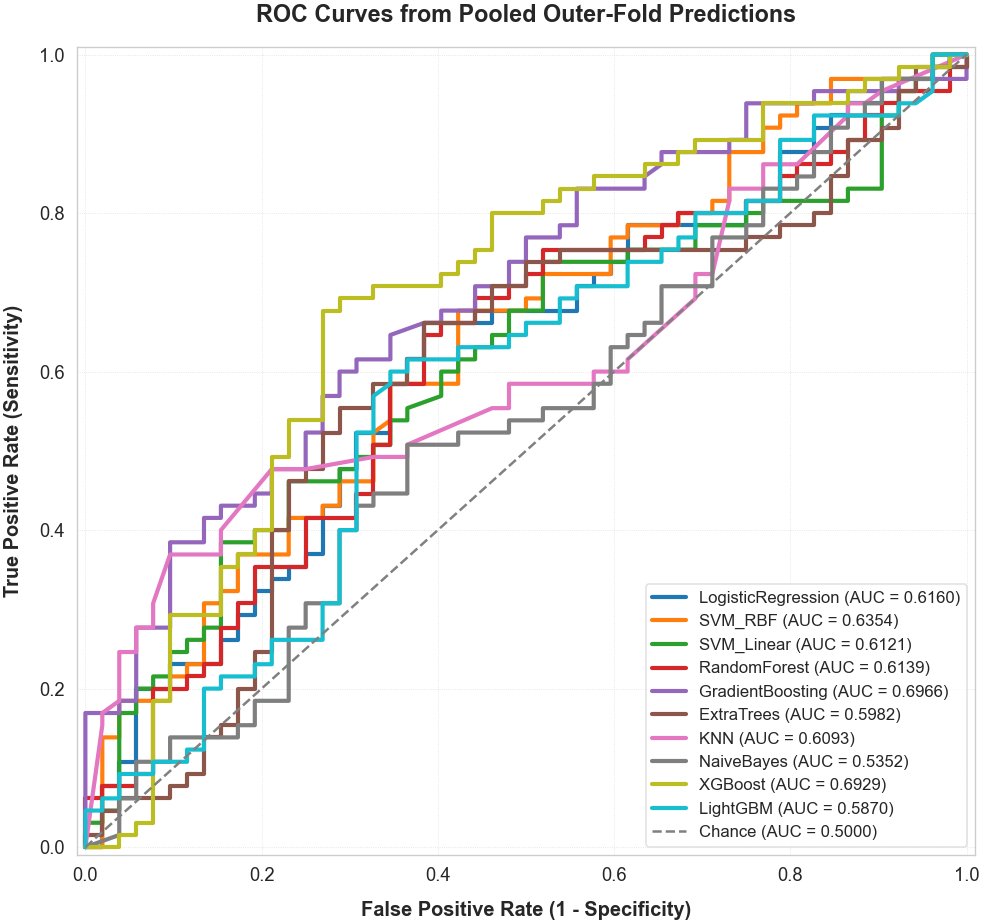


🚀 HIGH-RESOLUTION PLOTS SAVED SUCCESSFULLY:
 🖼️ PNG (DPI 900): nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/roc_curves.png
 📄 PDF (Vector):   nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/roc_curves.pdf


In [62]:
# =============================================================================
# POST-HOC EVALUATION VISUALIZATION: HIGH-RESOLUTION ROC PLOT DESIGN
# =============================================================================
# Purpose:
#   - Aggregate pooled out-of-fold prediction matrices across all core estimators.
#   - Compute exact empirical Receiver Operating Characteristic (ROC) coordinates.
#   - Generate publication-grade, square-proportioned diagnostic curve overlays.
#   - Persist lossless vector PDF sheets and high-density 900 DPI raster matrices.
# =============================================================================



# =============================================================================
# CONSISTENCY CHECK: df_summary vs nested_cv_results
# =============================================================================

check_rows = []

for model_name, res in nested_cv_results.items():
    y_true_chk = np.asarray(res['y_true'])
    y_prob_chk = np.asarray(res['y_prob'])

    if len(np.unique(y_true_chk)) < 2:
        pooled_auc_chk = np.nan
    else:
        pooled_auc_chk = roc_auc_score(y_true_chk, y_prob_chk)

    check_rows.append({
        'Model': model_name,
        'Pooled_AUC_recomputed': pooled_auc_chk,
        'Mean_AUC_recomputed': np.mean(res['fold_aucs'])
    })

df_check = pd.DataFrame(check_rows)

df_compare = df_summary.merge(df_check, on='Model', how='left')
df_compare['Pooled_AUC_diff'] = df_compare['Pooled_AUC'] - df_compare['Pooled_AUC_recomputed']
df_compare['Mean_AUC_diff'] = df_compare['Mean_AUC'] - df_compare['Mean_AUC_recomputed']

print(df_compare[['Model', 'Mean_AUC', 'Mean_AUC_recomputed', 'Mean_AUC_diff',
                  'Pooled_AUC', 'Pooled_AUC_recomputed', 'Pooled_AUC_diff']])

if (
    df_compare['Mean_AUC_diff'].abs().max() > 1e-8
    or df_compare['Pooled_AUC_diff'].abs().max() > 1e-8
):
    raise ValueError(
        "df_summary and nested_cv_results are inconsistent. "
        "Restart kernel and rerun cells sequentially from data loading through nested CV."
    )



import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# Dynamic asset extraction directory synchronization
PLOT_DIR = ACTIVE_SAVE_DIR
os.makedirs(PLOT_DIR, exist_ok=True)

# Establish rigorous square geometry aspect configurations optimized for ROC tracking
plt.figure(figsize=(8.5, 8))

# Sequential functional mapping loop navigating through validated cohort predictions
for model_name, results in nested_cv_results.items():
    y_true = np.asarray(results['y_true'])
    y_prob = np.asarray(results['y_prob'])

    # Runtime exception safeguard to filter out unconverged or singular label arrays
    if len(np.unique(y_true)) < 2:
        print(f"Skipping ROC for {model_name}: only one class present in y_true.")
        continue

    fpr, tpr, _ = roc_curve(y_true, y_prob)
    auc_val = roc_auc_score(y_true, y_prob)

    # Render presentation-ready continuous curves using appropriate lineweights
    plt.plot(fpr, tpr, lw=2.5, label=f"{model_name} (AUC = {auc_val:.4f})")

# Construct baseline random distribution benchmark (Chance Line)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', lw=1.5, label='Chance (AUC = 0.5000)')

# Rigorous layout margin boundary setting
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])

plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=12, fontweight='bold', labelpad=10)
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=12, fontweight='bold', labelpad=10)
plt.title('ROC Curves from Pooled Outer-Fold Predictions', fontsize=14, fontweight='bold', pad=15)

# Configure advanced legend to bypass asset collision while securing strict contrast margins
plt.legend(loc='lower right', fontsize=10, frameon=True, facecolor='white', edgecolor='gainsboro')
plt.grid(True, linestyle=':', alpha=0.6)
plt.tight_layout()

# Absolute multi-format storage target compilation
roc_png = os.path.join(PLOT_DIR, 'roc_curves.png')
roc_pdf = os.path.join(PLOT_DIR, 'roc_curves.pdf')

# Execute dual persistence strategy (DPI 900 Raster + Resolution-Invariant Vector)
plt.savefig(roc_png, dpi=600, bbox_inches='tight')
plt.savefig(roc_pdf, bbox_inches='tight')
plt.show()
plt.close()

print("\n" + "="*50)
print("🚀 HIGH-RESOLUTION PLOTS SAVED SUCCESSFULLY:")
print("="*50)
print(" 🖼️ PNG (DPI 900):", roc_png)
print(" 📄 PDF (Vector):  ", roc_pdf)
print("="*50)

                Model  Mean_AUC  Mean_AUC_recomputed  Mean_AUC_diff  \
0             XGBoost  0.665404             0.665404            0.0   
1    GradientBoosting  0.655988             0.655988            0.0   
2             SVM_RBF  0.639790             0.639790            0.0   
3          SVM_Linear  0.638300             0.638300            0.0   
4  LogisticRegression  0.633684             0.633684            0.0   
5          ExtraTrees  0.628698             0.628698            0.0   
6                 KNN  0.610042             0.610042            0.0   
7        RandomForest  0.599562             0.599562            0.0   
8            LightGBM  0.561752             0.561752            0.0   
9          NaiveBayes  0.519785             0.519785            0.0   

   Pooled_AUC  Pooled_AUC_recomputed  Pooled_AUC_diff  
0    0.692899               0.692899              0.0  
1    0.696598               0.696598              0.0  
2    0.635355               0.635355              

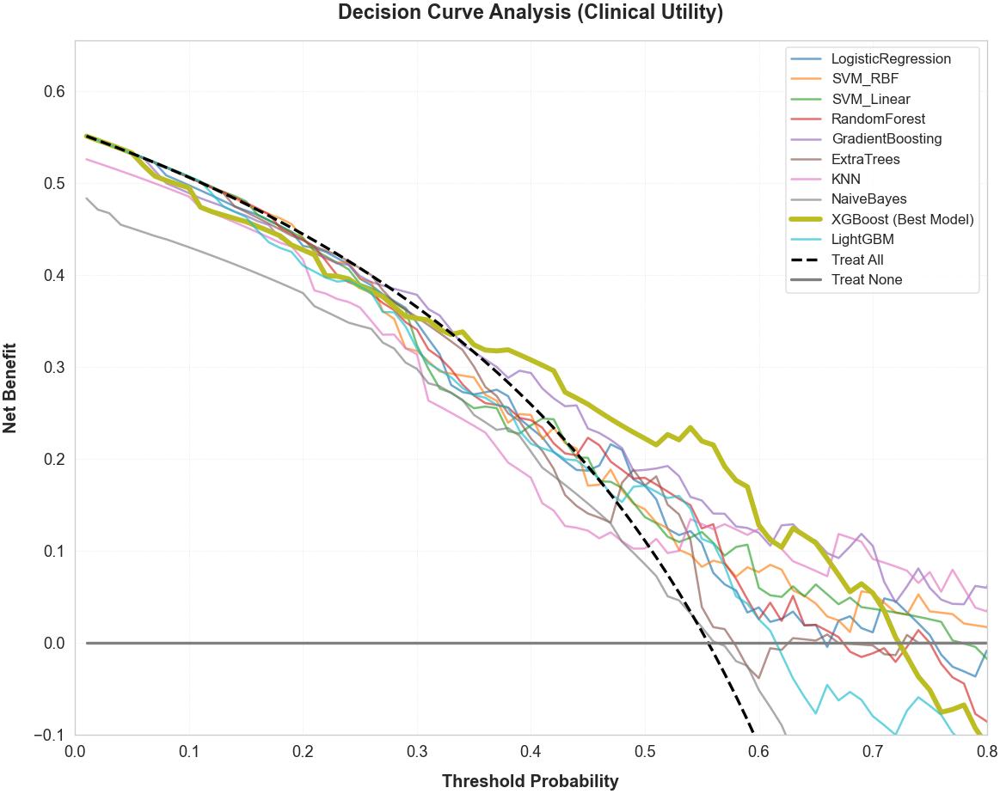


🚀 HIGH-RESOLUTION DCA PLOTS SAVED:
 🖼️ PNG (DPI 900): nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/decision_curve.png
 📄 PDF (Vector):   nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/decision_curve.pdf


In [63]:
# =============================================================================
# POST-HOC EVALUATION VISUALIZATION: HIGH-RESOLUTION DECISION CURVE ANALYSIS
# =============================================================================
# Purpose:
#   - Implement mathematical Net Benefit formulations to evaluate clinical utility.
#   - Contrast dynamic machine learning model configurations against baseline clinical 
#     benchmarks ("Treat All" and "Treat None" strategies).
#   - Dynamically scale line-weights to automatically highlight the champion model.
#   - Save presentation-grade raster PNGs (900 DPI) and vector PDFs.
# =============================================================================

# =============================================================================
# CONSISTENCY CHECK BEFORE DCA
# =============================================================================
from sklearn.metrics import roc_auc_score

check_rows = []

for model_name, res in nested_cv_results.items():
    y_true_chk = np.asarray(res['y_true'])
    y_prob_chk = np.asarray(res['y_prob'])

    pooled_auc_chk = roc_auc_score(y_true_chk, y_prob_chk)
    mean_auc_chk = np.mean(res['fold_aucs'])

    check_rows.append({
        'Model': model_name,
        'Mean_AUC_recomputed': mean_auc_chk,
        'Pooled_AUC_recomputed': pooled_auc_chk
    })

df_check = pd.DataFrame(check_rows)

df_compare = df_summary.merge(df_check, on='Model', how='left')
df_compare['Mean_AUC_diff'] = df_compare['Mean_AUC'] - df_compare['Mean_AUC_recomputed']
df_compare['Pooled_AUC_diff'] = df_compare['Pooled_AUC'] - df_compare['Pooled_AUC_recomputed']

print(df_compare[['Model', 'Mean_AUC', 'Mean_AUC_recomputed', 'Mean_AUC_diff',
                  'Pooled_AUC', 'Pooled_AUC_recomputed', 'Pooled_AUC_diff']])

if (
    df_compare['Mean_AUC_diff'].abs().max() > 1e-8
    or df_compare['Pooled_AUC_diff'].abs().max() > 1e-8
):
    raise ValueError(
        "df_summary and nested_cv_results are inconsistent. "
        "Restart kernel and rerun all cells sequentially from data loading to nested CV."
    )


import os
import numpy as np
import matplotlib.pyplot as plt

def decision_curve_net_benefit(y_true, y_prob, thresholds):
    """Computes empirical Net Benefit criteria for specified decision thresholds."""
    y_true = np.asarray(y_true)
    y_prob = np.asarray(y_prob)
    n = len(y_true)

    net_benefits = []
    for pt in thresholds:
        if pt <= 0 or pt >= 1:
            net_benefits.append(np.nan)
            continue

        y_pred = (y_prob >= pt).astype(int)

        tp = np.sum((y_pred == 1) & (y_true == 1))
        fp = np.sum((y_pred == 1) & (y_true == 0))

        nb = (tp / n) - (fp / n) * (pt / (1 - pt))
        net_benefits.append(nb)

    return np.asarray(net_benefits)


def treat_all_net_benefit(y_true, thresholds):
    """Computes standard reference baseline Net Benefit assuming all patients are treated."""
    y_true = np.asarray(y_true)
    n = len(y_true)
    prevalence = np.mean(y_true)

    net_benefits = []
    for pt in thresholds:
        if pt <= 0 or pt >= 1:
            net_benefits.append(np.nan)
            continue
        nb = prevalence - (1 - prevalence) * (pt / (1 - pt))
        net_benefits.append(nb)

    return np.asarray(net_benefits)


# --- 1. Automated Output Destination Synchronization -------------------------
PLOT_DIR = ACTIVE_SAVE_DIR
os.makedirs(PLOT_DIR, exist_ok=True)

# --- 2. Dynamic Champion Model Verification Sequence -------------------------
if 'df_summary' in locals() or 'df_summary' in globals():
    best_model_name = df_summary.iloc[0]['Model']
else:
    best_model_name = list(nested_cv_results.keys())[0]

print(f"📈 Generating DCA. Best model '{best_model_name}' will be highlighted.")

thresholds = np.linspace(0.01, 0.99, 99)
plt.figure(figsize=(10, 8))

# Initialize baseline clinical markers relying on the primary validation array
first_model = next(iter(nested_cv_results.keys()))
reference_y_true = np.asarray(nested_cv_results[first_model]['y_true'])
prevalence = np.mean(reference_y_true)

# --- 3. Dynamic Sequential Curve Plotting ------------------------------------
for model_name, results in nested_cv_results.items():
    y_true = np.asarray(results['y_true'])
    y_prob = np.asarray(results['y_prob'])


    output_types = set(
        results.get(
            "prediction_output_types",
            ["unknown"]
        )
    )

    if output_types != {"probability"}:
        print(
            f"Skipping DCA for {model_name}: "
            f"stored outputs are {sorted(output_types)}, not probabilities."
        )
        continue

    if not np.all(np.isfinite(y_prob)):
        print(
            f"Skipping DCA for {model_name}: "
            "y_prob contains NaN or infinite values."
        )
        continue

    if np.any((y_prob < 0) | (y_prob > 1)):
        print(
            f"Skipping DCA for {model_name}: "
            f"values are outside [0, 1]. "
            f"Range=[{y_prob.min():.4f}, {y_prob.max():.4f}]"
        )
        continue


    # Runtime exception safeguard to filter out unconverged or singular label arrays
    if len(np.unique(y_true)) < 2:
        print(f"Skipping DCA for {model_name}: only one class present in y_true.")
        continue

    # Dynamically optimize lineweights to highlight the top-performing candidate
    if model_name == best_model_name:
        lw = 3.5
        alpha = 1.0
        label_str = f"{model_name} (Best Model)"
    else:
        lw = 1.5
        alpha = 0.65
        label_str = model_name
    
    nb_model = decision_curve_net_benefit(y_true, y_prob, thresholds)
    plt.plot(thresholds, nb_model, lw=lw, alpha=alpha, label=label_str)

# --- 4. Clinical Reference Baseline Integration ------------------------------
nb_all = treat_all_net_benefit(reference_y_true, thresholds)
nb_none = np.zeros_like(thresholds)

plt.plot(thresholds, nb_all, linestyle='--', color='black', lw=2, label='Treat All')
plt.plot(thresholds, nb_none, linestyle='-', color='gray', lw=2, label='Treat None')

# Enforce strict medical research layout configuration standards
plt.xlim([0.0, 0.8]) 
plt.ylim([-0.1, max(prevalence + 0.1, 0.5)]) 

plt.xlabel('Threshold Probability', fontsize=12, fontweight='bold', labelpad=10)
plt.ylabel('Net Benefit', fontsize=12, fontweight='bold', labelpad=10)
plt.title('Decision Curve Analysis (Clinical Utility)', fontsize=14, fontweight='bold', pad=15)

# Configure advanced legend matrices for optimal publication clarity
plt.legend(loc='upper right', fontsize=10, frameon=True, facecolor='white', edgecolor='gainsboro')
plt.grid(True, linestyle=':', alpha=0.5)
plt.tight_layout()

# Absolute file path routing
dca_png = os.path.join(PLOT_DIR, 'decision_curve.png')
dca_pdf = os.path.join(PLOT_DIR, 'decision_curve.pdf')

# Execute dual persistence strategy (900 DPI Raster + Resolution-Invariant Vector)
plt.savefig(dca_png, dpi=600, bbox_inches='tight')
plt.savefig(dca_pdf, bbox_inches='tight')
plt.show()
plt.close()

print("\n" + "="*50)
print("🚀 HIGH-RESOLUTION DCA PLOTS SAVED:")
print("="*50)
print(" 🖼️ PNG (DPI 900):", dca_png)
print(" 📄 PDF (Vector):  ", dca_pdf)
print("="*50)




🔎 Calibration consistency check:
                Model  Mean_AUC  Mean_AUC_recomputed  Mean_AUC_diff  \
0             XGBoost  0.665404             0.665404            0.0   
1    GradientBoosting  0.655988             0.655988            0.0   
2             SVM_RBF  0.639790             0.639790            0.0   
3          SVM_Linear  0.638300             0.638300            0.0   
4  LogisticRegression  0.633684             0.633684            0.0   
5          ExtraTrees  0.628698             0.628698            0.0   
6                 KNN  0.610042             0.610042            0.0   
7        RandomForest  0.599562             0.599562            0.0   
8            LightGBM  0.561752             0.561752            0.0   
9          NaiveBayes  0.519785             0.519785            0.0   

   Pooled_AUC  Pooled_AUC_recomputed  Pooled_AUC_diff  
0    0.692899               0.692899              0.0  
1    0.696598               0.696598              0.0  
2    0.635355   

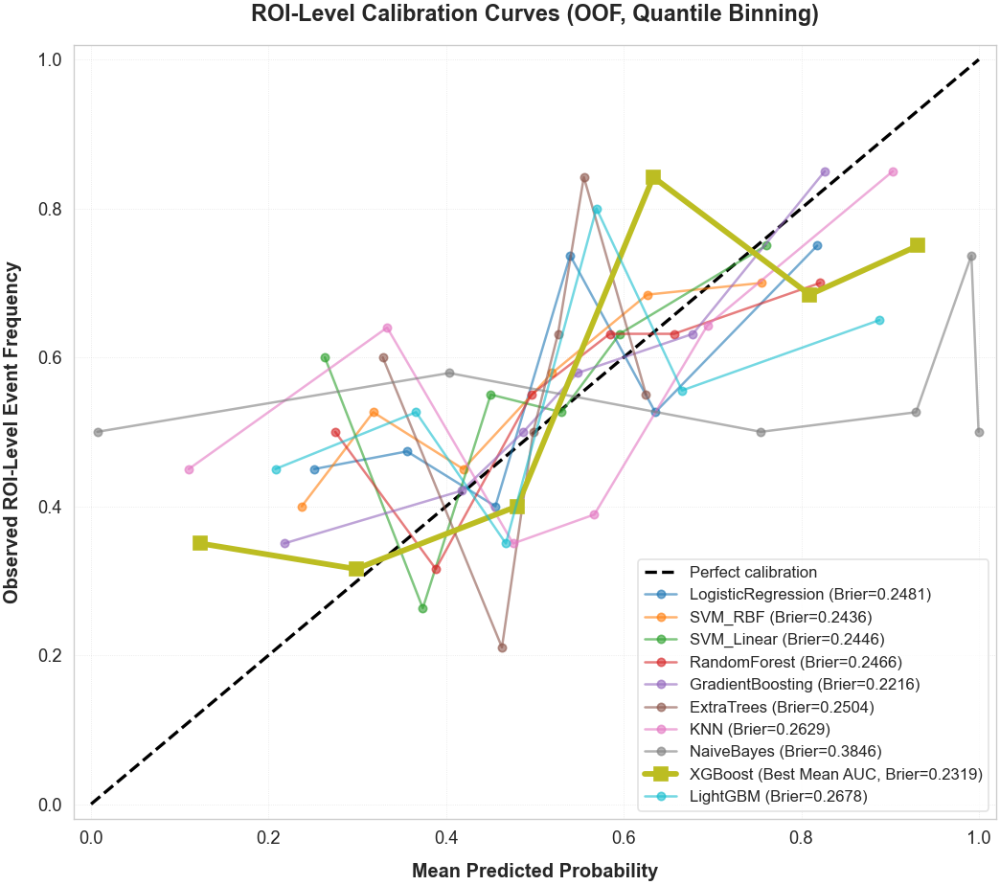


🚀 HIGH-RESOLUTION CALIBRATION PLOTS SAVED:
 🖼️ PNG (DPI 900): nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/calibration_curves.png
 📄 PDF (Vector):   nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/calibration_curves.pdf


In [64]:
# =============================================================================
# POST-HOC EVALUATION VISUALIZATION: HIGH-RESOLUTION CALIBRATION CURVES
# =============================================================================
# Purpose:
#   - Compute exact empirical calibration curves (reliability diagrams) across 
#     all model configurations using quantile binning strategies.
#   - Quantify global calibration performance via Brier Score Loss calculations.
#   - Dynamically highlight the top-performing candidate model using customized 
#     markers, markersizes, and dominant lineweights.
#   - Save production-grade raster PNGs (900 DPI) and vector PDFs.
# =============================================================================

import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve
from sklearn.metrics import brier_score_loss
import pandas as pd
import matplotlib.pyplot as plt

# --- 1. Automated Output Destination Synchronization -------------------------
PLOT_DIR = ACTIVE_SAVE_DIR
os.makedirs(PLOT_DIR, exist_ok=True)

# --- 2. Dynamic Champion Model Verification Sequence -------------------------
if 'df_summary' in locals() or 'df_summary' in globals():
    df_summary = df_summary.sort_values('Mean_AUC', ascending=False).reset_index(drop=True)
    best_model_name = df_summary.iloc[0]['Model']
else:
    best_model_name = list(nested_cv_results.keys())[0]
    

from sklearn.metrics import roc_auc_score

check_rows = []

for model_name, res in nested_cv_results.items():
    y_true_chk = np.asarray(res['y_true'])
    y_prob_chk = np.asarray(res['y_prob'])

    check_rows.append({
        'Model': model_name,
        'Mean_AUC_recomputed': np.mean(res['fold_aucs']),
        'Pooled_AUC_recomputed': roc_auc_score(y_true_chk, y_prob_chk)
    })

df_check = pd.DataFrame(check_rows)

if 'df_summary' in locals() or 'df_summary' in globals():
    df_compare = df_summary.merge(df_check, on='Model', how='left')
    df_compare['Mean_AUC_diff'] = df_compare['Mean_AUC'] - df_compare['Mean_AUC_recomputed']
    df_compare['Pooled_AUC_diff'] = df_compare['Pooled_AUC'] - df_compare['Pooled_AUC_recomputed']

    print("\n🔎 Calibration consistency check:")
    print(df_compare[['Model', 'Mean_AUC', 'Mean_AUC_recomputed', 'Mean_AUC_diff',
                      'Pooled_AUC', 'Pooled_AUC_recomputed', 'Pooled_AUC_diff']])

    if (
        df_compare['Mean_AUC_diff'].abs().max() > 1e-8
        or df_compare['Pooled_AUC_diff'].abs().max() > 1e-8
    ):
        raise ValueError(
            "df_summary and nested_cv_results are inconsistent. "
            "Restart kernel and rerun all cells sequentially from data loading to nested CV."
        )
    

print(f"📊 Generating Calibration Curves. Best model '{best_model_name}' will be highlighted.")

# n_bins = 10  # Standard clinical deciles of risk distribution
# n_bins_model = min(
#     6,
#     max(3, len(y_true) // 15)
# )

plt.figure(figsize=(9, 8))

# Reference baseline for a theoretically perfect diagnostic model (Perfect Calibration)
plt.plot([0, 1], [0, 1], linestyle='--', color='black', lw=2, label='Perfect calibration')

# -------------------------------------------------------------------------
# ROI-level calibration analysis
# PatientID is used only for grouped CV and is not used for aggregation.
# Different ROIs of one patient may have different true labels.
# -------------------------------------------------------------------------
for model_name, results in nested_cv_results.items():

    y_true = np.asarray(
        results["y_true"],
        dtype=int
    )

    y_prob = np.asarray(
        results["y_prob"],
        dtype=float
    )

    # ---------------------------------------------------------------------
    # Calibration requires genuine probabilities, not decision scores
    # ---------------------------------------------------------------------
    output_types = set(
        results.get(
            "prediction_output_types",
            ["unknown"]
        )
    )

    if output_types != {"probability"}:
        print(
            f"Skipping calibration for {model_name}: "
            f"stored outputs are {sorted(output_types)}, "
            "not probabilities."
        )
        continue

    # ---------------------------------------------------------------------
    # Basic integrity checks
    # ---------------------------------------------------------------------
    if len(y_true) != len(y_prob):
        raise ValueError(
            f"{model_name}: y_true and y_prob "
            "have different lengths."
        )

    if len(np.unique(y_true)) < 2:
        print(
            f"Skipping calibration for {model_name}: "
            "only one class is present."
        )
        continue

    if not np.all(np.isfinite(y_prob)):
        raise ValueError(
            f"{model_name}: y_prob contains "
            "NaN or infinite values."
        )

    if np.any((y_prob < 0) | (y_prob > 1)):
        raise ValueError(
            f"{model_name}: y_prob contains values "
            "outside [0, 1]. "
            f"Range=[{y_prob.min():.4f}, "
            f"{y_prob.max():.4f}]"
        )

    # ---------------------------------------------------------------------
    # Dynamic quantile bins based on number of ROI observations
    # ---------------------------------------------------------------------
    n_bins_model = min(
        6,
        max(3, len(y_true) // 15)
    )

    try:
        frac_pos, mean_pred = calibration_curve(
            y_true,
            y_prob,
            n_bins=n_bins_model,
            strategy="quantile"
        )

        brier = brier_score_loss(
            y_true,
            y_prob
        )

        # -----------------------------------------------------------------
        # Plot configuration
        # -----------------------------------------------------------------
        if model_name == best_model_name:
            lw = 3.5
            alpha = 1.0
            marker = "s"
            ms = 8

            label_str = (
                f"{model_name} "
                f"(Best Mean AUC, Brier={brier:.4f})"
            )
        else:
            lw = 1.5
            alpha = 0.6
            marker = "o"
            ms = 5

            label_str = (
                f"{model_name} "
                f"(Brier={brier:.4f})"
            )

        plt.plot(
            mean_pred,
            frac_pos,
            marker=marker,
            markersize=ms,
            linewidth=lw,
            alpha=alpha,
            label=label_str
        )

        print(
            f"{model_name}: "
            f"{len(y_true)} ROI-level OOF predictions | "
            f"requested bins={n_bins_model} | "
            f"returned bins={len(frac_pos)} | "
            f"Brier={brier:.4f}"
        )

    except Exception as e:
        print(
            f"  Skipping calibration for "
            f"{model_name}: {e}"
        )
        

plt.xlim([-0.02, 1.02])
plt.ylim([-0.02, 1.02])

plt.xlabel('Mean Predicted Probability', fontsize=12, fontweight='bold', labelpad=10)
plt.ylabel(
    "Observed ROI-Level Event Frequency",
    fontsize=12,
    fontweight="bold",
    labelpad=10
)
plt.title(
    "ROI-Level Calibration Curves (OOF, Quantile Binning)",
    fontsize=14,
    fontweight="bold",
    pad=15
)

# Configure advanced legend matrices for optimal publication clarity
plt.legend(loc='lower right', fontsize=10, frameon=True, facecolor='white', edgecolor='gainsboro')
plt.grid(True, linestyle=':', alpha=0.5)
plt.tight_layout()

# Absolute file path routing
cal_png = os.path.join(PLOT_DIR, 'calibration_curves.png')
cal_pdf = os.path.join(PLOT_DIR, 'calibration_curves.pdf')

# Execute dual persistence strategy (900 DPI Raster + Resolution-Invariant Vector)
plt.savefig(cal_png, dpi=600, bbox_inches='tight')
plt.savefig(cal_pdf, bbox_inches='tight')
plt.show()
plt.close()

print("\n" + "="*50)
print("🚀 HIGH-RESOLUTION CALIBRATION PLOTS SAVED:")
print("="*50)
print(" 🖼️ PNG (DPI 900):", cal_png)
print(" 📄 PDF (Vector):  ", cal_pdf)
print("="*50)

In [65]:
# =============================================================================
# COHORT ARTIFACT PERSISTENCE AND CROSS-MODEL EVALUATION EXTRACTOR
# =============================================================================
# Purpose:
#   - Atomically validate array distributions and nomenclature consistency.
#   - Export isolated vector matrices (ROC, PR-Curve, Confusion Matrices) 
#     separately for each individual model topology in the execution memory.
#   - Compute stratified descriptive macro-parameters (mean, std, min, max, pooled).
#   - Persist cross-model evaluation rankings to secure tabular outputs.
# =============================================================================

import os
import json
import warnings
import numpy as np
import pandas as pd

from sklearn.metrics import (
    roc_curve, auc,
    precision_recall_curve, average_precision_score,
    confusion_matrix, classification_report,
    accuracy_score, f1_score, precision_score, recall_score,
    balanced_accuracy_score
)

# -----------------------------------------------------------------------------
# 1. COMPONSATIONAL VALIDATION AND DATA ALIGNMENT UTILITY FUNCTIONS
# -----------------------------------------------------------------------------

def safe_array(x):
    """Converts upstream iterable objects cleanly into 1D contiguous NumPy arrays."""
    if x is None:
        return np.array([])
    return np.asarray(x).ravel()


def safe_metric_stats(values):
    """Computes robust descriptive parameters for localized fold evaluation records.

    Safeguards downstream IO processes from crashing when encountered with empty 
    or incomplete cross-validation tracks by adaptively embedding NaN limits.
    """
    if values is None:
        return np.nan, np.nan, np.nan, np.nan
    
    values = np.asarray(values, dtype=float)
    if values.size == 0:
        return np.nan, np.nan, np.nan, np.nan
    
    return (
        float(np.mean(values)),
        float(np.std(values)),
        float(np.min(values)),
        float(np.max(values))
    )


def get_optional_metric(results, key, model_name=None):
    """Safely extracts supplementary non-mandatory metrics from execution arrays."""
    if key not in results or results[key] is None or len(results[key]) == 0:
        warnings.warn(
            f"[{model_name}] Optional metric '{key}' not found in results. "
            f"Summary values will be saved as NaN."
        )
        return []
    return results[key]


def validate_required_keys(results, required_keys, model_name="unknown_model"):
    """Enforces rigid metadata verification to protect analytical structural integrity."""
    missing = [k for k in required_keys if k not in results]
    if missing:
        raise ValueError(
            f"Model '{model_name}' is missing required keys in results: {missing}"
        )


# -----------------------------------------------------------------------------
# 2. CORE SERIALIZATION ENGINE FOR ARTIFACT GENERATION
# -----------------------------------------------------------------------------
def save_model_data(model_name, results, base_dir='plot_data'):
    """Atomically exports performance plots, vector logs, and meta-logs for a model.

    Args:
        model_name (str): Matching token matching the target estimator signature.
        results (dict): Log tracking historical prediction matrices and fold outputs.
        base_dir (str): Relative destination path defining asset storage boundaries.

    Returns:
        dict: Flattened composite mapping consisting of pooled indices and fold statistics.
    """
    required_keys = [
        'y_true', 'y_prob', 'y_pred',
        'fold_aucs', 'fold_accuracies',
        'fold_f1_scores', 'fold_precisions', 'fold_recalls',
        'n_features_per_fold'
    ]
    validate_required_keys(results, required_keys, model_name)

    model_dir = os.path.join(base_dir, model_name)
    os.makedirs(model_dir, exist_ok=True)

    y_true = safe_array(results['y_true'])
    y_prob = safe_array(results['y_prob'])
    y_pred = safe_array(results['y_pred'])

    if len(y_true) == 0:
        raise ValueError(f"Model '{model_name}' has empty y_true.")
    if not (len(y_true) == len(y_prob) == len(y_pred)):
        raise ValueError(
            f"Model '{model_name}' has inconsistent lengths: "
            f"len(y_true)={len(y_true)}, len(y_prob)={len(y_prob)}, len(y_pred)={len(y_pred)}"
        )

    # Ingest complementary auxiliary fold sequences
    fold_pr_aucs = get_optional_metric(results, 'fold_pr_aucs', model_name=model_name)
    fold_bal_accuracies = get_optional_metric(results, 'fold_bal_accuracies', model_name=model_name)

    # ─── 1. Receiver Operating Characteristic (ROC) Coordinate Curves ───
    fpr, tpr, thresholds_roc = roc_curve(y_true, y_prob)
    roc_auc = auc(fpr, tpr)

    roc_df = pd.DataFrame({
        'fpr': fpr,
        'tpr': tpr
    })
    roc_df['threshold'] = np.nan
    roc_df.iloc[:len(thresholds_roc), roc_df.columns.get_loc('threshold')] = thresholds_roc
    roc_df.to_csv(os.path.join(model_dir, 'roc_curve.csv'), index=False)

    # ─── 2. Precision-Recall (PR) Continuous Curve Values ───
    precision_curve, recall_curve, thresholds_pr = precision_recall_curve(y_true, y_prob)
    ap_score = average_precision_score(y_true, y_prob)

    pr_df = pd.DataFrame({
        'precision': precision_curve,
        'recall': recall_curve
    })
    pr_df['threshold'] = np.nan
    pr_df.iloc[:len(thresholds_pr), pr_df.columns.get_loc('threshold')] = thresholds_pr
    pr_df.to_csv(os.path.join(model_dir, 'pr_curve.csv'), index=False)

    # ─── 3. Invariant State Confusion Matrices ───
    cm = confusion_matrix(y_true, y_pred)
    cm_df = pd.DataFrame(
        cm,
        index=['Actual_0', 'Actual_1'],
        columns=['Predicted_0', 'Predicted_1']
    )
    cm_df.to_csv(os.path.join(model_dir, 'confusion_matrix.csv'))

    # ─── 4. Pooled Prediction Tracking Profiles ───
    pooled_df = pd.DataFrame({
        'y_true': y_true,
        'y_prob': y_prob,
        'y_pred': y_pred
    })
    pooled_df.to_csv(os.path.join(model_dir, 'pooled_predictions.csv'), index=False)

    # ─── 5. High-Fidelity Categorization Reports (JSON Manifest) ───
    report = classification_report(y_true, y_pred, output_dict=True)
    report['roc_auc'] = float(roc_auc)
    report['average_precision'] = float(ap_score)
    report['balanced_accuracy'] = float(balanced_accuracy_score(y_true, y_pred))

    with open(os.path.join(model_dir, 'classification_report.json'), 'w') as f:
        json.dump(report, f, indent=2)

    # ─── 6. Structural Longitudinal Fold Progress Matrix ───
    n_folds = len(results['fold_aucs'])

    fold_data = {
        'fold': list(range(1, n_folds + 1)),
        'auc': list(results['fold_aucs']),
        'pr_auc': list(fold_pr_aucs) if len(fold_pr_aucs) == n_folds else [np.nan] * n_folds,
        'accuracy': list(results['fold_accuracies']),
        'bal_accuracy': list(fold_bal_accuracies) if len(fold_bal_accuracies) == n_folds else [np.nan] * n_folds,
        'f1_score': list(results['fold_f1_scores']),
        'precision': list(results['fold_precisions']),
        'recall': list(results['fold_recalls']),
        'n_features': list(results['n_features_per_fold']),
    }

    fold_df = pd.DataFrame(fold_data)
    fold_df.to_csv(os.path.join(model_dir, 'per_fold_metrics.csv'), index=False)

    # ─── 7. Optimal Dynamic Hyperparameter Log Maps ───
    if results.get('best_params_per_fold') is not None and len(results.get('best_params_per_fold')) > 0:
        params_df = pd.DataFrame(results['best_params_per_fold'])
        params_df.insert(0, 'fold', range(1, len(params_df) + 1))
        params_df.to_csv(os.path.join(model_dir, 'best_params_per_fold.csv'), index=False)

    # ─── 8. Summary Statistics Tabular Matrix Construction ───
    auc_mean, auc_std, auc_min, auc_max = safe_metric_stats(results['fold_aucs'])
    pr_mean, pr_std, pr_min, pr_max = safe_metric_stats(fold_pr_aucs)
    acc_mean, acc_std, acc_min, acc_max = safe_metric_stats(results['fold_accuracies'])
    bal_mean, bal_std, bal_min, bal_max = safe_metric_stats(fold_bal_accuracies)
    f1_mean, f1_std, f1_min, f1_max = safe_metric_stats(results['fold_f1_scores'])
    prec_mean, prec_std, prec_min, prec_max = safe_metric_stats(results['fold_precisions'])
    rec_mean, rec_std, rec_min, rec_max = safe_metric_stats(results['fold_recalls'])

    summary = {
        'metric': ['AUC', 'PR_AUC', 'Accuracy', 'Bal_Accuracy', 'F1_Score', 'Precision', 'Recall'],
        'mean':   [auc_mean, pr_mean, acc_mean, bal_mean, f1_mean, prec_mean, rec_mean],
        'std':    [auc_std,  pr_std, acc_std, bal_std, f1_std, prec_std, rec_std],
        'min':    [auc_min,  pr_min, acc_min, bal_min, f1_min, prec_min, rec_min],
        'max':    [auc_max,  pr_max, acc_max, bal_max, f1_max, prec_max, rec_max],
        'pooled': [
            float(roc_auc),
            float(ap_score),  # Maps pooled PR-AUC / Average Precision criteria
            float(accuracy_score(y_true, y_pred)),
            float(balanced_accuracy_score(y_true, y_pred)),
            float(f1_score(y_true, y_pred)),
            float(precision_score(y_true, y_pred, zero_division=0)),
            float(recall_score(y_true, y_pred, zero_division=0)),
        ]
    }

    summary_df = pd.DataFrame(summary)
    summary_df.to_csv(os.path.join(model_dir, 'summary_statistics.csv'), index=False)

    return {
        'pooled_auc': float(roc_auc),
        'pooled_pr_auc': float(ap_score),
        'pooled_accuracy': float(accuracy_score(y_true, y_pred)),
        'pooled_bal_accuracy': float(balanced_accuracy_score(y_true, y_pred)),
        'pooled_f1': float(f1_score(y_true, y_pred)),
        'pooled_precision': float(precision_score(y_true, y_pred, zero_division=0)),
        'pooled_recall': float(recall_score(y_true, y_pred, zero_division=0)),
        'n_samples': int(len(y_true)),
        'n_folds': int(n_folds),
        'fold_auc_mean': auc_mean,
        'fold_auc_std': auc_std,
        'fold_pr_auc_mean': pr_mean,
        'fold_pr_auc_std': pr_std,
        'fold_accuracy_mean': acc_mean,
        'fold_accuracy_std': acc_std,
        'fold_bal_accuracy_mean': bal_mean,
        'fold_bal_accuracy_std': bal_std,
        'fold_f1_mean': f1_mean,
        'fold_f1_std': f1_std,
        'fold_precision_mean': prec_mean,
        'fold_precision_std': prec_std,
        'fold_recall_mean': rec_mean,
        'fold_recall_std': rec_std,
    }


# -----------------------------------------------------------------------------
# 3. GLOBAL ROUTING PIPELINE SEQUENCE: SYSTEM OVERVIEW LOGGING
# -----------------------------------------------------------------------------
base_dir = os.path.join(ACTIVE_SAVE_DIR, "plot_data")
os.makedirs(base_dir, exist_ok=True)

print("=" * 70)
print("📦 Saving data for all models...")
print("=" * 70)

all_models_summary = []

for model_name, results in nested_cv_results.items():
    try:
        if 'y_true' not in results or len(results['y_true']) == 0:
            print(f"   {model_name}: No data found, skipping...")
            continue

        model_summary = save_model_data(model_name, results, base_dir)

        all_models_summary.append({
            'model': model_name,
            'mean_auc': model_summary['fold_auc_mean'],
            'std_auc': model_summary['fold_auc_std'],
            'pooled_auc': model_summary['pooled_auc'],
            'mean_pr_auc': model_summary['fold_pr_auc_mean'],
            'std_pr_auc': model_summary['fold_pr_auc_std'],
            'pooled_pr_auc': model_summary['pooled_pr_auc'],
            'mean_accuracy': model_summary['fold_accuracy_mean'],
            'std_accuracy': model_summary['fold_accuracy_std'],
            'pooled_accuracy': model_summary['pooled_accuracy'],
            'mean_bal_accuracy': model_summary['fold_bal_accuracy_mean'],
            'std_bal_accuracy': model_summary['fold_bal_accuracy_std'],
            'pooled_bal_accuracy': model_summary['pooled_bal_accuracy'],
            'mean_f1': model_summary['fold_f1_mean'],
            'std_f1': model_summary['fold_f1_std'],
            'pooled_f1': model_summary['pooled_f1'],
            'mean_precision': model_summary['fold_precision_mean'],
            'std_precision': model_summary['fold_precision_std'],
            'pooled_precision': model_summary['pooled_precision'],
            'mean_recall': model_summary['fold_recall_mean'],
            'std_recall': model_summary['fold_recall_std'],
            'pooled_recall': model_summary['pooled_recall'],
            'n_samples': model_summary['n_samples'],
            'n_folds': model_summary['n_folds'],
        })

        print(
            f"   {model_name:25s} | "
            f"Pooled AUC={model_summary['pooled_auc']:.4f} | "
            f"Pooled PR-AUC={model_summary['pooled_pr_auc']:.4f} | "
            f"{model_summary['n_samples']} samples | "
            f"{model_summary['n_folds']} folds"
        )

    except Exception as e:
        print(f"     {model_name}: Failed -> {e}")


# -----------------------------------------------------------------------------
# 4. CROSS-MODEL TABULAR RANKING MATRIX EVALUATION
# -----------------------------------------------------------------------------
comparison_dir = os.path.join(base_dir, 'comparison')
os.makedirs(comparison_dir, exist_ok=True)

summary_all_df = pd.DataFrame(all_models_summary)

if len(summary_all_df) > 0:
    summary_all_df = summary_all_df.sort_values('mean_auc', ascending=False).reset_index(drop=True)
    summary_all_df.to_csv(os.path.join(comparison_dir, 'all_models_summary.csv'), index=False)

print("=" * 70)
print(f"Done! {len(all_models_summary)} models saved.")
print(f"📁 Output directory: {os.path.abspath(base_dir)}")
print("=" * 70)

# --- Dynamic Directory Verification Sequence ---------------------------------
print("\n📂 Directory structure:")
for item_name in sorted(os.listdir(base_dir)):
    item_path = os.path.join(base_dir, item_name)
    if os.path.isdir(item_path):
        files = os.listdir(item_path)
        print(f"   ├── {item_name}/ ({len(files)} files)")

📦 Saving data for all models...
   LogisticRegression        | Pooled AUC=0.6160 | Pooled PR-AUC=0.6591 | 117 samples | 5 folds


   SVM_RBF                   | Pooled AUC=0.6354 | Pooled PR-AUC=0.6786 | 117 samples | 5 folds
   SVM_Linear                | Pooled AUC=0.6121 | Pooled PR-AUC=0.6796 | 117 samples | 5 folds
   RandomForest              | Pooled AUC=0.6139 | Pooled PR-AUC=0.6701 | 117 samples | 5 folds
   GradientBoosting          | Pooled AUC=0.6966 | Pooled PR-AUC=0.7610 | 117 samples | 5 folds
   ExtraTrees                | Pooled AUC=0.5982 | Pooled PR-AUC=0.6297 | 117 samples | 5 folds
   KNN                       | Pooled AUC=0.6093 | Pooled PR-AUC=0.7065 | 117 samples | 5 folds
   NaiveBayes                | Pooled AUC=0.5352 | Pooled PR-AUC=0.5810 | 117 samples | 5 folds
   XGBoost                   | Pooled AUC=0.6929 | Pooled PR-AUC=0.6793 | 117 samples | 5 folds
   LightGBM                  | Pooled AUC=0.5870 | Pooled PR-AUC=0.6367 | 117 samples | 5 folds
Done! 10 models saved.
📁 Output directory: /Users/mahla/MyDrive/Research/SBU/Dr. Kheradpisheh/ML-Based-Classification-of-Benign-and-Mali

In [66]:
# # =============================================================================
# # RADIOMICS MANIFOLD LEARNING AND HIGH-DIMENSIONAL COHORT CLUSTERING (t-SNE)
# # =============================================================================
# # Purpose:
# #   - Isolate raw numeric multi-modality features from global diagnostic frames.
# #   - Execute non-linear dimensionality reduction utilizing manifold learning (t-SNE).
# #   - Generate presentation-grade, high-resolution diagnostic cluster charts 
# #     evaluating class boundaries (0 vs 1) and intra-patient batch effects.
# # =============================================================================

# import os
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns
# from sklearn.manifold import TSNE
# from sklearn.preprocessing import StandardScaler

# # --- 1. Vector Matrix Isolation and Baseline Extraction ---------------------
# # Filter continuous numeric radiomics parameters dynamically from system memory
# X_numeric = pd.DataFrame(X, columns=feature_names).copy()
# y_labels = np.asarray(y)
# patient_groups = np.asarray(groups)

# print(f"t-SNE input shape: {X_numeric.shape}")
# print(f"Number of labels: {len(y_labels)}")
# print(f"Number of patient groups: {len(patient_groups)}")


# print("⏳ Scaling data and calculating t-SNE (This may take 1-2 minutes)...")

# # --- 2. Invariant Standardization and Feature Rescaling ---------------------
# # Enforce zero-mean and unit-variance scaling to protect optimization algorithms 
# # from dominant dimensional variance artifacts.
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X_numeric)

# # --- 3. Manifold Learning and Low-Dimensional Embedding Space ----------------
# # Compile non-linear high-dimensional topological boundaries into an optimized 
# # 2D coordinate map using t-Distributed Stochastic Neighbor Embedding.
# tsne = TSNE(n_components=2, perplexity=30, random_state=42, max_iter=1000)
# X_tsne = tsne.fit_transform(X_scaled)

# # Assemble lower-dimensional array coordinates into a clean structured tracking DataFrame
# tsne_df = pd.DataFrame({
#     'TSNE_1': X_tsne[:, 0],
#     'TSNE_2': X_tsne[:, 1],
#     'Class': y_labels,
#     'Patient_ID': patient_groups
# })

# # Establish destination directory framework for persistent storage
# os.makedirs('plot_data/Clustering', exist_ok=True)

# # -----------------------------------------------------------------------------
# # GRAPHICAL CHART 1: TARGET PATHOLOGICAL SIGNAL ISOLATION ANALYSIS
# # -----------------------------------------------------------------------------
# plt.figure(figsize=(10, 8))
# sns.scatterplot(
#     x='TSNE_1', y='TSNE_2',
#     hue='Class',
#     palette=['#FF7043', '#00ACC1'],  # Balanced vibrant coral and deep cyan accents
#     data=tsne_df,
#     alpha=0.7,
#     s=60,
#     edgecolor=None
# )
# plt.title("t-SNE Visualization: Separation by Class (0 vs 1)", fontsize=14, pad=15)
# plt.xlabel("t-SNE Dimension 1", fontsize=12)
# plt.ylabel("t-SNE Dimension 2", fontsize=12)
# plt.legend(title='Target Class')
# plt.tight_layout()
# plt.savefig('plot_data/Clustering/tsne_by_class.png', dpi=300)
# plt.close()

# # -----------------------------------------------------------------------------
# # GRAPHICAL CHART 2: INTRA-PATIENT LESION CLUSTERING MATRIX
# # -----------------------------------------------------------------------------
# plt.figure(figsize=(12, 9))
# sns.scatterplot(
#     x='TSNE_1', y='TSNE_2',
#     hue='Patient_ID',
#     palette='tab20',  # Distinct qualitative layout to track discrete subject profiles
#     data=tsne_df,
#     alpha=0.8,
#     s=50,
#     edgecolor='k',
#     linewidth=0.2
# )
# plt.title("t-SNE Visualization: Lesion Clustering by Patient", fontsize=14, pad=15)
# plt.xlabel("t-SNE Dimension 1", fontsize=12)
# plt.ylabel("t-SNE Dimension 2", fontsize=12)

# # Prevent bounding-box metric clipping by projecting the legend externally
# plt.legend(title='Patient ID', bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=2)
# plt.tight_layout()
# plt.savefig('plot_data/Clustering/tsne_by_patient.png', dpi=600)
# plt.close()

# print("t-SNE plots saved successfully in 'plot_data/Clustering/'")

🌟 FINAL XAI PIPELINE: STABLE-FEATURE SHAP ANALYSIS

🔎 Consistency check:
             Model  Mean_AUC  Mean_AUC_recomputed  Mean_AUC_diff  Pooled_AUC  Pooled_AUC_recomputed  Pooled_AUC_diff
           XGBoost  0.665404             0.665404            0.0    0.692899               0.692899              0.0
  GradientBoosting  0.655988             0.655988            0.0    0.696598               0.696598              0.0
           SVM_RBF  0.639790             0.639790            0.0    0.635355               0.635355              0.0
        SVM_Linear  0.638300             0.638300            0.0    0.612130               0.612130              0.0
LogisticRegression  0.633684             0.633684            0.0    0.615976               0.615976              0.0
        ExtraTrees  0.628698             0.628698            0.0    0.598225               0.598225              0.0
               KNN  0.610042             0.610042            0.0    0.609320               0.609320         


SHAP calculation complete.

Top SHAP features:
                                                            Feature_Original                                                            Feature_Sanitized  MeanAbsSHAP  Selection_Count
                              IH_MinimumHistogramGradientGreyLevel_Intensity                               IH_MinimumHistogramGradientGreyLevel_Intensity     0.105863                2
                                                           Morph_Asphericity                                                            Morph_Asphericity     0.088052                4
                                                           GLCM_ClusterShade                                                            GLCM_ClusterShade     0.059953                4
Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist Morph_RadiusSphereNorm_MaxIntensityCoor_PerimeterCoor_2DSagittalSmallestDist     0.059398                2
                                

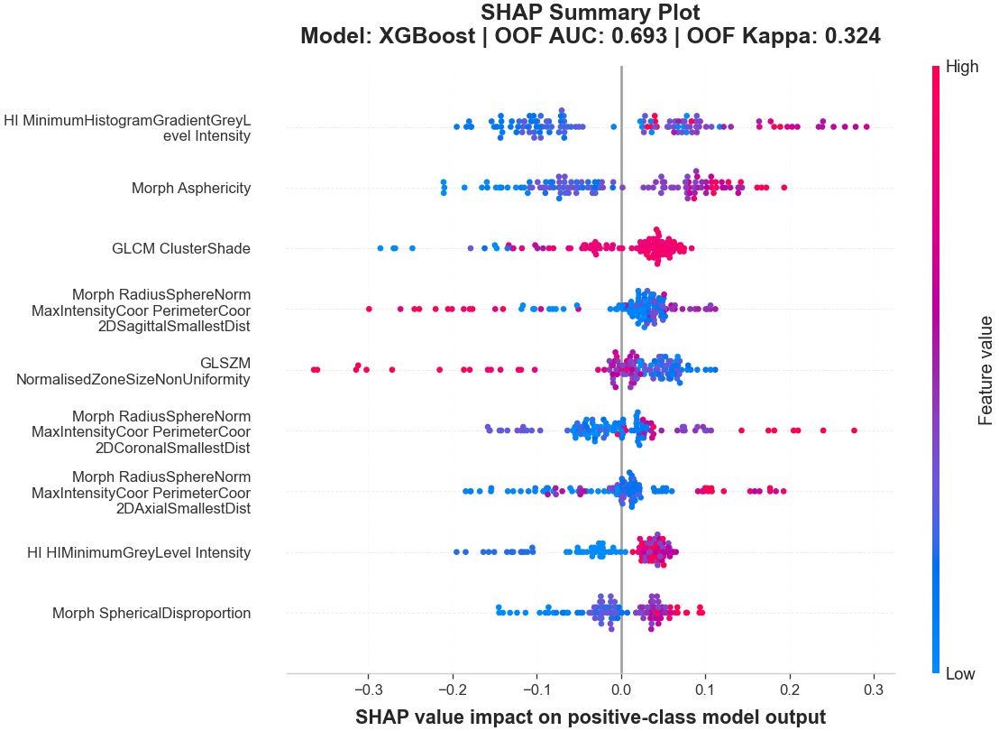

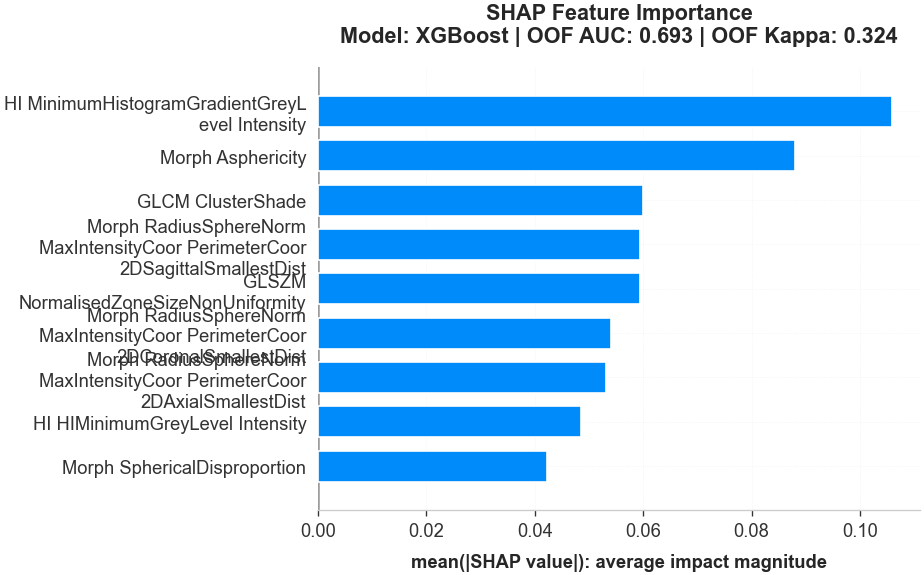


🎉 FINAL XAI PIPELINE COMPLETE
📁 Output directory: nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/SHAP_Plots
💾 Metadata:         nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/SHAP_Plots/xai_metadata.json
💾 Model artifact:   nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/SHAP_Plots/Best_Model_XGBoost_XAI_Artifact.joblib
💾 SHAP dot plot:    nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/SHAP_Plots/shap_summary_dot_stable.png
💾 SHAP bar plot:    nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote/SHAP_Plots/shap_summary_bar_stable.png


In [67]:
# =============================================================================
# FINAL EXPLAINABLE AI MODULE: STABLE-FEATURE SHAP ANALYSIS
# =============================================================================
# Purpose:
#   - Verify consistency between df_summary and nested_cv_results.
#   - Select the best model by Mean AUC from nested CV.
#   - Build a recurrence-based stable feature set from outer-fold feature selection.
#   - Refit the best model on the full cohort using the same imputation/scaling logic.
#   - Use OOF metrics for reported performance/Kappa, not in-sample metrics.
#   - Compute SHAP explanations on positive-class probability / model score.
#   - Save SHAP plots, feature-importance tables, stability tables, and model artifact.
# =============================================================================

import os
import re
import json
import math
import textwrap
import warnings
from collections import Counter

import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import shap

from sklearn.base import clone
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    cohen_kappa_score
)

print("=" * 80)
print("🌟 FINAL XAI PIPELINE: STABLE-FEATURE SHAP ANALYSIS")
print("=" * 80)


# =============================================================================
# 0. REQUIRED OBJECT CHECKS
# =============================================================================
required_objects = [
    "df", "y", "df_summary", "nested_cv_results",
    "selected_features_per_fold", "CONFIG", "NESTED_CV_MODELS"
]

missing_objects = [obj for obj in required_objects if obj not in globals()]
if len(missing_objects) > 0:
    raise RuntimeError(
        f"Missing required runtime objects: {missing_objects}. "
        "Run the previous notebook cells sequentially before this XAI cell."
    )


# =============================================================================
# 1. HELPER FUNCTIONS
# =============================================================================
def sanitize_feature_name(name):
    """Convert feature names to model-safe strings."""
    name = str(name)
    name = re.sub(r"[^a-zA-Z0-9_]", "_", name)
    name = re.sub(r"_+", "_", name)
    name = name.strip("_")
    return name



def wrap_feature_labels(labels, width=32):
    """
    Abbreviate and wrap feature labels for SHAP plots.
    """
    return [
        textwrap.fill(
            abbreviate_feature_name(label),
            width=width
        )
        for label in labels
    ]



def interpret_kappa(kappa_score):
    """Interpret Cohen's Kappa."""
    if kappa_score < 0:
        return "No agreement / worse than chance"
    elif kappa_score <= 0.20:
        return "Slight agreement / very weak"
    elif kappa_score <= 0.40:
        return "Fair agreement / low"
    elif kappa_score <= 0.60:
        return "Moderate agreement"
    elif kappa_score <= 0.80:
        return "Substantial agreement"
    else:
        return "Almost perfect agreement"


def to_jsonable(obj):
    """Convert NumPy/Pandas objects to JSON-safe objects."""
    if isinstance(obj, dict):
        return {str(k): to_jsonable(v) for k, v in obj.items()}
    if isinstance(obj, list):
        return [to_jsonable(v) for v in obj]
    if isinstance(obj, tuple):
        return [to_jsonable(v) for v in obj]
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    if isinstance(obj, (np.integer,)):
        return int(obj)
    if isinstance(obj, (np.floating,)):
        return float(obj)
    if pd.isna(obj) if not isinstance(obj, (list, dict, tuple, np.ndarray)) else False:
        return None
    return obj


def aggregate_best_params(params_per_fold):
    """
    Aggregate Optuna-selected hyperparameters across outer folds without using
    outer-test performance to choose a single fold.

    Numeric parameters -> median.
    Integer numeric parameters -> rounded median.
    Categorical/string/bool/None parameters -> mode.
    """
    if params_per_fold is None or len(params_per_fold) == 0:
        return {}

    all_keys = sorted(set().union(*[p.keys() for p in params_per_fold if isinstance(p, dict)]))
    aggregated = {}

    for key in all_keys:
        vals = [p[key] for p in params_per_fold if isinstance(p, dict) and key in p]

        if len(vals) == 0:
            continue

        all_numeric = all(isinstance(v, (int, float, np.integer, np.floating)) and not isinstance(v, bool) for v in vals)

        if all_numeric:
            med_val = float(np.median(vals))
            all_int = all(isinstance(v, (int, np.integer)) and not isinstance(v, bool) for v in vals)
            aggregated[key] = int(round(med_val)) if all_int else med_val
        else:
            aggregated[key] = Counter(vals).most_common(1)[0][0]

    return aggregated


def compute_specificity_from_arrays(y_true, y_pred):
    """Compute specificity = TN / (TN + FP)."""
    from sklearn.metrics import confusion_matrix

    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    if cm.shape != (2, 2):
        return np.nan

    tn, fp, fn, tp = cm.ravel()
    return tn / (tn + fp) if (tn + fp) > 0 else np.nan


# =============================================================================
# 2. CONSISTENCY CHECK: df_summary vs nested_cv_results
# =============================================================================
check_rows = []

for model_name, res in nested_cv_results.items():
    y_true_chk = np.asarray(res["y_true"])
    y_prob_chk = np.asarray(res["y_prob"])

    check_rows.append({
        "Model": model_name,
        "Mean_AUC_recomputed": float(np.mean(res["fold_aucs"])),
        "Pooled_AUC_recomputed": float(roc_auc_score(y_true_chk, y_prob_chk)),
        "Pooled_PR_AUC_recomputed": float(average_precision_score(y_true_chk, y_prob_chk))
    })

df_check = pd.DataFrame(check_rows)

df_compare = df_summary.merge(df_check, on="Model", how="left")
df_compare["Mean_AUC_diff"] = df_compare["Mean_AUC"] - df_compare["Mean_AUC_recomputed"]
df_compare["Pooled_AUC_diff"] = df_compare["Pooled_AUC"] - df_compare["Pooled_AUC_recomputed"]

print("\n🔎 Consistency check:")
print(
    df_compare[
        [
            "Model",
            "Mean_AUC",
            "Mean_AUC_recomputed",
            "Mean_AUC_diff",
            "Pooled_AUC",
            "Pooled_AUC_recomputed",
            "Pooled_AUC_diff"
        ]
    ].to_string(index=False)
)

if (
    df_compare["Mean_AUC_diff"].abs().max() > 1e-8 or
    df_compare["Pooled_AUC_diff"].abs().max() > 1e-8
):
    raise ValueError(
        "df_summary and nested_cv_results are inconsistent. "
        "Restart kernel and rerun all cells sequentially from data loading to nested CV."
    )


# =============================================================================
# 3. BEST MODEL SELECTION BY NESTED-CV MEAN AUC
# =============================================================================
df_summary_sorted = df_summary.sort_values("Mean_AUC", ascending=False).reset_index(drop=True)
best_model_name = df_summary_sorted.iloc[0]["Model"]
best_model_results = nested_cv_results[best_model_name]

print("\n" + "=" * 80)
print(f"🏆 Champion Model Detected by Mean AUC: {best_model_name}")
print(f"📈 Mean Fold AUC:   {df_summary_sorted.iloc[0]['Mean_AUC']:.4f}")
print(f"📈 Pooled OOF AUC:  {df_summary_sorted.iloc[0]['Pooled_AUC']:.4f}")
print("=" * 80)


# =============================================================================
# 4. OOF PERFORMANCE AND AGREEMENT PROFILE
# =============================================================================
y_oof_true = np.asarray(best_model_results["y_true"])
y_oof_prob = np.asarray(best_model_results["y_prob"])
y_oof_pred = np.asarray(best_model_results["y_pred"])

oof_metrics = {
    "oof_auc": float(roc_auc_score(y_oof_true, y_oof_prob)),
    "oof_pr_auc": float(average_precision_score(y_oof_true, y_oof_prob)),
    "oof_accuracy": float(accuracy_score(y_oof_true, y_oof_pred)),
    "oof_balanced_accuracy": float(balanced_accuracy_score(y_oof_true, y_oof_pred)),
    "oof_precision": float(precision_score(y_oof_true, y_oof_pred, zero_division=0)),
    "oof_recall": float(recall_score(y_oof_true, y_oof_pred, zero_division=0)),
    "oof_f1": float(f1_score(y_oof_true, y_oof_pred, zero_division=0)),
    "oof_specificity": float(compute_specificity_from_arrays(y_oof_true, y_oof_pred)),
    "oof_kappa": float(cohen_kappa_score(y_oof_true, y_oof_pred)),
}

print("\n📊 OOF agreement/performance profile for SHAP title and metadata:")
for k, v in oof_metrics.items():
    print(f"   {k:25s}: {v:.4f}")

print(f"   kappa_interpretation     : {interpret_kappa(oof_metrics['oof_kappa'])}")


# =============================================================================
# 5. STABLE FEATURE SELECTION BY CROSS-FOLD RECURRENCE
# =============================================================================
all_selected_features = []
for fold_features in selected_features_per_fold:
    all_selected_features.extend(list(fold_features))

feature_counts = Counter(all_selected_features)
n_fs_folds = len(selected_features_per_fold)

if n_fs_folds == 0 or len(feature_counts) == 0:
    raise ValueError("selected_features_per_fold is empty. Cannot perform stable-feature SHAP analysis.")

min_stability_freq = CONFIG.get(
    "XAI_MIN_STABILITY_FREQ",
    max(2, math.ceil(0.40 * n_fs_folds))
)

stable_features = [
    feat for feat, count in feature_counts.items()
    if count >= min_stability_freq
]

stable_features = sorted(
    stable_features,
    key=lambda f: (feature_counts[f], f),
    reverse=True
)

# Conservative fallback: use top recurrent selected features, not all numeric features.
if len(stable_features) == 0:
    fallback_n = min(CONFIG.get("FS_N_FEATURES", 12), len(feature_counts))
    stable_features = [feat for feat, _ in feature_counts.most_common(fallback_n)]
    print(
        f"\nNo feature reached stability threshold >= {min_stability_freq}/{n_fs_folds}. "
        f"Using top {fallback_n} recurrent selected features instead."
    )

df_feature_stability = pd.DataFrame([
    {
        "Feature_Name": feat,
        "Selection_Count": feature_counts[feat],
        "Selection_Frequency": feature_counts[feat] / n_fs_folds,
        "Selected_As_Stable": feat in stable_features
    }
    for feat in sorted(feature_counts.keys(), key=lambda f: feature_counts[f], reverse=True)
])

print("\n" + "=" * 80)
print("🧬 Feature-selection stability summary")
print("=" * 80)
print(f"Outer FS folds: {n_fs_folds}")
print(f"Stability threshold: selected in >= {min_stability_freq}/{n_fs_folds} folds")
print(f"Stable/recurrent features selected for SHAP: {len(stable_features)}")
print(df_feature_stability.head(30).to_string(index=False))


# =============================================================================
# 6. ALIGN STABLE FEATURE NAMES WITH df COLUMNS
# =============================================================================
label_col = CONFIG.get("LABEL_COL", "Label")
group_col = CONFIG.get("GROUP_COL", "INFO_PatientName")

# Columns that must never enter the model or SHAP analysis
unwanted_cols = {
    label_col,
    group_col,
    "Unnamed: 0",
    "Unnamed: 1",
    "Unnamed: 2",
    "id",
    "ID",
    "Batch",
    "INFO_NameOfRoi",
    "INFO_NameOfRoi_PET",
    "Batch_PET",
}

# Dynamically exclude every patient-name, ROI-name and batch metadata column
unwanted_cols.update(
    col
    for col in df.columns
    if (
        col == "PatientID"
        or col == "INFO_PatientName"
        or col.startswith("INFO_PatientName_")
        or col.startswith("INFO_NameOfRoi_")
        or col.startswith("Batch_")
        or col.startswith("Unnamed:")
    )
)

df_columns = list(df.columns)
sanitized_to_original = {}

for col in df_columns:
    s_col = sanitize_feature_name(col)
    if s_col not in sanitized_to_original:
        sanitized_to_original[s_col] = col

clean_features = []
unmatched_features = []

for feat in stable_features:
    if feat in df.columns and feat not in unwanted_cols and pd.api.types.is_numeric_dtype(df[feat]):
        clean_features.append(feat)
        continue

    s_feat = sanitize_feature_name(feat)
    if (
        s_feat in sanitized_to_original
        and sanitized_to_original[s_feat] not in unwanted_cols
        and pd.api.types.is_numeric_dtype(df[sanitized_to_original[s_feat]])
    ):
        clean_features.append(sanitized_to_original[s_feat])
    else:
        unmatched_features.append(feat)

# Remove duplicates while preserving order
clean_features = list(dict.fromkeys(clean_features))

if len(unmatched_features) > 0:
    print("\nStable features not matched to df columns:")
    for f in unmatched_features:
        print(f"   - {f}")

if len(clean_features) == 0:
    raise ValueError(
        "No stable selected features matched df columns. "
        "Check selected_features_per_fold and feature names before SHAP."
    )

print("\nFinal SHAP feature space verified.")
print(f"   Active features: {len(clean_features)}")
for i, f in enumerate(clean_features, 1):
    print(f"   {i:02d}. {f}")


# =============================================================================
# 7. FULL-COHORT REFIT FOR INTERPRETATION ONLY
# =============================================================================
print("\n" + "=" * 80)
print("🚀 Refitting champion model on full cohort for interpretation only")
print("   Note: reported metrics remain OOF/nested-CV metrics, not in-sample refit metrics.")
print("=" * 80)

X_final_raw = df[clean_features].copy()
y_final = np.asarray(y).astype(int)

sanitized_feature_names = [sanitize_feature_name(c) for c in X_final_raw.columns]

# Ensure uniqueness after sanitization
seen = {}
unique_sanitized_feature_names = []
for name in sanitized_feature_names:
    if name not in seen:
        seen[name] = 0
        unique_sanitized_feature_names.append(name)
    else:
        seen[name] += 1
        unique_sanitized_feature_names.append(f"{name}_{seen[name]}")

final_imputer = SimpleImputer(strategy="median")
X_final_imp = final_imputer.fit_transform(X_final_raw)

final_scaler = StandardScaler()
X_final_scaled = final_scaler.fit_transform(X_final_imp)

X_for_model = pd.DataFrame(
    X_final_scaled,
    columns=unique_sanitized_feature_names,
    index=X_final_raw.index
)

best_params_aggregated = aggregate_best_params(best_model_results.get("best_params_per_fold", []))

print("\n🔧 Aggregated hyperparameters from outer folds:")
print(best_params_aggregated)

if "build_model_from_best_params" in globals():
    final_model = build_model_from_best_params(
        model_name=best_model_name,
        params=best_params_aggregated,
        random_state=CONFIG.get("RANDOM_STATE", 42)
    )
else:
    warnings.warn(
        "build_model_from_best_params() not found. Falling back to clone + set_params. "
        "For maximum consistency, define build_model_from_best_params in the Optuna cell."
    )
    final_model = clone(NESTED_CV_MODELS[best_model_name])
    try:
        final_model.set_params(**best_params_aggregated)
    except Exception as e:
        warnings.warn(f"Could not set aggregated params on cloned model: {e}")

final_model.fit(X_for_model, y_final)

# In-sample refit diagnostics, printed only as sanity check, not validation.
y_refit_pred = final_model.predict(X_for_model)
refit_acc = accuracy_score(y_final, y_refit_pred)
refit_kappa = cohen_kappa_score(y_final, y_refit_pred)

print("\nIn-sample refit diagnostics only — do not report as validation performance:")
print(f"   Refit accuracy: {refit_acc:.4f}")
print(f"   Refit kappa:    {refit_kappa:.4f}")


# =============================================================================
# 8. OUTPUT DIRECTORIES AND ARTIFACT SAVE
# =============================================================================
PLOT_DIR = ACTIVE_SAVE_DIR

print("Running SHAP for selected active run:")
print(f"  ACTIVE_RUN_NAME:  {ACTIVE_RUN_NAME}")
print(f"  ACTIVE_FS_METHOD: {ACTIVE_FS_METHOD}")
print(f"  ACTIVE_USE_SMOTE: {ACTIVE_USE_SMOTE}")


output_dir = os.path.join(PLOT_DIR, "SHAP_Plots")
os.makedirs(output_dir, exist_ok=True)

feature_stability_path = os.path.join(output_dir, "xai_feature_stability.csv")
df_feature_stability.to_csv(feature_stability_path, index=False)

model_artifact = {
    "model": final_model,
    "imputer": final_imputer,
    "scaler": final_scaler,
    "best_model_name": best_model_name,
    "best_params_aggregated": best_params_aggregated,
    "features_original": clean_features,
    "features_sanitized": unique_sanitized_feature_names,
    "oof_metrics": oof_metrics,
    "feature_stability": df_feature_stability
}

model_path = os.path.join(output_dir, f"Best_Model_{best_model_name}_XAI_Artifact.joblib")
joblib.dump(model_artifact, model_path)

print(f"\n💾 XAI model artifact saved to: {model_path}")
print(f"💾 Feature-stability table saved to: {feature_stability_path}")


# =============================================================================
# 9. SHAP EXPLAINER ON POSITIVE-CLASS PROBABILITY / SCORE
# =============================================================================
print("\n⏳ Calculating SHAP values...")

def model_output_positive(X_input):
    """
    Return positive-class model output for SHAP.
    Uses predict_proba[:, 1] when available; otherwise decision_function.
    """
    X_input = pd.DataFrame(X_input, columns=X_for_model.columns)

    if hasattr(final_model, "predict_proba"):
        return final_model.predict_proba(X_input)[:, 1]

    if hasattr(final_model, "decision_function"):
        return final_model.decision_function(X_input)

    return final_model.predict(X_input)


masker = shap.maskers.Independent(
    X_for_model,
    max_samples=X_for_model.shape[0]
)

explainer = shap.Explainer(
    model_output_positive,
    masker
)

shap_values_obj = explainer(X_for_model)
shap_values = shap_values_obj.values

if len(shap_values.shape) == 3:
    shap_values = shap_values[:, :, 1]

if shap_values.shape[1] != X_for_model.shape[1]:
    raise ValueError(
        f"SHAP shape mismatch: shap_values has {shap_values.shape[1]} features, "
        f"but X_for_model has {X_for_model.shape[1]} features."
    )

mean_abs_shap = np.mean(np.abs(shap_values), axis=0)

df_shap_importance = pd.DataFrame({
    "Feature_Original": clean_features,
    "Feature_Sanitized": unique_sanitized_feature_names,
    "MeanAbsSHAP": mean_abs_shap,
    "Selection_Count": [feature_counts.get(f, 0) for f in stable_features[:len(clean_features)]]
}).sort_values("MeanAbsSHAP", ascending=False).reset_index(drop=True)

shap_importance_path = os.path.join(output_dir, "shap_feature_importance.csv")
df_shap_importance.to_csv(shap_importance_path, index=False)

print("\nSHAP calculation complete.")
print("\nTop SHAP features:")
print(df_shap_importance.head(20).to_string(index=False))
print(f"\n💾 SHAP importance table saved to: {shap_importance_path}")


# =============================================================================
# 10. SHAP PLOTS
# =============================================================================
max_display = min(20, X_for_model.shape[1])
fig_height = max(7.0, min(12.0, 3.0 + 0.45 * max_display))

wrapped_feature_names = wrap_feature_labels(
    clean_features,
    width=32
)

title_suffix = (
    f"Model: {best_model_name} | "
    f"OOF AUC: {oof_metrics['oof_auc']:.3f} | "
    f"OOF Kappa: {oof_metrics['oof_kappa']:.3f}"
)

# -----------------------------------------------------------------------------
# Plot A: SHAP summary dot plot
# -----------------------------------------------------------------------------
plt.figure(figsize=(10, fig_height))

shap.summary_plot(
    shap_values,
    X_for_model,
    feature_names=wrapped_feature_names,
    max_display=max_display,
    plot_size=None,
    show=False
)

plt.title(
    f"SHAP Summary Plot\n{title_suffix}",
    fontsize=PLOT_TITLE_SIZE,
    fontweight="bold",
    pad=15
)
plt.xlabel(
    "SHAP value impact on positive-class model output",
    fontsize=PLOT_LABEL_SIZE,
    fontweight="bold",
    labelpad=8
)
plt.gca().tick_params(axis="y", labelsize=10)
plt.gca().tick_params(axis="x", labelsize=10)
plt.grid(True, linestyle=":", alpha=0.25)
plt.tight_layout()

summary_dot_path = os.path.join(output_dir, "shap_summary_dot_stable.png")
summary_dot_pdf_path = os.path.join(output_dir, "shap_summary_dot_stable.pdf")

plt.savefig(summary_dot_path, dpi=600, bbox_inches="tight")
plt.savefig(summary_dot_pdf_path, bbox_inches="tight")
plt.show()
plt.close()


# -----------------------------------------------------------------------------
# Plot B: SHAP global feature importance bar plot
# -----------------------------------------------------------------------------
plt.figure(figsize=(10, fig_height))

shap.summary_plot(
    shap_values,
    X_for_model,
    feature_names=wrapped_feature_names,
    plot_type="bar",
    max_display=max_display,
    show=False
)

plt.title(
    f"SHAP Feature Importance\n{title_suffix}",
    fontsize=13,
    fontweight="bold",
    pad=15
)
plt.xlabel(
    "mean(|SHAP value|): average impact magnitude",
    fontsize=11,
    fontweight="bold",
    labelpad=8
)
plt.gca().tick_params(
    axis="y",
    labelsize=PLOT_TICK_SIZE
)

plt.gca().tick_params(
    axis="x",
    labelsize=PLOT_TICK_SIZE
)

plt.grid(True, linestyle=":", alpha=0.25)
plt.tight_layout()

summary_bar_path = os.path.join(output_dir, "shap_summary_bar_stable.png")
summary_bar_pdf_path = os.path.join(output_dir, "shap_summary_bar_stable.pdf")

plt.savefig(summary_bar_path, dpi=600, bbox_inches="tight")
plt.savefig(summary_bar_pdf_path, bbox_inches="tight")
plt.show()
plt.close()


# =============================================================================
# 11. METADATA SAVE
# =============================================================================
metadata = {
    "best_model_name": best_model_name,
    "selection_criterion": "Highest nested-CV Mean_AUC from df_summary",
    "oof_metrics": oof_metrics,
    "kappa_interpretation": interpret_kappa(oof_metrics["oof_kappa"]),
    "n_total_samples": int(len(y_final)),
    "n_selected_features_for_xai": int(len(clean_features)),
    "stability_threshold_min_folds": int(min_stability_freq),
    "n_feature_selection_folds": int(n_fs_folds),
    "best_params_aggregated": best_params_aggregated,
    "features_original": clean_features,
    "features_sanitized": unique_sanitized_feature_names,
    "notes": [
        "Final refit on the full cohort is used only for SHAP interpretation.",
        "Reported performance values are OOF/nested-CV metrics.",
        "SHAP explanations use positive-class probability when predict_proba is available.",
        "Stable features are selected by recurrence across outer folds, not by using all numeric features."
    ],
    "saved_files": {
        "model_artifact": model_path,
        "feature_stability": feature_stability_path,
        "shap_importance": shap_importance_path,
        "summary_dot_png": summary_dot_path,
        "summary_dot_pdf": summary_dot_pdf_path,
        "summary_bar_png": summary_bar_path,
        "summary_bar_pdf": summary_bar_pdf_path,
    }
}

metadata_path = os.path.join(output_dir, "xai_metadata.json")
with open(metadata_path, "w", encoding="utf-8") as f:
    json.dump(to_jsonable(metadata), f, ensure_ascii=False, indent=2)

print("\n" + "=" * 80)
print("🎉 FINAL XAI PIPELINE COMPLETE")
print("=" * 80)
print(f"📁 Output directory: {output_dir}")
print(f"💾 Metadata:         {metadata_path}")
print(f"💾 Model artifact:   {model_path}")
print(f"💾 SHAP dot plot:    {summary_dot_path}")
print(f"💾 SHAP bar plot:    {summary_bar_path}")
print("=" * 80)

In [68]:
# =============================================================================
# FINAL FEATURE COUNT REPORT
# =============================================================================
# Purpose:
#   - Print how many features were used by the current FS_METHOD.
#   - Report feature count per model and per outer fold.
#   - Report unique selected features across the full nested-CV run.
# =============================================================================

print("█" * 80)
print("  FINAL FEATURE COUNT REPORT")
print("█" * 80)

import os
import json
import numpy as np
import pandas as pd

current_run_name = ACTIVE_RUN_NAME
current_fs_method = ACTIVE_FS_METHOD
current_save_dir = ACTIVE_SAVE_DIR

print(f"\nRun name:   {current_run_name}")
print(f"FS method:  {current_fs_method}")
print(f"Save dir:   {current_save_dir}")

# -----------------------------------------------------------------------------
# 1. Primary source: nested_cv_results
# -----------------------------------------------------------------------------
if "nested_cv_results" not in globals():
    raise RuntimeError(
        "nested_cv_results not found. Run the Integrated Nested CV cell first."
    )

feature_count_rows = []

for model_name, res in nested_cv_results.items():
    n_features_per_fold = res.get("n_features_per_fold", None)

    if n_features_per_fold is None:
        continue

    n_features_per_fold = np.asarray(n_features_per_fold, dtype=float)

    row = {
        "Model": model_name,
        "FS_METHOD": current_fs_method,
        "N_Outer_Folds": int(len(n_features_per_fold)),
        "Mean_Selected_Features": float(np.nanmean(n_features_per_fold)),
        "Std_Selected_Features": float(np.nanstd(n_features_per_fold, ddof=1)) if len(n_features_per_fold) > 1 else 0.0,
        "Min_Selected_Features": int(np.nanmin(n_features_per_fold)),
        "Max_Selected_Features": int(np.nanmax(n_features_per_fold)),
        "Selected_Features_Per_Fold": list(n_features_per_fold.astype(int))
    }

    feature_count_rows.append(row)

feature_count_df = pd.DataFrame(feature_count_rows)

if feature_count_df.empty:
    print("\nNo n_features_per_fold found inside nested_cv_results.")
else:
    print("\n" + "═" * 80)
    print("SELECTED FEATURE COUNT BY MODEL")
    print("═" * 80)

    display_cols = [
        "Model",
        "Mean_Selected_Features",
        "Std_Selected_Features",
        "Min_Selected_Features",
        "Max_Selected_Features",
        "Selected_Features_Per_Fold"
    ]

    print(feature_count_df[display_cols].to_string(index=False))

# -----------------------------------------------------------------------------
# 2. Overall summary
# -----------------------------------------------------------------------------
if not feature_count_df.empty:
    overall_mean = feature_count_df["Mean_Selected_Features"].mean()
    overall_min = feature_count_df["Min_Selected_Features"].min()
    overall_max = feature_count_df["Max_Selected_Features"].max()

    print("\n" + "═" * 80)
    print("OVERALL FEATURE COUNT SUMMARY")
    print("═" * 80)

    print(f"FS_METHOD: {current_fs_method}")
    print(f"Target FS_N_FEATURES: {CONFIG.get('FS_N_FEATURES', 'not_set')}")
    print(f"Mean selected features across models: {overall_mean:.2f}")
    print(f"Minimum selected features across all folds/models: {overall_min}")
    print(f"Maximum selected features across all folds/models: {overall_max}")

# -----------------------------------------------------------------------------
# 3. Unique selected features across run
# -----------------------------------------------------------------------------
unique_feature_summary = {}

if "df_selected_features_long" in globals():
    if isinstance(df_selected_features_long, pd.DataFrame) and not df_selected_features_long.empty:
        if "Feature_Name" in df_selected_features_long.columns:
            unique_features = sorted(df_selected_features_long["Feature_Name"].dropna().unique())
            n_unique_features = len(unique_features)

            unique_feature_summary = {
                "N_Unique_Selected_Features_Across_Run": int(n_unique_features),
                "Unique_Selected_Features": unique_features
            }

            print("\n" + "═" * 80)
            print("UNIQUE SELECTED FEATURES ACROSS CURRENT RUN")
            print("═" * 80)

            print(f"Number of unique selected features across all models/folds: {n_unique_features}")
            print("\nUnique selected features:")
            for i, feat in enumerate(unique_features, start=1):
                print(f"{i:02d}. {feat}")

else:
    print("\ndf_selected_features_long not found in memory. Unique feature list skipped.")

# -----------------------------------------------------------------------------
# 4. Save report
# -----------------------------------------------------------------------------
feature_report_dir = os.path.join(current_save_dir, "final_feature_count_report")
os.makedirs(feature_report_dir, exist_ok=True)

if not feature_count_df.empty:
    feature_count_df.to_csv(
        os.path.join(feature_report_dir, "selected_feature_count_by_model.csv"),
        index=False
    )

if unique_feature_summary:
    pd.DataFrame({
        "Feature_Name": unique_feature_summary["Unique_Selected_Features"]
    }).to_csv(
        os.path.join(feature_report_dir, "unique_selected_features_across_run.csv"),
        index=False
    )

summary_json = {
    "RUN_NAME": current_run_name,
    "FS_METHOD": current_fs_method,
    "FS_N_FEATURES_TARGET": CONFIG.get("FS_N_FEATURES", None),
    "N_MODELS": int(len(nested_cv_results)),
    "Overall_Mean_Selected_Features": float(feature_count_df["Mean_Selected_Features"].mean()) if not feature_count_df.empty else None,
    "Overall_Min_Selected_Features": int(feature_count_df["Min_Selected_Features"].min()) if not feature_count_df.empty else None,
    "Overall_Max_Selected_Features": int(feature_count_df["Max_Selected_Features"].max()) if not feature_count_df.empty else None,
    "N_Unique_Selected_Features_Across_Run": unique_feature_summary.get("N_Unique_Selected_Features_Across_Run", None)
}

with open(os.path.join(feature_report_dir, "feature_count_summary.json"), "w") as f:
    json.dump(summary_json, f, indent=4)

print("\n" + "═" * 80)
print("FEATURE COUNT REPORT SAVED")
print("═" * 80)

print(f"Saved to: {feature_report_dir}")
print("\nFINAL FEATURE COUNT REPORT completed successfully.")

████████████████████████████████████████████████████████████████████████████████
  FINAL FEATURE COUNT REPORT
████████████████████████████████████████████████████████████████████████████████

Run name:   mrmr_then_elasticnet_no_corr_auto_k_smote
FS method:  mrmr_then_elasticnet_no_corr
Save dir:   nested_cv_outputs_single_dataset_batch_smote_compare/T2/fs_method_comparison/mrmr_then_elasticnet_no_corr_auto_k_smote

════════════════════════════════════════════════════════════════════════════════
SELECTED FEATURE COUNT BY MODEL
════════════════════════════════════════════════════════════════════════════════
             Model  Mean_Selected_Features  Std_Selected_Features  Min_Selected_Features  Max_Selected_Features Selected_Features_Per_Fold
LogisticRegression                    10.0               5.477226                      4                     18         [10, 18, 12, 4, 6]
           SVM_RBF                    10.0               5.477226                      4                     

In [69]:
# =============================================================================
# ARTIFACT CONSOLIDATION, WORKSPACE PURGE, AND PRODUCTION DEPLOYMENT
# =============================================================================
# Purpose:
#   - Initialize a centralized staging directory to aggregate multi-source logs.
#   - Purge stale runtime structures to mitigate workspace conflict errors.
#   - Merge cross-validation analytical outputs and high-DPI scientific visuals.
#   - Compile and compress verified directory clusters into a single deployable 
#     ZIP archive optimized for clinical storage and publication appendices.
# =============================================================================

import os
import shutil

# --- 1. Destination Mapping and Structural Target Initialization ------------
base_working_dir = os.getcwd()
source_dir_1 = ACTIVE_SAVE_DIR
source_dir_2 = os.path.join(ACTIVE_SAVE_DIR, "plot_data")


# Temporary staging environment for multi-source matrix collation
staging_dir = os.path.join(CONFIG.get('DATASET_OUTPUT_ROOT', base_working_dir), '_final_outputs_staging')
output_zip_path = os.path.join(CONFIG.get('DATASET_OUTPUT_ROOT', base_working_dir), ACTIVE_RUN_NAME)

# --- 2. Operational Environment Purge Strategy ------------------------------
# Prevent covariate leakage or residual data interpolation by deleting prior logs
if os.path.exists(staging_dir):
    shutil.rmtree(staging_dir)
os.makedirs(staging_dir, exist_ok=True)

print("⏳ Consolidating experimental artifacts into a single deployment directory...")

# --- 3. Sub-Directory Ingestion: Nested Cross-Validation Logs ----------------
if os.path.exists(source_dir_1):
    dest_1 = os.path.join(staging_dir, 'nested_cv_outputs')
    if os.path.exists(dest_1):
        shutil.rmtree(dest_1)
    shutil.copytree(source_dir_1, dest_1)
    print(f"  📂 Merged: {os.path.basename(source_dir_1)} -> Combined Package")
else:
    print(f"  Warning: Source directory '{source_dir_1}' not found. Skipping.")

# --- 4. Sub-Directory Ingestion: High-DPI Presentation Curves ----------------
if os.path.exists(source_dir_2):
    dest_2 = os.path.join(staging_dir, 'plot_data')
    if os.path.exists(dest_2):
        shutil.rmtree(dest_2)
    shutil.copytree(source_dir_2, dest_2)
    print(f"  📂 Merged: {os.path.basename(source_dir_2)} -> Combined Package")
else:
    print(f"  Warning: Source directory '{source_dir_2}' not found. Skipping.")

# --- 5. Production Serialization and Compression Sequence -------------------
print("\n📦 Generating centralized production archive...")
if len(os.listdir(staging_dir)) > 0:
    # Compile multi-layer workspace branches into a unified binary bundle
    shutil.make_archive(output_zip_path, 'zip', staging_dir)
    
    # Actively purge temporary operational tracks to secure clean local storage blocks
    shutil.rmtree(staging_dir)
    
    print("=" * 80)
    print(f"Successful! Consolidated package deployed at: {output_zip_path}.zip")
    print("💡 The unified archive is available for download in the Kaggle right-hand panel under 'Output'.")
    print("=" * 80)
else:
    shutil.rmtree(staging_dir)
    print("  Critical Error: Staging matrix empty. Compilation aborted due to missing source data.")

⏳ Consolidating experimental artifacts into a single deployment directory...


  📂 Merged: mrmr_then_elasticnet_no_corr_auto_k_smote -> Combined Package
  📂 Merged: plot_data -> Combined Package

📦 Generating centralized production archive...


Successful! Consolidated package deployed at: nested_cv_outputs_single_dataset_batch_smote_compare/T2/mrmr_then_elasticnet_no_corr_auto_k_smote.zip
💡 The unified archive is available for download in the Kaggle right-hand panel under 'Output'.


In [70]:
# =============================================================================
# PUBLICATION PLOTS CONTROL
# =============================================================================

IS_BATCH_RUN = bool(
    globals().get("IS_BATCH_RUN", False)
    or globals().get("BATCH_MODE", False)
    or globals().get("PAPERMILL_BATCH_RUN", False)
)

RUN_PUBLICATION_PLOTS = bool(
    globals().get("RUN_PUBLICATION_PLOTS", not IS_BATCH_RUN)
)

print("IS_BATCH_RUN =", IS_BATCH_RUN)
print("RUN_PUBLICATION_PLOTS =", RUN_PUBLICATION_PLOTS)


def short_label(text, max_len=36):
    text = str(text)
    if len(text) <= max_len:
        return text
    return text[:max_len - 3] + "..."

IS_BATCH_RUN = True
RUN_PUBLICATION_PLOTS = False


In [71]:
# =============================================================================
# BATCH-SAFE GUARD — PUBLICATION RESULT LOADER/DIAGNOSTIC
# =============================================================================
if not bool(globals().get("RUN_PUBLICATION_PLOTS", False)):
    print("Skipping publication result-loader/diagnostic cell during batch execution.")
else:
    # =============================================================================
    # ROBUST RESULT TABLE LOADER FOR PUBLICATION PLOTS
    # =============================================================================
    # Purpose:
    #   - Build df_summary with required columns:
    #       Dataset, Run_Name, Model, Mean_AUC, Std_AUC, Pooled_AUC
    #   - First tries in-memory notebook variables.
    #   - Then searches output folders for metric CSVs.
    # =============================================================================

    import os
    import re
    from pathlib import Path
    import numpy as np
    import pandas as pd

    # -----------------------------------------------------------------------------
    # 1. Column normalization helpers
    # -----------------------------------------------------------------------------

    def _norm_col(c):
        return re.sub(r"[^a-z0-9]+", "", str(c).lower())


    COLUMN_ALIASES = {
        "Dataset": [
            "dataset", "datasetname", "datasettag", "datasettagname",
            "inputdataset", "data", "modality"
        ],
        "Run_Name": [
            "runname", "run", "experimentid", "experiment", "runid",
            "method", "configname", "configuration", "fsrun"
        ],
        "Model": [
            "model", "bestmodel", "classifier", "modelname", "bestmodelname"
        ],
        "FS_METHOD": [
            "fsmethod", "featureselection", "featureselectionmethod",
            "fs", "method"
        ],
        "FS_N_FEATURES": [
            "fsnfeatures", "nfeatures", "selectedk", "k",
            "avgfeatures", "nselectedfeatures"
        ],
        "USE_SMOTE": [
            "usesmote", "smote", "withsmote"
        ],
        "Mean_AUC": [
            "meanauc", "meanrocauc", "rocaucmean", "aucmean",
            "bestmeanauc", "meanouterauc"
        ],
        "Std_AUC": [
            "stdauc", "stdrocauc", "rocaucstd", "aucstd",
            "beststdauc", "sdauc", "meanaucstd"
        ],
        "Pooled_AUC": [
            "pooledauc", "pooledrocauc", "rocauc", "auc",
            "bestpooledauc"
        ],
        "Mean_PR_AUC": [
            "meanprauc", "meanpr_auc", "meanaverageprecision",
            "praucmean", "apmean"
        ],
        "Pooled_PR_AUC": [
            "pooledprauc", "pr_auc", "prauc", "averageprecision",
            "pooledaverageprecision"
        ],
        "Mean_Bal_Acc": [
            "meanbalacc", "meanbalancedaccuracy", "balancedaccuracymean",
            "meanbalancedacc"
        ],
        "Pooled_Bal_Acc": [
            "pooledbalacc", "pooledbalancedaccuracy", "balancedaccuracy",
            "pooledbalancedacc"
        ],
        "Mean_ACC": [
            "meanacc", "meanaccuracy", "accuracymean"
        ],
        "Pooled_ACC": [
            "pooledacc", "pooledaccuracy", "accuracy"
        ],
        "Mean_F1": [
            "meanf1", "f1mean"
        ],
        "Pooled_F1": [
            "pooledf1", "f1"
        ],
        "Avg_Features": [
            "avgfeatures", "meanfeatures", "averagenfeatures",
            "meannfeatures", "avgselectedfeatures"
        ],
        "N_Unique_Selected_Features": [
            "nuniqueselectedfeatures", "uniqueselectedfeatures",
            "nuniquefeatures", "uniquefeatures"
        ],
        "Run_Dir": [
            "rundir", "savedir", "outputdir", "path"
        ],
    }


    def normalize_result_columns(df, source_path=None, default_dataset=None):
        df = df.copy()
        df.columns = [str(c).strip() for c in df.columns]

        norm_to_original = {_norm_col(c): c for c in df.columns}
        rename = {}

        for target, aliases in COLUMN_ALIASES.items():
            if target in df.columns:
                continue

            for alias in aliases:
                alias_norm = _norm_col(alias)
                if alias_norm in norm_to_original:
                    rename[norm_to_original[alias_norm]] = target
                    break

        df = df.rename(columns=rename)

        # Add required identifiers if missing
        if "Dataset" not in df.columns:
            if default_dataset is not None:
                df["Dataset"] = default_dataset
            elif "CONFIG" in globals() and isinstance(CONFIG, dict):
                df["Dataset"] = CONFIG.get("DATASET_TAG", "Unknown")
            else:
                df["Dataset"] = "Unknown"

        if "Run_Name" not in df.columns:
            if source_path is not None:
                df["Run_Name"] = Path(source_path).parent.name
            elif "FS_METHOD" in df.columns:
                df["Run_Name"] = df["FS_METHOD"].astype(str)
            else:
                df["Run_Name"] = "unknown_run"

        if "Model" not in df.columns:
            df["Model"] = "Unknown_Model"

        if "USE_SMOTE" not in df.columns:
            df["USE_SMOTE"] = (
                df["Run_Name"]
                .astype(str)
                .str.contains("_smote", case=False, regex=False)
            )
            df.loc[
                df["Run_Name"].astype(str).str.contains("_no_smote", case=False, regex=False),
                "USE_SMOTE"
            ] = False

        # Numeric coercion
        numeric_cols = [
            "Mean_AUC", "Std_AUC", "Pooled_AUC",
            "Mean_PR_AUC", "Pooled_PR_AUC",
            "Mean_Bal_Acc", "Pooled_Bal_Acc",
            "Mean_ACC", "Pooled_ACC",
            "Mean_F1", "Pooled_F1",
            "Avg_Features", "N_Unique_Selected_Features",
        ]

        for c in numeric_cols:
            if c in df.columns:
                df[c] = pd.to_numeric(df[c], errors="coerce")

        # Infer missing Std_AUC only if fold-level not available? Do not fake it.
        # Keep as NaN if absent.

        return df


    def result_table_score(df):
        """
        Score a dataframe by how useful it is as a publication summary.
        """
        if df is None or len(df) == 0:
            return -999

        required = ["Mean_AUC", "Pooled_AUC", "Std_AUC"]
        semi_required = ["Dataset", "Run_Name", "Model"]

        score = 0
        for c in required:
            if c in df.columns and df[c].notna().any():
                score += 10

        for c in semi_required:
            if c in df.columns:
                score += 2

        if "Mean_Bal_Acc" in df.columns and df["Mean_Bal_Acc"].notna().any():
            score += 3

        if "FS_METHOD" in df.columns:
            score += 2

        if "N_Unique_Selected_Features" in df.columns:
            score += 2

        return score


    # -----------------------------------------------------------------------------
    # 2. First try in-memory dataframes already created by the notebook
    # -----------------------------------------------------------------------------

    candidate_variable_names = [
        "df_summary",
        "df_fs_best_per_method",
        "df_fs_all_models",
        "df_best_per_method",
        "df_publication_summary",
        "df_model_summary",
        "all_model_summary_statistics",
        "df_all_model_summary_statistics",
        "publication_single_dataset_summary",
    ]

    memory_candidates = []

    for var_name in candidate_variable_names:
        obj = globals().get(var_name, None)

        if isinstance(obj, pd.DataFrame) and len(obj) > 0:
            temp = normalize_result_columns(obj)
            score = result_table_score(temp)
            memory_candidates.append((score, var_name, temp))

    if memory_candidates:
        memory_candidates = sorted(memory_candidates, key=lambda x: x[0], reverse=True)
        print("In-memory dataframe candidates:")
        for score, name, temp in memory_candidates:
            print(f"  score={score:>3} | {name} | shape={temp.shape} | cols={list(temp.columns)[:8]}")

        best_memory_score, best_memory_name, best_memory_df = memory_candidates[0]

        if best_memory_score >= 20:
            df_summary = best_memory_df.copy()
            print(f"\nUsing in-memory table: {best_memory_name}")
        else:
            df_summary = pd.DataFrame()
    else:
        df_summary = pd.DataFrame()


    # -----------------------------------------------------------------------------
    # 3. If no good in-memory table, search CSV files recursively
    # -----------------------------------------------------------------------------

    if len(df_summary) == 0 or result_table_score(df_summary) < 20:

        search_roots = [
            Path.cwd(),
            Path.cwd() / "output",
            Path.cwd() / "nested_cv_outputs",
            Path.cwd() / "publication_plots_single",
            Path("/kaggle/working"),
            Path("/mnt/data"),
        ]

        csv_files = []

        for root in search_roots:
            try:
                if root.exists():
                    csv_files.extend(list(root.rglob("*.csv")))
            except Exception:
                pass

        # Prefer likely result tables, avoid very large raw datasets and fold prediction files
        include_keywords = [
            "summary", "best", "comparison", "model", "statistics",
            "publication", "fs_comparison", "all_model"
        ]
        exclude_keywords = [
            "oof", "prediction", "predictions", "fold_details",
            "selected_feature", "selected_features", "raw", "cleaned",
            "dataset", "quality_audit"
        ]

        filtered = []
        for f in csv_files:
            name = f.name.lower()
            if any(k in name for k in include_keywords) and not any(k in name for k in exclude_keywords):
                filtered.append(f)

        print(f"\nFound {len(filtered)} candidate CSV files.")

        file_candidates = []

        for f in filtered:
            try:
                raw = pd.read_csv(f)
                if len(raw) == 0 or raw.shape[1] == 0:
                    continue

                temp = normalize_result_columns(raw, source_path=f)
                score = result_table_score(temp)

                if score > 0:
                    file_candidates.append((score, f, temp))

            except Exception as e:
                pass

        file_candidates = sorted(file_candidates, key=lambda x: x[0], reverse=True)

        print("\nTop file candidates:")
        for score, f, temp in file_candidates[:20]:
            print(f"  score={score:>3} | shape={temp.shape} | {f}")

        if file_candidates and file_candidates[0][0] >= 20:
            best_score, best_file, best_df = file_candidates[0]
            df_summary = best_df.copy()
            SUMMARY_PATH_FOUND = best_file
            print(f"\nUsing CSV table: {best_file}")
        else:
            print("\n  No valid summary table found from CSV search.")
            SUMMARY_PATH_FOUND = None


    # -----------------------------------------------------------------------------
    # 4. Final cleanup and validation
    # -----------------------------------------------------------------------------

    if len(df_summary) > 0:
        # Drop duplicate rows
        subset_cols = [c for c in ["Dataset", "Run_Name", "Model"] if c in df_summary.columns]
        if subset_cols:
            df_summary = df_summary.drop_duplicates(subset=subset_cols, keep="first")
        else:
            df_summary = df_summary.drop_duplicates()

        # Keep only rows with at least one real metric
        metric_cols = [c for c in ["Mean_AUC", "Pooled_AUC", "Std_AUC"] if c in df_summary.columns]
        if metric_cols:
            df_summary = df_summary[df_summary[metric_cols].notna().any(axis=1)].copy()

    print("\nFinal df_summary shape:", df_summary.shape)
    print("Final df_summary columns:")
    print(df_summary.columns.tolist())

    required = {"Dataset", "Run_Name", "Model", "Mean_AUC", "Std_AUC", "Pooled_AUC"}
    missing = required - set(df_summary.columns)

    if missing:
        print("\n  Still missing required columns:", missing)
        print("\nAvailable columns:")
        for c in df_summary.columns:
            print(" -", c)
    else:
        print("\ndf_summary is ready for publication plots.")
        display(
            df_summary[
                ["Dataset", "Run_Name", "Model", "Mean_AUC", "Std_AUC", "Pooled_AUC"]
            ]
            .sort_values(["Dataset", "Mean_AUC"], ascending=[True, False])
            .head(20)
        )


Skipping publication result-loader/diagnostic cell during batch execution.


In [72]:
# =============================================================================
# BATCH-SAFE GUARD — PUBLICATION RESULT LOADER/DIAGNOSTIC
# =============================================================================
if not bool(globals().get("RUN_PUBLICATION_PLOTS", False)):
    print("Skipping publication result-loader/diagnostic cell during batch execution.")
else:
    # =============================================================================
    # DIAGNOSTIC — CHECK REQUIRED COLUMNS 
    # =============================================================================

    required = {"Dataset", "Run_Name", "Model", "Mean_AUC", "Std_AUC", "Pooled_AUC"}

    print("df_summary shape:", df_summary.shape)
    print("df_summary columns:")
    print(df_summary.columns.tolist())

    missing = required - set(df_summary.columns)

    if missing:
        print("\n  Still missing:", missing)
        print("\nAvailable columns:")
        for c in df_summary.columns:
            print(" -", c)
    else:
        print("\nRequired columns are available.")
        display(
            df_summary[
                ["Dataset", "Run_Name", "Model", "Mean_AUC", "Std_AUC", "Pooled_AUC"]
            ].head(10)
        )


Skipping publication result-loader/diagnostic cell during batch execution.


In [73]:
def short_label(text, max_len=36):
    text = str(text)
    if len(text) <= max_len:
        return text
    return text[:max_len - 3] + "..."

In [74]:
# =============================================================================
# PUBLICATION PLOTS — REQUIRED HELPERS
# =============================================================================

from pathlib import Path
import matplotlib.pyplot as plt

# Output directory for publication figures
PLOT_DIR = Path.cwd() / "publication_plots_single"
PLOT_DIR.mkdir(parents=True, exist_ok=True)

def savefig_pub(name, dpi=600):
    """
    Save current matplotlib figure as both PNG and PDF.
    """
    path_png = PLOT_DIR / f"{name}.png"
    path_pdf = PLOT_DIR / f"{name}.pdf"

    plt.tight_layout()
    plt.savefig(path_png, dpi=dpi, bbox_inches="tight")
    plt.savefig(path_pdf, bbox_inches="tight")

    print(f"Saved PNG: {path_png}")
    print(f"Saved PDF: {path_pdf}")


def short_label(text, max_len=36):
    """
    Shorten long labels for plot annotations.
    """
    text = str(text)
    if len(text) <= max_len:
        return text
    return text[:max_len - 3] + "..."

In [75]:
if not globals().get("RUN_PUBLICATION_PLOTS", False):
    print("Skipping analysis/plot cell during batch execution.")

# =============================================================================
# FIGURE 1 — PERFORMANCE–STABILITY PARETO MAP 
# =============================================================================
else:
    required = {"Dataset", "Run_Name", "Model", "Mean_AUC", "Std_AUC", "Pooled_AUC"}
    missing = required - set(df_summary.columns)
    if missing:
        raise ValueError(f"Missing columns for Pareto plot: {missing}")

    dfp = df_summary.copy()
    dfp = dfp.dropna(subset=["Mean_AUC", "Std_AUC", "Pooled_AUC"])

    # Stability score: lower Std_AUC is better
    dfp["Stability"] = 1 - dfp["Std_AUC"]
    dfp["Generalization_Gap"] = dfp["Mean_AUC"] - dfp["Pooled_AUC"]

    if "N_Unique_Selected_Features" not in dfp.columns:
        dfp["N_Unique_Selected_Features"] = 20

    datasets = sorted(dfp["Dataset"].unique())
    markers = ["o", "s", "^", "D", "P", "X", "v", "<", ">"]
    marker_map = {d: markers[i % len(markers)] for i, d in enumerate(datasets)}

    plt.figure(figsize=(12, 8))

    for dataset in datasets:
        sub = dfp[dfp["Dataset"] == dataset]
        sizes = 50 + 8 * sub["N_Unique_Selected_Features"].fillna(10)

        plt.scatter(
            sub["Std_AUC"],
            sub["Mean_AUC"],
            s=sizes,
            alpha=0.75,
            marker=marker_map[dataset],
            label=dataset,
            edgecolor="black",
            linewidth=0.6,
        )

    # Annotate top runs per dataset
    top_per_dataset = (
        dfp.sort_values(["Dataset", "Mean_AUC"], ascending=[True, False])
        .groupby("Dataset")
        .head(1)
    )

    for _, r in top_per_dataset.iterrows():
        label = f"{r['Dataset']} | {short_label(r['Run_Name'], 24)} | {r['Model']}"
        plt.annotate(
            label,
            (r["Std_AUC"], r["Mean_AUC"]),
            xytext=(6, 6),
            textcoords="offset points",
            fontsize=8,
        )

    plt.axhline(0.75, linestyle="--", linewidth=1.2, alpha=0.8)
    plt.axvline(0.10, linestyle="--", linewidth=1.2, alpha=0.8)

    plt.xlabel("AUC standard deviation across folds/repeats\nLower = more stable")
    plt.ylabel("Mean ROC-AUC\nHigher = better")
    plt.title("Performance–Stability Pareto Map of Single-Dataset Radiomics Models")
    plt.legend(title="Dataset", frameon=True, fontsize=9)
    plt.grid(alpha=0.25)

    savefig_pub("fig1_performance_stability_pareto")
    plt.show()

Skipping analysis/plot cell during batch execution.


In [76]:
if not globals().get("RUN_PUBLICATION_PLOTS", False):
    print("Skipping analysis/plot cell during batch execution.")

# =============================================================================
# FIGURE 2 — ROBUST SMOTE EFFECT MATRIX
# =============================================================================
# Works with:
#   1) df_smote_vs_no_smote_best_per_method from Single.ipynb
#   2) df_smote loaded from publication_single_dataset_smote_vs_no_smote_summary.csv
#   3) df_summary if no ready SMOTE-delta table exists
# =============================================================================
else:
    import os
    import re
    from pathlib import Path
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt


    # -----------------------------------------------------------------------------
    # 1. Helper functions
    # -----------------------------------------------------------------------------

    def _to_bool_smote(x):
        if isinstance(x, bool):
            return x
        if pd.isna(x):
            return np.nan
        s = str(x).strip().lower()
        if s in {"true", "1", "yes", "y", "smote"}:
            return True
        if s in {"false", "0", "no", "n", "no_smote", "nosmote"}:
            return False
        return np.nan


    def infer_dataset_name():
        if "CONFIG" in globals() and isinstance(CONFIG, dict):
            return CONFIG.get("DATASET_TAG", CONFIG.get("DATASET", "Current_Dataset"))
        if "DATASET_TAG" in globals():
            return str(DATASET_TAG)
        return "Current_Dataset"


    def infer_experiment_id_from_run_name(run_name):
        s = str(run_name)
        s = re.sub(r"_no_smote$", "", s, flags=re.IGNORECASE)
        s = re.sub(r"_smote$", "", s, flags=re.IGNORECASE)
        return s


    def normalize_smote_delta_table(df):
        """
        Normalize a precomputed SMOTE-vs-no-SMOTE delta table.
        """
        df = df.copy()
        df.columns = [str(c).strip() for c in df.columns]

        if "Dataset" not in df.columns:
            df["Dataset"] = infer_dataset_name()

        if "Experiment_ID" not in df.columns:
            if "Run_Name_No_SMOTE" in df.columns:
                df["Experiment_ID"] = df["Run_Name_No_SMOTE"].map(infer_experiment_id_from_run_name)
            elif "Run_Name" in df.columns:
                df["Experiment_ID"] = df["Run_Name"].map(infer_experiment_id_from_run_name)
            elif "FS_METHOD" in df.columns:
                df["Experiment_ID"] = df["FS_METHOD"].astype(str)
            else:
                df["Experiment_ID"] = "Unknown_Experiment"

        # Standardize delta column names if variants exist
        alias_map = {
            "Delta_Mean_AUC_SMOTE_minus_No_SMOTE": [
                "Delta_Mean_AUC_SMOTE_minus_No_SMOTE",
                "Delta_Mean_ROC_AUC_SMOTE_minus_No_SMOTE",
                "Delta_ROC_AUC_Mean_SMOTE_minus_No_SMOTE",
            ],
            "Delta_Pooled_AUC_SMOTE_minus_No_SMOTE": [
                "Delta_Pooled_AUC_SMOTE_minus_No_SMOTE",
                "Delta_Pooled_ROC_AUC_SMOTE_minus_No_SMOTE",
                "Delta_ROC_AUC_SMOTE_minus_No_SMOTE",
            ],
            "Delta_Mean_Bal_Acc_SMOTE_minus_No_SMOTE": [
                "Delta_Mean_Bal_Acc_SMOTE_minus_No_SMOTE",
                "Delta_Mean_Balanced_Accuracy_SMOTE_minus_No_SMOTE",
                "Delta_Balanced_Accuracy_Mean_SMOTE_minus_No_SMOTE",
            ],
        }

        for target, aliases in alias_map.items():
            if target in df.columns:
                continue
            for a in aliases:
                if a in df.columns:
                    df[target] = df[a]
                    break

        return df


    def build_smote_delta_from_summary(df_summary):
        """
        Build SMOTE-vs-no-SMOTE delta table directly from df_summary.
        Required columns:
            Dataset, Run_Name or Experiment_ID, USE_SMOTE, Mean_AUC, Pooled_AUC, Mean_Bal_Acc
        """
        df = df_summary.copy()
        df.columns = [str(c).strip() for c in df.columns]

        if "Dataset" not in df.columns:
            df["Dataset"] = infer_dataset_name()

        if "Experiment_ID" not in df.columns:
            if "Run_Name" in df.columns:
                df["Experiment_ID"] = df["Run_Name"].map(infer_experiment_id_from_run_name)
            elif "FS_METHOD" in df.columns:
                df["Experiment_ID"] = df["FS_METHOD"].astype(str)
            else:
                raise ValueError("Cannot infer Experiment_ID from df_summary.")

        if "USE_SMOTE" not in df.columns:
            if "Run_Name" in df.columns:
                df["USE_SMOTE"] = df["Run_Name"].astype(str).str.contains("_smote", case=False, regex=False)
                df.loc[
                    df["Run_Name"].astype(str).str.contains("_no_smote", case=False, regex=False),
                    "USE_SMOTE"
                ] = False
            else:
                raise ValueError("USE_SMOTE is missing and Run_Name is unavailable.")

        df["USE_SMOTE_BOOL"] = df["USE_SMOTE"].map(_to_bool_smote)

        metric_cols = [
            "Mean_AUC",
            "Pooled_AUC",
            "Mean_Bal_Acc",
            "Std_AUC",
            "Mean_PR_AUC",
            "Pooled_PR_AUC",
            "Mean_F1",
            "Pooled_F1",
            "Avg_Features",
            "N_Unique_Selected_Features",
        ]

        metric_cols = [c for c in metric_cols if c in df.columns]

        for c in metric_cols:
            df[c] = pd.to_numeric(df[c], errors="coerce")

        key_cols = ["Dataset", "Experiment_ID"]
        if "FS_METHOD" in df.columns:
            key_cols.append("FS_METHOD")

        rows = []

        for keys, g in df.groupby(key_cols, dropna=False):
            if not isinstance(keys, tuple):
                keys = (keys,)

            g_no = g[g["USE_SMOTE_BOOL"] == False]
            g_sm = g[g["USE_SMOTE_BOOL"] == True]

            if len(g_no) == 0 or len(g_sm) == 0:
                continue

            sort_cols = [c for c in ["Mean_AUC", "Pooled_AUC", "Mean_Bal_Acc"] if c in g.columns]

            no_row = g_no.sort_values(sort_cols, ascending=False).iloc[0]
            sm_row = g_sm.sort_values(sort_cols, ascending=False).iloc[0]

            out = {k: v for k, v in zip(key_cols, keys)}

            out["Run_Name_No_SMOTE"] = no_row.get("Run_Name", np.nan)
            out["Run_Name_SMOTE"] = sm_row.get("Run_Name", np.nan)

            if "Model" in g.columns:
                out["Best_Model_No_SMOTE"] = no_row.get("Model", np.nan)
                out["Best_Model_SMOTE"] = sm_row.get("Model", np.nan)

            for m in metric_cols:
                no_val = pd.to_numeric(no_row.get(m, np.nan), errors="coerce")
                sm_val = pd.to_numeric(sm_row.get(m, np.nan), errors="coerce")

                out[f"{m}_No_SMOTE"] = no_val
                out[f"{m}_SMOTE"] = sm_val
                out[f"Delta_{m}_SMOTE_minus_No_SMOTE"] = sm_val - no_val

            rows.append(out)

        return pd.DataFrame(rows)



    def find_smote_delta_csv():
        """
        Search for saved SMOTE delta files from Single.ipynb.
        """
        candidate_names = [
            "fs_comparison_smote_vs_no_smote_best_per_method.csv",
            "publication_single_dataset_smote_vs_no_smote_summary.csv",
            "fs_comparison_smote_vs_no_smote_by_model.csv",
        ]

        roots = [
            Path.cwd(),
            Path.cwd() / "output",
            Path.cwd() / "nested_cv_outputs",
            Path("/kaggle/working"),
            Path("/mnt/data"),
        ]

        hits = []
        for root in roots:
            if not root.exists():
                continue
            for name in candidate_names:
                try:
                    hits.extend(list(root.rglob(name)))
                except Exception:
                    pass

        return hits


    # -----------------------------------------------------------------------------
    # 2. Build or load df_smote_plot
    # -----------------------------------------------------------------------------

    df_smote_plot = pd.DataFrame()

    # Priority 1: in-memory table generated by Single.ipynb Cell 34
    if "df_smote_vs_no_smote_best_per_method" in globals():
        obj = globals()["df_smote_vs_no_smote_best_per_method"]
        if isinstance(obj, pd.DataFrame) and len(obj) > 0:
            df_smote_plot = normalize_smote_delta_table(obj)
            print("Using in-memory df_smote_vs_no_smote_best_per_method")

    # Priority 2: existing df_smote if valid
    if len(df_smote_plot) == 0 and "df_smote" in globals():
        obj = globals()["df_smote"]
        if isinstance(obj, pd.DataFrame) and len(obj) > 0:
            df_smote_plot = normalize_smote_delta_table(obj)
            print("Using existing df_smote")

    # Priority 3: saved CSV files
    if len(df_smote_plot) == 0:
        hits = find_smote_delta_csv()
        print(f"Found {len(hits)} candidate SMOTE CSV files.")

        for h in hits:
            try:
                temp = pd.read_csv(h)
                temp = normalize_smote_delta_table(temp)

                needed = [
                    "Delta_Mean_AUC_SMOTE_minus_No_SMOTE",
                    "Delta_Pooled_AUC_SMOTE_minus_No_SMOTE",
                    "Delta_Mean_Bal_Acc_SMOTE_minus_No_SMOTE",
                ]

                if all(c in temp.columns for c in needed) and len(temp) > 0:
                    df_smote_plot = temp
                    print(f"Loaded SMOTE delta table from: {h}")
                    break

            except Exception as e:
                print(f"Could not read {h}: {e}")

    # Priority 4: build from df_summary
    if len(df_smote_plot) == 0:
        if "df_summary" not in globals() or not isinstance(df_summary, pd.DataFrame) or len(df_summary) == 0:
            raise ValueError(
                "No SMOTE delta table found, and df_summary is empty. "
                "Run the robust df_summary loader first."
            )

        df_smote_plot = build_smote_delta_from_summary(df_summary)
        print("Built SMOTE delta table from df_summary")

    df_smote_plot = normalize_smote_delta_table(df_smote_plot)

    print("\nSMOTE delta table shape:", df_smote_plot.shape)
    print("Columns:")
    print(df_smote_plot.columns.tolist())

    display(df_smote_plot)


    # -----------------------------------------------------------------------------
    # 3. Validate required columns
    # -----------------------------------------------------------------------------

    required = {
        "Dataset",
        "Experiment_ID",
        "Delta_Mean_AUC_SMOTE_minus_No_SMOTE",
        "Delta_Pooled_AUC_SMOTE_minus_No_SMOTE",
        "Delta_Mean_Bal_Acc_SMOTE_minus_No_SMOTE",
    }

    missing = required - set(df_smote_plot.columns)

    if missing:
        raise ValueError(
            f"Still missing columns for SMOTE matrix: {missing}\n"
            f"Available columns: {df_smote_plot.columns.tolist()}"
        )

    if len(df_smote_plot) == 0:
        raise ValueError(
            "SMOTE matrix table is empty. "
            "This usually means the corresponding no-SMOTE and SMOTE runs were not both executed."
        )


    # -----------------------------------------------------------------------------
    # 4. Plot SMOTE effect matrix
    # -----------------------------------------------------------------------------

    dfs = df_smote_plot.copy().drop_duplicates()

    metrics = [
        "Delta_Mean_AUC_SMOTE_minus_No_SMOTE",
        "Delta_Pooled_AUC_SMOTE_minus_No_SMOTE",
        "Delta_Mean_Bal_Acc_SMOTE_minus_No_SMOTE",
    ]

    for c in metrics:
        dfs[c] = pd.to_numeric(dfs[c], errors="coerce")

    dfs = dfs.dropna(subset=metrics, how="all")

    label_parts = []
    for _, r in dfs.iterrows():
        dataset = str(r.get("Dataset", "Dataset"))
        exp = str(r.get("Experiment_ID", "Experiment"))
        label_parts.append(f"{dataset}\n{exp}")

    dfs["Label"] = label_parts

    matrix = dfs.set_index("Label")[metrics].astype(float)

    plt.figure(figsize=(9.5, max(5.5, 0.55 * len(matrix))))
    im = plt.imshow(matrix.values, aspect="auto")

    plt.colorbar(im, label="SMOTE − No SMOTE")

    plt.yticks(np.arange(len(matrix.index)), matrix.index, fontsize=8)

    plt.xticks(
        np.arange(len(metrics)),
        ["Δ Mean AUC", "Δ Pooled AUC", "Δ Mean BalAcc"],
        rotation=25,
        ha="right",
    )

    # Numeric annotations
    for i in range(matrix.shape[0]):
        for j in range(matrix.shape[1]):
            val = matrix.values[i, j]
            if np.isfinite(val):
                plt.text(
                    j,
                    i,
                    f"{val:+.3f}",
                    ha="center",
                    va="center",
                    fontsize=8,
                )

    plt.axvline(0.5, linewidth=0.8)
    plt.axvline(1.5, linewidth=0.8)

    plt.title("SMOTE Impact Across Feature-Selection Strategies")
    plt.xlabel("Metric change after SMOTE")
    plt.ylabel("Dataset / Experiment")

    savefig_pub("fig2_smote_effect_matrix")
    plt.show()


    # -----------------------------------------------------------------------------
    # 5. Save the prepared SMOTE table for reproducibility
    # -----------------------------------------------------------------------------

    out_path = PLOT_DIR / "prepared_smote_delta_table_for_plot.csv"
    df_smote_plot.to_csv(out_path, index=False)
    print("Saved prepared SMOTE table:", out_path)

Skipping analysis/plot cell during batch execution.


In [77]:
if not globals().get("RUN_PUBLICATION_PLOTS", False):
    print("Skipping analysis/plot cell during batch execution.")
    
    # =============================================================================
# FIGURE 3 — DATASET × METHOD PERFORMANCE LANDSCAPE
# =============================================================================
else:
    dfh = df_summary.copy()
    dfh = dfh.dropna(subset=["Mean_AUC"])

    method_col = "FS_METHOD"
    dataset_col = "Dataset"

    if method_col not in dfh.columns:
        raise ValueError("FS_METHOD column not found.")

    # Add SMOTE state to method label
    if "USE_SMOTE" in dfh.columns:
        dfh["Method_Label"] = (
            dfh["FS_METHOD"].astype(str)
            + " | "
            + np.where(dfh["USE_SMOTE"].astype(bool), "SMOTE", "No SMOTE")
        )
    else:
        dfh["Method_Label"] = dfh["FS_METHOD"].astype(str)

    # For duplicated method/model rows, keep best AUC
    pivot = (
        dfh.groupby([dataset_col, "Method_Label"])["Mean_AUC"]
        .max()
        .unstack("Method_Label")
    )

    plt.figure(figsize=(max(11, 1.2 * pivot.shape[1]), max(5, 0.7 * pivot.shape[0])))
    im = plt.imshow(pivot.values, aspect="auto", vmin=0.50, vmax=max(0.80, np.nanmax(pivot.values)))

    plt.colorbar(im, label="Best Mean ROC-AUC")
    plt.yticks(np.arange(len(pivot.index)), pivot.index)
    plt.xticks(np.arange(len(pivot.columns)), pivot.columns, rotation=45, ha="right")

    for i in range(pivot.shape[0]):
        for j in range(pivot.shape[1]):
            val = pivot.values[i, j]
            if np.isfinite(val):
                plt.text(j, i, f"{val:.3f}", ha="center", va="center", fontsize=8)

    plt.title("Best Mean ROC-AUC by Dataset and Feature-Selection Strategy")
    plt.xlabel("Feature-selection strategy")
    plt.ylabel("Dataset")

    savefig_pub("fig3_dataset_method_auc_landscape")
    plt.show()

Skipping analysis/plot cell during batch execution.


In [78]:
if not globals().get("RUN_PUBLICATION_PLOTS", False):
    print("Skipping analysis/plot cell during batch execution.")


# =============================================================================
# FIGURE 4 — MULTI-OBJECTIVE CONFIGURATION SCORE
# =============================================================================
else:
    dfc = df_summary.copy()

    needed = ["Mean_AUC", "Std_AUC", "Pooled_AUC", "Mean_Bal_Acc"]
    for c in needed:
        if c not in dfc.columns:
            raise ValueError(f"Missing required column: {c}")

    dfc = dfc.dropna(subset=needed)

    # Composite score:
    # - reward Mean AUC, Pooled AUC, Balanced Accuracy
    # - penalize high Std AUC and large mean-pooled gap
    dfc["AUC_Gap"] = (dfc["Mean_AUC"] - dfc["Pooled_AUC"]).abs()

    dfc["Composite_Score"] = (
        0.40 * dfc["Mean_AUC"]
        + 0.25 * dfc["Pooled_AUC"]
        + 0.20 * dfc["Mean_Bal_Acc"]
        + 0.15 * (1 - dfc["Std_AUC"])
        - 0.10 * dfc["AUC_Gap"]
    )

    dfc["Plot_Label"] = (
        dfc["Dataset"].astype(str)
        + " | "
        + dfc["Run_Name"].astype(str).map(lambda x: short_label(x, 30))
        + " | "
        + dfc["Model"].astype(str)
    )

    top_n = min(20, len(dfc))
    top = dfc.sort_values("Composite_Score", ascending=False).head(top_n).iloc[::-1]

    plt.figure(figsize=(12, max(7, 0.42 * top_n)))
    y = np.arange(len(top))

    plt.barh(y, top["Composite_Score"])
    plt.yticks(y, top["Plot_Label"], fontsize=8)
    plt.xlabel("Composite score")
    plt.title("Top Configurations by Multi-Objective Publication Score")

    for i, (_, r) in enumerate(top.iterrows()):
        plt.text(
            r["Composite_Score"] + 0.002,
            i,
            f"AUC={r['Mean_AUC']:.3f}, SD={r['Std_AUC']:.3f}, pAUC={r['Pooled_AUC']:.3f}",
            va="center",
            fontsize=8,
        )

    plt.grid(axis="x", alpha=0.25)

    savefig_pub("fig4_multi_objective_configuration_score")
    plt.show()

    display(
        dfc.sort_values("Composite_Score", ascending=False)[
            [
                "Dataset", "Run_Name", "FS_METHOD", "Model",
                "Mean_AUC", "Std_AUC", "Pooled_AUC",
                "Mean_Bal_Acc", "AUC_Gap", "Composite_Score",
            ]
        ].head(20)
    )

Skipping analysis/plot cell during batch execution.


In [79]:
if not globals().get("RUN_PUBLICATION_PLOTS", False):
    print("Skipping analysis/plot cell during batch execution.")


# =============================================================================
# FIGURE 5 — ROBUST FOLD-LEVEL FAILURE HEATMAP FOR A SELECTED RUN
# =============================================================================

else:
    import os
    import re
    import ast
    import json
    import pickle
    from pathlib import Path

    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt


    # -----------------------------------------------------------------------------
    # Safety helpers
    # -----------------------------------------------------------------------------

    if "PLOT_DIR" not in globals():
        PLOT_DIR = Path.cwd() / "publication_plots_single"
        PLOT_DIR.mkdir(parents=True, exist_ok=True)

    if "savefig_pub" not in globals():
        def savefig_pub(name, dpi=600):
            path_png = PLOT_DIR / f"{name}.png"
            path_pdf = PLOT_DIR / f"{name}.pdf"
            plt.tight_layout()
            plt.savefig(path_png, dpi=dpi, bbox_inches="tight")
            plt.savefig(path_pdf, bbox_inches="tight")
            print(f"Saved: {path_png}")
            print(f"Saved: {path_pdf}")


    def first_existing_col(df, candidates, required=True):
        for c in candidates:
            if c in df.columns:
                return c
        if required:
            raise KeyError(f"None of these columns found: {candidates}")
        return None


    def print_available_datasets(df):
        print("\nAvailable Dataset values in df_summary:")
        if "Dataset" in df.columns:
            print(df["Dataset"].value_counts(dropna=False))
        else:
            print("No Dataset column found.")

        show_cols = [
            c for c in [
                "Dataset", "Single_Tag", "Run_Name", "FS_METHOD", "Model",
                "Mean_AUC", "Std_AUC", "Pooled_AUC", "Run_Dir"
            ]
            if c in df.columns
        ]

        print("\nPreview:")
        display(df[show_cols].head(30))


    # -----------------------------------------------------------------------------
    # Robust run selector
    # -----------------------------------------------------------------------------

    def choose_best_run_for_dataset_robust(df, dataset=None):
        """
        Select best run for a target dataset.

        Selection priority:
        1. exact match in Dataset / Single_Tag
        2. contains match in Dataset / Single_Tag / Run_Dir / Run_Name
        3. if no match, choose best overall
        """
        df = df.copy()

        if len(df) == 0:
            raise ValueError("df_summary is empty. Run the robust summary loader first.")

        required_metrics = ["Mean_AUC", "Pooled_AUC"]
        for c in required_metrics:
            if c not in df.columns:
                raise ValueError(f"df_summary is missing required metric column: {c}")

        for c in ["Mean_AUC", "Pooled_AUC", "Std_AUC"]:
            if c in df.columns:
                df[c] = pd.to_numeric(df[c], errors="coerce")

        df = df.dropna(subset=["Mean_AUC"], how="all").copy()

        if len(df) == 0:
            raise ValueError("df_summary has no valid Mean_AUC values.")

        print_available_datasets(df)

        if dataset is None:
            dataset = ""

        target = str(dataset).strip().lower()

        candidate_cols = [
            c for c in ["Dataset", "Single_Tag", "DATASET_TAG", "Run_Dir", "Run_Name"]
            if c in df.columns
        ]

        sub = pd.DataFrame()

        if target:
            # Exact match
            masks = []
            for c in candidate_cols:
                masks.append(df[c].astype(str).str.lower().eq(target))

            if masks:
                exact_mask = np.logical_or.reduce(masks)
                sub = df[exact_mask].copy()

            # Contains match
            if len(sub) == 0:
                masks = []
                for c in candidate_cols:
                    masks.append(df[c].astype(str).str.lower().str.contains(target, regex=False, na=False))

                if masks:
                    contains_mask = np.logical_or.reduce(masks)
                    sub = df[contains_mask].copy()

        if len(sub) == 0:
            print(
                f"\nNo rows matched TARGET_DATASET='{dataset}'. "
                "Using best available run overall instead."
            )
            sub = df.copy()
        else:
            print(f"\nFound {len(sub)} rows matching TARGET_DATASET='{dataset}'.")

        sort_cols = [c for c in ["Mean_AUC", "Pooled_AUC"] if c in sub.columns]
        sub = sub.sort_values(sort_cols, ascending=False)

        return sub.iloc[0]


    # -----------------------------------------------------------------------------
    # Resolve run directory
    # -----------------------------------------------------------------------------

    def resolve_run_dir(best_run):
        """
        Resolve Run_Dir even if the saved path is relative or missing.
        """
        run_name = str(best_run.get("Run_Name", ""))

        candidate_paths = []

        if "Run_Dir" in best_run.index and pd.notna(best_run["Run_Dir"]):
            rd = Path(str(best_run["Run_Dir"]))
            candidate_paths.append(rd)
            candidate_paths.append(Path.cwd() / rd)
            candidate_paths.append(Path("/kaggle/working") / rd)
            candidate_paths.append(Path("/mnt/data") / rd)

        for p in candidate_paths:
            if p.exists():
                return p

        # Search by run folder name
        search_roots = [
            Path.cwd(),
            Path.cwd() / "output",
            Path.cwd() / "nested_cv_outputs",
            Path("/kaggle/working"),
            Path("/mnt/data"),
        ]

        hits = []
        for root in search_roots:
            if not root.exists():
                continue
            try:
                hits.extend([p for p in root.rglob("*") if p.is_dir() and p.name == run_name])
            except Exception:
                pass

        if hits:
            return hits[0]

        print("\nCould not resolve run directory.")
        print("Run_Name:", run_name)
        if "Run_Dir" in best_run.index:
            print("Run_Dir from summary:", best_run["Run_Dir"])

        return None


    # -----------------------------------------------------------------------------
    # Find and load fold-level files
    # -----------------------------------------------------------------------------

    def find_file_in_run_dir(run_dir, patterns):
        run_dir = Path(run_dir)
        if not run_dir.exists():
            return None

        for pattern in patterns:
            hits = list(run_dir.rglob(pattern))
            if hits:
                return hits[0]
        return None


    def normalize_fold_table(dff):
        """
        Normalize common fold-level metric table formats into:
            Model, Fold, ROC_AUC
        """
        dff = dff.copy()
        dff.columns = [str(c).strip() for c in dff.columns]

        model_col = first_existing_col(
            dff,
            ["Model", "model", "Classifier", "classifier", "Model_Name"],
            required=False,
        )

        fold_col = first_existing_col(
            dff,
            ["fold", "Fold", "Outer_Fold", "Global_Fold", "outer_fold", "fold_id"],
            required=False,
        )

        auc_col = first_existing_col(
            dff,
            ["ROC_AUC", "AUC", "roc_auc", "Mean_AUC", "Fold_AUC", "test_auc"],
            required=False,
        )

        if auc_col is None:
            return None

        if model_col is None:
            dff["Model"] = "Selected_Model"
            model_col = "Model"

        if fold_col is None:
            dff["Fold"] = np.arange(1, len(dff) + 1)
            fold_col = "Fold"

        out = dff[[model_col, fold_col, auc_col]].copy()
        out.columns = ["Model", "Fold", "ROC_AUC"]
        out["ROC_AUC"] = pd.to_numeric(out["ROC_AUC"], errors="coerce")
        out = out.dropna(subset=["ROC_AUC"])

        return out


    def extract_fold_metrics_from_pickle(obj):
        """
        Try to extract fold AUCs from nested_cv_results-like dictionaries.
        """
        rows = []

        def visit(x, prefix_model=None):
            if isinstance(x, dict):
                # Case: model -> result dict
                for k, v in x.items():
                    if isinstance(v, dict):
                        model_name = str(k)

                        auc_keys = [
                            "fold_aucs", "outer_fold_aucs", "test_aucs",
                            "roc_auc_folds", "fold_auc"
                        ]

                        for ak in auc_keys:
                            if ak in v:
                                vals = v[ak]
                                if isinstance(vals, (list, tuple, np.ndarray, pd.Series)):
                                    for i, val in enumerate(vals, start=1):
                                        try:
                                            rows.append({
                                                "Model": model_name,
                                                "Fold": i,
                                                "ROC_AUC": float(val),
                                            })
                                        except Exception:
                                            pass

                        # Nested fold metrics list
                        for fk in ["fold_metrics", "fold_results", "outer_fold_results"]:
                            if fk in v and isinstance(v[fk], (list, tuple)):
                                for i, item in enumerate(v[fk], start=1):
                                    if isinstance(item, dict):
                                        auc_val = None
                                        for ak in ["ROC_AUC", "AUC", "roc_auc", "auc"]:
                                            if ak in item:
                                                auc_val = item[ak]
                                                break
                                        if auc_val is not None:
                                            try:
                                                rows.append({
                                                    "Model": model_name,
                                                    "Fold": item.get("Fold", item.get("fold", i)),
                                                    "ROC_AUC": float(auc_val),
                                                })
                                            except Exception:
                                                pass

                        visit(v, prefix_model=model_name)

                    elif isinstance(v, (list, tuple, np.ndarray)):
                        # Case: key itself is fold_aucs
                        if str(k).lower() in {"fold_aucs", "outer_fold_aucs", "test_aucs"}:
                            model_name = prefix_model or "Selected_Model"
                            for i, val in enumerate(v, start=1):
                                try:
                                    rows.append({
                                        "Model": model_name,
                                        "Fold": i,
                                        "ROC_AUC": float(val),
                                    })
                                except Exception:
                                    pass

            elif isinstance(x, (list, tuple)):
                for item in x:
                    visit(item, prefix_model=prefix_model)

        visit(obj)

        if len(rows) == 0:
            return None

        out = pd.DataFrame(rows)
        out = out.drop_duplicates()
        out["ROC_AUC"] = pd.to_numeric(out["ROC_AUC"], errors="coerce")
        out = out.dropna(subset=["ROC_AUC"])
        return out


    def load_fold_level_metrics(run_dir):
        """
        Load fold-level metrics from CSV or pickle inside a run directory.
        """
        if run_dir is None:
            return None, None

        run_dir = Path(run_dir)

        # 1. Try CSV files
        csv_file = find_file_in_run_dir(
            run_dir,
            [
                "*fold_details*.csv",
                "*df_fold_details*.csv",
                "*fold*details*.csv",
                "*fold_metrics*.csv",
                "*fold*metrics*.csv",
                "*outer*fold*.csv",
            ],
        )

        if csv_file is not None:
            try:
                dff = pd.read_csv(csv_file)
                norm = normalize_fold_table(dff)
                if norm is not None and len(norm) > 0:
                    return norm, csv_file
                else:
                    print("CSV found but not model-long fold metric format:", csv_file)
                    print("Columns:", dff.columns.tolist())
            except Exception as e:
                print("Could not read fold CSV:", csv_file, e)

        # 2. Try pickle results
        pkl_file = find_file_in_run_dir(
            run_dir,
            [
                "*nested_cv_results*.pkl",
                "*cv_results*.pkl",
                "*results*.pkl",
            ],
        )

        if pkl_file is not None:
            try:
                with open(pkl_file, "rb") as f:
                    obj = pickle.load(f)

                norm = extract_fold_metrics_from_pickle(obj)
                if norm is not None and len(norm) > 0:
                    return norm, pkl_file
                else:
                    print("Pickle found but fold AUCs could not be extracted:", pkl_file)

            except Exception as e:
                print("Could not read pickle:", pkl_file, e)

        return None, None


    # -----------------------------------------------------------------------------
    # Main execution
    # -----------------------------------------------------------------------------

    TARGET_DATASET = target_dataset

    best_run = choose_best_run_for_dataset_robust(df_summary, TARGET_DATASET)

    print("\nSelected run:")
    display(best_run.to_frame().T)

    run_dir = resolve_run_dir(best_run)
    print("\nResolved run_dir:", run_dir)

    dff_fold, fold_source = load_fold_level_metrics(run_dir)

    print("\nFold metric source:", fold_source)

    if dff_fold is None or len(dff_fold) == 0:
        print("\n  No usable fold-level metric table found.")
        print("This figure is skipped.")
        print("\nPossible reason:")
        print("  - The notebook did not export fold-level metrics.")
        print("  - Only summary metrics were saved.")
        print("  - Run directory path in df_summary is not accessible from this notebook.")
    else:
        display(dff_fold.head())

        heat = dff_fold.pivot_table(
            index="Model",
            columns="Fold",
            values="ROC_AUC",
            aggfunc="mean",
        )

        # Sort models by mean AUC
        heat = heat.loc[heat.mean(axis=1).sort_values(ascending=False).index]

        plt.figure(figsize=(max(12, 0.45 * heat.shape[1]), max(5, 0.50 * heat.shape[0])))

        im = plt.imshow(
            heat.values,
            aspect="auto",
            vmin=max(0.0, np.nanmin(heat.values) - 0.05),
            vmax=min(1.0, np.nanmax(heat.values) + 0.05),
        )

        plt.colorbar(im, label="Fold ROC-AUC")

        plt.yticks(np.arange(len(heat.index)), heat.index)
        plt.xticks(np.arange(len(heat.columns)), heat.columns, rotation=90)

        for i in range(heat.shape[0]):
            for j in range(heat.shape[1]):
                val = heat.values[i, j]
                if np.isfinite(val):
                    plt.text(
                        j,
                        i,
                        f"{val:.2f}",
                        ha="center",
                        va="center",
                        fontsize=7,
                    )

        actual_dataset = str(best_run.get("Dataset", TARGET_DATASET))
        run_name = str(best_run.get("Run_Name", "selected_run"))

        plt.title(
            f"Fold-Level ROC-AUC Failure Map\n"
            f"{actual_dataset} | {run_name}"
        )
        plt.xlabel("Outer fold")
        plt.ylabel("Model")

        safe_dataset = re.sub(r"[^A-Za-z0-9_]+", "_", actual_dataset)
        savefig_pub(f"fig5_fold_level_failure_heatmap_{safe_dataset}")
        plt.show()

        # Also save the prepared fold-level table
        out_csv = PLOT_DIR / f"prepared_fold_level_auc_{safe_dataset}.csv"
        dff_fold.to_csv(out_csv, index=False)
        print("Saved prepared fold-level table:", out_csv)

Skipping analysis/plot cell during batch execution.


In [80]:
if not globals().get("RUN_PUBLICATION_PLOTS", False):
    print("Skipping analysis/plot cell during batch execution.")

# =============================================================================
# FIGURE 6 — ROBUST FEATURE SELECTION STABILITY PLOT
# =============================================================================
# Purpose:
#   - Plot most frequently selected radiomics features across outer folds.
#   - Robust to missing/incorrect Dataset labels such as Pre, Pre_M1, Unknown, Current_Dataset.
#   - Robust to different selected-feature CSV file names.
# =============================================================================

else:
    import os
    import re
    from pathlib import Path

    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt


    # -----------------------------------------------------------------------------
    # Fallback helpers
    # -----------------------------------------------------------------------------

    if "PLOT_DIR" not in globals():
        PLOT_DIR = Path.cwd() / "publication_plots_single"
        PLOT_DIR.mkdir(parents=True, exist_ok=True)

    if "savefig_pub" not in globals():
        def savefig_pub(name, dpi=600):
            path_png = PLOT_DIR / f"{name}.png"
            path_pdf = PLOT_DIR / f"{name}.pdf"
            plt.tight_layout()
            plt.savefig(path_png, dpi=dpi, bbox_inches="tight")
            plt.savefig(path_pdf, bbox_inches="tight")
            print(f"Saved: {path_png}")
            print(f"Saved: {path_pdf}")


    def first_existing_col(df, candidates, required=True):
        for c in candidates:
            if c in df.columns:
                return c
        if required:
            raise KeyError(f"None of these columns found: {candidates}")
        return None


    def short_label(text, max_len=55):
        text = str(text)
        if len(text) <= max_len:
            return text
        return text[:max_len - 3] + "..."


    def infer_feature_family(feature_name):
        s = str(feature_name).lower()

        if "morph" in s or "shape" in s:
            return "Morphology"
        if "glcm" in s:
            return "GLCM"
        if "glrlm" in s:
            return "GLRLM"
        if "glszm" in s:
            return "GLSZM"
        if "gldm" in s:
            return "GLDM"
        if "ngtdm" in s:
            return "NGTDM"
        if "histogram" in s or re.search(r"\bih\b", s):
            return "Histogram"
        if "intensity" in s or re.search(r"\bib\b", s):
            return "Intensity"
        if "firstorder" in s or "first_order" in s:
            return "First-order"
        return "Other"


    # -----------------------------------------------------------------------------
    # Robust run selection
    # -----------------------------------------------------------------------------

    def show_available_runs(df):
        print("\nAvailable Dataset values:")
        if "Dataset" in df.columns:
            print(df["Dataset"].value_counts(dropna=False))
        else:
            print("No Dataset column found.")

        show_cols = [
            c for c in [
                "Dataset", "Run_Name", "FS_METHOD", "Model",
                "Mean_AUC", "Std_AUC", "Pooled_AUC", "Run_Dir"
            ]
            if c in df.columns
        ]

        print("\nAvailable runs preview:")
        display(
            df[show_cols]
            .sort_values(
                [c for c in ["Mean_AUC", "Pooled_AUC"] if c in df.columns],
                ascending=False
            )
            .head(30)
        )


    def choose_best_run_for_dataset_robust(df, dataset=None):
        """
        Select best run for the target dataset.
        If no dataset match is found, select the best run overall.
        """
        df = df.copy()

        if len(df) == 0:
            raise ValueError("df_summary is empty. Run the robust summary loader first.")

        for c in ["Mean_AUC", "Pooled_AUC", "Std_AUC"]:
            if c in df.columns:
                df[c] = pd.to_numeric(df[c], errors="coerce")

        if "Mean_AUC" not in df.columns:
            raise ValueError("df_summary must contain Mean_AUC.")

        df = df.dropna(subset=["Mean_AUC"]).copy()

        if len(df) == 0:
            raise ValueError("df_summary has no valid Mean_AUC values.")

        show_available_runs(df)

        target = "" if dataset is None else str(dataset).strip().lower()

        candidate_cols = [
            c for c in ["Dataset", "Single_Tag", "DATASET_TAG", "Run_Dir", "Run_Name"]
            if c in df.columns
        ]

        sub = pd.DataFrame()

        if target:
            # Exact match
            masks = []
            for c in candidate_cols:
                masks.append(df[c].astype(str).str.lower().eq(target))

            if masks:
                exact_mask = np.logical_or.reduce(masks)
                sub = df[exact_mask].copy()

            # Contains match
            if len(sub) == 0:
                masks = []
                for c in candidate_cols:
                    masks.append(
                        df[c]
                        .astype(str)
                        .str.lower()
                        .str.contains(target, regex=False, na=False)
                    )

                if masks:
                    contains_mask = np.logical_or.reduce(masks)
                    sub = df[contains_mask].copy()

        if len(sub) == 0:
            print(
                f"\nNo rows matched TARGET_DATASET='{dataset}'. "
                "Using best available run overall."
            )
            sub = df.copy()
        else:
            print(f"\nFound {len(sub)} rows matching TARGET_DATASET='{dataset}'.")

        sort_cols = [c for c in ["Mean_AUC", "Pooled_AUC"] if c in sub.columns]
        sub = sub.sort_values(sort_cols, ascending=False)

        return sub.iloc[0]


    def resolve_run_dir(best_run):
        """
        Resolve run directory from Run_Dir or Run_Name.
        """
        run_name = str(best_run.get("Run_Name", ""))

        candidate_paths = []

        if "Run_Dir" in best_run.index and pd.notna(best_run["Run_Dir"]):
            rd = Path(str(best_run["Run_Dir"]))
            candidate_paths.extend([
                rd,
                Path.cwd() / rd,
                Path("/kaggle/working") / rd,
                Path("/mnt/data") / rd,
            ])

        for p in candidate_paths:
            if p.exists():
                return p

        # Search by exact run folder name
        search_roots = [
            Path.cwd(),
            Path.cwd() / "output",
            Path.cwd() / "nested_cv_outputs",
            Path("/kaggle/working"),
            Path("/mnt/data"),
        ]

        hits = []

        for root in search_roots:
            if not root.exists():
                continue

            try:
                hits.extend(
                    [
                        p for p in root.rglob("*")
                        if p.is_dir() and p.name == run_name
                    ]
                )
            except Exception:
                pass

        if hits:
            return hits[0]

        # Search by contains run name
        if run_name:
            for root in search_roots:
                if not root.exists():
                    continue

                try:
                    hits.extend(
                        [
                            p for p in root.rglob("*")
                            if p.is_dir() and run_name.lower() in p.name.lower()
                        ]
                    )
                except Exception:
                    pass

        if hits:
            return hits[0]

        print("\nCould not resolve run directory.")
        print("Run_Name:", run_name)
        if "Run_Dir" in best_run.index:
            print("Run_Dir from summary:", best_run["Run_Dir"])

        return None


    # -----------------------------------------------------------------------------
    # Load selected feature table
    # -----------------------------------------------------------------------------

    def load_selected_feature_table(run_dir):
        if run_dir is None:
            return None, None

        run_dir = Path(run_dir)

        patterns = [
            "*selected_feature*long*.csv",
            "*selected_features_long*.csv",
            "*feature_selection*long*.csv",
            "*selected_features*.csv",
            "*selected*features*.csv",
            "*feature_stability*.csv",
            "*stability*features*.csv",
        ]

        for p in patterns:
            hits = list(run_dir.rglob(p))
            if hits:
                f = hits[0]
                try:
                    df = pd.read_csv(f)
                    if len(df) > 0:
                        return df, f
                except Exception:
                    pass

        return None, None


    def detect_feature_column(df_feat):
        candidates = [
            "Feature",
            "feature",
            "Feature_Name",
            "feature_name",
            "Selected_Feature",
            "selected_feature",
            "selected_features",
            "Feature_ID",
            "feature_id",
        ]

        col = first_existing_col(df_feat, candidates, required=False)

        if col is not None:
            return col

        # Fallback: choose object column with longest average string length
        object_cols = df_feat.select_dtypes(include="object").columns.tolist()

        if not object_cols:
            return None

        avg_lens = {
            c: df_feat[c].dropna().astype(str).map(len).mean()
            for c in object_cols
        }

        return max(avg_lens, key=avg_lens.get)


    def detect_fold_column(df_feat):
        candidates = [
            "Fold",
            "fold",
            "Outer_Fold",
            "outer_fold",
            "Global_Fold",
            "Repeat_Fold",
            "fold_id",
        ]

        return first_existing_col(df_feat, candidates, required=False)


    # -----------------------------------------------------------------------------
    # Main execution
    # -----------------------------------------------------------------------------

    TARGET_DATASET = target_dataset   
    best_run = choose_best_run_for_dataset_robust(df_summary, TARGET_DATASET)

    print("\nSelected run for feature stability:")
    display(best_run.to_frame().T)

    run_dir = resolve_run_dir(best_run)
    print("\nResolved run_dir:", run_dir)

    df_feat, feature_file = load_selected_feature_table(run_dir)

    print("\nSelected feature file:", feature_file)

    if df_feat is None or len(df_feat) == 0:
        print("\n  No selected-feature table found.")
        print("Feature stability plot is skipped.")
        print("\nThis means the notebook did not export selected features per fold.")
        print("""
    selected_feature_records.append({
        "Fold": outer_fold_idx,
        "Model": model_name,
        "Feature": feature_name,
        "Run_Name": CONFIG["RUN_NAME"],
    })
    """)
        print("Then after the run:")
        print("""
    df_selected_features_long = pd.DataFrame(selected_feature_records)
    df_selected_features_long.to_csv(
        os.path.join(CONFIG["SAVE_DIR"], "selected_features_long.csv"),
        index=False
    )
    """)

    else:
        print("\nSelected feature table preview:")
        display(df_feat.head())
        print("\nColumns:")
        print(df_feat.columns.tolist())

        feature_col = detect_feature_column(df_feat)
        fold_col = detect_fold_column(df_feat)

        if feature_col is None:
            raise ValueError(
                "Could not detect feature column in selected-feature table. "
                f"Available columns: {df_feat.columns.tolist()}"
            )

        # Clean feature names
        temp = df_feat.copy()
        temp[feature_col] = temp[feature_col].astype(str)

        # Remove empty or invalid feature names
        temp = temp[
            temp[feature_col].notna()
            & ~temp[feature_col].astype(str).str.lower().isin(["nan", "none", ""])
        ].copy()

        if len(temp) == 0:
            raise ValueError("Selected-feature table has no valid feature names.")

        # Count selection frequency
        freq = (
            temp[feature_col]
            .value_counts()
            .reset_index()
        )
        freq.columns = ["Feature", "Selection_Count"]

        # Denominator
        if fold_col is not None:
            n_units = temp[fold_col].nunique()
            denominator_label = f"{n_units} folds"
        else:
            # fallback: max count as denominator
            n_units = freq["Selection_Count"].max()
            denominator_label = "max observed selection count"

        n_units = max(int(n_units), 1)

        freq["Selection_Frequency"] = freq["Selection_Count"] / n_units
        freq["Family"] = freq["Feature"].map(infer_feature_family)

        # Save prepared frequency table
        actual_dataset = str(best_run.get("Dataset", TARGET_DATASET))
        safe_dataset = re.sub(r"[^A-Za-z0-9_]+", "_", actual_dataset)

        out_freq = PLOT_DIR / f"prepared_feature_stability_{safe_dataset}.csv"
        freq.to_csv(out_freq, index=False)
        print("\nSaved prepared feature stability table:", out_freq)

        display(freq.head(30))

        # -------------------------------------------------------------------------
        # Plot A: Top stable features
        # -------------------------------------------------------------------------
        top_n = min(25, len(freq))
        top = freq.head(top_n).iloc[::-1]

        plt.figure(figsize=(12, max(7, 0.38 * top_n)))
        y = np.arange(len(top))

        plt.barh(y, top["Selection_Frequency"])

        labels = [
            (
                f"{abbreviate_feature_name(f, max_len=48)} "
                f"[{fam}]"
            )
            for f, fam in zip(
                top["Feature"],
                top["Family"]
            )
        ]

        plt.yticks(
            y,
            labels,
            fontsize=PLOT_TICK_SIZE
        )


        plt.xlabel(f"Selection frequency across outer folds ({denominator_label})")
        plt.title(
            f"Most Stable Selected Radiomics Features\n"
            f"{actual_dataset} | {best_run.get('Run_Name', 'selected_run')}"
        )

        for i, (_, r) in enumerate(top.iterrows()):
            plt.text(
                r["Selection_Frequency"] + 0.01,
                i,
                f"{int(r['Selection_Count'])}",
                va="center",
                fontsize=8,
            )

        plt.xlim(0, min(1.05, max(0.25, top["Selection_Frequency"].max() + 0.15)))
        plt.grid(axis="x", alpha=0.25)

        savefig_pub(f"fig6_feature_selection_stability_{safe_dataset}")
        plt.show()

        # -------------------------------------------------------------------------
        # Plot B: Feature family contribution
        # -------------------------------------------------------------------------
        fam_tab = (
            freq.groupby("Family")["Selection_Count"]
            .sum()
            .sort_values(ascending=False)
        )

        plt.figure(figsize=(9, 5.5))
        plt.bar(fam_tab.index, fam_tab.values)
        plt.xticks(rotation=45, ha="right")
        plt.ylabel("Total selection count")
        plt.title(
            f"Radiomics Feature Family Contribution\n"
            f"{actual_dataset} | {best_run.get('Run_Name', 'selected_run')}"
        )
        plt.grid(axis="y", alpha=0.25)

        savefig_pub(f"fig6b_feature_family_contribution_{safe_dataset}")
        plt.show()

        # -------------------------------------------------------------------------
        # Plot C: Cumulative stability curve
        # -------------------------------------------------------------------------
        freq_sorted = freq.sort_values("Selection_Count", ascending=False).copy()
        freq_sorted["Cumulative_Selection_Count"] = freq_sorted["Selection_Count"].cumsum()
        freq_sorted["Cumulative_Fraction"] = (
            freq_sorted["Cumulative_Selection_Count"]
            / freq_sorted["Selection_Count"].sum()
        )
        freq_sorted["Feature_Rank"] = np.arange(1, len(freq_sorted) + 1)

        plt.figure(figsize=(7.5, 5.5))
        plt.plot(
            freq_sorted["Feature_Rank"],
            freq_sorted["Cumulative_Fraction"],
            linewidth=2.2,
            marker="o",
            markersize=3,
        )

        plt.axhline(0.80, linestyle="--", linewidth=1.2)
        plt.axhline(0.90, linestyle="--", linewidth=1.2)

        plt.xlabel("Feature rank by selection frequency")
        plt.ylabel("Cumulative fraction of all selections")
        plt.title(
            f"Cumulative Feature Selection Concentration\n"
            f"{actual_dataset} | {best_run.get('Run_Name', 'selected_run')}"
        )
        plt.grid(alpha=0.25)

        savefig_pub(f"fig6c_cumulative_feature_selection_concentration_{safe_dataset}")
        plt.show()

Skipping analysis/plot cell during batch execution.


In [81]:
if not globals().get("RUN_PUBLICATION_PLOTS", False):
    print("Skipping analysis/plot cell during batch execution.")

# =============================================================================
# FIGURE 7 — ROBUST POOLED ROC / PR / CALIBRATION / DECISION CURVE
# =============================================================================

else:

    import os
    import re
    from pathlib import Path

    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt

    from sklearn.metrics import (
        roc_curve,
        auc,
        precision_recall_curve,
        average_precision_score,
        roc_auc_score,
        brier_score_loss,
        confusion_matrix,
    )
    from sklearn.calibration import calibration_curve


    # -----------------------------------------------------------------------------
    # Fallback helpers
    # -----------------------------------------------------------------------------

    if "PLOT_DIR" not in globals():
        PLOT_DIR = Path.cwd() / "publication_plots_single"
        PLOT_DIR.mkdir(parents=True, exist_ok=True)

    if "savefig_pub" not in globals():
        def savefig_pub(name, dpi=600):
            path_png = PLOT_DIR / f"{name}.png"
            path_pdf = PLOT_DIR / f"{name}.pdf"
            plt.tight_layout()
            plt.savefig(path_png, dpi=dpi, bbox_inches="tight")
            plt.savefig(path_pdf, bbox_inches="tight")
            print(f"Saved: {path_png}")
            print(f"Saved: {path_pdf}")


    def first_existing_col(df, candidates, required=True):
        for c in candidates:
            if c in df.columns:
                return c
        if required:
            raise KeyError(f"None of these columns found: {candidates}")
        return None


    # -----------------------------------------------------------------------------
    # Robust run selector
    # -----------------------------------------------------------------------------

    def choose_best_run_for_dataset_robust(df, dataset=None):
        """
        Select best run for target dataset.
        If target dataset is not found, select best available run overall.
        """
        df = df.copy()

        if len(df) == 0:
            raise ValueError("df_summary is empty. Run the robust summary loader first.")

        for c in ["Mean_AUC", "Pooled_AUC", "Std_AUC"]:
            if c in df.columns:
                df[c] = pd.to_numeric(df[c], errors="coerce")

        if "Mean_AUC" not in df.columns:
            raise ValueError("df_summary must contain Mean_AUC.")

        df = df.dropna(subset=["Mean_AUC"]).copy()

        if len(df) == 0:
            raise ValueError("df_summary has no valid Mean_AUC values.")

        print("\nAvailable Dataset values:")
        if "Dataset" in df.columns:
            print(df["Dataset"].value_counts(dropna=False))
        else:
            print("No Dataset column found.")

        show_cols = [
            c for c in [
                "Dataset", "Run_Name", "FS_METHOD", "Model",
                "Mean_AUC", "Std_AUC", "Pooled_AUC", "Run_Dir"
            ]
            if c in df.columns
        ]

        print("\nAvailable runs preview:")
        display(
            df[show_cols]
            .sort_values(
                [c for c in ["Mean_AUC", "Pooled_AUC"] if c in df.columns],
                ascending=False
            )
            .head(30)
        )

        target = "" if dataset is None else str(dataset).strip().lower()

        candidate_cols = [
            c for c in ["Dataset", "Single_Tag", "DATASET_TAG", "Run_Dir", "Run_Name"]
            if c in df.columns
        ]

        sub = pd.DataFrame()

        if target:
            # Exact match
            masks = []
            for c in candidate_cols:
                masks.append(df[c].astype(str).str.lower().eq(target))

            if masks:
                exact_mask = np.logical_or.reduce(masks)
                sub = df[exact_mask].copy()

            # Contains match
            if len(sub) == 0:
                masks = []
                for c in candidate_cols:
                    masks.append(
                        df[c]
                        .astype(str)
                        .str.lower()
                        .str.contains(target, regex=False, na=False)
                    )

                if masks:
                    contains_mask = np.logical_or.reduce(masks)
                    sub = df[contains_mask].copy()

        if len(sub) == 0:
            print(
                f"\nNo rows matched TARGET_DATASET='{dataset}'. "
                "Using best available run overall."
            )
            sub = df.copy()
        else:
            print(f"\nFound {len(sub)} rows matching TARGET_DATASET='{dataset}'.")

        sort_cols = [c for c in ["Mean_AUC", "Pooled_AUC"] if c in sub.columns]
        sub = sub.sort_values(sort_cols, ascending=False)

        return sub.iloc[0]


    def resolve_run_dir(best_run):
        """
        Resolve run directory from Run_Dir or Run_Name.
        """
        run_name = str(best_run.get("Run_Name", ""))

        candidate_paths = []

        if "Run_Dir" in best_run.index and pd.notna(best_run["Run_Dir"]):
            rd = Path(str(best_run["Run_Dir"]))
            candidate_paths.extend([
                rd,
                Path.cwd() / rd,
                Path("/kaggle/working") / rd,
                Path("/mnt/data") / rd,
            ])

        for p in candidate_paths:
            if p.exists():
                return p

        search_roots = [
            Path.cwd(),
            Path.cwd() / "output",
            Path.cwd() / "nested_cv_outputs",
            Path("/kaggle/working"),
            Path("/mnt/data"),
        ]

        hits = []

        for root in search_roots:
            if not root.exists():
                continue

            try:
                hits.extend(
                    [
                        p for p in root.rglob("*")
                        if p.is_dir() and p.name == run_name
                    ]
                )
            except Exception:
                pass

        if hits:
            return hits[0]

        if run_name:
            for root in search_roots:
                if not root.exists():
                    continue

                try:
                    hits.extend(
                        [
                            p for p in root.rglob("*")
                            if p.is_dir() and run_name.lower() in p.name.lower()
                        ]
                    )
                except Exception:
                    pass

        if hits:
            return hits[0]

        print("\nCould not resolve run directory.")
        print("Run_Name:", run_name)
        if "Run_Dir" in best_run.index:
            print("Run_Dir from summary:", best_run["Run_Dir"])

        return None


    # -----------------------------------------------------------------------------
    # OOF prediction loader
    # -----------------------------------------------------------------------------

    def load_oof_predictions(run_dir):
        if run_dir is None:
            return None, None

        run_dir = Path(run_dir)

        patterns = [
            "*oof*prediction*.csv",
            "*oof_predictions*.csv",
            "*df_oof*.csv",
            "*pooled*prediction*.csv",
            "*predictions*.csv",
            "*prediction*.csv",
        ]

        for p in patterns:
            hits = list(run_dir.rglob(p))
            if hits:
                for f in hits:
                    try:
                        df = pd.read_csv(f)
                        if len(df) > 0:
                            return df, f
                    except Exception:
                        pass

        return None, None


    def detect_prediction_columns(df):
        y_col = first_existing_col(
            df,
            [
                "y_true", "Y_true", "True_Label", "Label", "label",
                "target", "Target", "Actual", "actual"
            ],
            required=False,
        )

        p_col = first_existing_col(
            df,
            [
                "y_prob", "Y_prob", "Pred_Prob", "pred_prob",
                "probability", "Probability", "y_score", "score",
                "Predicted_Probability", "positive_probability"
            ],
            required=False,
        )

        model_col = first_existing_col(
            df,
            ["Model", "model", "Classifier", "classifier", "Model_Name"],
            required=False,
        )

        return y_col, p_col, model_col


    def bootstrap_auc_ci(y_true, y_prob, n_boot=2000, seed=100, alpha=0.95):
        rng = np.random.default_rng(seed)

        y_true = np.asarray(y_true).astype(int)
        y_prob = np.asarray(y_prob).astype(float)

        aucs = []
        n = len(y_true)

        for _ in range(n_boot):
            idx = rng.integers(0, n, n)

            if len(np.unique(y_true[idx])) < 2:
                continue

            aucs.append(roc_auc_score(y_true[idx], y_prob[idx]))

        if len(aucs) == 0:
            return np.nan, np.nan, np.nan

        lo = np.percentile(aucs, (1 - alpha) / 2 * 100)
        hi = np.percentile(aucs, (1 + alpha) / 2 * 100)

        return float(np.mean(aucs)), float(lo), float(hi)


    def net_benefit_curve(y_true, y_prob, thresholds):
        y_true = np.asarray(y_true).astype(int)
        y_prob = np.asarray(y_prob).astype(float)

        n = len(y_true)
        prevalence = y_true.mean()

        rows = []

        for t in thresholds:
            y_pred = (y_prob >= t).astype(int)

            tn, fp, fn, tp = confusion_matrix(
                y_true,
                y_pred,
                labels=[0, 1]
            ).ravel()

            nb_model = (tp / n) - (fp / n) * (t / (1 - t))
            nb_all = prevalence - (1 - prevalence) * (t / (1 - t))
            nb_none = 0.0

            rows.append({
                "threshold": t,
                "model": nb_model,
                "treat_all": nb_all,
                "treat_none": nb_none,
            })

        return pd.DataFrame(rows)


    # -----------------------------------------------------------------------------
    # Main execution
    # -----------------------------------------------------------------------------

    TARGET_DATASET = target_dataset

    best_run = choose_best_run_for_dataset_robust(df_summary, TARGET_DATASET)

    print("\nSelected run:")
    display(best_run.to_frame().T)

    run_dir = resolve_run_dir(best_run)
    print("\nResolved run_dir:", run_dir)

    df_oof, oof_file = load_oof_predictions(run_dir)

    print("\nOOF prediction file:", oof_file)

    if df_oof is None or len(df_oof) == 0:
        print("\n  No OOF prediction file found.")
        print("ROC / PR / Calibration / DCA plots are skipped.")
        print("\nThis means the notebook did not export out-of-fold predictions.")
        print("""
    y_true, y_prob, Model
    """)
        print("Recommended export during nested CV:")
        print("""
    oof_prediction_records.append({
        "Fold": outer_fold_idx,
        "Model": model_name,
        "y_true": y_test_i,
        "y_prob": y_prob_i,
        "Run_Name": CONFIG.get("RUN_NAME", "unknown_run"),
    })
    """)
        print("Then save:")
        print("""
    df_oof_predictions = pd.DataFrame(oof_prediction_records)
    df_oof_predictions.to_csv(
        os.path.join(CONFIG["SAVE_DIR"], "oof_predictions.csv"),
        index=False
    )
    """)

    else:
        print("\nOOF prediction preview:")
        display(df_oof.head())
        print("\nOOF columns:")
        print(df_oof.columns.tolist())

        y_col, p_col, model_col = detect_prediction_columns(df_oof)

        if y_col is None or p_col is None:
            raise ValueError(
                "Could not detect y_true / y_prob columns.\n"
                f"Available columns: {df_oof.columns.tolist()}"
            )

        # Select best model if model column exists
        if model_col is not None and "Model" in best_run.index:
            model_name = str(best_run["Model"])

            available_models = df_oof[model_col].astype(str).unique().tolist()
            print("\nAvailable models in OOF file:", available_models)

            if model_name in available_models:
                df_plot = df_oof[df_oof[model_col].astype(str) == model_name].copy()
                selected_model_name = model_name
            else:
                print(
                    f"\nBest model '{model_name}' not found in OOF file. "
                    "Using all rows."
                )
                df_plot = df_oof.copy()
                selected_model_name = "All_Rows"
        else:
            df_plot = df_oof.copy()
            selected_model_name = str(best_run.get("Model", "Selected_Model"))

        y_true = pd.to_numeric(df_plot[y_col], errors="coerce").to_numpy()
        y_prob = pd.to_numeric(df_plot[p_col], errors="coerce").to_numpy()

        mask = np.isfinite(y_true) & np.isfinite(y_prob)

        y_true = y_true[mask].astype(int)
        y_prob = y_prob[mask].astype(float)

        if len(y_true) == 0:
            raise ValueError("No valid y_true / y_prob rows after cleaning.")

        if len(np.unique(y_true)) < 2:
            raise ValueError("Only one class present in y_true. ROC/PR cannot be computed.")

        actual_dataset = str(best_run.get("Dataset", TARGET_DATASET))
        run_name = str(best_run.get("Run_Name", "selected_run"))

        safe_dataset = re.sub(r"[^A-Za-z0-9_]+", "_", actual_dataset)
        safe_model = re.sub(r"[^A-Za-z0-9_]+", "_", selected_model_name)

        print("\nFinal prediction data:")
        print("N:", len(y_true))
        print("Positive class count:", int(y_true.sum()))
        print("Negative class count:", int((y_true == 0).sum()))
        print("Selected model:", selected_model_name)

        # -------------------------------------------------------------------------
        # 7A. ROC Curve
        # -------------------------------------------------------------------------
        
        
        # -------------------------------------------------------------------------
        # 7A. ROC Curve with positive-class, macro and micro averages
        # -------------------------------------------------------------------------

        # Standard positive-class ROC
        fpr_positive, tpr_positive, thresholds_positive = roc_curve(
            y_true,
            y_prob
        )

        roc_auc_positive = auc(
            fpr_positive,
            tpr_positive
        )

        # Binary OvR macro/micro ROC
        roc_averages = compute_binary_ovr_roc_averages(
            y_true,
            y_prob
        )

        fpr_macro = roc_averages["fpr_macro"]
        tpr_macro = roc_averages["tpr_macro"]
        roc_auc_macro = roc_averages["auc_macro"]

        fpr_micro = roc_averages["fpr_micro"]
        tpr_micro = roc_averages["tpr_micro"]
        roc_auc_micro = roc_averages["auc_micro"]

        # Current bootstrap CI applies to the standard positive-class pooled AUC
        _, auc_lo, auc_hi = bootstrap_auc_ci(
            y_true,
            y_prob,
            n_boot=2000,
            seed=100,
            alpha=0.95
        )



        roc_average_metrics_df = pd.DataFrame([{
            "Dataset": actual_dataset,
            "Run_Name": run_name,
            "Model": selected_model_name,
            "Evaluation_Unit": "ROI",
            "ROC_Scheme": "Binary One-vs-Rest",

            "Positive_Class_AUC": roc_auc_positive,
            "Positive_Class_AUC_CI95_Low": auc_lo,
            "Positive_Class_AUC_CI95_High": auc_hi,

            "Macro_Average_AUC_OvR": roc_auc_macro,
            "Micro_Average_AUC_OvR": roc_auc_micro,

            "Class_0_AUC_OvR": roc_averages["auc_class_0"],
            "Class_1_AUC_OvR": roc_averages["auc_class_1"],

            "N_ROIs": len(y_true),
            "N_Class_0": int(np.sum(y_true == 0)),
            "N_Class_1": int(np.sum(y_true == 1))
        }])

        roc_metrics_path = (
            Path(PLOT_DIR)
            / f"fig7a_roc_average_metrics_{safe_dataset}_{safe_model}.csv"
        )

        roc_average_metrics_df.to_csv(
            roc_metrics_path,
            index=False
        )

        print("\nROC average metrics:")
        print(
            roc_average_metrics_df.to_string(
                index=False
            )
        )

        print(
            f"Saved ROC average metrics: "
            f"{roc_metrics_path}"
        )




        roc_curve_frames = []

        for curve_name, curve_fpr, curve_tpr, curve_auc in [
            (
                "Positive_Class",
                fpr_positive,
                tpr_positive,
                roc_auc_positive
            ),
            (
                "Macro_Average_OvR",
                fpr_macro,
                tpr_macro,
                roc_auc_macro
            ),
            (
                "Micro_Average_OvR",
                fpr_micro,
                tpr_micro,
                roc_auc_micro
            )
        ]:
            roc_curve_frames.append(
                pd.DataFrame({
                    "Curve": curve_name,
                    "FPR": curve_fpr,
                    "TPR": curve_tpr,
                    "AUC": curve_auc
                })
            )

        roc_curve_data_df = pd.concat(
            roc_curve_frames,
            ignore_index=True
        )

        roc_curve_data_path = (
            Path(PLOT_DIR)
            / f"fig7a_roc_curve_data_{safe_dataset}_{safe_model}.csv"
        )

        roc_curve_data_df.to_csv(
            roc_curve_data_path,
            index=False
        )

        print(
            f"Saved ROC curve coordinates: "
            f"{roc_curve_data_path}"
        )




        plt.figure(figsize=(7.2, 6.4))

        # Main positive-class ROC
        plt.plot(
            fpr_positive,
            tpr_positive,
            linewidth=2.8,
            label=(
                f"Positive class ROC: "
                f"AUC={roc_auc_positive:.3f} "
                f"[{auc_lo:.3f}, {auc_hi:.3f}]"
            )
        )

        # Macro-average ROC
        plt.plot(
            fpr_macro,
            tpr_macro,
            linestyle="--",
            linewidth=2.2,
            label=(
                f"Macro-average OvR: "
                f"AUC={roc_auc_macro:.3f}"
            )
        )

        # Micro-average ROC
        plt.plot(
            fpr_micro,
            tpr_micro,
            linestyle=":",
            linewidth=2.4,
            label=(
                f"Micro-average OvR: "
                f"AUC={roc_auc_micro:.3f}"
            )
        )

        # No-skill reference
        plt.plot(
            [0, 1],
            [0, 1],
            linestyle="--",
            linewidth=1.2,
            label="No-skill reference"
        )

        plt.xlabel("False positive rate")
        plt.ylabel("True positive rate")

        plt.title(
            f"ROI-Level OOF ROC Curve\n"
            f"{actual_dataset} | {run_name} | {selected_model_name}"
        )

        plt.xlim(0, 1)
        plt.ylim(0, 1)

        plt.legend(
            loc="lower right",
            frameon=True,
            fontsize=9
        )

        plt.grid(alpha=0.25)

        savefig_pub(
            f"fig7a_pooled_roc_{safe_dataset}_{safe_model}"
        )

        plt.show()



        # -------------------------------------------------------------------------
        # 7B. Precision–Recall Curve
        # -------------------------------------------------------------------------
        precision, recall, _ = precision_recall_curve(y_true, y_prob)
        ap = average_precision_score(y_true, y_prob)
        prevalence = y_true.mean()

        plt.figure(figsize=(6.6, 6))
        plt.plot(
            recall,
            precision,
            linewidth=2.3,
            label=f"AP={ap:.3f}"
        )
        plt.axhline(
            prevalence,
            linestyle="--",
            linewidth=1.2,
            label=f"Prevalence={prevalence:.3f}"
        )

        plt.xlabel("Recall / sensitivity")
        plt.ylabel("Precision / PPV")
        plt.title(
            f"Precision–Recall Curve\n"
            f"{actual_dataset} | {run_name} | {selected_model_name}"
        )
        plt.legend(loc="lower left")
        plt.grid(alpha=0.25)

        savefig_pub(f"fig7b_precision_recall_{safe_dataset}_{safe_model}")
        plt.show()

        # -------------------------------------------------------------------------
        # 7C. Calibration Curve
        # -------------------------------------------------------------------------
        n_bins = min(6, max(3, len(y_true) // 15))

        frac_pos, mean_pred = calibration_curve(
            y_true,
            y_prob,
            n_bins=n_bins,
            strategy="quantile",
        )

        brier = brier_score_loss(y_true, y_prob)

        plt.figure(figsize=(6.6, 6))
        plt.plot(
            mean_pred,
            frac_pos,
            marker="o",
            linewidth=2.0,
            label=f"Brier={brier:.3f}"
        )
        plt.plot([0, 1], [0, 1], linestyle="--", linewidth=1.2)

        plt.xlabel("Mean predicted probability")
        plt.ylabel("Observed event rate")
        plt.title(
            f"Calibration Curve\n"
            f"{actual_dataset} | {run_name} | {selected_model_name}"
        )
        plt.legend(loc="upper left")
        plt.grid(alpha=0.25)

        savefig_pub(f"fig7c_calibration_{safe_dataset}_{safe_model}")
        plt.show()

        # -------------------------------------------------------------------------
        # 7D. Decision Curve Analysis
        # -------------------------------------------------------------------------
        thresholds = np.linspace(0.05, 0.95, 91)
        dca = net_benefit_curve(y_true, y_prob, thresholds)

        plt.figure(figsize=(7.2, 5.8))
        plt.plot(
            dca["threshold"],
            dca["model"],
            linewidth=2.3,
            label="Model"
        )
        plt.plot(
            dca["threshold"],
            dca["treat_all"],
            linestyle="--",
            linewidth=1.5,
            label="Treat all"
        )
        plt.plot(
            dca["threshold"],
            dca["treat_none"],
            linestyle=":",
            linewidth=1.8,
            label="Treat none"
        )

        plt.xlabel("Threshold probability")
        plt.ylabel("Net benefit")
        plt.title(
            f"Decision Curve Analysis\n"
            f"{actual_dataset} | {run_name} | {selected_model_name}"
        )
        plt.legend()
        plt.grid(alpha=0.25)

        savefig_pub(f"fig7d_decision_curve_{safe_dataset}_{safe_model}")
        plt.show()

        # -------------------------------------------------------------------------
        # Save prepared OOF table
        # -------------------------------------------------------------------------
        df_prepared_oof = pd.DataFrame({
            "y_true": y_true,
            "y_prob": y_prob,
            "Dataset": actual_dataset,
            "Run_Name": run_name,
            "Model": selected_model_name,
        })

        out_oof = PLOT_DIR / f"prepared_oof_predictions_{safe_dataset}_{safe_model}.csv"
        df_prepared_oof.to_csv(out_oof, index=False)
        print("\nSaved prepared OOF table:", out_oof)

Skipping analysis/plot cell during batch execution.


In [82]:
if not globals().get("RUN_PUBLICATION_PLOTS", False):
    print("Skipping analysis/plot cell during batch execution.")


# =============================================================================
# FIGURE 8 — ROBUST THRESHOLD OPERATING CHARACTERISTIC DIAGNOSTIC
# =============================================================================
else:
    import os
    import re
    from pathlib import Path

    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt

    from sklearn.metrics import confusion_matrix


    # -----------------------------------------------------------------------------
    # Fallback helpers
    # -----------------------------------------------------------------------------

    if "PLOT_DIR" not in globals():
        PLOT_DIR = Path.cwd() / "publication_plots_single"
        PLOT_DIR.mkdir(parents=True, exist_ok=True)

    if "savefig_pub" not in globals():
        def savefig_pub(name, dpi=600):
            path_png = PLOT_DIR / f"{name}.png"
            path_pdf = PLOT_DIR / f"{name}.pdf"
            plt.tight_layout()
            plt.savefig(path_png, dpi=dpi, bbox_inches="tight")
            plt.savefig(path_pdf, bbox_inches="tight")
            print(f"Saved: {path_png}")
            print(f"Saved: {path_pdf}")


    def first_existing_col(df, candidates, required=True):
        for c in candidates:
            if c in df.columns:
                return c
        if required:
            raise KeyError(f"None of these columns found: {candidates}")
        return None


    # -----------------------------------------------------------------------------
    # Robust run selector
    # -----------------------------------------------------------------------------

    def choose_best_run_for_dataset_robust(df, dataset=None):
        """
        Select best run for target dataset.
        If target dataset is not found, select best available run overall.
        """
        df = df.copy()

        if len(df) == 0:
            raise ValueError("df_summary is empty. Run the robust summary loader first.")

        for c in ["Mean_AUC", "Pooled_AUC", "Std_AUC"]:
            if c in df.columns:
                df[c] = pd.to_numeric(df[c], errors="coerce")

        if "Mean_AUC" not in df.columns:
            raise ValueError("df_summary must contain Mean_AUC.")

        df = df.dropna(subset=["Mean_AUC"]).copy()

        if len(df) == 0:
            raise ValueError("df_summary has no valid Mean_AUC values.")

        print("\nAvailable Dataset values:")
        if "Dataset" in df.columns:
            print(df["Dataset"].value_counts(dropna=False))
        else:
            print("No Dataset column found.")

        show_cols = [
            c for c in [
                "Dataset", "Run_Name", "FS_METHOD", "Model",
                "Mean_AUC", "Std_AUC", "Pooled_AUC", "Run_Dir"
            ]
            if c in df.columns
        ]

        print("\nAvailable runs preview:")
        display(
            df[show_cols]
            .sort_values(
                [c for c in ["Mean_AUC", "Pooled_AUC"] if c in df.columns],
                ascending=False
            )
            .head(30)
        )

        target = "" if dataset is None else str(dataset).strip().lower()

        candidate_cols = [
            c for c in ["Dataset", "Single_Tag", "DATASET_TAG", "Run_Dir", "Run_Name"]
            if c in df.columns
        ]

        sub = pd.DataFrame()

        if target:
            # Exact match
            masks = []
            for c in candidate_cols:
                masks.append(df[c].astype(str).str.lower().eq(target))

            if masks:
                exact_mask = np.logical_or.reduce(masks)
                sub = df[exact_mask].copy()

            # Contains match
            if len(sub) == 0:
                masks = []
                for c in candidate_cols:
                    masks.append(
                        df[c]
                        .astype(str)
                        .str.lower()
                        .str.contains(target, regex=False, na=False)
                    )

                if masks:
                    contains_mask = np.logical_or.reduce(masks)
                    sub = df[contains_mask].copy()

        if len(sub) == 0:
            print(
                f"\nNo rows matched TARGET_DATASET='{dataset}'. "
                "Using best available run overall."
            )
            sub = df.copy()
        else:
            print(f"\nFound {len(sub)} rows matching TARGET_DATASET='{dataset}'.")

        sort_cols = [c for c in ["Mean_AUC", "Pooled_AUC"] if c in sub.columns]
        sub = sub.sort_values(sort_cols, ascending=False)

        return sub.iloc[0]


    def resolve_run_dir(best_run):
        """
        Resolve run directory from Run_Dir or Run_Name.
        """
        run_name = str(best_run.get("Run_Name", ""))

        candidate_paths = []

        if "Run_Dir" in best_run.index and pd.notna(best_run["Run_Dir"]):
            rd = Path(str(best_run["Run_Dir"]))
            candidate_paths.extend([
                rd,
                Path.cwd() / rd,
                Path("/kaggle/working") / rd,
                Path("/mnt/data") / rd,
            ])

        for p in candidate_paths:
            if p.exists():
                return p

        search_roots = [
            Path.cwd(),
            Path.cwd() / "output",
            Path.cwd() / "nested_cv_outputs",
            Path("/kaggle/working"),
            Path("/mnt/data"),
        ]

        hits = []

        for root in search_roots:
            if not root.exists():
                continue

            try:
                hits.extend(
                    [
                        p for p in root.rglob("*")
                        if p.is_dir() and p.name == run_name
                    ]
                )
            except Exception:
                pass

        if hits:
            return hits[0]

        if run_name:
            for root in search_roots:
                if not root.exists():
                    continue

                try:
                    hits.extend(
                        [
                            p for p in root.rglob("*")
                            if p.is_dir() and run_name.lower() in p.name.lower()
                        ]
                    )
                except Exception:
                    pass

        if hits:
            return hits[0]

        print("\nCould not resolve run directory.")
        print("Run_Name:", run_name)
        if "Run_Dir" in best_run.index:
            print("Run_Dir from summary:", best_run["Run_Dir"])

        return None


    # -----------------------------------------------------------------------------
    # OOF prediction loader
    # -----------------------------------------------------------------------------

    def load_oof_predictions_robust(run_dir):
        """
        Load out-of-fold prediction file from selected run directory.
        """
        if run_dir is None:
            return None, None

        run_dir = Path(run_dir)

        patterns = [
            "*oof*prediction*.csv",
            "*oof_predictions*.csv",
            "*df_oof*.csv",
            "*pooled*prediction*.csv",
            "*predictions*.csv",
            "*prediction*.csv",
        ]

        for pattern in patterns:
            hits = list(run_dir.rglob(pattern))
            if hits:
                for f in hits:
                    try:
                        df = pd.read_csv(f)
                        if len(df) > 0:
                            return df, f
                    except Exception:
                        pass

        return None, None


    def detect_prediction_columns(df):
        y_col = first_existing_col(
            df,
            [
                "y_true", "Y_true", "True_Label", "Label", "label",
                "target", "Target", "Actual", "actual"
            ],
            required=False,
        )

        p_col = first_existing_col(
            df,
            [
                "y_prob", "Y_prob", "Pred_Prob", "pred_prob",
                "probability", "Probability", "y_score", "score",
                "Predicted_Probability", "positive_probability"
            ],
            required=False,
        )

        model_col = first_existing_col(
            df,
            ["Model", "model", "Classifier", "classifier", "Model_Name"],
            required=False,
        )

        fold_col = first_existing_col(
            df,
            ["Fold", "fold", "Outer_Fold", "outer_fold", "Global_Fold"],
            required=False,
        )

        return y_col, p_col, model_col, fold_col


    # -----------------------------------------------------------------------------
    # Main execution
    # -----------------------------------------------------------------------------

    TARGET_DATASET = target_dataset


    best_run = choose_best_run_for_dataset_robust(df_summary, TARGET_DATASET)

    print("\nSelected run for threshold diagnostic:")
    display(best_run.to_frame().T)

    run_dir = resolve_run_dir(best_run)
    print("\nResolved run_dir:", run_dir)


    if "df_prepared_oof" in globals() and isinstance(df_prepared_oof, pd.DataFrame) and len(df_prepared_oof) > 0:
        df_oof = df_prepared_oof.copy()
        oof_file = "in-memory df_prepared_oof"
        print("\nUsing in-memory df_prepared_oof from Figure 7.")
    else:
        df_oof, oof_file = load_oof_predictions_robust(run_dir)

    print("\nOOF prediction file:", oof_file)

    if df_oof is None or len(df_oof) == 0:
        print("\n  No OOF prediction file found.")
        print("Threshold diagnostic plot is skipped.")

        print("""
    Required columns:
        y_true
        y_prob
        Model optional
        Fold optional
    """)

        print("""
    oof_prediction_records.append({
        "Fold": outer_fold_idx,
        "Model": model_name,
        "y_true": y_test_i,
        "y_prob": y_prob_i,
        "Run_Name": CONFIG.get("RUN_NAME", "unknown_run"),
    })
    """)
    else:
        print("\nOOF prediction preview:")
        display(df_oof.head())
        print("\nOOF columns:")
        print(df_oof.columns.tolist())

        y_col, p_col, model_col, fold_col = detect_prediction_columns(df_oof)

        if y_col is None or p_col is None:
            raise ValueError(
                "Could not detect y_true / y_prob columns.\n"
                f"Available columns: {df_oof.columns.tolist()}"
            )

        # Select best model if model column exists
        if model_col is not None and "Model" in best_run.index:
            model_name = str(best_run["Model"])
            available_models = df_oof[model_col].astype(str).unique().tolist()

            print("\nAvailable models in OOF file:", available_models)

            if model_name in available_models:
                df_plot = df_oof[df_oof[model_col].astype(str) == model_name].copy()
                selected_model_name = model_name
            else:
                print(
                    f"\nBest model '{model_name}' not found in OOF file. "
                    "Using all rows."
                )
                df_plot = df_oof.copy()
                selected_model_name = "All_Rows"
        else:
            df_plot = df_oof.copy()
            selected_model_name = str(best_run.get("Model", "Selected_Model"))

        y_true = pd.to_numeric(df_plot[y_col], errors="coerce").to_numpy()
        y_prob = pd.to_numeric(df_plot[p_col], errors="coerce").to_numpy()

        mask = np.isfinite(y_true) & np.isfinite(y_prob)

        y_true = y_true[mask].astype(int)
        y_prob = y_prob[mask].astype(float)

        if len(y_true) == 0:
            raise ValueError("No valid y_true / y_prob rows after cleaning.")

        if len(np.unique(y_true)) < 2:
            raise ValueError("Only one class exists in y_true. Threshold analysis is not possible.")

        # -------------------------------------------------------------------------
        # Threshold scan
        # -------------------------------------------------------------------------
        thresholds = np.linspace(0.01, 0.99, 99)

        rows = []

        for thr in thresholds:
            y_pred = (y_prob >= thr).astype(int)

            tn, fp, fn, tp = confusion_matrix(
                y_true,
                y_pred,
                labels=[0, 1]
            ).ravel()

            sensitivity = tp / (tp + fn) if (tp + fn) > 0 else np.nan
            specificity = tn / (tn + fp) if (tn + fp) > 0 else np.nan
            ppv = tp / (tp + fp) if (tp + fp) > 0 else np.nan
            npv = tn / (tn + fn) if (tn + fn) > 0 else np.nan
            accuracy = (tp + tn) / (tp + tn + fp + fn)
            balanced_accuracy = np.nanmean([sensitivity, specificity])
            youden = sensitivity + specificity - 1

            rows.append({
                "Threshold": thr,
                "Sensitivity": sensitivity,
                "Specificity": specificity,
                "PPV": ppv,
                "NPV": npv,
                "Accuracy": accuracy,
                "Balanced_Accuracy": balanced_accuracy,
                "Youden_Index": youden,
                "TP": tp,
                "FP": fp,
                "TN": tn,
                "FN": fn,
            })

        df_threshold = pd.DataFrame(rows)

        # Best thresholds
        best_youden_row = df_threshold.loc[df_threshold["Youden_Index"].idxmax()]
        best_balacc_row = df_threshold.loc[df_threshold["Balanced_Accuracy"].idxmax()]

        # Conservative threshold: maximize balanced accuracy with both sens/spec >= 0.40
        feasible = df_threshold[
            (df_threshold["Sensitivity"] >= 0.40)
            & (df_threshold["Specificity"] >= 0.40)
        ].copy()

        if len(feasible) > 0:
            best_conservative_row = feasible.loc[feasible["Balanced_Accuracy"].idxmax()]
        else:
            best_conservative_row = best_balacc_row

        print("\nBest threshold by Youden index:")
        display(best_youden_row.to_frame().T)

        print("\nBest threshold by balanced accuracy:")
        display(best_balacc_row.to_frame().T)

        print("\nBest conservative threshold Sens>=0.40 and Spec>=0.40:")
        display(best_conservative_row.to_frame().T)

        # -------------------------------------------------------------------------
        # Plot A: Main threshold diagnostic
        # -------------------------------------------------------------------------
        actual_dataset = str(best_run.get("Dataset", TARGET_DATASET))
        run_name = str(best_run.get("Run_Name", "selected_run"))

        safe_dataset = re.sub(r"[^A-Za-z0-9_]+", "_", actual_dataset)
        safe_model = re.sub(r"[^A-Za-z0-9_]+", "_", selected_model_name)

        plt.figure(figsize=(8.4, 6))

        plt.plot(
            df_threshold["Threshold"],
            df_threshold["Sensitivity"],
            linewidth=2.0,
            label="Sensitivity"
        )
        plt.plot(
            df_threshold["Threshold"],
            df_threshold["Specificity"],
            linewidth=2.0,
            label="Specificity"
        )
        plt.plot(
            df_threshold["Threshold"],
            df_threshold["Balanced_Accuracy"],
            linewidth=2.3,
            label="Balanced accuracy"
        )
        plt.plot(
            df_threshold["Threshold"],
            df_threshold["Youden_Index"],
            linewidth=1.8,
            linestyle="--",
            label="Youden index"
        )

        plt.axvline(
            best_youden_row["Threshold"],
            linestyle="--",
            linewidth=1.3,
            label=f"Best Youden={best_youden_row['Threshold']:.2f}"
        )

        plt.axvline(
            best_conservative_row["Threshold"],
            linestyle=":",
            linewidth=1.6,
            label=f"Conservative={best_conservative_row['Threshold']:.2f}"
        )

        plt.xlabel("Decision threshold")
        plt.ylabel("Metric value")
        plt.title(
            f"Threshold Operating Characteristic\n"
            f"{actual_dataset} | {run_name} | {selected_model_name}"
        )
        plt.legend(loc="best")
        plt.grid(alpha=0.25)

        savefig_pub(f"fig8_threshold_diagnostic_{safe_dataset}_{safe_model}")
        plt.show()

        # -------------------------------------------------------------------------
        # Plot B: Confusion count dynamics
        # -------------------------------------------------------------------------
        plt.figure(figsize=(8.4, 5.8))

        plt.plot(df_threshold["Threshold"], df_threshold["TP"], linewidth=2.0, label="TP")
        plt.plot(df_threshold["Threshold"], df_threshold["FP"], linewidth=2.0, label="FP")
        plt.plot(df_threshold["Threshold"], df_threshold["TN"], linewidth=2.0, label="TN")
        plt.plot(df_threshold["Threshold"], df_threshold["FN"], linewidth=2.0, label="FN")

        plt.axvline(
            best_conservative_row["Threshold"],
            linestyle=":",
            linewidth=1.6,
            label=f"Selected threshold={best_conservative_row['Threshold']:.2f}"
        )

        plt.xlabel("Decision threshold")
        plt.ylabel("Count")
        plt.title(
            f"Confusion-Count Dynamics Across Thresholds\n"
            f"{actual_dataset} | {run_name} | {selected_model_name}"
        )
        plt.legend(loc="best")
        plt.grid(alpha=0.25)

        savefig_pub(f"fig8b_confusion_count_dynamics_{safe_dataset}_{safe_model}")
        plt.show()

        # -------------------------------------------------------------------------
        # Save prepared threshold table
        # -------------------------------------------------------------------------
        out_thr = PLOT_DIR / f"prepared_threshold_diagnostic_{safe_dataset}_{safe_model}.csv"
        df_threshold.to_csv(out_thr, index=False)

        print("\nSaved threshold diagnostic table:", out_thr)

Skipping analysis/plot cell during batch execution.


In [83]:
if not globals().get("RUN_PUBLICATION_PLOTS", False):
    print("Skipping analysis/plot cell during batch execution.")

# =============================================================================
# SUPPLEMENTARY TABLE — REPORT-READY MODEL SELECTION TABLE
# =============================================================================

else:
    df_report = df_summary.copy()

    keep_cols = [
        "Dataset",
        "Run_Name",
        "FS_METHOD",
        "FS_N_FEATURES",
        "USE_SMOTE",
        "Model",
        "Mean_AUC",
        "Std_AUC",
        "Pooled_AUC",
        "Mean_PR_AUC",
        "Pooled_PR_AUC",
        "Mean_Bal_Acc",
        "Pooled_Bal_Acc",
        "Mean_F1",
        "Pooled_F1",
        "Avg_Features",
        "N_Unique_Selected_Features",
        "Mean_Kappa",
        "Std_Kappa",
        "Pooled_Kappa",
        "Pooled_Kappa_CI95_Low",
        "Pooled_Kappa_CI95_High",

        "Pooled_AUC_CI95_Low",
        "Pooled_AUC_CI95_High",

        "Pooled_PR_AUC_CI95_Low",
        "Pooled_PR_AUC_CI95_High",

        "Pooled_Acc_CI95_Low",
        "Pooled_Acc_CI95_High",

        "Pooled_Bal_Acc_CI95_Low",
        "Pooled_Bal_Acc_CI95_High",

        "Pooled_F1_CI95_Low",
        "Pooled_F1_CI95_High",

        "Pooled_Rec_CI95_Low",
        "Pooled_Rec_CI95_High",

        "Pooled_Specificity_CI95_Low",
        "Pooled_Specificity_CI95_High",

        "Pooled_Brier",
        "Pooled_Brier_CI95_Low",
        "Pooled_Brier_CI95_High",
    ]

    keep_cols = [c for c in keep_cols if c in df_report.columns]

    df_report = df_report[keep_cols].copy()

    for c in df_report.columns:
        if df_report[c].dtype.kind in "fc":
            df_report[c] = df_report[c].round(3)

    df_report = df_report.sort_values(
        ["Dataset", "Mean_AUC", "Pooled_AUC"],
        ascending=[True, False, False],
    )

    out_csv = PLOT_DIR / "supplementary_model_selection_table.csv"
    out_xlsx = PLOT_DIR / "supplementary_model_selection_table.xlsx"

    df_report.to_csv(out_csv, index=False)
    df_report.to_excel(out_xlsx, index=False)

    print("Saved:", out_csv)
    print("Saved:", out_xlsx)

    display(df_report)

Skipping analysis/plot cell during batch execution.


In [84]:
# =============================================================================
# BATCH-SAFE GUARD — MORPHOLOGICAL DESCRIPTION
# =============================================================================
_RUN_MORPHOLOGICAL_DESCRIPTION = bool(
    globals().get("RUN_DESCRIPTIVE_PLOTS", True)
) and not bool(
    globals().get("ANY_BATCH_RUN", False)
)

if not _RUN_MORPHOLOGICAL_DESCRIPTION:
    print("Skipping morphological descriptive figure during batch execution.")
else:
    # =============================================================================
    # PUBLICATION FIGURE — MORPHOLOGICAL DESCRIPTION OF MASK-1 DATASETS
    # =============================================================================
    import re
    from pathlib import Path

    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt


    # =============================================================================
    # =============================================================================

    SEQUENCE_ORDER = [
        "Pre",
        "Post1",
        "Post2",
        "T2",
        "ADC",
    ]

    SEQUENCE_FILENAMES = {
        "Pre": "Pre_M1.csv",
        "Post1": "Post1_M1.csv",
        "Post2": "Post2_M1.csv",
        "T2": "T2_M1.csv",
        "ADC": "ADC_M1.csv",
    }

    FOCUS_SEQUENCE = "ADC"

    REQUIRE_ALL_SEQUENCES = False

    FIGURE_DPI = 600


    # =============================================================================
    # =============================================================================

    TITLE_SIZE = int(
        globals().get(
            "PLOT_TITLE_SIZE",
            16
        )
    )

    LABEL_SIZE = int(
        globals().get(
            "PLOT_LABEL_SIZE",
            13
        )
    )

    TICK_SIZE = int(
        globals().get(
            "PLOT_TICK_SIZE",
            11
        )
    )

    LEGEND_SIZE = int(
        globals().get(
            "PLOT_LEGEND_SIZE",
            10
        )
    )

    PANEL_LETTER_SIZE = 18


    plt.rcParams.update({
        "font.family": "DejaVu Sans",
        "font.size": 12,

        "axes.titlesize": TITLE_SIZE,
        "axes.titleweight": "bold",

        "axes.labelsize": LABEL_SIZE,
        "axes.labelweight": "bold",

        "xtick.labelsize": TICK_SIZE,
        "ytick.labelsize": TICK_SIZE,

        "legend.fontsize": LEGEND_SIZE,
        "legend.title_fontsize": LEGEND_SIZE,

        "pdf.fonttype": 42,
        "ps.fonttype": 42,
    })


    # =============================================================================
    # =============================================================================

    SEQUENCE_COLORS = {
        "Pre": "#4E79A7",
        "Post1": "#F28E2B",
        "Post2": "#59A14F",
        "T2": "#B07AA1",
        "ADC": "#E15759",
    }

    CLASS_COLORS = {
        0: "#4E79A7",
        1: "#E15759",
    }


    # =============================================================================
    # =============================================================================

    def resolve_current_input_file():


        candidate_values = [
            globals().get("INPUT_FILE"),
        ]

        if (
            "CONFIG" in globals()
            and isinstance(CONFIG, dict)
        ):
            candidate_values.extend([
                CONFIG.get("INPUT_FILE"),
                CONFIG.get("CLEANED_DATASET_PATH"),
            ])

        candidate_values.append(
            globals().get(
                "CLEANED_DATASET_PATH"
            )
        )

        checked_paths = []

        for candidate in candidate_values:

            if candidate is None:
                continue

            candidate_text = str(
                candidate
            ).strip()

            if candidate_text == "":
                continue

            candidate_path = Path(
                candidate_text
            ).expanduser()

            possible_paths = [
                candidate_path,
            ]

            if not candidate_path.is_absolute():
                possible_paths.extend([
                    Path.cwd() / candidate_path,
                    Path.cwd().parent / candidate_path,
                ])

            for possible_path in possible_paths:

                resolved_path = (
                    possible_path.resolve()
                )

                checked_paths.append(
                    str(resolved_path)
                )

                if resolved_path.exists():
                    return resolved_path

        raise FileNotFoundError(
            "The notebook input dataset could not be resolved.\n\n"
            "Checked paths:\n"
            + "\n".join(checked_paths)
            + "\n\nMake sure INPUT_FILE points to an existing CSV file."
        )


    current_input_path = (
        resolve_current_input_file()
    )

    print("\n" + "=" * 90)
    print("MORPHOLOGICAL DESCRIPTION — PATH RESOLUTION")
    print("=" * 90)

    print(
        "Current working directory:",
        Path.cwd()
    )

    print(
        "Resolved current input:",
        current_input_path
    )


    # =============================================================================
    # =============================================================================

    def normalize_filename(value):

        return re.sub(
            r"[^a-z0-9]+",
            "",
            str(value).lower()
        )


    def directory_contains_mask1_files(
        directory
    ):

        directory = Path(directory)

        if not directory.exists():
            return False

        available_normalized = {
            normalize_filename(
                path.stem
            )
            for path in directory.glob("*.csv")
        }

        expected_normalized = {
            normalize_filename(
                Path(filename).stem
            )
            for filename in (
                SEQUENCE_FILENAMES.values()
            )
        }

        return bool(
            available_normalized
            & expected_normalized
        )


    def resolve_mask1_directory(
        input_path
    ):

        input_path = Path(
            input_path
        ).resolve()

        candidate_directories = [
            input_path.parent,
            input_path.parent / "Mask1",
            input_path.parent.parent / "Mask1",
            input_path.parent.parent,
        ]

        unique_candidates = []

        for directory in candidate_directories:

            resolved_directory = (
                directory.resolve()
            )

            if (
                resolved_directory
                not in unique_candidates
            ):
                unique_candidates.append(
                    resolved_directory
                )

        for directory in unique_candidates:

            if directory_contains_mask1_files(
                directory
            ):
                return directory

        checked_text = "\n".join(
            str(directory)
            for directory in unique_candidates
        )

        raise FileNotFoundError(
            "Could not find a directory containing Mask-1 CSV files.\n\n"
            f"Current input file:\n{input_path}\n\n"
            f"Checked directories:\n{checked_text}"
        )


    MASK1_DATA_DIR = resolve_mask1_directory(
        current_input_path
    )

    print(
        "Resolved Mask-1 directory:",
        MASK1_DATA_DIR
    )


    # =============================================================================
    # =============================================================================

    def find_sequence_file(
        directory,
        expected_filename
    ):


        directory = Path(directory)

        exact_path = (
            directory
            / expected_filename
        )

        if exact_path.exists():
            return exact_path.resolve()

        expected_stem_normalized = (
            normalize_filename(
                Path(expected_filename).stem
            )
        )

        for csv_path in directory.glob(
            "*.csv"
        ):

            current_stem_normalized = (
                normalize_filename(
                    csv_path.stem
                )
            )

            if (
                current_stem_normalized
                == expected_stem_normalized
            ):
                return csv_path.resolve()

        return None


    SEQUENCE_FILES = {
        sequence: find_sequence_file(
            MASK1_DATA_DIR,
            filename
        )
        for sequence, filename
        in SEQUENCE_FILENAMES.items()
    }


    print("\nExpected sequence files:")

    for sequence in SEQUENCE_ORDER:

        current_path = (
            SEQUENCE_FILES[
                sequence
            ]
        )

        if current_path is None:

            print(
                f"  {sequence:<6} "
                f"[MISSING]"
            )

        else:

            print(
                f"  {sequence:<6} "
                f"[FOUND]  "
                f"{current_path}"
            )


    missing_sequences = [
        sequence
        for sequence in SEQUENCE_ORDER
        if SEQUENCE_FILES[
            sequence
        ] is None
    ]


    if (
        REQUIRE_ALL_SEQUENCES
        and missing_sequences
    ):

        raise FileNotFoundError(
            "The following required sequence files are missing:\n"
            + "\n".join(
                missing_sequences
            )
        )


    # =============================================================================
    # =============================================================================

    if (
        "CONFIG" in globals()
        and isinstance(CONFIG, dict)
        and CONFIG.get(
            "DATASET_OUTPUT_ROOT"
        )
    ):

        morphology_plot_dir = (
            Path(
                CONFIG[
                    "DATASET_OUTPUT_ROOT"
                ]
            )
            / "publication_plots"
            / "morphological_description"
        )

    elif (
        "PLOT_DIR" in globals()
        and PLOT_DIR is not None
    ):

        morphology_plot_dir = (
            Path(PLOT_DIR)
            / "morphological_description"
        )

    elif (
        "SAVE_DIR" in globals()
        and SAVE_DIR is not None
    ):

        morphology_plot_dir = (
            Path(SAVE_DIR)
            / "plots"
            / "morphological_description"
        )

    else:

        morphology_plot_dir = (
            Path("./output")
            / "morphological_description"
        )


    morphology_plot_dir.mkdir(
        parents=True,
        exist_ok=True
    )

    print(
        "\nOutput directory:",
        morphology_plot_dir.resolve()
    )


    # =============================================================================
    # =============================================================================

    def normalize_column_name(
        column_name
    ):


        normalized = re.sub(
            r"[^A-Z0-9]+",
            "_",
            str(column_name).upper()
        )

        normalized = re.sub(
            r"_+",
            "_",
            normalized
        )

        return normalized.strip("_")


    # =============================================================================
    # =============================================================================

    def resolve_morphological_feature(
        dataframe,
        feature_key
    ):


        exact_candidates = {

            "volume": [
                "MORPHOLOGICAL_Volume(IBSI:RNU0)[cm3]",
                "Morph_Volume_cm3",
                "Morph_Volume",
                "MORPHOLOGICAL_Volume",
            ],

            "sphericity": [
                "MORPHOLOGICAL_Sphericity(IBSI:QCFX)[]",
                "Morph_Sphericity",
                "MORPHOLOGICAL_Sphericity",
            ],

            "maximum_3d_diameter": [
                "MORPHOLOGICAL_Maximum3DDiameter(IBSI:L0JK)[mm]",
                "Morph_Maximum3DDiameter_mm",
                "Morph_Maximum3DDiameter",
                "MORPHOLOGICAL_Maximum3DDiameter",
            ],
        }

        for candidate in exact_candidates[
            feature_key
        ]:

            if candidate in dataframe.columns:
                return candidate


        matched_columns = []

        for column_name in dataframe.columns:

            normalized = (
                normalize_column_name(
                    column_name
                )
            )

            compact = normalized.replace(
                "_",
                ""
            )

            is_morphological = (
                normalized.startswith(
                    "MORPHOLOGICAL_"
                )
                or normalized.startswith(
                    "MORPH_"
                )
                or compact.startswith(
                    "MORPHOLOGICAL"
                )
                or compact.startswith(
                    "MORPH"
                )
            )

            if not is_morphological:
                continue


            if feature_key == "volume":

                has_volume = (
                    "VOLUME" in normalized
                )

                excluded_volume_terms = [
                    "APPROXIMATEVOLUME",
                    "APPROXIMATE_VOLUME",
                    "SURFACETOVOLUMERATIO",
                    "SURFACE_TO_VOLUME_RATIO",
                    "INTEGRATEDINTENSITY",
                    "INTEGRATED_INTENSITY",
                    "VOLUMECOUNT",
                    "VOLUME_COUNT",
                ]

                contains_excluded_term = any(
                    term in normalized
                    or term in compact
                    for term in (
                        excluded_volume_terms
                    )
                )

                match = (
                    has_volume
                    and not contains_excluded_term
                )


            elif feature_key == "sphericity":

                match = (
                    "SPHERICITY"
                    in normalized
                    and "ASPHERICITY"
                    not in normalized
                )


            elif (
                feature_key
                == "maximum_3d_diameter"
            ):

                match = (
                    "MAXIMUM3DDIAMETER"
                    in compact
                )


            else:

                raise ValueError(
                    f"Unknown feature key: "
                    f"{feature_key}"
                )


            if match:
                matched_columns.append(
                    column_name
                )


        if len(matched_columns) == 0:

            raise KeyError(
                f"No matching column was found "
                f"for '{feature_key}'.\n\n"
                f"Available morphological columns:\n"
                + "\n".join(
                    [
                        str(column)
                        for column
                        in dataframe.columns
                        if (
                            "MORPH"
                            in str(column).upper()
                        )
                    ]
                )
            )


        if len(matched_columns) > 1:

            raise KeyError(
                f"Multiple columns matched "
                f"'{feature_key}':\n"
                + "\n".join(
                    map(
                        str,
                        matched_columns
                    )
                )
            )


        return matched_columns[0]


    # =============================================================================
    # 10. LABEL COLUMN RESOLUTION
    # =============================================================================

    def resolve_label_column(
        dataframe
    ):
        """
        Identify the binary class-label column.
        """

        candidate_columns = []

        if (
            "CONFIG" in globals()
            and isinstance(CONFIG, dict)
        ):
            candidate_columns.append(
                CONFIG.get(
                    "LABEL_COL"
                )
            )

        candidate_columns.extend([
            globals().get(
                "LABEL_COL"
            ),
            globals().get(
                "TARGET_COLUMN"
            ),
            "Label",
            "label",
            "Target",
            "target",
            "Class",
            "class",
        ])

        for candidate in candidate_columns:

            if (
                candidate is not None
                and candidate
                in dataframe.columns
            ):
                return candidate

        raise KeyError(
            "No class-label column was found.\n"
            f"Available columns:\n"
            f"{list(dataframe.columns)}"
        )


    # =============================================================================
    # =============================================================================

    def resolve_patient_column(
        dataframe
    ):


        candidates = [
            "PatientID",
            "INFO_PatientName",
            "Patient_ID",
            "patient_id",
        ]

        for candidate in candidates:

            if candidate in dataframe.columns:
                return candidate

        return None


    def resolve_roi_column(
        dataframe
    ):

        candidates = [
            "INFO_NameOfRoi",
            "ROI_Name",
            "ROI",
            "RoiName",
        ]

        for candidate in candidates:

            if candidate in dataframe.columns:
                return candidate

        return None


    # =============================================================================
    # =============================================================================

    loaded_sequence_frames = []
    loaded_sequences = []
    feature_mapping_rows = []
    loading_error_rows = []


    for sequence in SEQUENCE_ORDER:

        sequence_path = (
            SEQUENCE_FILES[
                sequence
            ]
        )

        if sequence_path is None:
            continue

        try:

            sequence_df = pd.read_csv(
                sequence_path
            )


            # Remove fully empty and accidental index columns
            empty_columns = (
                sequence_df.columns[
                    sequence_df.isna().all()
                ]
                .tolist()
            )

            unnamed_columns = [
                column
                for column
                in sequence_df.columns
                if str(
                    column
                ).lower().startswith(
                    "unnamed"
                )
            ]

            sequence_df = sequence_df.drop(
                columns=list(
                    set(
                        empty_columns
                        + unnamed_columns
                    )
                ),
                errors="ignore"
            )


            volume_column = (
                resolve_morphological_feature(
                    sequence_df,
                    "volume"
                )
            )

            sphericity_column = (
                resolve_morphological_feature(
                    sequence_df,
                    "sphericity"
                )
            )

            diameter_column = (
                resolve_morphological_feature(
                    sequence_df,
                    "maximum_3d_diameter"
                )
            )

            label_column = (
                resolve_label_column(
                    sequence_df
                )
            )

            patient_column = (
                resolve_patient_column(
                    sequence_df
                )
            )

            roi_column = (
                resolve_roi_column(
                    sequence_df
                )
            )


            current_frame = pd.DataFrame({
                "Sequence": sequence,

                "Label": pd.to_numeric(
                    sequence_df[
                        label_column
                    ],
                    errors="coerce"
                ),

                "Volume_cm3": pd.to_numeric(
                    sequence_df[
                        volume_column
                    ],
                    errors="coerce"
                ),

                "Sphericity": pd.to_numeric(
                    sequence_df[
                        sphericity_column
                    ],
                    errors="coerce"
                ),

                "Maximum3DDiameter_mm":
                    pd.to_numeric(
                        sequence_df[
                            diameter_column
                        ],
                        errors="coerce"
                    ),
            })


            if patient_column is not None:

                current_frame[
                    "PatientID"
                ] = (
                    sequence_df[
                        patient_column
                    ]
                    .astype(str)
                )

            else:

                current_frame[
                    "PatientID"
                ] = [
                    f"{sequence}_patient_{index}"
                    for index
                    in range(
                        len(sequence_df)
                    )
                ]


            if roi_column is not None:

                current_frame[
                    "ROI_Name"
                ] = (
                    sequence_df[
                        roi_column
                    ]
                    .astype(str)
                )

            else:

                current_frame[
                    "ROI_Name"
                ] = [
                    f"{sequence}_ROI_{index}"
                    for index
                    in range(
                        len(sequence_df)
                    )
                ]


            loaded_sequence_frames.append(
                current_frame
            )

            loaded_sequences.append(
                sequence
            )


            feature_mapping_rows.append({
                "Sequence": sequence,
                "File_Path": str(
                    sequence_path
                ),
                "N_Rows": int(
                    len(sequence_df)
                ),
                "Volume_Column":
                    volume_column,
                "Sphericity_Column":
                    sphericity_column,
                "Diameter_Column":
                    diameter_column,
                "Label_Column":
                    label_column,
                "Patient_Column":
                    patient_column,
                "ROI_Column":
                    roi_column,
            })


        except Exception as error:

            loading_error_rows.append({
                "Sequence": sequence,
                "File_Path": str(
                    sequence_path
                ),
                "Error": str(error),
            })


    # =============================================================================
    # =============================================================================

    if loading_error_rows:

        print(
            "\n Some sequence files could not "
            "be processed:"
        )

        print(
            pd.DataFrame(
                loading_error_rows
            ).to_string(
                index=False
            )
        )


    if len(
        loaded_sequence_frames
    ) == 0:

        expected_paths = "\n".join(
            [
                (
                    f"{sequence}: "
                    f"{SEQUENCE_FILES[sequence]}"
                )
                for sequence
                in SEQUENCE_ORDER
            ]
        )

        raise FileNotFoundError(
            "None of the Mask-1 sequence datasets "
            "could be loaded successfully.\n\n"
            f"Mask-1 directory:\n"
            f"{MASK1_DATA_DIR}\n\n"
            f"Resolved files:\n"
            f"{expected_paths}\n\n"
            "Review the printed loading errors above."
        )


    morphology_df = pd.concat(
        loaded_sequence_frames,
        ignore_index=True
    )

    feature_mapping_df = pd.DataFrame(
        feature_mapping_rows
    )


    print(
        "\nSuccessfully loaded sequences:",
        loaded_sequences
    )


    # =============================================================================
    # =============================================================================

    numeric_columns = [
        "Label",
        "Volume_cm3",
        "Sphericity",
        "Maximum3DDiameter_mm",
    ]


    for column in numeric_columns:

        morphology_df[
            column
        ] = pd.to_numeric(
            morphology_df[
                column
            ],
            errors="coerce"
        )


    morphology_df = (
        morphology_df
        .replace(
            [np.inf, -np.inf],
            np.nan
        )
    )


    # Keep binary labels only
    morphology_df.loc[
        ~morphology_df[
            "Label"
        ].isin(
            [0, 1]
        ),
        "Label"
    ] = np.nan


    plot_sequence_order = [
        sequence
        for sequence
        in SEQUENCE_ORDER
        if sequence
        in loaded_sequences
    ]


    # =============================================================================
    # =============================================================================

    if FOCUS_SEQUENCE not in loaded_sequences:

        # Try to infer current sequence from input filename
        normalized_current_stem = (
            normalize_filename(
                current_input_path.stem
            )
        )

        inferred_sequence = None

        for (
            sequence,
            filename
        ) in SEQUENCE_FILENAMES.items():

            if (
                normalize_filename(
                    Path(filename).stem
                )
                == normalized_current_stem
            ):
                inferred_sequence = (
                    sequence
                )

                break


        if (
            inferred_sequence
            in loaded_sequences
        ):

            FOCUS_SEQUENCE = (
                inferred_sequence
            )

        else:

            FOCUS_SEQUENCE = (
                loaded_sequences[0]
            )


        print(
            "\n ADC was unavailable. "
            f"Panels B and C will use "
            f"{FOCUS_SEQUENCE}."
        )


    # =============================================================================
    # =============================================================================

    def percentile_25(
        values
    ):
        return values.quantile(
            0.25
        )


    def percentile_75(
        values
    ):
        return values.quantile(
            0.75
        )


    morphological_summary = (
        morphology_df
        .groupby(
            [
                "Sequence",
                "Label"
            ],
            dropna=False
        )
        .agg(
            N_ROIs=(
                "Volume_cm3",
                "count"
            ),

            N_Patients=(
                "PatientID",
                "nunique"
            ),

            Volume_Median_cm3=(
                "Volume_cm3",
                "median"
            ),

            Volume_Q1_cm3=(
                "Volume_cm3",
                percentile_25
            ),

            Volume_Q3_cm3=(
                "Volume_cm3",
                percentile_75
            ),

            Volume_Min_cm3=(
                "Volume_cm3",
                "min"
            ),

            Volume_Max_cm3=(
                "Volume_cm3",
                "max"
            ),

            Sphericity_Median=(
                "Sphericity",
                "median"
            ),

            Sphericity_Q1=(
                "Sphericity",
                percentile_25
            ),

            Sphericity_Q3=(
                "Sphericity",
                percentile_75
            ),

            Diameter_Median_mm=(
                "Maximum3DDiameter_mm",
                "median"
            ),

            Diameter_Q1_mm=(
                "Maximum3DDiameter_mm",
                percentile_25
            ),

            Diameter_Q3_mm=(
                "Maximum3DDiameter_mm",
                percentile_75
            ),
        )
        .reset_index()
    )


    # =============================================================================
    # =============================================================================

    fig, axes = plt.subplots(
        nrows=2,
        ncols=2,
        figsize=(16.5, 12.0)
    )

    ax_volume_sequence = axes[0, 0]
    ax_volume_label = axes[0, 1]
    ax_scatter = axes[1, 0]
    ax_diameter = axes[1, 1]


    # =============================================================================
    # =============================================================================

    volume_box_data = []
    valid_box_sequences = []


    for sequence in plot_sequence_order:

        sequence_values = (
            morphology_df.loc[
                (
                    morphology_df[
                        "Sequence"
                    ] == sequence
                )
                & (
                    morphology_df[
                        "Volume_cm3"
                    ] > 0
                ),
                "Volume_cm3"
            ]
            .dropna()
            .to_numpy(
                dtype=float
            )
        )

        if len(sequence_values) == 0:
            continue

        volume_box_data.append(
            sequence_values
        )

        valid_box_sequences.append(
            sequence
        )


    if len(
        volume_box_data
    ) == 0:

        ax_volume_sequence.text(
            0.5,
            0.5,
            "No valid positive volume values",
            ha="center",
            va="center",
            transform=ax_volume_sequence.transAxes
        )

    else:

        boxplot_parameters = {
            "patch_artist": True,
            "showfliers": True,

            "medianprops": {
                "linewidth": 2.2,
                "color": "#222222",
            },

            "whiskerprops": {
                "linewidth": 1.3,
                "color": "#444444",
            },

            "capprops": {
                "linewidth": 1.3,
                "color": "#444444",
            },

            "flierprops": {
                "marker": "o",
                "markersize": 4.5,
                "markerfacecolor": "white",
                "markeredgecolor": "#333333",
                "markeredgewidth": 0.8,
                "alpha": 0.8,
            },
        }


        try:

            boxplot_result = (
                ax_volume_sequence
                .boxplot(
                    volume_box_data,
                    tick_labels=(
                        valid_box_sequences
                    ),
                    **boxplot_parameters
                )
            )

        except TypeError:

            # Compatibility with older Matplotlib
            boxplot_result = (
                ax_volume_sequence
                .boxplot(
                    volume_box_data,
                    labels=(
                        valid_box_sequences
                    ),
                    **boxplot_parameters
                )
            )


        for (
            box_patch,
            sequence
        ) in zip(
            boxplot_result[
                "boxes"
            ],
            valid_box_sequences
        ):

            box_patch.set_facecolor(
                SEQUENCE_COLORS.get(
                    sequence,
                    "#999999"
                )
            )

            box_patch.set_alpha(
                0.78
            )

            box_patch.set_edgecolor(
                "#333333"
            )

            box_patch.set_linewidth(
                1.1
            )


        ax_volume_sequence.set_yscale(
            "log"
        )


    ax_volume_sequence.set_xlabel(
        "MRI sequence"
    )

    ax_volume_sequence.set_ylabel(
        "Tumour volume (cm³; log scale)"
    )

    ax_volume_sequence.set_title(
        "Tumour Volume by MRI Sequence (Mask 1)",
        pad=12
    )

    ax_volume_sequence.grid(
        axis="y",
        alpha=0.25,
        linestyle="--"
    )


    # =============================================================================
    # =============================================================================

    focus_df = (
        morphology_df[
            morphology_df[
                "Sequence"
            ] == FOCUS_SEQUENCE
        ]
        .copy()
    )


    focus_volume_df = (
        focus_df[
            (
                focus_df[
                    "Volume_cm3"
                ] > 0
            )
            & (
                focus_df[
                    "Label"
                ].isin(
                    [0, 1]
                )
            )
        ]
        .dropna(
            subset=[
                "Volume_cm3",
                "Label"
            ]
        )
    )


    available_classes = [
        class_value
        for class_value
        in [0, 1]
        if class_value
        in focus_volume_df[
            "Label"
        ].unique()
    ]


    if len(
        available_classes
    ) == 0:

        ax_volume_label.text(
            0.5,
            0.5,
            "No valid labeled volume values",
            ha="center",
            va="center",
            transform=ax_volume_label.transAxes
        )

    else:

        positions = np.arange(
            len(
                available_classes
            )
        )

        for (
            position,
            class_value
        ) in zip(
            positions,
            available_classes
        ):

            class_values = (
                focus_volume_df.loc[
                    focus_volume_df[
                        "Label"
                    ] == class_value,
                    "Volume_cm3"
                ]
                .dropna()
                .to_numpy(
                    dtype=float
                )
            )


            can_draw_violin = (
                len(
                    class_values
                ) >= 3
                and not np.isclose(
                    np.std(
                        class_values
                    ),
                    0.0
                )
            )


            if can_draw_violin:

                violin_result = (
                    ax_volume_label
                    .violinplot(
                        [class_values],
                        positions=[
                            position
                        ],
                        showmeans=False,
                        showmedians=True,
                        showextrema=False,
                        widths=0.82
                    )
                )


                for body in violin_result[
                    "bodies"
                ]:

                    body.set_facecolor(
                        CLASS_COLORS[
                            int(
                                class_value
                            )
                        ]
                    )

                    body.set_edgecolor(
                        "#333333"
                    )

                    body.set_linewidth(
                        1.2
                    )

                    body.set_alpha(
                        0.70
                    )


                if (
                    "cmedians"
                    in violin_result
                ):

                    violin_result[
                        "cmedians"
                    ].set_color(
                        "#222222"
                    )

                    violin_result[
                        "cmedians"
                    ].set_linewidth(
                        2.2
                    )


            # Add jittered observations
            jitter_rng = (
                np.random.default_rng(
                    100
                    + int(
                        class_value
                    )
                )
            )

            jitter = (
                jitter_rng.normal(
                    loc=0.0,
                    scale=0.035,
                    size=len(
                        class_values
                    )
                )
            )


            ax_volume_label.scatter(
                np.full(
                    len(
                        class_values
                    ),
                    position
                )
                + jitter,

                class_values,

                s=27,
                alpha=0.52,

                color=CLASS_COLORS[
                    int(
                        class_value
                    )
                ],

                edgecolors="white",
                linewidths=0.4,
                zorder=3
            )


            # Median and IQR
            median_value = np.median(
                class_values
            )

            q1_value = np.quantile(
                class_values,
                0.25
            )

            q3_value = np.quantile(
                class_values,
                0.75
            )


            ax_volume_label.plot(
                [
                    position - 0.16,
                    position + 0.16
                ],
                [
                    median_value,
                    median_value
                ],
                color="#111111",
                linewidth=2.4,
                zorder=4
            )


            ax_volume_label.vlines(
                position,
                q1_value,
                q3_value,
                color="#111111",
                linewidth=1.8,
                zorder=4
            )


        ax_volume_label.set_xticks(
            positions
        )

        ax_volume_label.set_xticklabels(
            [
                (
                    f"Class "
                    f"{int(class_value)}\n"
                    f"(n="
                    f"{int((focus_volume_df['Label'] == class_value).sum())})"
                )
                for class_value
                in available_classes
            ]
        )

        ax_volume_label.set_yscale(
            "log"
        )


    ax_volume_label.set_xlabel(
        "Class label"
    )

    ax_volume_label.set_ylabel(
        "Tumour volume (cm³; log scale)"
    )

    ax_volume_label.set_title(
        (
            f"{FOCUS_SEQUENCE} Volume "
            f"by Class Label (Mask 1)"
        ),
        pad=12
    )

    ax_volume_label.grid(
        axis="y",
        alpha=0.25,
        linestyle="--"
    )


    # =============================================================================
    # =============================================================================

    focus_scatter_df = (
        focus_df[
            (
                focus_df[
                    "Volume_cm3"
                ] > 0
            )
            & (
                focus_df[
                    "Label"
                ].isin(
                    [0, 1]
                )
            )
        ]
        .dropna(
            subset=[
                "Volume_cm3",
                "Sphericity",
                "Label"
            ]
        )
    )


    if focus_scatter_df.empty:

        ax_scatter.text(
            0.5,
            0.5,
            "No valid volume–sphericity pairs",
            ha="center",
            va="center",
            transform=ax_scatter.transAxes
        )

    else:

        for class_value in [
            0,
            1
        ]:

            class_df = (
                focus_scatter_df[
                    focus_scatter_df[
                        "Label"
                    ] == class_value
                ]
            )

            if class_df.empty:
                continue


            ax_scatter.scatter(
                class_df[
                    "Volume_cm3"
                ],

                class_df[
                    "Sphericity"
                ],

                s=58,

                alpha=0.78,

                color=CLASS_COLORS[
                    int(
                        class_value
                    )
                ],

                edgecolors="white",

                linewidths=0.7,

                label=(
                    f"Class "
                    f"{class_value} "
                    f"(n={len(class_df)})"
                )
            )


        ax_scatter.set_xscale(
            "log"
        )


        ax_scatter.legend(
            title="Class label",
            loc="best",
            frameon=True
        )


    ax_scatter.set_xlabel(
        "Tumour volume (cm³; log scale)"
    )

    ax_scatter.set_ylabel(
        "Sphericity"
    )

    ax_scatter.set_title(
        (
            f"Sphericity versus Volume "
            f"({FOCUS_SEQUENCE}, Mask 1)"
        ),
        pad=12
    )

    ax_scatter.grid(
        alpha=0.25,
        linestyle="--"
    )


    # =============================================================================
    # =============================================================================

    all_diameter_values = (
        morphology_df.loc[
            morphology_df[
                "Maximum3DDiameter_mm"
            ] > 0,
            "Maximum3DDiameter_mm"
        ]
        .dropna()
        .to_numpy(
            dtype=float
        )
    )


    if len(
        all_diameter_values
    ) == 0:

        ax_diameter.text(
            0.5,
            0.5,
            "No valid diameter values",
            ha="center",
            va="center",
            transform=ax_diameter.transAxes
        )

    else:

        # Freedman-Diaconis bins, limited to a readable number
        proposed_edges = (
            np.histogram_bin_edges(
                all_diameter_values,
                bins="fd"
            )
        )


        proposed_n_bins = (
            len(
                proposed_edges
            ) - 1
        )


        n_bins = int(
            np.clip(
                proposed_n_bins,
                12,
                30
            )
        )


        shared_bins = np.linspace(
            float(
                np.min(
                    all_diameter_values
                )
            ),

            float(
                np.max(
                    all_diameter_values
                )
            ),

            n_bins + 1
        )


        for sequence in plot_sequence_order:

            diameter_values = (
                morphology_df.loc[
                    (
                        morphology_df[
                            "Sequence"
                        ] == sequence
                    )
                    & (
                        morphology_df[
                            "Maximum3DDiameter_mm"
                        ] > 0
                    ),

                    "Maximum3DDiameter_mm"
                ]
                .dropna()
                .to_numpy(
                    dtype=float
                )
            )


            if len(
                diameter_values
            ) == 0:
                continue


            ax_diameter.hist(
                diameter_values,

                bins=shared_bins,

                density=True,

                histtype="stepfilled",

                alpha=0.22,

                color=SEQUENCE_COLORS.get(
                    sequence,
                    "#999999"
                ),

                edgecolor=SEQUENCE_COLORS.get(
                    sequence,
                    "#999999"
                ),

                linewidth=1.6,

                label=(
                    f"{sequence} "
                    f"(n="
                    f"{len(diameter_values)})"
                )
            )


        ax_diameter.legend(
            title="MRI sequence",
            loc="best",
            frameon=True
        )


    ax_diameter.set_xlabel(
        "Maximum 3D diameter (mm)"
    )

    ax_diameter.set_ylabel(
        "Density"
    )

    ax_diameter.set_title(
        "Maximum 3D Diameter Distribution (Mask 1)",
        pad=12
    )

    ax_diameter.grid(
        axis="y",
        alpha=0.25,
        linestyle="--"
    )


    # =============================================================================
    # =============================================================================

    panel_axes = [
        ax_volume_sequence,
        ax_volume_label,
        ax_scatter,
        ax_diameter,
    ]

    panel_letters = [
        "A",
        "B",
        "C",
        "D",
    ]


    for (
        current_axis,
        panel_letter
    ) in zip(
        panel_axes,
        panel_letters
    ):

        current_axis.tick_params(
            axis="both",
            labelsize=TICK_SIZE
        )

        current_axis.spines[
            "top"
        ].set_visible(
            False
        )

        current_axis.spines[
            "right"
        ].set_visible(
            False
        )

        current_axis.text(
            -0.11,
            1.055,

            panel_letter,

            transform=(
                current_axis.transAxes
            ),

            fontsize=PANEL_LETTER_SIZE,

            fontweight="bold",

            horizontalalignment="left",

            verticalalignment="bottom"
        )


    # =============================================================================
    # =============================================================================

    fig.suptitle(
        "Morphological Characteristics of Tumour ROIs",
        fontsize=TITLE_SIZE + 3,
        fontweight="bold",
        y=1.01
    )

    fig.tight_layout(
        pad=2.4,
        h_pad=3.0,
        w_pad=2.8
    )


    # =============================================================================
    # =============================================================================

    png_path = (
        morphology_plot_dir
        / "morphological_feature_description.png"
    )

    pdf_path = (
        morphology_plot_dir
        / "morphological_feature_description.pdf"
    )

    summary_path = (
        morphology_plot_dir
        / "morphological_feature_summary.csv"
    )

    plot_data_path = (
        morphology_plot_dir
        / "morphological_feature_plot_data.csv"
    )

    mapping_path = (
        morphology_plot_dir
        / "morphological_feature_column_mapping.csv"
    )

    error_log_path = (
        morphology_plot_dir
        / "morphological_feature_loading_errors.csv"
    )


    fig.savefig(
        png_path,
        dpi=FIGURE_DPI,
        bbox_inches="tight"
    )

    fig.savefig(
        pdf_path,
        bbox_inches="tight"
    )


    morphological_summary.to_csv(
        summary_path,
        index=False
    )

    morphology_df.to_csv(
        plot_data_path,
        index=False
    )

    feature_mapping_df.to_csv(
        mapping_path,
        index=False
    )


    if loading_error_rows:

        pd.DataFrame(
            loading_error_rows
        ).to_csv(
            error_log_path,
            index=False
        )


    plt.show()
    plt.close(fig)


    # =============================================================================
    # =============================================================================

    print("\n" + "=" * 90)
    print("MORPHOLOGICAL DESCRIPTION FIGURE COMPLETED")
    print("=" * 90)

    print(
        "\nLoaded sequences:",
        ", ".join(
            loaded_sequences
        )
    )

    print(
        "\nFocus sequence:",
        FOCUS_SEQUENCE
    )

    print(
        "\nResolved feature columns:"
    )

    print(
        feature_mapping_df[
            [
                "Sequence",
                "N_Rows",
                "Volume_Column",
                "Sphericity_Column",
                "Diameter_Column",
                "Label_Column",
            ]
        ].to_string(
            index=False
        )
    )

    print(
        "\nDescriptive summary:"
    )

    print(
        morphological_summary.to_string(
            index=False
        )
    )

    print(
        "\nSaved outputs:"
    )

    print(
        "PNG:",
        png_path.resolve()
    )

    print(
        "PDF:",
        pdf_path.resolve()
    )

    print(
        "Summary CSV:",
        summary_path.resolve()
    )

    print(
        "Plot data CSV:",
        plot_data_path.resolve()
    )

    print(
        "Feature mapping CSV:",
        mapping_path.resolve()
    )

    if loading_error_rows:

        print(
            "Loading errors CSV:",
            error_log_path.resolve()
        )

    print("=" * 90)


Skipping morphological descriptive figure during batch execution.


In [85]:
# =============================================================================
# BATCH-SAFE GUARD — MORPHOLOGICAL DATA VERIFICATION
# =============================================================================
_RUN_MORPHOLOGICAL_VERIFICATION = bool(
    globals().get("RUN_DESCRIPTIVE_PLOTS", True)
) and not bool(
    globals().get("ANY_BATCH_RUN", False)
)

if not _RUN_MORPHOLOGICAL_VERIFICATION:
    print("Skipping morphological data verification during batch execution.")
elif "morphology_df" not in globals() or "feature_mapping_df" not in globals():
    print("Skipping morphological data verification: descriptive data were not created.")
else:
    print("=" * 80)
    print("REAL DATA USED FOR THE FIGURE")
    print("=" * 80)

    print("\nLoaded files:")
    print(
        feature_mapping_df[
            [
                "Sequence",
                "File_Path",
                "N_Rows",
                "Volume_Column",
                "Sphericity_Column",
                "Diameter_Column",
                "Label_Column"
            ]
        ].to_string(index=False)
    )

    print("\nActual row counts:")
    print(
        morphology_df
        .groupby("Sequence")
        .size()
        .rename("N_ROIs")
        .to_string()
    )

    print("\nActual class counts:")
    print(
        morphology_df[
            morphology_df["Sequence"] == FOCUS_SEQUENCE
        ]
        .groupby("Label")
        .size()
        .rename("N_ROIs")
        .to_string()
    )

    print("\nActual numerical ranges:")
    print(
        morphology_df.groupby("Sequence")[
            [
                "Volume_cm3",
                "Sphericity",
                "Maximum3DDiameter_mm"
            ]
        ]
        .agg(["count", "min", "median", "max"])
        .round(4)
        .to_string()
    )


Skipping morphological data verification during batch execution.


# TODO list:

## A) Dataset Preparation and Preprocessing

1. Perform robust preprocessing on the dataset.
2. Identify and correct dataset issues.
3. Check missing values.
4. Check empty or invalid columns.
5. Check constant or near-constant features.
6. Check outliers.
7. Check for potential leakage.
8. Check duplicate samples or patients.
9. Ensure that data splits are patient-aware, not simple lesion-aware splits.

---

## B) Class Imbalance Assessment

10. Check the distribution of benign and malignant classes.
11. Assess the severity of class imbalance.
12. Run the model without SMOTE as the baseline.
13. Run the model with SMOTE.
14. Compare model performance with and without SMOTE.
15. Ensure that SMOTE is applied only inside the training fold, not before cross-validation.

---

## C) Data Analysis and EDA

16. Perform descriptive data analysis.
17. Examine feature distributions.
18. Plot histograms or density plots for important features.
19. Assess correlations between features.
20. Compare feature distributions between benign and malignant classes.
21. Identify repetitive or redundant features.
22. Evaluate statistical differences between classes.

---

## D) Normality Assessment

23. Run the **Shapiro-Wilk test** for features.
24. Determine whether each feature is normally or non-normally distributed.
25. If a feature is normally distributed, use **Pearson correlation**.
26. If a feature is non-normally distributed, use **Spearman correlation**.
27. Use p-values to assess the association between features and the class label.
28. Apply multiple-testing correction, such as **Benjamini-Hochberg FDR correction**.

---

## E) Modeling Pipeline Design

29. Build an appropriate modeling pipeline for the new dataset.
30. Modify the pipeline compared with the previous dataset if needed.
31. Assess whether the previous method is necessarily suitable for the new dataset.
32. Test each change step by step.
33. After each change, evaluate its effect on the results.
34. Save the output of each step for comparison.
35. Keep the notebook fully compatible after each modification.

---

## F) Cross-Validation Strategy Assessment

36. Assess the suitability of **Nested CV**.
37. Assess the suitability of **LOOCV**.
38. Compare LOOCV with k-fold or nested CV if necessary.
39. Adjust the number of inner and outer folds for the new dataset.
40. Determine whether the current nested CV setup should be kept or modified.
41. Prevent overfitting in the small dataset setting.
42. Ensure that preprocessing and feature selection are performed only inside the training fold.

---

## G) Testing Individual Feature Selection Methods

43. Test **LASSO feature selection**.
44. Test **RFE**.
45. Test **Boruta / Boruta-like feature selection**.
46. Test **Elastic Net**.
47. Test **mRMR**.
48. Test additional feature selection methods if needed.
49. Compare each feature selection method against the baseline.
50. Check the number of features selected by each method.
51. Assess the stability of selected features across folds.
52. Determine whether individual feature selection methods work well.

---

## H) Testing Hierarchical Feature Selection Methods

53. If individual methods do not perform well, test hierarchical feature selection methods.
54. Use a filter method as the first stage.
55. Use a correlation filter to remove redundancy.
56. Apply mRMR after the initial filtering stage.
57. Apply Elastic Net or LASSO after mRMR.
58. Design a pipeline such as:

```text
Filter → mRMR → ElasticNet/LASSO
```

59. Compare hierarchical feature selection with individual methods.
60. Evaluate whether hierarchical feature selection genuinely improves performance.
61. Select the final feature selection strategy based on both performance and stability.

---

## I) Dimensionality Reduction and Visualization

62. Apply **PCA**.
63. Assess PCA as a visualization method.
64. Assess PCA as a preprocessing/modeling option.
65. Apply **t-SNE**.
66. Use t-SNE for visualization, not necessarily as the main modeling approach.
67. Apply UMAP if needed.
68. Compare two-dimensional class separation using PCA and t-SNE.
69. Evaluate whether the classes are separable in the reduced-dimensional space.

---

## J) Visualization Style and Plot Formatting

70. Modify visualization methods.
71. Change plot color schemes.
72. Avoid making the plots look similar to the previous paper.
73. Generate clean, publication-ready figures.
74. Standardize the visualization style across the notebook.
75. Change the palette for ROC curves, calibration plots, feature importance plots, SHAP plots, and other figures.

---

## K) Explainability and Interpretability

76. Apply **SHAP**.
77. Apply **LIME**.
78. Implement **RADAR plots**.
79. Use explainability methods only for the final or champion model.
80. Assess feature importance.
81. Interpret important radiomic features.
82. Compare interpretations from SHAP, LIME, and RADAR plots.
83. Save explainability outputs for the report or manuscript.

---

## L) Model Performance Evaluation

84. Evaluate performance after each change.
85. Compare results against the baseline.
86. Report ROC-AUC.
87. Report PR-AUC.
88. Report accuracy.
89. Report balanced accuracy.
90. Report precision.
91. Report recall / sensitivity.
92. Report specificity.
93. Report PPV.
94. Report NPV.
95. Report Cohen’s kappa.
96. Report the confusion matrix.
97. Report the calibration curve.
98. Report the Brier score.
99. Assess the train-test gap to check for overfitting.
100. Select the champion model based on multiple metrics, not only AUC.

---

## M) Stepwise Notebook Execution Management

101. Make only one change at each step.
102. Specify which notebook cell is modified at each step.
103. Specify whether a new cell should be added or an existing cell should be modified.
104. Specify whether any cell should be deleted or skipped.
105. Review outputs after each step.
106. Save each run with a separate `RUN_NAME`.
107. Compare the output of each step with the previous step.
108. Keep the notebook compatible and executable after each step.

---

## N) Final Goal

109. Develop an appropriate pipeline for this specific dataset.
110. Avoid simply copying the pipeline from the previous paper or dataset.
111. Select the best preprocessing strategy.
112. Select the best feature selection strategy.
113. Select the best cross-validation strategy.
114. Select the best model.
115. Generate complete statistical, visual, and explainability outputs.
116. Prepare the results for a report, thesis, or manuscript.
